# Binary classification based on Logistic Regression with a quadratic regularization

## import library

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

## load data

In [814]:
fname_data_train    = 'assignment_10_data_train.csv'
fname_data_test     = 'assignment_10_data_test.csv'

data_train  = np.genfromtxt(fname_data_train, delimiter=',')
data_test   = np.genfromtxt(fname_data_test, delimiter=',')
dim_feature = 16

## plot the data

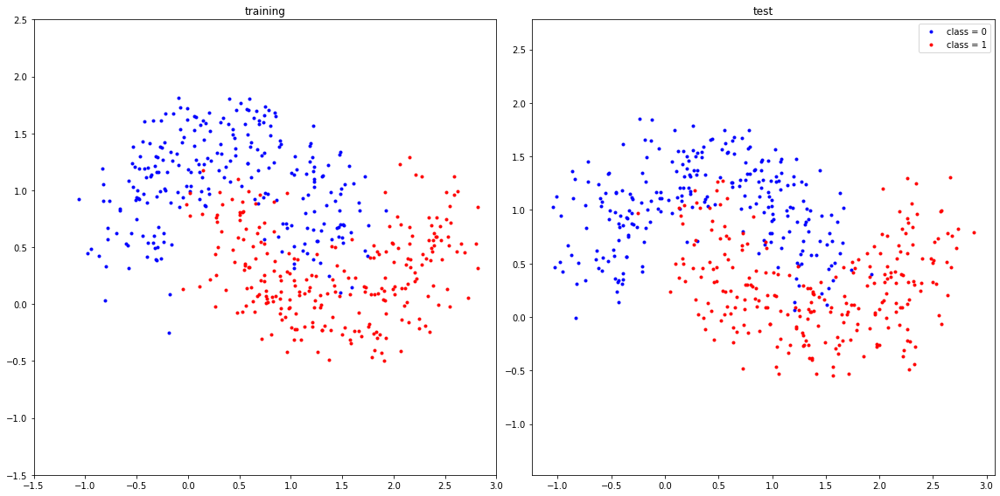

In [934]:

plot_data(data_train, data_test)

## define feature function

In [762]:
def feature_function(x, y):
    
    num_data = x.shape[0]
    feature = np.zeros((num_data, 16))
    
    for i in range(num_data):
        feature[i,0] = 1
        feature[i,1] = x[i]
        feature[i,2] = x[i]**2
        feature[i,3] = x[i]**3
        feature[i,4] = x[i]**4
        feature[i,5] = x[i]**5
        feature[i,6] = x[i]**6
        feature[i,7] = x[i]**7
        feature[i,8] = x[i]**8
        feature[i,9] = x[i]**9
        feature[i,10] = x[i]**10
        feature[i,11] = x[i]**11
        feature[i,12] = x[i]**12
        feature[i,13] = x[i]**13
        feature[i,14] = x[i]**14
        feature[i,15] = y[i]
    
    return feature

## define regression function based on the feature function

In [764]:
def regression_function(theta, feature):
    
    value = theta@feature.T
    
    return value

## define regularization function on the model parameters

In [765]:
def regularization_function(theta):
    
    value = theta.T@theta
    
    return value

## define sigmoid function

In [766]:
def logistic_function(x):
    
    z = 1 / (1 + np.exp(-x))
    
    return z

## define loss function where $\alpha$ is a weight for the quadratic regularization term (Note that you need to add a small number (np.finfo(float).eps) inside logarithm function in order to avoid $\log( 0 )$)

In [767]:
def compute_loss_feature(theta, feature, label, alpha):

    value = regression_function(theta, feature)
    logistic = logistic_function(value)
    r = (-label*np.log(logistic)) - (1-label)*np.log(1-logistic)
    
    loss = 0
    
    for i in range(label.shape[0]):
        r = (-label[i]*np.log(logistic[i]) - (1-label[i])*np.log(1-logistic[i]))
        if(np.isnan(r)==False): loss = loss + r
    
    loss = (1/label.shape[0])*loss + (alpha/2)*(1/theta.shape[0])*regularization_function(theta)
    
    #loss = r.sum(axis=0)
    #loss = (1/label.shape[0])*loss + (alpha/2)*(1/theta.shape[0])*regularization_function(theta)
    #loss = loss + (alpha/2)*regularization_function(theta)
    
    return loss

In [768]:
x = np.array((1,2,3,4,5))
y = np.array((1,2,1,0,1))
l = np.array((1,0,1,0,0))
x = (x-np.mean(x))/np.std(x)
y = (y-np.mean(y))/np.std(y)
f = feature_function(x/x.max(),y/y.max())

print(f)

t = np.array((0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0))
print(compute_loss_feature(t,f,l,1))

[[ 1.00000000e+00 -1.00000000e+00  1.00000000e+00 -1.00000000e+00
   1.00000000e+00 -1.00000000e+00  1.00000000e+00 -1.00000000e+00
   1.00000000e+00 -1.00000000e+00  1.00000000e+00 -1.00000000e+00
   1.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00]
 [ 1.00000000e+00 -5.00000000e-01  2.50000000e-01 -1.25000000e-01
   6.25000000e-02 -3.12500000e-02  1.56250000e-02 -7.81250000e-03
   3.90625000e-03 -1.95312500e-03  9.76562500e-04 -4.88281250e-04
   2.44140625e-04 -1.22070312e-04  6.10351562e-05  1.00000000e+00]
 [ 1.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.00000000e+00  5.00000000e-01  2.50000000e-01  1.25000000e-01
   6.25000000e-02  3.12500000e-02  1.56250000e-02  7.81250000e-03
   3.90625000e-03  1.95312500e-03  9.76562500e-04  4.88281250e-04
   2.44

## define gradient vector for the model parameters with the quadratic regularization term whose weight is $\alpha$

In [769]:
def compute_gradient_feature(theta, feature, label, alpha):
    
    value = regression_function(theta, feature)
    
    logistic = logistic_function(value)
        
    
    gradient = np.zeros((label.shape[0],feature.shape[1]))
    
    r = logistic-label
    gradient = (r * feature.T).sum(axis = 1)
    gradient = (1/label.shape[0]) * gradient
    
    gradient = gradient + ((alpha*theta)/theta.shape[0])
    
    return gradient

## compute the accuracy

In [770]:
def compute_accuracy(theta, feature, label):
    
    value = regression_function(theta, feature)
    
    logistic = logistic_function(value)
    
    for i in range(value.shape[0]):
        t = logistic_function(value[i])
        if(t >= 0.5): logistic[i] = 1
        else: logistic[i] = 0
        
        
    accuracy = (1/label.shape[0])*(1-abs(logistic-label)).sum()
    
    return accuracy

## gradient descent for the model parameters $\theta$

In [878]:
num_iteration   = 30000         
learning_rate   = 1          
alpha = 1

#theta           = np.array((2.16046874, 5.21812891, -11.17717528, 0.57854907, 3.8749419, 5.40585483, 5.26839072, 4.67023552, 3.90982794, 3.19105768, 2.5664332, 2.05107486, 1.63589016, 1.3062552, 1.04637118, -7.82650023))
theta           = np.array((0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0))

#x_train = (data_train[:,0]-np.mean(data_train[:,0]))/np.std(data_train[:,0])
#y_train = (data_train[:,1]-np.mean(data_train[:,1]))/np.std(data_train[:,1])
x_train = data_train[:,0]
y_train = data_train[:,1]
feature_train = feature_function(x_train/x_train.max(), y_train/y_train.max())
label_train = data_train[:,2]

#x_test = (data_test[:,0]-np.mean(data_test[:,0]))/np.std(data_test[:,0])
#y_test = (data_test[:,1]-np.mean(data_test[:,1]))/np.std(data_test[:,1])
x_test = data_test[:,0]
y_test = data_test[:,1]
feature_test = feature_function(x_test/x_test.max(), y_test/y_test.max())
label_test = data_test[:,2]
dim_feature = 16
print(feature_test.shape)

(500, 16)


In [879]:
theta_iteration             = np.zeros((num_iteration, dim_feature))
loss_iteration_train        = np.zeros(num_iteration)
loss_iteration_test         = np.zeros(num_iteration)
accuracy_iteration_train    = np.zeros(num_iteration)
accuracy_iteration_test     = np.zeros(num_iteration)

In [880]:
for i in range(num_iteration):
    
    theta = theta - learning_rate*compute_gradient_feature(theta, feature_train, label_train, alpha)
    
    loss_train = compute_loss_feature(theta, feature_train, label_train, alpha)
    accuracy_train = compute_accuracy(theta, feature_train, label_train)
    
    loss_test = compute_loss_feature(theta, feature_test, label_test, alpha)
    accuracy_test = compute_accuracy(theta, feature_test, label_test)
    
    theta_iteration[i] = theta
    loss_iteration_train[i] = loss_train
    accuracy_iteration_train[i] = accuracy_train
    loss_iteration_test[i] = loss_test
    accuracy_iteration_test[i] = accuracy_test

    print("[%4d] loss(train) = %5.5f, accuracy(train) = %5.5f, loss(test) = %5.5f, accuracy(test) = %5.5f" % (i, loss_train, accuracy_train, loss_test, accuracy_test))
    print(theta)


[   0] loss(train) = 0.66271, accuracy(train) = 0.81400, loss(test) = 0.66463, accuracy(test) = 0.81800
[ 0.          0.09113464  0.05908071  0.04995115  0.04024284  0.03357339
  0.02819985  0.02403852  0.02071487  0.01805201  0.01588959  0.01411803
  0.01265202  0.01142815  0.01039772 -0.10759855]
[   1] loss(train) = 0.63643, accuracy(train) = 0.81200, loss(test) = 0.63986, accuracy(test) = 0.82400
[-0.00526084  0.17390959  0.11188099  0.09472259  0.07620319  0.06350732
  0.05325727  0.0453213   0.03898324  0.03390852  0.0297906   0.02642015
  0.0236338   0.0213101   0.01935574 -0.21263955]
[   2] loss(train) = 0.61350, accuracy(train) = 0.81000, loss(test) = 0.61815, accuracy(test) = 0.82800
[-0.01305237  0.24988481  0.15953124  0.13519046  0.10859734  0.09040596
  0.07569398  0.06430672  0.05521353  0.04793754  0.04203787  0.03721354
  0.03322917  0.0299098   0.02712092 -0.31440162]
[   3] loss(train) = 0.59332, accuracy(train) = 0.81400, loss(test) = 0.59898, accuracy(test) = 0.83

[  43] loss(train) = 0.37676, accuracy(train) = 0.83000, loss(test) = 0.39012, accuracy(test) = 0.84800
[ 0.09448124  1.54871089  0.79653078  0.70326748  0.56173729  0.46892406
  0.38786875  0.32388784  0.27184048  0.23009653  0.19636546  0.1690433
  0.14676176  0.12847494  0.11335782 -2.61953476]
[  44] loss(train) = 0.37525, accuracy(train) = 0.83200, loss(test) = 0.38868, accuracy(test) = 0.84800
[ 0.10092613  1.56267087  0.8003024   0.70788994  0.56578336  0.47261606
  0.39102914  0.32656139  0.27407243  0.23195597  0.19791526  0.17033971
  0.1478515   0.1293963   0.11414165 -2.65395873]
[  45] loss(train) = 0.37380, accuracy(train) = 0.83600, loss(test) = 0.38728, accuracy(test) = 0.84800
[ 0.10737687  1.57625205  0.80384458  0.71234364  0.56970873  0.47621717
  0.39411967  0.32917986  0.27626013  0.23377928  0.19943512  0.17161099
  0.14891993  0.13029941  0.11490973 -2.68786267]
[  46] loss(train) = 0.37239, accuracy(train) = 0.83600, loss(test) = 0.38594, accuracy(test) = 0.848

[  75] loss(train) = 0.34528, accuracy(train) = 0.85000, loss(test) = 0.36033, accuracy(test) = 0.85000
[ 0.29579401  1.85833212  0.8360035   0.7922976   0.64957658  0.55597962
  0.46528467  0.39085435  0.32841613  0.27752984  0.23600474  0.20221168
  0.17460661  0.15196176  0.13327702 -3.52145525]
[  76] loss(train) = 0.34465, accuracy(train) = 0.85000, loss(test) = 0.35975, accuracy(test) = 0.85000
[ 0.3017697   1.86475321  0.83535781  0.79373941  0.65138598  0.55800798
  0.46718001  0.39253909  0.32986009  0.27875002  0.23702825  0.20306911
  0.17532602  0.15256752  0.13378947 -3.54452278]
[  77] loss(train) = 0.34404, accuracy(train) = 0.85200, loss(test) = 0.35918, accuracy(test) = 0.85000
[ 0.30772167  1.87103696  0.83463523  0.79512745  0.65315838  0.56000925
  0.46905502  0.3942081   0.33129163  0.27996021  0.23804359  0.20391976
  0.17603974  0.15316847  0.1342978  -3.56735173]
[  78] loss(train) = 0.34344, accuracy(train) = 0.85200, loss(test) = 0.35862, accuracy(test) = 0.85

[ 107] loss(train) = 0.33017, accuracy(train) = 0.85200, loss(test) = 0.34654, accuracy(test) = 0.85400
[ 0.4749837   2.01045046  0.78603713  0.81818884  0.69365863  0.61081809
  0.5184021   0.43895212  0.37003924  0.31289112  0.2657475   0.22715665
  0.19553782  0.16957537  0.14816057 -4.15990964]
[ 108] loss(train) = 0.32982, accuracy(train) = 0.85200, loss(test) = 0.34623, accuracy(test) = 0.85400
[ 0.48018457  2.0138438   0.78374629  0.81850171  0.69470068  0.6122887
  0.51988079  0.44031563  0.37123011  0.31390792  0.26660493  0.22787653
  0.19614191  0.17008342  0.14858942 -4.17708266]
[ 109] loss(train) = 0.32948, accuracy(train) = 0.85200, loss(test) = 0.34592, accuracy(test) = 0.85400
[ 0.48536185  2.01717551  0.78142341  0.81879323  0.69572847  0.61374904
  0.52135186  0.44167328  0.37241637  0.31492103  0.26745934  0.22859391
  0.19674391  0.17058968  0.14901674 -4.19411524]
[ 110] loss(train) = 0.32914, accuracy(train) = 0.85200, loss(test) = 0.34562, accuracy(test) = 0.854

[ 137] loss(train) = 0.32163, accuracy(train) = 0.85400, loss(test) = 0.33902, accuracy(test) = 0.85400
[ 0.62109927  2.090294    0.70615555  0.82025341  0.72006803  0.65145832
  0.56018321  0.47787509  0.40420472  0.34214027  0.29044359  0.24790034
  0.21294345  0.18420691  0.16050253 -4.62100992]
[ 138] loss(train) = 0.32140, accuracy(train) = 0.85400, loss(test) = 0.33882, accuracy(test) = 0.85400
[ 0.62563101  2.09232789  0.70318317  0.82012314  0.72081778  0.65271987
  0.56150693  0.47911947  0.40530172  0.34308149  0.29123909  0.24856872
  0.21350416  0.18467801  0.16089961 -4.63468356]
[ 139] loss(train) = 0.32117, accuracy(train) = 0.85400, loss(test) = 0.33863, accuracy(test) = 0.85400
[ 0.63014192  2.09433007  0.70019573  0.81998348  0.72156146  0.65397712
  0.56282746  0.48036139  0.40639678  0.34402114  0.2920333   0.24923601
  0.21406395  0.18514831  0.161296   -4.64826139]
[ 140] loss(train) = 0.32095, accuracy(train) = 0.85400, loss(test) = 0.33844, accuracy(test) = 0.85

[ 167] loss(train) = 0.31582, accuracy(train) = 0.85400, loss(test) = 0.33407, accuracy(test) = 0.85400
[ 0.74838249  2.13986566  0.61173183  0.81314853  0.74051985  0.68786475
  0.5988275   0.51438056  0.43645703  0.36984057  0.31386311  0.2675757
  0.22944354  0.19806246  0.17217327 -4.99350472]
[ 168] loss(train) = 0.31565, accuracy(train) = 0.85400, loss(test) = 0.33393, accuracy(test) = 0.85400
[ 0.75233114  2.14118673  0.60843895  0.81282635  0.74114803  0.68904073
  0.60008772  0.51557565  0.43751461  0.3707495   0.31463166  0.26822124
  0.22998464  0.19851657  0.17255549 -5.00471176]
[ 169] loss(train) = 0.31549, accuracy(train) = 0.85400, loss(test) = 0.33380, accuracy(test) = 0.85400
[ 0.75626181  2.14249084  0.60513907  0.81250027  0.74177384  0.69021506
  0.6013467   0.51676976  0.4385714   0.37165777  0.31539965  0.26886628
  0.23052532  0.19897028  0.17293736 -5.01584893]
[ 170] loss(train) = 0.31533, accuracy(train) = 0.85400, loss(test) = 0.33367, accuracy(test) = 0.854

[ 197] loss(train) = 0.31161, accuracy(train) = 0.85400, loss(test) = 0.33059, accuracy(test) = 0.85800
[ 0.8593784   2.17335274  0.510549    0.80222221  0.75861645  0.72262562
  0.63624171  0.54991767  0.46792142  0.39688342  0.33672386  0.28676923
  0.24552343  0.21154826  0.18351626 -5.30181286]
[ 198] loss(train) = 0.31149, accuracy(train) = 0.85400, loss(test) = 0.33049, accuracy(test) = 0.85800
[ 0.86282559  2.17429044  0.50711188  0.80182692  0.75920204  0.72377219
  0.63747946  0.55109443  0.46896348  0.39777889  0.33748055  0.28740419
  0.24605505  0.2119938   0.18389072 -5.31118155]
[ 199] loss(train) = 0.31137, accuracy(train) = 0.85400, loss(test) = 0.33039, accuracy(test) = 0.85800
[ 0.86625736  2.175219    0.50367181  0.80143041  0.759787    0.72491834
  0.63871687  0.55227088  0.47000526  0.39867408  0.33823698  0.28803892
  0.24658645  0.21243913  0.18426499 -5.32049698]
[ 200] loss(train) = 0.31125, accuracy(train) = 0.85400, loss(test) = 0.33030, accuracy(test) = 0.85

[ 228] loss(train) = 0.30833, accuracy(train) = 0.85200, loss(test) = 0.32794, accuracy(test) = 0.85800
[ 0.95941681  2.19890541  0.40299761  0.78963307  0.7766244   0.75807128
  0.67452016  0.58630358  0.50012965  0.42454669  0.36008638  0.30636111
  0.26191538  0.22527599  0.19504509 -5.5693249 ]
[ 229] loss(train) = 0.30824, accuracy(train) = 0.85200, loss(test) = 0.32787, accuracy(test) = 0.85800
[ 0.96242128  2.19963217  0.39950522  0.7892225   0.77720472  0.7592143
  0.67575389  0.58747562  0.50116647  0.42543662  0.36083743  0.30699048
  0.26244155  0.22571629  0.19541456 -5.57722812]
[ 230] loss(train) = 0.30815, accuracy(train) = 0.85200, loss(test) = 0.32780, accuracy(test) = 0.85800
[ 0.96541262  2.20035417  0.39601203  0.78881204  0.77778525  0.76035746
  0.67698765  0.58864763  0.50220321  0.42632644  0.36158836  0.30761972
  0.26296759  0.22615645  0.19578389 -5.58508973]
[ 231] loss(train) = 0.30806, accuracy(train) = 0.85200, loss(test) = 0.32773, accuracy(test) = 0.858

[ 260] loss(train) = 0.30570, accuracy(train) = 0.85400, loss(test) = 0.32587, accuracy(test) = 0.86000
[ 1.04937326  2.22024499  0.29104603  0.77666188  0.79536132  0.79475662
  0.71404851  0.62381449  0.53328366  0.45298093  0.38406476  0.32643911
  0.27868781  0.2392997   0.20680293 -5.80302291]
[ 261] loss(train) = 0.30563, accuracy(train) = 0.85200, loss(test) = 0.32581, accuracy(test) = 0.86200
[ 1.05198966  2.22086172  0.28754708  0.77626539  0.79595427  0.79590781
  0.71528616  0.62498739  0.53431927  0.4538683   0.38481243  0.32706462
  0.27920989  0.23973583  0.20716826 -5.80973402]
[ 262] loss(train) = 0.30556, accuracy(train) = 0.85200, loss(test) = 0.32576, accuracy(test) = 0.86200
[ 1.05459494  2.22147616  0.28404842  0.7758696   0.79654776  0.79705935
  0.71652398  0.62616036  0.53535486  0.45475561  0.38556     0.32769002
  0.27973184  0.24017183  0.20753347 -5.81641204]
[ 263] loss(train) = 0.30549, accuracy(train) = 0.85200, loss(test) = 0.32570, accuracy(test) = 0.86

[ 295] loss(train) = 0.30343, accuracy(train) = 0.85200, loss(test) = 0.32411, accuracy(test) = 0.86400
[ 1.1346899   2.24078426  0.16888083  0.76325995  0.81646267  0.83526468
  0.75747732  0.66490572  0.56952184  0.48400056  0.41017592  0.34826393
  0.29688673  0.25448841  0.219514   -6.01958118]
[ 296] loss(train) = 0.30338, accuracy(train) = 0.85200, loss(test) = 0.32406, accuracy(test) = 0.86400
[ 1.13694923  2.24134809  0.16540266  0.76289274  0.81707664  0.83642878
  0.75872153  0.66608091  0.57055691  0.48488559  0.41092015  0.34888536
  0.2974044   0.25492002  0.21987484 -6.02525448]
[ 297] loss(train) = 0.30332, accuracy(train) = 0.85200, loss(test) = 0.32402, accuracy(test) = 0.86400
[ 1.13919926  2.24191106  0.16192531  0.76252645  0.81769123  0.83759326
  0.75996593  0.66725615  0.57159194  0.48577055  0.41166426  0.34950667
  0.29792194  0.25535149  0.22023553 -6.03090141]
[ 298] loss(train) = 0.30326, accuracy(train) = 0.85200, loss(test) = 0.32397, accuracy(test) = 0.86

[ 329] loss(train) = 0.30164, accuracy(train) = 0.85400, loss(test) = 0.32273, accuracy(test) = 0.86400
[ 1.20656574  2.25962521  0.05113407  0.75130142  0.83768745  0.87504656
  0.7998752   0.704886    0.6046927   0.51404257  0.435414    0.36931816
  0.31440912  0.26908394  0.23170453 -6.1985941 ]
[ 330] loss(train) = 0.30159, accuracy(train) = 0.85400, loss(test) = 0.32269, accuracy(test) = 0.86400
[ 1.20853417  2.26017331  0.04768803  0.75096619  0.8383224   0.87622261
  0.80112484  0.70606236  0.60572623  0.51492442  0.43615408  0.36993493
  0.31492191  0.26951065  0.23206055 -6.20345456]
[ 331] loss(train) = 0.30155, accuracy(train) = 0.85400, loss(test) = 0.32266, accuracy(test) = 0.86400
[ 1.21049477  2.26072128  0.04424301  0.7506319   0.83895794  0.87739898
  0.8023746   0.70723872  0.60675969  0.51580616  0.43689402  0.37055155
  0.31543455  0.2699372   0.23241643 -6.20829349]
[ 332] loss(train) = 0.30150, accuracy(train) = 0.85400, loss(test) = 0.32262, accuracy(test) = 0.86

[ 361] loss(train) = 0.30022, accuracy(train) = 0.85600, loss(test) = 0.32164, accuracy(test) = 0.86400
[ 1.26586043  2.27716356 -0.05861872  0.74102925  0.85828709  0.91282703
  0.83991761  0.7425247   0.63772494  0.54219988  0.45902308  0.38897615
  0.33073845  0.28265962  0.24302123 -6.34403108]
[ 362] loss(train) = 0.30018, accuracy(train) = 0.85600, loss(test) = 0.32161, accuracy(test) = 0.86400
[ 1.26759678  2.27771355 -0.06203094  0.74072301  0.85893974  0.91401213
  0.84117037  0.74370045  0.63875559  0.54307754  0.45975825  0.38958771
  0.33124597  0.28308114  0.24337227 -6.34825947]
[ 363] loss(train) = 0.30014, accuracy(train) = 0.85600, loss(test) = 0.32157, accuracy(test) = 0.86400
[ 1.26932646  2.27826376 -0.06544209  0.74041764  0.8595929   0.91519747
  0.8424232   0.74487616  0.63978613  0.54395504  0.46049326  0.39019909
  0.33175331  0.2835025   0.24372314 -6.35246984]
[ 364] loss(train) = 0.30010, accuracy(train) = 0.85600, loss(test) = 0.32154, accuracy(test) = 0.86

[ 401] loss(train) = 0.29871, accuracy(train) = 0.85800, loss(test) = 0.32046, accuracy(test) = 0.86400
[ 1.33041066  2.29939787 -0.1942767   0.72942656  0.88476247  0.9603949
  0.89005709  0.78950115  0.67884933  0.57717805  0.48828975  0.41329436
  0.35089663  0.29938289  0.25693172 -6.50001901]
[ 402] loss(train) = 0.29868, accuracy(train) = 0.85800, loss(test) = 0.32044, accuracy(test) = 0.86400
[ 1.33190354  2.29996129 -0.19764655  0.72915266  0.88543327  0.96158772
  0.89131078  0.7906737   0.67987441  0.57804885  0.4890175   0.41389835
  0.35139669  0.29979724  0.25727594 -6.50359643]
[ 403] loss(train) = 0.29864, accuracy(train) = 0.85800, loss(test) = 0.32041, accuracy(test) = 0.86600
[ 1.33339092  2.30052513 -0.20101536  0.7288795   0.88610448  0.96278068
  0.89256446  0.79184615  0.68089933  0.57891947  0.48974505  0.41450214
  0.35189656  0.3002114   0.25762    -6.50715925]
[ 404] loss(train) = 0.29861, accuracy(train) = 0.85800, loss(test) = 0.32038, accuracy(test) = 0.866

[ 437] loss(train) = 0.29753, accuracy(train) = 0.85800, loss(test) = 0.31954, accuracy(test) = 0.86800
[ 1.38086156  2.31996524 -0.31494953  0.72001238  0.9091409   1.00340984
  0.93516637  0.83163231  0.71564028  0.60840015  0.51435676  0.43490673
  0.36877217  0.31417899  0.26921084 -6.6201019 ]
[ 438] loss(train) = 0.29750, accuracy(train) = 0.85800, loss(test) = 0.31951, accuracy(test) = 0.86800
[ 1.38217154  2.32054531 -0.31828309  0.71976328  0.90982422  1.00460636
  0.93641833  0.83279995  0.71665873  0.60926352  0.51507683  0.43550311
  0.3692649   0.3145864   0.26954856 -6.62319662]
[ 439] loss(train) = 0.29747, accuracy(train) = 0.85800, loss(test) = 0.31949, accuracy(test) = 0.86800
[ 1.38347687  2.32112587 -0.32161568  0.71951482  0.91050784  1.00580295
  0.9376702   0.83396742  0.71767698  0.61012667  0.51579667  0.43609927
  0.36975743  0.3149936   0.26988609 -6.62627911]
[ 440] loss(train) = 0.29744, accuracy(train) = 0.85800, loss(test) = 0.31946, accuracy(test) = 0.86

[ 469] loss(train) = 0.29659, accuracy(train) = 0.85600, loss(test) = 0.31878, accuracy(test) = 0.86800
[ 1.42057325  2.33877335 -0.42114964  0.71234021  0.93114378  1.0417203
  0.97518232  0.86891137  0.74812601  0.63591539  0.53728518  0.45388025
  0.3844342   0.32711673  0.27992554 -6.71334515]
[ 470] loss(train) = 0.29656, accuracy(train) = 0.85800, loss(test) = 0.31876, accuracy(test) = 0.86800
[ 1.42174427  2.33936935 -0.42445296  0.71210989  0.9318355   1.0429179
  0.97643102  0.87007332  0.74913757  0.63677139  0.53799784  0.45446943
  0.38492009  0.3275177   0.28025729 -6.71607591]
[ 471] loss(train) = 0.29654, accuracy(train) = 0.86000, loss(test) = 0.31873, accuracy(test) = 0.86800
[ 1.42291125  2.33996584 -0.42775537  0.71188012  0.93252745  1.04411551
  0.9776796   0.87123507  0.7501489   0.63762715  0.53871025  0.45505838
  0.38540576  0.32791848  0.28058884 -6.71879615]
[ 472] loss(train) = 0.29651, accuracy(train) = 0.86000, loss(test) = 0.31871, accuracy(test) = 0.8680

[ 500] loss(train) = 0.29575, accuracy(train) = 0.86000, loss(test) = 0.31809, accuracy(test) = 0.86600
[ 1.45507974  2.35748077 -0.523136    0.70544021  0.95268308  1.07884059
  1.01382914  0.90483733  0.77937533  0.66233774  0.55926496  0.47203682
  0.39939478  0.33945202  0.29012181 -6.79331794]
[ 501] loss(train) = 0.29573, accuracy(train) = 0.86000, loss(test) = 0.31807, accuracy(test) = 0.86600
[ 1.45613384  2.35809214 -0.52641185  0.70522547  0.95338087  1.08003758
  1.01507347  0.90599285  0.78037953  0.6631861   0.55997007  0.47261876
  0.39987386  0.33984666  0.29044769 -6.79574404]
[ 502] loss(train) = 0.29570, accuracy(train) = 0.86000, loss(test) = 0.31805, accuracy(test) = 0.86600
[ 1.45718443  2.358704   -0.52968685  0.70501119  0.95407882  1.08123454
  1.01631763  0.90714815  0.78138348  0.6640342   0.56067493  0.47320047
  0.4003527   0.34024108  0.29077339 -6.79816101]
[ 503] loss(train) = 0.29568, accuracy(train) = 0.86000, loss(test) = 0.31803, accuracy(test) = 0.86

[ 532] loss(train) = 0.29495, accuracy(train) = 0.86000, loss(test) = 0.31742, accuracy(test) = 0.86600
[ 1.48714193  2.37728347 -0.62754641  0.69878726  0.97508608  1.11711691
  1.05356444  0.94170176  0.81138532  0.68935826  0.58170459  0.49054129
  0.41461484  0.35197814  0.30045617 -6.86661745]
[ 533] loss(train) = 0.29493, accuracy(train) = 0.86000, loss(test) = 0.31740, accuracy(test) = 0.86600
[ 1.48809084  2.37791011 -0.63079566  0.69858626  0.97578835  1.11831192
  1.05480326  0.94284993  0.81238142  0.69019838  0.58240168  0.49111562
  0.41508679  0.35236618  0.300776   -6.86877044]
[ 534] loss(train) = 0.29490, accuracy(train) = 0.86000, loss(test) = 0.31738, accuracy(test) = 0.86600
[ 1.48903668  2.37853722 -0.63404411  0.69838565  0.97649073  1.11950684
  1.05604189  0.94399787  0.81337727  0.69103824  0.58309851  0.49168971
  0.41555852  0.35275402  0.30109564 -6.8709155 ]
[ 535] loss(train) = 0.29488, accuracy(train) = 0.86000, loss(test) = 0.31736, accuracy(test) = 0.86

[ 563] loss(train) = 0.29422, accuracy(train) = 0.86200, loss(test) = 0.31679, accuracy(test) = 0.86600
[ 1.51519087  2.39692114 -0.72790581  0.69273158  0.99690337  1.15411977
  1.09187839  0.97718206  0.84214267  0.71527973  0.60319628  0.50823412
  0.42914177  0.36391205  0.31028345 -6.92982031]
[ 564] loss(train) = 0.29420, accuracy(train) = 0.86200, loss(test) = 0.31677, accuracy(test) = 0.86600
[ 1.51605063  2.39756174 -0.73113081  0.69254197  0.99760855  1.15531179
  1.09311114  0.97832263  0.8431306   0.71611167  0.60388549  0.50880103
  0.42960682  0.36429374  0.31059746 -6.93174257]
[ 565] loss(train) = 0.29417, accuracy(train) = 0.86200, loss(test) = 0.31675, accuracy(test) = 0.86600
[ 1.5169077   2.39820278 -0.73435504  0.69235271  0.99831382  1.15650371
  1.09434369  0.97946294  0.84411827  0.71694335  0.60457444  0.50936769
  0.43007165  0.36467523  0.31091129 -6.93365789]
[ 566] loss(train) = 0.29415, accuracy(train) = 0.86200, loss(test) = 0.31673, accuracy(test) = 0.86

[ 592] loss(train) = 0.29357, accuracy(train) = 0.86200, loss(test) = 0.31622, accuracy(test) = 0.86600
[ 1.53907166  2.41567145 -0.8211271   0.68736517  1.01738006  1.18864091
  1.12754317  1.01015508  0.87068369  0.73929784  0.62307969  0.52457717
  0.44253839  0.37489862  0.31931462 -6.98284908]
[ 593] loss(train) = 0.29355, accuracy(train) = 0.86200, loss(test) = 0.31621, accuracy(test) = 0.86600
[ 1.53985777  2.41632425 -0.82433059  0.68718479  1.01808697  1.18982942
  1.12876977  1.01128822  0.87166381  0.74012205  0.6237615   0.52513714
  0.44299704  0.37527444  0.31962327 -6.98458125]
[ 594] loss(train) = 0.29352, accuracy(train) = 0.86400, loss(test) = 0.31619, accuracy(test) = 0.86600
[ 1.5406415   2.41697746 -0.82753336  0.6870047   1.01879392  1.19101781
  1.12999616  1.01242111  0.87264366  0.74094599  0.62444305  0.52569688
  0.44345546  0.37565005  0.31993175 -6.98630726]
[ 595] loss(train) = 0.29350, accuracy(train) = 0.86400, loss(test) = 0.31617, accuracy(test) = 0.86

[ 620] loss(train) = 0.29297, accuracy(train) = 0.86400, loss(test) = 0.31569, accuracy(test) = 0.86600
[ 1.56021088  2.43409992 -0.91055517  0.68242205  1.03718736  1.22186767
  1.16180445  1.04178422  0.8980242   0.76227447  0.6420742   0.54016674
  0.45529782  0.38534591  0.32788826 -7.02910393]
[ 621] loss(train) = 0.29295, accuracy(train) = 0.86400, loss(test) = 0.31567, accuracy(test) = 0.86600
[ 1.56093364  2.4347637  -0.91373884  0.68224947  1.03789518  1.22305228
  1.16302481  1.04291002  0.89899669  0.76309119  0.6427489   0.54072009
  0.45575036  0.38571615  0.32819185 -7.03067296]
[ 622] loss(train) = 0.29292, accuracy(train) = 0.86400, loss(test) = 0.31565, accuracy(test) = 0.86600
[ 1.56165426  2.43542785 -0.91692181  0.68207715  1.03860302  1.22423675
  1.16424494  1.04403555  0.89996891  0.76390764  0.64342334  0.5412732
  0.45620268  0.38608619  0.32849525 -7.0322365 ]
[ 623] loss(train) = 0.29290, accuracy(train) = 0.86400, loss(test) = 0.31563, accuracy(test) = 0.866

[ 663] loss(train) = 0.29208, accuracy(train) = 0.86400, loss(test) = 0.31488, accuracy(test) = 0.86400
[ 1.58946129  2.46297047 -1.04683916  0.67522291  1.06763388  1.27266759
  1.21407158  1.08995355  0.93959486  0.79715307  0.6708591   0.56374977
  0.47456362  0.40108987  0.34078251 -7.09187728]
[ 664] loss(train) = 0.29206, accuracy(train) = 0.86400, loss(test) = 0.31487, accuracy(test) = 0.86400
[ 1.59009942  2.46364956 -1.0499939   0.67506057  1.06834199  1.27384548
  1.21528196  1.0910679   0.94055562  0.79795837  0.67152302  0.56429313
  0.475007    0.40145176  0.34107854 -7.09322911]
[ 665] loss(train) = 0.29204, accuracy(train) = 0.86400, loss(test) = 0.31485, accuracy(test) = 0.86400
[ 1.59073574  2.46432898 -1.05314798  0.67489845  1.06905009  1.27502322
  1.2164921   1.09218198  0.94151611  0.79876341  0.6721867   0.56483625
  0.47545017  0.40181346  0.34137439 -7.09457631]
[ 666] loss(train) = 0.29202, accuracy(train) = 0.86400, loss(test) = 0.31483, accuracy(test) = 0.86

[ 695] loss(train) = 0.29146, accuracy(train) = 0.86400, loss(test) = 0.31430, accuracy(test) = 0.86400
[ 1.60901939  2.4848627  -1.14747051  0.67013147  1.09028762  1.31027758
  1.25268612  1.12548023  0.9702047   0.82279271  0.69198246  0.58102423
  0.48864861  0.41257689  0.35017061 -7.13293019]
[ 696] loss(train) = 0.29144, accuracy(train) = 0.86400, loss(test) = 0.31428, accuracy(test) = 0.86400
[ 1.60960305  2.48555203 -1.15060472  0.66997566  1.09099528  1.31145009
  1.2538889   1.12658603  0.9711568   0.82358964  0.69263853  0.58156033
  0.48908537  0.41293278  0.3504612  -7.13414273]
[ 697] loss(train) = 0.29142, accuracy(train) = 0.86400, loss(test) = 0.31426, accuracy(test) = 0.86400
[ 1.6101851   2.48624167 -1.1537383   0.66982003  1.09170292  1.31262243
  1.25509144  1.12769157  0.97210863  0.82438632  0.69329436  0.58209621
  0.48952192  0.41328848  0.35075163 -7.13535118]
[ 698] loss(train) = 0.29140, accuracy(train) = 0.86400, loss(test) = 0.31424, accuracy(test) = 0.86

[ 729] loss(train) = 0.29081, accuracy(train) = 0.86400, loss(test) = 0.31368, accuracy(test) = 0.86400
[ 1.62800191  2.50846555 -1.25368466  0.66493685  1.11433383  1.35004542
  1.29344657  1.16292838  1.00242584  0.8497441   0.71415374  0.59912744
  0.50338509  0.4245745   0.35995831 -7.17195932]
[ 730] loss(train) = 0.29079, accuracy(train) = 0.86400, loss(test) = 0.31367, accuracy(test) = 0.86400
[ 1.62853445  2.50916474 -1.25679784  0.66478715  1.11504057  1.35121198
  1.29464122  1.16402515  1.00336886  0.85053231  0.71480166  0.59965605
  0.50381502  0.42492421  0.36024333 -7.17304162]
[ 731] loss(train) = 0.29077, accuracy(train) = 0.86400, loss(test) = 0.31365, accuracy(test) = 0.86400
[ 1.62906558  2.50986421 -1.25991042  0.66463762  1.11574726  1.35237837
  1.29583564  1.16512167  1.00431161  0.85132027  0.71544934  0.60018444
  0.50424475  0.42527374  0.36052819 -7.17412034]
[ 732] loss(train) = 0.29075, accuracy(train) = 0.86400, loss(test) = 0.31363, accuracy(test) = 0.86

[ 765] loss(train) = 0.29014, accuracy(train) = 0.86400, loss(test) = 0.31304, accuracy(test) = 0.86600
[ 1.64632197  2.5338034  -1.36538065  0.65964988  1.1397534   1.39192922
  1.33630362  1.20224679  1.03620895  0.87796137  0.73733119  0.61802186
  0.51873955  0.43705292  0.37011924 -7.20876108]
[ 766] loss(train) = 0.29012, accuracy(train) = 0.86400, loss(test) = 0.31302, accuracy(test) = 0.86600
[ 1.64680693  2.53451195 -1.36847232  0.65950591  1.14045878  1.39308933
  1.33748968  1.20333413  1.03714255  0.87874057  0.73797072  0.61854277
  0.51916249  0.43739633  0.37039859 -7.2097227 ]
[ 767] loss(train) = 0.29011, accuracy(train) = 0.86400, loss(test) = 0.31301, accuracy(test) = 0.86600
[ 1.64729066  2.53522075 -1.37156339  0.65936208  1.14116412  1.39424927
  1.33867551  1.20442121  1.03807588  0.87951952  0.73861002  0.61906347
  0.51958524  0.43773956  0.37067779 -7.2106812 ]
[ 768] loss(train) = 0.29009, accuracy(train) = 0.86400, loss(test) = 0.31299, accuracy(test) = 0.86

[ 1.66124981  2.55659454 -1.46402475  0.65511466  1.16230377  1.42896326
  1.37414024  1.23691353  1.06595642  0.90277432  0.75768327  0.63458792
  0.5321803   0.44795764  0.378983   -7.23804008]
[ 798] loss(train) = 0.28955, accuracy(train) = 0.86200, loss(test) = 0.31246, accuracy(test) = 0.86800
[ 1.66169738  2.55731054 -1.46709784  0.65497525  1.16300771  1.43011759
  1.37531874  1.23799262  1.06688182  0.90354572  0.75831556  0.63510221
  0.53259725  0.44829565  0.37925751 -7.23890732]
[ 799] loss(train) = 0.28953, accuracy(train) = 0.86200, loss(test) = 0.31244, accuracy(test) = 0.86800
[ 1.66214385  2.55802675 -1.47017035  0.65483598  1.16371161  1.43127173
  1.37649701  1.23907146  1.06780697  0.90431688  0.75894763  0.6356163
  0.53301402  0.44863349  0.37953187 -7.23977179]
[ 800] loss(train) = 0.28951, accuracy(train) = 0.86200, loss(test) = 0.31242, accuracy(test) = 0.86800
[ 1.66258923  2.55874319 -1.4732423   0.65469685  1.16441547  1.43242569
  1.37767504  1.24015005  1.

[ 831] loss(train) = 0.28897, accuracy(train) = 0.86400, loss(test) = 0.31188, accuracy(test) = 0.86800
[ 1.67587227  2.58105753 -1.56819076  0.65044887  1.18621063  1.46810877
  1.41407814  1.27346061  1.0972792   0.92886818  0.77905727  0.65196101
  0.54625455  0.45935809  0.38823417 -7.2660305 ]
[ 832] loss(train) = 0.28895, accuracy(train) = 0.86400, loss(test) = 0.31187, accuracy(test) = 0.86800
[ 1.6762845   2.5817806  -1.5712446   0.65031388  1.18691289  1.46925694
  1.41524871  1.27453112  1.09819611  0.92963152  0.7796821   0.65246851
  0.54666535  0.45969057  0.38850374 -7.26680899]
[ 833] loss(train) = 0.28893, accuracy(train) = 0.86400, loss(test) = 0.31185, accuracy(test) = 0.86800
[ 1.67669576  2.58250387 -1.57429787  0.65017902  1.18761511  1.47040493
  1.41641906  1.27560138  1.09911276  0.93039462  0.78030671  0.6529758
  0.54707598  0.4600229   0.38877316 -7.26758505]
[ 834] loss(train) = 0.28892, accuracy(train) = 0.86400, loss(test) = 0.31183, accuracy(test) = 0.868

[ 861] loss(train) = 0.28845, accuracy(train) = 0.86400, loss(test) = 0.31136, accuracy(test) = 0.86800
[ 1.68782796  2.60283194 -1.65956404  0.64645194  1.20725604  1.50247557
  1.44909537  1.30546806  1.12467995  0.95166756  0.79770911  0.66710115
  0.55850233  0.46926411  0.3962599  -7.28835693]
[ 862] loss(train) = 0.28844, accuracy(train) = 0.86400, loss(test) = 0.31135, accuracy(test) = 0.86800
[ 1.68821232  2.60356057 -1.66260126  0.64632055  1.20795673  1.50361835
  1.45025907  1.30653116  1.12558955  0.95242398  0.79832756  0.66760283
  0.5589079   0.4695919   0.39652527 -7.28906581]
[ 863] loss(train) = 0.28842, accuracy(train) = 0.86400, loss(test) = 0.31133, accuracy(test) = 0.86800
[ 1.68859581  2.60428939 -1.66563792  0.64618927  1.20865738  1.50476095
  1.45142254  1.30759402  1.12649891  0.95318018  0.79894579  0.66810433
  0.5593133   0.46991953  0.3967905  -7.2897725 ]
[ 864] loss(train) = 0.28840, accuracy(train) = 0.86400, loss(test) = 0.31131, accuracy(test) = 0.86

[ 901] loss(train) = 0.28778, accuracy(train) = 0.86400, loss(test) = 0.31068, accuracy(test) = 0.86800
[ 1.70254473  2.63210785 -1.780628    0.64128368  1.23524183  1.54804757
  1.49546754  1.3478033   1.16087839  0.98174932  0.82228568  0.68702214
  0.57459328  0.48225763  0.40676932 -7.31507798]
[ 902] loss(train) = 0.28776, accuracy(train) = 0.86400, loss(test) = 0.31066, accuracy(test) = 0.86800
[ 1.70289613  2.63284301 -1.78364352  0.64115671  1.23594036  1.54918324
  1.49662227  1.34885677  1.16177853  0.98249682  0.82289591  0.68751637
  0.57499214  0.48257941  0.40702934 -7.31570507]
[ 903] loss(train) = 0.28774, accuracy(train) = 0.86400, loss(test) = 0.31064, accuracy(test) = 0.86800
[ 1.70324676  2.63357831 -1.78665851  0.64102985  1.23663883  1.55031873
  1.49777677  1.34991001  1.16267844  0.9832441   0.82350594  0.68801042
  0.57539083  0.48290105  0.40728922 -7.31633027]
[ 904] loss(train) = 0.28773, accuracy(train) = 0.86400, loss(test) = 0.31062, accuracy(test) = 0.86

[ 930] loss(train) = 0.28730, accuracy(train) = 0.86400, loss(test) = 0.31018, accuracy(test) = 0.86800
[ 1.71243285  2.65348596 -1.86786167  0.63764396  1.2554769   1.58091072
  1.52886531  1.37825849  1.18688893  1.00333867  0.83990145  0.70128148
  0.58609437  0.49153054  0.41425728 -7.33251772]
[ 931] loss(train) = 0.28728, accuracy(train) = 0.86400, loss(test) = 0.31016, accuracy(test) = 0.86800
[ 1.712763    2.65422522 -1.87086177  0.63751999  1.25617384  1.58204132
  1.53001368  1.37930517  1.18778242  1.00407991  0.84050593  0.7017705
  0.58648856  0.49184815  0.41451357 -7.33309247]
[ 932] loss(train) = 0.28726, accuracy(train) = 0.86400, loss(test) = 0.31015, accuracy(test) = 0.86800
[ 1.71309245  2.65496461 -1.87386134  0.63739612  1.25687072  1.58317174
  1.53116184  1.38035162  1.18867568  1.00482093  0.84111021  0.70225934
  0.58688258  0.49216561  0.41476973 -7.3336655 ]
[ 933] loss(train) = 0.28725, accuracy(train) = 0.86400, loss(test) = 0.31013, accuracy(test) = 0.868

[ 1.72173271  2.67497646 -1.95465123  0.63408908  1.27566575  1.61362795
  1.56208069  1.40851893  1.21270894  1.02474884  0.8573528   0.71539201
  0.59746197  0.5006843   0.4216392  -7.34851271]
[ 960] loss(train) = 0.28681, accuracy(train) = 0.86400, loss(test) = 0.30967, accuracy(test) = 0.86800
[ 1.72204358  2.67571935 -1.95763613  0.63396796  1.27636109  1.61475355
  1.56322285  1.40955897  1.21359595  1.02548398  0.85795169  0.71587599
  0.59785163  0.50099787  0.42189191 -7.34904025]
[ 961] loss(train) = 0.28679, accuracy(train) = 0.86400, loss(test) = 0.30966, accuracy(test) = 0.86800
[ 1.72235381  2.67646236 -1.96062052  0.63384694  1.27705638  1.61587899
  1.56436479  1.41059879  1.21448274  1.02621892  0.8585504   0.71635979
  0.59824114  0.50131131  0.42214449 -7.34956625]
[ 962] loss(train) = 0.28677, accuracy(train) = 0.86400, loss(test) = 0.30964, accuracy(test) = 0.86800
[ 1.72266341  2.67720549 -1.96360438  0.63372602  1.27775162  1.61700426
  1.56550651  1.41163839  1

[ 992] loss(train) = 0.28629, accuracy(train) = 0.86400, loss(test) = 0.30914, accuracy(test) = 0.86800
[ 1.73166836  2.69955074 -2.05287964  0.63014212  1.29858334  1.65068357
  1.59966064  1.44272221  1.24186484  1.04890048  0.87701737  0.73127369
  0.61024066  0.51096087  0.42991514 -7.36513605]
[ 993] loss(train) = 0.28627, accuracy(train) = 0.86400, loss(test) = 0.30912, accuracy(test) = 0.86800
[ 1.73195941  2.70029722 -2.0558475   0.6300241   1.29927689  1.65180361
  1.60079588  1.4437549   1.24274468  1.0496289   0.87761011  0.73175211
  0.61062535  0.51127002  0.43016392 -7.36561547]
[ 994] loss(train) = 0.28626, accuracy(train) = 0.86400, loss(test) = 0.30910, accuracy(test) = 0.86800
[ 1.7322499   2.70104379 -2.05881485  0.62990617  1.29997039  1.65292348
  1.60193092  1.44478737  1.2436243   1.05035712  0.87820267  0.73223037
  0.61100989  0.51157904  0.43041258 -7.3660935 ]
[ 995] loss(train) = 0.28624, accuracy(train) = 0.86400, loss(test) = 0.30909, accuracy(test) = 0.86

[1027] loss(train) = 0.28574, accuracy(train) = 0.86200, loss(test) = 0.30855, accuracy(test) = 0.87000
[ 1.74152934  2.72573353 -2.15645151  0.6260651   1.32282576  1.68978646
  1.63927218  1.47873695  1.27253308  1.07427725  0.89765559  0.74792119
  0.62361794  0.52170381  0.43855388 -7.38112934]
[1028] loss(train) = 0.28572, accuracy(train) = 0.86200, loss(test) = 0.30854, accuracy(test) = 0.87000
[ 1.74180158  2.72648321 -2.15940158  0.62595022  1.32351745  1.69090073
  1.64040029  1.47976206  1.27340554  1.07499878  0.89824204  0.74839393
  0.62399755  0.52200845  0.43879866 -7.38156347]
[1029] loss(train) = 0.28570, accuracy(train) = 0.86200, loss(test) = 0.30852, accuracy(test) = 0.87000
[ 1.74207333  2.72723297 -2.16235114  0.62583542  1.32420908  1.69201484
  1.64152819  1.48078696  1.2742778   1.0757201   0.8988283   0.74886651
  0.62437703  0.52231296  0.43904333 -7.38199638]
[1030] loss(train) = 0.28569, accuracy(train) = 0.86200, loss(test) = 0.30850, accuracy(test) = 0.87

[1067] loss(train) = 0.28511, accuracy(train) = 0.86200, loss(test) = 0.30789, accuracy(test) = 0.87000
[ 1.75203979  2.75578086 -2.27406273  0.62153732  1.35045252  1.73423152
  1.6842413   1.51957711  1.3072719   1.10298888  0.92097716  0.7667084
  0.63869341  0.53379244  0.44825936 -7.39758806]
[1068] loss(train) = 0.28510, accuracy(train) = 0.86200, loss(test) = 0.30787, accuracy(test) = 0.87000
[ 1.75229299  2.7565335  -2.27699278  0.62142588  1.35114213  1.73533937
  1.68536149  1.52059384  1.30813622  1.1037028   0.92155667  0.7671749
  0.63906747  0.53409215  0.44849978 -7.3979768 ]
[1069] loss(train) = 0.28508, accuracy(train) = 0.86200, loss(test) = 0.30786, accuracy(test) = 0.87000
[ 1.75254575  2.75728621 -2.27992234  0.62131452  1.3518317   1.73644707
  1.6864815   1.52161036  1.30900034  1.10441653  0.92213601  0.76764126
  0.63944139  0.53439174  0.4487401  -7.39836447]
[1070] loss(train) = 0.28507, accuracy(train) = 0.86200, loss(test) = 0.30784, accuracy(test) = 0.8700

[1101] loss(train) = 0.28459, accuracy(train) = 0.86200, loss(test) = 0.30733, accuracy(test) = 0.87000
[ 1.76040694  2.78140475 -2.37340716  0.61779502  1.37387117  1.77181066
  1.72221983  1.55403154  1.33654796  1.12715864  0.94058636  0.78248514
  0.65133619  0.54391588  0.45637476 -7.41023414]
[1102] loss(train) = 0.28457, accuracy(train) = 0.86200, loss(test) = 0.30732, accuracy(test) = 0.87000
[ 1.76064576  2.78215938 -2.37632044  0.6176864   1.37455908  1.77291321
  1.72333351  1.55504137  1.33740559  1.12786632  0.9411602   0.78294656
  0.65170571  0.54421158  0.45661164 -7.41058897]
[1103] loss(train) = 0.28456, accuracy(train) = 0.86200, loss(test) = 0.30730, accuracy(test) = 0.87000
[ 1.76088418  2.78291405 -2.37923324  0.61757786  1.37524695  1.77401561
  1.72444699  1.556051    1.33826303  1.12857383  0.94173387  0.78340783
  0.65207511  0.54450716  0.45684842 -7.41094285]
[1104] loss(train) = 0.28454, accuracy(train) = 0.86200, loss(test) = 0.30728, accuracy(test) = 0.87

[1128] loss(train) = 0.28418, accuracy(train) = 0.86200, loss(test) = 0.30689, accuracy(test) = 0.87000
[ 1.76671812  2.80179637 -2.45189451  0.61489071  1.39242777  1.80152589
  1.75222315  1.5812273   1.35963668  1.14620328  0.9560229   0.79489222
  0.66126798  0.55185946  0.46273496 -7.4194945 ]
[1129] loss(train) = 0.28416, accuracy(train) = 0.86200, loss(test) = 0.30688, accuracy(test) = 0.87000
[ 1.76694656  2.80255224 -2.45479464  0.61478427  1.39311438  1.80262433
  1.75333177  1.58223179  1.36048915  1.14690615  0.95659237  0.79534973
  0.66163403  0.55215208  0.46296912 -7.41982511]
[1130] loss(train) = 0.28415, accuracy(train) = 0.86200, loss(test) = 0.30686, accuracy(test) = 0.87000
[ 1.76717463  2.80330814 -2.45769428  0.61467791  1.39380094  1.80372262
  1.75444021  1.58323609  1.36134143  1.14760885  0.95716168  0.79580708
  0.66199995  0.55244458  0.46320319 -7.42015486]
[1131] loss(train) = 0.28413, accuracy(train) = 0.86200, loss(test) = 0.30684, accuracy(test) = 0.87

[1158] loss(train) = 0.28373, accuracy(train) = 0.86200, loss(test) = 0.30641, accuracy(test) = 0.87000
[ 1.77341587  2.82448855 -2.53868823  0.61173217  1.41300552  1.83441403
  1.78540212  1.61127781  1.3851293   1.16721369  0.97303816  0.80855567
  0.67219479  0.56058976  0.46971734 -7.42905288]
[1159] loss(train) = 0.28371, accuracy(train) = 0.86200, loss(test) = 0.30639, accuracy(test) = 0.87000
[ 1.77363376  2.82524548 -2.54157389  0.6116281   1.41369072  1.83550801
  1.78650526  1.61227651  1.38597617  1.16791136  0.97360291  0.80900895
  0.67255709  0.56087906  0.46994859 -7.4293591 ]
[1160] loss(train) = 0.28370, accuracy(train) = 0.86200, loss(test) = 0.30638, accuracy(test) = 0.87000
[ 1.77385132  2.82600244 -2.54445908  0.61152412  1.41437588  1.83660183
  1.78760823  1.61327503  1.38682286  1.16860887  0.97416751  0.80946209
  0.67291927  0.56116827  0.47017974 -7.42966456]
[1161] loss(train) = 0.28368, accuracy(train) = 0.86200, loss(test) = 0.30636, accuracy(test) = 0.87

[1187] loss(train) = 0.28330, accuracy(train) = 0.86200, loss(test) = 0.30594, accuracy(test) = 0.87000
[ 1.77960231  2.84645027 -2.6221785   0.60874608  1.43285799  1.86607995
  1.8173207   1.64016358  1.40961466  1.1873774   0.98935355  0.82164497
  0.68265211  0.56893615  0.47638523 -7.43763025]
[1188] loss(train) = 0.28328, accuracy(train) = 0.86200, loss(test) = 0.30593, accuracy(test) = 0.87000
[ 1.77981089  2.84720793 -2.62505034  0.60864427  1.43354188  1.8671697
  1.81841868  1.64115683  1.41045627  1.18807018  0.98991386  0.82209429
  0.6830109   0.56922237  0.47661375 -7.43791518]
[1189] loss(train) = 0.28327, accuracy(train) = 0.86200, loss(test) = 0.30591, accuracy(test) = 0.87000
[ 1.78001916  2.8479656  -2.62792169  0.60854254  1.43422573  1.86825931
  1.81951648  1.6421499   1.4112977   1.18876279  0.99047403  0.82254347
  0.68336957  0.56950847  0.47684219 -7.43819942]
[1190] loss(train) = 0.28325, accuracy(train) = 0.86200, loss(test) = 0.30589, accuracy(test) = 0.870

[ 1.78553     2.86842909 -2.70526965  0.60582486  1.45267316  1.89762491
  1.84909111  1.66889302  1.43394918  1.2074011   1.00554216  0.83462104
  0.69300915  0.57719417  0.48297544 -7.44561911]
[1217] loss(train) = 0.28286, accuracy(train) = 0.86600, loss(test) = 0.30546, accuracy(test) = 0.87000
[ 1.78573005  2.86918719 -2.7081278   0.60572527  1.4533558   1.89871054
  1.85018404  1.66988095  1.43478566  1.20808912  1.00609817  0.83506651
  0.69336453  0.57747739  0.48320134 -7.44588478]
[1218] loss(train) = 0.28284, accuracy(train) = 0.86600, loss(test) = 0.30545, accuracy(test) = 0.87000
[ 1.78592983  2.8699453  -2.71098547  0.60562576  1.45403839  1.89979604
  1.8512768   1.6708687   1.43562196  1.20877698  1.00665403  0.83551185
  0.69371981  0.5777605   0.48342714 -7.44614982]
[1219] loss(train) = 0.28283, accuracy(train) = 0.86600, loss(test) = 0.30543, accuracy(test) = 0.87000
[ 1.78612933  2.87070343 -2.71384267  0.60552632  1.45472094  1.90088139
  1.85236939  1.67185626  1

[1246] loss(train) = 0.28244, accuracy(train) = 0.86600, loss(test) = 0.30500, accuracy(test) = 0.87000
[ 1.79141306  2.89117552 -2.79081034  0.60287009  1.47313386  1.93013331
  1.88180483  1.69845262  1.45896814  1.22797187  1.02215931  0.84792888
  0.70362101  0.5856469   0.48971387 -7.4533236 ]
[1247] loss(train) = 0.28242, accuracy(train) = 0.86600, loss(test) = 0.30499, accuracy(test) = 0.87000
[ 1.79160506  2.89193381 -2.79365447  0.60277276  1.47381524  1.93121478
  1.88289266  1.69943518  1.45979944  1.2286551   1.02271099  0.84837049
  0.70397298  0.58592712  0.48993713 -7.45357127]
[1248] loss(train) = 0.28241, accuracy(train) = 0.86600, loss(test) = 0.30497, accuracy(test) = 0.87000
[ 1.7917968   2.8926921  -2.79649813  0.60267551  1.47449658  1.93229611
  1.88398033  1.70041756  1.46063057  1.22933817  1.02326252  0.84881197
  0.70432485  0.58620723  0.49016031 -7.45381836]
[1249] loss(train) = 0.28239, accuracy(train) = 0.86600, loss(test) = 0.30496, accuracy(test) = 0.87

[1283] loss(train) = 0.28190, accuracy(train) = 0.86600, loss(test) = 0.30442, accuracy(test) = 0.87000
[ 1.7983521   2.91923127 -2.89573479  0.59931852  1.49831806  1.97005726
  1.92194401  1.73469055  1.48961412  1.25314739  1.04247761  0.86418492
  0.71657036  0.59595012  0.49791783 -7.46212317]
[1284] loss(train) = 0.28189, accuracy(train) = 0.86600, loss(test) = 0.30441, accuracy(test) = 0.87000
[ 1.79853511  2.91998944 -2.89856183  0.59922394  1.49899796  1.97113374
  1.92302573  1.73566666  1.49043922  1.25382488  1.04302411  0.86462192
  0.71691827  0.59622676  0.49813796 -7.46235104]
[1285] loss(train) = 0.28188, accuracy(train) = 0.86600, loss(test) = 0.30439, accuracy(test) = 0.87000
[ 1.79871788  2.92074761 -2.90138841  0.59912943  1.49967783  1.97221007
  1.92410728  1.7366426   1.49126416  1.25450221  1.04357047  0.8650588
  0.71726607  0.59650331  0.49835801 -7.46257841]
[1286] loss(train) = 0.28186, accuracy(train) = 0.86600, loss(test) = 0.30437, accuracy(test) = 0.870

[ 1.80427374  2.94424506 -2.98878565  0.596236    1.52073456  2.00551108
  1.95755535  1.76681236  1.51675616  1.27542473  1.06044017  0.87854199
  0.72799493  0.60502991  0.505139   -7.46938743]
[1317] loss(train) = 0.28142, accuracy(train) = 0.86600, loss(test) = 0.30389, accuracy(test) = 0.87000
[ 1.80444952  2.94500281 -2.99159763  0.59614383  1.52141321  2.00658321
  1.95863175  1.76778288  1.5175759   1.27609726  1.06098219  0.87897501
  0.72833934  0.60530348  0.50535645 -7.46959964]
[1318] loss(train) = 0.28141, accuracy(train) = 0.86600, loss(test) = 0.30388, accuracy(test) = 0.87000
[ 1.80462509  2.94576055 -2.99440915  0.59605173  1.52209182  2.00765522
  1.959708    1.76875324  1.51839547  1.27676964  1.06152409  0.87940792
  0.72868364  0.60557696  0.50557381 -7.4698114 ]
[1319] loss(train) = 0.28139, accuracy(train) = 0.86600, loss(test) = 0.30386, accuracy(test) = 0.87000
[ 1.80480045  2.94651828 -2.99722023  0.59595971  1.52277039  2.00872709
  1.9607841   1.76972343  1

[1348] loss(train) = 0.28099, accuracy(train) = 0.86600, loss(test) = 0.30341, accuracy(test) = 0.87000
[ 1.80979832  2.96848379 -3.07854465  0.59332248  1.54243307  2.03975549
  1.99192233  1.79778686  1.54290868  1.29687275  1.07771948  0.8923406
  0.73896465  0.61373935  0.51205815 -7.47596366]
[1349] loss(train) = 0.28097, accuracy(train) = 0.86600, loss(test) = 0.30340, accuracy(test) = 0.87000
[ 1.80996772  2.96924089 -3.08134219  0.59323262  1.54311055  2.04082352
  1.99299372  1.7987521   1.54372335  1.29754059  1.0782573   0.89276989
  0.73930577  0.61401005  0.51227309 -7.47616228]
[1350] loss(train) = 0.28096, accuracy(train) = 0.86600, loss(test) = 0.30338, accuracy(test) = 0.87000
[ 1.81013694  2.96999797 -3.08413927  0.59314284  1.543788    2.04189143
  1.99406496  1.79971718  1.54453785  1.2982083   1.07879499  0.89319906
  0.73964679  0.61428065  0.51248794 -7.47636051]
[1351] loss(train) = 0.28094, accuracy(train) = 0.86600, loss(test) = 0.30337, accuracy(test) = 0.870

[1378] loss(train) = 0.28057, accuracy(train) = 0.86600, loss(test) = 0.30295, accuracy(test) = 0.87000
[ 1.8148002   2.99118541 -3.16227597  0.59065789  1.56274232  2.07174178
  2.02399722  1.82667376  1.56728113  1.31684601  1.0937981   0.90516969
  0.74915459  0.62182205  0.51847295 -7.48175355]
[1379] loss(train) = 0.28055, accuracy(train) = 0.86600, loss(test) = 0.30294, accuracy(test) = 0.87000
[ 1.81496415  2.99194169 -3.1650601   0.59057018  1.56341876  2.07280606
  2.02506401  1.82763417  1.56809116  1.31750959  1.09433208  0.90559558
  0.74949272  0.62209013  0.5186856  -7.48194073]
[1380] loss(train) = 0.28054, accuracy(train) = 0.86600, loss(test) = 0.30292, accuracy(test) = 0.87000
[ 1.81512792  2.99269793 -3.16784378  0.59048254  1.56409517  2.07387021
  2.02613066  1.82859442  1.56890104  1.31817302  1.09486593  0.90602135
  0.74983075  0.62235812  0.51889818 -7.48212755]
[1381] loss(train) = 0.28053, accuracy(train) = 0.86600, loss(test) = 0.30291, accuracy(test) = 0.87

[1407] loss(train) = 0.28017, accuracy(train) = 0.86600, loss(test) = 0.30251, accuracy(test) = 0.87000
[ 1.81948586  3.01310421 -3.24283581  0.58814297  1.58234543  2.10255594
  2.05487335  1.85446145  1.59071053  1.33603312  1.10923263  0.91747535
  0.75892073  0.6295618   0.52460984 -7.48703935]
[1408] loss(train) = 0.28016, accuracy(train) = 0.86600, loss(test) = 0.30250, accuracy(test) = 0.87000
[ 1.81964496  3.01385951 -3.2456071   0.58805731  1.5830209   2.10361667
  2.0559358   1.8554173   1.59151618  1.33669267  1.10976299  0.91789804
  0.75925605  0.62982743  0.52482036 -7.48721653]
[1409] loss(train) = 0.28014, accuracy(train) = 0.86600, loss(test) = 0.30248, accuracy(test) = 0.87000
[ 1.8198039   3.01461478 -3.24837796  0.58797172  1.58369634  2.10467727
  2.05699811  1.85637298  1.59232169  1.33735208  1.11029323  0.91832061
  0.75959127  0.63009297  0.52503081 -7.48739338]
[1410] loss(train) = 0.28013, accuracy(train) = 0.86600, loss(test) = 0.30246, accuracy(test) = 0.87

[1436] loss(train) = 0.27977, accuracy(train) = 0.86600, loss(test) = 0.30207, accuracy(test) = 0.87000
[ 1.82403638  3.03499236 -3.32302526  0.58568731  1.60192102  2.13326823
  2.08562485  1.88211811  1.61401444  1.35510472  1.12456351  0.92968931
  0.76860643  0.63723135  0.53068564 -7.49204862]
[1437] loss(train) = 0.27976, accuracy(train) = 0.86600, loss(test) = 0.30206, accuracy(test) = 0.87000
[ 1.82419101  3.03574652 -3.32578385  0.58560368  1.60259557  2.13432548
  2.08668305  1.88306948  1.61481582  1.35576034  1.12509035  0.93010887
  0.76893901  0.63749459  0.53089408 -7.49221675]
[1438] loss(train) = 0.27975, accuracy(train) = 0.86600, loss(test) = 0.30204, accuracy(test) = 0.87000
[ 1.8243455   3.03650063 -3.32854201  0.58552012  1.60327008  2.13538262
  2.08774111  1.88402071  1.61561705  1.35641582  1.12561706  0.93052833
  0.7692715   0.63775775  0.53110245 -7.49238458]
[1439] loss(train) = 0.27973, accuracy(train) = 0.86600, loss(test) = 0.30203, accuracy(test) = 0.87

[1465] loss(train) = 0.27938, accuracy(train) = 0.86600, loss(test) = 0.30164, accuracy(test) = 0.87000
[ 1.82846239  3.05684523 -3.40284785  0.58329038  1.62147021  2.1638808
  2.11625434  1.90964652  1.63719565  1.3740635   1.13979328  0.94181389
  0.77821384  0.64483265  0.53670211 -7.49680759]
[1466] loss(train) = 0.27937, accuracy(train) = 0.86600, loss(test) = 0.30162, accuracy(test) = 0.87000
[ 1.82861292  3.0575981  -3.40559386  0.58320876  1.62214386  2.16493466
  2.11730838  1.91059352  1.63799285  1.37471527  1.14031667  0.94223041
  0.77854376  0.64509357  0.53690853 -7.49696752]
[1467] loss(train) = 0.27935, accuracy(train) = 0.86600, loss(test) = 0.30161, accuracy(test) = 0.87000
[ 1.8287633   3.05835092 -3.40833943  0.58312722  1.62281748  2.16598839
  2.11836228  1.91154038  1.6387899   1.37536691  1.14083994  0.94264683
  0.77887359  0.64535441  0.53711489 -7.49712718]
[1468] loss(train) = 0.27934, accuracy(train) = 0.86600, loss(test) = 0.30159, accuracy(test) = 0.870

[1495] loss(train) = 0.27898, accuracy(train) = 0.86800, loss(test) = 0.30119, accuracy(test) = 0.87000
[ 1.83292033  3.07941    -3.48504058  0.58087205  1.64166681  2.19544625
  2.14781429  1.9379921   1.66104996  1.39356004  1.15544436  0.95426489
  0.78807233  0.65262624  0.54286541 -7.50149255]
[1496] loss(train) = 0.27897, accuracy(train) = 0.86800, loss(test) = 0.30117, accuracy(test) = 0.87000
[ 1.83306693  3.08016138 -3.48777368  0.58079251  1.64233958  2.19649665
  2.14886412  1.93893467  1.66184292  1.39420792  1.15596427  0.95467835
  0.78839957  0.65288482  0.54306981 -7.50164482]
[1497] loss(train) = 0.27895, accuracy(train) = 0.86800, loss(test) = 0.30116, accuracy(test) = 0.87000
[ 1.8332134   3.08091271 -3.49050636  0.58071303  1.64301231  2.19754695
  2.1499138   1.9398771   1.66263575  1.39485568  1.15648407  0.9550917
  0.78872672  0.65314333  0.54327415 -7.50179685]
[1498] loss(train) = 0.27894, accuracy(train) = 0.86800, loss(test) = 0.30114, accuracy(test) = 0.870

[1527] loss(train) = 0.27855, accuracy(train) = 0.86800, loss(test) = 0.30072, accuracy(test) = 0.87000
[ 1.83755104  3.10342753 -3.57228843  0.57836056  1.66318115  2.22900333
  2.18134028  1.9680825   1.68635617  1.41422936  1.1720253   0.96744585
  0.79850057  0.66086332  0.54937363 -7.50624942]
[1528] loss(train) = 0.27854, accuracy(train) = 0.86800, loss(test) = 0.30070, accuracy(test) = 0.87000
[ 1.8376938   3.10417717 -3.57500792  0.57828321  1.66385301  2.23005014
  2.18238571  1.96902045  1.68714473  1.4148732   1.1725416   0.96785612
  0.79882502  0.66111949  0.54957594 -7.50639435]
[1529] loss(train) = 0.27853, accuracy(train) = 0.86800, loss(test) = 0.30069, accuracy(test) = 0.87000
[ 1.83783644  3.10492675 -3.57772698  0.57820591  1.66452484  2.23109684
  2.183431    1.96995825  1.68793314  1.41551691  1.17305778  0.96826629
  0.79914939  0.66137558  0.54977818 -7.50653907]
[1530] loss(train) = 0.27851, accuracy(train) = 0.86800, loss(test) = 0.30067, accuracy(test) = 0.87

[1566] loss(train) = 0.27804, accuracy(train) = 0.86800, loss(test) = 0.30014, accuracy(test) = 0.87000
[ 1.84303628  3.13262001 -3.67803591  0.57539376  1.68936346  2.2697473
  2.22201194  2.00455764  1.71700968  1.43924737  1.19207905  0.9833743
  0.81109143  0.67079932  0.5572164  -7.51174809]
[1567] loss(train) = 0.27803, accuracy(train) = 0.86800, loss(test) = 0.30013, accuracy(test) = 0.87000
[ 1.84317479  3.13336733 -3.68073899  0.57531904  1.69003426  2.27078983
  2.22305213  2.0054901   1.71779299  1.4398864   1.19259106  0.9837808
  0.81141259  0.67105264  0.55741623 -7.51188512]
[1568] loss(train) = 0.27802, accuracy(train) = 0.86800, loss(test) = 0.30012, accuracy(test) = 0.87000
[ 1.84331319  3.13411458 -3.68344165  0.57524438  1.69070504  2.27183226
  2.22409219  2.00642241  1.71857617  1.44052532  1.19310297  0.98418721
  0.81173368  0.67130588  0.55761601 -7.51202195]
[1569] loss(train) = 0.27800, accuracy(train) = 0.86800, loss(test) = 0.30010, accuracy(test) = 0.87000

[1596] loss(train) = 0.27765, accuracy(train) = 0.86800, loss(test) = 0.29971, accuracy(test) = 0.87000
[ 1.84714751  3.15501205 -3.75894695  0.57318124  1.70947629  2.30097646
  2.25316031  2.03247114  1.74045176  1.45836605  1.20739268  0.99552818
  0.82069062  0.67836776  0.56318474 -7.51577912]
[1597] loss(train) = 0.27764, accuracy(train) = 0.86800, loss(test) = 0.29969, accuracy(test) = 0.87000
[ 1.84728303  3.15575745 -3.76163754  0.57310853  1.71014632  2.30201578
  2.25419656  2.03339947  1.74123113  1.45900149  1.20790149  0.99593186
  0.82100933  0.67861894  0.56338274 -7.51591075]
[1598] loss(train) = 0.27763, accuracy(train) = 0.86800, loss(test) = 0.29968, accuracy(test) = 0.87000
[ 1.84741846  3.15650279 -3.76432773  0.57303588  1.71081632  2.30305499
  2.25523268  2.03432765  1.74201038  1.4596368   1.20841018  0.99633544
  0.82132795  0.67887006  0.56358068 -7.5160422 ]
[1599] loss(train) = 0.27761, accuracy(train) = 0.86800, loss(test) = 0.29967, accuracy(test) = 0.87

[1629] loss(train) = 0.27723, accuracy(train) = 0.86800, loss(test) = 0.29923, accuracy(test) = 0.87000
[ 1.85157059  3.17957495 -3.84751879  0.57081674  1.73157404  2.33521817
  2.2872884   2.06303429  1.76610313  1.47927321  1.22412775  1.00880091
  0.83116571  0.68662028  0.5696871  -7.52003599]
[1630] loss(train) = 0.27721, accuracy(train) = 0.86800, loss(test) = 0.29922, accuracy(test) = 0.87000
[ 1.85170308  3.18031812 -3.8501958   0.57074621  1.73224325  2.33625401
  2.28832041  2.06395816  1.76687827  1.47990477  1.22463311  1.00920156
  0.83148178  0.68686918  0.56988314 -7.52016229]
[1631] loss(train) = 0.27720, accuracy(train) = 0.86800, loss(test) = 0.29920, accuracy(test) = 0.87000
[ 1.85183549  3.18106122 -3.85287239  0.57067575  1.73291244  2.33728976
  2.28935229  2.0648819   1.76765328  1.48053622  1.22513836  1.00960212
  0.83179778  0.68711802  0.57007911 -7.52028845]
[1632] loss(train) = 0.27719, accuracy(train) = 0.86800, loss(test) = 0.29919, accuracy(test) = 0.87

[1660] loss(train) = 0.27683, accuracy(train) = 0.86800, loss(test) = 0.29879, accuracy(test) = 0.87400
[ 1.85563828  3.20258046 -3.93031615  0.56866103  1.75230832  2.36728135
  2.31922173  2.09161263  1.79007381  1.49879811  1.2397461   1.02117934
  0.8409278   0.69430507  0.5757371  -7.52388325]
[1661] loss(train) = 0.27682, accuracy(train) = 0.86800, loss(test) = 0.29878, accuracy(test) = 0.87400
[ 1.85576817  3.20332143 -3.93298053  0.56859254  1.75297679  2.368314
  2.32024983  2.0925324   1.79084506  1.49942612  1.24024829  1.02157722
  0.84124147  0.69455189  0.57593134 -7.52400509]
[1662] loss(train) = 0.27681, accuracy(train) = 0.86800, loss(test) = 0.29876, accuracy(test) = 0.87400
[ 1.85589797  3.20406232 -3.93564449  0.56852411  1.75364523  2.36934655
  2.3212778   2.09345204  1.79161618  1.50005401  1.24075039  1.02197501
  0.84155506  0.69479866  0.57612553 -7.52412679]
[1663] loss(train) = 0.27679, accuracy(train) = 0.86800, loss(test) = 0.29875, accuracy(test) = 0.8740

[1691] loss(train) = 0.27644, accuracy(train) = 0.86800, loss(test) = 0.29835, accuracy(test) = 0.87400
[ 1.85962801  3.22551627 -4.01272376  0.56656817  1.77301999  2.39924641
  2.35103498  2.12006513  1.81392492  1.51821387  1.25526745  1.03347279
  0.85061612  0.70192613  0.58173222 -7.5275991 ]
[1692] loss(train) = 0.27643, accuracy(train) = 0.86800, loss(test) = 0.29834, accuracy(test) = 0.87400
[ 1.85975548  3.22625494 -4.01537562  0.5665017   1.77368774  2.40027593
  2.35205924  2.12098089  1.81469235  1.5188384   1.25576655  1.03386796
  0.85092744  0.70217093  0.58192471 -7.52771694]
[1693] loss(train) = 0.27642, accuracy(train) = 0.86800, loss(test) = 0.29832, accuracy(test) = 0.87400
[ 1.85988288  3.22699354 -4.01802708  0.56643529  1.77435546  2.40130535
  2.35308337  2.12189652  1.81545966  1.51946281  1.25626555  1.03426304
  0.85123868  0.70241566  0.58211715 -7.52783465]
[1694] loss(train) = 0.27640, accuracy(train) = 0.86800, loss(test) = 0.29831, accuracy(test) = 0.87

[1721] loss(train) = 0.27606, accuracy(train) = 0.86800, loss(test) = 0.29793, accuracy(test) = 0.87600
[ 1.86342035  3.24764324 -4.09210561  0.56460212  1.79304273  2.43008861
  2.38170974  2.14748227  1.83689502  1.53690155  1.27019776  1.04529061
  0.85992335  0.70924221  0.58748306 -7.53108284]
[1722] loss(train) = 0.27605, accuracy(train) = 0.86800, loss(test) = 0.29791, accuracy(test) = 0.87600
[ 1.86354565  3.24837961 -4.09474548  0.56453758  1.79370981  2.43111515
  2.38273035  2.1483942   1.83765882  1.53752277  1.27069392  1.04568321
  0.86023244  0.70948509  0.58767391 -7.53119719]
[1723] loss(train) = 0.27604, accuracy(train) = 0.86800, loss(test) = 0.29790, accuracy(test) = 0.87600
[ 1.86367089  3.2491159  -4.09738497  0.56447311  1.79437687  2.43214159
  2.38375084  2.14930601  1.83842251  1.53814389  1.27119     1.04607574
  0.86054147  0.70972791  0.5878647  -7.53131144]
[1724] loss(train) = 0.27603, accuracy(train) = 0.86800, loss(test) = 0.29789, accuracy(test) = 0.87

[1750] loss(train) = 0.27570, accuracy(train) = 0.87000, loss(test) = 0.29752, accuracy(test) = 0.87600
[ 1.86702666  3.26896597 -4.16850116  0.56275653  1.81237922  2.45981844
  2.41125887  2.17387755  1.85899704  1.55487303  1.28454766  1.05664218
  0.8688577   0.71626044  0.59299583 -7.53435611]
[1751] loss(train) = 0.27569, accuracy(train) = 0.87000, loss(test) = 0.29751, accuracy(test) = 0.87600
[ 1.86715002  3.26970004 -4.17112956  0.56269385  1.81304567  2.46084215
  2.41227602  2.17478586  1.85975741  1.55549113  1.28504105  1.05703237
  0.8691647   0.71650152  0.59318513 -7.53446744]
[1752] loss(train) = 0.27568, accuracy(train) = 0.87000, loss(test) = 0.29749, accuracy(test) = 0.87600
[ 1.86727331  3.27043403 -4.17375757  0.56263123  1.8137121   2.46186576
  2.41329305  2.17569405  1.86051766  1.55610911  1.28553435  1.05742247
  0.86947163  0.71674253  0.59337437 -7.53457867]
[1753] loss(train) = 0.27567, accuracy(train) = 0.87000, loss(test) = 0.29748, accuracy(test) = 0.87

[1788] loss(train) = 0.27524, accuracy(train) = 0.87000, loss(test) = 0.29700, accuracy(test) = 0.87600
[ 1.87167019  3.29680373 -4.26810467  0.5604191   1.83768956  2.49865159
  2.44982776  2.20830686  1.88780894  1.57828596  1.30323058  1.07141155
  0.88047384  0.72537849  0.60015232 -7.53852015]
[1789] loss(train) = 0.27522, accuracy(train) = 0.87000, loss(test) = 0.29698, accuracy(test) = 0.87600
[ 1.8717912   3.29753471 -4.2707182   0.56035882  1.83835521  2.49967165
  2.45084045  2.20921051  1.88856489  1.57890004  1.30372042  1.07179863
  0.88077816  0.72561726  0.60033964 -7.53862796]
[1790] loss(train) = 0.27521, accuracy(train) = 0.87000, loss(test) = 0.29697, accuracy(test) = 0.87600
[ 1.87191215  3.2982656  -4.27333134  0.5602986   1.83902084  2.50069162
  2.45185303  2.21011404  1.88932073  1.57951401  1.30421017  1.07218563
  0.88108241  0.72585597  0.6005269  -7.53873569]
[1791] loss(train) = 0.27520, accuracy(train) = 0.87000, loss(test) = 0.29695, accuracy(test) = 0.87

[1819] loss(train) = 0.27486, accuracy(train) = 0.87000, loss(test) = 0.29657, accuracy(test) = 0.87600
[ 1.87539465  3.31942509 -4.34894367  0.55857951  1.85831536  2.53022958
  2.48116753  2.23626397  1.91119033  1.59727413  1.31837295  1.08337394
  0.88987561  0.73275281  0.60593558 -7.54182373]
[1820] loss(train) = 0.27485, accuracy(train) = 0.87000, loss(test) = 0.29656, accuracy(test) = 0.87600
[ 1.87551389  3.32015346 -4.3515452   0.55852117  1.85898039  2.53124672
  2.48217666  2.23716389  1.91194275  1.59788501  1.31885996  1.08375855
  0.89017779  0.73298975  0.60612133 -7.54192902]
[1821] loss(train) = 0.27483, accuracy(train) = 0.87000, loss(test) = 0.29654, accuracy(test) = 0.87600
[ 1.87563308  3.32088175 -4.35414634  0.55846289  1.85964539  2.53226377
  2.48318567  2.2380637   1.91269506  1.59849578  1.31934687  1.08414309
  0.89047991  0.73322663  0.60630703 -7.54203422]
[1822] loss(train) = 0.27482, accuracy(train) = 0.87000, loss(test) = 0.29653, accuracy(test) = 0.87

[1848] loss(train) = 0.27451, accuracy(train) = 0.87200, loss(test) = 0.29617, accuracy(test) = 0.87600
[ 1.87883084  3.34051334 -4.424232    0.55691274  1.87759301  2.55968897
  2.51038601  2.26231358  1.93296504  1.61494811  1.33245959  1.09449593
  0.89861158  0.73960052  0.6113022  -7.54484674]
[1849] loss(train) = 0.27450, accuracy(train) = 0.87200, loss(test) = 0.29616, accuracy(test) = 0.87600
[ 1.87894854  3.34123923 -4.42682241  0.5568562   1.87825746  2.56070342
  2.51139184  2.26321007  1.93371422  1.61555603  1.332944    1.09487828
  0.89891181  0.73983578  0.61148652 -7.54494991]
[1850] loss(train) = 0.27448, accuracy(train) = 0.87200, loss(test) = 0.29615, accuracy(test) = 0.87600
[ 1.87906619  3.34196504 -4.42941243  0.55679971  1.87892189  2.56171778
  2.51239757  2.26410645  1.93446329  1.61616386  1.33342831  1.09526055
  0.89921198  0.74007099  0.61167079 -7.545053  ]
[1851] loss(train) = 0.27447, accuracy(train) = 0.87200, loss(test) = 0.29613, accuracy(test) = 0.87

[1881] loss(train) = 0.27411, accuracy(train) = 0.87200, loss(test) = 0.29573, accuracy(test) = 0.87600
[ 1.88268845  3.36442196 -4.50951464  0.55507908  1.89950962  2.59311759
  2.54351963  2.2918362   1.95762973  1.63495698  1.34839838  1.10707295
  0.90848438  0.74733433  0.61735911 -7.54821596]
[1882] loss(train) = 0.27410, accuracy(train) = 0.87200, loss(test) = 0.29571, accuracy(test) = 0.87600
[ 1.88280452  3.36514497 -4.51209252  0.55502455  1.90017343  2.59412903
  2.54452179  2.29272886  1.95837528  1.63556162  1.34887988  1.10745278
  0.90878244  0.74756773  0.61754184 -7.54831697]
[1883] loss(train) = 0.27409, accuracy(train) = 0.87200, loss(test) = 0.29570, accuracy(test) = 0.87600
[ 1.88292053  3.3658679  -4.51467003  0.55497009  1.90083722  2.59514038
  2.54552384  2.29362139  1.95912072  1.63616616  1.3493613   1.10783253
  0.90908044  0.74780108  0.61772452 -7.54841792]
[1884] loss(train) = 0.27408, accuracy(train) = 0.87200, loss(test) = 0.29569, accuracy(test) = 0.87

[1912] loss(train) = 0.27374, accuracy(train) = 0.87200, loss(test) = 0.29531, accuracy(test) = 0.87600
[ 1.88626475  3.3867944  -4.58925395  0.55341698  1.92007899  2.62443032
  2.57453539  2.31945507  1.98069148  1.65365523  1.36328478  1.11881265
  0.91769419  0.75454406  0.62300166 -7.55131983]
[1913] loss(train) = 0.27373, accuracy(train) = 0.87200, loss(test) = 0.29530, accuracy(test) = 0.87600
[ 1.88637939  3.38751467 -4.59182018  0.55336433  1.92074221  2.62543897
  2.57553415  2.32034418  1.98143368  1.65425684  1.36376361  1.11919016
  0.91799026  0.75477575  0.62318293 -7.55141905]
[1914] loss(train) = 0.27372, accuracy(train) = 0.87200, loss(test) = 0.29529, accuracy(test) = 0.87600
[ 1.88649398  3.38823485 -4.59438604  0.55331175  1.92140542  2.62644753
  2.5765328   2.32123317  1.98217578  1.65485835  1.36424236  1.11956759
  0.91828626  0.75500739  0.62336415 -7.55151821]
[1915] loss(train) = 0.27371, accuracy(train) = 0.87200, loss(test) = 0.29527, accuracy(test) = 0.87

[1946] loss(train) = 0.27334, accuracy(train) = 0.87400, loss(test) = 0.29486, accuracy(test) = 0.87600
[ 1.89013788  3.41123328 -4.67629695  0.5516606   1.94261828  2.65867469
  2.60843236  2.34962132  2.00586671  1.67405592  1.37951748  1.13160657
  0.92772486  0.76239127  0.62913889 -7.55466383]
[1947] loss(train) = 0.27333, accuracy(train) = 0.87400, loss(test) = 0.29485, accuracy(test) = 0.87600
[ 1.89025106  3.41195049 -4.67885055  0.55160998  1.94328088  2.65968033
  2.60942744  2.35050659  2.00660531  1.67465426  1.37999344  1.13198158
  0.92801878  0.76262114  0.6293186  -7.55476131]
[1948] loss(train) = 0.27332, accuracy(train) = 0.87400, loss(test) = 0.29483, accuracy(test) = 0.87600
[ 1.89036419  3.41266762 -4.68140377  0.55155943  1.94394346  2.66068588
  2.61042242  2.35139176  2.0073438   1.67525251  1.38046931  1.13235652
  0.92831264  0.76285094  0.62949826 -7.55485873]
[1949] loss(train) = 0.27331, accuracy(train) = 0.87400, loss(test) = 0.29482, accuracy(test) = 0.87

[1979] loss(train) = 0.27296, accuracy(train) = 0.87600, loss(test) = 0.29442, accuracy(test) = 0.87600
[ 1.89385114  3.43485334 -4.76037101  0.55002167  1.96447442  2.69181466
  2.64121383  2.37877688  2.0301852   1.69375142  1.3951802   1.14394395
  0.93739158  0.7699488   0.63504546 -7.55785626]
[1980] loss(train) = 0.27295, accuracy(train) = 0.87600, loss(test) = 0.29441, accuracy(test) = 0.87600
[ 1.89396299  3.43556754 -4.76291246  0.54997301  1.96513642  2.69281742
  2.64220541  2.3796585   2.03092035  1.69434665  1.39565342  1.1443166
  0.93768347  0.77017693  0.63522369 -7.55795225]
[1981] loss(train) = 0.27293, accuracy(train) = 0.87600, loss(test) = 0.29440, accuracy(test) = 0.87600
[ 1.8940748   3.43628166 -4.76545355  0.54992441  1.9657984   2.69382009
  2.64319688  2.38054002  2.0316554   1.6949418   1.39612656  1.14468917
  0.9379753   0.770405    0.63540187 -7.5580482 ]
[1982] loss(train) = 0.27292, accuracy(train) = 0.87600, loss(test) = 0.29438, accuracy(test) = 0.876

[2011] loss(train) = 0.27259, accuracy(train) = 0.87800, loss(test) = 0.29400, accuracy(test) = 0.87600
[ 1.89741153  3.45766243 -4.84151678  0.54849357  1.98564955  2.72386024
  2.67289212  2.40693467  2.0536592   1.71275293  1.4102829   1.15583352
  0.94670193  0.77722317  0.64072697 -7.56090789]
[2012] loss(train) = 0.27258, accuracy(train) = 0.87800, loss(test) = 0.29399, accuracy(test) = 0.87600
[ 1.89752218  3.45837369 -4.84404659  0.54844678  1.98631097  2.72486024
  2.67388034  2.40781281  2.05439107  1.71334521  1.41075352  1.15620391
  0.94699188  0.77744964  0.6409038  -7.56100261]
[2013] loss(train) = 0.27256, accuracy(train) = 0.87800, loss(test) = 0.29398, accuracy(test) = 0.87600
[ 1.89763279  3.45908486 -4.84657604  0.54840005  1.98697239  2.72586016
  2.67486846  2.40869084  2.05512284  1.71393739  1.41122406  1.15657423
  0.94728178  0.77767607  0.64108058 -7.5610973 ]
[2014] loss(train) = 0.27255, accuracy(train) = 0.87800, loss(test) = 0.29396, accuracy(test) = 0.87

[2041] loss(train) = 0.27224, accuracy(train) = 0.87800, loss(test) = 0.29361, accuracy(test) = 0.87600
[ 1.90071555  3.47896002 -4.91725407  0.54711502  2.00548477  2.75382342
  2.70249371  2.43323195  2.07557142  1.73048145  1.42436669  1.16691511
  0.95537477  0.78399549  0.64601312 -7.56373402]
[2042] loss(train) = 0.27223, accuracy(train) = 0.87800, loss(test) = 0.29360, accuracy(test) = 0.87600
[ 1.90082514  3.47966849 -4.91977307  0.54706996  2.00614567  2.75482088
  2.70347883  2.43410686  2.07630027  1.73107099  1.42483491  1.16728343
  0.95566296  0.78422046  0.64618866 -7.56382769]
[2043] loss(train) = 0.27222, accuracy(train) = 0.87800, loss(test) = 0.29359, accuracy(test) = 0.87600
[ 1.9009347   3.48037688 -4.92229171  0.54702496  2.00680655  2.75581825
  2.70446385  2.43498167  2.07702902  1.73166045  1.42530306  1.16765168
  0.95595108  0.78444537  0.64636416 -7.56392133]
[2044] loss(train) = 0.27221, accuracy(train) = 0.87800, loss(test) = 0.29358, accuracy(test) = 0.87

[2070] loss(train) = 0.27191, accuracy(train) = 0.87800, loss(test) = 0.29324, accuracy(test) = 0.87600
[ 1.90388012  3.49946803 -4.99015989  0.54583155  2.02464387  2.78271556
  2.73102069  2.45856135  2.09666747  1.7475417   1.4379132   1.17756871
  0.96370835  0.79049935  0.65108679 -7.56643763]
[2071] loss(train) = 0.27190, accuracy(train) = 0.87800, loss(test) = 0.29323, accuracy(test) = 0.87600
[ 1.90398875  3.5001738  -4.99266854  0.54578815  2.02530427  2.78371058
  2.73200286  2.4594332   2.09739343  1.74812864  1.43837914  1.17793506
  0.96399485  0.79072289  0.65126112 -7.5665304 ]
[2072] loss(train) = 0.27189, accuracy(train) = 0.87800, loss(test) = 0.29321, accuracy(test) = 0.87600
[ 1.90409735  3.50087948 -4.99517683  0.5457448   2.02596465  2.78470552
  2.73298492  2.46030493  2.0981193   1.7487155   1.43884501  1.17830134
  0.96428129  0.79094637  0.65143541 -7.56662314]
[2073] loss(train) = 0.27188, accuracy(train) = 0.87800, loss(test) = 0.29320, accuracy(test) = 0.87

[2101] loss(train) = 0.27156, accuracy(train) = 0.87800, loss(test) = 0.29284, accuracy(test) = 0.87600
[ 1.90723286  3.52130327 -5.06776328  0.54451236  2.04510822  2.8135226
  2.76142073  2.48553971  2.11912653  1.76569576  1.45232143  1.18889443
  0.97256312  0.79740621  0.65647176 -7.56930046]
[2102] loss(train) = 0.27155, accuracy(train) = 0.87800, loss(test) = 0.29283, accuracy(test) = 0.87600
[ 1.90734051  3.52200612 -5.07026096  0.5444707   2.04576809  2.81451505
  2.76239977  2.48640831  2.11984945  1.76627997  1.45278498  1.18925871
  0.97284785  0.79762824  0.65664481 -7.56939238]
[2103] loss(train) = 0.27154, accuracy(train) = 0.87800, loss(test) = 0.29282, accuracy(test) = 0.87600
[ 1.90744814  3.52270889 -5.0727583   0.5444291   2.04642793  2.81550742
  2.7633787   2.48727681  2.12057227  1.76686409  1.45324845  1.18962292
  0.97313252  0.79785022  0.65681783 -7.56948427]
[2104] loss(train) = 0.27153, accuracy(train) = 0.87800, loss(test) = 0.29280, accuracy(test) = 0.876

[2129] loss(train) = 0.27125, accuracy(train) = 0.87800, loss(test) = 0.29249, accuracy(test) = 0.87600
[ 1.91023584  3.54094765 -5.13756593  0.54336716  2.06357802  2.84128012
  2.78879605  2.50982142  2.13933164  1.78202056  1.46527192  1.19906942
  0.98051425  0.80360497  0.66130197 -7.57186484]
[2130] loss(train) = 0.27124, accuracy(train) = 0.87800, loss(test) = 0.29247, accuracy(test) = 0.87600
[ 1.91034266  3.54164787 -5.14005381  0.54332707  2.0642374   2.84227027
  2.7897723   2.51068713  2.14005185  1.78260233  1.46573334  1.19943187
  0.98079741  0.80382567  0.6614739  -7.57195608]
[2131] loss(train) = 0.27123, accuracy(train) = 0.87800, loss(test) = 0.29246, accuracy(test) = 0.87600
[ 1.91044945  3.54234799 -5.14254134  0.54328703  2.06489678  2.84326034
  2.79074845  2.51155274  2.14077197  1.78318401  1.46619468  1.19979425
  0.98108052  0.80404632  0.66164579 -7.5720473 ]
[2132] loss(train) = 0.27121, accuracy(train) = 0.87800, loss(test) = 0.29245, accuracy(test) = 0.87

[2160] loss(train) = 0.27090, accuracy(train) = 0.87800, loss(test) = 0.29209, accuracy(test) = 0.87600
[ 1.91353405  3.56261036 -5.21452863  0.54214995  2.08401119  2.87193696
  2.81901391  2.53661094  2.1616137   1.80001544  1.47954087  1.21027507
  0.98926649  0.81042476  0.66661322 -7.57468315]
[2161] loss(train) = 0.27089, accuracy(train) = 0.87800, loss(test) = 0.29208, accuracy(test) = 0.87600
[ 1.91364     3.56330764 -5.21700576  0.54211157  2.08467006  2.8729246
  2.8199871   2.53747349  2.16233096  1.80059455  1.47999996  1.21063551
  0.98954794  0.81064401  0.66678392 -7.57477373]
[2162] loss(train) = 0.27088, accuracy(train) = 0.87800, loss(test) = 0.29207, accuracy(test) = 0.87600
[ 1.91374592  3.56400483 -5.21948254  0.54207324  2.08532891  2.87391215
  2.8209602   2.53833594  2.16304811  1.80117358  1.48045898  1.21099589
  0.98982934  0.81086321  0.66695458 -7.57486429]
[2163] loss(train) = 0.27087, accuracy(train) = 0.87800, loss(test) = 0.29206, accuracy(test) = 0.876

[2193] loss(train) = 0.27054, accuracy(train) = 0.87800, loss(test) = 0.29168, accuracy(test) = 0.87800
[ 1.91701603  3.58557055 -5.29609213  0.540912    2.10574483  2.90448636
  2.85107799  2.56502188  2.18523324  1.81908141  1.49465187  1.22213607
  0.99852576  0.81763567  0.67222582 -7.57766225]
[2194] loss(train) = 0.27053, accuracy(train) = 0.87800, loss(test) = 0.29167, accuracy(test) = 0.87800
[ 1.9171211   3.5862647  -5.29855792  0.54087541  2.10640314  2.90547134
  2.85204798  2.56588111  2.18594738  1.81965774  1.49510853  1.22249441
  0.99880543  0.81785341  0.67239525 -7.57775222]
[2195] loss(train) = 0.27052, accuracy(train) = 0.87800, loss(test) = 0.29166, accuracy(test) = 0.87800
[ 1.91722613  3.58695875 -5.30102337  0.54083887  2.10706144  2.90645624
  2.85301787  2.56674024  2.18666144  1.82023398  1.49556512  1.2228527
  0.99908504  0.8180711   0.67256463 -7.57784217]
[2196] loss(train) = 0.27051, accuracy(train) = 0.87800, loss(test) = 0.29164, accuracy(test) = 0.878

[2228] loss(train) = 0.27015, accuracy(train) = 0.87800, loss(test) = 0.29125, accuracy(test) = 0.87800
[ 1.92067812  3.60980921 -5.38219235  0.53966325  2.12877571  2.93891338
  2.88497038  2.59503582  2.21017311  1.83920319  1.51059167  1.23464109
  1.00828247  0.82522963  0.67813301 -7.58080149]
[2229] loss(train) = 0.27014, accuracy(train) = 0.87800, loss(test) = 0.29123, accuracy(test) = 0.87800
[ 1.9207823   3.61050003 -5.38464625  0.53962853  2.12943343  2.93989558
  2.88593701  2.59589158  2.21088402  1.8397766   1.51104579  1.23499725
  1.00856028  0.8254458   0.67830111 -7.58089091]
[2230] loss(train) = 0.27013, accuracy(train) = 0.87800, loss(test) = 0.29122, accuracy(test) = 0.87800
[ 1.92088645  3.61119075 -5.38709982  0.53959387  2.13009114  2.9408777
  2.88690354  2.59674724  2.21159483  1.84034994  1.51149984  1.23535336
  1.00883804  0.82566192  0.67846917 -7.58098031]
[2231] loss(train) = 0.27012, accuracy(train) = 0.87800, loss(test) = 0.29121, accuracy(test) = 0.878

[2259] loss(train) = 0.26982, accuracy(train) = 0.87800, loss(test) = 0.29086, accuracy(test) = 0.87800
[ 1.9238965   3.63118042 -5.45810673  0.53861164  2.14915739  2.96932504
  2.91489171  2.62151875  2.23216853  1.85694092  1.52463618  1.24565375
  1.01687035  0.83191021  0.68332672 -7.58356694]
[2260] loss(train) = 0.26981, accuracy(train) = 0.87800, loss(test) = 0.29085, accuracy(test) = 0.87800
[ 1.92399994  3.63186829 -5.46055021  0.53857856  2.1498146   2.9703048
  2.9158554   2.62237147  2.2328766   1.8575118   1.52508809  1.24600802
  1.01714655  0.83212501  0.68349367 -7.58365594]
[2261] loss(train) = 0.26980, accuracy(train) = 0.87800, loss(test) = 0.29084, accuracy(test) = 0.87800
[ 1.92410335  3.63255607 -5.46299336  0.53854554  2.15047179  2.97128449
  2.91681899  2.6232241   2.23358458  1.8580826   1.52553993  1.24636223
  1.0174227   0.83233977  0.68366058 -7.58374493]
[2262] loss(train) = 0.26979, accuracy(train) = 0.87800, loss(test) = 0.29083, accuracy(test) = 0.878

[2291] loss(train) = 0.26947, accuracy(train) = 0.87800, loss(test) = 0.29047, accuracy(test) = 0.87800
[ 1.92719513  3.65314512 -5.53613273  0.537579    2.17017974  3.00063888
  2.94568316  2.64875786  2.25478194  1.8751689   1.53906237  1.25696042
  1.02568322  0.83876232  0.68865092 -7.586409  ]
[2292] loss(train) = 0.26946, accuracy(train) = 0.87800, loss(test) = 0.29046, accuracy(test) = 0.87800
[ 1.92729784  3.65382995 -5.53856556  0.53754758  2.17083641  3.00161615
  2.94664385  2.64960749  2.25548713  1.8757372   1.53951203  1.25731276
  1.02595778  0.83897573  0.6888167  -7.58649763]
[2293] loss(train) = 0.26945, accuracy(train) = 0.87800, loss(test) = 0.29045, accuracy(test) = 0.87800
[ 1.92740052  3.65451468 -5.54099806  0.53751622  2.17149307  3.00259335
  2.94760444  2.65045702  2.25619222  1.87630541  1.53996162  1.25766504
  1.02623229  0.83918911  0.68898245 -7.58658625]
[2294] loss(train) = 0.26944, accuracy(train) = 0.87800, loss(test) = 0.29044, accuracy(test) = 0.87

[2319] loss(train) = 0.26917, accuracy(train) = 0.87800, loss(test) = 0.29013, accuracy(test) = 0.87800
[ 1.93006267  3.67228435 -5.60412714  0.53671892  2.18856031  3.02797339
  2.97254727  2.67251127  2.27449335  1.89105101  1.55162666  1.2668035
  1.03335182  0.84472188  0.69327927 -7.58888681]
[2320] loss(train) = 0.26916, accuracy(train) = 0.87800, loss(test) = 0.29012, accuracy(test) = 0.87800
[ 1.93016477  3.67296652 -5.60655074  0.53668894  2.18921652  3.02894851
  2.97350536  2.67335822  2.27519604  1.89161707  1.55207438  1.26715418
  1.03362497  0.84493411  0.69344405 -7.58897517]
[2321] loss(train) = 0.26915, accuracy(train) = 0.87800, loss(test) = 0.29011, accuracy(test) = 0.87800
[ 1.93026685  3.67364859 -5.60897401  0.53665902  2.18987271  3.02992355
  2.97446336  2.67420508  2.27589864  1.89218306  1.55252203  1.2675048
  1.03389807  0.8451463   0.6936088  -7.58906351]
[2322] loss(train) = 0.26914, accuracy(train) = 0.87800, loss(test) = 0.29010, accuracy(test) = 0.8780

[2350] loss(train) = 0.26884, accuracy(train) = 0.87800, loss(test) = 0.28976, accuracy(test) = 0.87800
[ 1.93321792  3.69338734 -5.67910653  0.53581339  2.20889499  3.05816637
  3.00220519  2.69872271  2.29623569  1.90856239  1.56547419  1.27764731
  1.04179634  0.85128143  0.69837111 -7.59162181]
[2351] loss(train) = 0.26883, accuracy(train) = 0.87800, loss(test) = 0.28975, accuracy(test) = 0.87800
[ 1.93331937  3.69406657 -5.68152     0.53578499  2.20955069  3.05913911
  3.00316043  2.69956672  2.29693565  1.90912602  1.5659198   1.27799618
  1.04206795  0.85149236  0.6985348  -7.59170991]
[2352] loss(train) = 0.26882, accuracy(train) = 0.87800, loss(test) = 0.28973, accuracy(test) = 0.87800
[ 1.9334208   3.6947457  -5.68393315  0.53575663  2.21020636  3.06011178
  3.00411558  2.70041065  2.29763553  1.90968956  1.56636533  1.27834498
  1.04233952  0.85170325  0.69869846 -7.591798  ]
[2353] loss(train) = 0.26881, accuracy(train) = 0.87800, loss(test) = 0.28972, accuracy(test) = 0.87

[2383] loss(train) = 0.26850, accuracy(train) = 0.87800, loss(test) = 0.28936, accuracy(test) = 0.87800
[ 1.93655513  3.71575169 -5.75858004  0.53490262  2.23052398  3.09022687
  3.03367996  2.72652587  2.31928836  1.92712104  1.58014347  1.28912942
  1.05073373  0.85822039  0.70375468 -7.59452522]
[2384] loss(train) = 0.26849, accuracy(train) = 0.87800, loss(test) = 0.28935, accuracy(test) = 0.87800
[ 1.93665592  3.71642779 -5.76098284  0.53487587  2.23117912  3.09119712
  3.03463219  2.72736681  2.31998545  1.92768211  1.58058685  1.28947639
  1.05100373  0.85842997  0.70391724 -7.59461309]
[2385] loss(train) = 0.26848, accuracy(train) = 0.87800, loss(test) = 0.28934, accuracy(test) = 0.87800
[ 1.93675669  3.7171038  -5.76338532  0.53484917  2.23183424  3.09216729
  3.03558434  2.72820765  2.32068246  1.9282431   1.58103017  1.28982329
  1.05127369  0.8586395   0.70407976 -7.59470095]
[2386] loss(train) = 0.26847, accuracy(train) = 0.87800, loss(test) = 0.28933, accuracy(test) = 0.87

[2416] loss(train) = 0.26815, accuracy(train) = 0.87800, loss(test) = 0.28897, accuracy(test) = 0.88000
[ 1.93987102  3.73801305 -5.83770316  0.5340459   2.25213476  3.1222052
  3.06505616  2.75422779  2.34224693  1.94559577  1.59473993  1.30054929
  1.05961843  0.86511501  0.70910105 -7.59742184]
[2417] loss(train) = 0.26814, accuracy(train) = 0.87800, loss(test) = 0.28896, accuracy(test) = 0.88000
[ 1.93997118  3.73868603 -5.8400954   0.53402077  2.25278935  3.12317297
  3.06600542  2.75506567  2.34294119  1.94615431  1.59518112  1.30089438
  1.05988685  0.86532325  0.70926248 -7.59750953]
[2418] loss(train) = 0.26813, accuracy(train) = 0.87800, loss(test) = 0.28895, accuracy(test) = 0.88000
[ 1.94007132  3.73935892 -5.84248732  0.53399569  2.25344392  3.12414066
  3.0669546   2.75590347  2.34363536  1.94671278  1.59562225  1.30123942
  1.06015522  0.86553146  0.70942389 -7.59759721]
[2419] loss(train) = 0.26812, accuracy(train) = 0.87800, loss(test) = 0.28893, accuracy(test) = 0.880

[2448] loss(train) = 0.26782, accuracy(train) = 0.87800, loss(test) = 0.28859, accuracy(test) = 0.88000
[ 1.9430669   3.75950176 -5.91409739  0.53326597  2.27307322  3.15313668
  3.0953884   2.78099466  2.36442103  1.96343158  1.60882553  1.31156457
  1.06818441  0.87175908  0.71425051 -7.60022549]
[2449] loss(train) = 0.26781, accuracy(train) = 0.87800, loss(test) = 0.28858, accuracy(test) = 0.88000
[ 1.94316647  3.76017174 -5.91647949  0.53324239  2.27372727  3.15410206
  3.09633481  2.78182962  2.36511257  1.9639877   1.60926463  1.31190788
  1.06845132  0.87196605  0.71441088 -7.60031304]
[2450] loss(train) = 0.26780, accuracy(train) = 0.87800, loss(test) = 0.28857, accuracy(test) = 0.88000
[ 1.94326602  3.76084161 -5.91886127  0.53321887  2.27438131  3.15506737
  3.09728114  2.78266448  2.36580403  1.96454376  1.60970366  1.31225113
  1.06871818  0.87217298  0.71457122 -7.60040058]
[2451] loss(train) = 0.26779, accuracy(train) = 0.87800, loss(test) = 0.28856, accuracy(test) = 0.88

[2479] loss(train) = 0.26750, accuracy(train) = 0.87800, loss(test) = 0.28823, accuracy(test) = 0.88000
[ 1.94614529  3.78022723 -5.98779638  0.53255743  2.29334091  3.18302909
  3.12468613  2.80683627  2.38581983  1.98063672  1.62240748  1.32218148
  1.07643695  0.87815708  0.71920686 -7.6029377 ]
[2480] loss(train) = 0.26749, accuracy(train) = 0.87800, loss(test) = 0.28822, accuracy(test) = 0.88000
[ 1.94624431  3.7808943  -5.99016876  0.53253534  2.29399444  3.18399218
  3.1256298   2.80766843  2.38650878  1.98119054  1.62284458  1.32252308
  1.07670241  0.87836285  0.71936623 -7.60302513]
[2481] loss(train) = 0.26748, accuracy(train) = 0.87800, loss(test) = 0.28821, accuracy(test) = 0.88000
[ 1.94634331  3.78156127 -5.99254082  0.53251329  2.29464795  3.1849552
  3.12657339  2.80850049  2.38719764  1.98174428  1.62328161  1.32286463
  1.07696784  0.87856857  0.71952556 -7.60311257]
[2482] loss(train) = 0.26747, accuracy(train) = 0.87800, loss(test) = 0.28819, accuracy(test) = 0.880

[2508] loss(train) = 0.26720, accuracy(train) = 0.87800, loss(test) = 0.28789, accuracy(test) = 0.88000
[ 1.94900993  3.79953417 -6.05646889  0.53193589  2.31228628  3.2109289
  3.1520172   2.83093239  2.40576553  1.99666734  1.63505735  1.33206585
  1.08411691  0.88410861  0.72381526 -7.60547229]
[2509] loss(train) = 0.26719, accuracy(train) = 0.87800, loss(test) = 0.28788, accuracy(test) = 0.88000
[ 1.94910846  3.80019853 -6.05883225  0.53191516  2.31293932  3.21188986
  3.15295834  2.83176195  2.40645207  1.99721902  1.6354926   1.33240588
  1.08438105  0.88431326  0.72397369 -7.60555966]
[2510] loss(train) = 0.26718, accuracy(train) = 0.87800, loss(test) = 0.28787, accuracy(test) = 0.88000
[ 1.94920697  3.80086279 -6.06119531  0.53189448  2.31359233  3.21285075
  3.15389939  2.83259142  2.40713853  1.99777062  1.63592779  1.33274585
  1.08464514  0.88451787  0.72413209 -7.60564702]
[2511] loss(train) = 0.26717, accuracy(train) = 0.87800, loss(test) = 0.28786, accuracy(test) = 0.880

[2540] loss(train) = 0.26688, accuracy(train) = 0.87800, loss(test) = 0.28752, accuracy(test) = 0.88200
[ 1.95215452  3.82074747 -6.13194351  0.53129569  2.33317491  3.24164354
  3.1820906   2.85743426  2.42769407  2.01428478  1.64895401  1.3429201
  1.09254696  0.89063859  0.72886927 -7.60826693]
[2541] loss(train) = 0.26687, accuracy(train) = 0.87800, loss(test) = 0.28751, accuracy(test) = 0.88200
[ 1.95225251  3.82140885 -6.13429702  0.53127645  2.3338274   3.24260217
  3.18302896  2.85826098  2.42837799  2.01483413  1.64938725  1.34325841
  1.09280965  0.89084202  0.72902669 -7.60835424]
[2542] loss(train) = 0.26686, accuracy(train) = 0.87800, loss(test) = 0.28750, accuracy(test) = 0.88200
[ 1.9523505   3.82207014 -6.13665023  0.53125725  2.33447987  3.24356073
  3.18396724  2.85908762  2.42906182  2.0153834   1.64982042  1.34359667
  1.0930723   0.89104543  0.72918408 -7.60844154]
[2543] loss(train) = 0.26685, accuracy(train) = 0.87800, loss(test) = 0.28749, accuracy(test) = 0.882

[2572] loss(train) = 0.26656, accuracy(train) = 0.87800, loss(test) = 0.28715, accuracy(test) = 0.88200
[ 1.95528246  3.84186583 -6.20710438  0.53070266  2.35404601  3.27228386
  3.21207556  2.8838458   2.44953908  2.03182807  1.66278663  1.35371987
  1.1009311   0.8971301   0.73389117 -7.61106005]
[2573] loss(train) = 0.26655, accuracy(train) = 0.87800, loss(test) = 0.28714, accuracy(test) = 0.88200
[ 1.95537995  3.84252426 -6.20944813  0.53068488  2.35469795  3.27324018
  3.21301117  2.88466972  2.4502204   2.03237511  1.66321788  1.35405649
  1.10119237  0.89733235  0.73404759 -7.61114732]
[2574] loss(train) = 0.26654, accuracy(train) = 0.87800, loss(test) = 0.28713, accuracy(test) = 0.88200
[ 1.95547742  3.84318259 -6.21179158  0.53066715  2.35534987  3.27419643
  3.2139467   2.88549354  2.45090164  2.03292208  1.66364906  1.35439306
  1.1014536   0.89753456  0.73420398 -7.61123459]
[2575] loss(train) = 0.26653, accuracy(train) = 0.87800, loss(test) = 0.28712, accuracy(test) = 0.88

[2605] loss(train) = 0.26623, accuracy(train) = 0.87800, loss(test) = 0.28678, accuracy(test) = 0.88200
[ 1.9584913   3.86354527 -6.28428866  0.53013973  2.37555085  3.30380443
  3.24290576  2.91098905  2.47198022  2.04984285  1.67698531  1.36480085
  1.10952988  0.90378483  0.73903692 -7.61393957]
[2606] loss(train) = 0.26622, accuracy(train) = 0.87800, loss(test) = 0.28677, accuracy(test) = 0.88200
[ 1.95858828  3.86420066 -6.28662245  0.53012344  2.37620222  3.30475838
  3.24383856  2.9118101   2.47265889  2.05038755  1.67741453  1.36513575
  1.1097897   0.90398587  0.73919234 -7.61402683]
[2607] loss(train) = 0.26621, accuracy(train) = 0.87800, loss(test) = 0.28676, accuracy(test) = 0.88200
[ 1.95868524  3.86485596 -6.28895595  0.53010719  2.37685357  3.30571225
  3.24477128  2.91263106  2.47333749  2.05093217  1.67784369  1.36547061
  1.11004948  0.90418687  0.73934772 -7.61411408]
[2608] loss(train) = 0.26620, accuracy(train) = 0.87800, loss(test) = 0.28675, accuracy(test) = 0.88

[2640] loss(train) = 0.26588, accuracy(train) = 0.87800, loss(test) = 0.28638, accuracy(test) = 0.88200
[ 1.96187652  3.88642956 -6.36579345  0.52959577  2.39833836  3.33715021
  3.27550352  2.93967451  2.49568651  2.06886534  1.69197202  1.37649185
  1.11859802  0.91079959  0.74445847 -7.61699334]
[2641] loss(train) = 0.26587, accuracy(train) = 0.87800, loss(test) = 0.28637, accuracy(test) = 0.88200
[ 1.96197297  3.88708176 -6.36811679  0.52958102  2.39898911  3.33810166
  3.27643337  2.94049254  2.4963624   2.06940758  1.69239912  1.37682495
  1.11885634  0.91099936  0.74461283 -7.61708059]
[2642] loss(train) = 0.26586, accuracy(train) = 0.87800, loss(test) = 0.28636, accuracy(test) = 0.88200
[ 1.96206941  3.88773386 -6.37043984  0.52956632  2.39963985  3.33905305
  3.27736313  2.9413105   2.49703822  2.06994975  1.69282617  1.37715801
  1.11911461  0.9111991   0.74476716 -7.61716784]
[2643] loss(train) = 0.26585, accuracy(train) = 0.87800, loss(test) = 0.28635, accuracy(test) = 0.88

[2671] loss(train) = 0.26558, accuracy(train) = 0.87800, loss(test) = 0.28604, accuracy(test) = 0.88200
[ 1.96485977  3.90660535 -6.43767932  0.52915886  2.41850367  3.36661238
  3.30428981  2.96499408  2.51660279  2.0856424   1.70518444  1.38679453
  1.12658596  0.91697602  0.74922989 -7.61969839]
[2672] loss(train) = 0.26557, accuracy(train) = 0.87800, loss(test) = 0.28603, accuracy(test) = 0.88200
[ 1.96495577  3.90725473 -6.4399935   0.52914546  2.41915388  3.36756164
  3.30521706  2.96580948  2.51727626  2.08618248  1.70560969  1.38712607
  1.12684295  0.9171747   0.74938334 -7.61978565]
[2673] loss(train) = 0.26556, accuracy(train) = 0.87800, loss(test) = 0.28601, accuracy(test) = 0.88200
[ 1.96505176  3.90790402 -6.44230738  0.52913211  2.41980408  3.36851084
  3.30614423  2.9666248   2.51794965  2.0867225   1.70603488  1.38745755
  1.12709991  0.91737333  0.74953676 -7.61987292]
[2674] loss(train) = 0.26555, accuracy(train) = 0.87800, loss(test) = 0.28600, accuracy(test) = 0.88

[2707] loss(train) = 0.26522, accuracy(train) = 0.87800, loss(test) = 0.28564, accuracy(test) = 0.88200
[ 1.96830693  3.92992623 -6.5208049   0.52870352  2.44190018  3.40074145
  3.33761853  2.9942953   2.54079858  2.10504222  1.7204563   1.39869826
  1.13581133  0.92410614  0.75473555 -7.62284062]
[2708] loss(train) = 0.26521, accuracy(train) = 0.87800, loss(test) = 0.28562, accuracy(test) = 0.88200
[ 1.96840243  3.93057236 -6.52310854  0.52869166  2.44254975  3.40168818
  3.3385428   2.99510767  2.54146925  2.10557984  1.72087943  1.399028
  1.13606682  0.92430356  0.75488795 -7.62292792]
[2709] loss(train) = 0.26520, accuracy(train) = 0.87800, loss(test) = 0.28561, accuracy(test) = 0.88200
[ 1.96849791  3.93121841 -6.52541188  0.52867984  2.44319931  3.40263484
  3.33946698  2.99591995  2.54213985  2.10611739  1.7213025   1.39935768
  1.13632226  0.92450094  0.75504032 -7.62301522]
[2710] loss(train) = 0.26519, accuracy(train) = 0.87800, loss(test) = 0.28560, accuracy(test) = 0.8820

[2734] loss(train) = 0.26496, accuracy(train) = 0.87800, loss(test) = 0.28534, accuracy(test) = 0.88200
[ 1.97088046  3.94734048 -6.58290125  0.52839812  2.45943242  3.42627864
  3.36254475  3.01619983  2.55887972  2.11953405  1.73186029  1.4075838
  1.14269492  0.92942418  0.75884023 -7.62519822]
[2735] loss(train) = 0.26495, accuracy(train) = 0.87800, loss(test) = 0.28533, accuracy(test) = 0.88200
[ 1.97097558  3.9479842  -6.58519706  0.5283874   2.46008152  3.42722348
  3.36346679  3.01700994  2.55954832  2.12006983  1.73228185  1.4079122
  1.14294929  0.92962066  0.75899185 -7.62528556]
[2736] loss(train) = 0.26494, accuracy(train) = 0.87800, loss(test) = 0.28532, accuracy(test) = 0.88200
[ 1.9710707   3.94862783 -6.58749258  0.52837671  2.46073059  3.42816826
  3.36438875  3.01781996  2.56021684  2.12060555  1.73270335  1.40824056
  1.14320362  0.92981711  0.75914345 -7.6253729 ]
[2737] loss(train) = 0.26493, accuracy(train) = 0.87800, loss(test) = 0.28530, accuracy(test) = 0.8820

[2773] loss(train) = 0.26459, accuracy(train) = 0.87800, loss(test) = 0.28491, accuracy(test) = 0.88200
[ 1.97458033  3.97237964 -6.67222479  0.5280107   2.48473368  3.46307606
  3.39844376  3.0477327   2.58489857  2.14037988  1.74825817  1.42035538
  1.15258503  0.93706175  0.76473264 -7.62860548]
[2774] loss(train) = 0.26458, accuracy(train) = 0.87800, loss(test) = 0.28490, accuracy(test) = 0.88200
[ 1.97467493  3.9730199  -6.67450941  0.52800159  2.48538207  3.46401819
  3.39936261  3.04853958  2.58556421  2.14091305  1.74867748  1.42068188
  1.15283781  0.93725691  0.76488316 -7.62869288]
[2775] loss(train) = 0.26457, accuracy(train) = 0.87800, loss(test) = 0.28489, accuracy(test) = 0.88200
[ 1.97476952  3.97366007 -6.67679374  0.52799252  2.48603044  3.46496026
  3.40028139  3.04934638  2.58622976  2.14144615  1.74909673  1.42100834
  1.15309054  0.93745204  0.76503366 -7.62878028]
[2776] loss(train) = 0.26456, accuracy(train) = 0.87800, loss(test) = 0.28488, accuracy(test) = 0.88

[2804] loss(train) = 0.26429, accuracy(train) = 0.87800, loss(test) = 0.28457, accuracy(test) = 0.88200
[ 1.9775069   3.99218654 -6.74291566  0.52774729  2.50482529  3.49225019
  3.4268906   3.0727079   2.60549813  2.15687725  1.76123026  1.43045463
  1.16040243  0.94309605  0.76938599 -7.63131565]
[2805] loss(train) = 0.26428, accuracy(train) = 0.87800, loss(test) = 0.28456, accuracy(test) = 0.88200
[ 1.9776011   3.99282406 -6.74519148  0.52773944  2.50547312  3.49319019
  3.42780694  3.07351224  2.60616143  2.15740836  1.76164781  1.43077964
  1.16065396  0.94329017  0.76953565 -7.63140311]
[2806] loss(train) = 0.26427, accuracy(train) = 0.87800, loss(test) = 0.28455, accuracy(test) = 0.88200
[ 1.97769528  3.9934615  -6.74746701  0.52773164  2.50612092  3.49413012
  3.42872321  3.0743165   2.60682466  2.15793941  1.7620653   1.43110461
  1.16090545  0.94348425  0.76968529 -7.63149056]
[2807] loss(train) = 0.26426, accuracy(train) = 0.87800, loss(test) = 0.28454, accuracy(test) = 0.88

[2835] loss(train) = 0.26400, accuracy(train) = 0.87800, loss(test) = 0.28424, accuracy(test) = 0.88200
[ 1.98042107  4.01190905 -6.81333482  0.52752265  2.52489934  3.52135821
  3.45525987  3.09760466  2.62602573  2.17331121  1.77414799  1.44050797
  1.16818142  0.9490984   0.77401287 -7.63402767]
[2836] loss(train) = 0.26399, accuracy(train) = 0.87800, loss(test) = 0.28423, accuracy(test) = 0.88200
[ 1.98051487  4.01254387 -6.81560191  0.52751605  2.5255466   3.52229608
  3.45617373  3.09840649  2.62668672  2.17384029  1.77456379  1.44083151
  1.16843172  0.9492915   0.77416168 -7.63411519]
[2837] loss(train) = 0.26398, accuracy(train) = 0.87800, loss(test) = 0.28422, accuracy(test) = 0.88200
[ 1.98060866  4.01317859 -6.81786873  0.52750948  2.52619384  3.52323389
  3.4570875   3.09920823  2.62734763  2.1743693   1.77497954  1.441155
  1.16868198  0.94948456  0.77431047 -7.6342027 ]
[2838] loss(train) = 0.26397, accuracy(train) = 0.87800, loss(test) = 0.28420, accuracy(test) = 0.8820

[2864] loss(train) = 0.26372, accuracy(train) = 0.88000, loss(test) = 0.28393, accuracy(test) = 0.88200
[ 1.98313623  4.03028332 -6.87896705  0.52734706  2.54366226  3.54852877
  3.48172915  3.12082475  2.6451644   2.18862808  1.78618362  1.4498716
  1.1754242   0.95468496  0.7783176  -7.63656654]
[2865] loss(train) = 0.26371, accuracy(train) = 0.88000, loss(test) = 0.28391, accuracy(test) = 0.88200
[ 1.98322967  4.03091562 -6.88122605  0.52734159  2.54430898  3.54946466
  3.48264069  3.12162423  2.64582324  2.18915528  1.78659781  1.45019379
  1.17567336  0.95487711  0.77846563 -7.63665412]
[2866] loss(train) = 0.26370, accuracy(train) = 0.88000, loss(test) = 0.28390, accuracy(test) = 0.88200
[ 1.98332309  4.03154782 -6.88348478  0.52733617  2.54495568  3.55040049
  3.48355215  3.12242364  2.64648202  2.18968241  1.78701194  1.45051592
  1.17592249  0.95506923  0.77861364 -7.6367417 ]
[2867] loss(train) = 0.26369, accuracy(train) = 0.88000, loss(test) = 0.28389, accuracy(test) = 0.882

[2895] loss(train) = 0.26343, accuracy(train) = 0.88000, loss(test) = 0.28359, accuracy(test) = 0.88200
[ 1.98602712  4.04984433 -6.94886741  0.52719571  2.5637019   3.57750987
  3.50994989  3.14557153  2.66555458  2.20494113  1.79899779  1.45983758
  1.18313021  0.96062669  0.78289428 -7.63928259]
[2896] loss(train) = 0.26342, accuracy(train) = 0.88000, loss(test) = 0.28358, accuracy(test) = 0.88200
[ 1.98612018  4.05047395 -6.95111784  0.52719145  2.56434804  3.57844366
  3.51085897  3.14636854  2.66621115  2.20546633  1.79941027  1.46015832
  1.18337817  0.96081784  0.78304149 -7.63937024]
[2897] loss(train) = 0.26341, accuracy(train) = 0.88000, loss(test) = 0.28357, accuracy(test) = 0.88200
[ 1.98621322  4.05110349 -6.953368    0.52718722  2.56499416  3.57937738
  3.51176797  3.14716546  2.66686766  2.20599146  1.7998227   1.46047902
  1.1836261   0.96100896  0.78318868 -7.63945789]
[2898] loss(train) = 0.26340, accuracy(train) = 0.88000, loss(test) = 0.28356, accuracy(test) = 0.88

[2926] loss(train) = 0.26314, accuracy(train) = 0.88000, loss(test) = 0.28327, accuracy(test) = 0.88200
[ 1.98890632  4.06932285 -7.01850332  0.52708134  2.58372352  3.6064259
  3.53809466  3.17024175  2.68587469  2.2211926   1.8117593   1.46975917
  1.19079918  0.96653768  0.78744556 -7.64200089]
[2927] loss(train) = 0.26314, accuracy(train) = 0.88000, loss(test) = 0.28326, accuracy(test) = 0.88200
[ 1.98899901  4.06994982 -7.02074526  0.52707826  2.58436907  3.6073576
  3.5390013   3.1710363   2.68652902  2.22171582  1.81217009  1.47007849
  1.19104596  0.96672785  0.78759196 -7.64208862]
[2928] loss(train) = 0.26313, accuracy(train) = 0.88000, loss(test) = 0.28324, accuracy(test) = 0.88200
[ 1.98909168  4.07057671 -7.02298693  0.52707522  2.58501461  3.60828922
  3.53990786  3.17183077  2.68718328  2.22223898  1.81258083  1.47039776
  1.19129269  0.96691799  0.78773833 -7.64217635]
[2929] loss(train) = 0.26312, accuracy(train) = 0.88000, loss(test) = 0.28323, accuracy(test) = 0.8820

[2957] loss(train) = 0.26286, accuracy(train) = 0.88000, loss(test) = 0.28294, accuracy(test) = 0.88200
[ 1.99177405  4.08871954 -7.08787719  0.52700334  2.60372697  3.6352772
  3.56616399  3.19483602  2.70612538  2.23738309  1.82446869  1.47963688
  1.19843156  0.97241834  0.79197177 -7.64472154]
[2958] loss(train) = 0.26285, accuracy(train) = 0.88000, loss(test) = 0.28293, accuracy(test) = 0.88200
[ 1.99186637  4.08934389 -7.09011073  0.52700143  2.60437194  3.63620681
  3.5670682   3.19562812  2.70677747  2.23790436  1.8248778   1.47995479
  1.19867717  0.97260754  0.79211736 -7.64480935]
[2959] loss(train) = 0.26284, accuracy(train) = 0.88000, loss(test) = 0.28292, accuracy(test) = 0.88200
[ 1.99195868  4.08996815 -7.09234399  0.52699955  2.60501689  3.63713636
  3.56797234  3.19642015  2.7074295   2.23842556  1.82528687  1.48027266
  1.19892273  0.97279671  0.79226293 -7.64489715]
[2960] loss(train) = 0.26283, accuracy(train) = 0.88000, loss(test) = 0.28291, accuracy(test) = 0.882

[2986] loss(train) = 0.26259, accuracy(train) = 0.88000, loss(test) = 0.28264, accuracy(test) = 0.88200
[ 1.99444656  4.10679135 -7.15254022  0.52696279  2.6224233   3.66220881
  3.59235455  3.21777532  2.72500723  2.25247435  1.83631141  1.48883802
  1.20553879  0.97789248  0.79618357 -7.64726885]
[2987] loss(train) = 0.26258, accuracy(train) = 0.88000, loss(test) = 0.28263, accuracy(test) = 0.88200
[ 1.99453854  4.10741326 -7.15476595  0.52696194  2.62306771  3.66313649
  3.5932565   3.21856516  2.72565726  2.2529938   1.83671898  1.48915463
  1.20578331  0.97808078  0.79632842 -7.64735673]
[2988] loss(train) = 0.26257, accuracy(train) = 0.88000, loss(test) = 0.28262, accuracy(test) = 0.88200
[ 1.99463051  4.10803508 -7.15699142  0.52696113  2.6237121   3.66406409
  3.59415838  3.21935493  2.72630722  2.25351319  1.83712649  1.48947119
  1.20602779  0.97826904  0.79647325 -7.64744461]
[2989] loss(train) = 0.26256, accuracy(train) = 0.88000, loss(test) = 0.28261, accuracy(test) = 0.88

[3017] loss(train) = 0.26231, accuracy(train) = 0.88000, loss(test) = 0.28231, accuracy(test) = 0.88400
[ 1.99729265  4.12603158 -7.22141367  0.52695353  2.64239115  3.69093575
  3.62027929  3.24222426  2.74512523  2.26854847  1.84892143  1.49863216
  1.21310157  0.98371549  0.80066221 -7.64999422]
[3018] loss(train) = 0.26230, accuracy(train) = 0.88000, loss(test) = 0.28230, accuracy(test) = 0.88400
[ 1.99738428  4.1266509  -7.22363113  0.52695381  2.64303496  3.69186136
  3.62117885  3.2430117   2.74577307  2.269066    1.84932736  1.49894739
  1.21334494  0.98390284  0.80080628 -7.65008217]
[3019] loss(train) = 0.26229, accuracy(train) = 0.88000, loss(test) = 0.28229, accuracy(test) = 0.88400
[ 1.99747589  4.12727014 -7.22584833  0.52695413  2.64367876  3.6927869
  3.62207834  3.24379906  2.74642083  2.26958346  1.84973324  1.49926258
  1.21358827  0.98409016  0.80095032 -7.65017013]
[3020] loss(train) = 0.26228, accuracy(train) = 0.88000, loss(test) = 0.28228, accuracy(test) = 0.886

[3049] loss(train) = 0.26202, accuracy(train) = 0.88000, loss(test) = 0.28198, accuracy(test) = 0.88600
[ 2.0002191   4.14580872 -7.29224125  0.52698032  2.66298358  3.72052244
  3.64902723  3.26738402  2.76582119  2.2850789   1.86188519  1.50869768
  1.22087122  0.98969567  0.80526003 -7.6528101 ]
[3050] loss(train) = 0.26201, accuracy(train) = 0.88000, loss(test) = 0.28197, accuracy(test) = 0.88600
[ 2.00031036  4.14642539 -7.29445026  0.52698175  2.66362677  3.72144594
  3.64992433  3.26816899  2.76646678  2.28559446  1.86228945  1.5090115
  1.22111342  0.98988206  0.80540331 -7.65289814]
[3051] loss(train) = 0.26200, accuracy(train) = 0.88000, loss(test) = 0.28196, accuracy(test) = 0.88600
[ 2.00040162  4.14704198 -7.296659    0.52698321  2.66426994  3.72236936
  3.65082137  3.26895389  2.7671123   2.28610996  1.86269365  1.50932528
  1.22135559  0.99006841  0.80554655 -7.65298618]
[3052] loss(train) = 0.26199, accuracy(train) = 0.88000, loss(test) = 0.28195, accuracy(test) = 0.886

[3079] loss(train) = 0.26175, accuracy(train) = 0.88000, loss(test) = 0.28168, accuracy(test) = 0.88600
[ 2.00295223  4.16427318 -7.35839743  0.52703843  2.6822708   3.74819854
  3.67590728  3.29089999  2.78515869  2.30051931  1.87399026  1.51809342
  1.22812146  0.99527414  0.80954747 -7.65545241]
[3080] loss(train) = 0.26174, accuracy(train) = 0.88000, loss(test) = 0.28167, accuracy(test) = 0.88600
[ 2.00304317  4.16488739 -7.36059859  0.52704091  2.6829134   3.74912005
  3.6768021   3.29168267  2.7858022   2.30103305  1.87439296  1.51840594
  1.22836257  0.99545963  0.80969    -7.65554053]
[3081] loss(train) = 0.26173, accuracy(train) = 0.88000, loss(test) = 0.28166, accuracy(test) = 0.88600
[ 2.00313409  4.16550152 -7.36279948  0.52704342  2.68355598  3.7500415
  3.67769685  3.29246528  2.78644564  2.30154673  1.87479561  1.51871841
  1.22860365  0.99564508  0.80983251 -7.65562865]
[3082] loss(train) = 0.26172, accuracy(train) = 0.88000, loss(test) = 0.28165, accuracy(test) = 0.886

[3107] loss(train) = 0.26150, accuracy(train) = 0.88000, loss(test) = 0.28139, accuracy(test) = 0.88600
[ 2.0054942   4.18144036 -7.41993143  0.527121    2.7002562   3.77397616
  3.70093361  3.31278642  2.80315077  2.31488116  1.88524642  1.52682762
  1.23485913  1.00045658  0.81352921 -7.65792067]
[3108] loss(train) = 0.26149, accuracy(train) = 0.88000, loss(test) = 0.28138, accuracy(test) = 0.88600
[ 2.00558483  4.18205229 -7.42212531  0.52712445  2.70089825  3.77489584
  3.70182631  3.31356698  2.80379234  2.3153932   1.88564768  1.52713893
  1.23509925  1.00064124  0.81367106 -7.65800886]
[3109] loss(train) = 0.26148, accuracy(train) = 0.88000, loss(test) = 0.28137, accuracy(test) = 0.88600
[ 2.00567545  4.18266415 -7.42431893  0.52712794  2.70154028  3.77581545
  3.70271893  3.31434747  2.80443385  2.31590519  1.88604889  1.5274502
  1.23533932  1.00082587  0.81381289 -7.65809705]
[3110] loss(train) = 0.26147, accuracy(train) = 0.88000, loss(test) = 0.28136, accuracy(test) = 0.886

[3139] loss(train) = 0.26122, accuracy(train) = 0.88000, loss(test) = 0.28107, accuracy(test) = 0.88800
[ 2.00838886  4.20098224 -7.49000777  0.52724834  2.72079187  3.80337344
  3.72946258  3.33772695  2.82364716  2.33123701  1.89806151  1.53676842
  1.24252517  1.00635117  0.81805658 -7.66074402]
[3140] loss(train) = 0.26121, accuracy(train) = 0.88000, loss(test) = 0.28106, accuracy(test) = 0.88800
[ 2.00847914  4.2015916  -7.49219341  0.52725288  2.72143328  3.80429103
  3.73035287  3.3385051   2.82428654  2.33174715  1.89846115  1.53707836
  1.24276416  1.0065349   0.81819766 -7.66083229]
[3141] loss(train) = 0.26120, accuracy(train) = 0.88000, loss(test) = 0.28105, accuracy(test) = 0.88800
[ 2.00856941  4.20220087 -7.4943788   0.52725746  2.72207467  3.80520856
  3.73124308  3.33928317  2.82492586  2.33225722  1.89886073  1.53738827
  1.2430031   1.00671859  0.81833872 -7.66092056]
[3142] loss(train) = 0.26119, accuracy(train) = 0.88000, loss(test) = 0.28104, accuracy(test) = 0.88

[3170] loss(train) = 0.26094, accuracy(train) = 0.88000, loss(test) = 0.28075, accuracy(test) = 0.88800
[ 2.01118257  4.21983505 -7.55764392  0.5274047   2.74066625  3.83178842
  3.75702668  3.36181481  2.84343644  2.34702358  1.91042668  1.54635713
  1.24991728  1.0120332   0.82241915 -7.66348163]
[3171] loss(train) = 0.26093, accuracy(train) = 0.88000, loss(test) = 0.28074, accuracy(test) = 0.88800
[ 2.01127252  4.22044192 -7.55982166  0.52741028  2.74130704  3.83270399
  3.75791465  3.36259065  2.84407372  2.34753188  1.91082476  1.54666577
  1.25015517  1.01221603  0.8225595  -7.66356998]
[3172] loss(train) = 0.26092, accuracy(train) = 0.88000, loss(test) = 0.28073, accuracy(test) = 0.88800
[ 2.01136246  4.22104872 -7.56199914  0.52741589  2.7419478   3.8336195
  3.75880254  3.3633664   2.84471093  2.34804012  1.91122278  1.54697437
  1.25039303  1.01239883  0.82269983 -7.66365833]
[3173] loss(train) = 0.26092, accuracy(train) = 0.88000, loss(test) = 0.28072, accuracy(test) = 0.888

[3201] loss(train) = 0.26067, accuracy(train) = 0.88000, loss(test) = 0.28045, accuracy(test) = 0.88800
[ 2.01396609  4.23861139 -7.62503594  0.52759299  2.76052123  3.86014104
  3.78451905  3.38583109  2.86316072  2.36275343  1.92274365  1.55590549
  1.25727592  1.01768765  0.82675908 -7.66622166]
[3202] loss(train) = 0.26066, accuracy(train) = 0.88000, loss(test) = 0.28044, accuracy(test) = 0.88800
[ 2.01405572  4.23921582 -7.62720584  0.52759958  2.76116138  3.86105461
  3.78540471  3.38660463  2.86379591  2.3632599   1.92314017  1.55621283
  1.25751274  1.0178696   0.8268987  -7.66631009]
[3203] loss(train) = 0.26065, accuracy(train) = 0.88000, loss(test) = 0.28043, accuracy(test) = 0.88800
[ 2.01414533  4.23982016 -7.62937548  0.52760622  2.76180152  3.86196811
  3.7862903   3.38737808  2.86443103  2.36376632  1.92353665  1.55652013
  1.25774953  1.01805151  0.8270383  -7.66639852]
[3204] loss(train) = 0.26064, accuracy(train) = 0.88000, loss(test) = 0.28042, accuracy(test) = 0.88

[3240] loss(train) = 0.26033, accuracy(train) = 0.88000, loss(test) = 0.28006, accuracy(test) = 0.88800
[ 2.01745365  4.26212572 -7.70947599  0.52787438  2.78547227  3.89572233
  3.819005    3.41594423  2.8878836   2.38246275  1.9381714   1.56786123
  1.26648659  1.02476262  0.83218722 -7.66967217]
[3241] loss(train) = 0.26032, accuracy(train) = 0.88000, loss(test) = 0.28005, accuracy(test) = 0.88800
[ 2.01754287  4.26272708 -7.71163612  0.52788224  2.78611163  3.89663339
  3.81988778  3.41671489  2.88851618  2.38296696  1.938566    1.56816697
  1.26672208  1.02494347  0.83232595 -7.66976069]
[3242] loss(train) = 0.26031, accuracy(train) = 0.88000, loss(test) = 0.28004, accuracy(test) = 0.88800
[ 2.01763207  4.26332837 -7.713796    0.52789013  2.78675097  3.89754438
  3.82077048  3.41748548  2.88914871  2.38347111  1.93896055  1.56847266
  1.26695753  1.02512429  0.83246465 -7.66984921]
[3243] loss(train) = 0.26030, accuracy(train) = 0.88000, loss(test) = 0.28003, accuracy(test) = 0.88

[3269] loss(train) = 0.26008, accuracy(train) = 0.88000, loss(test) = 0.27977, accuracy(test) = 0.88800
[ 2.02003677  4.2795338  -7.77201894  0.52811522  2.80400537  3.92211684
  3.84457574  3.43826371  2.9062017   2.39706127  1.94959484  1.57671088
  1.273302    1.02999588  0.83620089 -7.6722403 ]
[3270] loss(train) = 0.26007, accuracy(train) = 0.88000, loss(test) = 0.27976, accuracy(test) = 0.88800
[ 2.02012569  4.28013291 -7.77417188  0.528124    2.80464413  3.92302603
  3.84545639  3.43903225  2.90683237  2.3975638   1.94998802  1.57701543
  1.27353651  1.03017593  0.83633895 -7.67232889]
[3271] loss(train) = 0.26006, accuracy(train) = 0.88000, loss(test) = 0.27975, accuracy(test) = 0.88800
[ 2.02021459  4.28073195 -7.77632457  0.52813281  2.80528288  3.92393516
  3.84633696  3.43980072  2.90746297  2.39806628  1.95038115  1.57731994
  1.27377098  1.03035594  0.83647699 -7.67241748]
[3272] loss(train) = 0.26005, accuracy(train) = 0.88000, loss(test) = 0.27974, accuracy(test) = 0.88

[3298] loss(train) = 0.25983, accuracy(train) = 0.88200, loss(test) = 0.27949, accuracy(test) = 0.88800
[ 2.02261129  4.29687689 -7.83435415  0.52838252  2.82252107  3.94845754
  3.87008488  3.46052194  2.92446433  2.41161148  1.96097733  1.58552631
  1.28008911  1.03520587  0.84019547 -7.6748104 ]
[3299] loss(train) = 0.25982, accuracy(train) = 0.88200, loss(test) = 0.27948, accuracy(test) = 0.88800
[ 2.02269991  4.29747378 -7.83649995  0.52839221  2.82315923  3.94936488
  3.87096341  3.46128838  2.92509309  2.41211235  1.9613691   1.58582969
  1.28032265  1.03538511  0.84033288 -7.67489906]
[3300] loss(train) = 0.25981, accuracy(train) = 0.88200, loss(test) = 0.27947, accuracy(test) = 0.88800
[ 2.02278853  4.29807059 -7.83864551  0.52840192  2.82379737  3.95027216
  3.87184187  3.46205474  2.92572178  2.41261317  1.96176083  1.58613302
  1.28055615  1.03556432  0.84047026 -7.67498772]
[3301] loss(train) = 0.25981, accuracy(train) = 0.88200, loss(test) = 0.27946, accuracy(test) = 0.88

[3329] loss(train) = 0.25957, accuracy(train) = 0.88200, loss(test) = 0.27919, accuracy(test) = 0.88800
[ 2.02535395  4.31534483 -7.90076051  0.52869707  2.84229433  3.97655556
  3.89728554  3.48424792  2.94392554  2.42711216  1.97309991  1.59491222
  1.28731331  1.04074968  0.84444468 -7.67755987]
[3330] loss(train) = 0.25956, accuracy(train) = 0.88200, loss(test) = 0.27918, accuracy(test) = 0.88800
[ 2.02544226  4.31593936 -7.90289875  0.52870771  2.84293184  3.97746094
  3.89816182  3.48501213  2.94455228  2.42761127  1.9734902   1.59521435
  1.28754581  1.04092808  0.8445814  -7.67764859]
[3331] loss(train) = 0.25955, accuracy(train) = 0.88200, loss(test) = 0.27917, accuracy(test) = 0.88800
[ 2.02553057  4.3165338  -7.90503675  0.52871838  2.84356933  3.97836624
  3.89903803  3.48577626  2.94517895  2.42811033  1.97388043  1.59551644
  1.28777829  1.04110645  0.84471809 -7.67773732]
[3332] loss(train) = 0.25954, accuracy(train) = 0.88200, loss(test) = 0.27916, accuracy(test) = 0.88

[3361] loss(train) = 0.25930, accuracy(train) = 0.88200, loss(test) = 0.27888, accuracy(test) = 0.88800
[ 2.02817499  4.33433202 -7.96906417  0.52905246  2.86268428  4.00549601
  3.92529064  3.50866682  2.96394902  2.44305589  1.98556532  1.60456066
  1.29473729  1.04644502  0.8488086  -7.68040024]
[3362] loss(train) = 0.25929, accuracy(train) = 0.88200, loss(test) = 0.27887, accuracy(test) = 0.88800
[ 2.02826299  4.33492412 -7.97119467  0.52906407  2.86332112  4.00639936
  3.92616461  3.50942873  2.96457368  2.44355321  1.98595407  1.60486152
  1.29496875  1.04662256  0.84894461 -7.68048904]
[3363] loss(train) = 0.25928, accuracy(train) = 0.88200, loss(test) = 0.27886, accuracy(test) = 0.88800
[ 2.02835097  4.33551615 -7.97332494  0.5290757   2.86395794  4.00730264
  3.9270385   3.51019057  2.96519829  2.44405046  1.98634279  1.60516234
  1.29520018  1.04680007  0.8490806  -7.68057784]
[3364] loss(train) = 0.25927, accuracy(train) = 0.88200, loss(test) = 0.27885, accuracy(test) = 0.88

[3391] loss(train) = 0.25904, accuracy(train) = 0.88200, loss(test) = 0.27859, accuracy(test) = 0.88800
[ 2.0308105   4.35206258 -8.03287489  0.52941349  2.8817802   4.03256891
  3.95147845  3.53149314  2.98266103  2.45795101  1.99720752  1.61356929
  1.30166691  1.05175947  0.85287939 -7.68306507]
[3392] loss(train) = 0.25903, accuracy(train) = 0.88200, loss(test) = 0.27858, accuracy(test) = 0.88800
[ 2.03089819  4.35265244 -8.03499821  0.52942599  2.88241641  4.03347036
  3.95235026  3.53225291  2.98328377  2.45844665  1.99759486  1.61386897
  1.30189739  1.05193621  0.85301474 -7.68315393]
[3393] loss(train) = 0.25903, accuracy(train) = 0.88200, loss(test) = 0.27857, accuracy(test) = 0.88800
[ 2.03098588  4.35324223 -8.03712128  0.52943851  2.88305259  4.03437175
  3.95322201  3.53301262  2.98390644  2.45894224  1.99798216  1.61416861
  1.30212785  1.05211292  0.85315008 -7.68324279]
[3394] loss(train) = 0.25902, accuracy(train) = 0.88200, loss(test) = 0.27856, accuracy(test) = 0.88

[3422] loss(train) = 0.25878, accuracy(train) = 0.88400, loss(test) = 0.27829, accuracy(test) = 0.88800
[ 2.03352456  4.37031374 -8.0985869   0.52981439  2.90149253  4.06048472
  3.97847148  3.55501329  3.00193623  2.47329007  2.00919334  1.62284118
  1.30879695  1.057226    0.85706537 -7.68582065]
[3423] loss(train) = 0.25877, accuracy(train) = 0.88400, loss(test) = 0.27828, accuracy(test) = 0.88800
[ 2.03361195  4.3709013  -8.10070284  0.52982779  2.90212807  4.06138423
  3.97934108  3.55577087  3.002557    2.47378399  2.00957923  1.62313965
  1.30902644  1.05740192  0.85720005 -7.68590957]
[3424] loss(train) = 0.25877, accuracy(train) = 0.88400, loss(test) = 0.27827, accuracy(test) = 0.88800
[ 2.03369934  4.37148879 -8.10281855  0.52984121  2.90276359  4.06228367
  3.98021061  3.55652839  3.00317769  2.47427786  2.00996508  1.62343808
  1.3092559   1.05757781  0.85733472 -7.68599849]
[3425] loss(train) = 0.25876, accuracy(train) = 0.88400, loss(test) = 0.27826, accuracy(test) = 0.88

[3451] loss(train) = 0.25854, accuracy(train) = 0.88400, loss(test) = 0.27802, accuracy(test) = 0.88800
[ 2.03605505  4.38732319 -8.15985341  0.53021461  2.91991445  4.08654497
  4.00366107  3.5769547   3.01991256  2.48759152  2.02036533  1.6314811
  1.31543914  1.06231701  0.86096263 -7.68840015]
[3452] loss(train) = 0.25853, accuracy(train) = 0.88400, loss(test) = 0.27801, accuracy(test) = 0.88800
[ 2.03614216  4.38790862 -8.16196252  0.53022884  2.92054937  4.08744266
  4.00452861  3.57771025  3.02053149  2.48808385  2.02074987  1.63177845
  1.31566771  1.06249217  0.86109669 -7.68848912]
[3453] loss(train) = 0.25852, accuracy(train) = 0.88400, loss(test) = 0.27800, accuracy(test) = 0.88800
[ 2.03622926  4.38849398 -8.16407139  0.5302431   2.92118426  4.08834029
  4.00539608  3.57846573  3.02115035  2.48857612  2.02113437  1.63207576
  1.31589624  1.06266731  0.86123074 -7.6885781 ]
[3454] loss(train) = 0.25852, accuracy(train) = 0.88400, loss(test) = 0.27799, accuracy(test) = 0.888

[3483] loss(train) = 0.25828, accuracy(train) = 0.88400, loss(test) = 0.27772, accuracy(test) = 0.88800
[ 2.03883788  4.40602088 -8.22722866  0.53068403  2.94022105  4.11524017
  4.03138734  3.60109759  3.03968691  2.503319    2.03264792  1.64097727
  1.32273751  1.06790932  0.86524235 -7.69124831]
[3484] loss(train) = 0.25827, accuracy(train) = 0.88400, loss(test) = 0.27771, accuracy(test) = 0.88800
[ 2.03892469  4.40660398 -8.22933028  0.53069916  2.94085527  4.11613587
  4.03225262  3.60185091  3.04030382  2.50380959  2.033031    1.64127339
  1.32296506  1.06808366  0.86537574 -7.69133734]
[3485] loss(train) = 0.25826, accuracy(train) = 0.88400, loss(test) = 0.27770, accuracy(test) = 0.88800
[ 2.03901148  4.40718701 -8.23143168  0.53071432  2.94148947  4.1170315
  4.03311783  3.60260415  3.04092067  2.50430012  2.03341402  1.64156948
  1.32319259  1.06825797  0.86550911 -7.69142638]
[3486] loss(train) = 0.25825, accuracy(train) = 0.88400, loss(test) = 0.27769, accuracy(test) = 0.888

[3521] loss(train) = 0.25796, accuracy(train) = 0.88400, loss(test) = 0.27736, accuracy(test) = 0.88800
[ 2.04212977  4.42812811 -8.30692726  0.53127864  2.96430625  4.14923302
  4.06421863  3.62967481  3.06308564  2.52192321  2.04717258  1.6522033
  1.33136259  1.07451602  0.87029663 -7.69463285]
[3522] loss(train) = 0.25796, accuracy(train) = 0.88400, loss(test) = 0.27735, accuracy(test) = 0.88800
[ 2.04221622  4.42870848 -8.30902009  0.53129483  2.96493964  4.15012636
  4.06508124  3.63042549  3.06370018  2.52241174  2.04755392  1.65249798
  1.33158896  1.07468939  0.87042924 -7.69472195]
[3523] loss(train) = 0.25795, accuracy(train) = 0.88400, loss(test) = 0.27734, accuracy(test) = 0.88800
[ 2.04230265  4.42928878 -8.31111268  0.53131104  2.96557302  4.15101964
  4.06594379  3.6311761   3.06431466  2.52290022  2.04793522  1.65279263
  1.3318153   1.07486272  0.87056182 -7.69481105]
[3524] loss(train) = 0.25794, accuracy(train) = 0.88400, loss(test) = 0.27733, accuracy(test) = 0.888

[3550] loss(train) = 0.25773, accuracy(train) = 0.88400, loss(test) = 0.27709, accuracy(test) = 0.88800
[ 2.04463279  4.44492981 -8.36752582  0.53175909  2.98266582  4.17511479
  4.08920607  3.65141665  3.08088217  2.53606887  2.05821308  1.66073387
  1.33791472  1.07953329  0.87413372 -7.69721741]
[3551] loss(train) = 0.25772, accuracy(train) = 0.88400, loss(test) = 0.27708, accuracy(test) = 0.88800
[ 2.04471896  4.44550811 -8.36961198  0.53177607  2.98329858  4.17600634
  4.09006666  3.65216533  3.08149491  2.53655585  2.05859311  1.66102747
  1.33814019  1.07970592  0.87426572 -7.69730656]
[3552] loss(train) = 0.25771, accuracy(train) = 0.88400, loss(test) = 0.27707, accuracy(test) = 0.88800
[ 2.04480512  4.44608634 -8.37169792  0.53179307  2.98393132  4.17689782
  4.09092718  3.65291395  3.0821076   2.53704277  2.0589731   1.66132103
  1.33836564  1.07987852  0.87439771 -7.69739571]
[3553] loss(train) = 0.25770, accuracy(train) = 0.88400, loss(test) = 0.27706, accuracy(test) = 0.88

[3578] loss(train) = 0.25750, accuracy(train) = 0.88400, loss(test) = 0.27683, accuracy(test) = 0.88800
[ 2.04704198  4.4610955  -8.42585228  0.53224451  3.00037476  4.20005487
  4.11327631  3.67235402  3.09801578  2.54968413  2.06883696  1.66894046
  1.34421637  1.08435747  0.87782214 -7.6997141 ]
[3579] loss(train) = 0.25749, accuracy(train) = 0.88400, loss(test) = 0.27682, accuracy(test) = 0.88800
[ 2.04712789  4.46167183 -8.42793207  0.53226223  3.0010069   4.2009447
  4.11413495  3.6731008   3.09862681  2.55016962  2.06921574  1.66923301
  1.34444099  1.0845294   0.87795357 -7.69980329]
[3580] loss(train) = 0.25748, accuracy(train) = 0.88400, loss(test) = 0.27681, accuracy(test) = 0.88800
[ 2.04721379  4.46224808 -8.43001163  0.53227998  3.00163902  4.20183446
  4.11499353  3.6738475   3.09923777  2.55065506  2.06959447  1.66952553
  1.34466557  1.08470131  0.87808498 -7.69989248]
[3581] loss(train) = 0.25748, accuracy(train) = 0.88400, loss(test) = 0.27680, accuracy(test) = 0.888

[3607] loss(train) = 0.25727, accuracy(train) = 0.88400, loss(test) = 0.27656, accuracy(test) = 0.88800
[ 2.0495295   4.47778041 -8.48607428  0.5327692   3.01869788  4.22583489
  4.13814893  3.69398279  3.11571064  2.56374184  2.07980335  1.6774095
  1.35071789  1.08933336  0.88162551 -7.70230118]
[3608] loss(train) = 0.25726, accuracy(train) = 0.88400, loss(test) = 0.27655, accuracy(test) = 0.88800
[ 2.04961513  4.4783547  -8.48814752  0.53278769  3.01932938  4.22672294
  4.13900557  3.69472759  3.11631989  2.56422579  2.08018084  1.67770098
  1.35094162  1.08950457  0.88175635 -7.70239041]
[3609] loss(train) = 0.25725, accuracy(train) = 0.88400, loss(test) = 0.27655, accuracy(test) = 0.88800
[ 2.04970076  4.47892893 -8.49022053  0.5328062   3.01996086  4.22761092
  4.13986215  3.69547233  3.11692908  2.5647097   2.08055828  1.67799242
  1.35116533  1.08967575  0.88188718 -7.70247964]
[3610] loss(train) = 0.25724, accuracy(train) = 0.88400, loss(test) = 0.27654, accuracy(test) = 0.888

[3636] loss(train) = 0.25703, accuracy(train) = 0.88400, loss(test) = 0.27630, accuracy(test) = 0.89000
[ 2.0520092   4.49440668 -8.5461069   0.53331587  3.03700231  4.25156343
  4.16296357  3.71555454  3.13335426  2.57775526  2.09073246  1.6858476
  1.35719399  1.09428847  0.88541197 -7.70488942]
[3637] loss(train) = 0.25703, accuracy(train) = 0.88400, loss(test) = 0.27629, accuracy(test) = 0.89000
[ 2.05209457  4.49497896 -8.54817363  0.53333511  3.03763316  4.2524497
  4.16381822  3.71629738  3.13396176  2.5782377   2.09110866  1.68613802
  1.35741685  1.09445897  0.88554224 -7.70497869]
[3638] loss(train) = 0.25702, accuracy(train) = 0.88400, loss(test) = 0.27628, accuracy(test) = 0.89000
[ 2.05217993  4.49555117 -8.55024014  0.53335438  3.03826399  4.25333591
  4.1646728   3.71704015  3.13456919  2.57872008  2.09148482  1.6864284
  1.35763968  1.09462945  0.88567249 -7.70506796]
[3639] loss(train) = 0.25701, accuracy(train) = 0.88400, loss(test) = 0.27627, accuracy(test) = 0.89000

[3677] loss(train) = 0.25671, accuracy(train) = 0.88400, loss(test) = 0.27593, accuracy(test) = 0.89200
[ 2.05550177  4.51781375 -8.63066028  0.53412558  3.06284889  4.28785076
  4.19794796  3.74595585  3.15821193  2.5974924   2.1061209   1.69772504
  1.36630691  1.10125893  0.89073674 -7.7085505 ]
[3678] loss(train) = 0.25670, accuracy(train) = 0.88400, loss(test) = 0.27592, accuracy(test) = 0.89200
[ 2.05558676  4.51838322 -8.6327179   0.53414586  3.06347882  4.28873454
  4.1987998   3.74669594  3.15881695  2.59797271  2.10649531  1.69801398
  1.36652856  1.10142843  0.89086619 -7.70863982]
[3679] loss(train) = 0.25669, accuracy(train) = 0.88400, loss(test) = 0.27591, accuracy(test) = 0.89200
[ 2.05567175  4.51895261 -8.6347753   0.53416617  3.06410873  4.28961826
  4.19965158  3.74743596  3.15942191  2.59845296  2.10686968  1.69830287
  1.36675017  1.10159791  0.89099563 -7.70872914]
[3680] loss(train) = 0.25668, accuracy(train) = 0.88400, loss(test) = 0.27590, accuracy(test) = 0.89

[3707] loss(train) = 0.25647, accuracy(train) = 0.88400, loss(test) = 0.27566, accuracy(test) = 0.89200
[ 2.05804757  4.53486812 -8.69229297  0.53474488  3.08173706  4.31433781
  4.22347368  3.76812946  3.17633654  2.61187904  2.11733434  1.70637741
  1.37294335  1.10633351  0.89461197 -7.71123059]
[3708] loss(train) = 0.25646, accuracy(train) = 0.88400, loss(test) = 0.27565, accuracy(test) = 0.89200
[ 2.05813229  4.53543555 -8.69434398  0.5347659   3.08236632  4.31521977
  4.22432348  3.76886754  3.17693977  2.6123578   2.11770745  1.70666527
  1.37316411  1.10650229  0.89474084 -7.71131994]
[3709] loss(train) = 0.25645, accuracy(train) = 0.88400, loss(test) = 0.27564, accuracy(test) = 0.89200
[ 2.058217    4.53600291 -8.69639478  0.53478696  3.08299555  4.31610168
  4.22517322  3.76960557  3.17754294  2.6128365   2.11808052  1.70695309
  1.37338484  1.10667105  0.89486969 -7.71140929]
[3710] loss(train) = 0.25644, accuracy(train) = 0.88400, loss(test) = 0.27563, accuracy(test) = 0.89

[3735] loss(train) = 0.25625, accuracy(train) = 0.88400, loss(test) = 0.27540, accuracy(test) = 0.89200
[ 2.06041628  4.55073063 -8.7496387   0.53534297  3.09934766  4.33900996
  4.24724263  3.78877084  3.19320445  2.62526484  2.12776514  1.71442391
  1.37911354  1.11105036  0.89821307 -7.71373287]
[3736] loss(train) = 0.25624, accuracy(train) = 0.88400, loss(test) = 0.27539, accuracy(test) = 0.89200
[ 2.06050075  4.55129617 -8.7516836   0.53536468  3.09997628  4.33989023
  4.24809054  3.78950707  3.19380602  2.62574216  2.12813705  1.71471077
  1.37933348  1.11121848  0.8983414  -7.71382225]
[3737] loss(train) = 0.25623, accuracy(train) = 0.88400, loss(test) = 0.27539, accuracy(test) = 0.89200
[ 2.0605852   4.55186165 -8.75372828  0.53538642  3.10060488  4.34077044
  4.24893838  3.79024324  3.19440753  2.62621943  2.12850891  1.71499759
  1.37955339  1.11138657  0.89846971 -7.71391164]
[3738] loss(train) = 0.25622, accuracy(train) = 0.88400, loss(test) = 0.27538, accuracy(test) = 0.89

[3765] loss(train) = 0.25601, accuracy(train) = 0.88400, loss(test) = 0.27514, accuracy(test) = 0.89200
[ 2.06294634  4.56766788 -8.81089119  0.53600496  3.11819639  4.36539198
  4.27265066  3.8108291   3.21122571  2.63956236  2.13890371  1.72301428
  1.38569915  1.11608351  0.90205463 -7.71641474]
[3766] loss(train) = 0.25601, accuracy(train) = 0.88400, loss(test) = 0.27513, accuracy(test) = 0.89200
[ 2.06303053  4.56823142 -8.81292959  0.53602739  3.11882433  4.36627045
  4.27349656  3.81156335  3.21182551  2.64003815  2.13927433  1.72330008
  1.38591822  1.11625091  0.90218239 -7.71650415]
[3767] loss(train) = 0.25600, accuracy(train) = 0.88400, loss(test) = 0.27512, accuracy(test) = 0.89200
[ 2.06311472  4.56879489 -8.81496776  0.53604986  3.11945224  4.36714886
  4.27434238  3.81229754  3.21242524  2.6405139   2.13964491  1.72358584
  1.38613726  1.11641829  0.90231012 -7.71659356]
[3768] loss(train) = 0.25599, accuracy(train) = 0.88400, loss(test) = 0.27511, accuracy(test) = 0.89

[3795] loss(train) = 0.25578, accuracy(train) = 0.88400, loss(test) = 0.27487, accuracy(test) = 0.89200
[ 2.06546832  4.58454535 -8.87194928  0.53668849  3.13702457  4.39171998
  4.29799827  3.83282821  3.22919402  2.65381426  2.15000398  1.73157297
  1.39225879  1.1210955   0.90587903 -7.7190974 ]
[3796] loss(train) = 0.25577, accuracy(train) = 0.88400, loss(test) = 0.27486, accuracy(test) = 0.89200
[ 2.06555224  4.58510691 -8.87398122  0.53671164  3.13765182  4.39259665
  4.29884216  3.8335605   3.22979206  2.65428854  2.15037333  1.73185772
  1.392477    1.1212622   0.90600622 -7.71918684]
[3797] loss(train) = 0.25576, accuracy(train) = 0.88400, loss(test) = 0.27485, accuracy(test) = 0.89200
[ 2.06563616  4.58566841 -8.87601295  0.53673482  3.13827904  4.39347326
  4.29968597  3.83429273  3.23039003  2.65476277  2.15074264  1.73214243
  1.39269518  1.12142888  0.90613338 -7.71927627]
[3798] loss(train) = 0.25576, accuracy(train) = 0.88400, loss(test) = 0.27484, accuracy(test) = 0.89

[3826] loss(train) = 0.25554, accuracy(train) = 0.88400, loss(test) = 0.27460, accuracy(test) = 0.89200
[ 2.06806594  4.60192321 -8.93484002  0.53741707  3.15645866  4.41886902
  4.32412763  3.85549886  3.24770601  2.66849364  2.16143434  1.74038394
  1.39901006  1.12625255  0.90981305 -7.72187023]
[3827] loss(train) = 0.25553, accuracy(train) = 0.88400, loss(test) = 0.27459, accuracy(test) = 0.89200
[ 2.06814959  4.60248274 -8.93686534  0.53744094  3.1570852   4.41974384
  4.32496945  3.85622913  3.24830224  2.66896637  2.16180238  1.74066761
  1.39922738  1.12641853  0.90993965 -7.72195969]
[3828] loss(train) = 0.25552, accuracy(train) = 0.88400, loss(test) = 0.27458, accuracy(test) = 0.89200
[ 2.06823323  4.6030422  -8.93889045  0.53746484  3.15771171  4.42061861
  4.3258112   3.85695933  3.24889841  2.66943904  2.16217039  1.74095125
  1.39944468  1.1265845   0.91006624 -7.72204915]
[3829] loss(train) = 0.25552, accuracy(train) = 0.88400, loss(test) = 0.27457, accuracy(test) = 0.89

[3858] loss(train) = 0.25529, accuracy(train) = 0.88400, loss(test) = 0.27432, accuracy(test) = 0.89200
[ 2.07073842  4.61979595 -8.99954518  0.53819248  3.17649643  4.44683379
  4.35103287  3.87883535  3.26675663  2.68359619  2.17319118  1.74944424
  1.40595054  1.1315527   0.91385512 -7.7247332 ]
[3859] loss(train) = 0.25529, accuracy(train) = 0.88400, loss(test) = 0.27431, accuracy(test) = 0.89200
[ 2.07082179  4.62035341 -9.00156373  0.53821709  3.17712223  4.4477067
  4.35187257  3.87956355  3.267351    2.68406732  2.17355789  1.7497268
  1.40616696  1.13171795  0.91398113 -7.72482267]
[3860] loss(train) = 0.25528, accuracy(train) = 0.88400, loss(test) = 0.27430, accuracy(test) = 0.89200
[ 2.07090515  4.6209108  -9.00358207  0.53824172  3.17774801  4.44857956
  4.3527122   3.88029168  3.26794533  2.6845384   2.17392457  1.75000934
  1.40638336  1.13188318  0.91410712 -7.72491215]
[3861] loss(train) = 0.25527, accuracy(train) = 0.88400, loss(test) = 0.27429, accuracy(test) = 0.8920

[3894] loss(train) = 0.25502, accuracy(train) = 0.88400, loss(test) = 0.27400, accuracy(test) = 0.89400
[ 2.07373419  4.63982383 -9.07208048  0.53909262  3.19901059  4.4782215
  4.38122035  3.90500991  3.288118    2.70052586  2.18636677  1.75959506
  1.41372421  1.13748742  0.9183798  -7.72795475]
[3895] loss(train) = 0.25501, accuracy(train) = 0.88400, loss(test) = 0.27399, accuracy(test) = 0.89400
[ 2.07381725  4.64037898 -9.07409147  0.53911804  3.19963555  4.47909229
  4.38205767  3.90573579  3.28871031  2.70099521  2.18673199  1.75987639
  1.41393963  1.13765186  0.91850515 -7.72804424]
[3896] loss(train) = 0.25500, accuracy(train) = 0.88400, loss(test) = 0.27399, accuracy(test) = 0.89400
[ 2.07390029  4.64093406 -9.07610225  0.53914348  3.20026049  4.47996302
  4.38289493  3.90646161  3.28930256  2.70146452  2.18709717  1.76015769
  1.41415502  1.13781627  0.91863048 -7.72813374]
[3897] loss(train) = 0.25500, accuracy(train) = 0.88400, loss(test) = 0.27398, accuracy(test) = 0.894

[3923] loss(train) = 0.25480, accuracy(train) = 0.88400, loss(test) = 0.27375, accuracy(test) = 0.89400
[ 2.07613921  4.65589721 -9.13031465  0.53983877  3.21712507  4.50345034
  4.40547605  3.92603452  3.3052718   2.71411726  2.19694158  1.76774003
  1.41996011  1.14224685  0.92200742 -7.73055034]
[3924] loss(train) = 0.25479, accuracy(train) = 0.88400, loss(test) = 0.27374, accuracy(test) = 0.89400
[ 2.07622201  4.65645051 -9.1323196   0.53986483  3.21774936  4.50431942
  4.40631147  3.92675855  3.30586246  2.7145852   2.19730562  1.76802038
  1.42017472  1.14241064  0.92213224 -7.73063985]
[3925] loss(train) = 0.25478, accuracy(train) = 0.88400, loss(test) = 0.27373, accuracy(test) = 0.89400
[ 2.0763048   4.65700375 -9.13432435  0.53989091  3.21837362  4.50518844
  4.40714682  3.92748251  3.30645306  2.71505308  2.19766961  1.7683007
  1.42038931  1.14257439  0.92225704 -7.73072936]
[3926] loss(train) = 0.25478, accuracy(train) = 0.88400, loss(test) = 0.27373, accuracy(test) = 0.894

[3952] loss(train) = 0.25458, accuracy(train) = 0.88400, loss(test) = 0.27350, accuracy(test) = 0.89400
[ 2.07853691  4.67191737 -9.18837439  0.54060337  3.23521991  4.52862966
  4.42967671  3.94700551  3.32237776  2.72766757  2.20748199  1.77585662
  1.42617281  1.14698744  0.92561978 -7.73314626]
[3953] loss(train) = 0.25457, accuracy(train) = 0.88400, loss(test) = 0.27349, accuracy(test) = 0.89400
[ 2.07861946  4.67246885 -9.19037336  0.54063006  3.23584352  4.52949703
  4.43051024  3.94772769  3.32296677  2.72813409  2.20784484  1.776136
  1.42638663  1.14715057  0.92574407 -7.73323578]
[3954] loss(train) = 0.25456, accuracy(train) = 0.88400, loss(test) = 0.27349, accuracy(test) = 0.89400
[ 2.078702    4.67302026 -9.19237212  0.54065677  3.23646711  4.53036434
  4.4313437   3.94844981  3.32355573  2.72860057  2.20820765  1.77641534
  1.42660042  1.14731368  0.92586835 -7.7333253 ]
[3955] loss(train) = 0.25456, accuracy(train) = 0.88400, loss(test) = 0.27348, accuracy(test) = 0.8940

[3982] loss(train) = 0.25435, accuracy(train) = 0.88400, loss(test) = 0.27325, accuracy(test) = 0.89400
[ 2.08100963  4.68843448 -9.24825401  0.54141343  3.25391797  4.55462529
  4.45465425  3.96864352  3.34002354  2.74164217  2.21834992  1.78422344
  1.43257553  1.15187183  0.92934079 -7.73583196]
[3983] loss(train) = 0.25435, accuracy(train) = 0.88400, loss(test) = 0.27324, accuracy(test) = 0.89400
[ 2.08109192  4.68898408 -9.25024682  0.54144076  3.25454088  4.5554909
  4.45548583  3.9693638   3.34061086  2.74210724  2.21871155  1.78450182
  1.43278853  1.1520343   0.92946454 -7.73592149]
[3984] loss(train) = 0.25434, accuracy(train) = 0.88400, loss(test) = 0.27323, accuracy(test) = 0.89400
[ 2.0811742   4.68953362 -9.25223943  0.54146812  3.25516376  4.55635646
  4.45631734  3.97008403  3.34119812  2.74257227  2.21907315  1.78478016
  1.4330015   1.15219674  0.92958828 -7.73601101]
[3985] loss(train) = 0.25433, accuracy(train) = 0.88400, loss(test) = 0.27322, accuracy(test) = 0.894

[4011] loss(train) = 0.25414, accuracy(train) = 0.88400, loss(test) = 0.27300, accuracy(test) = 0.89400
[ 2.08339256  4.70434785 -9.30596283  0.54221465  3.27197264  4.57970438
  4.47874374  3.98950631  3.35703304  2.7551097   2.22882108  1.79228293
  1.4387416   1.15657455  0.93292252 -7.73842831]
[4012] loss(train) = 0.25413, accuracy(train) = 0.88400, loss(test) = 0.27299, accuracy(test) = 0.89400
[ 2.0834746   4.70489566 -9.30794974  0.54224259  3.27259486  4.5805683
  4.47957344  3.99022477  3.35761874  2.75557337  2.22918155  1.79256035
  1.43895382  1.15673639  0.93304576 -7.73851785]
[4013] loss(train) = 0.25412, accuracy(train) = 0.88400, loss(test) = 0.27298, accuracy(test) = 0.89400
[ 2.08355663  4.70544341 -9.30993644  0.54227056  3.27321706  4.58143216
  4.48040308  3.99094317  3.35820437  2.756037    2.22954198  1.79283774
  1.43916601  1.1568982   0.93316899 -7.73860738]
[4014] loss(train) = 0.25411, accuracy(train) = 0.88400, loss(test) = 0.27297, accuracy(test) = 0.894

[4040] loss(train) = 0.25392, accuracy(train) = 0.88400, loss(test) = 0.27275, accuracy(test) = 0.89400
[ 2.08576829  4.72020943 -9.36350105  0.54303344  3.29000745  4.60473447
  4.50277897  4.01031635  3.37399556  2.76853693  2.23925856  1.80031468
  1.44488504  1.16125891  0.9364894  -7.74102477]
[4041] loss(train) = 0.25391, accuracy(train) = 0.88400, loss(test) = 0.27275, accuracy(test) = 0.89400
[ 2.08585008  4.72075546 -9.3654821   0.54306198  3.29062899  4.6055967
  4.50360681  4.011033    3.37457964  2.76899923  2.23961787  1.80059114
  1.44509648  1.16142012  0.93661214 -7.74111431]
[4042] loss(train) = 0.25391, accuracy(train) = 0.88400, loss(test) = 0.27274, accuracy(test) = 0.89400
[ 2.08593187  4.72130143 -9.36746295  0.54309055  3.2912505   4.60645888
  4.50443458  4.01174959  3.37516367  2.76946147  2.23997715  1.80086757
  1.44530789  1.1615813   0.93673485 -7.74120384]
[4043] loss(train) = 0.25390, accuracy(train) = 0.88400, loss(test) = 0.27273, accuracy(test) = 0.894

[4070] loss(train) = 0.25370, accuracy(train) = 0.88400, loss(test) = 0.27250, accuracy(test) = 0.89400
[ 2.0882184   4.73656394 -9.42284515  0.54389865  3.30864319  4.63057628
  4.52758616  4.03178878  3.39149386  2.78238505  2.25002076  1.80859439
  1.45121667  1.16608563  0.94016379 -7.74371079]
[4071] loss(train) = 0.25369, accuracy(train) = 0.88400, loss(test) = 0.27249, accuracy(test) = 0.89400
[ 2.08829994  4.73710815 -9.42482018  0.5439278   3.30926401  4.63143677
  4.52841207  4.03250357  3.39207628  2.78284592  2.25037888  1.80886988
  1.45142731  1.16624618  0.940286   -7.74380033]
[4072] loss(train) = 0.25368, accuracy(train) = 0.88400, loss(test) = 0.27248, accuracy(test) = 0.89400
[ 2.08838147  4.7376523  -9.42679501  0.54395698  3.30988481  4.63229721
  4.52923792  4.03321829  3.39265864  2.78330675  2.25073697  1.80914533
  1.45163793  1.16640672  0.9404082  -7.74388986]
[4073] loss(train) = 0.25368, accuracy(train) = 0.88400, loss(test) = 0.27248, accuracy(test) = 0.89

[4103] loss(train) = 0.25346, accuracy(train) = 0.88400, loss(test) = 0.27223, accuracy(test) = 0.89400
[ 2.09090471  4.75449104 -9.48791593  0.54487138  3.32911779  4.65894213
  4.55480763  4.05534398  3.41068462  2.79756884  2.26181814  1.81766831
  1.45815393  1.17137269  0.94418759 -7.74666536]
[4104] loss(train) = 0.25345, accuracy(train) = 0.88400, loss(test) = 0.27222, accuracy(test) = 0.89400
[ 2.09098597  4.75503327 -9.48988439  0.5449012   3.32973783  4.65980072
  4.55563144  4.05605672  3.41126523  2.79802816  2.26217497  1.81794272
  1.4583637   1.17153254  0.94430923 -7.74675489]
[4105] loss(train) = 0.25344, accuracy(train) = 0.88400, loss(test) = 0.27221, accuracy(test) = 0.89400
[ 2.09106722  4.75557543 -9.49185265  0.54493103  3.33035784  4.66065926
  4.55645519  4.0567694   3.41184578  2.79848743  2.26253176  1.81821711
  1.45857345  1.17169237  0.94443086 -7.74684443]
[4106] loss(train) = 0.25344, accuracy(train) = 0.88400, loss(test) = 0.27220, accuracy(test) = 0.89

[4144] loss(train) = 0.25316, accuracy(train) = 0.88400, loss(test) = 0.27188, accuracy(test) = 0.89400
[ 2.09422947  4.77667333 -9.5684609   0.54611     3.35451975  4.69409717
  4.58853182  4.08451602  3.43444457  2.81636238  2.27641609  1.82889308
  1.46673313  1.17790921  0.94916082 -7.75033596]
[4145] loss(train) = 0.25315, accuracy(train) = 0.88400, loss(test) = 0.27188, accuracy(test) = 0.89400
[ 2.09431038  4.77721311 -9.57042127  0.54614062  3.35513881  4.6949534
  4.58935303  4.08522625  3.43502293  2.81681978  2.27677132  1.82916619
  1.46694183  1.1780682   0.94928176 -7.75042549]
[4146] loss(train) = 0.25314, accuracy(train) = 0.88400, loss(test) = 0.27187, accuracy(test) = 0.89400
[ 2.09439129  4.77775284 -9.57238145  0.54617126  3.35575784  4.69580958
  4.59017418  4.08593641  3.43560124  2.81727714  2.27712651  1.82943926
  1.46715051  1.17822716  0.94940268 -7.75051501]
[4147] loss(train) = 0.25314, accuracy(train) = 0.88400, loss(test) = 0.27186, accuracy(test) = 0.894

[4174] loss(train) = 0.25294, accuracy(train) = 0.88400, loss(test) = 0.27164, accuracy(test) = 0.89400
[ 2.09665329  4.7928412  -9.62718703  0.54703701  3.37308106  4.71975927
  4.61314072  4.10579619  3.45177194  2.83006417  2.28705615  1.83707233
  1.47298289  1.1826696   0.95278167 -7.7530215 ]
[4175] loss(train) = 0.25293, accuracy(train) = 0.88400, loss(test) = 0.27163, accuracy(test) = 0.89400
[ 2.09673395  4.79337922 -9.62914155  0.54706821  3.37369939  4.72061379
  4.61396004  4.10650459  3.45234868  2.83052018  2.28741022  1.83734448
  1.47319082  1.18282796  0.95290211 -7.75311102]
[4176] loss(train) = 0.25293, accuracy(train) = 0.88400, loss(test) = 0.27162, accuracy(test) = 0.89400
[ 2.09681461  4.79391718 -9.63109586  0.54709943  3.37431771  4.72146825
  4.6147793   4.10721292  3.45292536  2.83097614  2.28776426  1.83761659
  1.47339872  1.18298629  0.95302252 -7.75320053]
[4177] loss(train) = 0.25292, accuracy(train) = 0.88400, loss(test) = 0.27161, accuracy(test) = 0.89

[4203] loss(train) = 0.25273, accuracy(train) = 0.88400, loss(test) = 0.27140, accuracy(test) = 0.89400
[ 2.09898919  4.80841998 -9.68378895  0.54794946  3.3910031   4.74451708
  4.63687552  4.12631495  3.46847549  2.84326968  2.29730858  1.84495183
  1.47900228  1.18725347  0.95626744 -7.75561723]
[4204] loss(train) = 0.25272, accuracy(train) = 0.88400, loss(test) = 0.27139, accuracy(test) = 0.89400
[ 2.09906961  4.80895631 -9.68573784  0.5479812   3.39162075  4.74536995
  4.63769302  4.12702158  3.46905067  2.84372435  2.29766154  1.84522307
  1.47920946  1.18741122  0.95638738 -7.75570673]
[4205] loss(train) = 0.25272, accuracy(train) = 0.88400, loss(test) = 0.27138, accuracy(test) = 0.89400
[ 2.09915003  4.80949257 -9.68768652  0.54801297  3.39223836  4.74622275
  4.63851046  4.12772815  3.46962579  2.84417898  2.29801445  1.84549427
  1.47941661  1.18756895  0.95650731 -7.75579624]
[4206] loss(train) = 0.25271, accuracy(train) = 0.88400, loss(test) = 0.27137, accuracy(test) = 0.89

[4234] loss(train) = 0.25251, accuracy(train) = 0.88400, loss(test) = 0.27115, accuracy(test) = 0.89400
[ 2.10147848  4.82501913 -9.74411458  0.54894229  3.41013876  4.77092938
  4.66218898  4.14819248  3.48628104  2.8573432   2.30823247  1.85334551
  1.485413    1.19213421  0.95997809 -7.75839159]
[4235] loss(train) = 0.25250, accuracy(train) = 0.88400, loss(test) = 0.27114, accuracy(test) = 0.89400
[ 2.10155864  4.82555366 -9.74605749  0.54897462  3.41075565  4.77178048
  4.66300455  4.14889724  3.48685456  2.85779645  2.30858425  1.85361577
  1.48561939  1.19229132  0.96009752 -7.75848107]
[4236] loss(train) = 0.25249, accuracy(train) = 0.88400, loss(test) = 0.27113, accuracy(test) = 0.89400
[ 2.1016388   4.82608813 -9.7480002   0.54900696  3.41137252  4.77263153
  4.66382005  4.14960194  3.48742802  2.85824966  2.30893598  1.85388601
  1.48582575  1.19244842  0.96021693 -7.75857056]
[4237] loss(train) = 0.25249, accuracy(train) = 0.88400, loss(test) = 0.27112, accuracy(test) = 0.89

[4264] loss(train) = 0.25229, accuracy(train) = 0.88400, loss(test) = 0.27090, accuracy(test) = 0.89400
[ 2.10387991  4.84103012 -9.80231852  0.54992     3.42863504  4.79643776
  4.68662887  4.16930918  3.50346335  2.87092099  2.3187692   1.86143987
  1.4915937   1.19683873  0.96355391 -7.76107599]
[4265] loss(train) = 0.25229, accuracy(train) = 0.88400, loss(test) = 0.27089, accuracy(test) = 0.89400
[ 2.10395983  4.84156293 -9.80425569  0.54995287  3.42925121  4.79728716
  4.68744257  4.17001214  3.50403526  2.87137288  2.31911984  1.8617092
  1.49179933  1.19699523  0.96367285 -7.76116546]
[4266] loss(train) = 0.25228, accuracy(train) = 0.88400, loss(test) = 0.27089, accuracy(test) = 0.89400
[ 2.10403974  4.84209569 -9.80619267  0.54998576  3.42986736  4.79813651
  4.6882562   4.17071504  3.50460713  2.87182472  2.31947044  1.8619785
  1.49200494  1.19715171  0.96379177 -7.76125493]
[4267] loss(train) = 0.25227, accuracy(train) = 0.88400, loss(test) = 0.27088, accuracy(test) = 0.8940

[4296] loss(train) = 0.25207, accuracy(train) = 0.88400, loss(test) = 0.27064, accuracy(test) = 0.89400
[ 2.10643329  4.85805191 -9.86421368  0.55098089  3.4483404   4.82359063
  4.71263656  4.19177425  3.52173848  2.88535899  2.32997094  1.87004313
  1.49816146  1.2018367   0.96735186 -7.76393877]
[4297] loss(train) = 0.25206, accuracy(train) = 0.88400, loss(test) = 0.27064, accuracy(test) = 0.89400
[ 2.10651295  4.85858291 -9.86614477  0.55101434  3.44895579  4.82443823
  4.71344828  4.1924753   3.5223087   2.88580943  2.33032038  1.87031147
  1.49836629  1.20199255  0.96747028 -7.76402822]
[4298] loss(train) = 0.25205, accuracy(train) = 0.88400, loss(test) = 0.27063, accuracy(test) = 0.89400
[ 2.1065926   4.85911385 -9.86807568  0.5510478   3.44957116  4.82528577
  4.71425994  4.19317629  3.52287887  2.88625983  2.33066977  1.87057978
  1.4985711   1.20214839  0.96758868 -7.76411767]
[4299] loss(train) = 0.25205, accuracy(train) = 0.88400, loss(test) = 0.27062, accuracy(test) = 0.89

[4328] loss(train) = 0.25184, accuracy(train) = 0.88400, loss(test) = 0.27039, accuracy(test) = 0.89400
[ 2.1089783   4.87501582 -9.92591515  0.55206005  3.4680209   4.85068584
  4.73858105  4.21417834  3.53995958  2.89975088  2.34113431  1.8786149
  1.50470365  1.20681401  0.97113318 -7.76680087]
[4329] loss(train) = 0.25183, accuracy(train) = 0.88600, loss(test) = 0.27038, accuracy(test) = 0.89400
[ 2.1090577   4.87554501 -9.92784021  0.55209407  3.46863552  4.85153164
  4.7393908   4.21487749  3.54052812  2.90019988  2.34148255  1.87888227
  1.50490769  1.20696922  0.97125108 -7.7668903 ]
[4330] loss(train) = 0.25183, accuracy(train) = 0.88600, loss(test) = 0.27037, accuracy(test) = 0.89400
[ 2.10913709  4.87607415 -9.92976509  0.5521281   3.46925011  4.85237738
  4.74020049  4.21557658  3.54109661  2.90064885  2.34183075  1.8791496
  1.5051117   1.20712441  0.97136896 -7.76697973]
[4331] loss(train) = 0.25182, accuracy(train) = 0.88600, loss(test) = 0.27036, accuracy(test) = 0.8940

[4355] loss(train) = 0.25165, accuracy(train) = 0.88800, loss(test) = 0.27017, accuracy(test) = 0.89400
[ 2.11111917  4.88928449 -9.9778262   0.55298457  3.48460695  4.87350273
  4.76042279  4.23303461  3.55529185  2.9118584   2.35052375  1.88582304
  1.51020388  1.21099766  0.97431084 -7.76921518]
[4356] loss(train) = 0.25164, accuracy(train) = 0.88800, loss(test) = 0.27016, accuracy(test) = 0.89400
[ 2.11119835  4.88981217 -9.97974621  0.55301906  3.48522091  4.87434702
  4.76123089  4.23373217  3.55585898  2.9123062   2.35087099  1.88608958
  1.51040725  1.21115234  0.97442831 -7.76930459]
[4357] loss(train) = 0.25164, accuracy(train) = 0.88800, loss(test) = 0.27016, accuracy(test) = 0.89400
[ 2.11127752  4.89033981 -9.98166604  0.55305356  3.48583484  4.87519125
  4.76203892  4.23442966  3.55642606  2.91275396  2.35121819  1.88635609
  1.51061059  1.21130699  0.97454576 -7.76939399]
[4358] loss(train) = 0.25163, accuracy(train) = 0.88800, loss(test) = 0.27015, accuracy(test) = 0.89

[4384] loss(train) = 0.25145, accuracy(train) = 0.89000, loss(test) = 0.26994, accuracy(test) = 0.89400
[  2.11341206   4.90456499 -10.0334311    0.55399159   3.5024018
   4.89796436   4.78383278   4.2532398    3.57171751   2.92482666
   2.36057869   1.89354049   1.51609156   1.2154751    0.97771091
  -7.77180767]
[4385] loss(train) = 0.25144, accuracy(train) = 0.89000, loss(test) = 0.26993, accuracy(test) = 0.89400
[  2.113491     4.90509108 -10.03534573   0.55402658   3.50301505
   4.89880703   4.7846391    4.25393565   3.57228313   2.92527318
   2.36092486   1.89380616   1.51629421   1.2156292    0.97782792
  -7.77189705]
[4386] loss(train) = 0.25144, accuracy(train) = 0.89000, loss(test) = 0.26993, accuracy(test) = 0.89400
[  2.11356994   4.90561711 -10.03726017   0.55406157   3.50362827
   4.89964964   4.78544537   4.25463144   3.5728487    2.92571965
   2.36127099   1.8940718    1.51649684   1.21578327   0.97794491
  -7.77198643]
[4387] loss(train) = 0.25143, accuracy(train) = 0.

[4413] loss(train) = 0.25125, accuracy(train) = 0.89000, loss(test) = 0.26971, accuracy(test) = 0.89400
[  2.11569816   4.91979917 -10.08888024   0.55501291   3.52017611
   4.92237914   4.80719155   4.27339567   3.58809954   2.93775775
   2.37060273   1.90123264   1.52195869   1.21993595   0.98109766
  -7.77439941]
[4414] loss(train) = 0.25124, accuracy(train) = 0.89000, loss(test) = 0.26970, accuracy(test) = 0.89400
[  2.11577687   4.92032367 -10.09078951   0.55504838   3.52078865
   4.92322019   4.80799612   4.27408982   3.58866366   2.93820299
   2.37094784   1.90149743   1.52216064   1.22008948   0.98121421
  -7.77448877]
[4415] loss(train) = 0.25123, accuracy(train) = 0.89000, loss(test) = 0.26970, accuracy(test) = 0.89400
[  2.11585557   4.92084811 -10.0926986    0.55508387   3.52140116
   4.92406119   4.80880062   4.27478392   3.58922774   2.93864818
   2.37129291   1.9017622    1.52236256   1.22024299   0.98133074
  -7.77457813]
[4416] loss(train) = 0.25123, accuracy(train) = 0

[4442] loss(train) = 0.25105, accuracy(train) = 0.89000, loss(test) = 0.26948, accuracy(test) = 0.89400
[  2.1179775    4.93498742 -10.14417467   0.5560483    3.53792983
   4.94674721   4.83049935   4.29350248   3.6044382    2.95065188
   2.38059607   1.90889964   1.52780542   1.22438036   0.98447119
  -7.77699036]
[4443] loss(train) = 0.25104, accuracy(train) = 0.89000, loss(test) = 0.26948, accuracy(test) = 0.89400
[  2.11805598   4.93551034 -10.14607863   0.55608425   3.53854166
   4.94758666   4.83130216   4.29419495   3.60500083   2.95109585
   2.38094013   1.90916357   1.52800667   1.22453332   0.98458728
  -7.77707969]
[4444] loss(train) = 0.25103, accuracy(train) = 0.89000, loss(test) = 0.26947, accuracy(test) = 0.89400
[  2.11813445   4.9360332  -10.1479824    0.55612022   3.53915347
   4.94842605   4.83210491   4.29488735   3.60556341   2.95153977
   2.38128414   1.90942748   1.5282079    1.22468627   0.98470336
  -7.77716902]
[4445] loss(train) = 0.25103, accuracy(train) = 0

[4472] loss(train) = 0.25084, accuracy(train) = 0.89000, loss(test) = 0.26925, accuracy(test) = 0.89400
[  2.12032838   4.95065147 -10.20121413   0.55713396   3.55627406
   4.97190659   4.85455745   4.31425126   3.62129487   2.96395199
   2.39090191   1.91680475   1.53383246   1.22896084   0.98794725
  -7.77966975]
[4473] loss(train) = 0.25083, accuracy(train) = 0.89000, loss(test) = 0.26924, accuracy(test) = 0.89400
[  2.12040662   4.95117277 -10.20311262   0.5571704    3.55688515
   4.97274438   4.85535845   4.31494199   3.62185596   2.96439465
   2.39124488   1.91706779   1.53403299   1.22911323   0.98806288
  -7.77975905]
[4474] loss(train) = 0.25083, accuracy(train) = 0.89000, loss(test) = 0.26923, accuracy(test) = 0.89400
[  2.12048485   4.95169402 -10.20501094   0.55720686   3.55749622
   4.97358211   4.8561594    4.31563267   3.62241701   2.96483727
   2.39158782   1.91733081   1.5342335    1.22926559   0.98817849
  -7.77984834]
[4475] loss(train) = 0.25082, accuracy(train) = 0

[4501] loss(train) = 0.25064, accuracy(train) = 0.89000, loss(test) = 0.26902, accuracy(test) = 0.89400
[  2.12259408   4.96574745 -10.25619705   0.55819729   3.57398579
   4.99618015   4.87776221   4.33425903   3.63754601   2.97677162
   2.4008334    1.92442112   1.53963815   1.23337216   0.9912942
  -7.7822589 ]
[4502] loss(train) = 0.25064, accuracy(train) = 0.89000, loss(test) = 0.26902, accuracy(test) = 0.89400
[  2.12267209   4.9662672  -10.25809031   0.5582342    3.57459617
   4.99701635   4.87856147   4.33494809   3.63810564   2.97721303
   2.40117533   1.92468332   1.53983799   1.23352399   0.99140939
  -7.78234816]
[4503] loss(train) = 0.25063, accuracy(train) = 0.89000, loss(test) = 0.26901, accuracy(test) = 0.89400
[  2.12275009   4.9667869  -10.25998338   0.55827112   3.57520653
   4.99785248   4.87936068   4.33563709   3.63866521   2.97765439
   2.40151722   1.92494548   1.54003781   1.2336758    0.99152455
  -7.78243742]
[4504] loss(train) = 0.25062, accuracy(train) = 0.

[4532] loss(train) = 0.25043, accuracy(train) = 0.89000, loss(test) = 0.26878, accuracy(test) = 0.89400
[  2.12500867   4.98183503 -10.31480435   0.55934877   3.59289615
   5.02207666   4.90251167   4.35559321   3.65487077   2.99043524
   2.41141653   1.93253553   1.54582217   1.23806994   0.99485772
  -7.78502553]
[4533] loss(train) = 0.25042, accuracy(train) = 0.89000, loss(test) = 0.26878, accuracy(test) = 0.89400
[  2.12508643   4.98235314 -10.31669204   0.55938617   3.59350576
   5.02291115   4.90330908   4.3562805    3.65542882   2.99087532
   2.41175735   1.93279682   1.54602128   1.23822118   0.99497243
  -7.78511476]
[4534] loss(train) = 0.25042, accuracy(train) = 0.89000, loss(test) = 0.26877, accuracy(test) = 0.89400
[  2.12516419   4.9828712  -10.31857955   0.55942358   3.59411536
   5.02374559   4.90410644   4.35696772   3.65598683   2.99131535
   2.41209813   1.93305808   1.54622036   1.23837239   0.99508712
  -7.78520398]
[4535] loss(train) = 0.25041, accuracy(train) = 0

[4562] loss(train) = 0.25023, accuracy(train) = 0.89000, loss(test) = 0.26855, accuracy(test) = 0.89400
[  2.12733815   4.99735537 -10.37135737   0.56047745   3.61117394
   5.0470877    4.92640828   4.37618691   3.67159052   3.00361887
   2.42162572   1.94036159   1.55178515   1.24259882   0.99829236
  -7.7877018 ]
[4563] loss(train) = 0.25022, accuracy(train) = 0.89000, loss(test) = 0.26855, accuracy(test) = 0.89400
[  2.12741568   4.9978719  -10.37323971   0.56051531   3.61178282
   5.04792055   4.92720391   4.37687249   3.67214707   3.00405766
   2.42196548   1.94062201   1.55198356   1.24274949   0.99840661
  -7.78779099]
[4564] loss(train) = 0.25021, accuracy(train) = 0.89000, loss(test) = 0.26854, accuracy(test) = 0.89400
[  2.1274932    4.99838838 -10.37512188   0.56055319   3.61239167
   5.04875335   4.92799948   4.377558     3.67270356   3.00449641
   2.4223052    1.9408824    1.55218194   1.24290014   0.99852085
  -7.78788018]
[4565] loss(train) = 0.25021, accuracy(train) = 0

[4589] loss(train) = 0.25005, accuracy(train) = 0.89000, loss(test) = 0.26835, accuracy(test) = 0.89400
[  2.12942864   5.01128341 -10.42211835   0.56150513   3.62760497
   5.06955565   4.9478696    4.39467749   3.68659971   3.01545134
   2.43078681   1.94738281   1.55713384   1.24666033   1.00137191
  -7.79010946]
[4590] loss(train) = 0.25004, accuracy(train) = 0.89000, loss(test) = 0.26834, accuracy(test) = 0.89400
[  2.12950596   5.01179854 -10.42399591   0.56154341   3.62821318
   5.07038704   4.94866364   4.39536153   3.68715491   3.01588898
   2.43112561   1.94764245   1.55733162   1.24681049   1.00148576
  -7.79019862]
[4591] loss(train) = 0.25003, accuracy(train) = 0.89000, loss(test) = 0.26833, accuracy(test) = 0.89400
[  2.12958327   5.01231361 -10.42587329   0.5615817    3.62882136
   5.07121837   4.94945762   4.39604552   3.68771005   3.01632658
   2.43146438   1.94790206   1.55752937   1.24696064   1.00159959
  -7.79028777]
[4592] loss(train) = 0.25003, accuracy(train) = 0

[4621] loss(train) = 0.24983, accuracy(train) = 0.89000, loss(test) = 0.26810, accuracy(test) = 0.89400
[  2.13189888   5.02774173 -10.48211289   0.56273745   3.64705545
   5.09613303   4.97324954   4.41653885   3.70434131   3.029435
   2.44161124   1.95567717   1.56345112   1.25145633   1.00500762
  -7.79296171]
[4622] loss(train) = 0.24983, accuracy(train) = 0.89000, loss(test) = 0.26810, accuracy(test) = 0.89400
[  2.13197595   5.0282552  -10.48398483   0.5627762    3.64766287
   5.09696268   4.97404169   4.41722109   3.70489491   3.0298713
   2.44194893   1.9559359    1.56364815   1.2516059    1.00512099
  -7.79305082]
[4623] loss(train) = 0.24982, accuracy(train) = 0.89000, loss(test) = 0.26809, accuracy(test) = 0.89400
[  2.13205301   5.02876862 -10.48585658   0.56281498   3.64827026
   5.09779227   4.97483378   4.41790327   3.70544847   3.03030755
   2.44228658   1.9561946    1.56384516   1.25175545   1.00523435
  -7.79313993]
[4624] loss(train) = 0.24981, accuracy(train) = 0.89

[4651] loss(train) = 0.24963, accuracy(train) = 0.89000, loss(test) = 0.26788, accuracy(test) = 0.89400
[  2.13420749   5.04312356 -10.53819475   0.56390663   3.66526726
   5.12099894   4.99698858   4.43698154   3.72092793   3.04250552
   2.4517267    1.96342664   1.56935212   1.25593534   1.00840228
  -7.79563439]
[4652] loss(train) = 0.24963, accuracy(train) = 0.89000, loss(test) = 0.26787, accuracy(test) = 0.89400
[  2.13428433   5.04363549 -10.54006144   0.56394583   3.66587393
   5.12182697   4.99777898   4.4376621    3.72148006   3.04294055
   2.45206335   1.96368452   1.56954847   1.25608436   1.0085152
  -7.79572345]
[4653] loss(train) = 0.24962, accuracy(train) = 0.89000, loss(test) = 0.26786, accuracy(test) = 0.89400
[  2.13436115   5.04414738 -10.54192796   0.56398505   3.66648058
   5.12265494   4.99856931   4.43834259   3.72203213   3.04337555
   2.45239995   1.96394237   1.56974479   1.25623335   1.00862812
  -7.79581252]
[4654] loss(train) = 0.24961, accuracy(train) = 0.

[4681] loss(train) = 0.24943, accuracy(train) = 0.89000, loss(test) = 0.26765, accuracy(test) = 0.89400
[  2.13650913   5.05845948 -10.59411993   0.56508903   3.68345676
   5.14581628   5.02067499   4.45737384   3.73747019   3.05553837
   2.46181097   1.97115065   1.57523253   1.26039779   1.01178367
  -7.79830574]
[4682] loss(train) = 0.24943, accuracy(train) = 0.89000, loss(test) = 0.26764, accuracy(test) = 0.89400
[  2.13658573   5.05896989 -10.59598142   0.56512867   3.6840627
   5.14664269   5.02146363   4.45805272   3.73802083   3.05597215
   2.46214658   1.97140768   1.57542819   1.26054626   1.01189616
  -7.79839476]
[4683] loss(train) = 0.24942, accuracy(train) = 0.89000, loss(test) = 0.26764, accuracy(test) = 0.89400
[  2.13666232   5.05948025 -10.59784273   0.56516832   3.6846686
   5.14746905   5.02225222   4.45873154   3.73857143   3.05640589
   2.46248215   1.97166468   1.57562383   1.2606947    1.01200863
  -7.79848378]
[4684] loss(train) = 0.24941, accuracy(train) = 0.8

[4712] loss(train) = 0.24923, accuracy(train) = 0.89000, loss(test) = 0.26742, accuracy(test) = 0.89400
[  2.13888018   5.07425879 -10.65174583   0.5663245    3.70222914
   5.17141002   5.04509589   4.47839322   3.75451749   3.06896631
   2.47219882   1.97910555   1.58128748   1.26499173   1.01526395
  -7.80106469]
[4713] loss(train) = 0.24922, accuracy(train) = 0.89000, loss(test) = 0.26741, accuracy(test) = 0.89400
[  2.13895655   5.07476764 -10.65360198   0.56636458   3.7028343
   5.17223477   5.04588273   4.47907038   3.75506662   3.0693988
   2.47253336   1.97936171   1.58148244   1.26513963   1.01537598
  -7.80115366]
[4714] loss(train) = 0.24922, accuracy(train) = 0.89000, loss(test) = 0.26740, accuracy(test) = 0.89400
[  2.1390329    5.07527644 -10.65545795   0.56640468   3.70343944
   5.17305946   5.04666951   4.47974748   3.7556157    3.06983126
   2.47286787   1.97961785   1.58167737   1.26528751   1.015488
  -7.80124264]
[4715] loss(train) = 0.24921, accuracy(train) = 0.890

[4742] loss(train) = 0.24903, accuracy(train) = 0.89000, loss(test) = 0.26719, accuracy(test) = 0.89400
[  2.14116773   5.08950256 -10.70735572   0.56753312   3.72037322
   5.19612913   5.06867598   4.49868386   3.77097026   3.08192325
   2.48222027   1.9867783    1.58712647   1.26942089   1.01861869
  -7.80373319]
[4743] loss(train) = 0.24902, accuracy(train) = 0.89000, loss(test) = 0.26719, accuracy(test) = 0.89400
[  2.14124386   5.09000991 -10.70920674   0.56757362   3.72097764
   5.19695227   5.06946108   4.49935936   3.77151794   3.08235451
   2.48255379   1.98703363   1.58732075   1.26956825   1.01873029
  -7.80382212]
[4744] loss(train) = 0.24902, accuracy(train) = 0.89000, loss(test) = 0.26718, accuracy(test) = 0.89400
[  2.14131999   5.09051721 -10.71105758   0.56761414   3.72158203
   5.19777536   5.07024613   4.5000348    3.77206556   3.08278573
   2.48288728   1.98728893   1.58751501   1.26971559   1.01884188
  -7.80391104]
[4745] loss(train) = 0.24901, accuracy(train) = 0

[4776] loss(train) = 0.24881, accuracy(train) = 0.89000, loss(test) = 0.26694, accuracy(test) = 0.89400
[  2.14375196   5.10672475 -10.77019478   0.56891807   3.74090948
   5.22408605   5.09533731   4.52161995   3.78956401   3.09656307
   2.49354094   1.99544394   1.59371963   1.27442105   1.02240507
  -7.8067557 ]
[4777] loss(train) = 0.24880, accuracy(train) = 0.89000, loss(test) = 0.26694, accuracy(test) = 0.89400
[  2.14382783   5.10723043 -10.77204002   0.56895905   3.74151305
   5.22490738   5.09612046   4.52229358   3.79011004   3.09699294
   2.49387331   1.99569833   1.59391315   1.2745678    1.02251619
  -7.80684456]
[4778] loss(train) = 0.24880, accuracy(train) = 0.89000, loss(test) = 0.26693, accuracy(test) = 0.89400
[  2.1439037    5.10773605 -10.77388509   0.56900004   3.74211659
   5.22572866   5.09690356   4.52296716   3.79065602   3.09742276
   2.49420564   1.99595269   1.59410666   1.27471453   1.02262729
  -7.80693343]
[4779] loss(train) = 0.24879, accuracy(train) = 0

[4806] loss(train) = 0.24861, accuracy(train) = 0.89000, loss(test) = 0.26672, accuracy(test) = 0.89400
[  2.14602485   5.12187352 -10.8254785    0.57015327   3.75900581
   5.24870288   5.11880689   4.54180505   3.80592399   3.10944135
   2.50349735   2.00306367   1.59951579   1.27881583   1.0257323
  -7.80942097]
[4807] loss(train) = 0.24861, accuracy(train) = 0.89000, loss(test) = 0.26671, accuracy(test) = 0.89400
[  2.1461005    5.12237772 -10.82731868   0.57019465   3.75960864
   5.24952262   5.11958832   4.54247704   3.80646857   3.10987
   2.50382871   2.00331723   1.59970865   1.27896204   1.02584299
  -7.80950979]
[4808] loss(train) = 0.24860, accuracy(train) = 0.89000, loss(test) = 0.26671, accuracy(test) = 0.89400
[  2.14617613   5.12288187 -10.82915869   0.57023605   3.76021144
   5.2503423    5.1203697    4.54314897   3.80701311   3.11029861
   2.50416003   2.00357077   1.59990149   1.27910824   1.02595366
  -7.8095986 ]
[4809] loss(train) = 0.24859, accuracy(train) = 0.890

[4844] loss(train) = 0.24837, accuracy(train) = 0.89000, loss(test) = 0.26644, accuracy(test) = 0.89600
[  2.14889406   5.14099889 -10.89528748   0.57173527   3.78189566
   5.27981576   5.1484612    4.5673024    3.82658474   3.12570143
   2.51606548   2.01268003   1.60682911   1.28435968   1.02992851
  -7.81279471]
[4845] loss(train) = 0.24836, accuracy(train) = 0.89000, loss(test) = 0.26644, accuracy(test) = 0.89600
[  2.14896942   5.14150124 -10.8971213    0.57177716   3.78249753
   5.28063349   5.14924047   4.56797233   3.82712752   3.12612854
   2.51639557   2.01293256   1.60702114   1.28450523   1.03003866
  -7.81288346]
[4846] loss(train) = 0.24836, accuracy(train) = 0.89000, loss(test) = 0.26643, accuracy(test) = 0.89600
[  2.14904477   5.14200355 -10.89895495   0.57181906   3.78309939
   5.28145117   5.15001968   4.5686422    3.82767025   3.12655561
   2.51672563   2.01318507   1.60721314   1.28465076   1.0301488
  -7.8129722 ]
[4847] loss(train) = 0.24835, accuracy(train) = 0.

[4874] loss(train) = 0.24818, accuracy(train) = 0.89000, loss(test) = 0.26622, accuracy(test) = 0.89600
[  2.15115154   5.15604853 -10.9502297    0.57299771   3.79994116
   5.30432476   5.1718145    4.5873766    3.84284731   3.13849722
   2.52595373   2.02024423   1.61258046   1.28871851   1.033227
  -7.81545632]
[4875] loss(train) = 0.24817, accuracy(train) = 0.89000, loss(test) = 0.26622, accuracy(test) = 0.89600
[  2.15122667   5.15654944 -10.95205854   0.57304      3.80054229
   5.30514091   5.17259207   4.5880449    3.84338866   3.13892312
   2.52628283   2.02049596   1.61277184   1.28886353   1.03333674
  -7.81554501]
[4876] loss(train) = 0.24816, accuracy(train) = 0.89000, loss(test) = 0.26621, accuracy(test) = 0.89600
[  2.15130179   5.15705031 -10.95388721   0.57308229   3.8011434
   5.30595701   5.17336957   4.58871315   3.84392996   3.13934899
   2.52661189   2.02074765   1.61296319   1.28900854   1.03344646
  -7.8156337 ]
[4877] loss(train) = 0.24816, accuracy(train) = 0.89

[4903] loss(train) = 0.24799, accuracy(train) = 0.89000, loss(test) = 0.26601, accuracy(test) = 0.89600
[  2.15332734   5.17055551 -11.00319885   0.57422921   3.81736381
   5.32797184   5.19434094   4.60673552   3.85852729   3.15083221
   2.53548408   2.02753326   1.61812153   1.29291715   1.03640364
  -7.81802761]
[4904] loss(train) = 0.24798, accuracy(train) = 0.89000, loss(test) = 0.26601, accuracy(test) = 0.89600
[  2.15340226   5.17105504 -11.0050229    0.57427186   3.81796422
   5.32878647   5.19511687   4.60740226   3.85906728   3.15125696
   2.53581222   2.02778421   1.61831228   1.29306167   1.03651297
  -7.81811624]
[4905] loss(train) = 0.24798, accuracy(train) = 0.89000, loss(test) = 0.26600, accuracy(test) = 0.89600
[  2.15347717   5.17155451 -11.00684678   0.57431454   3.8185646
   5.32960105   5.19589274   4.60806895   3.85960721   3.15168166
   2.53614033   2.02803512   1.618503     1.29320617   1.03662229
  -7.81820488]
[4906] loss(train) = 0.24797, accuracy(train) = 0.

[4934] loss(train) = 0.24779, accuracy(train) = 0.89000, loss(test) = 0.26579, accuracy(test) = 0.89600
[  2.15564625   5.18601875 -11.05966804   0.57555753   3.83596481
   5.35320106   5.21836853   4.62737964   3.87524488   3.16398085
   2.54564112   2.0353001    1.62402468   1.29738926   1.03978651
  -7.82077442]
[4935] loss(train) = 0.24779, accuracy(train) = 0.89000, loss(test) = 0.26578, accuracy(test) = 0.89600
[  2.15572094   5.18651681 -11.06148701   0.57560059   3.83656445
   5.35401407   5.21914271   4.62804472   3.87578341   3.16440437
   2.54596825   2.03555022   1.62421476   1.29753325   1.03989542
  -7.820863  ]
[4936] loss(train) = 0.24778, accuracy(train) = 0.89000, loss(test) = 0.26578, accuracy(test) = 0.89600
[  2.15579561   5.18701482 -11.06330581   0.57564365   3.83716405
   5.35482703   5.21991684   4.62870975   3.87632188   3.16482785
   2.54629534   2.03580031   1.62440482   1.29767722   1.04000431
  -7.82095157]
[4937] loss(train) = 0.24777, accuracy(train) = 0

[4966] loss(train) = 0.24759, accuracy(train) = 0.89000, loss(test) = 0.26556, accuracy(test) = 0.89600
[  2.15803247   5.20193327 -11.11779411   0.5769414    3.85514068
   5.37919154   5.24311466   4.64863589   3.89245455   3.17751374
   2.55609289   2.0432907    1.63009666   1.30198834   1.0432647
  -7.82360785]
[4967] loss(train) = 0.24759, accuracy(train) = 0.89000, loss(test) = 0.26555, accuracy(test) = 0.89600
[  2.15810691   5.20242983 -11.11960787   0.57698485   3.85573951
   5.38000288   5.24388705   4.64929927   3.89299158   3.177936
   2.55641897   2.04353997   1.63028606   1.30213178   1.04337317
  -7.82369636]
[4968] loss(train) = 0.24758, accuracy(train) = 0.89000, loss(test) = 0.26555, accuracy(test) = 0.89600
[  2.15818135   5.20292633 -11.12142146   0.57702832   3.85633832
   5.38081418   5.24465939   4.6499626    3.89352857   3.17835821
   2.55674502   2.04378922   1.63047544   1.3022752    1.04348163
  -7.82378487]
[4969] loss(train) = 0.24757, accuracy(train) = 0.89

[4996] loss(train) = 0.24740, accuracy(train) = 0.89000, loss(test) = 0.26535, accuracy(test) = 0.89600
[  2.16026265   5.21680965 -11.17213635   0.57825029   3.87309481
   5.40350928   5.26626222   4.66851424   3.90854532   3.19016423
   2.56586123   2.05075734   1.63576937   1.30628414   1.04651286
  -7.8262623 ]
[4997] loss(train) = 0.24740, accuracy(train) = 0.89000, loss(test) = 0.26534, accuracy(test) = 0.89600
[  2.16033688   5.2173048  -11.17394525   0.57829411   3.8736929
   5.40431907   5.26703295   4.66917603   3.90908096   3.1905853
   2.56618634   2.05100582   1.63595814   1.30642707   1.04662092
  -7.82635075]
[4998] loss(train) = 0.24739, accuracy(train) = 0.89000, loss(test) = 0.26533, accuracy(test) = 0.89600
[  2.16041109   5.21779992 -11.175754     0.57833794   3.87429096
   5.40512881   5.26780361   4.66983777   3.90961655   3.19100634
   2.56651142   2.05125428   1.63614688   1.30656998   1.04672897
  -7.8264392 ]
[4999] loss(train) = 0.24738, accuracy(train) = 0.8

[5024] loss(train) = 0.24723, accuracy(train) = 0.89000, loss(test) = 0.26515, accuracy(test) = 0.89600
[  2.16233817   5.2306566  -11.22272484   0.57948181   3.88983171
   5.4261638    5.28782148   4.68702445   3.92352577   3.20193958
   2.57495215   2.05770491   1.64104675   1.31027981   1.04953352
  -7.8287381 ]
[5025] loss(train) = 0.24722, accuracy(train) = 0.89000, loss(test) = 0.26514, accuracy(test) = 0.89600
[  2.16241219   5.23115047 -11.22452924   0.57952596   3.8904291
   5.42697214   5.28859065   4.68768476   3.92406012   3.20235956
   2.57527636   2.05795266   1.64123492   1.31042227   1.0496412
  -7.82882649]
[5026] loss(train) = 0.24721, accuracy(train) = 0.89000, loss(test) = 0.26513, accuracy(test) = 0.89600
[  2.1624862    5.23164429 -11.22633349   0.57957013   3.89102646
   5.42778042   5.28935976   4.68834502   3.92459442   3.2027795
   2.57560054   2.05820038   1.64142307   1.31056471   1.04974888
  -7.82891488]
[5027] loss(train) = 0.24721, accuracy(train) = 0.89

[5060] loss(train) = 0.24700, accuracy(train) = 0.89000, loss(test) = 0.26489, accuracy(test) = 0.89600
[  2.16499823   5.24840684 -11.28758268   0.58107898   3.91132179
   5.45523159   5.31547676   4.71076272   3.94273331   3.2170345
   2.58660356   2.06660748   1.64780779   1.31539777   1.05340179
  -7.83191882]
[5061] loss(train) = 0.24700, accuracy(train) = 0.89000, loss(test) = 0.26489, accuracy(test) = 0.89600
[  2.16507198   5.24889906 -11.28938133   0.58112357   3.91191827
   5.45603808   5.31624395   4.71142115   3.943266     3.21745309
   2.58692662   2.0668543    1.64799521   1.31553963   1.053509
  -7.83200713]
[5062] loss(train) = 0.24699, accuracy(train) = 0.89000, loss(test) = 0.26488, accuracy(test) = 0.89600
[  2.16514573   5.24939123 -11.29117983   0.58116816   3.91251473
   5.45684452   5.31701107   4.71207952   3.94379865   3.21787164
   2.58724964   2.06710109   1.64818261   1.31568147   1.05361619
  -7.83209544]
[5063] loss(train) = 0.24698, accuracy(train) = 0.89

[5089] loss(train) = 0.24682, accuracy(train) = 0.89000, loss(test) = 0.26469, accuracy(test) = 0.89600
[  2.16713417   5.26266265 -11.33967932   0.5823767    3.92860967
   5.47859888   5.33770271   4.72983592   3.95816288   3.22915787
   2.59595939   2.07375461   1.65323455   1.31950486   1.05650538
  -7.83447902]
[5090] loss(train) = 0.24682, accuracy(train) = 0.89000, loss(test) = 0.26468, accuracy(test) = 0.89600
[  2.16720771   5.26315355 -11.34147338   0.58242162   3.92920543
   5.47940388   5.3384683    4.73049284   3.95869425   3.22957534
   2.59628153   2.07400068   1.65342137   1.31964623   1.0566122
  -7.83456727]
[5091] loss(train) = 0.24681, accuracy(train) = 0.89000, loss(test) = 0.26468, accuracy(test) = 0.89600
[  2.16728125   5.26364441 -11.34326728   0.58246656   3.92980116
   5.48020883   5.33923383   4.7311497    3.95922557   3.22999277
   2.59660363   2.07424672   1.65360817   1.31978759   1.05671901
  -7.83465552]
[5092] loss(train) = 0.24680, accuracy(train) = 0.

[5116] loss(train) = 0.24666, accuracy(train) = 0.89000, loss(test) = 0.26450, accuracy(test) = 0.89600
[  2.16911729   5.2759011  -11.3880636    0.58359367   3.94468637
   5.50031591   5.35835437   4.74755438   3.97249391   3.24041607
   2.60464605   2.0803894    1.65827141   1.32331619   1.05938496
  -7.83686098]
[5117] loss(train) = 0.24665, accuracy(train) = 0.89000, loss(test) = 0.26449, accuracy(test) = 0.89600
[  2.16919064   5.27639078 -11.38985341   0.58363891   3.94528145
   5.50111953   5.35911848   4.74820989   3.97302405   3.24083251
   2.60496734   2.08063477   1.65845768   1.32345712   1.05949143
  -7.83694917]
[5118] loss(train) = 0.24664, accuracy(train) = 0.89000, loss(test) = 0.26449, accuracy(test) = 0.89600
[  2.16926398   5.27688042 -11.39164306   0.58368415   3.94587651
   5.5019231    5.35988253   4.74886536   3.97355415   3.2412489
   2.60528859   2.08088012   1.65864392   1.32359804   1.05959788
  -7.83703736]
[5119] loss(train) = 0.24664, accuracy(train) = 0.

[5147] loss(train) = 0.24647, accuracy(train) = 0.89000, loss(test) = 0.26429, accuracy(test) = 0.89600
[  2.1713877    5.29106043 -11.44347472   0.58500119   3.96312232
   5.52520441   5.38201643   4.76785123   3.98890732   3.25330779
   2.61459134   2.08798415   1.664036     1.32767739   1.06267937
  -7.8395938 ]
[5148] loss(train) = 0.24646, accuracy(train) = 0.89000, loss(test) = 0.26428, accuracy(test) = 0.89600
[  2.17146082   5.29154873 -11.44525967   0.58504678   3.96371663
   5.52600645   5.38277885   4.76850514   3.98943607   3.25372305
   2.61491165   2.08822873   1.66422163   1.32781781   1.06278543
  -7.83968192]
[5149] loss(train) = 0.24645, accuracy(train) = 0.89000, loss(test) = 0.26427, accuracy(test) = 0.89600
[  2.17153394   5.29203698 -11.44704447   0.58509237   3.96431091
   5.52680844   5.38354121   4.769159     3.98996476   3.25413826
   2.61523193   2.08847329   1.66440724   1.32795822   1.06289148
  -7.83977003]
[5150] loss(train) = 0.24645, accuracy(train) = 0

[5180] loss(train) = 0.24626, accuracy(train) = 0.89000, loss(test) = 0.26406, accuracy(test) = 0.89600
[  2.17379696   5.30715074 -11.50229595   0.58651137   3.98272128
   5.55164493   5.40714765   4.78940312   4.00633207   3.2669911
   2.62514521   2.09604206   1.67015095   1.33230273   1.0661726
  -7.8425005 ]
[5181] loss(train) = 0.24626, accuracy(train) = 0.89000, loss(test) = 0.26405, accuracy(test) = 0.89600
[  2.17386985   5.30763758 -11.50407577   0.58655732   3.98331476
   5.55244529   5.40790828   4.79005533   4.00685933   3.2674051
   2.6254645    2.09628581   1.6703359    1.33244261   1.06627823
  -7.84258854]
[5182] loss(train) = 0.24625, accuracy(train) = 0.89000, loss(test) = 0.26404, accuracy(test) = 0.89600
[  2.17394273   5.30812436 -11.50585543   0.58660328   3.98390822
   5.55324561   5.40866886   4.7907075    4.00738654   3.26781907
   2.62578375   2.09652954   1.67052084   1.33258248   1.06638385
  -7.84267658]
[5183] loss(train) = 0.24625, accuracy(train) = 0.89

[5211] loss(train) = 0.24608, accuracy(train) = 0.89000, loss(test) = 0.26384, accuracy(test) = 0.89600
[  2.17605308   5.32222206 -11.55739847   0.58794096   4.0011076
   5.57643275   5.43070207   4.80959796   4.0226563    3.27980763
   2.63502862   2.1035866    1.67587517   1.33663167   1.06944132
  -7.84522871]
[5212] loss(train) = 0.24607, accuracy(train) = 0.89000, loss(test) = 0.26384, accuracy(test) = 0.89600
[  2.17612574   5.32270753 -11.5591735    0.58798725   4.00170031
   5.57723154   5.43146102   4.81024859   4.02318218   3.28022046
   2.63534695   2.10382957   1.6760595    1.33677105   1.06954655
  -7.84531668]
[5213] loss(train) = 0.24606, accuracy(train) = 0.89000, loss(test) = 0.26383, accuracy(test) = 0.89600
[  2.1761984    5.32319296 -11.56094838   0.58803355   4.00229299
   5.57803029   5.43221993   4.81089917   4.02370801   3.28063326
   2.63566524   2.10407252   1.67624381   1.33691042   1.06965178
  -7.84540465]
[5214] loss(train) = 0.24606, accuracy(train) = 0.

[5242] loss(train) = 0.24589, accuracy(train) = 0.89000, loss(test) = 0.26363, accuracy(test) = 0.89600
[  2.17830232   5.33725128 -11.61235302   0.58938098   4.01946989
   5.60117207   5.45420471   4.82974378   4.03893771   3.29258806
   2.64488234   2.11110707   1.68158006   1.34094515   1.07269773
  -7.84795464]
[5243] loss(train) = 0.24588, accuracy(train) = 0.89000, loss(test) = 0.26363, accuracy(test) = 0.89600
[  2.17837477   5.33773539 -11.61412329   0.5894276    4.02006182
   5.60196931   5.454962     4.83039283   4.0394622    3.29299973
   2.64519971   2.11134926   1.68176377   1.34108404   1.07280258
  -7.84804253]
[5244] loss(train) = 0.24588, accuracy(train) = 0.89000, loss(test) = 0.26362, accuracy(test) = 0.89600
[  2.1784472    5.33821947 -11.61589341   0.58947423   4.02065373
   5.6027665    5.45571923   4.83104183   4.03998665   3.29341137
   2.64551705   2.11159143   1.68194745   1.34122291   1.07290741
  -7.84813042]
[5245] loss(train) = 0.24587, accuracy(train) = 0

[5270] loss(train) = 0.24572, accuracy(train) = 0.89000, loss(test) = 0.26344, accuracy(test) = 0.89600
[  2.18032801   5.35079014 -11.66186298   0.59069045   4.03603452
   5.62347575   5.47538858   4.84789806   4.05360686   3.30410082
   2.65375711   2.11787918   1.68671634   1.34482801   1.07562852
  -7.85041476]
[5271] loss(train) = 0.24571, accuracy(train) = 0.89000, loss(test) = 0.26343, accuracy(test) = 0.89600
[  2.18040026   5.35127305 -11.66362899   0.59073737   4.03662575
   5.62427158   5.47614437   4.84854569   4.05413012   3.30451145
   2.65407362   2.11812068   1.68689949   1.34496646   1.07573301
  -7.85050259]
[5272] loss(train) = 0.24571, accuracy(train) = 0.89000, loss(test) = 0.26343, accuracy(test) = 0.89600
[  2.18047249   5.35175591 -11.66539484   0.5907843    4.03721696
   5.62506736   5.47690011   4.84919328   4.05465333   3.30492204
   2.6543901    2.11836215   1.68708262   1.34510488   1.07583748
  -7.85059041]
[5273] loss(train) = 0.24570, accuracy(train) = 0

[5297] loss(train) = 0.24556, accuracy(train) = 0.89000, loss(test) = 0.26326, accuracy(test) = 0.89600
[  2.18227609   5.36381344 -11.70949181   0.59196096   4.051989
   5.64494566   5.49577621   4.86536645   4.06771936   3.31517482
   2.66229225   2.12439105   1.69165442   1.34856042   1.07844526
  -7.8527852 ]
[5298] loss(train) = 0.24555, accuracy(train) = 0.89000, loss(test) = 0.26325, accuracy(test) = 0.89600
[  2.18234814   5.36429518 -11.71125371   0.59200816   4.05257955
   5.64574015   5.49653056   4.86601272   4.06824143   3.31558445
   2.66260794   2.12463188   1.69183703   1.34869843   1.07854941
  -7.85287296]
[5299] loss(train) = 0.24555, accuracy(train) = 0.89000, loss(test) = 0.26324, accuracy(test) = 0.89600
[  2.18242019   5.36477688 -11.71301547   0.59205537   4.05317008
   5.64653458   5.49728486   4.86665894   4.06876345   3.31599405
   2.6629236    2.12487269   1.69201963   1.34883643   1.07865354
  -7.85296072]
[5300] loss(train) = 0.24554, accuracy(train) = 0.8

[5326] loss(train) = 0.24539, accuracy(train) = 0.89000, loss(test) = 0.26306, accuracy(test) = 0.89600
[  2.18436273   5.37776663 -11.7605259    0.59333399   4.06910498
   5.6679654    5.51763082   4.88408794   4.08284157   3.32703911
   2.67143495   2.13136529   1.69694224   1.35255649   1.08146046
  -7.85532921]
[5327] loss(train) = 0.24538, accuracy(train) = 0.89000, loss(test) = 0.26306, accuracy(test) = 0.89600
[  2.18443458   5.37824713 -11.76228344   0.59338149   4.06969482
   5.66875843   5.51838364   4.88473276   4.08336237   3.32744767
   2.67174977   2.13160542   1.69712429   1.35269405   1.08156425
  -7.8554169 ]
[5328] loss(train) = 0.24537, accuracy(train) = 0.89000, loss(test) = 0.26305, accuracy(test) = 0.89600
[  2.18450642   5.3787276  -11.76404082   0.593429     4.07028462
   5.66955142   5.51913639   4.88537752   4.08388313   3.32785619
   2.67206455   2.13184552   1.69730631   1.3528316    1.08166802
  -7.85550458]
[5329] loss(train) = 0.24537, accuracy(train) = 0

[5353] loss(train) = 0.24523, accuracy(train) = 0.89000, loss(test) = 0.26288, accuracy(test) = 0.89600
[  2.18630015   5.39072537 -11.80792674   0.59462004   4.08502166
   5.68935994   5.53793815   4.90148043   4.09688784   3.33805737
   2.67992429   2.13784006   1.70185055   1.35626513   1.08425831
  -7.85769587]
[5354] loss(train) = 0.24522, accuracy(train) = 0.89000, loss(test) = 0.26287, accuracy(test) = 0.89600
[  2.1863718    5.39120473 -11.80968023   0.59466781   4.08561082
   5.69015163   5.53868953   4.90212389   4.09740746   3.33846494
   2.68023829   2.13807953   1.70203206   1.35640227   1.08436176
  -7.85778349]
[5355] loss(train) = 0.24521, accuracy(train) = 0.89000, loss(test) = 0.26287, accuracy(test) = 0.89600
[  2.18644345   5.39168405 -11.81143357   0.59471559   4.08619995
   5.69094328   5.53944086   4.90276731   4.09792704   3.33887247
   2.68055226   2.13831897   1.70221356   1.35653939   1.0844652
  -7.8578711 ]
[5356] loss(train) = 0.24521, accuracy(train) = 0.

  -7.86014821]
[5382] loss(train) = 0.24505, accuracy(train) = 0.89000, loss(test) = 0.26269, accuracy(test) = 0.89600
[  2.18837538   5.40460972 -11.85871738   0.59600951   4.10209707
   5.71229899   5.55970686   4.92012076   4.11193926   3.34986208
   2.68901808   2.14477469   1.70710658   1.36023584   1.08725335
  -7.86023575]
[5383] loss(train) = 0.24505, accuracy(train) = 0.89000, loss(test) = 0.26268, accuracy(test) = 0.89600
[  2.18844683   5.40508786 -11.86046655   0.59605757   4.1026855
   5.71308925   5.56045671   4.92076278   4.11245763   3.3502686
   2.68933121   2.14501345   1.70728753   1.36037253   1.08735645
  -7.8603233 ]
[5384] loss(train) = 0.24504, accuracy(train) = 0.89000, loss(test) = 0.26267, accuracy(test) = 0.89600
[  2.18851828   5.40556596 -11.86221557   0.59610564   4.10327391
   5.71387946   5.56120651   4.92140476   4.11297595   3.35067507
   2.68964431   2.14525219   1.70746846   1.3605092    1.08745953
  -7.86041084]
[5385] loss(train) = 0.24504, accura

[5413] loss(train) = 0.24487, accuracy(train) = 0.89000, loss(test) = 0.26248, accuracy(test) = 0.89600
[  2.19058724   5.41941262 -11.91287265   0.597504     4.12032686
   5.73677408   5.58292796   4.94000047   4.12798847   3.36244708
   2.69871124   2.15216508   1.71270706   1.36446601   1.09044352
  -7.8629484 ]
[5414] loss(train) = 0.24487, accuracy(train) = 0.89000, loss(test) = 0.26247, accuracy(test) = 0.89600
[  2.19065848   5.41988947 -11.91461722   0.59755237   4.12091452
   5.73756281   5.58367619   4.94064096   4.1285055    3.36285247
   2.69902345   2.15240309   1.71288741   1.36460222   1.09054624
  -7.86303586]
[5415] loss(train) = 0.24486, accuracy(train) = 0.89000, loss(test) = 0.26247, accuracy(test) = 0.89600
[  2.19072971   5.42036627 -11.91636165   0.59760075   4.12150215
   5.7383515    5.58442436   4.9412814    4.12902248   3.36325782
   2.69933562   2.15264108   1.71306774   1.36473841   1.09064894
  -7.86312332]
[5416] loss(train) = 0.24485, accuracy(train) = 0

[5440] loss(train) = 0.24471, accuracy(train) = 0.89000, loss(test) = 0.26230, accuracy(test) = 0.89600
[  2.19250826   5.43227288 -11.95992449   0.59881329   4.13618487
   5.75805254   5.60311179   4.95727637   4.14193311   3.37337986
   2.70713041   2.15858304   1.7175698    1.36813831   1.0932125
  -7.86530898]
[5441] loss(train) = 0.24471, accuracy(train) = 0.89000, loss(test) = 0.26229, accuracy(test) = 0.89600
[  2.19257931   5.4327486  -11.96166509   0.59886192   4.13677185
   5.75883994   5.60385861   4.95791553   4.14244898   3.37378427
   2.70744182   2.15882041   1.71774964   1.36827411   1.09331489
  -7.86539637]
[5442] loss(train) = 0.24470, accuracy(train) = 0.89000, loss(test) = 0.26229, accuracy(test) = 0.89600
[  2.19265035   5.43322429 -11.96340555   0.59891055   4.13735881
   5.7596273    5.60460538   4.95855464   4.1429648    3.37418865
   2.7077532    2.15905775   1.71792945   1.36840989   1.09341726
  -7.86548376]
[5443] loss(train) = 0.24470, accuracy(train) = 0.

[5468] loss(train) = 0.24455, accuracy(train) = 0.89000, loss(test) = 0.26212, accuracy(test) = 0.89600
[  2.19449509   5.44557762 -12.00860594   0.60017845   4.152611
   5.78008129   5.62400302   4.97515426   4.15636122   3.38468983
   2.71583866   2.16522031   1.7225979    1.37193487   1.0960747
  -7.86775494]
[5469] loss(train) = 0.24454, accuracy(train) = 0.89000, loss(test) = 0.26211, accuracy(test) = 0.89600
[  2.19456595   5.4460522  -12.01034244   0.60022735   4.15319728
   5.78086732   5.62474838   4.97579204   4.15687589   3.38509324
   2.71614924   2.16545701   1.7227772    1.37207025   1.09617674
  -7.86784226]
[5470] loss(train) = 0.24454, accuracy(train) = 0.89000, loss(test) = 0.26210, accuracy(test) = 0.89600
[  2.1946368    5.44652673 -12.0120788    0.60027625   4.15378355
   5.7816533    5.62549369   4.97642978   4.15739052   3.38549661
   2.71645979   2.16569368   1.72295648   1.3722056    1.09627878
  -7.86792957]
[5471] loss(train) = 0.24453, accuracy(train) = 0.89

[5497] loss(train) = 0.24438, accuracy(train) = 0.89000, loss(test) = 0.26193, accuracy(test) = 0.89600
[  2.19654718   5.45932362 -12.05890535   0.60160018   4.16960316
   5.80285636   5.64559744   4.99363017   4.17126938   3.39637413
   2.72483363   2.17207498   1.72778983   1.37585448   1.09902916
  -7.87028605]
[5498] loss(train) = 0.24438, accuracy(train) = 0.89000, loss(test) = 0.26192, accuracy(test) = 0.89600
[  2.19661784   5.45979701 -12.06063763   0.60164935   4.17018872
   5.80364097   5.6463413    4.99426654   4.17178282   3.3967765
   2.72514336   2.17231099   1.72796857   1.37598942   1.09913086
  -7.87037329]
[5499] loss(train) = 0.24437, accuracy(train) = 0.89000, loss(test) = 0.26191, accuracy(test) = 0.89600
[  2.19668849   5.46027036 -12.06236976   0.60169852   4.17077426
   5.80442554   5.64708511   4.99490286   4.17229622   3.39717883
   2.72545306   2.17254698   1.7281473    1.37612433   1.09923254
  -7.87046052]
[5500] loss(train) = 0.24436, accuracy(train) = 0.

[5539] loss(train) = 0.24414, accuracy(train) = 0.89000, loss(test) = 0.26165, accuracy(test) = 0.89600
[  2.19950894   5.47917094 -12.13153654   0.60367309   4.19417533
   5.8357683    5.67679504   5.02031576   4.1927973    3.4132431
   2.73781729   2.18196722   1.73528097   1.3815087    1.10329021
  -7.87394774]
[5540] loss(train) = 0.24413, accuracy(train) = 0.89000, loss(test) = 0.26165, accuracy(test) = 0.89600
[  2.19957931   5.47964262 -12.13326275   0.60372264   4.19475984
   5.83655087   5.67753673   5.02095009   4.19330896   3.41364398
   2.7381258    2.18220225   1.73545893   1.381643     1.1033914
  -7.87403487]
[5541] loss(train) = 0.24413, accuracy(train) = 0.89000, loss(test) = 0.26164, accuracy(test) = 0.89600
[  2.19964967   5.48011427 -12.13498882   0.6037722    4.19534433
   5.83733339   5.67827837   5.02158437   4.19382058   3.41404483
   2.73843428   2.18243725   1.73563686   1.38177729   1.10349259
  -7.87412199]
[5542] loss(train) = 0.24412, accuracy(train) = 0.8

[5568] loss(train) = 0.24397, accuracy(train) = 0.89000, loss(test) = 0.26146, accuracy(test) = 0.89600
[  2.20154693   5.49283348 -12.18153836   0.60511377   4.21111618
   5.85844325   5.69828327   5.03869165   4.2076184    3.42485429
   2.74675233   2.18877344   1.74043409   1.38539741   1.10622014
  -7.87647323]
[5569] loss(train) = 0.24397, accuracy(train) = 0.89000, loss(test) = 0.26146, accuracy(test) = 0.89600
[  2.2016171    5.493304   -12.18326041   0.60516359   4.21169997
   5.85922442   5.69902347   5.03932457   4.20812885   3.42525415
   2.74706      2.18900779   1.74061151   1.38553128   1.106321
  -7.87656028]
[5570] loss(train) = 0.24396, accuracy(train) = 0.89000, loss(test) = 0.26145, accuracy(test) = 0.89600
[  2.20168727   5.49377448 -12.18498232   0.60521341   4.21228374
   5.86000554   5.69976363   5.03995745   4.20863925   3.42565397
   2.74736765   2.18924212   1.7407889    1.38566513   1.10642184
  -7.87664732]
[5571] loss(train) = 0.24395, accuracy(train) = 0.8

[5597] loss(train) = 0.24381, accuracy(train) = 0.89000, loss(test) = 0.26128, accuracy(test) = 0.89600
[  2.2035792    5.50646235 -12.23141985   0.606562     4.22803609
   5.88107756   5.71972843   5.057027     4.22240425   3.43643588
   2.75566313   2.19556007   1.74557153   1.38927363   1.10914018
  -7.87899639]
[5598] loss(train) = 0.24380, accuracy(train) = 0.89000, loss(test) = 0.26127, accuracy(test) = 0.89600
[  2.20364918   5.50693172 -12.23313776   0.60661207   4.22861916
   5.88185733   5.72046715   5.05765853   4.22291348   3.43683472
   2.75596996   2.19579375   1.74574841   1.38940707   1.1092407
  -7.87908335]
[5599] loss(train) = 0.24379, accuracy(train) = 0.89000, loss(test) = 0.26126, accuracy(test) = 0.89600
[  2.20371915   5.50740104 -12.23485553   0.60666215   4.22920221
   5.88263705   5.72120582   5.05829001   4.22342267   3.43723353
   2.75627677   2.1960274    1.74592526   1.3895405    1.1093412
  -7.87917031]
[5600] loss(train) = 0.24379, accuracy(train) = 0.8

[5629] loss(train) = 0.24362, accuracy(train) = 0.89000, loss(test) = 0.26107, accuracy(test) = 0.89600
[  2.2058151    5.52146232 -12.28632268   0.60816864   4.24668206
   5.90600635   5.74334229   5.07721228   4.23867896   3.44918142
   2.76546775   2.20302617   1.75122234   1.39353644   1.11235088
  -7.88177782]
[5630] loss(train) = 0.24362, accuracy(train) = 0.89000, loss(test) = 0.26106, accuracy(test) = 0.89600
[  2.20588486   5.52193042 -12.28803606   0.608219     4.24726434
   5.90678458   5.74407938   5.07784228   4.23918685   3.44957914
   2.76577367   2.2032591    1.75139862   1.39366941   1.11245102
  -7.88186469]
[5631] loss(train) = 0.24361, accuracy(train) = 0.89000, loss(test) = 0.26106, accuracy(test) = 0.89600
[  2.20595461   5.52239847 -12.28974929   0.60826936   4.24784659
   5.90756276   5.74481642   5.07847224   4.23969471   3.44997683
   2.76607957   2.20349201   1.75157489   1.39380237   1.11255115
  -7.88195157]
[5632] loss(train) = 0.24361, accuracy(train) = 0

[5658] loss(train) = 0.24346, accuracy(train) = 0.89000, loss(test) = 0.26088, accuracy(test) = 0.89600
[  2.20783542   5.53502114 -12.33595333   0.60963235   4.26355799
   5.92855562   5.76469743   5.09546297   4.2533912    3.46070126
   2.77432798   2.20977195   1.7563271    1.39738666   1.1152503
  -7.88429599]
[5659] loss(train) = 0.24345, accuracy(train) = 0.89000, loss(test) = 0.26088, accuracy(test) = 0.89600
[  2.20790498   5.5354881  -12.33766262   0.60968295   4.26413954
   5.92933246   5.76543305   5.09609159   4.2538979    3.46109798
   2.77463308   2.21000422   1.75650285   1.39751921   1.11535011
  -7.88438278]
[5660] loss(train) = 0.24345, accuracy(train) = 0.89000, loss(test) = 0.26087, accuracy(test) = 0.89600
[  2.20797454   5.53595502 -12.33937177   0.60973356   4.26472107
   5.93010926   5.76616863   5.09672016   4.25440455   3.46149466
   2.77493815   2.21023647   1.75667858   1.39765174   1.1154499
  -7.88446957]
[5661] loss(train) = 0.24344, accuracy(train) = 0.8

[5689] loss(train) = 0.24329, accuracy(train) = 0.89400, loss(test) = 0.26069, accuracy(test) = 0.89600
[  2.20998883   5.54947864 -12.38887611   0.61120494   4.28157467
   5.95261556   5.78747832   5.11492812   4.26907968   3.47298339
   2.7837729    2.21696169   1.76176688   1.40148887   1.11833895
  -7.88698517]
[5690] loss(train) = 0.24328, accuracy(train) = 0.89400, loss(test) = 0.26068, accuracy(test) = 0.89600
[  2.21005818   5.54994439 -12.39058106   0.61125581   4.28215546
   5.95339093   5.78821238   5.11555527   4.2695851    3.47337903
   2.78407712   2.21719325   1.76194207   1.40162097   1.1184384
  -7.88707187]
[5691] loss(train) = 0.24327, accuracy(train) = 0.89400, loss(test) = 0.26067, accuracy(test) = 0.89600
[  2.21012754   5.55041009 -12.39228587   0.61130668   4.28273622
   5.95416624   5.78894639   5.11618237   4.27009048   3.47377464
   2.78438132   2.21742479   1.76211724   1.40175305   1.11853784
  -7.88715857]
[5692] loss(train) = 0.24327, accuracy(train) = 0.

[5720] loss(train) = 0.24311, accuracy(train) = 0.89400, loss(test) = 0.26049, accuracy(test) = 0.89600
[  2.21213581   5.56389877 -12.44166467   0.61278561   4.2995675
   5.97662973   5.81021082   5.13434782   4.28472867   3.48523242
   2.79319074   2.22412957   1.76718919   1.40557719   1.1214166
  -7.88967158]
[5721] loss(train) = 0.24311, accuracy(train) = 0.89400, loss(test) = 0.26048, accuracy(test) = 0.89600
[  2.21220497   5.56436332 -12.44336531   0.61283674   4.30014752
   5.97740362   5.81094333   5.13497351   4.28523282   3.485627
   2.79349409   2.22436043   1.76736382   1.40570884   1.1215157
  -7.88975819]
[5722] loss(train) = 0.24310, accuracy(train) = 0.89400, loss(test) = 0.26048, accuracy(test) = 0.89600
[  2.21227411   5.56482783 -12.4450658    0.61288787   4.30072751
   5.97817746   5.81167578   5.13559915   4.28573694   3.48602154
   2.79379742   2.22459127   1.76753842   1.40584048   1.12161478
  -7.8898448 ]
[5723] loss(train) = 0.24309, accuracy(train) = 0.8940

[5747] loss(train) = 0.24296, accuracy(train) = 0.89400, loss(test) = 0.26032, accuracy(test) = 0.89600
[  2.21400056   5.57642802 -12.48753309   0.61416881   4.31521926
   5.99750813   5.82997085   5.15122489   4.29832644   3.4958741
   2.80137143   2.23035486   1.77189769   1.40912673   1.12408822
  -7.89200908]
[5748] loss(train) = 0.24295, accuracy(train) = 0.89400, loss(test) = 0.26031, accuracy(test) = 0.89600
[  2.21406953   5.57689153 -12.48922998   0.61422015   4.31579861
   5.99828075   5.830702     5.15184931   4.29882949   3.49626776
   2.80167403   2.23058511   1.77207183   1.40925799   1.12418701
  -7.89209561]
[5749] loss(train) = 0.24295, accuracy(train) = 0.89400, loss(test) = 0.26031, accuracy(test) = 0.89800
[  2.2141385    5.577355   -12.49092674   0.6142715    4.31637793
   5.99905331   5.8314331    5.15247369   4.2993325    3.49666139
   2.8019766    2.23081534   1.77224595   1.40938924   1.12428579
  -7.89218214]
[5750] loss(train) = 0.24294, accuracy(train) = 0.

[5775] loss(train) = 0.24280, accuracy(train) = 0.89400, loss(test) = 0.26014, accuracy(test) = 0.89800
[  2.21592927   5.5893918  -12.53499402   0.6156095    4.33143164
   6.0191234    5.85042427   5.16869095   4.31239649   3.50688369
   2.80983365   2.2367934    1.77676675   1.41279674   1.12685008
  -7.89443089]
[5776] loss(train) = 0.24280, accuracy(train) = 0.89400, loss(test) = 0.26014, accuracy(test) = 0.89800
[  2.21599805   5.58985424 -12.53668706   0.61566107   4.33201029
   6.01989469   5.85115403   5.16931406   4.31289841   3.50727639
   2.81013547   2.23702302   1.77694038   1.4129276    1.12694856
  -7.89451734]
[5777] loss(train) = 0.24279, accuracy(train) = 0.89400, loss(test) = 0.26013, accuracy(test) = 0.89800
[  2.21606683   5.59031664 -12.53837996   0.61571265   4.33258892
   6.02066593   5.85188373   5.16993712   4.31340028   3.50766907
   2.81043726   2.23725262   1.777114     1.41305845   1.12704702
  -7.89460379]
[5778] loss(train) = 0.24279, accuracy(train) = 0

[5804] loss(train) = 0.24264, accuracy(train) = 0.89400, loss(test) = 0.25996, accuracy(test) = 0.89800
[  2.2179214    5.60278709 -12.5840365    0.61710829   4.34820257
   6.04147167   5.87156706   5.18674222   4.32693558   3.51825844
   2.81857517   2.2434434    1.78179493   1.41658609   1.12970129
  -7.89693676]
[5805] loss(train) = 0.24264, accuracy(train) = 0.89400, loss(test) = 0.25996, accuracy(test) = 0.89800
[  2.21798999   5.60324843 -12.58572557   0.61716009   4.34878051
   6.0422416    5.87229538   5.18736398   4.32743632   3.51865016
   2.81887619   2.24367238   1.78196805   1.41671654   1.12979944
  -7.89702312]
[5806] loss(train) = 0.24263, accuracy(train) = 0.89400, loss(test) = 0.25995, accuracy(test) = 0.89800
[  2.21805858   5.60370973 -12.5874145    0.6172119    4.34935842
   6.04301148   5.87302364   5.18798569   4.32793703   3.51904186
   2.81917718   2.24390133   1.78214115   1.41684698   1.12989758
  -7.89710948]
[5807] loss(train) = 0.24263, accuracy(train) = 0

[5843] loss(train) = 0.24243, accuracy(train) = 0.89400, loss(test) = 0.25972, accuracy(test) = 0.89800
[  2.22059176   5.62075134 -12.64980923   0.61913437   4.37072379
   6.07146399   5.8999348    5.21095649   4.34643473   3.5335108
   2.83029445   2.25235704   1.78853343   1.42166341   1.13352089
  -7.90030277]
[5844] loss(train) = 0.24242, accuracy(train) = 0.89400, loss(test) = 0.25971, accuracy(test) = 0.89800
[  2.2206601    5.62121121 -12.651493     0.61918648   4.37130076
   6.07223209   5.90066119   5.21157644   4.34693391   3.53390121
   2.8305944    2.25258516   1.78870586   1.42179332   1.13361861
  -7.90038902]
[5845] loss(train) = 0.24242, accuracy(train) = 0.89400, loss(test) = 0.25971, accuracy(test) = 0.89800
[  2.22072843   5.62167104 -12.65317663   0.61923859   4.37187771
   6.07300014   5.90138753   5.21219635   4.34743304   3.53429159
   2.83089432   2.25281325   1.78887827   1.42192321   1.13371631
  -7.90047526]
[5846] loss(train) = 0.24241, accuracy(train) = 0.

[5875] loss(train) = 0.24225, accuracy(train) = 0.89400, loss(test) = 0.25952, accuracy(test) = 0.89800
[  2.2227754    5.63544863 -12.7036226    0.62080561   4.38917468
   6.09601994   5.9231549    5.23077212   4.36238852   3.54598747
   2.83987915   2.25964572   1.79404242   1.42581351   1.13664234
  -7.90306122]
[5876] loss(train) = 0.24225, accuracy(train) = 0.89400, loss(test) = 0.25952, accuracy(test) = 0.89800
[  2.22284353   5.63590731 -12.70530204   0.62085796   4.38975086
   6.09678655   5.92387972   5.2313906    4.36288642   3.54637681
   2.84017822   2.25987313   1.79421429   1.42594298   1.1367397
  -7.90314737]
[5877] loss(train) = 0.24224, accuracy(train) = 0.89400, loss(test) = 0.25951, accuracy(test) = 0.89800
[  2.22291165   5.63636594 -12.70698134   0.62091032   4.39032702
   6.09755311   5.92460449   5.23200903   4.36338428   3.54676613
   2.84047727   2.26010051   1.79438614   1.42607242   1.13683705
  -7.90323352]
[5878] loss(train) = 0.24224, accuracy(train) = 0.

[5906] loss(train) = 0.24208, accuracy(train) = 0.89400, loss(test) = 0.25933, accuracy(test) = 0.89800
[  2.22488444   5.64965031 -12.75562277   0.62243206   4.40702488
   6.11976304   5.94560147   5.24992363   4.37780485   3.5580417
   2.84913774   2.2666852    1.79936216   1.42982036   1.1396555
  -7.90573051]
[5907] loss(train) = 0.24208, accuracy(train) = 0.89400, loss(test) = 0.25932, accuracy(test) = 0.89800
[  2.22495237   5.65010784 -12.75729805   0.62248464   4.4076003
   6.12052821   5.94632477   5.25054069   4.37830152   3.55843001
   2.84943597   2.26691193   1.79953348   1.42994939   1.13975253
  -7.90581656]
[5908] loss(train) = 0.24207, accuracy(train) = 0.89400, loss(test) = 0.25932, accuracy(test) = 0.89800
[  2.22502029   5.65056532 -12.7589732    0.62253724   4.4081757
   6.12129332   5.94704802   5.2511577    4.37879815   3.55881829
   2.84973418   2.26713864   1.79970479   1.4300784    1.13984954
  -7.90590262]
[5909] loss(train) = 0.24207, accuracy(train) = 0.894

[5938] loss(train) = 0.24191, accuracy(train) = 0.89400, loss(test) = 0.25913, accuracy(test) = 0.89800
[  2.22705498   5.66427288 -12.80916544   0.62411853   4.42542606
   6.14422528   5.96872289   5.26964683   4.39367853   3.57045136
   2.85866771   2.27392978   1.80483596   1.43394253   1.14275486
  -7.90848283]
[5939] loss(train) = 0.24190, accuracy(train) = 0.89400, loss(test) = 0.25913, accuracy(test) = 0.89800
[  2.22712271   5.66472923 -12.81083645   0.62417135   4.42600069
   6.14498896   5.96944463   5.27026243   4.39417394   3.57083861
   2.85896508   2.27415582   1.80500673   1.43407112   1.14285154
  -7.90856879]
[5940] loss(train) = 0.24190, accuracy(train) = 0.89400, loss(test) = 0.25912, accuracy(test) = 0.89800
[  2.22719042   5.66518554 -12.81250733   0.62422418   4.4265753
   6.14575259   5.97016632   5.27087798   4.3946693    3.57122584
   2.85926242   2.27438183   1.80517748   1.4341997    1.1429482
  -7.90865475]
[5941] loss(train) = 0.24189, accuracy(train) = 0.8

[5969] loss(train) = 0.24174, accuracy(train) = 0.89400, loss(test) = 0.25895, accuracy(test) = 0.89800
[  2.2291514    5.6784027  -12.86090498   0.62575949   4.44322816
   6.16787793   5.99107427   5.28870922   4.40901766   3.58244102
   2.86787358   2.28092681   1.81012182   1.43792249   1.14574678
  -7.91114615]
[5970] loss(train) = 0.24174, accuracy(train) = 0.89400, loss(test) = 0.25894, accuracy(test) = 0.89800
[  2.22921893   5.67885792 -12.86257187   0.62581254   4.44380203
   6.16864018   5.9917945    5.28932341   4.40951184   3.58282726
   2.86817012   2.28115218   1.81029205   1.43805066   1.14584312
  -7.91123202]
[5971] loss(train) = 0.24173, accuracy(train) = 0.89400, loss(test) = 0.25893, accuracy(test) = 0.89800
[  2.22928644   5.6793131  -12.86423864   0.6258656    4.44437587
   6.16940239   5.99251469   5.28993756   4.41000598   3.58321346
   2.86846663   2.28137752   1.81046227   1.43817881   1.14593945
  -7.91131788]
[5972] loss(train) = 0.24173, accuracy(train) = 0

[5996] loss(train) = 0.24160, accuracy(train) = 0.89400, loss(test) = 0.25878, accuracy(test) = 0.90000
[  2.23097228   5.69068081 -12.90586485   0.6271944    4.45871397
   6.18844256   6.01050367   5.30527647   4.42234682   3.59285795
   2.87587064   2.28700413   1.81471217   1.44137824   1.14834421
  -7.9134634 ]
[5997] loss(train) = 0.24159, accuracy(train) = 0.89400, loss(test) = 0.25878, accuracy(test) = 0.90000
[  2.23103964   5.69113505 -12.90752819   0.62724764   4.45928717
   6.18920357   6.01122261   5.30588944   4.42283994   3.59324331
   2.87616646   2.28722891   1.81488195   1.44150604   1.14844026
  -7.91354918]
[5998] loss(train) = 0.24159, accuracy(train) = 0.89400, loss(test) = 0.25877, accuracy(test) = 0.90000
[  2.23110698   5.69158925 -12.90919139   0.6273009    4.45986035
   6.18996454   6.01194149   5.30650237   4.42333303   3.59362863
   2.87646224   2.28745367   1.8150517    1.44163382   1.1485363
  -7.91363496]
[5999] loss(train) = 0.24158, accuracy(train) = 0.

[6027] loss(train) = 0.24143, accuracy(train) = 0.89400, loss(test) = 0.25859, accuracy(test) = 0.90000
[  2.23305718   5.70474539 -12.95736719   0.6288483    4.47647188
   6.21201255   6.03276815   5.32425758   4.43761556   3.6047888
   2.88502851   2.29396252   1.81996722   1.44533376   1.15131682
  -7.91612115]
[6028] loss(train) = 0.24143, accuracy(train) = 0.89400, loss(test) = 0.25859, accuracy(test) = 0.90000
[  2.23312433   5.70519851 -12.95902646   0.62890177   4.47704433
   6.21277214   6.03348559   5.32486915   4.43810747   3.60517314
   2.8853235    2.29418664   1.82013646   1.44546114   1.15141254
  -7.91620683]
[6029] loss(train) = 0.24142, accuracy(train) = 0.89400, loss(test) = 0.25858, accuracy(test) = 0.90000
[  2.23319148   5.7056516  -12.9606856    0.62895524   4.47761675
   6.21353169   6.03420298   5.32548068   4.43859935   3.60555746
   2.88561847   2.29441074   1.82030569   1.44558851   1.15150825
  -7.91629252]
[6030] loss(train) = 0.24142, accuracy(train) = 0.

[6057] loss(train) = 0.24127, accuracy(train) = 0.89400, loss(test) = 0.25841, accuracy(test) = 0.90000
[  2.23506899   5.71832341 -13.00708848   0.63045529   4.49363452
   6.23478037   6.05427046   5.34258529   4.45235619   3.61630507
   2.89386674   2.30067695   1.8250372    1.44914937   1.1541838
  -7.91869031]
[6058] loss(train) = 0.24127, accuracy(train) = 0.89400, loss(test) = 0.25841, accuracy(test) = 0.90000
[  2.23513595   5.71877546 -13.00874383   0.63050897   4.49420623
   6.23553859   6.05498646   5.34319552   4.45284695   3.61668845
   2.89416094   2.30090043   1.82520594   1.44927635   1.1542792
  -7.9187759 ]
[6059] loss(train) = 0.24126, accuracy(train) = 0.89400, loss(test) = 0.25840, accuracy(test) = 0.90000
[  2.23520291   5.71922747 -13.01039906   0.63056265   4.49477791
   6.23629677   6.05570242   5.34380571   4.45333766   3.61707179
   2.89445511   2.3011239    1.82537466   1.44940331   1.1543746
  -7.91886149]
[6060] loss(train) = 0.24126, accuracy(train) = 0.89

[6090] loss(train) = 0.24110, accuracy(train) = 0.89400, loss(test) = 0.25822, accuracy(test) = 0.90000
[  2.2372754    5.73322216 -13.06164671   0.63223017   4.51248795
   6.25977762   6.07787328   5.36269931   4.4685307    3.6289394
   2.90356141   2.3080408    1.83059663   1.45333263   1.15732651
  -7.92151312]
[6091] loss(train) = 0.24109, accuracy(train) = 0.89400, loss(test) = 0.25821, accuracy(test) = 0.90000
[  2.23734215   5.73367303 -13.06329779   0.63228407   4.51305885
   6.26053434   6.07858771   5.36330807   4.46902018   3.62932171
   2.90385474   2.30826359   1.83076482   1.45345917   1.15742156
  -7.92159861]
[6092] loss(train) = 0.24109, accuracy(train) = 0.89400, loss(test) = 0.25820, accuracy(test) = 0.90000
[  2.2374089    5.73412387 -13.06494874   0.63233798   4.51362973
   6.26129101   6.07930209   5.36391679   4.46950962   3.62970399
   2.90414805   2.30848636   1.83093298   1.45358569   1.1575166
  -7.92168409]
[6093] loss(train) = 0.24108, accuracy(train) = 0.8

[6119] loss(train) = 0.24094, accuracy(train) = 0.89400, loss(test) = 0.25804, accuracy(test) = 0.90000
[  2.23920868   5.74628316 -13.10947559   0.63379603   4.52903412
   6.28170408   6.09857233   5.38033528   4.48271007   3.64001342
   2.91205742   2.31449313   1.83546711   1.45699687   1.16007884
  -7.92399093]
[6120] loss(train) = 0.24094, accuracy(train) = 0.89400, loss(test) = 0.25804, accuracy(test) = 0.90000
[  2.23927525   5.74673301 -13.11112293   0.63385012   4.52960431
   6.28245949   6.09928538   5.38094275   4.48319844   3.6403948
   2.91235      2.31471531   1.83563481   1.45712303   1.16017359
  -7.92407632]
[6121] loss(train) = 0.24093, accuracy(train) = 0.89400, loss(test) = 0.25803, accuracy(test) = 0.90000
[  2.23934182   5.74718283 -13.11277015   0.63390423   4.53017448
   6.28321485   6.09999838   5.38155017   4.48368677   3.64077615
   2.91264254   2.31493747   1.83580249   1.45724917   1.16026833
  -7.92416172]
[6122] loss(train) = 0.24093, accuracy(train) = 0.

[6149] loss(train) = 0.24078, accuracy(train) = 0.89400, loss(test) = 0.25786, accuracy(test) = 0.90000
[  2.24120307   5.75976341 -13.15883999   0.63542181   4.54612922
   6.30434661   6.11994317   5.39854018   4.49734449   3.65144102
   2.92082335   2.32114943   1.84049077   1.46077578   1.16291685
  -7.92655137]
[6150] loss(train) = 0.24078, accuracy(train) = 0.89400, loss(test) = 0.25786, accuracy(test) = 0.90000
[  2.24126945   5.76021221 -13.16048349   0.6354761    4.54669868
   6.30510066   6.12065479   5.39914633   4.49783171   3.65182145
   2.92111514   2.32137098   1.84065797   1.46090154   1.16301129
  -7.92663667]
[6151] loss(train) = 0.24077, accuracy(train) = 0.89400, loss(test) = 0.25785, accuracy(test) = 0.90000
[  2.24133583   5.76066098 -13.16212685   0.63553041   4.54726811
   6.30585466   6.12136637   5.39975243   4.4983189    3.65220184
   2.92140691   2.32159251   1.84082515   1.46102728   1.16310572
  -7.92672197]
[6152] loss(train) = 0.24077, accuracy(train) = 0

[6180] loss(train) = 0.24062, accuracy(train) = 0.89400, loss(test) = 0.25768, accuracy(test) = 0.90000
[  2.24325803   5.77365997 -13.20972901   0.63710801   4.56377109
   6.32770127   6.1419817    5.41731023   4.5124307    3.66321948
   2.92985698   2.32800791   1.8456662    1.46466823   1.16583967
  -7.92919414]
[6181] loss(train) = 0.24062, accuracy(train) = 0.89400, loss(test) = 0.25768, accuracy(test) = 0.90000
[  2.24332421   5.77410769 -13.21136856   0.63716251   4.56433979
   6.32845393   6.14269186   5.41791501   4.51291674   3.66359892
   2.93014797   2.32822882   1.84583289   1.46479358   1.16593379
  -7.92927934]
[6182] loss(train) = 0.24061, accuracy(train) = 0.89400, loss(test) = 0.25767, accuracy(test) = 0.90000
[  2.2433904    5.77455538 -13.21300797   0.63721702   4.56490847
   6.32920654   6.14340198   5.41851975   4.51340275   3.66397833
   2.93043894   2.32844971   1.84599956   1.46491892   1.1660279
  -7.92936454]
[6183] loss(train) = 0.24061, accuracy(train) = 0.

[6207] loss(train) = 0.24048, accuracy(train) = 0.89400, loss(test) = 0.25752, accuracy(test) = 0.90000
[  2.24504294   5.78573625 -13.25395217   0.63858173   4.5791175
   6.34800728   6.1611397    5.43362396   4.5255406    3.67345336
   2.9377048    2.33396521   1.85016093   1.46804821   1.16837729
  -7.9314934 ]
[6208] loss(train) = 0.24048, accuracy(train) = 0.89400, loss(test) = 0.25752, accuracy(test) = 0.90000
[  2.24510897   5.78618304 -13.25558829   0.6386364    4.57968554
   6.34875872   6.1618486    5.43422756   4.52602563   3.67383195
   2.9379951    2.33418556   1.85032717   1.46817321   1.16847113
  -7.93157851]
[6209] loss(train) = 0.24047, accuracy(train) = 0.89400, loss(test) = 0.25751, accuracy(test) = 0.90000
[  2.24517498   5.78662979 -13.25722429   0.63869108   4.58025356
   6.34951012   6.16255745   5.43483112   4.52651061   3.67421051
   2.93828537   2.33440589   1.85049339   1.4682982    1.16856496
  -7.93166362]
[6210] loss(train) = 0.24047, accuracy(train) = 0.

[6233] loss(train) = 0.24035, accuracy(train) = 0.89400, loss(test) = 0.25737, accuracy(test) = 0.90000
[  2.24675748   5.7973415  -13.2964503    0.64000526   4.59387875
   6.36753037   6.17955586   5.44930337   4.53813894   3.68328652
   2.94524429   2.33968767   1.85447788   1.47129406   1.17081387
  -7.93370528]
[6234] loss(train) = 0.24034, accuracy(train) = 0.89400, loss(test) = 0.25736, accuracy(test) = 0.90000
[  2.24682334   5.79778739 -13.29808315   0.6400601    4.59444616
   6.36828065   6.18026354   5.44990584   4.53862298   3.68366429
   2.94553392   2.33990749   1.8546437    1.47141872   1.17090744
  -7.93379031]
[6235] loss(train) = 0.24034, accuracy(train) = 0.89400, loss(test) = 0.25736, accuracy(test) = 0.90000
[  2.24688919   5.79823325 -13.29971586   0.64011494   4.59501355
   6.36903089   6.18097118   5.45050826   4.53910699   3.68404204
   2.94582353   2.34012729   1.8548095    1.47154337   1.17100101
  -7.93387534]
[6236] loss(train) = 0.24033, accuracy(train) = 0

[6262] loss(train) = 0.24020, accuracy(train) = 0.89400, loss(test) = 0.25720, accuracy(test) = 0.90000
[  2.24866492   5.81025847 -13.34375172   0.64159808   4.61032384
   6.38927054   6.20005972   5.46675722   4.55216095   3.69422927
   2.95363337   2.34605408   1.85927994   1.47490413   1.17352347
  -7.9361698 ]
[6263] loss(train) = 0.24019, accuracy(train) = 0.89400, loss(test) = 0.25720, accuracy(test) = 0.90000
[  2.2487306    5.81070337 -13.34538093   0.6416531    4.61089055
   6.39001954   6.20076605   5.46735843   4.5526439    3.69460614
   2.95392226   2.3462733    1.85944528   1.47502843   1.17361676
  -7.93625474]
[6264] loss(train) = 0.24019, accuracy(train) = 0.89400, loss(test) = 0.25719, accuracy(test) = 0.90000
[  2.24879627   5.81114824 -13.34701      0.64170813   4.61145723
   6.39076849   6.20147234   5.46795959   4.55312682   3.69498298
   2.95421113   2.34649251   1.85961061   1.4751527    1.17371003
  -7.93633967]
[6265] loss(train) = 0.24018, accuracy(train) = 0

[6293] loss(train) = 0.24004, accuracy(train) = 0.89400, loss(test) = 0.25702, accuracy(test) = 0.90000
[  2.25069818   5.82403458 -13.39419892   0.64330653   4.62788049
   6.4124687    6.22193438   5.48537447   4.56711519   3.70589769
   2.96257738   2.35284058   1.86439808   1.47875124   1.17641054
  -7.93880127]
[6294] loss(train) = 0.24003, accuracy(train) = 0.89400, loss(test) = 0.25702, accuracy(test) = 0.90000
[  2.25076367   5.82447843 -13.39582425   0.64336174   4.62844645
   6.41321632   6.22263927   5.48597434   4.56759699   3.7062736
   2.9628655    2.35305917   1.86456293   1.47887514   1.17650351
  -7.9388861 ]
[6295] loss(train) = 0.24003, accuracy(train) = 0.89400, loss(test) = 0.25701, accuracy(test) = 0.90000
[  2.25082915   5.82492224 -13.39744946   0.64341695   4.62901238
   6.41396389   6.22334412   5.48657416   4.56807875   3.70664947
   2.96315358   2.35327775   1.86472775   1.47899902   1.17659647
  -7.93897093]
[6296] loss(train) = 0.24002, accuracy(train) = 0.

[6323] loss(train) = 0.23988, accuracy(train) = 0.89400, loss(test) = 0.25685, accuracy(test) = 0.90000
[  2.25266024   5.83733533 -13.4429049    0.64496545   4.64484862
   6.434878     6.24306102   5.50335168   4.58155295   3.71716131
   2.97120977   2.35938961   1.86933637   1.48246258   1.17919527
  -7.94134487]
[6324] loss(train) = 0.23988, accuracy(train) = 0.89400, loss(test) = 0.25684, accuracy(test) = 0.90000
[  2.25272554   5.83777816 -13.44452651   0.64502085   4.64541385
   6.43562429   6.24376452   5.50395025   4.58203363   3.71753629
   2.97149713   2.3596076    1.86950073   1.4825861    1.17928794
  -7.9414296 ]
[6325] loss(train) = 0.23987, accuracy(train) = 0.89400, loss(test) = 0.25684, accuracy(test) = 0.90000
[  2.25279084   5.83822097 -13.446148     0.64507624   4.64597906
   6.43637054   6.24446798   5.50454879   4.58251428   3.71791123
   2.97178446   2.35982557   1.86966507   1.4827096    1.1793806
  -7.94151433]
[6326] loss(train) = 0.23987, accuracy(train) = 0.

[6354] loss(train) = 0.23972, accuracy(train) = 0.89400, loss(test) = 0.25667, accuracy(test) = 0.90000
[  2.25468193   5.85104765 -13.49311739   0.64668537   4.66235947
   6.45799254   6.26484825   5.52188751   4.59643692   3.72877119
   2.98010616   2.36613788   1.8744241    1.48628564   1.18206339
  -7.94397015]
[6355] loss(train) = 0.23972, accuracy(train) = 0.89400, loss(test) = 0.25666, accuracy(test) = 0.90000
[  2.25474705   5.85148945 -13.49473518   0.64674094   4.66292395
   6.45873747   6.26555033   5.52248475   4.59691646   3.72914521
   2.98039274   2.36635524   1.87458797   1.48640876   1.18215575
  -7.94405479]
[6356] loss(train) = 0.23971, accuracy(train) = 0.89400, loss(test) = 0.25666, accuracy(test) = 0.90000
[  2.25481216   5.85193121 -13.49635284   0.64679652   4.6634884
   6.45948235   6.26625236   5.52308196   4.59739596   3.7295192
   2.98067929   2.36657259   1.87475182   1.48653187   1.1822481
  -7.94413942]
[6357] loss(train) = 0.23971, accuracy(train) = 0.89

[6384] loss(train) = 0.23957, accuracy(train) = 0.89600, loss(test) = 0.25650, accuracy(test) = 0.90000
[  2.25663285   5.86428708 -13.54159751   0.64835521   4.67928333
   6.48032122   6.28589064   5.53978628   4.61080702   3.73997844
   2.98869269   2.37265011   1.87933313   1.48997385   1.1848299
  -7.94650775]
[6385] loss(train) = 0.23957, accuracy(train) = 0.89600, loss(test) = 0.25649, accuracy(test) = 0.90000
[  2.25669778   5.86472787 -13.54321161   0.64841096   4.67984708
   6.48106482   6.28659134   5.54038224   4.61128545   3.74035154
   2.98897852   2.37286688   1.87949652   1.49009659   1.18492196
  -7.94659228]
[6386] loss(train) = 0.23956, accuracy(train) = 0.89600, loss(test) = 0.25649, accuracy(test) = 0.90000
[  2.25676271   5.86516864 -13.5448256    0.64846672   4.68041081
   6.48180839   6.28729199   5.54097816   4.61176385   3.74072461
   2.98926433   2.37308362   1.87965989   1.49021932   1.18501402
  -7.94667681]
[6387] loss(train) = 0.23956, accuracy(train) = 0.

[6415] loss(train) = 0.23941, accuracy(train) = 0.89600, loss(test) = 0.25632, accuracy(test) = 0.90000
[  2.25864307   5.87793645 -13.59157791   0.65008623   4.6967485
   6.50335275   6.30759117   5.55824141   4.6256214    3.75153037
   2.99754194   2.37936057   1.8843908    1.49377315   1.1876793
  -7.94912681]
[6416] loss(train) = 0.23941, accuracy(train) = 0.89600, loss(test) = 0.25631, accuracy(test) = 0.90000
[  2.25870782   5.87837622 -13.59318823   0.65014216   4.69731151
   6.50409501   6.30829045   5.55883606   4.6260987    3.75190253
   2.99782701   2.37957672   1.8845537    1.4938955    1.18777106
  -7.94921124]
[6417] loss(train) = 0.23940, accuracy(train) = 0.89600, loss(test) = 0.25631, accuracy(test) = 0.90000
[  2.25877257   5.87881596 -13.59479843   0.6501981    4.69787449
   6.50483722   6.3089897    5.55943067   4.62657596   3.75227465
   2.99811205   2.37979285   1.88471659   1.49401785   1.18786281
  -7.94929567]
[6418] loss(train) = 0.23940, accuracy(train) = 0.8

[6443] loss(train) = 0.23927, accuracy(train) = 0.89600, loss(test) = 0.25616, accuracy(test) = 0.90000
[  2.26045379   5.89023768 -13.63662095   0.65165446   4.71250359
   6.52411937   6.32715401   5.57487555   4.63897195   3.76193925
   3.00551439   2.38540525   1.88894601   1.49719449   1.19024485
  -7.95148968]
[6444] loss(train) = 0.23927, accuracy(train) = 0.89600, loss(test) = 0.25616, accuracy(test) = 0.90000
[  2.26051837   5.89067653 -13.63822787   0.65171055   4.71306593
   6.5248604    6.32785202   5.57546902   4.63944822   3.76231055
   3.00579876   2.38562084   1.88910847   1.4973165    1.19033634
  -7.95157402]
[6445] loss(train) = 0.23926, accuracy(train) = 0.89600, loss(test) = 0.25615, accuracy(test) = 0.90000
[  2.26058294   5.89111536 -13.63983467   0.65176665   4.71362824
   6.52560139   6.32854999   5.57606244   4.63992446   3.76268183
   3.00608311   2.38583642   1.88927091   1.4974385    1.19042782
  -7.95165835]
[6446] loss(train) = 0.23926, accuracy(train) = 0

[6484] loss(train) = 0.23907, accuracy(train) = 0.89600, loss(test) = 0.25593, accuracy(test) = 0.90000
[  2.26309671   5.9082039  -13.70240567   0.65395877   4.73553952
   6.55446611   6.35573541   5.59917302   4.65846954   3.77713803
   3.01715355   2.3942285    1.89559398   1.5021868    1.19398778
  -7.95494489]
[6485] loss(train) = 0.23906, accuracy(train) = 0.89600, loss(test) = 0.25592, accuracy(test) = 0.90000
[  2.26316104   5.90864142 -13.70400765   0.65401509   4.73610087
   6.55520536   6.35643157   5.59976476   4.65894433   3.7775081
   3.01743692   2.39444329   1.8957558    1.50230831   1.19407887
  -7.95502909]
[6486] loss(train) = 0.23906, accuracy(train) = 0.89600, loss(test) = 0.25592, accuracy(test) = 0.90000
[  2.26322537   5.9090789  -13.7056095    0.65407142   4.73666219
   6.55594457   6.35712768   5.60035646   4.65941909   3.77787814
   3.01772026   2.39465805   1.8959176    1.5024298    1.19416995
  -7.95511329]
[6487] loss(train) = 0.23905, accuracy(train) = 0.

[6515] loss(train) = 0.23891, accuracy(train) = 0.89600, loss(test) = 0.25576, accuracy(test) = 0.90000
[  2.26508836   5.92175185 -13.75201112   0.65570724   4.75293013
   6.57736287   6.37729534   5.61749743   4.67317127   3.78859621
   3.02592661   2.40087787   1.90060312   1.50594777   1.19680701
  -7.95755365]
[6516] loss(train) = 0.23891, accuracy(train) = 0.89600, loss(test) = 0.25575, accuracy(test) = 0.90000
[  2.26515251   5.92218836 -13.75360938   0.65576373   4.75349074
   6.57810078   6.3779901    5.61808787   4.67364494   3.78896535
   3.02620922   2.40109205   1.90076446   1.50606889   1.1968978
  -7.95763775]
[6517] loss(train) = 0.23890, accuracy(train) = 0.89600, loss(test) = 0.25574, accuracy(test) = 0.90000
[  2.26521665   5.92262484 -13.75520752   0.65582022   4.75405132
   6.57883865   6.37868482   5.61867827   4.67411857   3.78933446
   3.02649181   2.40130622   1.90092578   1.50619001   1.19698858
  -7.95772185]
[6518] loss(train) = 0.23890, accuracy(train) = 0.

[6546] loss(train) = 0.23876, accuracy(train) = 0.89600, loss(test) = 0.25558, accuracy(test) = 0.90000
[  2.2670743    5.93526878 -13.80150169   0.65746093   4.77029771
   6.60021817   6.39881206   5.63578171   4.68783842   3.80002565
   3.03467631   2.40750852   1.90559741   1.509697     1.19961701
  -7.96015919]
[6547] loss(train) = 0.23875, accuracy(train) = 0.89600, loss(test) = 0.25558, accuracy(test) = 0.90000
[  2.26713827   5.9357043  -13.80309625   0.65751759   4.77085757
   6.60095475   6.39950543   5.63637086   4.68831098   3.80039387
   3.03495817   2.40772211   1.90575827   1.50981775   1.1997075
  -7.96024319]
[6548] loss(train) = 0.23875, accuracy(train) = 0.89600, loss(test) = 0.25557, accuracy(test) = 0.90000
[  2.26720223   5.93613978 -13.8046907    0.65757425   4.77141741
   6.60169129   6.40019875   5.63695996   4.6887835    3.80076205
   3.03524001   2.40793567   1.90591911   1.50993848   1.19979798
  -7.96032718]
[6549] loss(train) = 0.23874, accuracy(train) = 0.

[6576] loss(train) = 0.23861, accuracy(train) = 0.89800, loss(test) = 0.25541, accuracy(test) = 0.90000
[  2.26899077   5.94832036 -13.84928702   0.65916295   4.78708314
   6.62229688   6.41959372   5.65343812   4.70199968   3.81105916
   3.04312165   2.41390757   1.91041652   1.51331418   1.20232762
  -7.96267761]
[6577] loss(train) = 0.23860, accuracy(train) = 0.89800, loss(test) = 0.25541, accuracy(test) = 0.90000
[  2.26905456   5.94875492 -13.85087803   0.65921976   4.78764228
   6.62303217   6.42028575   5.65402602   4.70247117   3.81142648
   3.04340279   2.41412057   1.91057692   1.51343457   1.20241783
  -7.9627615 ]
[6578] loss(train) = 0.23860, accuracy(train) = 0.89800, loss(test) = 0.25540, accuracy(test) = 0.90000
[  2.26911835   5.94918944 -13.85246892   0.65927658   4.7882014
   6.62376742   6.42097773   5.65461388   4.70294262   3.81179378
   3.0436839    2.41433355   1.9107373    1.51355494   1.20250803
  -7.9628454 ]
[6579] loss(train) = 0.23859, accuracy(train) = 0.

[6604] loss(train) = 0.23847, accuracy(train) = 0.89800, loss(test) = 0.25526, accuracy(test) = 0.90000
[  2.2707747    5.96047596 -13.89379065   0.66075577   4.80273015
   6.64286889   6.43895372   5.66988381   4.71518792   3.82133305
   3.05098443   2.41986437   1.91490194   1.51668042   1.20484983
  -7.9650254 ]
[6605] loss(train) = 0.23847, accuracy(train) = 0.89800, loss(test) = 0.25525, accuracy(test) = 0.90000
[  2.27083833   5.96090963 -13.89537835   0.66081273   4.80328862
   6.64360299   6.4396445    5.67047056   4.71565841   3.82169955
   3.0512649    2.42007683   1.91506191   1.51680047   1.20493977
  -7.9651092 ]
[6606] loss(train) = 0.23846, accuracy(train) = 0.89800, loss(test) = 0.25525, accuracy(test) = 0.90000
[  2.27090195   5.96134327 -13.89696594   0.6608697    4.80384707
   6.64433704   6.44033524   5.67105727   4.71612887   3.82206601
   3.05154534   2.42028928   1.91522187   1.51692051   1.2050297
  -7.965193  ]
[6607] loss(train) = 0.23846, accuracy(train) = 0.

[6636] loss(train) = 0.23831, accuracy(train) = 0.89800, loss(test) = 0.25508, accuracy(test) = 0.90000
[  2.27280785   5.97433769 -13.94453902   0.66258112   4.82058954
   6.66633879   6.46103679   5.68863932   4.73022614   3.83304634
   3.0599475    2.42665375   1.92001354   1.52051603   1.2077233
  -7.96770535]
[6637] loss(train) = 0.23831, accuracy(train) = 0.89800, loss(test) = 0.25508, accuracy(test) = 0.90000
[  2.27287129   5.97477035 -13.94612297   0.66263825   4.82114725
   6.66707152   6.46172616   5.68922476   4.7306955    3.83341189
   3.0602272    2.4268656    1.92017303   1.5206357    1.20781294
  -7.96778904]
[6638] loss(train) = 0.23830, accuracy(train) = 0.89800, loss(test) = 0.25507, accuracy(test) = 0.90000
[  2.27293472   5.97520298 -13.94770681   0.66269538   4.82170494
   6.66780421   6.46241548   5.68981015   4.73116483   3.83377742
   3.06050688   2.42707743   1.9203325    1.52075535   1.20790257
  -7.96787273]
[6639] loss(train) = 0.23830, accuracy(train) = 0.

[6666] loss(train) = 0.23817, accuracy(train) = 0.89800, loss(test) = 0.25492, accuracy(test) = 0.90000
[  2.2747085    5.9873038  -13.99200681   0.66429713   4.83731058
   6.68830227   6.48169852   5.70618444   4.74429163   3.84400026
   3.06832823   2.43300106   1.92479161   1.52410083   1.21040845
  -7.97021466]
[6667] loss(train) = 0.23816, accuracy(train) = 0.89800, loss(test) = 0.25491, accuracy(test) = 0.90000
[  2.27477176   5.98773552 -13.99358727   0.66435441   4.83786757
   6.68903373   6.48238656   5.70676865   4.74475993   3.84436494
   3.06860722   2.43321234   1.92495064   1.52422014   1.21049781
  -7.97029825]
[6668] loss(train) = 0.23816, accuracy(train) = 0.89800, loss(test) = 0.25491, accuracy(test) = 0.90000
[  2.27483502   5.9881672  -13.9951676    0.6644117    4.83842455
   6.68976515   6.48307456   5.70735281   4.7452282    3.84472959
   3.06888619   2.43342361   1.92510966   1.52433944   1.21058716
  -7.97038184]
[6669] loss(train) = 0.23815, accuracy(train) = 0

[6704] loss(train) = 0.23798, accuracy(train) = 0.89800, loss(test) = 0.25471, accuracy(test) = 0.90000
[  2.27710848   6.00368717 -14.05198242   0.66647723   4.85845985
   6.71606795   6.50781314   5.72835549   4.76206253   3.85783754
   3.07891325   2.44101652   1.93082441   1.52862626   1.21379762
  -7.97338873]
[6705] loss(train) = 0.23798, accuracy(train) = 0.89800, loss(test) = 0.25470, accuracy(test) = 0.90000
[  2.27717153   6.0041177  -14.05355847   0.66653469   4.85901594
   6.71679781   6.50849951   5.72893814   4.7625295    3.85820111
   3.07919134   2.44122708   1.93098287   1.52874512   1.21388663
  -7.97347219]
[6706] loss(train) = 0.23797, accuracy(train) = 0.89800, loss(test) = 0.25470, accuracy(test) = 0.90000
[  2.27723457   6.00454821 -14.0551344    0.66659217   4.85957202
   6.71752761   6.50918583   5.72952076   4.76299644   3.85856466
   3.07946941   2.44143763   1.93114133   1.52886397   1.21397563
  -7.97355565]
[6707] loss(train) = 0.23797, accuracy(train) = 0

[6733] loss(train) = 0.23784, accuracy(train) = 0.89800, loss(test) = 0.25455, accuracy(test) = 0.90000
[  2.27893444   6.01616012 -14.09764093   0.66814577   4.87457703
   6.73721656   6.5277001    5.745236     4.77559057   3.86836937
   3.08696841   2.44711527   1.93541388   1.53206844   1.2163751
  -7.97580774]
[6734] loss(train) = 0.23784, accuracy(train) = 0.89800, loss(test) = 0.25455, accuracy(test) = 0.90000
[  2.27899731   6.01658975 -14.09921363   0.66820338   4.87513244
   6.73794519   6.5283852    5.74581748   4.77605653   3.8687321
   3.08724582   2.44732529   1.93557191   1.53218696   1.21646384
  -7.9758911 ]
[6735] loss(train) = 0.23783, accuracy(train) = 0.89800, loss(test) = 0.25454, accuracy(test) = 0.90000
[  2.27906019   6.01701936 -14.10078622   0.668261     4.87568783
   6.73867378   6.52907026   5.74639891   4.77652246   3.86909481
   3.08752321   2.44753529   1.93572993   1.53230547   1.21655257
  -7.97597446]
[6736] loss(train) = 0.23783, accuracy(train) = 0.8

[6764] loss(train) = 0.23769, accuracy(train) = 0.89800, loss(test) = 0.25438, accuracy(test) = 0.90000
[  2.28088097   6.0294646  -14.14634136   0.6699339    4.89178373
   6.75978459   6.54891796   5.76324305   4.79001923   3.87960068
   3.09555732   2.45361721   1.94030605   1.53573712   1.21912179
  -7.97839041]
[6765] loss(train) = 0.23769, accuracy(train) = 0.89800, loss(test) = 0.25438, accuracy(test) = 0.90000
[  2.28094367   6.02989328 -14.14791051   0.66999166   4.8923384
   6.76051192   6.54960171   5.76382327   4.79048412   3.87996252
   3.09583401   2.45382665   1.94046363   1.53585528   1.21921025
  -7.97847367]
[6766] loss(train) = 0.23768, accuracy(train) = 0.89800, loss(test) = 0.25437, accuracy(test) = 0.90000
[  2.28100636   6.03032194 -14.14947955   0.67004942   4.89289306
   6.76123921   6.55028542   5.76440346   4.79094897   3.88032433
   3.09611068   2.45403608   1.94062119   1.53597343   1.2192987
  -7.97855692]
[6767] loss(train) = 0.23768, accuracy(train) = 0.8

[6795] loss(train) = 0.23754, accuracy(train) = 0.89800, loss(test) = 0.25422, accuracy(test) = 0.90000
[  2.28282199   6.04273963 -14.19493189   0.6717266    4.90896771
   6.78231237   6.57009402   5.78121138   4.80441462   3.89080438
   3.10412385   2.46010125   1.94518403   1.53939462   1.2218597
  -7.9809698 ]
[6796] loss(train) = 0.23754, accuracy(train) = 0.89800, loss(test) = 0.25421, accuracy(test) = 0.90000
[  2.28288451   6.04316737 -14.1964975    0.67178451   4.90952165
   6.78303841   6.57077643   5.78179036   4.80487844   3.89116533
   3.10439982   2.46031011   1.94534115   1.53951242   1.22194788
  -7.98105295]
[6797] loss(train) = 0.23753, accuracy(train) = 0.89800, loss(test) = 0.25421, accuracy(test) = 0.90000
[  2.28294703   6.04359508 -14.198063     0.67184242   4.91007557
   6.7837644    6.57145879   5.7823693    4.80534222   3.89152625
   3.10467577   2.46051896   1.94549826   1.53963021   1.22203604
  -7.98113609]
[6798] loss(train) = 0.23753, accuracy(train) = 0.

[6826] loss(train) = 0.23739, accuracy(train) = 0.89800, loss(test) = 0.25405, accuracy(test) = 0.90000
[  2.28475754   6.05598541 -14.24341309   0.67352382   4.92612901
   6.80480005   6.59122845   5.79914116   4.81877689   3.9019806
   3.11266811   2.46656748   1.95004791   1.54304101   1.22458888
  -7.98354589]
[6827] loss(train) = 0.23739, accuracy(train) = 0.89800, loss(test) = 0.25404, accuracy(test) = 0.90000
[  2.28481988   6.05641221 -14.24497519   0.67358187   4.92668223
   6.80552479   6.59190951   5.7997189    4.81923964   3.90234067
   3.11294336   2.46677577   1.95020457   1.54315845   1.22467678
  -7.98362893]
[6828] loss(train) = 0.23738, accuracy(train) = 0.89800, loss(test) = 0.25404, accuracy(test) = 0.90000
[  2.28488222   6.05683898 -14.24653717   0.67363992   4.92723542
   6.80624949   6.59259054   5.8002966    4.81970236   3.90270071
   3.11321859   2.46698404   1.95036122   1.54327588   1.22476466
  -7.98371198]
[6829] loss(train) = 0.23738, accuracy(train) = 0.

  -7.98603574]
[6857] loss(train) = 0.23725, accuracy(train) = 0.89800, loss(test) = 0.25388, accuracy(test) = 0.90000
[  2.28668762   6.06920211 -14.29178556   0.67532547   4.94326769
   6.82724777   6.61232142   5.81703256   4.8331062    3.91312948
   3.12119022   2.473016     1.95489775   1.54667634   1.22730939
  -7.98611869]
[6858] loss(train) = 0.23724, accuracy(train) = 0.89800, loss(test) = 0.25388, accuracy(test) = 0.90000
[  2.28674979   6.06962797 -14.29334416   0.67538366   4.94382017
   6.82797122   6.61300115   5.81760906   4.83356789   3.91348867
   3.12146475   2.47322372   1.95505397   1.54679342   1.227397
  -7.98620162]
[6859] loss(train) = 0.23724, accuracy(train) = 0.89800, loss(test) = 0.25387, accuracy(test) = 0.90000
[  2.28681196   6.07005381 -14.29490264   0.67544186   4.94437263
   6.82869464   6.61368083   5.81818553   4.83402954   3.91384783
   3.12173927   2.47343142   1.95521016   1.5469105    1.22748461
  -7.98628456]
[6860] loss(train) = 0.23723, accura

[6887] loss(train) = 0.23710, accuracy(train) = 0.89800, loss(test) = 0.25372, accuracy(test) = 0.90000
[  2.28855028   6.08196496 -14.33849465   0.67707316   4.95983199
   6.84893346   6.63269465   5.83431044   4.84694204   3.92389281
   3.12941642   2.47923972   1.95957786   1.55018394   1.22993393
  -7.98860534]
[6888] loss(train) = 0.23710, accuracy(train) = 0.89800, loss(test) = 0.25372, accuracy(test) = 0.90000
[  2.28861228   6.08238992 -14.34004988   0.67713149   4.96038377
   6.84965567   6.63337309   5.83488575   4.8474027    3.92425115
   3.12969028   2.4794469    1.95973364   1.55030068   1.23002127
  -7.98868818]
[6889] loss(train) = 0.23709, accuracy(train) = 0.89800, loss(test) = 0.25371, accuracy(test) = 0.90000
[  2.28867428   6.08281485 -14.341605     0.67718982   4.96093553
   6.85037785   6.63405149   5.83546103   4.84786334   3.92460947
   3.12996411   2.47965405   1.95988941   1.55041741   1.23010861
  -7.98877101]
[6890] loss(train) = 0.23709, accuracy(train) = 0

C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """
C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in multiply
  """
C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.
C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.



[  2.28947971   6.08833628 -14.36181137   0.67794852   4.96810622
   6.85976236   6.64286681   5.84293601   4.85384847   3.92926496
   3.13352182   2.48234543   1.96191304   1.5519339    1.23124318
  -7.98984751]
[6903] loss(train) = 0.23703, accuracy(train) = 0.89800, loss(test) = 0.25364, accuracy(test) = 0.90000
[  2.28954162   6.0887608  -14.36336493   0.67800691   4.96865765
   6.86048396   6.64354461   5.84351073   4.85430863   3.92962288
   3.13379533   2.48255233   1.9620686    1.55205047   1.2313304
  -7.98993029]
[6904] loss(train) = 0.23702, accuracy(train) = 0.89800, loss(test) = 0.25363, accuracy(test) = 0.90000
[  2.28960353   6.08918528 -14.36491837   0.67806531   4.96920905
   6.86120551   6.64422237   5.84408541   4.85476876   3.92998077
   3.13406882   2.48275921   1.96222415   1.55216703   1.2314176
  -7.99001307]
[6905] loss(train) = 0.23702, accuracy(train) = 0.89800, loss(test) = 0.25363, accuracy(test) = 0.90000
[  2.28966544   6.08960974 -14.3664717    0.678123

[6940] loss(train) = 0.23685, accuracy(train) = 0.89800, loss(test) = 0.25344, accuracy(test) = 0.90000
[  2.2918286    6.10444701 -14.42076811   0.68017053   4.98904401
   6.88715412   6.66859331   5.86474771   4.87131068   3.94284614
   3.14389926   2.49019492   1.96781435   1.55635573   1.23455102
  -7.99299086]
[6941] loss(train) = 0.23685, accuracy(train) = 0.89800, loss(test) = 0.25344, accuracy(test) = 0.90000
[  2.29189031   6.1048704  -14.42231744   0.68022909   4.98959454
   6.88787416   6.66926949   5.86532093   4.87176955   3.94320299
   3.14417191   2.49040113   1.96796936   1.55647187   1.2346379
  -7.99307351]
[6942] loss(train) = 0.23684, accuracy(train) = 0.89800, loss(test) = 0.25343, accuracy(test) = 0.90000
[  2.291952     6.10529376 -14.42386665   0.68028766   4.99014506
   6.88859415   6.66994563   5.86589412   4.87222839   3.94355982
   3.14444453   2.49060733   1.96812437   1.556588     1.23472477
  -7.99315616]
[6943] loss(train) = 0.23684, accuracy(train) = 0.

[6968] loss(train) = 0.23672, accuracy(train) = 0.89800, loss(test) = 0.25329, accuracy(test) = 0.90000
[  2.29355421   6.11629074 -14.46410735   0.68181183   5.00445023
   6.9072996    6.68751038   5.88078316   4.8841464    3.95282749
   3.15152488   2.49596205   1.97214945   1.55960351   1.23698022
  -7.99530382]
[6969] loss(train) = 0.23672, accuracy(train) = 0.89800, loss(test) = 0.25329, accuracy(test) = 0.90000
[  2.29361575   6.1167133  -14.46565357   0.68187051   5.00500012
   6.90801849   6.68818538   5.88135529   4.88460433   3.95318357
   3.1517969    2.49616776   1.97230407   1.55971934   1.23706685
  -7.99538638]
[6970] loss(train) = 0.23671, accuracy(train) = 0.89800, loss(test) = 0.25328, accuracy(test) = 0.90000
[  2.2936773    6.11713583 -14.46719969   0.68192919   5.00554998
   6.90873734   6.68886033   5.88192737   4.88506223   3.95353961
   3.15206889   2.49637345   1.97245867   1.55983516   1.23715347
  -7.99546893]
[6971] loss(train) = 0.23671, accuracy(train) = 0

[7005] loss(train) = 0.23655, accuracy(train) = 0.89800, loss(test) = 0.25310, accuracy(test) = 0.90000
[  2.29582778   6.13190603 -14.52124435   0.68398583   5.02478039
   6.93387126   6.71245704   5.90192582   4.90106753   3.9659837
   3.16157453   2.50356129   1.97786088   1.56388176   1.24017967
  -7.99835608]
[7006] loss(train) = 0.23655, accuracy(train) = 0.89800, loss(test) = 0.25310, accuracy(test) = 0.90000
[  2.29588912   6.13232751 -14.5227865    0.68404466   5.02532941
   6.93458864   6.71313047   5.9024965    4.90152422   3.96633875
   3.16184571   2.50376634   1.97801497   1.56399718   1.24026598
  -7.99843851]
[7007] loss(train) = 0.23654, accuracy(train) = 0.89800, loss(test) = 0.25309, accuracy(test) = 0.90000
[  2.29595046   6.13274896 -14.52432855   0.6841035    5.02587841
   6.93530597   6.71380386   5.90306715   4.90198088   3.96669377
   3.16211688   2.50397136   1.97816905   1.56411259   1.24035227
  -7.99852093]
[7008] loss(train) = 0.23654, accuracy(train) = 0.

[7031] loss(train) = 0.23643, accuracy(train) = 0.89800, loss(test) = 0.25296, accuracy(test) = 0.90000
[  2.29742089   6.14285501 -14.56130476   0.68551694   5.03904736
   6.95250987   6.72995259   5.91675092   4.91293069   3.97520594
   3.1686181    2.50888665   1.98186273   1.56687899   1.24242079
  -8.00049807]
[7032] loss(train) = 0.23642, accuracy(train) = 0.89800, loss(test) = 0.25296, accuracy(test) = 0.90000
[  2.29748209   6.14327573 -14.56284407   0.68557589   5.03959578
   6.95322619   6.73062492   5.91732059   4.91338651   3.97556027
   3.16888871   2.50909123   1.98201646   1.56699412   1.24250687
  -8.00058041]
[7033] loss(train) = 0.23642, accuracy(train) = 0.89800, loss(test) = 0.25295, accuracy(test) = 0.90000
[  2.29754328   6.14369642 -14.56438327   0.68563484   5.04014417
   6.95394247   6.73129722   5.91789022   4.9138423    3.97591457
   3.16915929   2.5092958    1.98217017   1.56710923   1.24259294
  -8.00066274]
[7034] loss(train) = 0.23642, accuracy(train) = 0

[7060] loss(train) = 0.23629, accuracy(train) = 0.89800, loss(test) = 0.25281, accuracy(test) = 0.90000
[  2.29919343   6.15504418 -14.60590043   0.68722803   5.05494198
   6.97326672   6.74943336   5.93325567   4.92613615   3.98547032
   3.17645662   2.5148123    1.98631511   1.57021322   1.24491358
  -8.00288445]
[7061] loss(train) = 0.23629, accuracy(train) = 0.89800, loss(test) = 0.25281, accuracy(test) = 0.90000
[  2.29925447   6.15546406 -14.60743658   0.68728709   5.05548972
   6.97398187   6.75010448   5.93382422   4.92659102   3.98582385
   3.17672658   2.51501636   1.98646843   1.57032803   1.24499941
  -8.00296669]
[7062] loss(train) = 0.23629, accuracy(train) = 0.89800, loss(test) = 0.25280, accuracy(test) = 0.90000
[  2.2993155    6.15588391 -14.60897262   0.68734616   5.05603744
   6.97469698   6.75077556   5.93439273   4.92704585   3.98617736
   3.17699652   2.51522041   1.98662174   1.57044283   1.24508523
  -8.00304892]
[7063] loss(train) = 0.23628, accuracy(train) = 0

[7091] loss(train) = 0.23615, accuracy(train) = 0.89800, loss(test) = 0.25265, accuracy(test) = 0.90000
[  2.3010831    6.16804712 -14.65347059   0.68906091   5.07191119
   6.99541747   6.77021871   5.95086276   4.94022154   3.99641709
   3.18481511   2.52113014   1.99106154   1.57376717   1.24757027
  -8.00543218]
[7092] loss(train) = 0.23615, accuracy(train) = 0.89800, loss(test) = 0.25265, accuracy(test) = 0.90000
[  2.30114397   6.16846611 -14.65500338   0.6891201    5.07245821
   6.99613136   6.77088854   5.95143011   4.94067538   3.99676978
   3.18508438   2.52133366   1.99121443   1.57388163   1.24765583
  -8.00551431]
[7093] loss(train) = 0.23614, accuracy(train) = 0.89800, loss(test) = 0.25264, accuracy(test) = 0.90000
[  2.30120484   6.16888507 -14.65653606   0.6891793    5.07300521
   6.99684522   6.77155833   5.95199743   4.94112919   3.99712244
   3.18535363   2.52153717   1.9913673    1.57399609   1.24774139
  -8.00559643]
[7094] loss(train) = 0.23614, accuracy(train) = 0

[7120] loss(train) = 0.23602, accuracy(train) = 0.89800, loss(test) = 0.25250, accuracy(test) = 0.90000
[  2.3028461    6.18018619 -14.69787763   0.69077904   5.08776546
   7.01610406   6.78962681   5.96730043   4.95336951   4.00663388
   3.19261513   2.52702507   1.99548963   1.5770823    1.2500481
  -8.00781251]
[7121] loss(train) = 0.23601, accuracy(train) = 0.89800, loss(test) = 0.25250, accuracy(test) = 0.90000
[  2.30290682   6.18060435 -14.69940729   0.69083834   5.08831181
   7.01681678   6.79029543   5.96786667   4.9538224    4.00698577
   3.19288377   2.52722808   1.99564211   1.57719645   1.25013341
  -8.00789454]
[7122] loss(train) = 0.23601, accuracy(train) = 0.89800, loss(test) = 0.25249, accuracy(test) = 0.90000
[  2.30296752   6.18102248 -14.70093684   0.69089765   5.08885814
   7.01752947   6.79096401   5.96843287   4.95427525   4.00733764
   3.19315238   2.52743107   1.99579459   1.57731059   1.25021872
  -8.00797657]
[7123] loss(train) = 0.23600, accuracy(train) = 0.

[7158] loss(train) = 0.23584, accuracy(train) = 0.89800, loss(test) = 0.25231, accuracy(test) = 0.90000
[  2.30514932   6.19605623 -14.75592925   0.69303539   5.10851058
   7.0431595    6.81500528   5.9887907    4.97055612   4.01998683
   3.20280791   2.53472716   2.00127433   1.58141241   1.25328406
  -8.01092714]
[7159] loss(train) = 0.23584, accuracy(train) = 0.89800, loss(test) = 0.25230, accuracy(test) = 0.90000
[  2.30520983   6.19647331 -14.75745483   0.69309484   5.10905605
   7.04387071   6.81567232   5.98935549   4.97100776   4.02033769
   3.20307571   2.53492951   2.00142629   1.58152615   1.25336905
  -8.01100904]
[7160] loss(train) = 0.23584, accuracy(train) = 0.89800, loss(test) = 0.25230, accuracy(test) = 0.90000
[  2.30527033   6.19689036 -14.75898031   0.6931543    5.1096015
   7.04458187   6.81633933   5.98992024   4.97145937   4.02068853
   3.20334349   2.53513183   2.00157824   1.58163988   1.25345403
  -8.01109093]
[7161] loss(train) = 0.23583, accuracy(train) = 0.

[7189] loss(train) = 0.23570, accuracy(train) = 0.89800, loss(test) = 0.25215, accuracy(test) = 0.90000
[  2.30702247   6.20897253 -14.80317276   0.69488024   5.12540955
   7.06518826   6.83566455   6.00628145   4.98454185   4.03085113
   3.21109971   2.54099182   2.00597871   1.5849333    1.25591486
  -8.01346429]
[7190] loss(train) = 0.23570, accuracy(train) = 0.89800, loss(test) = 0.25214, accuracy(test) = 0.90000
[  2.3070828    6.20938873 -14.80469504   0.69493981   5.12595431
   7.06589823   6.83633032   6.00684506   4.98499248   4.03120116
   3.21136684   2.54119362   2.00613024   1.58504671   1.25599959
  -8.01354608]
[7191] loss(train) = 0.23569, accuracy(train) = 0.89800, loss(test) = 0.25214, accuracy(test) = 0.90000
[  2.30714314   6.20980491 -14.80621721   0.69499939   5.12649905
   7.06660816   6.83699605   6.00740864   4.98544308   4.03155116
   3.21163394   2.54139542   2.00628177   1.5851601    1.25608431
  -8.01362787]
[7192] loss(train) = 0.23569, accuracy(train) = 0

[7219] loss(train) = 0.23557, accuracy(train) = 0.89800, loss(test) = 0.25200, accuracy(test) = 0.90000
[  2.30883026   6.2214464  -14.84879496   0.69666907   5.14174233
   7.08646995   6.85561974   6.02317327   4.99804669   4.04134038
   3.21910415   2.54703854   2.01051881   1.58833078   1.25845309
  -8.01591641]
[7220] loss(train) = 0.23556, accuracy(train) = 0.89800, loss(test) = 0.25199, accuracy(test) = 0.90000
[  2.30889043   6.22186176 -14.85031405   0.69672875   5.1422864
   7.08717873   6.85628428   6.02373575   4.99849635   4.0416896
   3.21937063   2.54723983   2.01066994   1.58844386   1.25853757
  -8.0159981 ]
[7221] loss(train) = 0.23556, accuracy(train) = 0.89800, loss(test) = 0.25199, accuracy(test) = 0.90000
[  2.3089506    6.22227709 -14.85183304   0.69678844   5.14283045
   7.08788746   6.85694877   6.02429818   4.99894598   4.0420388
   3.21963709   2.5474411    2.01082105   1.58855693   1.25862204
  -8.01607978]
[7222] loss(train) = 0.23555, accuracy(train) = 0.89

[7248] loss(train) = 0.23544, accuracy(train) = 0.89800, loss(test) = 0.25185, accuracy(test) = 0.90000
[  2.3105732    6.23348051 -14.89280587   0.69840147   5.15751103
   7.10700828   6.87487468   6.0394697    5.0110737    4.0514571
   3.22682329   2.55286896   2.01489593   1.59160586   1.26089956
  -8.01828381]
[7249] loss(train) = 0.23543, accuracy(train) = 0.89800, loss(test) = 0.25185, accuracy(test) = 0.90000
[  2.31063322   6.23389506 -14.89432191   0.69846126   5.15805443
   7.1077159    6.87553803   6.04003108   5.01152242   4.05180555
   3.22708915   2.55306976   2.01504666   1.59171863   1.26098379
  -8.01836539]
[7250] loss(train) = 0.23543, accuracy(train) = 0.89800, loss(test) = 0.25184, accuracy(test) = 0.90000
[  2.31069323   6.23430959 -14.89583784   0.69852106   5.15859781
   7.10842348   6.87620134   6.04059242   5.01197111   4.05215397
   3.22735498   2.55327053   2.01519738   1.59183139   1.26106802
  -8.01844697]
[7251] loss(train) = 0.23542, accuracy(train) = 0.

[7279] loss(train) = 0.23530, accuracy(train) = 0.90000, loss(test) = 0.25169, accuracy(test) = 0.90200
[  2.31243137   6.24631866 -14.93975408   0.70025678   5.17434589
   7.12892623   6.89541956   6.05685501   5.02496916   4.06224675
   3.23505478   2.55908554   2.01956233   1.59509691   1.263507
  -8.02081123]
[7280] loss(train) = 0.23529, accuracy(train) = 0.90000, loss(test) = 0.25169, accuracy(test) = 0.90200
[  2.31249122   6.24673235 -14.94126686   0.70031669   5.17488859
   7.12963263   6.89608164   6.05741523   5.02541688   4.06259438
   3.23531997   2.5592858    2.01971264   1.59520935   1.26359098
  -8.0208927 ]
[7281] loss(train) = 0.23529, accuracy(train) = 0.90000, loss(test) = 0.25168, accuracy(test) = 0.90200
[  2.31255107   6.24714602 -14.94277953   0.7003766    5.17543126
   7.13033899   6.89674369   6.05797541   5.02586458   4.06294198
   3.23558513   2.55948605   2.01986294   1.59532179   1.26367495
  -8.02097417]
[7282] loss(train) = 0.23528, accuracy(train) = 0.9

[7309] loss(train) = 0.23516, accuracy(train) = 0.90200, loss(test) = 0.25154, accuracy(test) = 0.90200
[  2.31422473   6.25871735 -14.98509195   0.70205556   5.19061676
   7.15010107   6.91526447   6.07364522   5.03838703   4.0726641
   3.24300114   2.56508597   2.02406586   1.59846567   1.26602277
  -8.02325391]
[7310] loss(train) = 0.23516, accuracy(train) = 0.90200, loss(test) = 0.25154, accuracy(test) = 0.90200
[  2.31428442   6.25913021 -14.9866016    0.70211558   5.19115877
   7.15080629   6.91592534   6.07420431   5.0388338    4.07301094
   3.24326569   2.56528572   2.02421577   1.5985778    1.2661065
  -8.02333528]
[7311] loss(train) = 0.23515, accuracy(train) = 0.90200, loss(test) = 0.25153, accuracy(test) = 0.90200
[  2.31434411   6.25954304 -14.98811114   0.70217559   5.19170075
   7.15151147   6.91658616   6.07476337   5.03928053   4.07335775
   3.24353022   2.56548546   2.02436567   1.59868992   1.26619022
  -8.02341665]
[7312] loss(train) = 0.23515, accuracy(train) = 0.9

[7339] loss(train) = 0.23503, accuracy(train) = 0.90200, loss(test) = 0.25139, accuracy(test) = 0.90200
[  2.31601332   6.27109125 -15.03033599   0.70385756   5.20686706
   7.17124054   6.93507291   6.09040183   5.05177617   4.0830577
   3.25092833   2.57107113   2.02855734   1.60182496   1.26853112
  -8.02569345]
[7340] loss(train) = 0.23502, accuracy(train) = 0.90200, loss(test) = 0.25139, accuracy(test) = 0.90200
[  2.31607285   6.27150329 -15.03184251   0.70391768   5.20740839
   7.17194458   6.93573256   6.09095981   5.05222198   4.08340375
   3.25119224   2.57127037   2.02870685   1.60193677   1.2686146
  -8.02577472]
[7341] loss(train) = 0.23502, accuracy(train) = 0.90200, loss(test) = 0.25138, accuracy(test) = 0.90200
[  2.31613239   6.2719153  -15.03334893   0.7039778    5.20794969
   7.17264858   6.93639217   6.09151775   5.05266776   4.08374977
   3.25145613   2.5714696    2.02885635   1.60204858   1.26869808
  -8.02585598]
[7342] loss(train) = 0.23501, accuracy(train) = 0.9

[7367] loss(train) = 0.23490, accuracy(train) = 0.90200, loss(test) = 0.25125, accuracy(test) = 0.90200
[  2.31767838   6.28261799 -15.0724795    0.70554227   5.2220155
   7.1909389    6.95352799   6.10601115   5.06424688   4.09273707
   3.25830982   2.57664356   2.03273856   1.6049518    1.2708656
  -8.02796751]
[7368] loss(train) = 0.23490, accuracy(train) = 0.90200, loss(test) = 0.25125, accuracy(test) = 0.90200
[  2.31773777   6.28302927 -15.07398313   0.70560249   5.22255619
   7.19164185   6.95418652   6.10656809   5.06469181   4.09308238
   3.25857314   2.57684233   2.0328877    1.60506332   1.27094886
  -8.02804868]
[7369] loss(train) = 0.23489, accuracy(train) = 0.90200, loss(test) = 0.25124, accuracy(test) = 0.90200
[  2.31779716   6.28344052 -15.07548665   0.70566271   5.22309685
   7.19234476   6.954845     6.10712499   5.0651367    4.09342767
   3.25883643   2.57704109   2.03303682   1.60517483   1.27103211
  -8.02812984]
[7370] loss(train) = 0.23489, accuracy(train) = 0.9

[7393] loss(train) = 0.23479, accuracy(train) = 0.90200, loss(test) = 0.25112, accuracy(test) = 0.90200
[  2.31922083   6.29330228 -15.11154026   0.70710908   5.23606594
   7.20920284   6.97063661   6.12047952   5.0758046    4.10170669
   3.26514924   2.58180616   2.03661181   1.60784798   1.27302762
  -8.03007668]
[7394] loss(train) = 0.23478, accuracy(train) = 0.90200, loss(test) = 0.25112, accuracy(test) = 0.90200
[  2.31928008   6.29371285 -15.1130412    0.70716939   5.23660603
   7.20990477   6.97129409   6.1210355    5.0762487    4.10205132
   3.26541201   2.58200449   2.0367606    1.60795923   1.27311067
  -8.03015776]
[7395] loss(train) = 0.23478, accuracy(train) = 0.90200, loss(test) = 0.25111, accuracy(test) = 0.90200
[  2.31933933   6.29412339 -15.11454205   0.7072297    5.23714611
   7.21060666   6.97195154   6.12159144   5.07669277   4.10239593
   3.26567476   2.58220281   2.03690938   1.60807047   1.27319371
  -8.03023883]
[7396] loss(train) = 0.23477, accuracy(train) = 0

[7420] loss(train) = 0.23467, accuracy(train) = 0.90200, loss(test) = 0.25099, accuracy(test) = 0.90200
[  2.32081885   6.30437811 -15.15202977   0.70873859   5.25064053
   7.22814138   6.98837457   6.13547797   5.08778428   4.11100266
   3.27223667   2.58715534   2.04062457   1.61084814   1.275267
  -8.03226447]
[7421] loss(train) = 0.23466, accuracy(train) = 0.90200, loss(test) = 0.25098, accuracy(test) = 0.90200
[  2.32087796   6.30478795 -15.15352795   0.70879899   5.25118001
   7.22884227   6.98903097   6.13603296   5.08822753   4.11134659
   3.27249887   2.58735322   2.04077301   1.61095911   1.27534983
  -8.03234545]
[7422] loss(train) = 0.23466, accuracy(train) = 0.90200, loss(test) = 0.25098, accuracy(test) = 0.90200
[  2.32093707   6.30519776 -15.15502602   0.70885939   5.25171947
   7.22954311   6.98968733   6.1365879    5.08867075   4.11169049
   3.27276105   2.58755109   2.04092143   1.61107008   1.27543265
  -8.03242642]
[7423] loss(train) = 0.23466, accuracy(train) = 0.9

[  2.32241307   6.31543429 -15.19244466   0.71037056   5.26519858
   7.24705164   7.00608339   6.15044963   5.09974105   4.12027971
   3.27930884   2.59249237   2.04462776   1.61384078   1.2775005
  -8.0344497 ]
[7448] loss(train) = 0.23455, accuracy(train) = 0.90200, loss(test) = 0.25085, accuracy(test) = 0.90200
[  2.32247204   6.3158434  -15.19394008   0.71043105   5.26573745
   7.24775148   7.00673871   6.15100362   5.10018346   4.12062294
   3.27957048   2.59268981   2.04477584   1.61395148   1.27758311
  -8.03453058]
[7449] loss(train) = 0.23454, accuracy(train) = 0.90200, loss(test) = 0.25085, accuracy(test) = 0.90200
[  2.32253101   6.31625249 -15.19543539   0.71049154   5.2662763
   7.24845128   7.007394     6.15155757   5.10062583   4.12096615
   3.27983209   2.59288722   2.04492391   1.61406216   1.27766571
  -8.03461146]
[7450] loss(train) = 0.23454, accuracy(train) = 0.90200, loss(test) = 0.25084, accuracy(test) = 0.90200
[  2.32258997   6.31666154 -15.19693061   0.7105520

[7478] loss(train) = 0.23441, accuracy(train) = 0.90200, loss(test) = 0.25070, accuracy(test) = 0.90200
[  2.3242388    6.3281043  -15.23875531   0.71224727   5.28189305
   7.26872865   7.02637994   6.16760638   5.11344107   4.13090792
   3.28741      2.59860516   2.04921224   1.61726755   1.28005768
  -8.03695551]
[7479] loss(train) = 0.23441, accuracy(train) = 0.90200, loss(test) = 0.25070, accuracy(test) = 0.90200
[  2.32429761   6.32851258 -15.24024758   0.71230786   5.28243122
   7.26942729   7.02703403   6.16815924   5.1138825    4.13125035
   3.28767099   2.59880209   2.04935992   1.61737793   1.28014004
  -8.03703629]
[7480] loss(train) = 0.23440, accuracy(train) = 0.90200, loss(test) = 0.25069, accuracy(test) = 0.90200
[  2.32435642   6.32892084 -15.24173975   0.71236846   5.28296937
   7.2701259    7.02768809   6.16871206   5.11432391   4.13159276
   3.28793197   2.59899899   2.04950758   1.6174883    1.28022239
  -8.03711706]
[7481] loss(train) = 0.23440, accuracy(train) = 0

[7516] loss(train) = 0.23425, accuracy(train) = 0.90200, loss(test) = 0.25052, accuracy(test) = 0.90200
[  2.32647001   6.34360033 -15.29539031   0.71455203   5.30232763
   7.29524996   7.0512076    6.18858944   5.13019379   4.14390234
   3.29731327   2.60607663   2.05481487   1.62145473   1.28318183
  -8.04002256]
[7517] loss(train) = 0.23424, accuracy(train) = 0.90200, loss(test) = 0.25051, accuracy(test) = 0.90200
[  2.32652863   6.3440076  -15.29687873   0.71461274   5.30286494
   7.29594714   7.05186018   6.18914092   5.13063405   4.1442438
   3.29757348   2.60627293   2.05496206   1.62156472   1.28326389
  -8.0401032 ]
[7518] loss(train) = 0.23424, accuracy(train) = 0.90200, loss(test) = 0.25051, accuracy(test) = 0.90200
[  2.32658724   6.34441485 -15.29836706   0.71467346   5.30340223
   7.29664428   7.05251273   6.18969236   5.13107427   4.14458524
   3.29783367   2.60646921   2.05510923   1.6216747    1.28334594
  -8.04018384]
[7519] loss(train) = 0.23423, accuracy(train) = 0.

[7552] loss(train) = 0.23409, accuracy(train) = 0.90200, loss(test) = 0.25034, accuracy(test) = 0.90200
[  2.32857693   6.35824549 -15.34891024   0.71673974   5.3216567
   7.32032429   7.07467594   6.2084198    5.14602352   4.15617879
   3.30666785   2.61313301   2.0601054    1.62540802   1.286131
  -8.04292351]
[7553] loss(train) = 0.23409, accuracy(train) = 0.90200, loss(test) = 0.25034, accuracy(test) = 0.90200
[  2.32863537   6.35865181 -15.35039504   0.71680057   5.32219321
   7.32102009   7.07532711   6.20896997   5.14646266   4.15651933
   3.30692732   2.61332872   2.06025212   1.62551765   1.28621278
  -8.04300402]
[7554] loss(train) = 0.23408, accuracy(train) = 0.90200, loss(test) = 0.25033, accuracy(test) = 0.90200
[  2.32869379   6.3590581  -15.35187975   0.7168614    5.32272969
   7.32171585   7.07597824   6.20952011   5.14690177   4.15685984
   3.30718677   2.61352441   2.06039883   1.62562727   1.28629454
  -8.04308454]
[7555] loss(train) = 0.23408, accuracy(train) = 0.90

[7586] loss(train) = 0.23394, accuracy(train) = 0.90200, loss(test) = 0.25018, accuracy(test) = 0.90200
[  2.33056072   6.37204571 -15.39933757   0.71880964   5.3398852
   7.34396012   7.09679371   6.2271055    5.16093712   4.16774293
   3.31547833   2.61977796   2.06508671   1.6291297    1.28890696
  -8.04565911]
[7587] loss(train) = 0.23394, accuracy(train) = 0.90200, loss(test) = 0.25017, accuracy(test) = 0.90200
[  2.33061897   6.37245114 -15.40081898   0.71887058   5.34042094
   7.34465462   7.09744355   6.22765445   5.16137521   4.16808261
   3.3157371    2.61997312   2.06523299   1.62923898   1.28898847
  -8.04573951]
[7588] loss(train) = 0.23394, accuracy(train) = 0.90200, loss(test) = 0.25017, accuracy(test) = 0.90200
[  2.33067722   6.37285654 -15.40230029   0.71893152   5.34095666
   7.34534909   7.09809335   6.22820336   5.16181328   4.16842226
   3.31599586   2.62016826   2.06537926   1.62934826   1.28906997
  -8.04581991]
[7589] loss(train) = 0.23393, accuracy(train) = 0.

[7615] loss(train) = 0.23382, accuracy(train) = 0.90200, loss(test) = 0.25004, accuracy(test) = 0.90200
[  2.33224811   6.38379258 -15.44225805   0.72057796   5.35541256
   7.36408531   7.11562311   6.24301046   5.1736295    4.17758335
   3.32297451   2.6254309    2.06932379   1.63229491   1.29126755
  -8.04798922]
[7616] loss(train) = 0.23381, accuracy(train) = 0.90200, loss(test) = 0.25003, accuracy(test) = 0.90200
[  2.33230622   6.38419726 -15.44373658   0.72063898   5.35594765
   7.36477871   7.11627182   6.24355837   5.17406671   4.1779223
   3.32323269   2.62562558   2.06946971   1.63240391   1.29134883
  -8.04806952]
[7617] loss(train) = 0.23381, accuracy(train) = 0.90200, loss(test) = 0.25003, accuracy(test) = 0.90200
[  2.33236432   6.3846019  -15.445215     0.72070001   5.35648272
   7.36547208   7.11692048   6.24410624   5.17450389   4.17826122
   3.32349086   2.62582025   2.06961561   1.63251289   1.29143011
  -8.04814981]
[7618] loss(train) = 0.23381, accuracy(train) = 0.

[7647] loss(train) = 0.23368, accuracy(train) = 0.90200, loss(test) = 0.24988, accuracy(test) = 0.90600
[  2.33410511   6.39672927 -15.48952177   0.72253216   5.37252437
   7.38625539   7.13636233   6.26052582   5.18760508   4.18841715
   3.33122635   2.63165286   2.07398678   1.63577784   1.29386474
  -8.05055695]
[7648] loss(train) = 0.23368, accuracy(train) = 0.90200, loss(test) = 0.24988, accuracy(test) = 0.90600
[  2.33416306   6.39713311 -15.49099713   0.72259328   5.37305874
   7.38694758   7.13700979   6.26107259   5.18804131   4.18875529
   3.33148388   2.63184704   2.07413229   1.63588651   1.29394577
  -8.05063713]
[7649] loss(train) = 0.23367, accuracy(train) = 0.90200, loss(test) = 0.24987, accuracy(test) = 0.90600
[  2.334221     6.39753693 -15.49247239   0.7226544    5.37359309
   7.38763973   7.13765721   6.26161932   5.18847752   4.18909341
   3.3317414    2.63204119   2.07427779   1.63599518   1.2940268
  -8.05071731]
[7650] loss(train) = 0.23367, accuracy(train) = 0.

[7676] loss(train) = 0.23356, accuracy(train) = 0.90200, loss(test) = 0.24974, accuracy(test) = 0.90600
[  2.33578355   6.40843025 -15.53226721   0.72430579   5.3880122
   7.40631358   7.15512289   6.27636759   5.20024353   4.1982131
   3.3386867    2.63727732   2.07820143   1.63892547   1.2962116
  -8.05288085]
[7677] loss(train) = 0.23355, accuracy(train) = 0.90200, loss(test) = 0.24974, accuracy(test) = 0.90600
[  2.33584135   6.40883335 -15.53373971   0.72436699   5.38854592
   7.40700468   7.15576923   6.27691332   5.20067889   4.19855052
   3.33894365   2.63747102   2.07834657   1.63903386   1.29629241
  -8.05296093]
[7678] loss(train) = 0.23355, accuracy(train) = 0.90200, loss(test) = 0.24974, accuracy(test) = 0.90600
[  2.33589914   6.40923642 -15.53521212   0.7244282    5.38907963
   7.40769574   7.15641552   6.27745902   5.20111421   4.19888791
   3.33920058   2.63766471   2.0784917    1.63914224   1.29637322
  -8.05304101]
[7679] loss(train) = 0.23354, accuracy(train) = 0.90

[7704] loss(train) = 0.23344, accuracy(train) = 0.90200, loss(test) = 0.24961, accuracy(test) = 0.90600
[  2.33740009   6.41970722 -15.57346027   0.72602059   5.40294819
   7.42565005   7.17320566   6.29163474   5.212422     4.20765134
   3.34587375   2.64269506   2.08226069   1.6419567    1.2984714
  -8.05512181]
[7705] loss(train) = 0.23343, accuracy(train) = 0.90200, loss(test) = 0.24961, accuracy(test) = 0.90600
[  2.33745775   6.4201096  -15.57493003   0.72608188   5.40348129
   7.42634009   7.17385091   6.29217949   5.21285651   4.20798806
   3.34613014   2.64288832   2.08240548   1.64206482   1.29855199
  -8.05520179]
[7706] loss(train) = 0.23343, accuracy(train) = 0.90200, loss(test) = 0.24960, accuracy(test) = 0.90600
[  2.33751541   6.42051195 -15.57639969   0.72614316   5.40401438
   7.4270301    7.17449613   6.29272419   5.21329099   4.20832475
   3.34638651   2.64308157   2.08255026   1.64217292   1.29863258
  -8.05528177]
[7707] loss(train) = 0.23343, accuracy(train) = 0.

[7731] loss(train) = 0.23332, accuracy(train) = 0.90200, loss(test) = 0.24948, accuracy(test) = 0.90600
[  2.33895518   6.43056244 -15.61310952   0.72767629   5.41733424
   7.44426803   7.19061397   6.30633038   5.22414312   4.21673403
   3.35278925   2.64790751   2.08616568   1.64487238   1.3006448
  -8.05728013]
[7732] loss(train) = 0.23332, accuracy(train) = 0.90200, loss(test) = 0.24948, accuracy(test) = 0.90600
[  2.33901271   6.43096412 -15.61457664   0.72773766   5.41786675
   7.44495707   7.19125819   6.30687417   5.22457682   4.21707008
   3.3530451    2.64810034   2.08631013   1.64498023   1.30072519
  -8.05736002]
[7733] loss(train) = 0.23332, accuracy(train) = 0.90200, loss(test) = 0.24947, accuracy(test) = 0.90600
[  2.33907023   6.43136579 -15.61604367   0.72779902   5.41839923
   7.44564606   7.19190236   6.30741792   5.22501048   4.2174061
   3.35330093   2.64829315   2.08645458   1.64508807   1.30080557
  -8.0574399 ]
[7734] loss(train) = 0.23331, accuracy(train) = 0.9

[7760] loss(train) = 0.23320, accuracy(train) = 0.90200, loss(test) = 0.24935, accuracy(test) = 0.90600
[  2.34062141   6.44220105 -15.65561668   0.72945695   5.43276792
   7.46423473   7.20928059   6.32208596   5.23670807   4.2264694
   3.36020082   2.65349319   2.0903498    1.64799611   1.30297301
  -8.05959548]
[7761] loss(train) = 0.23320, accuracy(train) = 0.90200, loss(test) = 0.24934, accuracy(test) = 0.90600
[  2.34067879   6.442602   -15.65708099   0.72951839   5.43329978
   7.46492268   7.20992369   6.32262872   5.23714089   4.22680473
   3.36045609   2.65368557   2.09049389   1.64810368   1.30305318
  -8.05967526]
[7762] loss(train) = 0.23319, accuracy(train) = 0.90200, loss(test) = 0.24934, accuracy(test) = 0.90600
[  2.34073617   6.44300293 -15.6585452    0.72957984   5.43383162
   7.46561059   7.21056676   6.32317146   5.23757369   4.22714004
   3.36071135   2.65387792   2.09063797   1.64821124   1.30313334
  -8.05975505]
[7763] loss(train) = 0.23319, accuracy(train) = 0.

[7799] loss(train) = 0.23304, accuracy(train) = 0.90200, loss(test) = 0.24916, accuracy(test) = 0.90600
[  2.34285562   6.45781939 -15.71265301   0.73185532   5.45349419
   7.49103703   7.23433322   6.34322795   5.25356607   4.23952912
   3.37014179   2.66098408   2.09596026   1.65218411   1.306094
  -8.06270457]
[7800] loss(train) = 0.23303, accuracy(train) = 0.90200, loss(test) = 0.24916, accuracy(test) = 0.90600
[  2.3429128    6.45821936 -15.71411355   0.73191688   5.45402519
   7.49172352   7.23497483   6.34376935   5.25399773   4.23986349
   3.37039629   2.66117584   2.09610387   1.6522913    1.30617388
  -8.06278422]
[7801] loss(train) = 0.23303, accuracy(train) = 0.90200, loss(test) = 0.24915, accuracy(test) = 0.90600
[  2.34296999   6.4586193  -15.71557399   0.73197843   5.45455617
   7.49240998   7.2356164    6.34431072   5.25442936   4.24019784
   3.37065077   2.66136758   2.09624747   1.65239848   1.30625374
  -8.06286386]
[7802] loss(train) = 0.23302, accuracy(train) = 0.9

[7827] loss(train) = 0.23292, accuracy(train) = 0.90200, loss(test) = 0.24903, accuracy(test) = 0.90600
[  2.34445502   6.46900894 -15.75351174   0.73357981   5.46835388
   7.51024483   7.25228395   6.35837404   5.26564131   4.24888231
   3.37726037   2.66634744   2.09997671   1.65518182   1.30832765
  -8.06493344]
[7828] loss(train) = 0.23292, accuracy(train) = 0.90200, loss(test) = 0.24903, accuracy(test) = 0.90600
[  2.34451207   6.4694082  -15.75496959   0.73364144   5.46888426
   7.51093029   7.2529245    6.35891447   5.26607214   4.249216
   3.37751432   2.66653876   2.10011998   1.65528874   1.30840731
  -8.06501299]
[7829] loss(train) = 0.23291, accuracy(train) = 0.90200, loss(test) = 0.24902, accuracy(test) = 0.90600
[  2.34456912   6.46980744 -15.75642734   0.73370307   5.46941462
   7.51161571   7.25356501   6.35945486   5.26650294   4.24954966
   3.37776825   2.66673007   2.10026323   1.65539565   1.30848697
  -8.06509254]
[7830] loss(train) = 0.23291, accuracy(train) = 0.9

[7860] loss(train) = 0.23278, accuracy(train) = 0.90400, loss(test) = 0.24888, accuracy(test) = 0.90600
[  2.34633508   6.48217141 -15.80157015   0.73561495   5.4858449
   7.53284533   7.27340196   6.37618976   5.279843     4.25988115
   3.38563035   2.67265285   2.10469803   1.65870516   1.31095263
  -8.0675568 ]
[7861] loss(train) = 0.23278, accuracy(train) = 0.90400, loss(test) = 0.24887, accuracy(test) = 0.90600
[  2.34639196   6.48256985 -15.80302484   0.73567667   5.48637455
   7.53352957   7.27404126   6.37672904   5.28027285   4.26021403
   3.38588366   2.67284366   2.10484089   1.65881177   1.31103204
  -8.06763624]
[7862] loss(train) = 0.23277, accuracy(train) = 0.90400, loss(test) = 0.24887, accuracy(test) = 0.90600
[  2.34644885   6.48296826 -15.80447944   0.73573838   5.48690419
   7.53421377   7.27468051   6.37726829   5.28070267   4.26054689
   3.38613694   2.67303445   2.10498374   1.65891837   1.31111146
  -8.06771567]
[7863] loss(train) = 0.23277, accuracy(train) = 0.

[7887] loss(train) = 0.23267, accuracy(train) = 0.90400, loss(test) = 0.24875, accuracy(test) = 0.90600
[  2.34786933   6.49292052 -15.84081335   0.73728221   5.50013792
   7.55130676   7.29064969   6.39073819   5.29143864   4.2688605
   3.39246268   2.67779924   2.10855103   1.66158016   1.3130943
  -8.06970034]
[7888] loss(train) = 0.23266, accuracy(train) = 0.90400, loss(test) = 0.24875, accuracy(test) = 0.90600
[  2.34792609   6.49331829 -15.84226547   0.737344     5.50066699
   7.55199      7.29128796   6.39127654   5.2918677    4.26919273
   3.39271546   2.67798963   2.10869356   1.66168651   1.31317352
  -8.06977968]
[7889] loss(train) = 0.23266, accuracy(train) = 0.90400, loss(test) = 0.24874, accuracy(test) = 0.90600
[  2.34798284   6.49371603 -15.84371749   0.73740579   5.50119603
   7.5526732    7.2919262    6.39181485   5.29229672   4.26952494
   3.39296821   2.67818001   2.10883608   1.66179285   1.31325273
  -8.06985902]
[7890] loss(train) = 0.23266, accuracy(train) = 0.9

[7917] loss(train) = 0.23254, accuracy(train) = 0.90400, loss(test) = 0.24861, accuracy(test) = 0.90600
[  2.34956989   6.5048428  -15.88433566   0.73913695   5.5160003
   7.571788     7.3097816    6.40687359   5.30429754   4.27881687
   3.40003751   2.68350424   2.11282175   1.66476647   1.3154676
  -8.07207906]
[7918] loss(train) = 0.23254, accuracy(train) = 0.90400, loss(test) = 0.24861, accuracy(test) = 0.90600
[  2.34962649   6.50523983 -15.88578494   0.73919882   5.51652871
   7.57247014   7.31041874   6.40741091   5.30472572   4.27914838
   3.4002897    2.68369417   2.11296392   1.66487254   1.3155466
  -8.0721583 ]
[7919] loss(train) = 0.23254, accuracy(train) = 0.90400, loss(test) = 0.24860, accuracy(test) = 0.90600
[  2.3496831    6.50563683 -15.88723412   0.73926069   5.51705709
   7.57315224   7.31105585   6.40794818   5.30515386   4.27947986
   3.40054188   2.68388408   2.11310608   1.66497859   1.31562559
  -8.07223753]
[7920] loss(train) = 0.23253, accuracy(train) = 0.90

[7947] loss(train) = 0.23242, accuracy(train) = 0.90400, loss(test) = 0.24847, accuracy(test) = 0.90600
[  2.35126606   6.51674288 -15.92777285   0.74099401   5.53184297
   7.59223625   7.3288797    6.42297804   5.31713009   4.28875155
   3.40759489   2.6891954    2.11708159   1.66794427   1.31783427
  -8.07445462]
[7948] loss(train) = 0.23242, accuracy(train) = 0.90400, loss(test) = 0.24847, accuracy(test) = 0.90600
[  2.35132253   6.51713917 -15.92921929   0.74105595   5.53237072
   7.59291729   7.32951573   6.42351433   5.31755738   4.28908233
   3.4078465    2.68938487   2.11722339   1.66805005   1.31791305
  -8.07453375]
[7949] loss(train) = 0.23241, accuracy(train) = 0.90400, loss(test) = 0.24846, accuracy(test) = 0.90600
[  2.35137899   6.51753544 -15.93066565   0.74111789   5.53289845
   7.59359829   7.33015171   6.42405058   5.31798465   4.28941309
   3.4080981    2.68957432   2.11736519   1.66815582   1.31799181
  -8.07461288]
[7950] loss(train) = 0.23241, accuracy(train) = 0

[7984] loss(train) = 0.23227, accuracy(train) = 0.90400, loss(test) = 0.24830, accuracy(test) = 0.90600
[  2.35335201   6.53138927 -15.98122873   0.74328749   5.55135519
   7.61741047   7.35238767   6.44279775   5.33292075   4.30097458
   3.41689175   2.69619553   2.12232047   1.67185189   1.32074408
  -8.07738014]
[7985] loss(train) = 0.23226, accuracy(train) = 0.90400, loss(test) = 0.24830, accuracy(test) = 0.90600
[  2.3534083    6.53178465 -15.9826717    0.74334953   5.55188214
   7.61809016   7.35302231   6.44333277   5.33334697   4.30130448
   3.41714265   2.69638443   2.12246183   1.67195733   1.32082258
  -8.07745914]
[7986] loss(train) = 0.23226, accuracy(train) = 0.90400, loss(test) = 0.24829, accuracy(test) = 0.90600
[  2.35346458   6.53218001 -15.98411458   0.74341156   5.55240906
   7.61876982   7.35365691   6.44386775   5.33377316   4.30163436
   3.41739353   2.69657332   2.12260318   1.67206275   1.32090108
  -8.07753814]
[7987] loss(train) = 0.23226, accuracy(train) = 0

[8023] loss(train) = 0.23211, accuracy(train) = 0.90400, loss(test) = 0.24812, accuracy(test) = 0.90600
[  2.35554358   6.54679123 -16.0374354    0.74570862   5.57188984
   7.64389154   7.37711112   6.46363828   5.34952195   4.31382295
   3.42666271   2.70355149   2.1278248    1.67595688   1.32380037
  -8.08045861]
[8024] loss(train) = 0.23210, accuracy(train) = 0.90400, loss(test) = 0.24812, accuracy(test) = 0.90600
[  2.35559968   6.54718567 -16.03887474   0.74577075   5.57241593
   7.64456982   7.37774432   6.46417197   5.34994705   4.31415192
   3.42691287   2.7037398    2.1279657    1.67606195   1.32387859
  -8.08053747]
[8025] loss(train) = 0.23210, accuracy(train) = 0.90400, loss(test) = 0.24811, accuracy(test) = 0.90600
[  2.35565577   6.54758008 -16.04031397   0.74583288   5.572942
   7.64524806   7.37837747   6.46470563   5.35037211   4.31448087
   3.427163     2.70392809   2.12810658   1.67616701   1.32395681
  -8.08061633]
[8026] loss(train) = 0.23210, accuracy(train) = 0.9

[8052] loss(train) = 0.23199, accuracy(train) = 0.90400, loss(test) = 0.24799, accuracy(test) = 0.90600
[  2.35716848   6.5582201  -16.07913832   0.74751133   5.58713776
   7.66354686   7.39545866   6.47910162   5.36183797   4.32335346
   3.43390948   2.70900638   2.13190603   1.67900013   1.32606586
  -8.08274427]
[8053] loss(train) = 0.23199, accuracy(train) = 0.90400, loss(test) = 0.24799, accuracy(test) = 0.90600
[  2.35722444   6.55861383 -16.08057496   0.74757353   5.58766322
   7.66422409   7.39609078   6.47963433   5.36226222   4.32368174
   3.43415908   2.70919425   2.13204659   1.67910493   1.32614387
  -8.08282303]
[8054] loss(train) = 0.23198, accuracy(train) = 0.90400, loss(test) = 0.24798, accuracy(test) = 0.90600
[  2.35728039   6.55900755 -16.08201151   0.74763573   5.58818867
   7.66490128   7.39672286   6.48016701   5.36268645   4.32401
   3.43440866   2.70938211   2.13218713   1.67920972   1.32622188
  -8.08290179]
[8055] loss(train) = 0.23198, accuracy(train) = 0.90

[8081] loss(train) = 0.23187, accuracy(train) = 0.90400, loss(test) = 0.24786, accuracy(test) = 0.90600
[  2.35878936   6.5696287  -16.12076333   0.74931605   5.60236744
   7.68317181   7.41377513   6.49453655   5.3741298    4.33286408
   3.44114027   2.7144486    2.13597731   1.68203561   1.32832529
  -8.08502699]
[8082] loss(train) = 0.23187, accuracy(train) = 0.90400, loss(test) = 0.24785, accuracy(test) = 0.90600
[  2.35884518   6.57002174 -16.12219729   0.74937831   5.60289228
   7.68384799   7.41440618   6.49506829   5.37455323   4.33319168
   3.44138932   2.71463604   2.13611753   1.68214014   1.3284031
  -8.08510565]
[8083] loss(train) = 0.23186, accuracy(train) = 0.90400, loss(test) = 0.24785, accuracy(test) = 0.90600
[  2.358901     6.57041476 -16.12363116   0.74944058   5.6034171
   7.68452414   7.4150372    6.49559999   5.37497663   4.33351926
   3.44163836   2.71482346   2.13625773   1.68224467   1.32848089
  -8.08518431]
[8084] loss(train) = 0.23186, accuracy(train) = 0.9

[8111] loss(train) = 0.23175, accuracy(train) = 0.90400, loss(test) = 0.24772, accuracy(test) = 0.90600
[  2.36046193   6.5814095  -16.16374208   0.75118506   5.61810314
   7.70344163   7.43269063   6.51047393   5.38682015   4.34268183
   3.44860366   2.72006523   2.14017856   1.68516762   1.3306563
  -8.08738533]
[8112] loss(train) = 0.23175, accuracy(train) = 0.90400, loss(test) = 0.24772, accuracy(test) = 0.90600
[  2.36051761   6.58180182 -16.16517328   0.7512474    5.61862733
   7.70411673   7.43332057   6.51100466   5.38724272   4.34300872
   3.44885215   2.72025221   2.14031842   1.68527187   1.33073389
  -8.08746389]
[8113] loss(train) = 0.23174, accuracy(train) = 0.90400, loss(test) = 0.24771, accuracy(test) = 0.90600
[  2.36057329   6.58219412 -16.16660439   0.75130974   5.6191515
   7.7047918    7.43395048   6.51153535   5.38766526   4.34333559
   3.44910062   2.72043919   2.14045827   1.68537612   1.33081147
  -8.08754245]
[8114] loss(train) = 0.23174, accuracy(train) = 0.9

[  2.36213025   6.59316884 -16.2066382    0.75305616   5.63381941
   7.72367916   7.45157311   6.52638114   5.39948484   4.35247848
   3.45605011   2.72566842   2.14436926   1.68829138   1.33298089
  -8.08974053]
[8142] loss(train) = 0.23163, accuracy(train) = 0.90400, loss(test) = 0.24758, accuracy(test) = 0.90600
[  2.36218578   6.59356045 -16.20806666   0.75311856   5.63434296
   7.72435319   7.45220195   6.52691086   5.39990655   4.35280468
   3.45629803   2.72585496   2.14450877   1.68839537   1.33305826
  -8.08981899]
[8143] loss(train) = 0.23162, accuracy(train) = 0.90400, loss(test) = 0.24758, accuracy(test) = 0.90600
[  2.36224132   6.59395203 -16.20949502   0.75318097   5.63486648
   7.72502718   7.45283077   6.52744055   5.40032824   4.35313084
   3.45654594   2.72604149   2.14464827   1.68849934   1.33313563
  -8.08989743]
[8144] loss(train) = 0.23162, accuracy(train) = 0.90400, loss(test) = 0.24757, accuracy(test) = 0.90600
[  2.36229684   6.59434359 -16.21092329   0.75324

[8169] loss(train) = 0.23152, accuracy(train) = 0.90400, loss(test) = 0.24746, accuracy(test) = 0.90600
[  2.36368351   6.60412495 -16.24660038   0.75480435   5.64847044
   7.74253849   7.46916708   6.54120074   5.41128214   4.36160307
   3.46298491   2.730886     2.1482711    1.6911995    1.33514475
  -8.09193588]
[8170] loss(train) = 0.23151, accuracy(train) = 0.90400, loss(test) = 0.24746, accuracy(test) = 0.90600
[  2.36373891   6.6045159  -16.24802628   0.75486682   5.64899338
   7.74321152   7.4697949    6.54172953   5.41170307   4.36192862
   3.46323231   2.73107213   2.14841029   1.69130323   1.33522192
  -8.09201424]
[8171] loss(train) = 0.23151, accuracy(train) = 0.90400, loss(test) = 0.24745, accuracy(test) = 0.90600
[  2.36379432   6.60490682 -16.24945209   0.75492929   5.6495163
   7.74388451   7.47042269   6.54225828   5.41212396   4.36225413
   3.46347969   2.73125824   2.14854946   1.69140695   1.3352991
  -8.09209259]
[8172] loss(train) = 0.23150, accuracy(train) = 0.9

[8206] loss(train) = 0.23137, accuracy(train) = 0.90200, loss(test) = 0.24730, accuracy(test) = 0.90600
[  2.36573039   6.6185743  -16.29929818   0.75711714   5.66780488
   7.7674169    7.49237247   6.56074378   5.42683743   4.37363263
   3.47212631   2.73776289   2.15341315   1.69503146   1.33799565
  -8.09483268]
[8207] loss(train) = 0.23136, accuracy(train) = 0.90200, loss(test) = 0.24729, accuracy(test) = 0.90600
[  2.36578562   6.61896437 -16.30072072   0.75717968   5.66832703
   7.76808861   7.49299895   6.56127134   5.42725731   4.37395732
   3.47237302   2.73794847   2.15355191   1.69513486   1.33807257
  -8.09491091]
[8208] loss(train) = 0.23136, accuracy(train) = 0.90200, loss(test) = 0.24729, accuracy(test) = 0.90600
[  2.36584085   6.61935442 -16.30214317   0.75724224   5.66884915
   7.76876029   7.4936254    6.56179887   5.42767716   4.37428198
   3.47261972   2.73813404   2.15369065   1.69523824   1.33814948
  -8.09498913]
[8209] loss(train) = 0.23136, accuracy(train) = 0

[8234] loss(train) = 0.23126, accuracy(train) = 0.90200, loss(test) = 0.24717, accuracy(test) = 0.90600
[  2.36727513   6.62948757 -16.33909522   0.75886934   5.68241684
   7.78621149   7.5099003    6.57550296   5.43858338   4.38271503
   3.47902723   2.74295364   2.15729392   1.69792312   1.34014671
  -8.09702168]
[8235] loss(train) = 0.23125, accuracy(train) = 0.90200, loss(test) = 0.24717, accuracy(test) = 0.90600
[  2.36733023   6.62987699 -16.34051523   0.75893195   5.68293838
   7.78688221   7.51052576   6.57602959   5.43900247   4.38303907
   3.47927343   2.74313881   2.15743236   1.69802626   1.34022343
  -8.09709981]
[8236] loss(train) = 0.23125, accuracy(train) = 0.90200, loss(test) = 0.24716, accuracy(test) = 0.90600
[  2.36738533   6.63026639 -16.34193516   0.75899457   5.68345991
   7.7875529    7.5111512    6.57655619   5.43942153   4.38336308
   3.4795196    2.74332396   2.15757078   1.6981294    1.34030014
  -8.09717794]
[8237] loss(train) = 0.23125, accuracy(train) = 0

[8262] loss(train) = 0.23115, accuracy(train) = 0.90200, loss(test) = 0.24705, accuracy(test) = 0.90600
[  2.36881622   6.64038254 -16.37882162   0.76062324   5.69701202
   7.80497834   7.52739979   6.59023626   5.45030733   4.39177938
   3.48591366   2.7481329    2.16116568   1.70080775   1.34229229
  -8.09920795]
[8263] loss(train) = 0.23114, accuracy(train) = 0.90200, loss(test) = 0.24704, accuracy(test) = 0.90600
[  2.36887119   6.6407713  -16.38023911   0.76068591   5.69753297
   7.80564808   7.52802425   6.59076198   5.45072564   4.39210277
   3.48615934   2.74831766   2.16130379   1.70091064   1.34236882
  -8.09928598]
[8264] loss(train) = 0.23114, accuracy(train) = 0.90200, loss(test) = 0.24704, accuracy(test) = 0.90600
[  2.36892616   6.64116005 -16.38165652   0.76074858   5.69805389
   7.80631777   7.52864867   6.59128765   5.45114392   4.39242614
   3.48640499   2.74850241   2.16144189   1.70101352   1.34244534
  -8.09936401]
[8265] loss(train) = 0.23113, accuracy(train) = 0

[8295] loss(train) = 0.23101, accuracy(train) = 0.90200, loss(test) = 0.24690, accuracy(test) = 0.90600
[  2.37062784   6.65319964 -16.42555174   0.76269245   5.714192
   7.82706092   7.54798795   6.60756743   5.46409673   4.40243927
   3.49401128   2.75422236   2.16571731   1.7041985    1.34481403
  -8.10178112]
[8296] loss(train) = 0.23101, accuracy(train) = 0.90200, loss(test) = 0.24690, accuracy(test) = 0.90600
[  2.37068266   6.65358765 -16.42696628   0.76275519   5.71471224
   7.82772949   7.54861123   6.60809206   5.46451412   4.40276191
   3.49425635   2.75440665   2.16585505   1.7043011    1.34489033
  -8.10185904]
[8297] loss(train) = 0.23101, accuracy(train) = 0.90200, loss(test) = 0.24689, accuracy(test) = 0.90600
[  2.37073748   6.65397563 -16.42838074   0.76281793   5.71523247
   7.82839803   7.54923446   6.60861665   5.46493148   4.40308452
   3.4945014    2.75459091   2.16599277   1.70440369   1.34496662
  -8.10193695]
[8298] loss(train) = 0.23100, accuracy(train) = 0.9

[8325] loss(train) = 0.23090, accuracy(train) = 0.90200, loss(test) = 0.24677, accuracy(test) = 0.90600
[  2.37227041   6.66482971 -16.46794929   0.76457552   5.72979004
   7.84710278   7.56667056   6.62329209   5.47660627   4.4121085
   3.50135543   2.75974453   2.1698444    1.7072726    1.34709999
  -8.10411708]
[8326] loss(train) = 0.23089, accuracy(train) = 0.90200, loss(test) = 0.24676, accuracy(test) = 0.90600
[  2.37232509   6.66521702 -16.46936116   0.76463832   5.73030964
   7.84777029   7.56729276   6.62381573   5.47702282   4.41243046
   3.50159995   2.75992838   2.1699818    1.70737494   1.34717608
  -8.10419489]
[8327] loss(train) = 0.23089, accuracy(train) = 0.90200, loss(test) = 0.24676, accuracy(test) = 0.90600
[  2.37237977   6.66560431 -16.47077294   0.76470112   5.73082923
   7.84843778   7.56791492   6.62433935   5.47743935   4.41275239
   3.50184446   2.76011221   2.17011918   1.70747726   1.34725217
  -8.1042727 ]
[8328] loss(train) = 0.23088, accuracy(train) = 0.

[8356] loss(train) = 0.23077, accuracy(train) = 0.90200, loss(test) = 0.24663, accuracy(test) = 0.90600
[  2.37396339   6.67682569 -16.51167606   0.76652328   5.74588792
   7.86777957   7.58594212   6.63951006   5.48950659   4.42207855
   3.50892715   2.76543712   2.17409835   1.71044082   1.34945565
  -8.10652761]
[8357] loss(train) = 0.23077, accuracy(train) = 0.90200, loss(test) = 0.24663, accuracy(test) = 0.90600
[  2.37401792   6.67721229 -16.51308519   0.76658615   5.74640686
   7.86844601   7.58656321   6.6400327    5.48992229   4.4223998
   3.5091711    2.76562052   2.17423539   1.71054288   1.34953153
  -8.10660532]
[8358] loss(train) = 0.23077, accuracy(train) = 0.90200, loss(test) = 0.24662, accuracy(test) = 0.90600
[  2.37407246   6.67759887 -16.51449422   0.76664901   5.74692579
   7.86911241   7.58718427   6.64055531   5.49033796   4.42272103
   3.50941504   2.76580391   2.17437242   1.71064493   1.34960741
  -8.10668302]
[8359] loss(train) = 0.23076, accuracy(train) = 0.

[8382] loss(train) = 0.23067, accuracy(train) = 0.90200, loss(test) = 0.24652, accuracy(test) = 0.90600
[  2.37537991   6.68686988 -16.54828456   0.76815838   5.75937365
   7.88509553   7.60207897   6.65308815   5.50030577   4.43042374
   3.51526416   2.77020089   2.17765782   1.71309152   1.35142631
  -8.10854678]
[8383] loss(train) = 0.23067, accuracy(train) = 0.90200, loss(test) = 0.24651, accuracy(test) = 0.90600
[  2.37543433   6.68725588 -16.54969139   0.7682213    5.75989205
   7.88576106   7.60269914   6.65360995   5.50072075   4.4307444
   3.51550764   2.77038392   2.17779457   1.71319335   1.35150201
  -8.10862439]
[8384] loss(train) = 0.23066, accuracy(train) = 0.90200, loss(test) = 0.24651, accuracy(test) = 0.90600
[  2.37548874   6.68764187 -16.55109813   0.76828421   5.76041042
   7.88642655   7.60331927   6.65413171   5.50113571   4.43106505
   3.51575111   2.77056694   2.17793131   1.71329517   1.3515777
  -8.108702  ]
[8385] loss(train) = 0.23066, accuracy(train) = 0.9

[8422] loss(train) = 0.23052, accuracy(train) = 0.90200, loss(test) = 0.24634, accuracy(test) = 0.90600
[  2.37755316   6.70229241 -16.6044891    0.77067651   5.78009302
   7.91168954   7.62685806   6.67393481   5.51688362   4.44323275
   3.52498954   2.7775109    2.18311912   1.71715796   1.3544491
  -8.1116486 ]
[8423] loss(train) = 0.23051, accuracy(train) = 0.90200, loss(test) = 0.24634, accuracy(test) = 0.90600
[  2.3776074    6.70267751 -16.60589241   0.77073951   5.78061057
   7.91235367   7.62747681   6.67445531   5.51729751   4.44355251
   3.52523231   2.77769335   2.18325542   1.71725945   1.35452453
  -8.11172607]
[8424] loss(train) = 0.23051, accuracy(train) = 0.90200, loss(test) = 0.24633, accuracy(test) = 0.90600
[  2.37766163   6.70306259 -16.60729564   0.7708025    5.7811281
   7.91301778   7.62809553   6.67497579   5.51771137   4.44387225
   3.52547505   2.7778758    2.18339171   1.71736092   1.35459996
  -8.11180355]
[8425] loss(train) = 0.23050, accuracy(train) = 0.9

[8450] loss(train) = 0.23041, accuracy(train) = 0.90200, loss(test) = 0.24622, accuracy(test) = 0.90600
[  2.37907012   6.71306663 -16.64374883   0.77244105   5.79457648
   7.93027233   7.64416977   6.68849678   5.52846208   4.45217768
   3.53178018   2.78261434   2.1869314    1.71999619   1.35655862
  -8.11381658]
[8451] loss(train) = 0.23040, accuracy(train) = 0.90200, loss(test) = 0.24622, accuracy(test) = 0.90600
[  2.37912423   6.71345109 -16.64514969   0.7725041    5.79509345
   7.9309355    7.64478753   6.68901639   5.5288752    4.45249682
   3.53202244   2.7827964    2.18706739   1.72009743   1.35663386
  -8.11389395]
[8452] loss(train) = 0.23040, accuracy(train) = 0.90200, loss(test) = 0.24621, accuracy(test) = 0.90600
[  2.37917834   6.71383554 -16.64655047   0.77256715   5.79561039
   7.93159864   7.64540526   6.68953596   5.52928829   4.45281594
   3.53226469   2.78297845   2.18720337   1.72019866   1.35670909
  -8.11397133]
[8453] loss(train) = 0.23040, accuracy(train) = 0

[8476] loss(train) = 0.23031, accuracy(train) = 0.90200, loss(test) = 0.24611, accuracy(test) = 0.90800
[  2.38047555   6.72305543 -16.68014304   0.77408088   5.80801064
   7.94750353   7.6602202    6.70199608   5.53919437   4.46046801
   3.5380732    2.78734331   2.19046357   1.7226256    1.35851273
  -8.11582726]
[8477] loss(train) = 0.23030, accuracy(train) = 0.90200, loss(test) = 0.24610, accuracy(test) = 0.90800
[  2.38052955   6.72343931 -16.68154165   0.77414398   5.80852705
   7.94816581   7.66083705   6.70251485   5.53960678   4.46078657
   3.53831499   2.78752501   2.19059927   1.72272662   1.3585878
  -8.11590455]
[8478] loss(train) = 0.23030, accuracy(train) = 0.90200, loss(test) = 0.24610, accuracy(test) = 0.90800
[  2.38058354   6.72382317 -16.68294016   0.77420707   5.80904345
   7.94882804   7.66145387   6.70303359   5.54001917   4.46110511
   3.53855677   2.78770668   2.19073497   1.72282762   1.35866286
  -8.11598184]
[8479] loss(train) = 0.23030, accuracy(train) = 0.

[8505] loss(train) = 0.23020, accuracy(train) = 0.90200, loss(test) = 0.24598, accuracy(test) = 0.90800
[  2.38203956   6.7341789  -16.7206673    0.77591142   5.82297813
   7.96669548   7.67809461   6.71702747   5.55114335   4.46969717
   3.5450781    2.79260668   2.19439448   1.72555153   1.36068697
  -8.11806719]
[8506] loss(train) = 0.23019, accuracy(train) = 0.90200, loss(test) = 0.24598, accuracy(test) = 0.90800
[  2.38209342   6.73456213 -16.72206339   0.77597456   5.82349394
   7.96735675   7.67871045   6.71754532   5.55155498   4.47001508
   3.54531938   2.79278796   2.19452987   1.7256523    1.36076185
  -8.11814438]
[8507] loss(train) = 0.23019, accuracy(train) = 0.90200, loss(test) = 0.24598, accuracy(test) = 0.90800
[  2.38214728   6.73494534 -16.72345939   0.77603772   5.82400972
   7.96801799   7.67932625   6.71806313   5.55196658   4.47033297
   3.54556065   2.79296923   2.19466524   1.72575305   1.36083672
  -8.11822157]
[8508] loss(train) = 0.23018, accuracy(train) = 0

[8532] loss(train) = 0.23009, accuracy(train) = 0.90200, loss(test) = 0.24587, accuracy(test) = 0.90800
[  2.38349232   6.74451834 -16.75833136   0.7776171    5.83689754
   7.98453787   7.69470985   6.73099811   5.56224782   4.47827306
   3.55158647   2.79749643   2.19804597   1.72826918   1.36270623
  -8.12015003]
[8533] loss(train) = 0.23009, accuracy(train) = 0.90200, loss(test) = 0.24586, accuracy(test) = 0.90800
[  2.38354606   6.74490097 -16.75972512   0.7776803    5.83741278
   7.98519822   7.69532475   6.7315151    5.56265872   4.47859038
   3.55182728   2.79767733   2.19818106   1.72836972   1.36278093
  -8.12022713]
[8534] loss(train) = 0.23008, accuracy(train) = 0.90200, loss(test) = 0.24586, accuracy(test) = 0.90800
[  2.3835998    6.74528358 -16.76111879   0.7777435    5.837928
   7.98585854   7.6959396    6.73203205   5.56306959   4.47890767
   3.55206806   2.79785822   2.19831613   1.72847024   1.36285561
  -8.12030422]
[8535] loss(train) = 0.23008, accuracy(train) = 0.9

[8570] loss(train) = 0.22995, accuracy(train) = 0.90200, loss(test) = 0.24571, accuracy(test) = 0.90800
[  2.38553142   6.75904271 -16.81123366   0.78001992   5.85646198
   8.00960712   7.71805122   6.75062128   5.57784306   4.49031558
   3.56072456   2.80436102   2.20317156   1.73208348   1.36553996
  -8.12307717]
[8571] loss(train) = 0.22994, accuracy(train) = 0.90200, loss(test) = 0.24570, accuracy(test) = 0.90800
[  2.385585     6.7594245  -16.81262415   0.78008318   5.85697642
   8.01026617   7.71866478   6.75113706   5.57825294   4.49063205
   3.56096469   2.8045414    2.20330623   1.73218369   1.3656144
  -8.12315413]
[8572] loss(train) = 0.22994, accuracy(train) = 0.90200, loss(test) = 0.24570, accuracy(test) = 0.90800
[  2.38563857   6.75980626 -16.81401455   0.78014645   5.85749085
   8.01092519   7.71927832   6.75165281   5.57866279   4.49094851
   3.5612048    2.80472176   2.20344089   1.73228389   1.36568884
  -8.12323109]
[8573] loss(train) = 0.22993, accuracy(train) = 0.

[8597] loss(train) = 0.22984, accuracy(train) = 0.90200, loss(test) = 0.24559, accuracy(test) = 0.90800
[  2.38697636   6.76934325 -16.84874688   0.78172874   5.87034471
   8.02738955   7.73460539   6.7645363    5.58890035   4.49885281
   3.56720195   2.80922628   2.20680386   1.73478617   1.3675476
  -8.12515394]
[8598] loss(train) = 0.22984, accuracy(train) = 0.90200, loss(test) = 0.24559, accuracy(test) = 0.90800
[  2.38702982   6.76972444 -16.85013506   0.78179206   5.8708586
   8.02804769   7.73521802   6.76505122   5.58930951   4.49916869
   3.5674416    2.80940628   2.20693824   1.73488615   1.36762187
  -8.12523081]
[8599] loss(train) = 0.22983, accuracy(train) = 0.90200, loss(test) = 0.24558, accuracy(test) = 0.90800
[  2.38708327   6.77010561 -16.85152316   0.78185537   5.87137246
   8.02870578   7.73583062   6.76556612   5.58971864   4.49948456
   3.56768124   2.80958627   2.2070726    1.73498613   1.36769613
  -8.12530768]
[8600] loss(train) = 0.22983, accuracy(train) = 0.9

[8626] loss(train) = 0.22973, accuracy(train) = 0.90200, loss(test) = 0.24547, accuracy(test) = 0.90800
[  2.38852474   6.78038892 -16.88896955   0.78356556   5.8852389
   8.0464616    7.7523577    6.77945647   5.60075501   4.50800465
   3.57414491   2.81444067   2.2106964    1.7376822    1.36969863
  -8.12738176]
[8627] loss(train) = 0.22973, accuracy(train) = 0.90200, loss(test) = 0.24546, accuracy(test) = 0.90800
[  2.38857806   6.78076948 -16.89035526   0.78362893   5.88575218
   8.04711874   7.75296933   6.77997049   5.60116339   4.5083199
   3.57438406   2.81462027   2.21083046   1.73778194   1.36977271
  -8.12745853]
[8628] loss(train) = 0.22972, accuracy(train) = 0.90200, loss(test) = 0.24546, accuracy(test) = 0.90800
[  2.38863138   6.78115002 -16.89174089   0.78369229   5.88626544
   8.04777586   7.75358092   6.78048447   5.60157175   4.50863513
   3.57462319   2.81479986   2.21096451   1.73788166   1.36984677
  -8.12753529]
[8629] loss(train) = 0.22972, accuracy(train) = 0.9

[8655] loss(train) = 0.22962, accuracy(train) = 0.90200, loss(test) = 0.24534, accuracy(test) = 0.90800
[  2.3900694    6.79141618 -16.92912073   0.78540383   5.90011561
   8.06550514   7.770081     6.79435024   5.61258728   4.51713815
   3.58107318   2.81964346   2.21457984   1.74057115   1.37184416
  -8.12960667]
[8656] loss(train) = 0.22962, accuracy(train) = 0.90200, loss(test) = 0.24534, accuracy(test) = 0.90800
[  2.3901226    6.79179611 -16.93050398   0.78546724   5.90062829
   8.0661613    7.77069163   6.79486334   5.61299489   4.51745278
   3.58131182   2.81982266   2.21471359   1.74067064   1.37191805
  -8.12968334]
[8657] loss(train) = 0.22961, accuracy(train) = 0.90200, loss(test) = 0.24534, accuracy(test) = 0.90800
[  2.3901758    6.79217601 -16.93188715   0.78553066   5.90114095
   8.06681744   7.77130223   6.79537642   5.61340248   4.51776738
   3.58155045   2.82000184   2.21484733   1.74077013   1.37199193
  -8.12976001]
[8658] loss(train) = 0.22961, accuracy(train) = 0

[8685] loss(train) = 0.22951, accuracy(train) = 0.90200, loss(test) = 0.24522, accuracy(test) = 0.90800
[  2.39166345   6.8028044  -16.97058152   0.78730697   5.91548697
   8.08517546   7.78838503   6.8097299    5.62480409   4.52656739
   3.58822497   2.82501349   2.21858768   1.7435523    1.37405793
  -8.13190526]
[8686] loss(train) = 0.22950, accuracy(train) = 0.90200, loss(test) = 0.24521, accuracy(test) = 0.90800
[  2.39171652   6.80318367 -16.97196224   0.78737043   5.91599903
   8.08583061   7.78899463   6.81024207   5.62521091   4.52688136
   3.58846309   2.82519228   2.21872111   1.74365154   1.37413162
  -8.13198183]
[8687] loss(train) = 0.22950, accuracy(train) = 0.90200, loss(test) = 0.24521, accuracy(test) = 0.90800
[  2.39176958   6.80356292 -16.97334287   0.7874339    5.91651107
   8.08648573   7.7896042    6.81075421   5.6256177    4.52719531
   3.5887012    2.82537105   2.21885453   1.74375077   1.3742053
  -8.13205839]
[8688] loss(train) = 0.22950, accuracy(train) = 0.

[8715] loss(train) = 0.22940, accuracy(train) = 0.90200, loss(test) = 0.24509, accuracy(test) = 0.90800
[  2.39325356   6.81417309 -17.01196646   0.7892116    5.93083972
   8.10481547   7.80665823   6.82508151   5.63699714   4.53597715
   3.59536117   2.83037121   2.22258588   1.74652594   1.37626586
  -8.13420076]
[8716] loss(train) = 0.22939, accuracy(train) = 0.90200, loss(test) = 0.24509, accuracy(test) = 0.90800
[  2.39330649   6.81455171 -17.01334465   0.78927511   5.93135116
   8.10546961   7.80726681   6.82559274   5.63740316   4.53629048
   3.59559877   2.83054959   2.22271898   1.74662493   1.37633936
  -8.13427722]
[8717] loss(train) = 0.22939, accuracy(train) = 0.90200, loss(test) = 0.24508, accuracy(test) = 0.90800
[  2.39335943   6.81493031 -17.01472276   0.78933863   5.93186257
   8.10612373   7.80787535   6.82610395   5.63780916   4.53660378
   3.59583636   2.83072795   2.22285208   1.74672392   1.37641285
  -8.13435368]
[8718] loss(train) = 0.22938, accuracy(train) = 0

[8745] loss(train) = 0.22928, accuracy(train) = 0.90200, loss(test) = 0.24497, accuracy(test) = 0.90800
[  2.39483974   6.82552234 -17.05327587   0.79111769   5.94617389
   8.12442527   7.82490071   6.84040517   5.6491665    4.54536753
   3.60248185   2.83571667   2.22657447   1.74949211   1.37846801
  -8.13649317]
[8746] loss(train) = 0.22928, accuracy(train) = 0.90200, loss(test) = 0.24496, accuracy(test) = 0.90800
[  2.39489255   6.82590031 -17.05465155   0.79118126   5.94668471
   8.12507842   7.82550827   6.84091548   5.64957174   4.54568021
   3.60271894   2.83589464   2.22670726   1.74959086   1.37854131
  -8.13656953]
[8747] loss(train) = 0.22928, accuracy(train) = 0.90200, loss(test) = 0.24496, accuracy(test) = 0.90800
[  2.39494535   6.82627827 -17.05602715   0.79124482   5.94719551
   8.12573152   7.82611579   6.84142576   5.64997695   4.54599287
   3.60295601   2.8360726    2.22684004   1.74968959   1.37861461
  -8.13664589]
[8748] loss(train) = 0.22927, accuracy(train) = 0

[8782] loss(train) = 0.22914, accuracy(train) = 0.90200, loss(test) = 0.24481, accuracy(test) = 0.90800
[  2.39679067   6.83949312 -17.10412062   0.79347052   5.96506053
   8.14856925   7.84735763   6.85926602   5.66414292   4.55692241
   3.61124275   2.8422926    2.23148059   1.75314015   1.38117604
  -8.13931622]
[8783] loss(train) = 0.22914, accuracy(train) = 0.90200, loss(test) = 0.24481, accuracy(test) = 0.90800
[  2.39684331   6.8398703  -17.10549322   0.79353414   5.96557059
   8.14922115   7.84796393   6.85977519   5.66454719   4.5572343
   3.6114792    2.84247008   2.23161299   1.75323859   1.38124911
  -8.13939245]
[8784] loss(train) = 0.22914, accuracy(train) = 0.90200, loss(test) = 0.24480, accuracy(test) = 0.90800
[  2.39689595   6.84024747 -17.10686573   0.79359776   5.96608063
   8.14987302   7.84857019   6.86028433   5.66495143   4.55754617
   3.61171564   2.84264753   2.23174538   1.75333702   1.38132217
  -8.13946868]
[8785] loss(train) = 0.22913, accuracy(train) = 0.

[8811] loss(train) = 0.22904, accuracy(train) = 0.90200, loss(test) = 0.24469, accuracy(test) = 0.90800
[  2.39831563   6.85042274 -17.14389234   0.79531613   5.97984392
   8.167461     7.86492657   6.87401938   5.67585622   4.56595851
   3.61809305   2.8474338    2.23531582   1.75599156   1.38329245
  -8.14152561]
[8812] loss(train) = 0.22903, accuracy(train) = 0.90200, loss(test) = 0.24469, accuracy(test) = 0.90800
[  2.39836815   6.8507993  -17.14526253   0.79537979   5.98035339
   8.16811194   7.86553189   6.87452765   5.67625973   4.56626978
   3.61832901   2.84761088   2.23544792   1.75608976   1.38336534
  -8.14160174]
[8813] loss(train) = 0.22903, accuracy(train) = 0.90200, loss(test) = 0.24468, accuracy(test) = 0.90800
[  2.39842067   6.85117585 -17.14663265   0.79544346   5.98086283
   8.16876285   7.86613718   6.8750359    5.67666322   4.56658103
   3.61856495   2.84778795   2.23558      1.75618796   1.38343822
  -8.14167787]
[8814] loss(train) = 0.22903, accuracy(train) = 0

[8838] loss(train) = 0.22894, accuracy(train) = 0.90200, loss(test) = 0.24458, accuracy(test) = 0.90800
[  2.39973218   6.86058251 -17.18085861   0.79703561   5.99359229
   8.18502477   7.88125835   6.88773206   5.68674206   4.57435535
   3.62445805   2.85221028   2.23887861   1.75864014   1.38525812
  -8.14358003]
[8839] loss(train) = 0.22893, accuracy(train) = 0.90200, loss(test) = 0.24457, accuracy(test) = 0.90800
[  2.39978458   6.8609585  -17.18222657   0.79709932   5.9941012
   8.18567481   7.88186276   6.88823951   5.68714488   4.57466604
   3.62469355   2.852387     2.23901042   1.75873812   1.38533083
  -8.14365607]
[8840] loss(train) = 0.22893, accuracy(train) = 0.90200, loss(test) = 0.24457, accuracy(test) = 0.90800
[  2.39983698   6.86133447 -17.18359446   0.79716303   5.99461009
   8.18632482   7.88246713   6.88874692   5.68754767   4.57497672
   3.62492904   2.85256371   2.23914222   1.7588361    1.38540354
  -8.14373211]
[8841] loss(train) = 0.22893, accuracy(train) = 0.

[8869] loss(train) = 0.22882, accuracy(train) = 0.90200, loss(test) = 0.24445, accuracy(test) = 0.90800
[  2.40135473   6.87222839 -17.22322726   0.7990112    6.00935907
   8.2051608    7.8999794    6.90344876   5.69921735   4.58397712
   3.63175078   2.85768236   2.24295981   1.76167378   1.38750931
  -8.14593575]
[8870] loss(train) = 0.22882, accuracy(train) = 0.90200, loss(test) = 0.24445, accuracy(test) = 0.90800
[  2.401407     6.87260373 -17.22459267   0.79907495   6.00986735
   8.20580982   7.90058277   6.90395526   5.69961936   4.58428716
   3.63198576   2.85785867   2.2430913    1.76177151   1.38758183
  -8.14601168]
[8871] loss(train) = 0.22881, accuracy(train) = 0.90200, loss(test) = 0.24444, accuracy(test) = 0.90800
[  2.40145927   6.87297904 -17.22595801   0.7991387    6.0103756
   8.20645881   7.9011861    6.90446173   5.70002135   4.58459718
   3.63222072   2.85803496   2.24322277   1.76186924   1.38765434
  -8.14608761]
[8872] loss(train) = 0.22881, accuracy(train) = 0.

[8898] loss(train) = 0.22871, accuracy(train) = 0.90200, loss(test) = 0.24433, accuracy(test) = 0.90800
[  2.40286889   6.88310458 -17.26279103   0.80086061   6.02409089
   8.22396902   7.91746348   6.91812498   5.71086534   4.59295978
   3.63855833   2.86278982   2.24676865   1.76450466   1.38960981
  -8.14813651]
[8899] loss(train) = 0.22871, accuracy(train) = 0.90200, loss(test) = 0.24433, accuracy(test) = 0.90800
[  2.40292104   6.88347931 -17.26415407   0.80092441   6.02459858
   8.22461708   7.91806587   6.9186306    5.71126661   4.59326921
   3.63879282   2.86296574   2.24689983   1.76460215   1.38968214
  -8.14821235]
[8900] loss(train) = 0.22871, accuracy(train) = 0.90200, loss(test) = 0.24432, accuracy(test) = 0.90800
[  2.40297318   6.88385402 -17.26551703   0.8009882    6.02510625
   8.22526511   7.91866824   6.91913619   5.71166786   4.59357862
   3.63902729   2.86314165   2.247031     1.76469964   1.38975448
  -8.14828818]
[8901] loss(train) = 0.22870, accuracy(train) = 0

[8926] loss(train) = 0.22861, accuracy(train) = 0.90200, loss(test) = 0.24422, accuracy(test) = 0.90800
[  2.40432745   6.89358899 -17.3009253    0.80264742   6.03829849
   8.24210241   7.93431799   6.93227089   5.72209118   4.60161592
   3.64511773   2.86771058   2.25043787   1.76723148   1.39163288
  -8.15025866]
[8927] loss(train) = 0.22861, accuracy(train) = 0.90200, loss(test) = 0.24421, accuracy(test) = 0.90800
[  2.40437948   6.89396313 -17.30228606   0.80271125   6.03880561
   8.24274956   7.93491945   6.93277566   5.72249173   4.60192477
   3.64535175   2.86788613   2.25056876   1.76732875   1.39170504
  -8.1503344 ]
[8928] loss(train) = 0.22860, accuracy(train) = 0.90200, loss(test) = 0.24421, accuracy(test) = 0.90800
[  2.4044315    6.89433725 -17.30364674   0.80277509   6.03931271
   8.24339667   7.93552088   6.93328041   5.72289226   4.60223359
   3.64558575   2.86806166   2.25069964   1.76742601   1.3917772
  -8.15041014]
[8929] loss(train) = 0.22860, accuracy(train) = 0.

[8955] loss(train) = 0.22851, accuracy(train) = 0.90200, loss(test) = 0.24410, accuracy(test) = 0.90800
[  2.40583459   6.90443058 -17.34035423   0.80449922   6.05299672
   8.26085632   7.95174692   6.94689702   5.73369678   4.61056391
   3.65189755   2.87279616   2.25422959   1.77004905   1.39372306
  -8.15245379]
[8956] loss(train) = 0.22850, accuracy(train) = 0.90200, loss(test) = 0.24409, accuracy(test) = 0.90800
[  2.4058865    6.90480411 -17.34171263   0.80456309   6.05350325
   8.26150251   7.95234741   6.94740091   5.73409659   4.61087215
   3.65213109   2.87297133   2.25436019   1.77014608   1.39379505
  -8.15252944]
[8957] loss(train) = 0.22850, accuracy(train) = 0.90200, loss(test) = 0.24409, accuracy(test) = 0.90800
[  2.4059384    6.90517763 -17.34307095   0.80462697   6.05400976
   8.26214867   7.95294788   6.94790478   5.73449638   4.61118036
   3.65236461   2.87314648   2.25449077   1.77024311   1.39386702
  -8.15260508]
[8958] loss(train) = 0.22849, accuracy(train) = 0

[8984] loss(train) = 0.22840, accuracy(train) = 0.90200, loss(test) = 0.24398, accuracy(test) = 0.90800
[  2.40733819   6.91525467 -17.37971497   0.8063522    6.06767791
   8.27958272   7.96914793   6.96149779   5.74528094   4.61949436
   3.65866336   2.87787068   2.25801267   1.77285989   1.39580804
  -8.15464606]
[8985] loss(train) = 0.22840, accuracy(train) = 0.90200, loss(test) = 0.24398, accuracy(test) = 0.90800
[  2.40738998   6.9156276  -17.38107102   0.80641612   6.06818386
   8.28022796   7.96974747   6.96200081   5.74568001   4.61980199
   3.65889641   2.87804547   2.25814297   1.7729567    1.39587984
  -8.15472161]
[8986] loss(train) = 0.22839, accuracy(train) = 0.90200, loss(test) = 0.24397, accuracy(test) = 0.90800
[  2.40744176   6.91600051 -17.38242699   0.80648004   6.06868978
   8.28087318   7.97034697   6.96250381   5.74607906   4.62010961
   3.65912945   2.87822024   2.25827326   1.77305349   1.39595164
  -8.15479715]
[8987] loss(train) = 0.22839, accuracy(train) = 0

[9021] loss(train) = 0.22826, accuracy(train) = 0.90200, loss(test) = 0.24383, accuracy(test) = 0.90800
[  2.40925145   6.92903944 -17.42983528   0.80871804   6.08638442
   8.30343522   7.99130884   6.9800897    5.7600297    4.63086303
   3.66727532   2.88432909   2.26282686   1.77643643   1.39846065
  -8.15743895]
[9022] loss(train) = 0.22826, accuracy(train) = 0.90200, loss(test) = 0.24383, accuracy(test) = 0.90800
[  2.40930308   6.92941161 -17.43118835   0.80878201   6.08688961
   8.30407927   7.99190716   6.98059162   5.76042784   4.63116989
   3.66750777   2.88450339   2.26295678   1.77653294   1.39853223
  -8.15751437]
[9023] loss(train) = 0.22826, accuracy(train) = 0.90200, loss(test) = 0.24382, accuracy(test) = 0.90800
[  2.40935471   6.92978376 -17.43254134   0.80884598   6.08739479
   8.30472328   7.99250544   6.9810935    5.76082595   4.63147674
   3.66774019   2.88467768   2.26308669   1.77662944   1.3986038
  -8.15758979]
[9024] loss(train) = 0.22825, accuracy(train) = 0.

[9048] loss(train) = 0.22817, accuracy(train) = 0.90200, loss(test) = 0.24372, accuracy(test) = 0.90800
[  2.410644     6.9390808  -17.46634012   0.81044564   6.10001769
   8.32081304   8.00745184   6.99363093   5.77077046   4.63914121
   3.67354545   2.88903072   2.26633112   1.77903949   1.40039104
  -8.15947407]
[9049] loss(train) = 0.22816, accuracy(train) = 0.90200, loss(test) = 0.24372, accuracy(test) = 0.90800
[  2.41069552   6.93945242 -17.46769103   0.81050964   6.10052234
   8.32145621   8.00804927   6.99413203   5.77116791   4.63944752
   3.67377745   2.88920467   2.26646076   1.77913579   1.40046245
  -8.1595494 ]
[9050] loss(train) = 0.22816, accuracy(train) = 0.90200, loss(test) = 0.24371, accuracy(test) = 0.90800
[  2.41074703   6.93982401 -17.46904186   0.81057365   6.10102698
   8.32209934   8.00864667   6.99463311   5.77156534   4.63975381
   3.67400943   2.88937861   2.2665904    1.77923208   1.40053386
  -8.15962472]
[9051] loss(train) = 0.22816, accuracy(train) = 0

[9076] loss(train) = 0.22807, accuracy(train) = 0.90200, loss(test) = 0.24361, accuracy(test) = 0.90800
[  2.41208492   6.94947828 -17.50413538   0.81223824   6.11414041
   8.33880955   8.02416745   7.00765073   5.78188962   4.64771014
   3.68003514   2.89389649   2.26995735   1.78173289   1.40238823
  -8.16158196]
[9077] loss(train) = 0.22806, accuracy(train) = 0.90200, loss(test) = 0.24360, accuracy(test) = 0.90800
[  2.41213632   6.94984932 -17.50548405   0.81230228   6.1146445
   8.33945181   8.02476396   7.00815101   5.78228636   4.64801587
   3.68026667   2.89407008   2.27008671   1.78182897   1.40245947
  -8.16165719]
[9078] loss(train) = 0.22806, accuracy(train) = 0.90200, loss(test) = 0.24360, accuracy(test) = 0.90800
[  2.41218771   6.95022034 -17.50683265   0.81236632   6.11514858
   8.34009404   8.02536044   7.00865125   5.78268309   4.64832159
   3.68049819   2.89424365   2.27021607   1.78192504   1.40253071
  -8.16173242]
[9079] loss(train) = 0.22805, accuracy(train) = 0.

[9103] loss(train) = 0.22797, accuracy(train) = 0.90200, loss(test) = 0.24350, accuracy(test) = 0.90800
[  2.41347129   6.95948926 -17.54052162   0.81396779   6.12774385
   8.35613935   8.04026176   7.02114777   5.79259301   4.6559578
   3.68628087   2.89857889   2.27344658   1.78432427   1.40430958
  -8.16361206]
[9104] loss(train) = 0.22796, accuracy(train) = 0.90200, loss(test) = 0.24350, accuracy(test) = 0.90800
[  2.41352258   6.95985975 -17.54186815   0.81403187   6.1282474
   8.35678074   8.04085739   7.02164725   5.79298908   4.65626298
   3.68651197   2.89875213   2.27357567   1.78442014   1.40438066
  -8.1636872 ]
[9105] loss(train) = 0.22796, accuracy(train) = 0.90200, loss(test) = 0.24349, accuracy(test) = 0.90800
[  2.41357386   6.96023022 -17.54321459   0.81409594   6.12875093
   8.3574221    8.04145298   7.02214669   5.79338513   4.65656814
   3.68674304   2.89892536   2.27370475   1.784516     1.40445173
  -8.16376233]
[9106] loss(train) = 0.22796, accuracy(train) = 0.9

[9130] loss(train) = 0.22787, accuracy(train) = 0.90200, loss(test) = 0.24339, accuracy(test) = 0.90800
[  2.41485465   6.96948541 -17.57684997   0.81569828   6.14133269
   8.37344569   8.05633228   7.03462323   5.80327816   4.66419055
   3.6925147    2.9032519    2.27692847   1.78690996   1.40622652
  -8.16563969]
[9131] loss(train) = 0.22787, accuracy(train) = 0.90200, loss(test) = 0.24339, accuracy(test) = 0.90800
[  2.41490583   6.96985535 -17.57819436   0.81576239   6.1418357
   8.37408621   8.05692703   7.03512191   5.80367356   4.66449518
   3.69274535   2.90342479   2.27705729   1.78700562   1.40629743
  -8.16571474]
[9132] loss(train) = 0.22786, accuracy(train) = 0.90200, loss(test) = 0.24338, accuracy(test) = 0.90800
[  2.414957     6.97022528 -17.57953867   0.8158265    6.14233869
   8.37472671   8.05752174   7.03562056   5.80406893   4.66479979
   3.69297599   2.90359768   2.2771861    1.78710127   1.40636834
  -8.16578978]
[9133] loss(train) = 0.22786, accuracy(train) = 0.

[9158] loss(train) = 0.22777, accuracy(train) = 0.90200, loss(test) = 0.24328, accuracy(test) = 0.90800
[  2.41628607   6.9798362  -17.61446291   0.81749383   6.15540942
   8.39136828   8.07297295   7.04857506   5.81433986   4.67271253
   3.69896688   2.90808811   2.28053161   1.78958542   1.40820981
  -8.16773982]
[9159] loss(train) = 0.22777, accuracy(train) = 0.90200, loss(test) = 0.24328, accuracy(test) = 0.90800
[  2.41633713   6.98020558 -17.61580508   0.81755797   6.15591188
   8.39200791   8.07356679   7.04907292   5.81473456   4.67301659
   3.69919708   2.90826065   2.28066015   1.78968086   1.40828056
  -8.16781477]
[9160] loss(train) = 0.22776, accuracy(train) = 0.90200, loss(test) = 0.24327, accuracy(test) = 0.90800
[  2.41638819   6.98057493 -17.61714718   0.81762212   6.15641431
   8.39264751   8.0741606    7.04957074   5.81512923   4.67332063
   3.69942726   2.90843317   2.28078868   1.78977629   1.4083513
  -8.16788972]
[9161] loss(train) = 0.22776, accuracy(train) = 0.

[9186] loss(train) = 0.22767, accuracy(train) = 0.90200, loss(test) = 0.24317, accuracy(test) = 0.90800
[  2.41771427   6.99017117 -17.65201406   0.81929035   6.16947053
   8.40926579   8.0895882    7.06250384   5.82538207   4.68121859
   3.70540635   2.91291431   2.28412693   1.7922548    1.41018841
  -8.1698373 ]
[9187] loss(train) = 0.22767, accuracy(train) = 0.90200, loss(test) = 0.24316, accuracy(test) = 0.90800
[  2.41776522   6.99053999 -17.65335403   0.81935453   6.16997242
   8.40990453   8.09018113   7.06300087   5.82577607   4.68152209
   3.7056361    2.91308649   2.28425519   1.79235003   1.41025898
  -8.16991216]
[9188] loss(train) = 0.22766, accuracy(train) = 0.90200, loss(test) = 0.24316, accuracy(test) = 0.90800
[  2.41781616   6.99090878 -17.65469393   0.81941871   6.17047429
   8.41054323   8.09077403   7.06349787   5.82617005   4.68182556
   3.70586583   2.91325865   2.28438344   1.79244524   1.41032956
  -8.16998702]
[9189] loss(train) = 0.22766, accuracy(train) = 0

[9215] loss(train) = 0.22757, accuracy(train) = 0.90200, loss(test) = 0.24305, accuracy(test) = 0.91000
[  2.4191901    7.00085866 -17.69084145   0.82115204   6.18401736
   8.42777613   8.10677013   7.07690585   5.83679818   4.69001173
   3.71206246   2.91790235   2.28784244   1.79501314   1.41223273
  -8.17200692]
[9216] loss(train) = 0.22756, accuracy(train) = 0.90200, loss(test) = 0.24305, accuracy(test) = 0.91000
[  2.41924093   7.0012269  -17.69217916   0.82121626   6.18451868
   8.42841394   8.10736213   7.07740203   5.83719146   4.69031464
   3.71229174   2.91807416   2.28797041   1.79510814   1.41230313
  -8.17208168]
[9217] loss(train) = 0.22756, accuracy(train) = 0.90200, loss(test) = 0.24304, accuracy(test) = 0.91000
[  2.41929176   7.00159511 -17.69351678   0.82128047   6.18501998
   8.42905171   8.10795409   7.07789818   5.83758473   4.69061753
   3.712521     2.91824596   2.28809837   1.79520313   1.41237353
  -8.17215644]
[9218] loss(train) = 0.22756, accuracy(train) = 0

[9243] loss(train) = 0.22747, accuracy(train) = 0.90200, loss(test) = 0.24294, accuracy(test) = 0.91000
[  2.42061179   7.01116166 -17.72826758   0.82295049   6.19804674
   8.44562279   8.12333387   7.09078793   5.84780093   4.69848558
   3.71847621   2.92270828   2.29142193   1.79767024   1.41420181
  -8.17409903]
[9244] loss(train) = 0.22747, accuracy(train) = 0.90200, loss(test) = 0.24294, accuracy(test) = 0.91000
[  2.42066251   7.01152933 -17.7296031    0.82301474   6.19854751
   8.44625971   8.12392496   7.09128329   5.84819353   4.69878793
   3.71870504   2.92287974   2.29154963   1.79776502   1.41427205
  -8.1741737 ]
[9245] loss(train) = 0.22746, accuracy(train) = 0.90200, loss(test) = 0.24293, accuracy(test) = 0.91000
[  2.42071322   7.01189699 -17.73093854   0.82307899   6.19904825
   8.4468966    8.12451603   7.09177863   5.84858611   4.69909025
   3.71893385   2.92305119   2.29167731   1.7978598    1.41434228
  -8.17424837]
[9246] loss(train) = 0.22746, accuracy(train) = 0

[9273] loss(train) = 0.22736, accuracy(train) = 0.90200, loss(test) = 0.24282, accuracy(test) = 0.91000
[  2.4221315    7.02218326 -17.76829925   0.82487843   6.21306098
   8.46471662   8.14105279   7.10563626   5.85956821   4.70754725
   3.72533414   2.92784652   2.29524853   1.80051047   1.4163064
  -8.17633767]
[9274] loss(train) = 0.22736, accuracy(train) = 0.90200, loss(test) = 0.24282, accuracy(test) = 0.91000
[  2.42218209   7.02255034 -17.76963244   0.82494271   6.21356115
   8.46535259   8.14164292   7.10613076   5.85996007   4.70784899
   3.72556249   2.9280176    2.29537593   1.80060502   1.41637646
  -8.17641224]
[9275] loss(train) = 0.22736, accuracy(train) = 0.90200, loss(test) = 0.24282, accuracy(test) = 0.91000
[  2.42223268   7.0229174  -17.77096555   0.82500699   6.2140613
   8.46598853   8.14223302   7.10662522   5.86035191   4.70815072
   3.72579083   2.92818866   2.29550332   1.80069957   1.41644651
  -8.1764868 ]
[9276] loss(train) = 0.22735, accuracy(train) = 0.9

[9302] loss(train) = 0.22726, accuracy(train) = 0.90200, loss(test) = 0.24271, accuracy(test) = 0.91000
[  2.42359709   7.03282052 -17.80693018   0.82674308   6.22755784
   8.48314695   8.15815369   7.11996484   5.87092229   4.71628975
   3.73194983   2.93280272   2.29893918   1.80324951   1.41833579
  -8.17849881]
[9303] loss(train) = 0.22726, accuracy(train) = 0.90200, loss(test) = 0.24271, accuracy(test) = 0.91000
[  2.42364757   7.03318703 -17.80826112   0.8268074    6.22805744
   8.483782     8.1587429    7.12045849   5.87131344   4.71659091
   3.73217772   2.93297344   2.2990663    1.80334384   1.41840568
  -8.17857328]
[9304] loss(train) = 0.22725, accuracy(train) = 0.90200, loss(test) = 0.24270, accuracy(test) = 0.91000
[  2.42369804   7.03355351 -17.80959199   0.82687172   6.22855701
   8.48441702   8.15933207   7.12095212   5.87170457   4.71689206
   3.73240559   2.93314414   2.2991934    1.80343817   1.41847556
  -8.17864775]
[9305] loss(train) = 0.22725, accuracy(train) = 0

[9341] loss(train) = 0.22712, accuracy(train) = 0.90200, loss(test) = 0.24256, accuracy(test) = 0.91000
[  2.42556272   7.04709964 -17.85877974   0.82925222   6.24702747
   8.50789078   8.18110917   7.13919599   5.88615922   4.7280205
   3.74082571   2.93945138   2.30388952   1.806923     1.4210572
  -8.18140074]
[9342] loss(train) = 0.22712, accuracy(train) = 0.90200, loss(test) = 0.24255, accuracy(test) = 0.91000
[  2.42561304   7.04746538 -17.86010768   0.82931658   6.2475263
   8.50852461   8.18169713   7.13968852   5.88654942   4.72832089
   3.74105298   2.93962161   2.30401626   1.80701704   1.42112686
  -8.18147508]
[9343] loss(train) = 0.22712, accuracy(train) = 0.90200, loss(test) = 0.24255, accuracy(test) = 0.91000
[  2.42566336   7.0478311  -17.86143554   0.82938094   6.24802511
   8.5091584    8.18228507   7.14018102   5.8869396    4.72862126
   3.74128024   2.93979182   2.30414299   1.80711107   1.42119652
  -8.18154942]
[9344] loss(train) = 0.22711, accuracy(train) = 0.90

[9369] loss(train) = 0.22703, accuracy(train) = 0.90200, loss(test) = 0.24245, accuracy(test) = 0.91000
[  2.42697018   7.0573329  -17.89593296   0.83105469   6.26098722
   8.52562612   8.19756021   7.15297598   5.89707576   4.73642398
   3.7471833    2.94421309   2.3074345    1.8095533    1.42300556
  -8.18348103]
[9370] loss(train) = 0.22702, accuracy(train) = 0.90200, loss(test) = 0.24244, accuracy(test) = 0.91000
[  2.42702039   7.05769809 -17.89725875   0.83111908   6.26148549
   8.52625908   8.19814729   7.1534677    5.89746529   4.73672382
   3.74741013   2.94438297   2.30756096   1.80964713   1.42307506
  -8.18355528]
[9371] loss(train) = 0.22702, accuracy(train) = 0.90200, loss(test) = 0.24244, accuracy(test) = 0.91000
[  2.4270706    7.05806326 -17.89858446   0.83118347   6.26198375
   8.526892     8.19873434   7.1539594    5.89785479   4.73702364
   3.74763695   2.94455284   2.30768742   1.80974095   1.42314455
  -8.18362953]
[9372] loss(train) = 0.22702, accuracy(train) = 0

[9407] loss(train) = 0.22689, accuracy(train) = 0.90200, loss(test) = 0.24230, accuracy(test) = 0.91000
[  2.42887531   7.07119641 -17.94625925   0.83350226   6.27990799
   8.54965629   8.21984694   7.17164145   5.91186073   4.74780396
   3.75579172   2.95065987   2.31223341   1.81311358   1.42564249
  -8.18630011]
[9408] loss(train) = 0.22689, accuracy(train) = 0.90200, loss(test) = 0.24230, accuracy(test) = 0.91000
[  2.42892536   7.07156086 -17.94758214   0.83356669   6.28040553
   8.55028806   8.22043281   7.17213209   5.91224934   4.74810305
   3.75601795   2.95082928   2.31235951   1.81320713   1.42571177
  -8.18637423]
[9409] loss(train) = 0.22689, accuracy(train) = 0.90200, loss(test) = 0.24229, accuracy(test) = 0.91000
[  2.42897542   7.07192529 -17.94890495   0.83363112   6.28090304
   8.55091979   8.22101866   7.1726227    5.91263792   4.74840212
   3.75624417   2.95099868   2.3124856    1.81330067   1.42578104
  -8.18644835]
[9410] loss(train) = 0.22688, accuracy(train) = 0

[9445] loss(train) = 0.22676, accuracy(train) = 0.90200, loss(test) = 0.24215, accuracy(test) = 0.91000
[  2.43077469   7.08503185 -17.99647558   0.83595135   6.29880052
   8.57364145   8.24208813   7.1902657    5.92661091   4.75915556
   3.76437751   2.95708883   2.31701842   1.81666309   1.42827109
  -8.18911438]
[9446] loss(train) = 0.22676, accuracy(train) = 0.90200, loss(test) = 0.24215, accuracy(test) = 0.91000
[  2.4308246    7.08539556 -17.99779559   0.83601582   6.29929731
   8.57427204   8.24267281   7.19075525   5.92699861   4.75945391
   3.76460314   2.95725778   2.31714416   1.81675635   1.42834015
  -8.18918837]
[9447] loss(train) = 0.22676, accuracy(train) = 0.90200, loss(test) = 0.24215, accuracy(test) = 0.91000
[  2.4308745    7.08575925 -17.99911551   0.83608029   6.29979408
   8.57490259   8.24325746   7.19124478   5.92738628   4.75975223
   3.76482877   2.95742671   2.31726988   1.81684961   1.4284092
  -8.18926237]
[9448] loss(train) = 0.22675, accuracy(train) = 0.

[9474] loss(train) = 0.22666, accuracy(train) = 0.90200, loss(test) = 0.24204, accuracy(test) = 0.91000
[  2.43222038   7.09557169 -18.03472495   0.8378214    6.31319955
   8.59191574   8.25903116   7.20445133   5.93784433   4.76779962
   3.77091466   2.96198323   2.32066085   1.81936471   1.43027155
  -8.19125888]
[9475] loss(train) = 0.22666, accuracy(train) = 0.90200, loss(test) = 0.24204, accuracy(test) = 0.91000
[  2.43227018   7.09593484 -18.03604277   0.8378859    6.31369578
   8.59254543   8.25961494   7.20494006   5.93823133   4.7680974
   3.77113985   2.96215182   2.3207863    1.81945776   1.43034044
  -8.19133278]
[9476] loss(train) = 0.22665, accuracy(train) = 0.90200, loss(test) = 0.24203, accuracy(test) = 0.91000
[  2.43231996   7.09629797 -18.0373605    0.8379504    6.31419199
   8.59317508   8.26019868   7.20542877   5.93861831   4.76839516
   3.77136502   2.96232039   2.32091175   1.8195508    1.43040933
  -8.19140667]
[9477] loss(train) = 0.22665, accuracy(train) = 0.

[9502] loss(train) = 0.22657, accuracy(train) = 0.90200, loss(test) = 0.24194, accuracy(test) = 0.91000
[  2.43361308   7.10573273 -18.07159517   0.83962777   6.32708654
   8.60953519   8.27536498   7.2181252    5.94867132   4.77613007
   3.77721401   2.9666991    2.32417006   1.82196727   1.43219847
  -8.19332678]
[9503] loss(train) = 0.22656, accuracy(train) = 0.90200, loss(test) = 0.24193, accuracy(test) = 0.91000
[  2.43366276   7.10609534 -18.07291087   0.8396923    6.32758222
   8.610164     8.27594788   7.21861314   5.94905766   4.7764273
   3.77743876   2.96686735   2.32429525   1.82206011   1.4322672
  -8.19340059]
[9504] loss(train) = 0.22656, accuracy(train) = 0.90200, loss(test) = 0.24193, accuracy(test) = 0.91000
[  2.43371244   7.10645794 -18.0742265    0.83975683   6.32807788
   8.61079279   8.27653074   7.21910106   5.94944396   4.77672452
   3.77766349   2.96703558   2.32442044   1.82215295   1.43233593
  -8.19347439]
[9505] loss(train) = 0.22655, accuracy(train) = 0.9

[9533] loss(train) = 0.22646, accuracy(train) = 0.90200, loss(test) = 0.24182, accuracy(test) = 0.91000
[  2.43515141   7.11696492 -18.11234703   0.84162859   6.34244366
   8.62901421   8.29342032   7.23323832   5.96063658   4.78533531
   3.78417413   2.97190911   2.32804659   1.82484195   1.43432664
  -8.19561321]
[9534] loss(train) = 0.22646, accuracy(train) = 0.90200, loss(test) = 0.24181, accuracy(test) = 0.91000
[  2.43520097   7.11732695 -18.11366041   0.84169315   6.34293874
   8.62964207   8.29400225   7.23372539   5.96102218   4.78563195
   3.7843984    2.97207698   2.32817149   1.82493457   1.4343952
  -8.19568692]
[9535] loss(train) = 0.22645, accuracy(train) = 0.90200, loss(test) = 0.24181, accuracy(test) = 0.91000
[  2.43525053   7.11768895 -18.11497371   0.84175771   6.3434338
   8.6302699    8.29458415   7.23421243   5.96140775   4.78592856
   3.78462266   2.97224484   2.32829637   1.82502717   1.43446376
  -8.19576061]
[9536] loss(train) = 0.22645, accuracy(train) = 0.9

[9563] loss(train) = 0.22636, accuracy(train) = 0.90200, loss(test) = 0.24170, accuracy(test) = 0.91000
[  2.43663654   7.12781733 -18.15171582   0.84356576   6.35728766
   8.64783672   8.31086478   7.24783819   5.97219416   4.79422593
   3.79089563   2.97693997   2.33178942   1.8276172    1.43638099
  -8.19782286]
[9564] loss(train) = 0.22635, accuracy(train) = 0.90200, loss(test) = 0.24170, accuracy(test) = 0.91000
[  2.43668598   7.12817879 -18.15302696   0.84363034   6.35778216
   8.64846366   8.31144578   7.24832442   5.97257905   4.79452198
   3.79111945   2.97710747   2.33191403   1.82770959   1.43644938
  -8.19789646]
[9565] loss(train) = 0.22635, accuracy(train) = 0.90200, loss(test) = 0.24169, accuracy(test) = 0.91000
[  2.43673542   7.12854022 -18.15433802   0.84369493   6.35827664
   8.64909057   8.31202675   7.24881062   5.97296391   4.79481802
   3.79134324   2.97727497   2.33203864   1.82780198   1.43651777
  -8.19797006]
[9566] loss(train) = 0.22635, accuracy(train) = 0

[9593] loss(train) = 0.22625, accuracy(train) = 0.90200, loss(test) = 0.24159, accuracy(test) = 0.91000
[  2.43811817   7.13865264 -18.19101752   0.84550378   6.37211428
   8.66663164   8.32828135   7.26241284   5.98373048   4.80309921
   3.79760332   2.98195996   2.33552378   1.83038588   1.43843027
  -8.20002953]
[9594] loss(train) = 0.22625, accuracy(train) = 0.90200, loss(test) = 0.24158, accuracy(test) = 0.91000
[  2.43816749   7.13901353 -18.19232642   0.84556839   6.3726082
   8.66725766   8.32886142   7.26289823   5.98411466   4.80339469
   3.79782668   2.98212711   2.33564811   1.83047805   1.43849849
  -8.20010304]
[9595] loss(train) = 0.22625, accuracy(train) = 0.90200, loss(test) = 0.24158, accuracy(test) = 0.91000
[  2.43821682   7.13937439 -18.19363525   0.84563301   6.3731021
   8.66788365   8.32944147   7.26338359   5.98449881   4.80369014
   3.79805001   2.98229424   2.33577244   1.83057022   1.43856671
  -8.20017654]
[9596] loss(train) = 0.22624, accuracy(train) = 0.9

[9619] loss(train) = 0.22617, accuracy(train) = 0.90200, loss(test) = 0.24149, accuracy(test) = 0.91000
[  2.43939942   7.14802947 -18.22502492   0.84718408   6.38494997
   8.6828983    8.34335323   7.27502388   5.99371148   4.81077541
   3.80340552   2.98630187   2.33875341   1.83278011   1.44020222
  -8.20193958]
[9620] loss(train) = 0.22616, accuracy(train) = 0.90200, loss(test) = 0.24149, accuracy(test) = 0.91000
[  2.43944865   7.14838986 -18.2263319    0.84724872   6.38544339
   8.68352353   8.3439325    7.27550854   5.99409505   4.8110704
   3.80362848   2.9864687    2.3388775    1.8328721    1.4402703
  -8.202013  ]
[9621] loss(train) = 0.22616, accuracy(train) = 0.90200, loss(test) = 0.24148, accuracy(test) = 0.91000
[  2.43949787   7.14875024 -18.2276388    0.84731336   6.38593679
   8.68414873   8.34451174   7.27599318   5.99447859   4.81136536
   3.80385142   2.98663553   2.33900158   1.83296408   1.44033837
  -8.20208641]
[9622] loss(train) = 0.22616, accuracy(train) = 0.9

[9648] loss(train) = 0.22607, accuracy(train) = 0.90200, loss(test) = 0.24138, accuracy(test) = 0.91000
[  2.44082543   7.15847321 -18.26289726   0.84905899   6.39925137
   8.70101758   8.36013961   7.28906783   6.00482542   4.81932209
   3.80986506   2.99113522   2.34234824   1.83544484   1.44217418
  -8.20406739]
[9649] loss(train) = 0.22606, accuracy(train) = 0.90200, loss(test) = 0.24138, accuracy(test) = 0.91000
[  2.44087455   7.15883306 -18.2642021    0.84912366   6.39974423
   8.70164193   8.36071799   7.28955169   6.00520831   4.81961652
   3.81008757   2.9913017    2.34247206   1.83553662   1.4422421
  -8.20414071]
[9650] loss(train) = 0.22606, accuracy(train) = 0.90200, loss(test) = 0.24137, accuracy(test) = 0.91000
[  2.44092366   7.15919289 -18.26550686   0.84918832   6.40023707
   8.70226625   8.36129634   7.29003552   6.00559117   4.81991093
   3.81031007   2.99146818   2.34259587   1.83562839   1.44231001
  -8.20421403]
[9651] loss(train) = 0.22606, accuracy(train) = 0.

[9687] loss(train) = 0.22594, accuracy(train) = 0.90200, loss(test) = 0.24123, accuracy(test) = 0.91000
[  2.44273807   7.17249337 -18.31373133   0.85158161   6.41845883
   8.7253446    8.38267372   7.30791776   6.01974076   4.83079065
   3.81853191   2.99761942   2.34717035   1.83901889   1.44481876
  -8.20692456]
[9688] loss(train) = 0.22593, accuracy(train) = 0.90200, loss(test) = 0.24123, accuracy(test) = 0.91000
[  2.44278704   7.17285249 -18.3150333    0.85164631   6.41895095
   8.72596776   8.3832509    7.30840053   6.02012274   4.83108433
   3.81875383   2.99778545   2.34729381   1.83911039   1.44488645
  -8.20699775]
[9689] loss(train) = 0.22593, accuracy(train) = 0.90200, loss(test) = 0.24123, accuracy(test) = 0.91000
[  2.442836     7.17321159 -18.3163352    0.85171101   6.41944304
   8.7265909    8.38382806   7.30888328   6.02050469   4.831378
   3.81897574   2.99795146   2.34741726   1.83920188   1.44495415
  -8.20707095]
[9690] loss(train) = 0.22593, accuracy(train) = 0.9

[9717] loss(train) = 0.22583, accuracy(train) = 0.90200, loss(test) = 0.24112, accuracy(test) = 0.91000
[  2.44420537   7.18325878 -18.35275855   0.853523     6.43321399
   8.74402635   8.399976     7.3223891    6.03119      4.83959299
   3.82518308   3.00259499   2.35087009   1.84176074   1.44684732
  -8.20911899]
[9718] loss(train) = 0.22583, accuracy(train) = 0.90200, loss(test) = 0.24112, accuracy(test) = 0.91000
[  2.44425422   7.18361734 -18.35405832   0.85358773   6.43370553
   8.7446486    8.40055227   7.32287105   6.03157128   4.83988611
   3.82540455   3.00276066   2.35099327   1.84185202   1.44691485
  -8.20919208]
[9719] loss(train) = 0.22583, accuracy(train) = 0.90200, loss(test) = 0.24111, accuracy(test) = 0.91000
[  2.44430306   7.18397588 -18.35535802   0.85365245   6.43419705
   8.74527083   8.40112851   7.32335298   6.03195254   4.84017921
   3.82562601   3.00292631   2.35111645   1.8419433    1.44698238
  -8.20926518]
[9720] loss(train) = 0.22582, accuracy(train) = 0

[9747] loss(train) = 0.22573, accuracy(train) = 0.90200, loss(test) = 0.24101, accuracy(test) = 0.91000
[  2.44566923   7.19400747 -18.39172003   0.85546516   6.44795196
   8.76268093   8.41725087   7.33683568   6.04261837   4.84837833
   3.83182072   3.00755992   2.35456155   1.84449618   1.44887093
  -8.21131046]
[9748] loss(train) = 0.22573, accuracy(train) = 0.90200, loss(test) = 0.24101, accuracy(test) = 0.91000
[  2.44571796   7.19436547 -18.39301762   0.85552991   6.44844293
   8.76330228   8.41782623   7.33731681   6.04299896   4.84867089
   3.83204174   3.00772523   2.35468446   1.84458725   1.44893829
  -8.21138346]
[9749] loss(train) = 0.22573, accuracy(train) = 0.90200, loss(test) = 0.24100, accuracy(test) = 0.91000
[  2.4457667    7.19472346 -18.39431514   0.85559466   6.44893388
   8.7639236    8.41840155   7.33779791   6.04337952   4.84896342
   3.83226275   3.00789053   2.35480735   1.84467831   1.44900566
  -8.21145645]
[9750] loss(train) = 0.22572, accuracy(train) = 0

[9774] loss(train) = 0.22564, accuracy(train) = 0.90200, loss(test) = 0.24091, accuracy(test) = 0.91000
[  2.44698378   7.20366704 -18.42672939   0.85721375   6.46120148
   8.7794469    8.43277488   7.3498165    6.05288613   4.85627066
   3.83778307   3.01201929   2.35787681   1.8469526    1.45068796
  -8.21328027]
[9775] loss(train) = 0.22564, accuracy(train) = 0.90200, loss(test) = 0.24090, accuracy(test) = 0.91000
[  2.44703241   7.20402455 -18.42802502   0.85727852   6.46169194
   8.78006744   8.43334942   7.35029689   6.05326609   4.85656271
   3.83800369   3.01218429   2.35799947   1.84704348   1.45075518
  -8.21335318]
[9776] loss(train) = 0.22564, accuracy(train) = 0.90200, loss(test) = 0.24090, accuracy(test) = 0.91000
[  2.44708104   7.20438203 -18.42932057   0.8573433    6.46218238
   8.78068795   8.43392393   7.35077725   6.05364603   4.85685474
   3.83822429   3.01234928   2.35812212   1.84713436   1.45082239
  -8.21342609]
[9777] loss(train) = 0.22563, accuracy(train) = 0

[9804] loss(train) = 0.22554, accuracy(train) = 0.90200, loss(test) = 0.24080, accuracy(test) = 0.91000
[  2.44844116   7.21438414 -18.46556672   0.85915733   6.47590692
   8.79805011   8.44999791   7.36421625   6.06427505   4.86502389
   3.84439514   3.01696413   2.36155262   1.84967592   1.45270221
  -8.21546615]
[9805] loss(train) = 0.22554, accuracy(train) = 0.90200, loss(test) = 0.24079, accuracy(test) = 0.91000
[  2.44848968   7.21474109 -18.46686017   0.85922213   6.47639681
   8.79866975   8.45057154   7.36469582   6.06465433   4.86531538
   3.84461531   3.01712878   2.361675     1.84976659   1.45276927
  -8.21553896]
[9806] loss(train) = 0.22554, accuracy(train) = 0.90200, loss(test) = 0.24079, accuracy(test) = 0.91000
[  2.44853819   7.21509803 -18.46815356   0.85928693   6.47688667
   8.79928937   8.45114515   7.36517537   6.06503358   4.86560684
   3.84483546   3.01729341   2.36179738   1.84985725   1.45283632
  -8.21561177]
[9807] loss(train) = 0.22553, accuracy(train) = 0

[9835] loss(train) = 0.22544, accuracy(train) = 0.90200, loss(test) = 0.24068, accuracy(test) = 0.91000
[  2.44994354   7.22544112 -18.50563036   0.86116646   6.49108461
   8.81724515   8.46776651   7.37907024   6.07602192   4.87405124
   3.85121355   3.02206276   2.36534236   1.85248336   1.45477848
  -8.21772181]
[9836] loss(train) = 0.22544, accuracy(train) = 0.90200, loss(test) = 0.24068, accuracy(test) = 0.91000
[  2.44999195   7.22579751 -18.50692159   0.86123128   6.49157391
   8.81786386   8.46833921   7.37954897   6.07640049   4.87434215
   3.85143326   3.02222704   2.36546446   1.85257381   1.45484537
  -8.21779452]
[9837] loss(train) = 0.22543, accuracy(train) = 0.90200, loss(test) = 0.24068, accuracy(test) = 0.91000
[  2.45004035   7.22615387 -18.50821274   0.8612961    6.49206319
   8.81848255   8.46891188   7.38002767   6.07677903   4.87463303
   3.85165296   3.02239132   2.36558656   1.85266425   1.45491225
  -8.21786723]
[9838] loss(train) = 0.22543, accuracy(train) = 0

[  2.45124914   7.23505708 -18.5404682    0.86291696   6.50428907
   8.83394006   8.48321884   7.39198633   6.08623516   4.8818992
   3.85714057   3.02649439   2.36863601   1.85492306   1.4565826
  -8.21968387]
[9863] loss(train) = 0.22535, accuracy(train) = 0.90200, loss(test) = 0.24058, accuracy(test) = 0.91000
[  2.45129744   7.23541297 -18.54175749   0.86298181   6.50477786
   8.83455797   8.48379073   7.39246433   6.08661311   4.8821896
   3.85735988   3.02665836   2.36875787   1.85501332   1.45664934
  -8.21975649]
[9864] loss(train) = 0.22534, accuracy(train) = 0.90200, loss(test) = 0.24058, accuracy(test) = 0.91000
[  2.45134574   7.23576884 -18.5430467    0.86304665   6.50526663
   8.83517585   8.48436259   7.39294229   6.08699104   4.88247999
   3.85757918   3.02682232   2.36887972   1.85510357   1.45671608
  -8.21982911]
[9865] loss(train) = 0.22534, accuracy(train) = 0.90200, loss(test) = 0.24057, accuracy(test) = 0.91000
[  2.45139403   7.2361247  -18.54433584   0.8631115 

[9900] loss(train) = 0.22523, accuracy(train) = 0.90400, loss(test) = 0.24044, accuracy(test) = 0.90800
[  2.45308201   7.24856817 -18.58941079   0.86538159   6.52284983
   8.85739989   8.50492955   7.41013112   6.10058122   4.89292158
   3.86546409   3.03271719   2.37326039   1.85834809   1.45911509
  -8.22244127]
[9901] loss(train) = 0.22522, accuracy(train) = 0.90400, loss(test) = 0.24044, accuracy(test) = 0.90800
[  2.45313017   7.24892337 -18.59069736   0.86544646   6.5233379
   8.85801668   8.5055003    7.41060809   6.10095831   4.89321128
   3.86568284   3.03288072   2.37338191   1.85843808   1.45918163
  -8.22251377]
[9902] loss(train) = 0.22522, accuracy(train) = 0.90400, loss(test) = 0.24044, accuracy(test) = 0.90800
[  2.45317833   7.24927856 -18.59198386   0.86551134   6.52382595
   8.85863344   8.50607102   7.41108503   6.10133537   4.89350096
   3.86590158   3.03304424   2.37350342   1.85852807   1.45924816
  -8.22258626]
[9903] loss(train) = 0.22522, accuracy(train) = 0.

[9929] loss(train) = 0.22513, accuracy(train) = 0.90400, loss(test) = 0.24034, accuracy(test) = 0.90800
[  2.45447717   7.25886166 -18.62669244   0.86726322   6.53699632
   8.87527467   8.52146923   7.42395228   6.11150749   4.90131546
   3.87180198   3.03745497   2.37678079   1.86095518   1.46104257
  -8.22454244]
[9930] loss(train) = 0.22513, accuracy(train) = 0.90400, loss(test) = 0.24033, accuracy(test) = 0.90800
[  2.45452522   7.25921634 -18.62797694   0.86732811   6.53748385
   8.8758906    8.52203912   7.42442847   6.11188392   4.90160463
   3.8720203    3.03761817   2.37690205   1.86104497   1.46110895
  -8.22461485]
[9931] loss(train) = 0.22512, accuracy(train) = 0.90400, loss(test) = 0.24033, accuracy(test) = 0.90800
[  2.45457327   7.259571   -18.62926138   0.86739301   6.53797136
   8.8765065    8.52260898   7.42490463   6.11226033   4.90189378
   3.87223862   3.03778135   2.3770233    1.86113476   1.46117533
  -8.22468725]
[9932] loss(train) = 0.22512, accuracy(train) = 0

[9959] loss(train) = 0.22503, accuracy(train) = 0.90400, loss(test) = 0.24023, accuracy(test) = 0.90800
[  2.45591714   7.26949414 -18.66519681   0.86921039   6.55161401
   8.89373969   8.53855291   7.43822626   6.12279053   4.90998252
   3.87834547   3.04234595   2.38041469   1.86364605   1.4630318
  -8.2267132 ]
[9960] loss(train) = 0.22503, accuracy(train) = 0.90400, loss(test) = 0.24022, accuracy(test) = 0.90800
[  2.45596508   7.26984828 -18.66647919   0.8692753    6.55210098
   8.89435473   8.53912191   7.43870164   6.12316628   4.91027113
   3.87856336   3.04250881   2.38053568   1.86373563   1.46309802
  -8.22678551]
[9961] loss(train) = 0.22503, accuracy(train) = 0.90400, loss(test) = 0.24022, accuracy(test) = 0.90800
[  2.45601302   7.27020239 -18.6677615    0.86934022   6.55258792
   8.89496975   8.53969087   7.439177     6.12354201   4.91055973
   3.87878123   3.04267165   2.38065666   1.86382522   1.46316424
  -8.22685782]
[9962] loss(train) = 0.22502, accuracy(train) = 0.

[9987] loss(train) = 0.22494, accuracy(train) = 0.90400, loss(test) = 0.24013, accuracy(test) = 0.90800
[  2.45725812   7.27940319 -18.70107677   0.87102833   6.56524197
   8.9109498    8.55447358   7.45152691   6.13330307   4.91805689
   3.88444089   3.04690158   2.38379909   1.86615193   1.4648841
  -8.22873662]
[9988] loss(train) = 0.22494, accuracy(train) = 0.90400, loss(test) = 0.24012, accuracy(test) = 0.90800
[  2.45730596   7.27975683 -18.70235718   0.87109327   6.56572842
   8.91156402   8.55504175   7.45200155   6.1336782    4.918345
   3.88465837   3.04706412   2.38391984   1.86624133   1.46495018
  -8.22880884]
[9989] loss(train) = 0.22493, accuracy(train) = 0.90400, loss(test) = 0.24012, accuracy(test) = 0.90800
[  2.45735379   7.28011044 -18.70363751   0.8711582    6.56621484
   8.91217821   8.55560989   7.45247616   6.1340533    4.91863308
   3.88487584   3.04722664   2.38404057   1.86633072   1.46501625
  -8.22888105]
[9990] loss(train) = 0.22493, accuracy(train) = 0.90

[10016] loss(train) = 0.22485, accuracy(train) = 0.90400, loss(test) = 0.24002, accuracy(test) = 0.90800
[  2.45864394   7.28965135 -18.73817992   0.87291178   6.5793412
   8.9287503    8.57093841   7.46528054   6.14417252   4.92640455
   3.89074201   3.0516105    2.38729704   1.86874164   1.46679818
  -8.23082963]
[10017] loss(train) = 0.22484, accuracy(train) = 0.90400, loss(test) = 0.24002, accuracy(test) = 0.90800
[  2.45869168   7.29000446 -18.73945828   0.87297674   6.5798271
   8.92936367   8.57150572   7.4657544    6.14454699   4.92669213
   3.89095907   3.0517727    2.38741753   1.86883084   1.46686411
  -8.23090176]
[10018] loss(train) = 0.22484, accuracy(train) = 0.90400, loss(test) = 0.24001, accuracy(test) = 0.90800
[  2.4587394    7.29035756 -18.74073658   0.8730417    6.58031298
   8.92997701   8.572073     7.46622824   6.14492144   4.92697969
   3.89117612   3.0519349    2.38753801   1.86892003   1.46693003
  -8.23097388]
[10019] loss(train) = 0.22484, accuracy(train) =

[10044] loss(train) = 0.22476, accuracy(train) = 0.90400, loss(test) = 0.23992, accuracy(test) = 0.90800
[  2.45997905   7.29953189 -18.77394761   0.87473084   6.59293936
   8.94591363   8.58681196   7.47853869   6.1546493    4.93444984
   3.8968143    3.05614798   2.39066733   1.87123661   1.46864206
  -8.2328479 ]
[10045] loss(train) = 0.22475, accuracy(train) = 0.90400, loss(test) = 0.23992, accuracy(test) = 0.90800
[  2.46002668   7.29988451 -18.77522401   0.87479581   6.59342474
   8.94652619   8.58737844   7.47901181   6.15502315   4.93473691
   3.89703096   3.05630987   2.39078757   1.87132561   1.46870784
  -8.23291993]
[10046] loss(train) = 0.22475, accuracy(train) = 0.90400, loss(test) = 0.23991, accuracy(test) = 0.90800
[  2.46007431   7.30023711 -18.77650034   0.87486079   6.5939101
   8.94713871   8.5879449    7.4794849    6.15539697   4.93502396
   3.8972476    3.05647174   2.3909078    1.87141461   1.46877361
  -8.23299196]
[10047] loss(train) = 0.22475, accuracy(train) 

[10073] loss(train) = 0.22466, accuracy(train) = 0.90400, loss(test) = 0.23982, accuracy(test) = 0.90800
[  2.46135882   7.30975064 -18.8109349    0.87661542   6.6070078
   8.96366582   8.60322812   7.49224844   6.16548183   4.94276749
   3.90309155   3.06083816   2.39415071   1.87381505   1.47054746
  -8.23493558]
[10074] loss(train) = 0.22466, accuracy(train) = 0.90400, loss(test) = 0.23981, accuracy(test) = 0.90800
[  2.46140634   7.31010275 -18.81220927   0.87668042   6.60749264
   8.96427753   8.60379376   7.49272079   6.16585503   4.94305403
   3.90330779   3.06099972   2.3942707    1.87390386   1.47061309
  -8.23500752]
[10075] loss(train) = 0.22465, accuracy(train) = 0.90400, loss(test) = 0.23981, accuracy(test) = 0.90800
[  2.46145386   7.31045483 -18.81348358   0.87674541   6.60797746
   8.96488921   8.60435936   7.49319312   6.16622821   4.94334056
   3.90352402   3.06116127   2.39439067   1.87399266   1.47067871
  -8.23507946]
[10076] loss(train) = 0.22465, accuracy(train) 

[10108] loss(train) = 0.22455, accuracy(train) = 0.90400, loss(test) = 0.23969, accuracy(test) = 0.90800
[  2.46301998   7.32206381 -18.85549668   0.87889066   6.62396615
   8.9850583    8.62300792   7.50876511   6.1785307    4.9527858
   3.91065146   3.06648612   2.39834499   1.87691938   1.47284124
  -8.2374516 ]
[10109] loss(train) = 0.22455, accuracy(train) = 0.90400, loss(test) = 0.23969, accuracy(test) = 0.90800
[  2.46306737   7.32241529 -18.85676862   0.87895568   6.62445034
   8.98566899   8.62357253   7.50923654   6.17890312   4.95307171
   3.9108672    3.06664728   2.39846467   1.87700795   1.47290668
  -8.23752343]
[10110] loss(train) = 0.22454, accuracy(train) = 0.90400, loss(test) = 0.23968, accuracy(test) = 0.90800
[  2.46311476   7.32276676 -18.8580405    0.87902069   6.62493451
   8.98627965   8.62413711   7.50970794   6.17927552   4.95335761
   3.91108293   3.06680844   2.39858434   1.87709652   1.47297212
  -8.23759526]
[10111] loss(train) = 0.22454, accuracy(train) 

[10135] loss(train) = 0.22446, accuracy(train) = 0.90400, loss(test) = 0.23959, accuracy(test) = 0.90800
[  2.4642984    7.3315478  -18.88981482   0.88064638   6.6370328
   9.00153679   8.63824218   7.52148451   6.18857844   4.96049915
   3.91647143   3.07083372   2.40157327   1.8793085    1.47460637
  -8.23938985]
[10136] loss(train) = 0.22446, accuracy(train) = 0.90400, loss(test) = 0.23959, accuracy(test) = 0.90800
[  2.4643457    7.33189881 -18.89108489   0.88071142   6.63751649
   9.0021467    8.63880601   7.52195523   6.18895027   4.96078458
   3.91668678   3.07099459   2.40169271   1.8793969    1.47467167
  -8.23946159]
[10137] loss(train) = 0.22446, accuracy(train) = 0.90400, loss(test) = 0.23959, accuracy(test) = 0.90800
[  2.464393     7.33224981 -18.8923549    0.88077645   6.63800016
   9.00275658   8.6393698    7.52242593   6.18932208   4.96106999
   3.91690212   3.07115544   2.40181215   1.87948528   1.47473697
  -8.23953333]
[10138] loss(train) = 0.22445, accuracy(train) 

[10163] loss(train) = 0.22437, accuracy(train) = 0.90400, loss(test) = 0.23949, accuracy(test) = 0.90800
[  2.46562139   7.34136954 -18.92535076   0.88246761   6.65056918
   9.01860334   8.65401827   7.53465481   6.19898134   4.96848439
   3.92249598   3.07533374   2.40491443   1.88178094   1.4764329
  -8.24139741]
[10164] loss(train) = 0.22437, accuracy(train) = 0.90400, loss(test) = 0.23949, accuracy(test) = 0.90800
[  2.46566859   7.34172006 -18.9266189    0.88253267   6.65105235
   9.01921244   8.65458128   7.5351248    6.19935255   4.96876932
   3.92271093   3.0754943    2.40503363   1.88186915   1.47649806
  -8.24146906]
[10165] loss(train) = 0.22437, accuracy(train) = 0.90400, loss(test) = 0.23949, accuracy(test) = 0.90800
[  2.46571579   7.34207057 -18.92788698   0.88259772   6.65153551
   9.01982151   8.65514426   7.53559476   6.19972374   4.96905423
   3.92292587   3.07565484   2.40515282   1.88195734   1.47656321
  -8.24154071]
[10166] loss(train) = 0.22436, accuracy(train) 

[10193] loss(train) = 0.22428, accuracy(train) = 0.90400, loss(test) = 0.23939, accuracy(test) = 0.90800
[  2.46703575   7.35187764 -18.96336505   0.88441948   6.6650564
   9.03686384   8.67089597   7.5487431    6.21010818   4.97702446
   3.9289385    3.08014551   2.40848671   1.88442416   1.47838541
  -8.24354559]
[10194] loss(train) = 0.22427, accuracy(train) = 0.90400, loss(test) = 0.23938, accuracy(test) = 0.90800
[  2.46708284   7.35222764 -18.96463113   0.88448455   6.66553902
   9.03747207   8.67145811   7.5492123    6.21047874   4.97730885
   3.92915303   3.08030573   2.40860566   1.88451217   1.47845041
  -8.24361715]
[10195] loss(train) = 0.22427, accuracy(train) = 0.90400, loss(test) = 0.23938, accuracy(test) = 0.90800
[  2.46712993   7.35257762 -18.96589714   0.88454962   6.66602163
   9.03808028   8.67202022   7.54968148   6.21084927   4.97759322
   3.92936755   3.08046594   2.40872459   1.88460016   1.47851541
  -8.2436887 ]
[10196] loss(train) = 0.22427, accuracy(train) 

[10220] loss(train) = 0.22419, accuracy(train) = 0.90400, loss(test) = 0.23929, accuracy(test) = 0.90800
[  2.46830591   7.36132153 -18.99752509   0.88617662   6.67808075
   9.05327616   8.68606364   7.5614025    6.22010549   4.98469682
   3.93472589   3.08446757   2.41169514   1.88679794   1.48013871
  -8.2454765 ]
[10221] loss(train) = 0.22419, accuracy(train) = 0.90400, loss(test) = 0.23929, accuracy(test) = 0.90800
[  2.46835291   7.36167106 -18.99878932   0.8862417    6.67856287
   9.05388363   8.686625     7.56187101   6.22047545   4.98498074
   3.93494004   3.08462749   2.41181385   1.88688576   1.48020358
  -8.24554797]
[10222] loss(train) = 0.22418, accuracy(train) = 0.90400, loss(test) = 0.23928, accuracy(test) = 0.90800
[  2.46839989   7.36202058 -19.00005348   0.88630679   6.67904498
   9.05449106   8.68718633   7.56233948   6.22084539   4.98526463
   3.93515417   3.08478741   2.41193255   1.88697358   1.48026844
  -8.24561944]
[10223] loss(train) = 0.22418, accuracy(train)

[10247] loss(train) = 0.22410, accuracy(train) = 0.90400, loss(test) = 0.23919, accuracy(test) = 0.90800
[  2.46957347   7.37075279 -19.03163528   0.88793418   6.69109171
   9.06966759   8.70121028   7.57404297   6.23008687   4.99235626
   3.940503     3.08878158   2.4148973    1.88916687   1.4818883
  -8.24740508]
[10248] loss(train) = 0.22410, accuracy(train) = 0.90400, loss(test) = 0.23919, accuracy(test) = 0.90800
[  2.46962036   7.37110185 -19.03289766   0.88799929   6.69157334
   9.07027428   8.70177086   7.57451077   6.23045625   4.99263969
   3.94071677   3.0889412    2.41501578   1.88925452   1.48195302
  -8.24747647]
[10249] loss(train) = 0.22410, accuracy(train) = 0.90400, loss(test) = 0.23919, accuracy(test) = 0.90800
[  2.46966725   7.3714509  -19.03415998   0.88806439   6.69205496
   9.07088094   8.70233142   7.57497855   6.2308256    4.99292311
   3.94093053   3.08910081   2.41513425   1.88934216   1.48201775
  -8.24754785]
[10250] loss(train) = 0.22409, accuracy(train) 

[10276] loss(train) = 0.22401, accuracy(train) = 0.90400, loss(test) = 0.23909, accuracy(test) = 0.90800
[  2.47093202   7.38086863 -19.0682168    0.88982241   6.70505158
   9.08724999   8.71745554   7.58759874   6.24078995   5.0005687
   3.94669665   3.0934062    2.41832972   1.89170591   1.48376334
  -8.24947394]
[10277] loss(train) = 0.22401, accuracy(train) = 0.90400, loss(test) = 0.23909, accuracy(test) = 0.90800
[  2.47097881   7.38121719 -19.06947721   0.88988753   6.70553268
   9.08785585   8.71801529   7.58806579   6.24115869   5.00085162
   3.94691001   3.0935655    2.41844795   1.89179337   1.48382793
  -8.24954523]
[10278] loss(train) = 0.22401, accuracy(train) = 0.90400, loss(test) = 0.23909, accuracy(test) = 0.90800
[  2.4710256    7.38156574 -19.07073755   0.88995265   6.70601377
   9.08846169   8.71857502   7.58853282   6.24152742   5.00113453
   3.94712336   3.0937248    2.41856617   1.89188082   1.4838925
  -8.24961652]
[10279] loss(train) = 0.22400, accuracy(train) =

[10304] loss(train) = 0.22392, accuracy(train) = 0.90400, loss(test) = 0.23899, accuracy(test) = 0.90800
[  2.47224089   7.39062192 -19.10348269   0.89164598   6.7185155
   9.10420335   8.73311774   7.60066647   6.25110664   5.0084839
   3.95266555   3.0978626    2.42163697   1.89415215   1.48556969
  -8.25146892]
[10305] loss(train) = 0.22392, accuracy(train) = 0.90400, loss(test) = 0.23899, accuracy(test) = 0.90800
[  2.47228758   7.39097    -19.10474121   0.89171112   6.71899609
   9.10480842   8.73367669   7.6011328    6.25147478   5.00876633
   3.95287852   3.09802159   2.42175497   1.89423942   1.48563413
  -8.25154012]
[10306] loss(train) = 0.22392, accuracy(train) = 0.90400, loss(test) = 0.23899, accuracy(test) = 0.90800
[  2.47233427   7.39131806 -19.10599965   0.89177625   6.71947666
   9.10541345   8.73423562   7.6015991    6.2518429    5.00904874
   3.95309148   3.09818058   2.42187295   1.89432668   1.48569856
  -8.25161132]
[10307] loss(train) = 0.22391, accuracy(train) =

[10341] loss(train) = 0.22381, accuracy(train) = 0.90400, loss(test) = 0.23886, accuracy(test) = 0.90800
[  2.47396622   7.40348958 -19.15000272   0.89405636   6.73628518
   9.12657184   8.75377986   7.6179036    6.26471343   5.01892216
   3.96053627   3.10373827   2.42599707   1.89737679   1.48795058
  -8.25410133]
[10342] loss(train) = 0.22380, accuracy(train) = 0.90400, loss(test) = 0.23886, accuracy(test) = 0.90800
[  2.47401278   7.40383703 -19.15125873   0.89412152   6.73676509
   9.12717585   8.75433776   7.61836898   6.26508077   5.01920395
   3.96074873   3.10389687   2.42611475   1.89746382   1.48801483
  -8.25417242]
[10343] loss(train) = 0.22380, accuracy(train) = 0.90400, loss(test) = 0.23886, accuracy(test) = 0.90800
[  2.47405934   7.40418446 -19.15251468   0.89418667   6.73724499
   9.12777984   8.75489562   7.61883434   6.26544809   5.01948571
   3.96096117   3.10405545   2.42623242   1.89755084   1.48807908
  -8.2542435 ]
[10344] loss(train) = 0.22380, accuracy(train)

[10381] loss(train) = 0.22368, accuracy(train) = 0.90400, loss(test) = 0.23872, accuracy(test) = 0.90800
[  2.47582601   7.41737429 -19.20019093   0.896663     6.75546765
   9.15071037   8.77607345   7.63649888   6.27939032   5.03017986
   3.96902378   3.11007361   2.43069768   1.90085284   1.49051678
  -8.25694231]
[10382] loss(train) = 0.22368, accuracy(train) = 0.90400, loss(test) = 0.23872, accuracy(test) = 0.90800
[  2.47587243   7.41772106 -19.20144426   0.89672818   6.75594684
   9.15131326   8.7766302    7.63696324   6.2797568    5.03046095
   3.96923568   3.11023177   2.43081502   1.90093961   1.49058083
  -8.25701327]
[10383] loss(train) = 0.22368, accuracy(train) = 0.90400, loss(test) = 0.23872, accuracy(test) = 0.90800
[  2.47591885   7.41806782 -19.20269752   0.89679335   6.75642601
   9.15191611   8.77718693   7.63742757   6.28012326   5.03074201
   3.96944758   3.11038992   2.43093236   1.90102637   1.49064488
  -8.25708423]
[10384] loss(train) = 0.22367, accuracy(train)

[10410] loss(train) = 0.22359, accuracy(train) = 0.90400, loss(test) = 0.23862, accuracy(test) = 0.90800
[  2.47717085   7.42742373 -19.2365103    0.89855333   6.7693568
   9.16818258   8.79220792   7.64995492   6.29000962   5.03832428
   3.9751634    3.11465589   2.43409721   1.90336648   1.49237227
  -8.25899886]
[10411] loss(train) = 0.22359, accuracy(train) = 0.90400, loss(test) = 0.23862, accuracy(test) = 0.90800
[  2.47721717   7.42777    -19.23776169   0.89861853   6.76983546
   9.16878465   8.79276385   7.65041854   6.29037548   5.03860486
   3.97537491   3.11481374   2.43421431   1.90345306   1.49243618
  -8.25906973]
[10412] loss(train) = 0.22358, accuracy(train) = 0.90400, loss(test) = 0.23862, accuracy(test) = 0.90800
[  2.47726349   7.42811627 -19.23901302   0.89868372   6.77031411
   9.16938669   8.79331976   7.65088214   6.29074132   5.03888543
   3.9755864    3.11497158   2.4343314    1.90353964   1.49250008
  -8.25914059]
[10413] loss(train) = 0.22358, accuracy(train) 

[10440] loss(train) = 0.22350, accuracy(train) = 0.90400, loss(test) = 0.23852, accuracy(test) = 0.90800
[  2.47855898   7.43780473 -19.27402299   0.9005093    6.78370889
   9.18623239   8.80887373   7.66385246   6.3009762    5.0467342
   3.98150256   3.11938665   2.43760656   1.90596108   1.49428735
  -8.26112354]
[10441] loss(train) = 0.22349, accuracy(train) = 0.90400, loss(test) = 0.23852, accuracy(test) = 0.90800
[  2.4786052    7.4381505  -19.27527238   0.90057451   6.78418701
   9.18683362   8.80942882   7.66431532   6.30134142   5.04701426
   3.98171365   3.11954418   2.43772341   1.90604747   1.49435111
  -8.26119431]
[10442] loss(train) = 0.22349, accuracy(train) = 0.90400, loss(test) = 0.23851, accuracy(test) = 0.90800
[  2.47865141   7.43849626 -19.2765217    0.90063971   6.78466512
   9.18743481   8.80998388   7.66477815   6.30170662   5.04729431
   3.98192473   3.11970169   2.43784025   1.90613385   1.49441486
  -8.26126508]
[10443] loss(train) = 0.22349, accuracy(train) 

[10469] loss(train) = 0.22341, accuracy(train) = 0.90400, loss(test) = 0.23842, accuracy(test) = 0.90800
[  2.47989786   7.44782529 -19.31022834   0.90240049   6.79756714
   9.20365655   8.82495992   7.67726506   6.31155903   5.05484902
   3.98761869   3.12395053   2.4409918    1.90846369   1.49613435
  -8.2631747 ]
[10470] loss(train) = 0.22340, accuracy(train) = 0.90400, loss(test) = 0.23842, accuracy(test) = 0.90800
[  2.47994398   7.44817058 -19.31147581   0.90246571   6.79804474
   9.20425696   8.82551419   7.67772719   6.31192363   5.05512858
   3.98782938   3.12410775   2.44110841   1.90854989   1.49619797
  -8.26324538]
[10471] loss(train) = 0.22340, accuracy(train) = 0.90400, loss(test) = 0.23841, accuracy(test) = 0.90800
[  2.47999009   7.44851585 -19.31272321   0.90253093   6.79852232
   9.20485735   8.82606844   7.67818929   6.31228822   5.05540813
   3.98804006   3.12426495   2.44122501   1.90863608   1.49626158
  -8.26331606]
[10472] loss(train) = 0.22340, accuracy(train)

[10498] loss(train) = 0.22332, accuracy(train) = 0.90400, loss(test) = 0.23832, accuracy(test) = 0.90800
[  2.48123383   7.45783175 -19.34637796   0.90429208   6.81141025
   9.2210572    8.84102248   7.69065642   6.32212401   5.06294936
   3.99372332   3.12850542   2.44437006   1.9109609    1.49797721
  -8.26522322]
[10499] loss(train) = 0.22331, accuracy(train) = 0.90400, loss(test) = 0.23832, accuracy(test) = 0.90800
[  2.48127984   7.45817655 -19.34762351   0.90435731   6.81188733
   9.2216568    8.84157594   7.69111781   6.32248801   5.06322842
   3.99393362   3.12866232   2.44448643   1.91104691   1.49804068
  -8.26529381]
[10500] loss(train) = 0.22331, accuracy(train) = 0.90400, loss(test) = 0.23831, accuracy(test) = 0.90800
[  2.48132585   7.45852133 -19.34886899   0.90442255   6.81236439
   9.22225638   8.84212937   7.69157918   6.32285198   5.06350747
   3.99414391   3.12881922   2.44460278   1.91113292   1.49810415
  -8.2653644 ]
[10501] loss(train) = 0.22331, accuracy(train)

[10534] loss(train) = 0.22321, accuracy(train) = 0.90400, loss(test) = 0.23820, accuracy(test) = 0.90800
[  2.48288823   7.47023401 -19.39117612   0.90664081   6.82857381
   9.24262539   8.86092945   7.70725072   6.33521445   5.0729849
   4.00128558   3.13414729   2.44855408   1.91405342   1.50025915
  -8.26776254]
[10535] loss(train) = 0.22320, accuracy(train) = 0.90400, loss(test) = 0.23819, accuracy(test) = 0.90800
[  2.48293412   7.47057821 -19.3924193    0.90670606   6.82905024
   9.24322399   8.86148191   7.7077112    6.33557768   5.07326334
   4.00149539   3.13430381   2.44867015   1.91413921   1.50032244
  -8.26783302]
[10536] loss(train) = 0.22320, accuracy(train) = 0.90400, loss(test) = 0.23819, accuracy(test) = 0.90800
[  2.48298001   7.47092239 -19.39366241   0.90677131   6.82952665
   9.24382256   8.86203433   7.70817167   6.33594089   5.07354178
   4.00170519   3.13446033   2.44878621   1.91422499   1.50038573
  -8.2679035 ]
[10537] loss(train) = 0.22320, accuracy(train) 

[10573] loss(train) = 0.22309, accuracy(train) = 0.90400, loss(test) = 0.23806, accuracy(test) = 0.91000
[  2.48467546   7.48364547 -19.43961133   0.90918593   6.84714147
   9.26595031   8.88245454   7.72519119   6.34936497   5.08383176
   4.0094582    3.14024381   2.45307473   1.91739436   1.5027241
  -8.2705089 ]
[10574] loss(train) = 0.22308, accuracy(train) = 0.90400, loss(test) = 0.23806, accuracy(test) = 0.91000
[  2.48472122   7.48398903 -19.44085195   0.9092512    6.8476172
   9.26654783   8.88300591   7.7256507    6.34972738   5.08410954
   4.00966749   3.14039992   2.45319048   1.9174799    1.50278721
  -8.27057926]
[10575] loss(train) = 0.22308, accuracy(train) = 0.90400, loss(test) = 0.23806, accuracy(test) = 0.91000
[  2.48476698   7.48433256 -19.4420925    0.90931647   6.84809292
   9.26714532   8.88355725   7.72611019   6.35008978   5.08438731
   4.00987676   3.14055602   2.45330622   1.91756543   1.50285031
  -8.27064961]
[10576] loss(train) = 0.22308, accuracy(train) =

[10601] loss(train) = 0.22300, accuracy(train) = 0.90400, loss(test) = 0.23797, accuracy(test) = 0.91000
[  2.4859554    7.49325869 -19.47432393   0.91101362   6.86045535
   9.28267044   8.89788238   7.7380481    6.35950465   5.09160329
   4.01531308   3.14461089   2.45631264   1.91978705   1.50448925
  -8.27247772]
[10602] loss(train) = 0.22300, accuracy(train) = 0.90400, loss(test) = 0.23796, accuracy(test) = 0.91000
[  2.48600106   7.49360178 -19.47556272   0.9110789    6.86093058
   9.28326719   8.89843298   7.73850691   6.35986648   5.0918806
   4.01552198   3.14476671   2.45642816   1.91987241   1.50455222
  -8.27254799]
[10603] loss(train) = 0.22299, accuracy(train) = 0.90400, loss(test) = 0.23796, accuracy(test) = 0.91000
[  2.48604672   7.49394485 -19.47680145   0.91114418   6.8614058
   9.28386391   8.89898354   7.7389657    6.36022829   5.09215789
   4.01573088   3.14492251   2.45654368   1.91995777   1.50461519
  -8.27261826]
[10604] loss(train) = 0.22299, accuracy(train) =

[10631] loss(train) = 0.22291, accuracy(train) = 0.90400, loss(test) = 0.23787, accuracy(test) = 0.91000
[  2.48732379   7.50354421 -19.5114593    0.91297222   6.87470472
   9.30056086   8.91438811   7.75180169   6.37035043   5.0999152
   4.02157447   3.14928076   2.45977473   1.92234517   1.50637627
  -8.27458446]
[10632] loss(train) = 0.22291, accuracy(train) = 0.90400, loss(test) = 0.23786, accuracy(test) = 0.91000
[  2.48736935   7.50388681 -19.51269614   0.91303751   6.87517942
   9.30115678   8.91493788   7.75225976   6.37071163   5.10019201
   4.02178297   3.14943626   2.45989001   1.92243035   1.5064391
  -8.27465463]
[10633] loss(train) = 0.22290, accuracy(train) = 0.90400, loss(test) = 0.23786, accuracy(test) = 0.91000
[  2.48741491   7.50422939 -19.51393291   0.91310281   6.87565411
   9.30175267   8.91548761   7.75271781   6.37107281   5.10046879
   4.02199146   3.14959175   2.46000528   1.92251551   1.50650192
  -8.27472481]
[10634] loss(train) = 0.22290, accuracy(train) =

[  2.48864367   7.51347283 -19.54730125   0.91486589   6.88846391
   9.3178314    8.93032003   7.76507561   6.38081687   5.10793561
   4.02761569   3.153786     2.46311447   1.92481266   1.50819627
  -8.27661831]
[10661] loss(train) = 0.22282, accuracy(train) = 0.90400, loss(test) = 0.23776, accuracy(test) = 0.91000
[  2.48868913   7.51381495 -19.54853621   0.9149312    6.8889381
   9.31842652   8.93086899   7.76553296   6.38117747   5.10821192
   4.02782381   3.1539412    2.46322951   1.92489765   1.50825895
  -8.27668839]
[10662] loss(train) = 0.22281, accuracy(train) = 0.90400, loss(test) = 0.23776, accuracy(test) = 0.91000
[  2.48873459   7.51415706 -19.5497711    0.9149965    6.88941227
   9.31902162   8.93141792   7.76599028   6.38153805   5.10848822
   4.02803191   3.15409639   2.46334454   1.92498264   1.50832164
  -8.27675848]
[10663] loss(train) = 0.22281, accuracy(train) = 0.90400, loss(test) = 0.23776, accuracy(test) = 0.91000
[  2.48878004   7.51449915 -19.55100593   0.915

[10701] loss(train) = 0.22270, accuracy(train) = 0.90400, loss(test) = 0.23763, accuracy(test) = 0.91000
[  2.49050484   7.52748638 -19.59788154   0.91754373   6.90789113
   9.34220901   8.95280496   7.78380669   6.39558449   5.11925068
   4.0361376    3.16014051   2.46782455   1.92829222   1.51076248
  -8.2794893 ]
[10702] loss(train) = 0.22269, accuracy(train) = 0.90400, loss(test) = 0.23763, accuracy(test) = 0.91000
[  2.49055017   7.52782783 -19.59911385   0.91760905   6.90836459
   9.34280301   8.9533528    7.78426303   6.39594424   5.1195263
   4.03634517   3.16029528   2.46793926   1.92837695   1.51082497
  -8.27955926]
[10703] loss(train) = 0.22269, accuracy(train) = 0.90400, loss(test) = 0.23762, accuracy(test) = 0.91000
[  2.49059549   7.52816927 -19.6003461    0.91767438   6.90883804
   9.34339698   8.95390061   7.78471935   6.39630397   5.11980191
   4.03655273   3.16045004   2.46805396   1.92846168   1.51088746
  -8.27962922]
[10704] loss(train) = 0.22269, accuracy(train) 

[10728] loss(train) = 0.22261, accuracy(train) = 0.90400, loss(test) = 0.23754, accuracy(test) = 0.91000
[  2.4917274    7.53669986 -19.63113137   0.91930755   6.92066843
   9.35823747   8.96758694   7.79611918   6.40529054   5.12668669
   4.0417374    3.16431565   2.47091891   1.93057793   1.51244804
  -8.28137711]
[10729] loss(train) = 0.22261, accuracy(train) = 0.90400, loss(test) = 0.23754, accuracy(test) = 0.91000
[  2.49177264   7.53704087 -19.63236194   0.91937288   6.92114142
   9.35883073   8.96813403   7.79657486   6.40564973   5.12696186
   4.04194461   3.16447014   2.4710334    1.9306625    1.5125104
  -8.28144699]
[10730] loss(train) = 0.22261, accuracy(train) = 0.90400, loss(test) = 0.23753, accuracy(test) = 0.91000
[  2.49181787   7.53738187 -19.63359245   0.91943821   6.92161439
   9.35942397   8.9686811    7.79703051   6.40600891   5.12723702
   4.04215181   3.16462462   2.47114789   1.93074706   1.51257276
  -8.28151686]
[10731] loss(train) = 0.22261, accuracy(train) 

[10763] loss(train) = 0.22251, accuracy(train) = 0.90400, loss(test) = 0.23742, accuracy(test) = 0.91000
[  2.49330856   7.54862567 -19.67416339   0.92159439   6.93721248
   9.37898554   8.9867191    7.81205318   6.41785012   5.13630786
   4.04898204   3.16971664   2.47492141   1.93353417   1.51462787
  -8.28382092]
[10764] loss(train) = 0.22251, accuracy(train) = 0.90400, loss(test) = 0.23742, accuracy(test) = 0.91000
[  2.49335368   7.54896611 -19.67539172   0.92165973   6.93768485
   9.37957785   8.98726524   7.812508     6.4182086    5.13658245
   4.0491888    3.16987077   2.47503563   1.93361852   1.51469006
  -8.28389069]
[10765] loss(train) = 0.22250, accuracy(train) = 0.90400, loss(test) = 0.23741, accuracy(test) = 0.91000
[  2.49339879   7.54930654 -19.67661999   0.92172508   6.9381572
   9.38017013   8.98781136   7.81296279   6.41856706   5.13685702
   4.04939553   3.17002489   2.47514983   1.93370287   1.51475225
  -8.28396045]
[10766] loss(train) = 0.22250, accuracy(train) 

[10802] loss(train) = 0.22239, accuracy(train) = 0.90400, loss(test) = 0.23729, accuracy(test) = 0.91000
[  2.4950656    7.56189112 -19.72202116   0.92414311   6.95562189
   9.40206563   9.0079985    7.82977293   6.43181551   5.14700462
   4.05703565   3.17572003   2.47936983   1.93681939   1.51704999
  -8.28653957]
[10803] loss(train) = 0.22239, accuracy(train) = 0.90400, loss(test) = 0.23729, accuracy(test) = 0.91000
[  2.49511059   7.56223094 -19.723247     0.92420847   6.95609358
   9.40265689   9.00854358   7.83022679   6.43217318   5.14727856
   4.05724189   3.17587376   2.47948373   1.9369035    1.517112
  -8.28660922]
[10804] loss(train) = 0.22239, accuracy(train) = 0.90400, loss(test) = 0.23728, accuracy(test) = 0.91000
[  2.49515557   7.56257074 -19.72447279   0.92427383   6.95656524
   9.40324812   9.00908864   7.83068063   6.43253084   5.14755249
   4.05744811   3.17602747   2.47959762   1.93698761   1.51717401
  -8.28667886]
[10805] loss(train) = 0.22238, accuracy(train) =

[10829] loss(train) = 0.22231, accuracy(train) = 0.90400, loss(test) = 0.23720, accuracy(test) = 0.91000
[  2.49627905   7.57106057 -19.75509677   0.92590793   6.96835124
   9.41802005   9.02270621   7.84201873   6.44146565   5.15439532
   4.06259953   3.17986708   2.48244241   1.9390883    1.51872265
  -8.28841897]
[10830] loss(train) = 0.22231, accuracy(train) = 0.90400, loss(test) = 0.23720, accuracy(test) = 0.91000
[  2.49632395   7.57139996 -19.7563209    0.9259733    6.96882245
   9.41861058   9.02325056   7.84247194   6.44182278   5.15466882
   4.06280542   3.18002053   2.4825561    1.93917225   1.51878453
  -8.28848853]
[10831] loss(train) = 0.22231, accuracy(train) = 0.90400, loss(test) = 0.23719, accuracy(test) = 0.91000
[  2.49636884   7.57173933 -19.75754497   0.92603867   6.96929365
   9.41920108   9.02379488   7.84292512   6.44217989   5.1549423
   4.06301129   3.18017397   2.48266978   1.93925619   1.51884641
  -8.2885581 ]
[10832] loss(train) = 0.22230, accuracy(train) 

[10858] loss(train) = 0.22222, accuracy(train) = 0.90400, loss(test) = 0.23710, accuracy(test) = 0.91000
[  2.4975797    7.58089624 -19.79057096   0.92780376   6.9820093
   9.43513437   9.03848141   7.85515191   6.45181409   5.16232009
   4.06856495   3.18431302   2.48573616   1.94152033   1.5205154
  -8.29043509]
[10859] loss(train) = 0.22222, accuracy(train) = 0.90400, loss(test) = 0.23710, accuracy(test) = 0.91000
[  2.4976245    7.58123516 -19.79179326   0.92786914   6.98248001
   9.43572411   9.03902498   7.85560442   6.45217063   5.16259311
   4.06877045   3.18446618   2.48584962   1.9416041    1.52057715
  -8.29050457]
[10860] loss(train) = 0.22222, accuracy(train) = 0.90400, loss(test) = 0.23710, accuracy(test) = 0.91000
[  2.49766929   7.58157407 -19.79301549   0.92793452   6.9829507
   9.43631383   9.03956852   7.8560569    6.45252715   5.16286612
   4.06897595   3.18461932   2.48596307   1.94168787   1.52063889
  -8.29057404]
[10861] loss(train) = 0.22222, accuracy(train) = 

[10887] loss(train) = 0.22214, accuracy(train) = 0.90400, loss(test) = 0.23701, accuracy(test) = 0.91000
[  2.49887756   7.59071849 -19.82599203   0.92969987   6.99565268
   9.45222606   9.05423394   7.86826474   6.46214548   5.17023104
   4.07451941   3.1887504    2.48902328   1.94394725   1.52230422
  -8.29244863]
[10888] loss(train) = 0.22214, accuracy(train) = 0.90400, loss(test) = 0.23701, accuracy(test) = 0.91000
[  2.49892227   7.59105695 -19.8272125    0.92976525   6.99612288
   9.45281502   9.05477672   7.86871654   6.46250143   5.17050359
   4.07472454   3.18890326   2.48913651   1.94403084   1.52236584
  -8.29251802]
[10889] loss(train) = 0.22213, accuracy(train) = 0.90400, loss(test) = 0.23700, accuracy(test) = 0.91000
[  2.49896697   7.59139539 -19.82843291   0.92983064   6.99659307
   9.45340396   9.05531948   7.86916832   6.46285736   5.17077612
   4.07492966   3.18905611   2.48924973   1.94411443   1.52242745
  -8.2925874 ]
[10890] loss(train) = 0.22213, accuracy(train)

[10917] loss(train) = 0.22205, accuracy(train) = 0.90400, loss(test) = 0.23691, accuracy(test) = 0.91000
[  2.50021727   7.60086536 -19.86257882   0.93166164   7.00975111
   9.46988338   9.07050585   7.88180837   6.47281522   5.17840029
   4.08066772   3.19333182   2.49241679   1.94645249   1.52415061
  -8.2945289 ]
[10918] loss(train) = 0.22205, accuracy(train) = 0.90400, loss(test) = 0.23691, accuracy(test) = 0.91000
[  2.50026187   7.60120335 -19.8637974    0.93172704   7.01022079
   9.47047154   9.07104783   7.88225946   6.47317057   5.17867235
   4.08087246   3.19348438   2.49252978   1.9465359    1.52421209
  -8.2945982 ]
[10919] loss(train) = 0.22204, accuracy(train) = 0.90400, loss(test) = 0.23690, accuracy(test) = 0.91000
[  2.50030648   7.60154131 -19.86501593   0.93179244   7.01069045
   9.47105967   9.07158979   7.88271051   6.47352589   5.17894439
   4.08107719   3.19363692   2.49264277   1.94661931   1.52427356
  -8.29466749]
[10920] loss(train) = 0.22204, accuracy(train)

[10945] loss(train) = 0.22197, accuracy(train) = 0.90400, loss(test) = 0.23682, accuracy(test) = 0.91000
[  2.501465     7.61032292 -19.89667556   0.93349289   7.02289554
   9.48634182   9.0856712    7.89442957   6.48275728   5.18601167
   4.08639564   3.1975996    2.4955777    1.94878581   1.52587015
  -8.296468  ]
[10946] loss(train) = 0.22196, accuracy(train) = 0.90400, loss(test) = 0.23681, accuracy(test) = 0.91000
[  2.50150951   7.61066046 -19.89789239   0.9335583    7.02336473
   9.48692923   9.08621243   7.89487998   6.48311207   5.18628327
   4.08660002   3.19775188   2.49569048   1.94886905   1.52593149
  -8.29653721]
[10947] loss(train) = 0.22196, accuracy(train) = 0.90400, loss(test) = 0.23681, accuracy(test) = 0.91000
[  2.50155403   7.61099798 -19.89910916   0.93362371   7.0238339
   9.48751662   9.08675364   7.89533036   6.48346683   5.18655486
   4.08680439   3.19790414   2.49580325   1.94895229   1.52599283
  -8.29660642]
[10948] loss(train) = 0.22196, accuracy(train) 

[10972] loss(train) = 0.22189, accuracy(train) = 0.90400, loss(test) = 0.23673, accuracy(test) = 0.91000
[  2.50266574   7.61943098 -19.92950815   0.93525897   7.03555764
   9.50219265   9.10027508   7.9065822    6.49232936   5.19333914
   4.09190943   3.20170749   2.49861994   1.95103134   1.52752484
  -8.29833559]
[10973] loss(train) = 0.22188, accuracy(train) = 0.90400, loss(test) = 0.23673, accuracy(test) = 0.91000
[  2.50271017   7.6197681  -19.9307233    0.93532438   7.03602637
   9.50277935   9.10081559   7.90703196   6.4926836    5.1936103
   4.09211346   3.20185949   2.4987325    1.95111442   1.52758606
  -8.29840471]
[10974] loss(train) = 0.22188, accuracy(train) = 0.90400, loss(test) = 0.23672, accuracy(test) = 0.91000
[  2.50275459   7.6201052  -19.93193839   0.9353898    7.03649508
   9.50336602   9.10135608   7.9074817    6.49303782   5.19388144
   4.09231749   3.20201148   2.49884506   1.9511975    1.52764728
  -8.29847384]
[10975] loss(train) = 0.22188, accuracy(train) 

[10998] loss(train) = 0.22181, accuracy(train) = 0.90400, loss(test) = 0.23664, accuracy(test) = 0.91000
[  2.50381977   7.62819087 -19.9610818    0.93695984   7.04773886
   9.51743808   9.11431971   7.91826826   6.50153311   5.20038405
   4.09721015   3.20565631   2.50154414   1.95318957   1.52911509
  -8.3001319 ]
[10999] loss(train) = 0.22181, accuracy(train) = 0.90400, loss(test) = 0.23664, accuracy(test) = 0.91000
[  2.50386411   7.62852758 -19.96229533   0.93702526   7.04820714
   9.51802409   9.11485953   7.9187174    6.50188683   5.20065478
   4.09741386   3.20580806   2.5016565    1.9532725    1.52917619
  -8.30020095]
[11000] loss(train) = 0.22180, accuracy(train) = 0.90400, loss(test) = 0.23664, accuracy(test) = 0.91000
[  2.50390845   7.62886427 -19.9635088    0.93709068   7.0486754
   9.51861007   9.11539932   7.91916652   6.50224053   5.20092551
   4.09761754   3.20595979   2.50176886   1.95335542   1.52923728
  -8.30027   ]
[11001] loss(train) = 0.22180, accuracy(train) 

[11026] loss(train) = 0.22173, accuracy(train) = 0.90400, loss(test) = 0.23655, accuracy(test) = 0.91000
[  2.50506011   7.63761275 -19.99503724   0.93879176   7.06084405
   9.53383618   9.1294246    7.93083522   6.51142974   5.20795864
   4.10290895   3.20990133   2.50468742   1.95550931   1.53082419
  -8.3020641 ]
[11027] loss(train) = 0.22173, accuracy(train) = 0.90400, loss(test) = 0.23655, accuracy(test) = 0.91000
[  2.50510436   7.63794902 -19.99624904   0.93885719   7.06131184
   9.53442144   9.12996368   7.9312837    6.51178291   5.20822893
   4.10311229   3.2100528    2.50479957   1.95559207   1.53088516
  -8.30213306]
[11028] loss(train) = 0.22172, accuracy(train) = 0.90400, loss(test) = 0.23655, accuracy(test) = 0.91000
[  2.50514861   7.63828527 -19.99746077   0.93892262   7.06177962
   9.53500668   9.13050272   7.93173215   6.51213605   5.2084992
   4.10331562   3.21020425   2.50491171   1.95567482   1.53094613
  -8.30220202]
[11029] loss(train) = 0.22172, accuracy(train) 

[11053] loss(train) = 0.22165, accuracy(train) = 0.90400, loss(test) = 0.23646, accuracy(test) = 0.91000
[  2.50625376   7.64668653 -20.02773404   0.94055847   7.0734684
   9.54962898   9.14397034   7.94293572   6.52095815   5.21525076
   4.10839474   3.21398734   2.50771271   1.95774178   1.53246887
  -8.30392504]
[11054] loss(train) = 0.22165, accuracy(train) = 0.90400, loss(test) = 0.23646, accuracy(test) = 0.91000
[  2.50629792   7.64702238 -20.02894417   0.9406239    7.07393573
   9.55021353   9.1445087    7.94338355   6.52131077   5.21552061
   4.10859774   3.21413854   2.50782465   1.95782438   1.53252972
  -8.30399392]
[11055] loss(train) = 0.22164, accuracy(train) = 0.90400, loss(test) = 0.23646, accuracy(test) = 0.91000
[  2.50634208   7.64735821 -20.03015423   0.94068934   7.07440304
   9.55079805   9.14504704   7.94383136   6.52166338   5.21579045
   4.10880073   3.21428972   2.50793658   1.95790698   1.53259056
  -8.3040628 ]
[11056] loss(train) = 0.22164, accuracy(train) 

[11082] loss(train) = 0.22156, accuracy(train) = 0.90400, loss(test) = 0.23637, accuracy(test) = 0.91000
[  2.5075332    7.65641979 -20.06280273   0.94245626   7.08701393
   9.56657018   9.15957208   7.9559133    6.53117625   5.22306998
   4.11427656   3.21836795   2.51095585   1.96013481   1.53423168
  -8.30592136]
[11083] loss(train) = 0.22156, accuracy(train) = 0.90400, loss(test) = 0.23637, accuracy(test) = 0.91000
[  2.50757727   7.65675519 -20.06401107   0.9425217    7.08748076
   9.56715397   9.16010968   7.95636044   6.5315283    5.22333937
   4.11447919   3.21851886   2.51106756   1.96021724   1.5342924
  -8.30599016]
[11084] loss(train) = 0.22156, accuracy(train) = 0.90400, loss(test) = 0.23636, accuracy(test) = 0.91000
[  2.50762134   7.65709057 -20.06521935   0.94258715   7.08794757
   9.56773772   9.16064725   7.95680757   6.53188033   5.22360874
   4.11468181   3.21866976   2.51117927   1.96029967   1.53435311
  -8.30605895]
[11085] loss(train) = 0.22156, accuracy(train) 

[11112] loss(train) = 0.22148, accuracy(train) = 0.90400, loss(test) = 0.23627, accuracy(test) = 0.91000
[  2.50885392   7.66647496 -20.09902628   0.94441973   7.10101137
   9.58407227   9.17568849   7.96931747   6.54172918   5.23114467
   4.12034999   3.22289086   2.51430403   1.96260514   1.53605127
  -8.30798385]
[11113] loss(train) = 0.22147, accuracy(train) = 0.90400, loss(test) = 0.23627, accuracy(test) = 0.91000
[  2.50889789   7.66680989 -20.10023278   0.94448518   7.10147768
   9.58465526   9.1762253    7.96976391   6.54208064   5.23141358
   4.12055224   3.22304147   2.51441552   1.96268739   1.53611185
  -8.30805255]
[11114] loss(train) = 0.22147, accuracy(train) = 0.90400, loss(test) = 0.23627, accuracy(test) = 0.91000
[  2.50894186   7.66714481 -20.10143922   0.94455063   7.10194398
   9.58523823   9.17676208   7.97021032   6.54243208   5.23168247
   4.12075448   3.22319207   2.514527     1.96276964   1.53617243
  -8.30812125]
[11115] loss(train) = 0.22147, accuracy(train)

[11141] loss(train) = 0.22139, accuracy(train) = 0.90400, loss(test) = 0.23618, accuracy(test) = 0.91000
[  2.51012787   7.67618172 -20.13398997   0.94631796   7.11452758
   9.6009685    9.1912452    7.98225468   6.55191349   5.23893655
   4.12621016   3.22725456   2.51753407   1.96498809   1.53780635
  -8.30997501]
[11142] loss(train) = 0.22139, accuracy(train) = 0.90400, loss(test) = 0.23618, accuracy(test) = 0.91000
[  2.51017176   7.67651621 -20.1351947    0.94638342   7.1149934
   9.60155073   9.19178125   7.98270044   6.55226437   5.23920499
   4.12641205   3.22740488   2.51764534   1.96507017   1.5378668
  -8.31004363]
[11143] loss(train) = 0.22139, accuracy(train) = 0.90400, loss(test) = 0.23617, accuracy(test) = 0.91000
[  2.51021563   7.67685068 -20.13639937   0.94644888   7.11545921
   9.60213294   9.19231726   7.98314617   6.55261524   5.23947342
   4.12661392   3.2275552    2.5177566    1.96515225   1.53792725
  -8.31011224]
[11144] loss(train) = 0.22138, accuracy(train) =

[11180] loss(train) = 0.22128, accuracy(train) = 0.90400, loss(test) = 0.23605, accuracy(test) = 0.91000
[  2.5118369    7.68921523 -20.18092919   0.94887109   7.13268193
   9.62365631   9.21213156   7.99962188   6.56558357   5.2493942
   4.13407441   3.23310996   2.52186784   1.96818498   1.54016067
  -8.31264878]
[11181] loss(train) = 0.22128, accuracy(train) = 0.90400, loss(test) = 0.23605, accuracy(test) = 0.91000
[  2.51188065   7.68954911 -20.18213155   0.94893656   7.13314709
   9.62423753   9.21266659   8.00006672   6.56593369   5.24966203
   4.1342758    3.2332599    2.52197881   1.96826684   1.54022094
  -8.31271728]
[11182] loss(train) = 0.22127, accuracy(train) = 0.90400, loss(test) = 0.23605, accuracy(test) = 0.91000
[  2.51192441   7.68988298 -20.18333384   0.94900203   7.13361223
   9.62481872   9.21320159   8.00051154   6.5662838    5.24992984
   4.13447719   3.23340983   2.52208978   1.96834869   1.54028122
  -8.31278578]
[11183] loss(train) = 0.22127, accuracy(train) 

[11210] loss(train) = 0.22119, accuracy(train) = 0.90400, loss(test) = 0.23596, accuracy(test) = 0.91000
[  2.51314824   7.69922513 -20.21697338   0.95083527   7.1466292
   9.64108149   9.22817098   8.01295705   6.57607876   5.25742216
   4.14011086   3.23760398   2.52519367   1.9706381    1.54196705
  -8.31470242]
[11211] loss(train) = 0.22119, accuracy(train) = 0.90400, loss(test) = 0.23596, accuracy(test) = 0.91000
[  2.5131919    7.69955856 -20.21817391   0.95090075   7.14709384
   9.64166192   9.22870522   8.0134012    6.57642829   5.25768951
   4.14031188   3.23775363   2.52530442   1.97071978   1.5420272
  -8.31477083]
[11212] loss(train) = 0.22119, accuracy(train) = 0.90400, loss(test) = 0.23595, accuracy(test) = 0.91000
[  2.51323556   7.69989197 -20.21937438   0.95096622   7.14755847
   9.64224233   9.22923944   8.01384532   6.57677781   5.25795685
   4.14051289   3.23790327   2.52541515   1.97080145   1.54208734
  -8.31483924]
[11213] loss(train) = 0.22119, accuracy(train) =

[11241] loss(train) = 0.22110, accuracy(train) = 0.90400, loss(test) = 0.23586, accuracy(test) = 0.91000
[  2.51450031   7.70955425 -20.25416179   0.95286514   7.16102531
   9.65906292   9.24472044   8.02671469   6.58690534   5.2657028
   4.14633672   3.24223859   2.52862323   1.97316749   1.54382944
  -8.31682168]
[11242] loss(train) = 0.22110, accuracy(train) = 0.90400, loss(test) = 0.23586, accuracy(test) = 0.91000
[  2.51454387   7.7098872  -20.25536045   0.95293063   7.16148943
   9.65964255   9.24525388   8.02715812   6.58725427   5.26596967
   4.14653735   3.24238794   2.52873374   1.97324899   1.54388945
  -8.31689   ]
[11243] loss(train) = 0.22110, accuracy(train) = 0.90400, loss(test) = 0.23585, accuracy(test) = 0.91000
[  2.51458743   7.71022014 -20.25655905   0.95299611   7.16195354
   9.66022216   9.24578729   8.02760152   6.58760319   5.26623652
   4.14673798   3.24253728   2.52884425   1.97333049   1.54394945
  -8.31695831]
[11244] loss(train) = 0.22110, accuracy(train) 

[11270] loss(train) = 0.22102, accuracy(train) = 0.90400, loss(test) = 0.23577, accuracy(test) = 0.91000
[  2.5157624    7.71920374 -20.28889846   0.95476424   7.17447791
   9.6758617    9.26017963   8.03956453   6.59701653   5.27343553
   4.15215009   3.24656575   2.53182499   1.97552867   1.54556782
  -8.31880161]
[11271] loss(train) = 0.22102, accuracy(train) = 0.90400, loss(test) = 0.23576, accuracy(test) = 0.91000
[  2.51580587   7.71953625 -20.29009538   0.95482973   7.17494154
   9.67644058   9.26071231   8.04000728   6.5973649    5.27370194
   4.15235037   3.24671482   2.53193529   1.97561001   1.5456277
  -8.31886984]
[11272] loss(train) = 0.22102, accuracy(train) = 0.90400, loss(test) = 0.23576, accuracy(test) = 0.91000
[  2.51584934   7.71986875 -20.29129223   0.95489522   7.17540515
   9.67701944   9.26124497   8.04045001   6.59771325   5.27396834
   4.15255063   3.24686388   2.53204557   1.97569133   1.54568757
  -8.31893806]
[11273] loss(train) = 0.22101, accuracy(train) 

[11299] loss(train) = 0.22094, accuracy(train) = 0.90400, loss(test) = 0.23568, accuracy(test) = 0.91000
[  2.51702185   7.72884047 -20.32358458   0.95666352   7.18791629
   9.69263875   9.27561707   8.05239489   6.60711142   5.28115508
   4.15795304   3.25088478   2.53502046   1.97788501   1.54730249
  -8.32077903]
[11300] loss(train) = 0.22094, accuracy(train) = 0.90400, loss(test) = 0.23567, accuracy(test) = 0.91000
[  2.51706523   7.72917254 -20.32477975   0.95672901   7.18837943
   9.69321688   9.276149     8.05283697   6.60745923   5.28142104
   4.15815296   3.25103356   2.53513053   1.97796618   1.54736224
  -8.32084717]
[11301] loss(train) = 0.22093, accuracy(train) = 0.90400, loss(test) = 0.23567, accuracy(test) = 0.91000
[  2.51710861   7.7295046  -20.32597487   0.95679451   7.18884256
   9.69379499   9.27668092   8.05327903   6.60780702   5.28168698
   4.15835286   3.25118234   2.5352406    1.97804734   1.54742198
  -8.32091531]
[11302] loss(train) = 0.22093, accuracy(train)

[11327] loss(train) = 0.22086, accuracy(train) = 0.90400, loss(test) = 0.23559, accuracy(test) = 0.91000
[  2.51823538   7.73813284 -20.35702681   0.95849746   7.20087783
   9.7088167    9.2905016    8.0647644    6.61684279   5.28859598
   4.16354603   3.25504717   2.53809978   1.98015551   1.54897383
  -8.32268588]
[11328] loss(train) = 0.22086, accuracy(train) = 0.90400, loss(test) = 0.23558, accuracy(test) = 0.91000
[  2.51827867   7.73846449 -20.35822031   0.95856296   7.2013405
   9.70939412   9.29103282   8.06520583   6.61719006   5.2888615
   4.1637456    3.25519569   2.53820965   1.98023652   1.54903345
  -8.32275394]
[11329] loss(train) = 0.22085, accuracy(train) = 0.90400, loss(test) = 0.23558, accuracy(test) = 0.91000
[  2.51832196   7.73879613 -20.35941375   0.95862846   7.20180315
   9.7099715    9.29156401   8.06564724   6.61753731   5.28912701
   4.16394516   3.2553442    2.53831951   1.98031752   1.54909307
  -8.32282199]
[11330] loss(train) = 0.22085, accuracy(train) =

[11362] loss(train) = 0.22076, accuracy(train) = 0.90400, loss(test) = 0.23548, accuracy(test) = 0.91000
[  2.51974884   7.7497317  -20.39876378   0.9607901    7.2170612
   9.72901081   9.30907893   8.08020091   6.62898579   5.29787994
   4.1705237    3.26023958   2.54194075   1.98298734   1.55105817
  -8.32506616]
[11363] loss(train) = 0.22076, accuracy(train) = 0.90400, loss(test) = 0.23547, accuracy(test) = 0.91000
[  2.51979203   7.75006283 -20.3999552    0.96085561   7.21752328
   9.72958732   9.30960925   8.08064154   6.62933239   5.29814492
   4.17072284   3.26038776   2.54205036   1.98306815   1.55111764
  -8.32513412]
[11364] loss(train) = 0.22075, accuracy(train) = 0.90400, loss(test) = 0.23547, accuracy(test) = 0.91000
[  2.51983521   7.75039394 -20.40114655   0.96092112   7.21798534
   9.73016381   9.31013955   8.08108215   6.62967897   5.29840988
   4.17092197   3.26053594   2.54215996   1.98314895   1.55117711
  -8.32520207]
[11365] loss(train) = 0.22075, accuracy(train) 

[11389] loss(train) = 0.22068, accuracy(train) = 0.90400, loss(test) = 0.23539, accuracy(test) = 0.91000
[  2.52091377   7.75866684 -20.43091108   0.96255887   7.22953146
   9.74456767   9.32338856   8.09208987   6.63833719   5.30502888
   4.17589621   3.26423714   2.54489758   1.98516713   1.55266243
  -8.3268999 ]
[11390] loss(train) = 0.22068, accuracy(train) = 0.90400, loss(test) = 0.23539, accuracy(test) = 0.91000
[  2.52095688   7.75899756 -20.43210089   0.96262438   7.22999309
   9.74514349   9.32391819   8.09252988   6.63868327   5.30529344
   4.17609502   3.26438507   2.54500699   1.98524778   1.55272179
  -8.32696777]
[11391] loss(train) = 0.22068, accuracy(train) = 0.90400, loss(test) = 0.23539, accuracy(test) = 0.91000
[  2.52099997   7.75932827 -20.43329065   0.96268989   7.2304547
   9.74571929   9.3244478    8.09296987   6.63902933   5.30555798
   4.17629382   3.26453298   2.54511639   1.98532843   1.55278114
  -8.32703565]
[11392] loss(train) = 0.22067, accuracy(train) 

[11418] loss(train) = 0.22060, accuracy(train) = 0.90400, loss(test) = 0.23530, accuracy(test) = 0.91000
[  2.52216248   7.7682517  -20.46539154   0.96445879   7.24291186
   9.76125614   9.33873742   8.10484092   6.64836575   5.31269481
   4.18165676   3.26852308   2.54806746   1.98750377   1.55438201
  -8.32886706]
[11419] loss(train) = 0.22060, accuracy(train) = 0.90400, loss(test) = 0.23530, accuracy(test) = 0.91000
[  2.52220549   7.76858199 -20.46657963   0.96452431   7.243373
   9.76183122   9.33926631   8.10528027   6.64871128   5.31295892
   4.18185522   3.26867073   2.54817665   1.98758426   1.55444124
  -8.32893485]
[11420] loss(train) = 0.22060, accuracy(train) = 0.90400, loss(test) = 0.23529, accuracy(test) = 0.91000
[  2.5222485    7.76891226 -20.46776766   0.96458983   7.24383413
   9.76240627   9.33979517   8.1057196    6.64905679   5.31322302
   4.18205366   3.26881837   2.54828584   1.98766475   1.55450046
  -8.32900263]
[11421] loss(train) = 0.22059, accuracy(train) =

[11447] loss(train) = 0.22052, accuracy(train) = 0.90400, loss(test) = 0.23521, accuracy(test) = 0.91000
[  2.5234086    7.77782403 -20.4998223    0.96635886   7.2562782
   9.77792317   9.35406485   8.1175728    6.65837828   5.32034778
   4.18740707   3.27280103   2.55123115   1.98983567   1.55609794
  -8.33083173]
[11448] loss(train) = 0.22052, accuracy(train) = 0.90400, loss(test) = 0.23521, accuracy(test) = 0.91000
[  2.52345152   7.77815389 -20.50100868   0.96642439   7.25673886
   9.77849751   9.354593     8.11801149   6.65872326   5.32061145
   4.18760517   3.2729484    2.55134013   1.98991599   1.55615704
  -8.33089944]
[11449] loss(train) = 0.22051, accuracy(train) = 0.90400, loss(test) = 0.23520, accuracy(test) = 0.91000
[  2.52349444   7.77848373 -20.50219501   0.96648991   7.2571995
   9.77907183   9.35512113   8.11845016   6.65906821   5.3208751
   4.18780326   3.27309576   2.55144911   1.98999631   1.55621614
  -8.33096714]
[11450] loss(train) = 0.22051, accuracy(train) = 

[11474] loss(train) = 0.22044, accuracy(train) = 0.90400, loss(test) = 0.23513, accuracy(test) = 0.91000
[  2.52456645   7.78672498 -20.53183401   0.96812802   7.26871013
   9.79342154   9.36831601   8.12940943   6.66768593   5.32746136
   4.19275162   3.27677678   2.55417112   1.99200249   1.55769227
  -8.33265868]
[11475] loss(train) = 0.22044, accuracy(train) = 0.90400, loss(test) = 0.23512, accuracy(test) = 0.91000
[  2.52460929   7.78705444 -20.53301881   0.96819354   7.26917034
   9.7939952    9.36884348   8.12984751   6.66803039   5.32772461
   4.1929494    3.2769239    2.5542799    1.99208266   1.55775126
  -8.3327263 ]
[11476] loss(train) = 0.22044, accuracy(train) = 0.90400, loss(test) = 0.23512, accuracy(test) = 0.91000
[  2.52465212   7.78738388 -20.53420354   0.96825907   7.26963053
   9.79456883   9.36937092   8.13028556   6.66837483   5.32798784
   4.19314717   3.27707101   2.55438868   1.99216283   1.55781024
  -8.33279392]
[11477] loss(train) = 0.22044, accuracy(train)

[11503] loss(train) = 0.22036, accuracy(train) = 0.90400, loss(test) = 0.23504, accuracy(test) = 0.91000
[  2.52580757   7.79627324 -20.5661693    0.97002835   7.28204943
   9.81004735   9.38360224   8.14210444   6.67766764   5.33508943
   4.19848225   3.28103938   2.55732294   1.99432525   1.5594012
  -8.33461856]
[11504] loss(train) = 0.22036, accuracy(train) = 0.90400, loss(test) = 0.23503, accuracy(test) = 0.91000
[  2.52585033   7.79660227 -20.5673524    0.97009388   7.28250916
   9.81062027   9.38412897   8.14254186   6.67801156   5.33535224
   4.19867967   3.28118622   2.55743152   1.99440527   1.55946007
  -8.3346861 ]
[11505] loss(train) = 0.22036, accuracy(train) = 0.90400, loss(test) = 0.23503, accuracy(test) = 0.91000
[  2.52589308   7.79693129 -20.56853544   0.97015941   7.28296887
   9.81119317   9.38465568   8.14297926   6.67835545   5.33561503
   4.19887709   3.28133306   2.55754008   1.99448527   1.55951893
  -8.33475364]
[11506] loss(train) = 0.22035, accuracy(train) 

[11531] loss(train) = 0.22028, accuracy(train) = 0.90400, loss(test) = 0.23495, accuracy(test) = 0.91000
[  2.52700347   7.80548049 -20.59927393   0.97186326   7.29491551
   9.82607968   9.3983412    8.15434366   6.68729009   5.34244229
   4.20400564   3.28514748   2.56036028   1.99656347   1.5610478
  -8.33650852]
[11532] loss(train) = 0.22028, accuracy(train) = 0.90400, loss(test) = 0.23495, accuracy(test) = 0.91000
[  2.52704614   7.8058091  -20.6004554    0.9719288    7.29537477
   9.8266519    9.39886722   8.15478045   6.68763347   5.34270467
   4.20420273   3.28529406   2.56046865   1.99664332   1.56110654
  -8.33657597]
[11533] loss(train) = 0.22028, accuracy(train) = 0.90400, loss(test) = 0.23494, accuracy(test) = 0.91000
[  2.5270888    7.8061377  -20.6016368    0.97199433   7.29583402
   9.82722409   9.39939322   8.15521721   6.68797684   5.34296704
   4.20439981   3.28544063   2.56057701   1.99672317   1.56116528
  -8.33664343]
[11534] loss(train) = 0.22028, accuracy(train) 

[11560] loss(train) = 0.22020, accuracy(train) = 0.90400, loss(test) = 0.23486, accuracy(test) = 0.91000
[  2.52823956   7.81500441 -20.63351269   0.97376383   7.30822741
   9.84266376   9.41358572   8.16700137   6.69724063   5.35004518
   4.20971636   3.28939455   2.5635001    1.99887701   1.56274967
  -8.33846354]
[11561] loss(train) = 0.22020, accuracy(train) = 0.90400, loss(test) = 0.23486, accuracy(test) = 0.91000
[  2.52828214   7.8153326  -20.63469246   0.97382937   7.30868619
   9.84323525   9.41411102   8.16743751   6.69758347   5.35030712
   4.2099131    3.28954086   2.56360827   1.99895671   1.56280829
  -8.33853091]
[11562] loss(train) = 0.22020, accuracy(train) = 0.90400, loss(test) = 0.23485, accuracy(test) = 0.91000
[  2.52832471   7.81566078 -20.63587218   0.97389491   7.30914496
   9.84380671   9.41463629   8.16787362   6.69792629   5.35056904
   4.21010983   3.28968716   2.56371642   1.99903639   1.56286691
  -8.33859828]
[11563] loss(train) = 0.22020, accuracy(train)

[11598] loss(train) = 0.22010, accuracy(train) = 0.90400, loss(test) = 0.23474, accuracy(test) = 0.91000
[  2.5298554    7.82746539 -20.6783033    0.9762544    7.32564956
   9.86436262   9.43352934   8.18355874   6.71025538   5.35998828
   4.21718413   3.2949478    2.56760517   2.00190149   1.5649743
  -8.34102157]
[11599] loss(train) = 0.22010, accuracy(train) = 0.90400, loss(test) = 0.23474, accuracy(test) = 0.91000
[  2.52989786   7.82779303 -20.67948088   0.97631995   7.32610772
   9.86493315   9.43405369   8.18399403   6.7105975    5.36024965
   4.21738042   3.29509375   2.56771306   2.00198098   1.56503276
  -8.34108883]
[11600] loss(train) = 0.22009, accuracy(train) = 0.90400, loss(test) = 0.23474, accuracy(test) = 0.91000
[  2.52994032   7.82812065 -20.68065839   0.97638549   7.32656586
   9.86550366   9.434578     8.18442929   6.71093961   5.360511
   4.21757669   3.2952397    2.56782094   2.00206045   1.56509122
  -8.34115609]
[11601] loss(train) = 0.22009, accuracy(train) = 

[11625] loss(train) = 0.22002, accuracy(train) = 0.90400, loss(test) = 0.23466, accuracy(test) = 0.91000
[  2.53100085   7.83630645 -20.71007743   0.97802413   7.338014
   9.87975824   9.44767784   8.19530355   6.71948629   5.36703987
   4.2224797    3.29888536   2.57051562   2.00404562   1.56655125
  -8.34283655]
[11626] loss(train) = 0.22002, accuracy(train) = 0.90400, loss(test) = 0.23466, accuracy(test) = 0.91000
[  2.53104323   7.83663369 -20.71125344   0.97808968   7.33847171
   9.8803281    9.44820151   8.19573823   6.71982791   5.36730083
   4.22267567   3.29903107   2.57062332   2.00412495   1.5666096
  -8.34290373]
[11627] loss(train) = 0.22002, accuracy(train) = 0.90400, loss(test) = 0.23465, accuracy(test) = 0.91000
[  2.53108561   7.83696092 -20.71242939   0.97815522   7.3389294
   9.88089793   9.44872515   8.19617289   6.72016952   5.36756177
   4.22287162   3.29917676   2.570731     2.00420428   1.56666794
  -8.34297091]
[11628] loss(train) = 0.22002, accuracy(train) = 0

[11652] loss(train) = 0.21995, accuracy(train) = 0.90400, loss(test) = 0.23458, accuracy(test) = 0.91000
[  2.5321441    7.8451369  -20.7418095    0.97979394   7.35036645
   9.89513564   9.46180814   8.20703209   6.72870361   5.37408048
   4.22776661   3.30281617   2.57342085   2.00618573   1.56812512
  -8.34464941]
[11653] loss(train) = 0.21995, accuracy(train) = 0.90400, loss(test) = 0.23457, accuracy(test) = 0.91000
[  2.5321864    7.84546376 -20.74298396   0.97985949   7.35082372
   9.89570482   9.46233114   8.20746617   6.72904473   5.37434104
   4.22796226   3.30296162   2.57352835   2.00626492   1.56818336
  -8.34471651]
[11654] loss(train) = 0.21994, accuracy(train) = 0.90400, loss(test) = 0.23457, accuracy(test) = 0.91000
[  2.5322287    7.84579059 -20.74415836   0.97992504   7.35128097
   9.89627398   9.46285411   8.20790022   6.72938583   5.37460157
   4.22815789   3.30310707   2.57363585   2.0063441    1.56824159
  -8.34478361]
[11655] loss(train) = 0.21994, accuracy(train)

[11679] loss(train) = 0.21987, accuracy(train) = 0.90400, loss(test) = 0.23449, accuracy(test) = 0.91000
[  2.53328517   7.8539568  -20.77349966   0.98156384   7.36270694
   9.91049487   9.4759203    8.2187444    6.73790738   5.38111015
   4.23304488   3.30674024   2.57632088   2.00832185   1.56969594
  -8.34646014]
[11680] loss(train) = 0.21987, accuracy(train) = 0.90400, loss(test) = 0.23449, accuracy(test) = 0.91000
[  2.53332739   7.85428326 -20.77467257   0.98162939   7.36316377
   9.91106338   9.47644263   8.21917788   6.738248     5.3813703
   4.2332402    3.30688545   2.57642819   2.00840088   1.56975406
  -8.34652716]
[11681] loss(train) = 0.21987, accuracy(train) = 0.90400, loss(test) = 0.23449, accuracy(test) = 0.91000
[  2.5333696    7.8546097  -20.77584542   0.98169495   7.36362058
   9.91163187   9.47696493   8.21961134   6.7385886    5.38163044
   4.23343552   3.30703064   2.57653549   2.00847992   1.56981217
  -8.34659418]
[11682] loss(train) = 0.21987, accuracy(train) 

[11707] loss(train) = 0.21980, accuracy(train) = 0.90400, loss(test) = 0.23441, accuracy(test) = 0.91000
[  2.53446619   7.86309223 -20.80631939   0.98339937   7.37549189
   9.92640382   9.49053602   8.23087343   6.74743776   5.38838866
   4.23850954   3.31080256   2.57932283   2.01053287   1.57132171
  -8.34833569]
[11708] loss(train) = 0.21979, accuracy(train) = 0.90400, loss(test) = 0.23440, accuracy(test) = 0.91000
[  2.53450833   7.86341829 -20.8074907    0.98346493   7.37594825
   9.92697163   9.49105765   8.23130628   6.74777786   5.38864839
   4.23870453   3.31094751   2.57942994   2.01061175   1.57137971
  -8.34840264]
[11709] loss(train) = 0.21979, accuracy(train) = 0.90400, loss(test) = 0.23440, accuracy(test) = 0.91000
[  2.53455046   7.86374433 -20.80866194   0.98353048   7.37640461
   9.92753943   9.49157925   8.23173912   6.74811795   5.38890811
   4.23889952   3.31109245   2.57953705   2.01069063   1.57143771
  -8.34846958]
[11710] loss(train) = 0.21979, accuracy(train)

[11733] loss(train) = 0.21973, accuracy(train) = 0.90400, loss(test) = 0.23433, accuracy(test) = 0.91000
[  2.53556077   7.87156502 -20.83675475   0.98510386   7.38735215
   9.941159     9.50409037   8.24212055   6.75627443   5.39513681
   4.24357559   3.31456826   2.58210539   2.01258214   1.57282843
  -8.35007525]
[11734] loss(train) = 0.21972, accuracy(train) = 0.90400, loss(test) = 0.23433, accuracy(test) = 0.91000
[  2.53560283   7.8718907  -20.83792457   0.98516942   7.3878081
   9.94172617   9.50461136   8.24255284   6.75661405   5.39539615
   4.24377028   3.31471297   2.58221231   2.01266088   1.57288632
  -8.35014211]
[11735] loss(train) = 0.21972, accuracy(train) = 0.90400, loss(test) = 0.23432, accuracy(test) = 0.91000
[  2.53564488   7.87221637 -20.83909433   0.98523498   7.38826402
   9.94229332   9.50513232   8.2429851    6.75695366   5.39565548
   4.24396496   3.31485768   2.58231923   2.01273962   1.57294421
  -8.35020898]
[11736] loss(train) = 0.21972, accuracy(train) 

[11760] loss(train) = 0.21965, accuracy(train) = 0.90400, loss(test) = 0.23425, accuracy(test) = 0.91000
[  2.53669531   7.88035342 -20.86831993   0.98687398   7.39965692
   9.95646399   9.51814838   8.25378448   6.76543779   5.40213385
   4.2488281    3.31847226   2.5849899    2.01470634   1.57439012
  -8.35187963]
[11761] loss(train) = 0.21965, accuracy(train) = 0.90400, loss(test) = 0.23424, accuracy(test) = 0.91000
[  2.53673729   7.88067872 -20.86948821   0.98693954   7.40011242
   9.9570305    9.5186687    8.25421617   6.76577691   5.4023928
   4.24902247   3.31861672   2.58509664   2.01478494   1.5744479
  -8.35194642]
[11762] loss(train) = 0.21965, accuracy(train) = 0.90400, loss(test) = 0.23424, accuracy(test) = 0.91000
[  2.53677927   7.881004   -20.87065644   0.98700511   7.40056791
   9.95759698   9.519189     8.25464783   6.76611602   5.40265172
   4.24921683   3.31876118   2.58520337   2.01486353   1.57450568
  -8.3520132 ]
[11763] loss(train) = 0.21964, accuracy(train) =

[11787] loss(train) = 0.21958, accuracy(train) = 0.90400, loss(test) = 0.23416, accuracy(test) = 0.91000
[  2.5378277    7.88913139 -20.89984371   0.98864417   7.41194983
   9.971751     9.53218844   8.26543236   6.77458775   5.40912009
   4.25407207   3.32236961   2.58786929   2.0168266    1.5759488
  -8.35368191]
[11788] loss(train) = 0.21958, accuracy(train) = 0.90400, loss(test) = 0.23416, accuracy(test) = 0.91000
[  2.5378696    7.8894563  -20.90101047   0.98870973   7.4124049
   9.97231684   9.5327081    8.26586345   6.77492638   5.40937863
   4.25426612   3.32251383   2.58797583   2.01690505   1.57600647
  -8.35374862]
[11789] loss(train) = 0.21957, accuracy(train) = 0.90400, loss(test) = 0.23416, accuracy(test) = 0.91000
[  2.5379115    7.88978119 -20.90217716   0.9887753    7.41285994
   9.97288265   9.53322773   8.26629453   6.77526499   5.40963716
   4.25446017   3.32265804   2.58808237   2.0169835    1.57606413
  -8.35381533]
[11790] loss(train) = 0.21957, accuracy(train) =

[11824] loss(train) = 0.21948, accuracy(train) = 0.90400, loss(test) = 0.23405, accuracy(test) = 0.91000
[  2.539376     7.90114356 -20.94297596   0.99107008   7.42877645
   9.99267072   9.55139944   8.2813683    6.7871049    5.41867632
   4.26124443   3.32769966   2.5918068    2.01972575   1.57807988
  -8.35614828]
[11825] loss(train) = 0.21948, accuracy(train) = 0.90400, loss(test) = 0.23405, accuracy(test) = 0.91000
[  2.53941779   7.90146795 -20.94414063   0.99113564   7.42923092
   9.99323565   9.55191819   8.28179858   6.78744286   5.41893432
   4.26143806   3.32784354   2.59191308   2.01980401   1.5781374
  -8.35621488]
[11826] loss(train) = 0.21947, accuracy(train) = 0.90400, loss(test) = 0.23405, accuracy(test) = 0.91000
[  2.53945957   7.90179232 -20.94530523   0.99120121   7.42968537
   9.99380056   9.55243692   8.28222884   6.78778079   5.4191923
   4.26163167   3.32798741   2.59201936   2.01988225   1.57819491
  -8.35628148]
[11827] loss(train) = 0.21947, accuracy(train) =

[11856] loss(train) = 0.21939, accuracy(train) = 0.90400, loss(test) = 0.23396, accuracy(test) = 0.91000
[  2.54071182   7.91151679 -20.98021728   0.99316825   7.44331134
  10.01073638   9.56798734   8.29512659   6.7979104    5.42692491
   4.26743473   3.33229943   2.5952045    2.02222721   1.57991844
  -8.35827817]
[11857] loss(train) = 0.21939, accuracy(train) = 0.90400, loss(test) = 0.23395, accuracy(test) = 0.91000
[  2.54075351   7.91184072 -20.98138014   0.99323381   7.44376529
  10.01130053   9.56850531   8.29555618   6.79824777   5.42718244
   4.26762798   3.33244302   2.59531056   2.02230529   1.57997583
  -8.35834469]
[11858] loss(train) = 0.21939, accuracy(train) = 0.90400, loss(test) = 0.23395, accuracy(test) = 0.91000
[  2.54079521   7.91216463 -20.98254295   0.99329938   7.44421922
  10.01186465   9.56902325   8.29598574   6.79858513   5.42743995
   4.26782123   3.33258661   2.59541661   2.02238336   1.58003321
  -8.3584112 ]
[11859] loss(train) = 0.21938, accuracy(train)

[11893] loss(train) = 0.21929, accuracy(train) = 0.90400, loss(test) = 0.23385, accuracy(test) = 0.91000
[  2.54225262   7.92349277 -21.02320585   0.99559434   7.46009669
  10.03159358   9.58713596   8.31100681   6.81038105   5.43644362
   4.27457747   3.33760641   2.5991242    2.02511269   1.58203906
  -8.3607372 ]
[11894] loss(train) = 0.21929, accuracy(train) = 0.90400, loss(test) = 0.23384, accuracy(test) = 0.91000
[  2.54229421   7.92381617 -21.02436664   0.99565991   7.46055004
  10.03215683   9.58765303   8.31143559   6.81071775   5.43670061
   4.2747703    3.33774967   2.59923      2.02519057   1.58209629
  -8.36080361]
[11895] loss(train) = 0.21929, accuracy(train) = 0.90400, loss(test) = 0.23384, accuracy(test) = 0.91000
[  2.5423358    7.92413957 -21.02552737   0.99572548   7.46100338
  10.03272005   9.58817007   8.31186435   6.81105443   5.43695758
   4.27496312   3.33789293   2.5993358    2.02526845   1.58215353
  -8.36087001]
[11896] loss(train) = 0.21928, accuracy(train)

[11920] loss(train) = 0.21922, accuracy(train) = 0.90400, loss(test) = 0.23377, accuracy(test) = 0.91000
[  2.54337447   7.93221981 -21.05452754   0.99736479   7.47233154
  10.04679264   9.60108827   8.32257631   6.8194656    5.44337708
   4.27977978   3.34147131   2.60197853   2.02721371   1.58358302
  -8.36252915]
[11921] loss(train) = 0.21922, accuracy(train) = 0.90400, loss(test) = 0.23376, accuracy(test) = 0.91000
[  2.54341598   7.93254284 -21.05568682   0.99743036   7.47278446
  10.04735523   9.60160468   8.32300451   6.81980181   5.44363367
   4.2799723    3.34161433   2.60208415   2.02729145   1.58364014
  -8.36259548]
[11922] loss(train) = 0.21921, accuracy(train) = 0.90400, loss(test) = 0.23376, accuracy(test) = 0.91000
[  2.54345749   7.93286585 -21.05684605   0.99749594   7.47323736
  10.04791779   9.60212107   8.32343269   6.820138     5.44389024
   4.28016481   3.34175734   2.60218976   2.02736919   1.58369727
  -8.3626618 ]
[11923] loss(train) = 0.21921, accuracy(train)

[11946] loss(train) = 0.21915, accuracy(train) = 0.90400, loss(test) = 0.23369, accuracy(test) = 0.91000
[  2.54445277   7.94061395 -21.08465074   0.99906971   7.48410219
  10.06141202   9.61450712   8.33370241   6.82820123   5.4500437
   4.2847815    3.3451869    2.60472238   2.02923327   1.585067
  -8.36425276]
[11947] loss(train) = 0.21915, accuracy(train) = 0.90400, loss(test) = 0.23368, accuracy(test) = 0.91000
[  2.5444942    7.94093662 -21.08580857   0.99913528   7.48455469
  10.06197398   9.6150229    8.33413004   6.82853697   5.45029991
   4.28497371   3.34532969   2.60482782   2.02931087   1.58512402
  -8.36431901]
[11948] loss(train) = 0.21914, accuracy(train) = 0.90400, loss(test) = 0.23368, accuracy(test) = 0.91000
[  2.54453564   7.94125926 -21.08696635   0.99920086   7.48500717
  10.06253591   9.61553866   8.33455765   6.8288727    5.45055611
   4.28516592   3.34547247   2.60493326   2.02938847   1.58518104
  -8.36438527]
[11949] loss(train) = 0.21914, accuracy(train) = 

[11972] loss(train) = 0.21908, accuracy(train) = 0.90400, loss(test) = 0.23361, accuracy(test) = 0.91200
[  2.54552911   7.94899862 -21.11473635   1.00077466   7.49586199
  10.07601501   9.62790962   8.3448139    6.83692469   5.4567005
   4.28977546   3.34889646   2.60746158   2.03124925   1.58654825
  -8.36597444]
[11973] loss(train) = 0.21908, accuracy(train) = 0.90400, loss(test) = 0.23361, accuracy(test) = 0.91200
[  2.54557047   7.94932092 -21.11589274   1.00084024   7.49631408
  10.07657634   9.62842477   8.34524098   6.83725997   5.45695633
   4.28996738   3.34903901   2.60756685   2.03132671   1.58660516
  -8.36604062]
[11974] loss(train) = 0.21907, accuracy(train) = 0.90400, loss(test) = 0.23360, accuracy(test) = 0.91200
[  2.54561182   7.94964321 -21.11704908   1.00090581   7.49676615
  10.07713764   9.6289399    8.34566803   6.83759522   5.45721215
   4.29015929   3.34918156   2.6076721    2.03140417   1.58666208
  -8.3661068 ]
[11975] loss(train) = 0.21907, accuracy(train) 

[12010] loss(train) = 0.21898, accuracy(train) = 0.90400, loss(test) = 0.23350, accuracy(test) = 0.91200
[  2.54709871   7.96123616 -21.15864024   1.00326657   7.51302995
  10.09732844   9.64746857   8.36102761   6.84965253   5.46641206
   4.29706044   3.3543073    2.61145669   2.03418928   1.58870825
  -8.36848727]
[12011] loss(train) = 0.21898, accuracy(train) = 0.90400, loss(test) = 0.23349, accuracy(test) = 0.91200
[  2.54713996   7.96155793 -21.15979453   1.00333215   7.51348143
  10.09788885   9.64798281   8.36145387   6.84998712   5.46666734
   4.29725192   3.35444952   2.61156169   2.03426654   1.58876501
  -8.36855335]
[12012] loss(train) = 0.21897, accuracy(train) = 0.90400, loss(test) = 0.23349, accuracy(test) = 0.91200
[  2.5471812    7.96187969 -21.16094876   1.00339773   7.51393289
  10.09844924   9.64849703   8.3618801    6.8503217    5.46692262
   4.2974434    3.35459173   2.61166668   2.0343438    1.58882177
  -8.36861941]
[12013] loss(train) = 0.21897, accuracy(train)

[12040] loss(train) = 0.21890, accuracy(train) = 0.90400, loss(test) = 0.23341, accuracy(test) = 0.91200
[  2.54833493   7.97088319 -21.19324488   1.00523391   7.52656732
  10.11413024   9.66288533   8.37380602   6.85968256   5.47406436
   4.30280012   3.35856999   2.61460374   2.036505     1.59040943
  -8.37046819]
[12041] loss(train) = 0.21890, accuracy(train) = 0.90400, loss(test) = 0.23341, accuracy(test) = 0.91200
[  2.5483761    7.97120454 -21.19439751   1.00529949   7.52701832
  10.11468993   9.66339885   8.37423163   6.86001662   5.47431921
   4.30299127   3.35871194   2.61470854   2.03658211   1.59046607
  -8.37053418]
[12042] loss(train) = 0.21889, accuracy(train) = 0.90400, loss(test) = 0.23340, accuracy(test) = 0.91200
[  2.54841726   7.97152588 -21.19555009   1.00536507   7.5274693
  10.11524959   9.66391234   8.37465723   6.86035066   5.47457405
   4.30318241   3.35885388   2.61481333   2.03665921   1.59052271
  -8.37060016]
[12043] loss(train) = 0.21889, accuracy(train) 

[12079] loss(train) = 0.21880, accuracy(train) = 0.90400, loss(test) = 0.23329, accuracy(test) = 0.91200
[  2.54993817   7.98340568 -21.2381569    1.0077915    7.5441445
  10.13594024   9.68289488   8.39038919   6.87269762   5.48399301
   4.31024646   3.36409961   2.61868575   2.03950841   1.59261558
  -8.37303956]
[12080] loss(train) = 0.21879, accuracy(train) = 0.90400, loss(test) = 0.23329, accuracy(test) = 0.91200
[  2.54997922   7.98372649 -21.23930739   1.00785708   7.54459487
  10.13649899   9.68340746   8.39081397   6.87303099   5.48424731
   4.31043717   3.36424121   2.61879028   2.03958532   1.59267207
  -8.37310544]
[12081] loss(train) = 0.21879, accuracy(train) = 0.90400, loss(test) = 0.23329, accuracy(test) = 0.91200
[  2.55002027   7.98404729 -21.24045783   1.00792266   7.54504524
  10.13705772   9.68392003   8.39123873   6.87336433   5.48450159
   4.31062786   3.36438281   2.61889481   2.03966222   1.59272855
  -8.37317131]
[12082] loss(train) = 0.21879, accuracy(train) 

[12106] loss(train) = 0.21872, accuracy(train) = 0.90400, loss(test) = 0.23321, accuracy(test) = 0.91200
[  2.55104556   7.99206279 -21.269201     1.00956217   7.55629916
  10.15101812   9.69672636   8.40185086   6.88169221   5.49085393
   4.31539156   3.36791997   2.62150572   2.04158307   1.59413938
  -8.37481722]
[12107] loss(train) = 0.21872, accuracy(train) = 0.90400, loss(test) = 0.23321, accuracy(test) = 0.91200
[  2.55108653   7.99238324 -21.27035002   1.00962775   7.55674911
  10.15157623   9.69723831   8.40227506   6.8820251    5.49110784
   4.31558196   3.36806134   2.62161007   2.04165983   1.59419576
  -8.37488302]
[12108] loss(train) = 0.21872, accuracy(train) = 0.90400, loss(test) = 0.23321, accuracy(test) = 0.91200
[  2.5511275    7.99270366 -21.27149898   1.00969333   7.55719905
  10.15213431   9.69775023   8.40269925   6.88235797   5.49136173
   4.31577235   3.3682027    2.62171441   2.04173659   1.59425213
  -8.37494882]
[12109] loss(train) = 0.21872, accuracy(train)

[12132] loss(train) = 0.21866, accuracy(train) = 0.90400, loss(test) = 0.23314, accuracy(test) = 0.91200
[  2.55210997   8.0003898  -21.29905769   1.01126727   7.56799275
  10.1655211    9.71002916   8.41287338   6.89034147   5.4974509
   4.32033833   3.3715928    2.62421658   2.04357731   1.595604
  -8.3765271 ]
[12133] loss(train) = 0.21865, accuracy(train) = 0.90400, loss(test) = 0.23314, accuracy(test) = 0.91200
[  2.55215087   8.00070988 -21.30020529   1.01133285   7.56844229
  10.16607859   9.71054049   8.41329704   6.89067389   5.49770444
   4.32052844   3.37173395   2.62432076   2.04365394   1.59566028
  -8.37659282]
[12134] loss(train) = 0.21865, accuracy(train) = 0.90400, loss(test) = 0.23313, accuracy(test) = 0.91200
[  2.55219177   8.00102995 -21.30135283   1.01139843   7.56889181
  10.16663605   9.71105179   8.41372068   6.8910063    5.49795796
   4.32071854   3.37187508   2.62442492   2.04373057   1.59571656
  -8.37665855]
[12135] loss(train) = 0.21865, accuracy(train) = 

[12158] loss(train) = 0.21859, accuracy(train) = 0.90400, loss(test) = 0.23306, accuracy(test) = 0.91200
[  2.55317247   8.00870752 -21.32887756   1.01297238   7.57967565
  10.18000797   9.72331591   8.42388159   6.89897878   5.50403825
   4.32527752   3.37525973   2.6269229    2.04556806   1.59706596
  -8.37823506]
[12159] loss(train) = 0.21858, accuracy(train) = 0.90400, loss(test) = 0.23306, accuracy(test) = 0.91200
[  2.5532133    8.00902725 -21.33002375   1.01303797   7.58012478
  10.18056484   9.72382662   8.4243047    6.89931075   5.50429142
   4.32546734   3.37540065   2.6270269    2.04564456   1.59712214
  -8.37830072]
[12160] loss(train) = 0.21858, accuracy(train) = 0.90400, loss(test) = 0.23306, accuracy(test) = 0.91200
[  2.55325412   8.00934696 -21.33116988   1.01310355   7.58057389
  10.18112168   9.7243373    8.42472778   6.8996427    5.50454457
   4.32565715   3.37554156   2.62713089   2.04572105   1.59717831
  -8.37836637]
[12161] loss(train) = 0.21858, accuracy(train)

[12191] loss(train) = 0.21850, accuracy(train) = 0.90400, loss(test) = 0.23297, accuracy(test) = 0.91200
[  2.55451827   8.01925132 -21.36667301   1.01513658   7.59448859
  10.19837201   9.7401568    8.43783297   6.90992438   5.5123853
   4.3315356    3.37990544   2.6303513    2.04808977   1.5989177
  -8.38040013]
[12192] loss(train) = 0.21850, accuracy(train) = 0.90400, loss(test) = 0.23296, accuracy(test) = 0.91200
[  2.55455901   8.0195706  -21.36781741   1.01520216   7.5949372
  10.19892809   9.74066673   8.43825539   6.91025577   5.512638
   4.33172505   3.38004607   2.63045508   2.0481661    1.59897374
  -8.38046569]
[12193] loss(train) = 0.21850, accuracy(train) = 0.90400, loss(test) = 0.23296, accuracy(test) = 0.91200
[  2.55459974   8.01988986 -21.36896175   1.01526775   7.5953858
  10.19948415   9.74117663   8.43867778   6.91058714   5.51289069
   4.33191449   3.38018669   2.63055885   2.04824242   1.59902979
  -8.38053125]
[12194] loss(train) = 0.21849, accuracy(train) = 0.9

[12219] loss(train) = 0.21843, accuracy(train) = 0.90400, loss(test) = 0.23289, accuracy(test) = 0.91200
[  2.55565776   8.02818594 -21.39869567   1.01697288   7.60704371
  10.21393337   9.75442587   8.44965253   6.91919656   5.51945556
   4.33683597   3.38383984   2.63325454   2.05022502   1.60048552
  -8.38223476]
[12220] loss(train) = 0.21842, accuracy(train) = 0.90400, loss(test) = 0.23288, accuracy(test) = 0.91200
[  2.55569842   8.02850483 -21.39983855   1.01703846   7.60749188
  10.21448879   9.75493513   8.45007435   6.91952746   5.51970787
   4.3370251    3.38398023   2.63335813   2.0503012    1.60054146
  -8.38230024]
[12221] loss(train) = 0.21842, accuracy(train) = 0.90400, loss(test) = 0.23288, accuracy(test) = 0.91200
[  2.55573907   8.02882372 -21.40098138   1.01710404   7.60794004
  10.21504418   9.75544438   8.45049615   6.91985834   5.51996016
   4.33721423   3.38412061   2.63346171   2.05037738   1.60059739
  -8.38236572]
[12222] loss(train) = 0.21842, accuracy(train)

[12246] loss(train) = 0.21836, accuracy(train) = 0.90400, loss(test) = 0.23281, accuracy(test) = 0.91200
[  2.55675447   8.03679137 -21.42953461   1.0187436    7.61913878
  10.22892141   9.76816784   8.46103436   6.9281246    5.52626284
   4.34193877   3.38762731   2.63604913   2.05228022   1.60199445
  -8.38400178]
[12247] loss(train) = 0.21835, accuracy(train) = 0.90400, loss(test) = 0.23280, accuracy(test) = 0.91200
[  2.55679505   8.0371099  -21.43067604   1.01880918   7.61958653
  10.22947619   9.76867647   8.46145561   6.92845502   5.52651477
   4.34212761   3.38776747   2.63615254   2.05235626   1.60205028
  -8.38406719]
[12248] loss(train) = 0.21835, accuracy(train) = 0.90400, loss(test) = 0.23280, accuracy(test) = 0.91200
[  2.55683563   8.03742842 -21.43181741   1.01887476   7.62003426
  10.23003095   9.76918508   8.46187685   6.92878542   5.52676668
   4.34231644   3.38790761   2.63625595   2.05243231   1.6021061
  -8.38413259]
[12249] loss(train) = 0.21835, accuracy(train) 

[12274] loss(train) = 0.21828, accuracy(train) = 0.90400, loss(test) = 0.23273, accuracy(test) = 0.91200
[  2.55788964   8.04570509 -21.46147432   1.0205799    7.63166975
  10.2444464    9.78240068   8.47282161   6.93736986   5.53331142
   4.34722204   3.39154842   2.63894212   2.05440761   1.60355626
  -8.38583209]
[12275] loss(train) = 0.21828, accuracy(train) = 0.90400, loss(test) = 0.23272, accuracy(test) = 0.91200
[  2.55793015   8.04602324 -21.46261425   1.02064548   7.63211706
  10.24500052   9.78290865   8.47324228   6.93769979   5.53356295
   4.34741057   3.39168834   2.63904534   2.05448351   1.60361199
  -8.38589742]
[12276] loss(train) = 0.21828, accuracy(train) = 0.90400, loss(test) = 0.23272, accuracy(test) = 0.91200
[  2.55797064   8.04634138 -21.46375412   1.02071106   7.63256435
  10.24555462   9.78341661   8.47366293   6.93802971   5.53381447
   4.34759909   3.39182824   2.63914856   2.05455941   1.6036677
  -8.38596275]
[12277] loss(train) = 0.21828, accuracy(train) 

[12303] loss(train) = 0.21821, accuracy(train) = 0.90400, loss(test) = 0.23264, accuracy(test) = 0.91200
[  2.55906305   8.054926   -21.49451043   1.02248177   7.64463534
  10.26050642   9.79712247   8.48501257   6.94693092   5.54060014
   4.35268487   3.39560247   2.64193295   2.05660678   1.60517065
  -8.38772547]
[12304] loss(train) = 0.21821, accuracy(train) = 0.90400, loss(test) = 0.23264, accuracy(test) = 0.91200
[  2.55910348   8.05524376 -21.49564881   1.02254736   7.6450822
  10.26105986   9.79762977   8.48543264   6.94726035   5.54085127
   4.35287308   3.39574214   2.64203599   2.05668254   1.60522626
  -8.38779071]
[12305] loss(train) = 0.21820, accuracy(train) = 0.90400, loss(test) = 0.23264, accuracy(test) = 0.91200
[  2.55914389   8.05556151 -21.49678713   1.02261294   7.64552904
  10.26161327   9.79813704   8.48585268   6.94758977   5.54110238
   4.35306127   3.39588179   2.64213901   2.05675829   1.60528187
  -8.38785596]
[12306] loss(train) = 0.21820, accuracy(train) 

[12332] loss(train) = 0.21813, accuracy(train) = 0.90400, loss(test) = 0.23256, accuracy(test) = 0.91200
[  2.56023413   8.06413559 -21.5275016    1.02438364   7.65758781
  10.2765467    9.81182462   8.49718602   6.95647739   5.54787711
   4.35813843   3.39964932   2.64491823   2.0588017    1.60678179
  -8.3896165 ]
[12333] loss(train) = 0.21813, accuracy(train) = 0.90400, loss(test) = 0.23256, accuracy(test) = 0.91200
[  2.56027447   8.06445296 -21.52863843   1.02444923   7.65803422
  10.27709946   9.81233124   8.49760548   6.95680632   5.54812783
   4.35832632   3.39978873   2.64502108   2.05887732   1.60683729
  -8.38968166]
[12334] loss(train) = 0.21813, accuracy(train) = 0.90400, loss(test) = 0.23255, accuracy(test) = 0.91200
[  2.56031481   8.06477032 -21.5297752    1.02451481   7.6584806
  10.2776522    9.81283783   8.49802492   6.95713523   5.54837853
   4.3585142    3.39992814   2.64512391   2.05895292   1.60689279
  -8.38974683]
[12335] loss(train) = 0.21813, accuracy(train) 

[12362] loss(train) = 0.21806, accuracy(train) = 0.90400, loss(test) = 0.23247, accuracy(test) = 0.91200
[  2.56144313   8.07365087 -21.56158325   1.02635109   7.67097315
  10.29311938   9.82701311   8.50976087   6.96633774   5.55539267
   4.36377034   3.40382816   2.64800064   2.06106785   1.60844508
  -8.39157027]
[12363] loss(train) = 0.21805, accuracy(train) = 0.90400, loss(test) = 0.23247, accuracy(test) = 0.91200
[  2.56148339   8.07396784 -21.56271849   1.02641667   7.67141908
  10.29367144   9.82751903   8.51017971   6.96666615   5.55564298
   4.3639579    3.40396732   2.64810328   2.06114331   1.60850047
  -8.39163536]
[12364] loss(train) = 0.21805, accuracy(train) = 0.90400, loss(test) = 0.23247, accuracy(test) = 0.91200
[  2.56152364   8.0742848  -21.56385366   1.02648225   7.67186501
  10.29422348   9.82802493   8.51059853   6.96699454   5.55589327
   4.36414545   3.40410647   2.64820592   2.06121877   1.60855585
  -8.39170044]
[12365] loss(train) = 0.21805, accuracy(train)

[12390] loss(train) = 0.21798, accuracy(train) = 0.90400, loss(test) = 0.23239, accuracy(test) = 0.91200
[  2.56256929   8.08252095 -21.59334968   1.02818735   7.68345352
  10.30856827   9.84117017   8.52148058   6.97552673   5.56239592
   4.36901789   3.4077215    2.65087222   2.06317884   1.60999437
  -8.39339154]
[12391] loss(train) = 0.21798, accuracy(train) = 0.90400, loss(test) = 0.23239, accuracy(test) = 0.91200
[  2.56260947   8.08283754 -21.59448343   1.02825293   7.68389902
  10.30911968   9.84167545   8.52189884   6.97585465   5.56264584
   4.36920515   3.40786043   2.65097468   2.06325416   1.61004965
  -8.39345655]
[12392] loss(train) = 0.21798, accuracy(train) = 0.90400, loss(test) = 0.23239, accuracy(test) = 0.91200
[  2.56264965   8.08315412 -21.59561712   1.02831851   7.68434451
  10.30967106   9.8421807    8.52231708   6.97618257   5.56289574
   4.36939239   3.40799934   2.65107714   2.06332948   1.61010492
  -8.39352155]
[12393] loss(train) = 0.21798, accuracy(train)

[12429] loss(train) = 0.21788, accuracy(train) = 0.90400, loss(test) = 0.23228, accuracy(test) = 0.91200
[  2.56413428   8.09485828 -21.63752665   1.03074497   7.70081666
  10.33005597   9.86085868   8.5377775    6.98830321   5.57213237
   4.37631275   3.4131333    2.6548634    2.06611261   1.61214732
  -8.3959247 ]
[12430] loss(train) = 0.21788, accuracy(train) = 0.90400, loss(test) = 0.23228, accuracy(test) = 0.91200
[  2.56417435   8.09517435 -21.63865834   1.03081055   7.70126156
  10.33060647   9.86136305   8.53819496   6.98863047   5.57238174
   4.37649958   3.4132719    2.65496561   2.06618774   1.61220244
  -8.39598959]
[12431] loss(train) = 0.21788, accuracy(train) = 0.90400, loss(test) = 0.23228, accuracy(test) = 0.91200
[  2.56421442   8.09549041 -21.63978997   1.03087613   7.70170644
  10.33115695   9.8618674    8.53861239   6.98895771   5.5726311
   4.3766864    3.41341048   2.65506781   2.06626286   1.61225757
  -8.39605449]
[12432] loss(train) = 0.21788, accuracy(train) 

[12458] loss(train) = 0.21781, accuracy(train) = 0.90400, loss(test) = 0.23220, accuracy(test) = 0.91200
[  2.56529529   8.10401909 -21.6703242    1.03264677   7.71371248
  10.34601112   9.87547608   8.54987544   6.99778678   5.57935868
   4.38172641   3.41714913   2.65782478   2.06828922   1.61374447
  -8.3978056 ]
[12459] loss(train) = 0.21781, accuracy(train) = 0.90400, loss(test) = 0.23220, accuracy(test) = 0.91200
[  2.56533528   8.10433478 -21.67145436   1.03271235   7.71415693
  10.34656095   9.87597978   8.5502923    6.99811354   5.57960766
   4.38191293   3.41728748   2.6579268    2.0683642    1.61379949
  -8.39787041]
[12460] loss(train) = 0.21780, accuracy(train) = 0.90400, loss(test) = 0.23219, accuracy(test) = 0.91200
[  2.56537527   8.10465046 -21.67258447   1.03277792   7.71460136
  10.34711076   9.87648346   8.55070914   6.99844029   5.57985662
   4.38209943   3.41742583   2.65802881   2.06843917   1.6138545
  -8.39793523]
[12461] loss(train) = 0.21780, accuracy(train) 

[12486] loss(train) = 0.21774, accuracy(train) = 0.90400, loss(test) = 0.23212, accuracy(test) = 0.91200
[  2.56641408   8.11285345 -21.70194887   1.03448296   7.72615131
  10.36139763   9.88957106   8.56153984   7.0069297    5.58632485
   4.38694476   3.42101978   2.66067888   2.0703868    1.61528353
  -8.39961944]
[12487] loss(train) = 0.21774, accuracy(train) = 0.90400, loss(test) = 0.23212, accuracy(test) = 0.91200
[  2.566454     8.11316877 -21.70307757   1.03454854   7.72659533
  10.36194682   9.89007412   8.56195613   7.00725599   5.58657344
   4.38713097   3.42115789   2.66078072   2.07046165   1.61533844
  -8.39968418]
[12488] loss(train) = 0.21773, accuracy(train) = 0.90400, loss(test) = 0.23211, accuracy(test) = 0.91200
[  2.56649391   8.11348408 -21.70420621   1.03461411   7.72703934
  10.36249598   9.89057715   8.5623724    7.00758226   5.58682202
   4.38731718   3.421296     2.66088255   2.07053648   1.61539335
  -8.39974891]
[12489] loss(train) = 0.21773, accuracy(train)

[12512] loss(train) = 0.21767, accuracy(train) = 0.90400, loss(test) = 0.23205, accuracy(test) = 0.91200
[  2.56745105   8.12104753 -21.73127787   1.03618797   7.73769086
  10.37566891   9.90264313   8.57235671   7.0154076    5.5927838
   4.39178279   3.42460806   2.66332457   2.07233109   1.61671
  -8.40130179]
[12513] loss(train) = 0.21767, accuracy(train) = 0.90400, loss(test) = 0.23204, accuracy(test) = 0.91200
[  2.5674909    8.12136251 -21.7324052    1.03625354   7.73813448
  10.37621749   9.9031456    8.57277247   7.01573345   5.59303204
   4.39196873   3.42474595   2.66342624   2.0724058    1.61676481
  -8.40136645]
[12514] loss(train) = 0.21767, accuracy(train) = 0.90400, loss(test) = 0.23204, accuracy(test) = 0.91200
[  2.56753074   8.12167747 -21.73353248   1.03631912   7.73857809
  10.37676606   9.90364804   8.57318821   7.01605927   5.59328026
   4.39215465   3.42488384   2.66352791   2.07248051   1.61681962
  -8.40143112]
[12515] loss(train) = 0.21766, accuracy(train) = 0

[12540] loss(train) = 0.21760, accuracy(train) = 0.90400, loss(test) = 0.23197, accuracy(test) = 0.91200
[  2.56856573   8.12986197 -21.76282345   1.0380241    7.75010647
  10.39102058   9.91670344   8.58399023   7.02452481   5.59972927
   4.39698485   3.42846604   2.66616891   2.07442121   1.61824335
  -8.40311147]
[12541] loss(train) = 0.21760, accuracy(train) = 0.90400, loss(test) = 0.23196, accuracy(test) = 0.91200
[  2.5686055    8.13017658 -21.76394933   1.03808968   7.75054966
  10.39156852   9.91720526   8.58440542   7.02485018   5.59997712
   4.39717048   3.4286037    2.6662704    2.07449578   1.61829806
  -8.40317606]
[12542] loss(train) = 0.21760, accuracy(train) = 0.90400, loss(test) = 0.23196, accuracy(test) = 0.91200
[  2.56864527   8.13049117 -21.76507515   1.03815525   7.75099284
  10.39211643   9.91770706   8.58482059   7.02517553   5.60022497
   4.3973561    3.42874136   2.66637189   2.07457035   1.61835277
  -8.40324065]
[12543] loss(train) = 0.21759, accuracy(train)

[12578] loss(train) = 0.21750, accuracy(train) = 0.90400, loss(test) = 0.23186, accuracy(test) = 0.91200
[  2.57007513   8.14180797 -21.80557004   1.04051594   7.76693702
  10.4118262    9.93575664   8.59975309   7.03687694   5.60913818
   4.40403132   3.43369142   2.67002104   2.07725163   1.62031963
  -8.40556403]
[12579] loss(train) = 0.21750, accuracy(train) = 0.90400, loss(test) = 0.23186, accuracy(test) = 0.91200
[  2.5701148    8.14212209 -21.80669394   1.04058152   7.76737963
  10.41237326   9.9362576    8.6001675    7.03720167   5.60938551
   4.40421655   3.43382876   2.67012229   2.07732602   1.6203742
  -8.40562852]
[12580] loss(train) = 0.21750, accuracy(train) = 0.90400, loss(test) = 0.23185, accuracy(test) = 0.91200
[  2.57015446   8.14243619 -21.80781778   1.04064709   7.76782223
  10.41292031   9.93675853   8.6005819    7.03752638   5.60963284
   4.40440176   3.4339661    2.67022353   2.07740041   1.62042876
  -8.405693  ]
[12581] loss(train) = 0.21750, accuracy(train) 

[12612] loss(train) = 0.21742, accuracy(train) = 0.90400, loss(test) = 0.23177, accuracy(test) = 0.91200
[  2.57142234   8.15248051 -21.8437535    1.04274542   7.78197724
  10.43041374   9.95277638   8.61383188   7.04790819   5.61754006
   4.41032299   3.4383566    2.67345986   2.07977813   1.62217278
  -8.40775508]
[12613] loss(train) = 0.21742, accuracy(train) = 0.90400, loss(test) = 0.23176, accuracy(test) = 0.91200
[  2.57146192   8.15279418 -21.84487564   1.042811     7.78241933
  10.43096003   9.95327657   8.61424561   7.04823235   5.61778693
   4.41050785   3.43849366   2.67356089   2.07985235   1.62222722
  -8.40781947]
[12614] loss(train) = 0.21741, accuracy(train) = 0.90400, loss(test) = 0.23176, accuracy(test) = 0.91200
[  2.5715015    8.15310784 -21.84599772   1.04287657   7.78286141
  10.4315063    9.95377673   8.61465932   7.04855648   5.6180338
   4.4106927    3.43863072   2.67366192   2.07992657   1.62228165
  -8.40788387]
[12615] loss(train) = 0.21741, accuracy(train) 

[12649] loss(train) = 0.21733, accuracy(train) = 0.90400, loss(test) = 0.23166, accuracy(test) = 0.91200
[  2.57288491   8.16407765 -21.88523822   1.04517156   7.79832454
  10.45061139   9.97126807   8.6291264    7.05989071   5.62666551
   4.41715582   3.44342255   2.67719375   2.08252114   1.62418456
  -8.41013587]
[12650] loss(train) = 0.21732, accuracy(train) = 0.90400, loss(test) = 0.23166, accuracy(test) = 0.91200
[  2.57292439   8.16439084 -21.88635845   1.04523713   7.79876607
  10.45115684   9.97176741   8.62953938   7.06021424   5.62691189
   4.41734029   3.44355931   2.67729454   2.08259519   1.62423886
  -8.41020017]
[12651] loss(train) = 0.21732, accuracy(train) = 0.90400, loss(test) = 0.23166, accuracy(test) = 0.91200
[  2.57296386   8.16470402 -21.88747863   1.0453027    7.79920758
  10.45170227   9.97226674   8.62995234   7.06053776   5.62715826
   4.41752474   3.44369606   2.67739533   2.08266922   1.62429316
  -8.41026446]
[12652] loss(train) = 0.21732, accuracy(train)

[12678] loss(train) = 0.21725, accuracy(train) = 0.90400, loss(test) = 0.23158, accuracy(test) = 0.91200
[  2.57402869   8.17315489 -21.91770401   1.04707307   7.81112274
  10.46642022   9.98573991   8.64109473   7.06926638   5.633805
   4.42250113   3.44738528   2.68011423   2.08466643   1.62575781
  -8.41199929]
[12679] loss(train) = 0.21725, accuracy(train) = 0.90400, loss(test) = 0.23158, accuracy(test) = 0.91200
[  2.57406809   8.1734677  -21.91882275   1.04713863   7.81156383
  10.46696502   9.9862386    8.64150713   7.06958943   5.63405099
   4.42268529   3.4475218    2.68021485   2.08474033   1.625812
  -8.41206351]
[12680] loss(train) = 0.21725, accuracy(train) = 0.90400, loss(test) = 0.23158, accuracy(test) = 0.91200
[  2.57410749   8.1737805  -21.91994144   1.0472042    7.81200491
  10.46750979   9.98673726   8.64191951   7.06991246   5.63429696
   4.42286944   3.44765832   2.68031545   2.08481423   1.62586619
  -8.41212772]
[12681] loss(train) = 0.21725, accuracy(train) = 0

[12711] loss(train) = 0.21717, accuracy(train) = 0.90600, loss(test) = 0.23149, accuracy(test) = 0.91200
[  2.5753275    8.18347093 -21.95459535   1.04923679   7.82567072
  10.48438639  10.00218479   8.65469333   7.07991817   5.64191551
   4.42857291   3.4518862    2.68343109   2.08710267   1.62754429
  -8.41411696]
[12712] loss(train) = 0.21717, accuracy(train) = 0.90600, loss(test) = 0.23149, accuracy(test) = 0.91200
[  2.57536682   8.18378332 -21.9557124    1.04930235   7.82611131
  10.48493043  10.00268274   8.65510507   7.08024067   5.64216105
   4.42875672   3.45202245   2.68353149   2.08717641   1.62759836
  -8.41418109]
[12713] loss(train) = 0.21717, accuracy(train) = 0.90600, loss(test) = 0.23148, accuracy(test) = 0.91200
[  2.57540613   8.1840957  -21.9568294    1.04936792   7.82655189
  10.48547445  10.00318067   8.65551679   7.08056315   5.64240659
   4.42894053   3.4521587    2.68363189   2.08725015   1.62765243
  -8.41424521]
[12714] loss(train) = 0.21716, accuracy(train)

[  2.57654497   8.19314898 -21.98920014   1.05126931   7.83932201
  10.50124126  10.01761072   8.66744794   7.08990789   5.64952119
   4.43426626   3.45610622   2.68654067   2.08938648   1.62921885
  -8.4161036 ]
[12743] loss(train) = 0.21709, accuracy(train) = 0.90600, loss(test) = 0.23140, accuracy(test) = 0.91200
[  2.5765842    8.19346097 -21.99031561   1.05133488   7.83976213
  10.50178461  10.01810797   8.66785906   7.09022987   5.64976632
   4.43444975   3.45624222   2.68664088   2.08946007   1.62927281
  -8.41616764]
[12744] loss(train) = 0.21709, accuracy(train) = 0.90600, loss(test) = 0.23140, accuracy(test) = 0.91200
[  2.57662343   8.19377295 -21.99143103   1.05140044   7.84020224
  10.50232793  10.0186052    8.66827016   7.09055184   5.65001144
   4.43463323   3.45637821   2.68674108   2.08953366   1.62932677
  -8.41623168]
[12745] loss(train) = 0.21709, accuracy(train) = 0.90600, loss(test) = 0.23140, accuracy(test) = 0.91200
[  2.57666266   8.19408491 -21.99254639   1.05

[12780] loss(train) = 0.21700, accuracy(train) = 0.90600, loss(test) = 0.23130, accuracy(test) = 0.91400
[  2.57803389   8.20499557 -22.03155213   1.0537607    7.85603607
  10.52187252  10.03649055   8.68305648   7.1021316    5.6588268
   4.44123144   3.46126847   2.6903442    2.0921797    1.63126674
  -8.41853529]
[12781] loss(train) = 0.21700, accuracy(train) = 0.90600, loss(test) = 0.23130, accuracy(test) = 0.91400
[  2.57807302   8.20530708 -22.03266566   1.05382626   7.85647562
  10.52241501  10.03698695   8.68346684   7.10245295   5.65907142
   4.44141453   3.46140416   2.69044417   2.09225311   1.63132056
  -8.41859923]
[12782] loss(train) = 0.21699, accuracy(train) = 0.90600, loss(test) = 0.23129, accuracy(test) = 0.91400
[  2.57811215   8.20561857 -22.03377915   1.05389182   7.85691516
  10.52295748  10.03748333   8.68387719   7.10277429   5.65931603
   4.44159761   3.46153985   2.69054414   2.09232652   1.63137438
  -8.41866316]
[12783] loss(train) = 0.21699, accuracy(train) 

[12814] loss(train) = 0.21691, accuracy(train) = 0.90600, loss(test) = 0.23120, accuracy(test) = 0.91400
[  2.57936286   8.2155795  -22.06938389   1.05598975   7.87097236
  10.54030456  10.05335568   8.69699769   7.11304837   5.6671366
   4.44745066   3.46587739   2.69373972   2.09467304   1.63309461
  -8.42070771]
[12815] loss(train) = 0.21691, accuracy(train) = 0.90600, loss(test) = 0.23120, accuracy(test) = 0.91400
[  2.5794019    8.21589057 -22.0704957    1.05605531   7.8714114
  10.54084629  10.05385132   8.69740738   7.11336917   5.66738077
   4.44763339   3.46601281   2.69383948   2.09474629   1.6331483
  -8.42077155]
[12816] loss(train) = 0.21691, accuracy(train) = 0.90600, loss(test) = 0.23120, accuracy(test) = 0.91400
[  2.57944094   8.21620163 -22.07160746   1.05612087   7.87185042
  10.54138799  10.05434694   8.69781705   7.11368994   5.66762493
   4.44781612   3.46614822   2.69393923   2.09481954   1.633202
  -8.4208354 ]
[12817] loss(train) = 0.21691, accuracy(train) = 0.

[12844] loss(train) = 0.21684, accuracy(train) = 0.90600, loss(test) = 0.23112, accuracy(test) = 0.91400
[  2.58053296   8.22490603 -22.1027163    1.05795648   7.88413704
  10.55654662  10.0682153    8.70927975   7.12266501   5.67445606
   4.45292819   3.46993633   2.69672979   2.09686848   1.63470394
  -8.42262196]
[12845] loss(train) = 0.21684, accuracy(train) = 0.90600, loss(test) = 0.23112, accuracy(test) = 0.91400
[  2.58057193   8.22521671 -22.1038266    1.05802204   7.88457563
  10.55708768  10.06871028   8.70968885   7.12298531   5.67469984
   4.45311062   3.4700715    2.69682936   2.09694159   1.63475753
  -8.42268573]
[12846] loss(train) = 0.21683, accuracy(train) = 0.90600, loss(test) = 0.23112, accuracy(test) = 0.91400
[  2.58061089   8.22552739 -22.10493684   1.05808759   7.8850142
  10.55762871  10.06920523   8.71009792   7.12330559   5.6749436
   4.45329303   3.47020667   2.69692893   2.09701469   1.63481112
  -8.4227495 ]
[12847] loss(train) = 0.21683, accuracy(train) =

[12870] loss(train) = 0.21678, accuracy(train) = 0.90600, loss(test) = 0.23105, accuracy(test) = 0.91400
[  2.58154515   8.23297976 -22.13156769   1.05966092   7.89553553
  10.5706068   10.08107748   8.71990982   7.13098747   5.68078998
   4.45766783   3.4734482    2.69931667   2.09876774   1.63609607
  -8.42427903]
[12871] loss(train) = 0.21677, accuracy(train) = 0.90600, loss(test) = 0.23105, accuracy(test) = 0.91400
[  2.58158404   8.23329012 -22.13267668   1.05972648   7.89597373
  10.57114728  10.08157188   8.72031841   7.13130734   5.68103342
   4.45784999   3.47358317   2.69941608   2.09884073   1.63614956
  -8.42434273]
[12872] loss(train) = 0.21677, accuracy(train) = 0.90600, loss(test) = 0.23105, accuracy(test) = 0.91400
[  2.58162294   8.23360047 -22.13378562   1.05979203   7.89641192
  10.57168773  10.08206625   8.72072697   7.1316272    5.68127684
   4.45803213   3.47371812   2.69951549   2.09891371   1.63620305
  -8.42440642]
[12873] loss(train) = 0.21677, accuracy(train)

[12899] loss(train) = 0.21670, accuracy(train) = 0.90600, loss(test) = 0.23097, accuracy(test) = 0.91400
[  2.58267205   8.24197499 -22.163708     1.06156197   7.90823732
  10.58627154  10.09540609   8.73175074   7.14025715   5.68784425
   4.4629461    3.47735889   2.70219711   2.10088238   1.63764595
  -8.42612517]
[12900] loss(train) = 0.21670, accuracy(train) = 0.90600, loss(test) = 0.23097, accuracy(test) = 0.91400
[  2.58271087   8.24228498 -22.16481553   1.06162752   7.90867509
  10.58681137  10.09589985   8.73215875   7.14057655   5.6880873
   4.46312796   3.47749362   2.70229634   2.10095523   1.63769934
  -8.42618878]
[12901] loss(train) = 0.21670, accuracy(train) = 0.90600, loss(test) = 0.23097, accuracy(test) = 0.91400
[  2.58274969   8.24259496 -22.16592302   1.06169307   7.90911285
  10.58735118  10.09639358   8.73256675   7.14089593   5.68833034
   4.4633098    3.47762834   2.70239557   2.10102807   1.63775272
  -8.4262524 ]
[12902] loss(train) = 0.21670, accuracy(train) 

[12926] loss(train) = 0.21664, accuracy(train) = 0.90600, loss(test) = 0.23090, accuracy(test) = 0.91400
[  2.58371927   8.2503403  -22.19359385   1.06333184   7.92005187
  10.60083914  10.10872982   8.74276019   7.1488752    5.69440208
   4.46785255   3.48099382   2.70487424   2.10284761   1.63908622
  -8.42784196]
[12927] loss(train) = 0.21664, accuracy(train) = 0.90600, loss(test) = 0.23090, accuracy(test) = 0.91400
[  2.58375802   8.25064995 -22.19470003   1.06339739   7.92048923
  10.60137837  10.10922298   8.74316767   7.14919416   5.69464478
   4.46803412   3.48112833   2.7049733    2.10292033   1.63913952
  -8.4279055 ]
[12928] loss(train) = 0.21663, accuracy(train) = 0.90600, loss(test) = 0.23089, accuracy(test) = 0.91400
[  2.58379677   8.25095959 -22.19580617   1.06346293   7.92092659
  10.60191758  10.10971612   8.74357514   7.1495131    5.69488747
   4.46821569   3.48126284   2.70507236   2.10299305   1.63919281
  -8.42796905]
[12929] loss(train) = 0.21663, accuracy(train)

[12953] loss(train) = 0.21657, accuracy(train) = 0.90600, loss(test) = 0.23083, accuracy(test) = 0.91400
[  2.5847646    8.25869644 -22.22344328   1.06510164   7.93185557
  10.61539057  10.12203749   8.75375536   7.15748138   5.70095038
   4.47275149   3.48462292   2.70754689   2.10480943   1.64052389
  -8.4295568 ]
[12954] loss(train) = 0.21657, accuracy(train) = 0.90600, loss(test) = 0.23082, accuracy(test) = 0.91400
[  2.58480328   8.25900575 -22.22454811   1.06516719   7.93229254
  10.6159292   10.12253005   8.75416232   7.1577999    5.70119272
   4.47293279   3.48475722   2.70764579   2.10488202   1.64057709
  -8.42962028]
[12955] loss(train) = 0.21657, accuracy(train) = 0.90600, loss(test) = 0.23082, accuracy(test) = 0.91400
[  2.58484196   8.25931504 -22.2256529    1.06523273   7.93272949
  10.61646781  10.1230226    8.75456925   7.1581184    5.70143506
   4.47311408   3.48489152   2.70774468   2.10495461   1.64063028
  -8.42968375]
[12956] loss(train) = 0.21656, accuracy(train)

[12981] loss(train) = 0.21650, accuracy(train) = 0.90600, loss(test) = 0.23075, accuracy(test) = 0.91400
[  2.58584667   8.26735239 -22.25435987   1.06693692   7.94408502
  10.63046391  10.13582111   8.76514272   7.16639379   5.70773115
   4.47782397   3.48838031   2.71031381   2.10684029   1.64201205
  -8.43133311]
[12982] loss(train) = 0.21650, accuracy(train) = 0.90600, loss(test) = 0.23075, accuracy(test) = 0.91400
[  2.58588528   8.26766135 -22.25546331   1.06700247   7.94452157
  10.63100192  10.13631306   8.76554913   7.16671186   5.70797313
   4.47800498   3.48851439   2.71041254   2.10691275   1.64206515
  -8.43139651]
[12983] loss(train) = 0.21650, accuracy(train) = 0.90600, loss(test) = 0.23074, accuracy(test) = 0.91400
[  2.58592388   8.26797029 -22.2565667    1.06706801   7.94495811
  10.63153991  10.13680499   8.76595552   7.16702991   5.7082151
   4.47818599   3.48864846   2.71051127   2.10698521   1.64211824
  -8.43145991]
[12984] loss(train) = 0.21650, accuracy(train) 

[13014] loss(train) = 0.21642, accuracy(train) = 0.90600, loss(test) = 0.23066, accuracy(test) = 0.91400
[  2.58711937   8.27754144 -22.29074729   1.06909984   7.9584834
  10.6482067   10.15204403   8.77854392   7.17688141   5.71570968
   4.48379196   3.49280068   2.71356869   2.10922911   1.64376238
  -8.43342393]
[13015] loss(train) = 0.21642, accuracy(train) = 0.90600, loss(test) = 0.23066, accuracy(test) = 0.91400
[  2.58715789   8.27784999 -22.29184909   1.06916538   7.95891947
  10.64874398  10.15253526   8.77894969   7.17719894   5.71595123
   4.48397264   3.49293449   2.71366722   2.10930142   1.64381536
  -8.43348725]
[13016] loss(train) = 0.21642, accuracy(train) = 0.90600, loss(test) = 0.23065, accuracy(test) = 0.91400
[  2.58719641   8.27815852 -22.29295085   1.06923092   7.95935551
  10.64928125  10.15302647   8.77935544   7.17751646   5.71619277
   4.4841533    3.4930683    2.71376574   2.10937373   1.64386834
  -8.43355056]
[13017] loss(train) = 0.21642, accuracy(train) 

[13042] loss(train) = 0.21636, accuracy(train) = 0.90600, loss(test) = 0.23058, accuracy(test) = 0.91400
[  2.58819705   8.28617604 -22.32157917   1.07093495   7.97068759
  10.66324239  10.16579027   8.78989805   7.18576621   5.72246826
   4.488847     3.49654453   2.71632521   2.11125202   1.64524449
  -8.4351957 ]
[13043] loss(train) = 0.21635, accuracy(train) = 0.90600, loss(test) = 0.23058, accuracy(test) = 0.91400
[  2.5882355    8.28648424 -22.32267959   1.07100049   7.97112325
  10.66377906  10.16628089   8.79030328   7.18608329   5.72270945
   4.48902739   3.49667813   2.71642357   2.1113242    1.64529737
  -8.43525894]
[13044] loss(train) = 0.21635, accuracy(train) = 0.90600, loss(test) = 0.23058, accuracy(test) = 0.91400
[  2.58827395   8.28679242 -22.32377997   1.07106603   7.97155888
  10.66431571  10.16677149   8.79070848   7.18640035   5.72295063
   4.48920777   3.49681171   2.71652192   2.11139638   1.64535024
  -8.43532218]
[13045] loss(train) = 0.21635, accuracy(train)

  -8.43690223]
[13070] loss(train) = 0.21629, accuracy(train) = 0.90600, loss(test) = 0.23051, accuracy(test) = 0.91400
[  2.58927272   8.29480088 -22.35237236   1.07276999   7.98288023
  10.67826087  10.17951941   8.80123699   7.19463839   5.72921671
   4.49389407   3.50028221   2.71907698   2.1132713    1.64672382
  -8.4369654 ]
[13071] loss(train) = 0.21629, accuracy(train) = 0.90600, loss(test) = 0.23051, accuracy(test) = 0.91400
[  2.5893111    8.29510873 -22.3534714    1.07283552   7.98331547
  10.67879693  10.18000942   8.80164168   7.19495502   5.72945753
   4.49407418   3.50041558   2.71917517   2.11334335   1.6467766
  -8.43702856]
[13072] loss(train) = 0.21628, accuracy(train) = 0.90600, loss(test) = 0.23050, accuracy(test) = 0.91400
[  2.58934948   8.29541657 -22.35457039   1.07290106   7.98375069
  10.67933296  10.18049941   8.80204634   7.19527163   5.72969835
   4.49425427   3.50054895   2.71927335   2.11341539   1.64682938
  -8.43709172]
[13073] loss(train) = 0.21628, a

[13097] loss(train) = 0.21622, accuracy(train) = 0.90600, loss(test) = 0.23044, accuracy(test) = 0.91400
[  2.59030809   8.30310848 -22.38202924   1.07453941   7.9946265
  10.69272672  10.19274209   8.81215663   7.20318178   5.73571456
   4.49875336   3.50388056   2.72172598   2.11521503   1.6481477
  -8.43866992]
[13098] loss(train) = 0.21622, accuracy(train) = 0.90600, loss(test) = 0.23043, accuracy(test) = 0.91400
[  2.5903464    8.303416   -22.38312695   1.07460494   7.99506134
  10.69326219  10.19323151   8.81256079   7.20349797   5.73595504
   4.49893319   3.50401372   2.72182401   2.11528695   1.64820039
  -8.43873302]
[13099] loss(train) = 0.21622, accuracy(train) = 0.90600, loss(test) = 0.23043, accuracy(test) = 0.91400
[  2.59038471   8.3037235  -22.38422462   1.07467047   7.99549616
  10.69379763  10.19372092   8.81296493   7.20381416   5.73619551
   4.49911302   3.50414688   2.72192203   2.11535887   1.64825308
  -8.43879611]
[13100] loss(train) = 0.21622, accuracy(train) =

[13126] loss(train) = 0.21615, accuracy(train) = 0.90600, loss(test) = 0.23036, accuracy(test) = 0.91400
[  2.59141809   8.31202141 -22.41384308   1.07643981   8.00723094
  10.70824637  10.20692661   8.82386948   7.21234501   5.74268329
   4.5039644    3.50773909   2.72456632   2.117299     1.64967422
  -8.44049857]
[13127] loss(train) = 0.21615, accuracy(train) = 0.90600, loss(test) = 0.23036, accuracy(test) = 0.91400
[  2.59145633   8.31232857 -22.41493937   1.07650534   8.00766535
  10.70878121  10.20741541   8.82427308   7.21266075   5.7429234
   4.50414394   3.50787203   2.72466417   2.11737079   1.6497268
  -8.44056159]
[13128] loss(train) = 0.21615, accuracy(train) = 0.90600, loss(test) = 0.23035, accuracy(test) = 0.91400
[  2.59149456   8.31263572 -22.41603562   1.07657087   8.00809975
  10.70931602  10.20790418   8.82467666   7.21297646   5.74316349
   4.50432346   3.50800496   2.72476202   2.11744257   1.64977938
  -8.4406246 ]
[13129] loss(train) = 0.21615, accuracy(train) =

[13154] loss(train) = 0.21609, accuracy(train) = 0.90600, loss(test) = 0.23028, accuracy(test) = 0.91400
[  2.59248779   8.32061716 -22.44452084   1.0782746    8.01938905
  10.72321348  10.22060475   8.8351631    7.22117953   5.74940148
   4.5089877    3.51145834   2.72730392   2.11930744   1.6511453
  -8.44226206]
[13155] loss(train) = 0.21608, accuracy(train) = 0.90600, loss(test) = 0.23028, accuracy(test) = 0.91400
[  2.59252596   8.32092397 -22.44561576   1.07834012   8.01982306
  10.7237477   10.22109294   8.83556617   7.22149482   5.74964123
   4.50916696   3.51159106   2.7274016    2.1193791    1.65119779
  -8.44232501]
[13156] loss(train) = 0.21608, accuracy(train) = 0.90600, loss(test) = 0.23028, accuracy(test) = 0.91400
[  2.59256413   8.32123077 -22.44671064   1.07840565   8.02025705
  10.7242819   10.22158111   8.83596921   7.22181009   5.74988097
   4.5093462    3.51172377   2.72749928   2.11945076   1.65125027
  -8.44238795]
[13157] loss(train) = 0.21608, accuracy(train) 

[13185] loss(train) = 0.21601, accuracy(train) = 0.90600, loss(test) = 0.23020, accuracy(test) = 0.91400
[  2.5936698    8.33012263 -22.47844088   1.08030586   8.03283646
  10.73976433  10.23572868   8.84764923   7.23094605   5.7568278
   4.51454003   3.51556896   2.73032936   2.12152689   1.65277081
  -8.4442121 ]
[13186] loss(train) = 0.21601, accuracy(train) = 0.90600, loss(test) = 0.23020, accuracy(test) = 0.91400
[  2.59370789   8.33042906 -22.4795343    1.08037138   8.03327002
  10.74029788  10.2362162    8.84805171   7.23126084   5.75706715
   4.51471897   3.51570143   2.73042686   2.12159841   1.65282319
  -8.44427496]
[13187] loss(train) = 0.21601, accuracy(train) = 0.90600, loss(test) = 0.23020, accuracy(test) = 0.91400
[  2.59374598   8.33073548 -22.48062767   1.08043691   8.03370356
  10.74083141  10.2367037    8.84845416   7.23157562   5.75730649
   4.51489791   3.5158339    2.73052435   2.12166993   1.65287557
  -8.44433782]
[13188] loss(train) = 0.21600, accuracy(train) 

[13214] loss(train) = 0.21594, accuracy(train) = 0.90600, loss(test) = 0.23012, accuracy(test) = 0.91400
[  2.59477337   8.33900417 -22.51013023   1.08220598   8.04540361
  10.75522852  10.24985815   8.85931318   7.24006866   5.7637639
   4.51972543   3.51940762   2.73315442   2.12359919   1.65428843
  -8.44603404]
[13215] loss(train) = 0.21594, accuracy(train) = 0.90600, loss(test) = 0.23012, accuracy(test) = 0.91400
[  2.59481138   8.33931024 -22.51122224   1.08227149   8.04583674
  10.75576144  10.25034505   8.8597151    7.24038299   5.76400289
   4.51990409   3.51953987   2.73325175   2.12367058   1.65434071
  -8.44609683]
[13216] loss(train) = 0.21594, accuracy(train) = 0.90600, loss(test) = 0.23012, accuracy(test) = 0.91400
[  2.5948494    8.33961631 -22.5123142    1.08233701   8.04626986
  10.75629434  10.25083193   8.860117     7.24069731   5.76424186
   4.52008273   3.51967211   2.73334907   2.12374196   1.65439299
  -8.44615961]
[13217] loss(train) = 0.21593, accuracy(train) 

[13252] loss(train) = 0.21585, accuracy(train) = 0.90600, loss(test) = 0.23002, accuracy(test) = 0.91400
[  2.59621623   8.35062649 -22.5515925    1.08469563   8.06185239
  10.77546442  10.26834532   8.87457273   7.25200228   5.77283642
   4.52650739   3.52442774   2.73684866   2.12630883   1.65627264
  -8.44841809]
[13253] loss(train) = 0.21585, accuracy(train) = 0.90600, loss(test) = 0.23002, accuracy(test) = 0.91400
[  2.59625415   8.3509321  -22.55268267   1.08476115   8.06228497
  10.77599652  10.2688314    8.87497393   7.25231601   5.77307492
   4.52668567   3.5245597    2.73694576   2.12638004   1.65632479
  -8.44848077]
[13254] loss(train) = 0.21585, accuracy(train) = 0.90600, loss(test) = 0.23002, accuracy(test) = 0.91400
[  2.59629207   8.3512377  -22.55377279   1.08482666   8.06271754
  10.7765286   10.26931747   8.8753751    7.25262973   5.77331341
   4.52686394   3.52469165   2.73704286   2.12645126   1.65637693
  -8.44854346]
[13255] loss(train) = 0.21584, accuracy(train)

[13280] loss(train) = 0.21578, accuracy(train) = 0.90600, loss(test) = 0.22995, accuracy(test) = 0.91400
[  2.59727708   8.35917905 -22.582099     1.08653      8.07395914
  10.79035517  10.28194768   8.88579906   7.2607809    5.77950973
   4.53149543   3.52811965   2.73956526   2.12830122   1.6577315
  -8.45017234]
[13281] loss(train) = 0.21578, accuracy(train) = 0.90600, loss(test) = 0.22995, accuracy(test) = 0.91400
[  2.59731493   8.35948432 -22.58318782   1.08659551   8.07439131
  10.79088667  10.28243317   8.88619972   7.26109419   5.77974788
   4.53167343   3.5282514    2.73966219   2.12837231   1.65778355
  -8.45023496]
[13282] loss(train) = 0.21578, accuracy(train) = 0.90600, loss(test) = 0.22994, accuracy(test) = 0.91400
[  2.59735278   8.35978958 -22.58427659   1.08666103   8.07482347
  10.79141815  10.28291864   8.88660037   7.26140747   5.77998602
   4.53185142   3.52838313   2.73975912   2.1284434    1.6578356
  -8.45029757]
[13283] loss(train) = 0.21578, accuracy(train) =

[13308] loss(train) = 0.21572, accuracy(train) = 0.90600, loss(test) = 0.22988, accuracy(test) = 0.91400
[  2.59833599   8.36772209 -22.61256775   1.08836428   8.08605454
  10.80522906  10.29553332   8.89701054   7.26954719   5.78617314
   4.5364757    3.53180554   2.74227723   2.13029008   1.65918767
  -8.45192455]
[13309] loss(train) = 0.21572, accuracy(train) = 0.90600, loss(test) = 0.22987, accuracy(test) = 0.91400
[  2.59837377   8.36802702 -22.61365522   1.08842979   8.08648631
  10.80575996  10.29601821   8.89741067   7.26986005   5.78641094
   4.53665343   3.53193707   2.742374     2.13036105   1.65923962
  -8.4519871 ]
[13310] loss(train) = 0.21571, accuracy(train) = 0.90600, loss(test) = 0.22987, accuracy(test) = 0.91400
[  2.59841155   8.36833194 -22.61474265   1.08849529   8.08691806
  10.80629084  10.29650308   8.89781079   7.27017288   5.78664872
   4.53683114   3.53206859   2.74247077   2.13043201   1.65929158
  -8.45204963]
[13311] loss(train) = 0.21571, accuracy(train)

[13347] loss(train) = 0.21563, accuracy(train) = 0.90600, loss(test) = 0.22977, accuracy(test) = 0.91400
[  2.59980765   8.3796055  -22.65494365   1.090919     8.10288283
  10.82591826  10.31442839   8.91260186   7.2817369    5.79543789
   4.5433996    3.53692946   2.74604693   2.13305441   1.66121144
  -8.45436174]
[13348] loss(train) = 0.21562, accuracy(train) = 0.90600, loss(test) = 0.22977, accuracy(test) = 0.91400
[  2.59984534   8.37990996 -22.65602926   1.0909845    8.10331404
  10.82644833  10.31491245   8.91300126   7.28204915   5.7956752
   4.54357694   3.53706069   2.74614348   2.1331252    1.66126326
  -8.45442418]
[13349] loss(train) = 0.21562, accuracy(train) = 0.90600, loss(test) = 0.22977, accuracy(test) = 0.91400
[  2.59988302   8.38021441 -22.65711481   1.09105      8.10374523
  10.82697837  10.3153965    8.91340064   7.28236137   5.79591249
   4.54375427   3.53719191   2.74624001   2.13319599   1.66131508
  -8.45448662]
[13350] loss(train) = 0.21562, accuracy(train) 

[13373] loss(train) = 0.21556, accuracy(train) = 0.90600, loss(test) = 0.22971, accuracy(test) = 0.91400
[  2.60078667   8.38751758 -22.68315382   1.09262203   8.11408952
  10.839693    10.32700718   8.92298017   7.28985017   5.80160379
   4.54800721   3.54033896   2.74855512   2.13489351   1.66255773
  -8.45598434]
[13374] loss(train) = 0.21556, accuracy(train) = 0.90600, loss(test) = 0.22970, accuracy(test) = 0.91400
[  2.60082429   8.38782172 -22.68423819   1.09268753   8.11452035
  10.84022251  10.3274907    8.92337909   7.29016201   5.80184077
   4.5481843    3.54046999   2.74865151   2.13496418   1.66260947
  -8.45604672]
[13375] loss(train) = 0.21556, accuracy(train) = 0.90600, loss(test) = 0.22970, accuracy(test) = 0.91400
[  2.60086191   8.38812586 -22.6853225    1.09275303   8.11495117
  10.840752    10.32797419   8.92377798   7.29047383   5.80207774
   4.54836137   3.54060101   2.74874789   2.13503485   1.6626612
  -8.45610909]
[13376] loss(train) = 0.21556, accuracy(train) 

[13401] loss(train) = 0.21550, accuracy(train) = 0.90600, loss(test) = 0.22963, accuracy(test) = 0.91400
[  2.60183914   8.39602918 -22.71349795   1.09445597   8.1261474
  10.85451121  10.34053759   8.93414263   7.29857575   5.80823453
   4.55296183   3.54400497   2.75125182   2.13687071   1.66400503
  -8.45772981]
[13402] loss(train) = 0.21550, accuracy(train) = 0.90600, loss(test) = 0.22963, accuracy(test) = 0.91400
[  2.6018767    8.39633299 -22.71458098   1.09452147   8.12657783
  10.85504012  10.34102051   8.93454101   7.29888716   5.80847116
   4.55313864   3.54413579   2.75134805   2.13694126   1.66405667
  -8.45779211]
[13403] loss(train) = 0.21549, accuracy(train) = 0.90600, loss(test) = 0.22963, accuracy(test) = 0.91400
[  2.60191425   8.39663679 -22.71566396   1.09458696   8.12700824
  10.85556902  10.34150341   8.93493938   7.29919854   5.80870778
   4.55331544   3.5442666    2.75144427   2.1370118    1.6641083
  -8.4578544 ]
[13404] loss(train) = 0.21549, accuracy(train) =

[13431] loss(train) = 0.21543, accuracy(train) = 0.90600, loss(test) = 0.22955, accuracy(test) = 0.91400
[  2.60296466   8.40513831 -22.74596814   1.09642079   8.13905407
  10.87036936  10.3550161    8.94608611   7.30791108   5.81532806
   4.55826184   3.54792625   2.75413608   2.13898527   1.66555276
  -8.4595977 ]
[13432] loss(train) = 0.21543, accuracy(train) = 0.90600, loss(test) = 0.22955, accuracy(test) = 0.91400
[  2.60300214   8.40544176 -22.74704975   1.09648629   8.13948407
  10.87089764  10.35549839   8.94648394   7.30822201   5.81556431
   4.55843835   3.54805684   2.75423213   2.13905568   1.66560429
  -8.45965992]
[13433] loss(train) = 0.21542, accuracy(train) = 0.90600, loss(test) = 0.22955, accuracy(test) = 0.91400
[  2.60303961   8.40574521 -22.7481313    1.09655178   8.13991406
  10.87142589  10.35598066   8.94688175   7.30853293   5.81580056
   4.55861486   3.54818743   2.75432818   2.13912609   1.66565583
  -8.45972214]
[13434] loss(train) = 0.21542, accuracy(train)

[13457] loss(train) = 0.21537, accuracy(train) = 0.90600, loss(test) = 0.22949, accuracy(test) = 0.91400
[  2.60393832   8.41302419 -22.77407445   1.09812354   8.15022943
  10.88409765  10.36754882   8.95642354   7.31599041   5.82146672
   4.56284807   3.55131919   2.75663155   2.14081465   1.66689166
  -8.46121466]
[13458] loss(train) = 0.21536, accuracy(train) = 0.90600, loss(test) = 0.22948, accuracy(test) = 0.91400
[  2.60397574   8.41332733 -22.77515483   1.09818903   8.15065906
  10.88462537  10.36803057   8.95682088   7.31630094   5.82170266
   4.56302433   3.55144958   2.75672745   2.14088496   1.66694311
  -8.46127682]
[13459] loss(train) = 0.21536, accuracy(train) = 0.90600, loss(test) = 0.22948, accuracy(test) = 0.91400
[  2.60401315   8.41363046 -22.77623515   1.09825452   8.15108868
  10.88515307  10.36851229   8.9572182    7.31661146   5.82193858
   4.56320059   3.55157997   2.75682334   2.14095525   1.66699456
  -8.46133897]
[13460] loss(train) = 0.21536, accuracy(train)

[13497] loss(train) = 0.21527, accuracy(train) = 0.90600, loss(test) = 0.22938, accuracy(test) = 0.91400
[  2.60543305   8.42514056 -22.81725254   1.10074296   8.16740345
  10.90519015  10.38680224   8.97230271   7.32839975   5.83089447
   4.56989097   3.55652914   2.76046309   2.14362327   1.66894708
  -8.4636989 ]
[13498] loss(train) = 0.21527, accuracy(train) = 0.90600, loss(test) = 0.22938, accuracy(test) = 0.91400
[  2.60547037   8.42544322 -22.81833102   1.10080845   8.16783251
  10.90571703  10.38728315   8.9726993    7.32870967   5.83112991
   4.57006685   3.55665924   2.76055876   2.14369339   1.6689984
  -8.46376096]
[13499] loss(train) = 0.21527, accuracy(train) = 0.90600, loss(test) = 0.22938, accuracy(test) = 0.91400
[  2.60550768   8.42574588 -22.81940946   1.10087393   8.16826155
  10.90624389  10.38776403   8.97309588   7.32901957   5.83136533
   4.57024271   3.55678933   2.76065442   2.14376351   1.66904971
  -8.46382301]
[13500] loss(train) = 0.21527, accuracy(train) 

[13533] loss(train) = 0.21519, accuracy(train) = 0.90600, loss(test) = 0.22929, accuracy(test) = 0.91400
[  2.60677498   8.43602903 -22.85604838   1.10310026   8.18284058
  10.92414455  10.40410171   8.98656857   7.3395471    5.83936254
   4.57621633   3.56120783   2.76390359   2.146145     1.67079238
  -8.46593121]
[13534] loss(train) = 0.21519, accuracy(train) = 0.90600, loss(test) = 0.22929, accuracy(test) = 0.91400
[  2.60681221   8.43633127 -22.85712517   1.10316573   8.18326913
  10.92467067  10.40458186   8.9869645    7.33985647   5.83959753
   4.57639185   3.56133766   2.76399905   2.14621497   1.67084358
  -8.46599318]
[13535] loss(train) = 0.21519, accuracy(train) = 0.90600, loss(test) = 0.22929, accuracy(test) = 0.91400
[  2.60684944   8.43663349 -22.85820192   1.10323121   8.18369766
  10.92519677  10.405062     8.98736042   7.34016581   5.83983252
   4.57656737   3.56146748   2.76409451   2.14628493   1.67089477
  -8.46605513]
[13536] loss(train) = 0.21518, accuracy(train)

[13560] loss(train) = 0.21513, accuracy(train) = 0.90600, loss(test) = 0.22922, accuracy(test) = 0.91400
[  2.60777937   8.44418531 -22.88510534   1.1048681    8.19440635
  10.93834245  10.41705857   8.99725224   7.34789456   5.84570312
   4.58095212   3.56471049   2.76647908   2.14803257   1.67217352
  -8.46760327]
[13561] loss(train) = 0.21512, accuracy(train) = 0.90600, loss(test) = 0.22922, accuracy(test) = 0.91400
[  2.60781654   8.44448723 -22.88618086   1.10493358   8.19483451
  10.93886801  10.41753817   8.99764767   7.34820351   5.84593779
   4.58112739   3.56484011   2.76657439   2.14810242   1.67222463
  -8.46766516]
[13562] loss(train) = 0.21512, accuracy(train) = 0.90600, loss(test) = 0.22922, accuracy(test) = 0.91400
[  2.6078537    8.44478914 -22.88725634   1.10499905   8.19526266
  10.93939354  10.41801774   8.99804309   7.34851245   5.84617244
   4.58130264   3.56496973   2.7666697    2.14817227   1.67227573
  -8.46772705]
[13563] loss(train) = 0.21512, accuracy(train)

[13586] loss(train) = 0.21507, accuracy(train) = 0.90600, loss(test) = 0.22915, accuracy(test) = 0.91400
[  2.6087449    8.45203137 -22.91305387   1.10657038   8.20553399
  10.95200006  10.42952123   9.00752751   7.35592231   5.85180041
   4.58550589   3.56807828   2.76895525   2.14984723   1.67350122
  -8.46921164]
[13587] loss(train) = 0.21506, accuracy(train) = 0.90600, loss(test) = 0.22915, accuracy(test) = 0.91400
[  2.60878201   8.45233298 -22.91412818   1.10663585   8.20596178
  10.95252507  10.43000028   9.00792247   7.35623086   5.85203476
   4.5856809    3.56820771   2.76905041   2.14991696   1.67355224
  -8.46927347]
[13588] loss(train) = 0.21506, accuracy(train) = 0.90600, loss(test) = 0.22915, accuracy(test) = 0.91400
[  2.60881911   8.45263458 -22.91520245   1.10670132   8.20638956
  10.95305005  10.43047931   9.0083174    7.3565394    5.85226909
   4.58585591   3.56833714   2.76914556   2.14998669   1.67360326
  -8.46933529]
[13589] loss(train) = 0.21506, accuracy(train)

[13615] loss(train) = 0.21500, accuracy(train) = 0.90600, loss(test) = 0.22908, accuracy(test) = 0.91400
[  2.60981993   8.46077334 -22.94419001   1.10846895   8.21793431
  10.96721684  10.44340533   9.01897372   7.36486417   5.85859148
   4.59057743   3.57182874   2.77171257   2.15186779   1.67497947
  -8.47100356]
[13616] loss(train) = 0.21500, accuracy(train) = 0.90600, loss(test) = 0.22908, accuracy(test) = 0.91400
[  2.60985696   8.46107462 -22.94526297   1.10853441   8.21836169
  10.96774125  10.44388379   9.01936814   7.36517228   5.85882547
   4.59075216   3.57195795   2.77180756   2.1519374    1.6750304
  -8.47106531]
[13617] loss(train) = 0.21500, accuracy(train) = 0.90600, loss(test) = 0.22907, accuracy(test) = 0.91400
[  2.60989399   8.46137588 -22.94633589   1.10859988   8.21878906
  10.96826563  10.44436222   9.01976254   7.36548038   5.85905945
   4.59092689   3.57208716   2.77190255   2.152007     1.67508132
  -8.47112706]
[13618] loss(train) = 0.21499, accuracy(train) 

[13651] loss(train) = 0.21492, accuracy(train) = 0.90600, loss(test) = 0.22899, accuracy(test) = 0.91200
[  2.61115163   8.47161171 -22.98278734   1.11082562   8.23331129
  10.98608222  10.46061657   9.03316134   7.3759466    5.86700749
   4.59686193   3.5764758    2.7751288    2.15437099   1.67681068
  -8.47322504]
[13652] loss(train) = 0.21491, accuracy(train) = 0.90600, loss(test) = 0.22898, accuracy(test) = 0.91200
[  2.61118858   8.47191256 -22.98385863   1.11089108   8.23373817
  10.98660588  10.46109428   9.0335551    7.37625416   5.86724104
   4.59703632   3.57660475   2.77522359   2.15444045   1.67686148
  -8.4732867 ]
[13653] loss(train) = 0.21491, accuracy(train) = 0.90600, loss(test) = 0.22898, accuracy(test) = 0.91200
[  2.61122553   8.4722134  -22.98492987   1.11095654   8.23416503
  10.98712951  10.46157197   9.03394885   7.37656171   5.86747458
   4.59721071   3.57673369   2.77531837   2.15450989   1.67691229
  -8.47334836]
[13654] loss(train) = 0.21491, accuracy(train)

[13689] loss(train) = 0.21483, accuracy(train) = 0.90600, loss(test) = 0.22889, accuracy(test) = 0.91200
[  2.61255397   8.48303576 -23.02346378   1.113313     8.24952276
  11.00596642  10.47875499   9.04811145   7.3876234    5.87587396
   4.60348216   3.58137066   2.77872685   2.15700719   1.678739
  -8.47556637]
[13690] loss(train) = 0.21483, accuracy(train) = 0.90600, loss(test) = 0.22889, accuracy(test) = 0.91200
[  2.61259083   8.48333616 -23.02453331   1.11337846   8.2499491
  11.00648928  10.47923192   9.04850452   7.38793039   5.87610705
   4.60365619   3.58149932   2.77882143   2.15707647   1.67878968
  -8.47562793]
[13691] loss(train) = 0.21483, accuracy(train) = 0.90600, loss(test) = 0.22889, accuracy(test) = 0.91200
[  2.61262768   8.48363655 -23.0256028    1.11344391   8.25037543
  11.00701212  10.47970882   9.04889757   7.38823736   5.87634013
   4.60383021   3.58162798   2.778916     2.15714576   1.67884036
  -8.47568949]
[13692] loss(train) = 0.21482, accuracy(train) = 

[13717] loss(train) = 0.21477, accuracy(train) = 0.90600, loss(test) = 0.22882, accuracy(test) = 0.91200
[  2.61358507   8.49144269 -23.0533932    1.11514567   8.26145508
  11.02059875  10.49210114   9.05911048   7.39621338   5.88239595
   4.60835144   3.58497059   2.78137283   2.15894566   1.68015684
  -8.47728922]
[13718] loss(train) = 0.21476, accuracy(train) = 0.90600, loss(test) = 0.22882, accuracy(test) = 0.91200
[  2.61362186   8.49174277 -23.05446144   1.11521112   8.26188103
  11.02112104  10.49257749   9.05950304   7.39651995   5.8826287
   4.60852521   3.58509905   2.78146725   2.15901483   1.68020743
  -8.47735071]
[13719] loss(train) = 0.21476, accuracy(train) = 0.90600, loss(test) = 0.22881, accuracy(test) = 0.91200
[  2.61365865   8.49204284 -23.05552963   1.11527657   8.26230696
  11.0216433   10.49305382   9.05989558   7.3968265    5.88286144
   4.60869896   3.58522751   2.78156166   2.159084     1.68025801
  -8.4774122 ]
[13720] loss(train) = 0.21476, accuracy(train) 

[13745] loss(train) = 0.21470, accuracy(train) = 0.90600, loss(test) = 0.22875, accuracy(test) = 0.91200
[  2.61461432   8.49984051 -23.08328651   1.11697822   8.27337641
  11.03521486  10.50543122   9.07009526   7.40479155   5.88890846
   4.6132133    3.58856478   2.7840144    2.16088078   1.68157212
  -8.47901009]
[13746] loss(train) = 0.21470, accuracy(train) = 0.90600, loss(test) = 0.22875, accuracy(test) = 0.91200
[  2.61465104   8.50014026 -23.08435346   1.11704367   8.27380197
  11.03573656  10.50590699   9.07048731   7.4050977    5.88914088
   4.6133868    3.58869304   2.78410867   2.16094983   1.68162262
  -8.47907151]
[13747] loss(train) = 0.21470, accuracy(train) = 0.90600, loss(test) = 0.22874, accuracy(test) = 0.91200
[  2.61468776   8.50044    -23.08542037   1.11710911   8.27422752
  11.03625825  10.50638275   9.07087934   7.40540383   5.88937328
   4.61356029   3.58882129   2.78420292   2.16101887   1.68167311
  -8.47913293]
[13748] loss(train) = 0.21469, accuracy(train)

[13771] loss(train) = 0.21464, accuracy(train) = 0.90600, loss(test) = 0.22868, accuracy(test) = 0.91200
[  2.61556839   8.50763034 -23.11101234   1.11867976   8.28443641
  11.04877246  10.51779478   9.08028269   7.41274644   5.89494734
   4.61772124   3.5918971    2.78646335   2.16267466   1.68288403
  -8.48060627]
[13772] loss(train) = 0.21464, accuracy(train) = 0.90600, loss(test) = 0.22868, accuracy(test) = 0.91200
[  2.61560505   8.50792979 -23.1120781    1.1187452    8.28486161
  11.04929363  10.51827003   9.08067427   7.4130522    5.89517944
   4.61789449   3.59202517   2.78655747   2.1627436    1.68293444
  -8.48066763]
[13773] loss(train) = 0.21464, accuracy(train) = 0.90600, loss(test) = 0.22868, accuracy(test) = 0.91200
[  2.61564171   8.50822923 -23.11314381   1.11881065   8.28528679
  11.04981478  10.51874526   9.08106583   7.41335794   5.89541153
   4.61806774   3.59215323   2.78665158   2.16281253   1.68298485
  -8.48072899]
[13774] loss(train) = 0.21464, accuracy(train)

[13797] loss(train) = 0.21458, accuracy(train) = 0.90600, loss(test) = 0.22862, accuracy(test) = 0.91200
[  2.61652086   8.51541235 -23.1387072    1.1203812    8.29548698
  11.06231614  10.53014456   9.09045789   7.4206912    5.90097809
   4.62222281   3.5952245    2.78890852   2.16446567   1.68419374
  -8.48220076]
[13798] loss(train) = 0.21458, accuracy(train) = 0.90600, loss(test) = 0.22861, accuracy(test) = 0.91200
[  2.61655747   8.5157115  -23.13977176   1.12044663   8.29591181
  11.06283677  10.53061927   9.090849     7.42099656   5.90120988
   4.62239582   3.59535238   2.78900249   2.16453449   1.68424407
  -8.48226205]
[13799] loss(train) = 0.21458, accuracy(train) = 0.90600, loss(test) = 0.22861, accuracy(test) = 0.91200
[  2.61659407   8.51601064 -23.14083629   1.12051207   8.29633663
  11.06335739  10.53109397   9.09124009   7.42130191   5.90144166
   4.62256883   3.59548025   2.78909646   2.16460332   1.6842944
  -8.48232334]
[13800] loss(train) = 0.21458, accuracy(train) 

[13824] loss(train) = 0.21452, accuracy(train) = 0.90600, loss(test) = 0.22855, accuracy(test) = 0.91200
[  2.61750829   8.52348541 -23.16743455   1.12214796   8.3069526
  11.07636602  10.54295475   9.10101153   7.42893082   5.90723222
   4.6268908    3.59867467   2.79144375   2.16632251   1.68555152
  -8.48385477]
[13825] loss(train) = 0.21452, accuracy(train) = 0.90600, loss(test) = 0.22855, accuracy(test) = 0.91200
[  2.61754483   8.52378425 -23.16849789   1.12221339   8.30737706
  11.0768861   10.54342892   9.10140215   7.42923578   5.90746369
   4.62706356   3.59880235   2.79153756   2.16639122   1.68560176
  -8.483916  ]
[13826] loss(train) = 0.21452, accuracy(train) = 0.90600, loss(test) = 0.22854, accuracy(test) = 0.91200
[  2.61758137   8.52408308 -23.16956118   1.12227882   8.3078015
  11.07740616  10.54390307   9.10179276   7.42954073   5.90769514
   4.62723631   3.59893003   2.79163138   2.16645993   1.685652
  -8.48397722]
[13827] loss(train) = 0.21452, accuracy(train) = 0

[  2.61863991   8.53274413 -23.20037685   1.12417631   8.32010435
  11.09247893  10.5576445    9.1131125    7.43837771   5.91440214
   4.63224192   3.60262946   2.79434956   2.16845063   1.68710755
  -8.48575157]
[13856] loss(train) = 0.21445, accuracy(train) = 0.90600, loss(test) = 0.22847, accuracy(test) = 0.91200
[  2.61867637   8.53304261 -23.20143877   1.12424174   8.32052837
  11.09299838  10.55811804   9.11350257   7.43868221   5.91463324
   4.63241438   3.60275692   2.7944432    2.16851921   1.68715769
  -8.48581272]
[13857] loss(train) = 0.21445, accuracy(train) = 0.90600, loss(test) = 0.22847, accuracy(test) = 0.91200
[  2.61871284   8.53334109 -23.20250066   1.12430717   8.32095239
  11.0935178   10.55859155   9.11389262   7.4389867    5.91486432
   4.63258684   3.60288437   2.79453685   2.16858779   1.68720783
  -8.48587387]
[13858] loss(train) = 0.21445, accuracy(train) = 0.90600, loss(test) = 0.22846, accuracy(test) = 0.91200
[  2.6187493    8.53363955 -23.20356249   1.12

[13883] loss(train) = 0.21439, accuracy(train) = 0.90800, loss(test) = 0.22840, accuracy(test) = 0.91200
[  2.61966008   8.54109736 -23.23009365   1.12600824   8.33197189
  11.10701563  10.57089592   9.12402759   7.4468981    5.92086835
   4.63706746   3.60619556   2.79696958   2.17036931   1.68851034
  -8.48746275]
[13884] loss(train) = 0.21439, accuracy(train) = 0.90800, loss(test) = 0.22840, accuracy(test) = 0.91200
[  2.61969648   8.54139553 -23.23115431   1.12607367   8.33239553
  11.1075345   10.57136889   9.12441715   7.44720218   5.92109912
   4.63723967   3.60632281   2.79706308   2.17043777   1.68856039
  -8.48752383]
[13885] loss(train) = 0.21438, accuracy(train) = 0.90800, loss(test) = 0.22840, accuracy(test) = 0.91200
[  2.61973288   8.54169368 -23.23221492   1.12613909   8.33281915
  11.10805335  10.57184185   9.1248067    7.44750625   5.92132987
   4.63741186   3.60645006   2.79715656   2.17050623   1.68861044
  -8.4875849 ]
[13886] loss(train) = 0.21438, accuracy(train)

[13922] loss(train) = 0.21430, accuracy(train) = 0.90600, loss(test) = 0.22830, accuracy(test) = 0.91200
[  2.62107799   8.55271728 -23.27142575   1.12855964   8.3484836
  11.12723652  10.58932687   9.13920737   7.45874641   5.92985934
   4.64377659   3.61115321   2.80061169   2.17303625   1.69046004
  -8.48984291]
[13923] loss(train) = 0.21430, accuracy(train) = 0.90600, loss(test) = 0.22830, accuracy(test) = 0.91200
[  2.6211143    8.553015   -23.27248465   1.12862506   8.34890671
  11.1277546   10.58979906   9.13959623   7.45904991   5.93008964
   4.64394843   3.61128018   2.80070497   2.17310455   1.69050997
  -8.48990389]
[13924] loss(train) = 0.21430, accuracy(train) = 0.90600, loss(test) = 0.22830, accuracy(test) = 0.91200
[  2.62115061   8.5533127  -23.2735435    1.12869048   8.34932979
  11.12827266  10.59027123   9.13998508   7.45935341   5.93031993
   4.64412027   3.61140715   2.80079824   2.17317284   1.6905599
  -8.48996487]
[13925] loss(train) = 0.21429, accuracy(train) =

[13949] loss(train) = 0.21424, accuracy(train) = 0.90600, loss(test) = 0.22824, accuracy(test) = 0.91200
[  2.62205756   8.56075167 -23.30000006   1.13032585   8.3599025
  11.14121748  10.60206882   9.14970055   7.46693591   5.93607331
   4.6484131    3.61457903   2.80312824   2.17487886   1.691807
  -8.4914885 ]
[13950] loss(train) = 0.21424, accuracy(train) = 0.90600, loss(test) = 0.22823, accuracy(test) = 0.91200
[  2.62209381   8.56104908 -23.30105774   1.13039126   8.36032523
  11.14173501  10.60254046   9.15008893   7.46723902   5.93630329
   4.64858469   3.61470581   2.80322137   2.17494704   1.69185684
  -8.49154941]
[13951] loss(train) = 0.21424, accuracy(train) = 0.90600, loss(test) = 0.22823, accuracy(test) = 0.91200
[  2.62213006   8.56134648 -23.30211537   1.13045667   8.36074794
  11.14225251  10.60301208   9.1504773    7.46754211   5.93653326
   4.64875628   3.61483259   2.80331449   2.17501522   1.69190668
  -8.49161032]
[13952] loss(train) = 0.21423, accuracy(train) = 

[13977] loss(train) = 0.21418, accuracy(train) = 0.90600, loss(test) = 0.22817, accuracy(test) = 0.91200
[  2.62307163   8.56907487 -23.32959802   1.13215734   8.37173371
  11.15570062  10.61526722   9.16056866   7.47541737   5.94250834
   4.65321421   3.61812623   2.80573377   2.17678648   1.6932014
  -8.49319313]
[13978] loss(train) = 0.21418, accuracy(train) = 0.90600, loss(test) = 0.22816, accuracy(test) = 0.91200
[  2.62310782   8.56937197 -23.33065444   1.13222275   8.37215606
  11.15621758  10.6157383    9.16095655   7.47572007   5.94273799
   4.65338554   3.61825281   2.80582675   2.17685455   1.69325115
  -8.49325397]
[13979] loss(train) = 0.21417, accuracy(train) = 0.90600, loss(test) = 0.22816, accuracy(test) = 0.91200
[  2.623144     8.56966905 -23.33171081   1.13228815   8.37257839
  11.15673452  10.61620936   9.16134442   7.47602275   5.94296763
   4.65355687   3.61837938   2.80591972   2.17692262   1.6933009
  -8.49331481]
[13980] loss(train) = 0.21417, accuracy(train) =

[14004] loss(train) = 0.21412, accuracy(train) = 0.90600, loss(test) = 0.22810, accuracy(test) = 0.91200
[  2.62404778   8.5770924  -23.35810559   1.13392329   8.38313218
  11.16965148  10.62797937   9.17103546   7.48358501   5.9487048
   4.65783699   3.62154143   2.80824219   2.17862289   1.69454364
  -8.49483503]
[14005] loss(train) = 0.21412, accuracy(train) = 0.90600, loss(test) = 0.22810, accuracy(test) = 0.91200
[  2.6240839    8.57738919 -23.3591608    1.1339887    8.38355415
  11.17016789  10.62844991   9.17142287   7.48388731   5.94893413
   4.65800808   3.62166782   2.80833502   2.17869084   1.69459331
  -8.49489581]
[14006] loss(train) = 0.21411, accuracy(train) = 0.90600, loss(test) = 0.22809, accuracy(test) = 0.91200
[  2.62412002   8.57768596 -23.36021596   1.1340541    8.38397611
  11.17068429  10.62892043   9.17181026   7.48418959   5.94916345
   4.65817915   3.62179421   2.80842784   2.1787588    1.69464297
  -8.49495658]
[14007] loss(train) = 0.21411, accuracy(train) 

[14032] loss(train) = 0.21405, accuracy(train) = 0.90600, loss(test) = 0.22803, accuracy(test) = 0.91200
[  2.62505831   8.58539816 -23.38763452   1.13575452   8.39494226
  11.18410348  10.64114694   9.18187628   7.49204386   5.95512171
   4.66262391   3.62507765   2.81083931   2.1805241    1.69593316
  -8.49653584]
[14033] loss(train) = 0.21405, accuracy(train) = 0.90600, loss(test) = 0.22803, accuracy(test) = 0.91200
[  2.62509437   8.58569463 -23.38868848   1.13581992   8.39536385
  11.18461933  10.64161692   9.1822632    7.49234575   5.95535072
   4.66279473   3.62520384   2.81093198   2.18059194   1.69598274
  -8.49659655]
[14034] loss(train) = 0.21405, accuracy(train) = 0.90600, loss(test) = 0.22802, accuracy(test) = 0.91200
[  2.62513042   8.58599109 -23.38974239   1.13588532   8.39578542
  11.18513516  10.64208688   9.1826501    7.49264762   5.95557971
   4.66296555   3.62533003   2.81102465   2.18065978   1.69603232
  -8.49665726]
[14035] loss(train) = 0.21405, accuracy(train)

[14067] loss(train) = 0.21398, accuracy(train) = 0.90600, loss(test) = 0.22794, accuracy(test) = 0.91200
[  2.62631895   8.59576792 -23.42449649   1.13804337   8.40968977
  11.20214627  10.65758443   9.19540785   7.50260129   5.96312994
   4.66859743   3.6294901    2.81407971   2.18289605   1.6976666
  -8.49865914]
[14068] loss(train) = 0.21397, accuracy(train) = 0.90600, loss(test) = 0.22794, accuracy(test) = 0.91200
[  2.62635492   8.59606399 -23.42554889   1.13810876   8.41011088
  11.20266142  10.65805372   9.19579415   7.50290267   5.96335854
   4.66876794   3.62961605   2.8141722    2.18296375   1.69771607
  -8.49871976]
[14069] loss(train) = 0.21397, accuracy(train) = 0.90600, loss(test) = 0.22794, accuracy(test) = 0.91200
[  2.6263909    8.59636006 -23.42660124   1.13817415   8.41053198
  11.20317655  10.65852298   9.19618043   7.50320404   5.96358712
   4.66893844   3.62974198   2.81426468   2.18303144   1.69776554
  -8.49878038]
[14070] loss(train) = 0.21397, accuracy(train) 

[14096] loss(train) = 0.21391, accuracy(train) = 0.90600, loss(test) = 0.22787, accuracy(test) = 0.91200
[  2.62736136   8.60434956 -23.45499798   1.13993968   8.42189646
  11.21707737  10.67118561   9.20660338   7.51133535   5.9697545
   4.67353843   3.63313957   2.81675959   2.18485755   1.69909996
  -8.50041615]
[14097] loss(train) = 0.21391, accuracy(train) = 0.90600, loss(test) = 0.22787, accuracy(test) = 0.91200
[  2.62739727   8.60464531 -23.45604908   1.14000507   8.42231718
  11.21759194  10.67165432   9.20698917   7.51163631   5.96998275
   4.67370867   3.63326531   2.81685192   2.18492513   1.69914934
  -8.5004767 ]
[14098] loss(train) = 0.21391, accuracy(train) = 0.90600, loss(test) = 0.22787, accuracy(test) = 0.91200
[  2.62743318   8.60494105 -23.45710015   1.14007045   8.42273788
  11.21810648  10.67212301   9.20737494   7.51193725   5.970211
   4.67387891   3.63339104   2.81694424   2.1849927    1.69919872
  -8.50053725]
[14099] loss(train) = 0.21391, accuracy(train) = 

[14123] loss(train) = 0.21385, accuracy(train) = 0.90600, loss(test) = 0.22781, accuracy(test) = 0.91200
[  2.62833016   8.61233089 -23.48336237   1.14170508   8.43325102
  11.23096359  10.68383379   9.21701354   7.51945607   5.97591338
   4.67813178   3.63653202   2.81925057   2.18668066   1.70043211
  -8.50205014]
[14124] loss(train) = 0.21385, accuracy(train) = 0.90600, loss(test) = 0.22780, accuracy(test) = 0.91200
[  2.62836601   8.61262634 -23.48441229   1.14177046   8.43367137
  11.23147761  10.68430196   9.21739886   7.51975663   5.97614133
   4.67830178   3.63665757   2.81934275   2.18674812   1.7004814
  -8.50211062]
[14125] loss(train) = 0.21385, accuracy(train) = 0.90600, loss(test) = 0.22780, accuracy(test) = 0.91200
[  2.62840186   8.61292178 -23.48546215   1.14183584   8.43409171
  11.23199162  10.68477012   9.21778415   7.52005718   5.97636926
   4.67847176   3.63678311   2.81943493   2.18681558   1.7005307
  -8.5021711 ]
[14126] loss(train) = 0.21385, accuracy(train) =

[14151] loss(train) = 0.21379, accuracy(train) = 0.90600, loss(test) = 0.22774, accuracy(test) = 0.91200
[  2.6293331    8.62059921 -23.51274324   1.14353573   8.44501566
  11.24534871  10.69693519   9.22779578   7.52786638   5.98229144
   4.68288825   3.64004471   2.82182965   2.18856813   1.7018112
  -8.50374275]
[14152] loss(train) = 0.21379, accuracy(train) = 0.90600, loss(test) = 0.22773, accuracy(test) = 0.91200
[  2.62936889   8.62089435 -23.51379191   1.1436011    8.44543563
  11.24586218  10.69740281   9.2281806    7.52816654   5.98251906
   4.68305799   3.64017006   2.82192168   2.18863548   1.7018604
  -8.50380317]
[14153] loss(train) = 0.21379, accuracy(train) = 0.90600, loss(test) = 0.22773, accuracy(test) = 0.91200
[  2.62940467   8.62118947 -23.51484055   1.14366648   8.44585558
  11.24637562  10.69787041   9.22856541   7.52846669   5.98274666
   4.68322773   3.6402954    2.82201371   2.18870283   1.70190961
  -8.50386358]
[14154] loss(train) = 0.21378, accuracy(train) =

[14187] loss(train) = 0.21371, accuracy(train) = 0.90600, loss(test) = 0.22765, accuracy(test) = 0.91200
[  2.63062      8.63121706 -23.55046782   1.14588921   8.46012599
  11.2638209   10.71375711   9.24163853   7.53866299   5.99047845
   4.68899327   3.64455295   2.82513943   2.19099017   1.70358073
  -8.50591615]
[14188] loss(train) = 0.21371, accuracy(train) = 0.90600, loss(test) = 0.22765, accuracy(test) = 0.91200
[  2.6306557    8.63151179 -23.55151491   1.14595458   8.46054548
  11.26433365  10.71422402   9.24202273   7.53896262   5.99070566
   4.68916268   3.64467804   2.82523127   2.19105737   1.70362983
  -8.50597648]
[14189] loss(train) = 0.21371, accuracy(train) = 0.90600, loss(test) = 0.22764, accuracy(test) = 0.91200
[  2.6306914    8.63180651 -23.55256196   1.14601995   8.46096494
  11.26484638  10.71469091   9.24240691   7.53926225   5.99093285
   4.68933209   3.64480314   2.8253231    2.19112457   1.70367892
  -8.5060368 ]
[14190] loss(train) = 0.21371, accuracy(train)

[14215] loss(train) = 0.21365, accuracy(train) = 0.90600, loss(test) = 0.22758, accuracy(test) = 0.91200
[  2.63161889   8.63946542 -23.57976977   1.14771954   8.47186635
  11.27817033  10.72682319   9.25238952   7.54704742   5.99683579
   4.69373351   3.64805309   2.82770891   2.19287032   1.70495426
  -8.50760439]
[14216] loss(train) = 0.21365, accuracy(train) = 0.90600, loss(test) = 0.22758, accuracy(test) = 0.91200
[  2.63165454   8.63975984 -23.58081563   1.14778491   8.47228546
  11.27868252  10.72728955   9.25277323   7.54734666   5.99706267
   4.69390268   3.648178     2.8278006    2.19293741   1.70500327
  -8.50766465]
[14217] loss(train) = 0.21365, accuracy(train) = 0.90600, loss(test) = 0.22758, accuracy(test) = 0.91200
[  2.63169018   8.64005425 -23.58186145   1.14785027   8.47270455
  11.2791947   10.72775589   9.25315693   7.54764588   5.99728954
   4.69407183   3.64830289   2.82789228   2.19300449   1.70505228
  -8.5077249 ]
[14218] loss(train) = 0.21364, accuracy(train)

[14243] loss(train) = 0.21359, accuracy(train) = 0.90600, loss(test) = 0.22751, accuracy(test) = 0.91200
[  2.63261603   8.64770508 -23.60903733   1.14954973   8.48359613
  11.29250421  10.73987389   9.26312689   7.55542059   6.00318411
   4.69846669   3.65154778   2.83027421   2.19474729   1.70632537
  -8.50929071]
[14244] loss(train) = 0.21359, accuracy(train) = 0.90600, loss(test) = 0.22751, accuracy(test) = 0.91200
[  2.63265161   8.64799919 -23.61008197   1.14961509   8.48401485
  11.29301585  10.7403397    9.26351012   7.55571942   6.00341067
   4.69863561   3.65167249   2.83036575   2.19481426   1.7063743
  -8.5093509 ]
[14245] loss(train) = 0.21358, accuracy(train) = 0.90600, loss(test) = 0.22751, accuracy(test) = 0.91200
[  2.63268719   8.64829329 -23.61112656   1.14968045   8.48443357
  11.29352747  10.7408055    9.26389333   7.55601824   6.00363722
   4.69880451   3.65179719   2.83045728   2.19488123   1.70642322
  -8.50941109]
[14246] loss(train) = 0.21358, accuracy(train) 

[14278] loss(train) = 0.21351, accuracy(train) = 0.90600, loss(test) = 0.22743, accuracy(test) = 0.91200
[  2.63385999   8.65799246 -23.6455736    1.15183726   8.4982435
  11.31039974  10.75616569   9.27652952   7.56587124   6.01110685
   4.70437327   3.65590848   2.83347497   2.19708903   1.70803587
  -8.51139594]
[14279] loss(train) = 0.21351, accuracy(train) = 0.90600, loss(test) = 0.22742, accuracy(test) = 0.91200
[  2.63389549   8.65828619 -23.64661671   1.15190262   8.49866175
  11.31091069  10.75663081   9.27691214   7.56616957   6.01133301
   4.70454186   3.65603295   2.83356632   2.19715586   1.70808469
  -8.51145604]
[14280] loss(train) = 0.21351, accuracy(train) = 0.90600, loss(test) = 0.22742, accuracy(test) = 0.91200
[  2.63393099   8.6585799  -23.64765977   1.15196797   8.49907999
  11.31142161  10.75709592   9.27729474   7.56646789   6.01155916
   4.70471045   3.65615741   2.83365767   2.19722269   1.7081335
  -8.51151615]
[14281] loss(train) = 0.21351, accuracy(train) =

[14304] loss(train) = 0.21346, accuracy(train) = 0.90400, loss(test) = 0.22736, accuracy(test) = 0.91200
[  2.63478231   8.66562577 -23.67268026   1.15353643   8.50911374
  11.32367791  10.76825268   9.28647206   7.57362324   6.01698325
   4.7087539    3.65914238   2.83584847   2.19882541   1.7093041
  -8.5129579 ]
[14305] loss(train) = 0.21345, accuracy(train) = 0.90400, loss(test) = 0.22736, accuracy(test) = 0.91200
[  2.63481775   8.66591921 -23.67372223   1.15360178   8.50953165
  11.32418834  10.7687173    9.28685423   7.5739212    6.01720911
   4.70892227   3.65926666   2.83593969   2.19889214   1.70935284
  -8.51301794]
[14306] loss(train) = 0.21345, accuracy(train) = 0.90400, loss(test) = 0.22736, accuracy(test) = 0.91200
[  2.63485319   8.66621264 -23.67476417   1.15366713   8.50994954
  11.32469876  10.7691819    9.28723639   7.57421915   6.01743496
   4.70909062   3.65939094   2.8360309    2.19895886   1.70940157
  -8.51307798]
[14307] loss(train) = 0.21345, accuracy(train) 

[14332] loss(train) = 0.21340, accuracy(train) = 0.90400, loss(test) = 0.22730, accuracy(test) = 0.91200
[  2.63577389   8.67383794 -23.70183919   1.15536616   8.52081002
  11.33796259  10.78125472   9.29716638   7.58196077   6.02330304
   4.71346475   3.66261981   2.83840055   2.20069231   1.71066757
  -8.51463818]
[14333] loss(train) = 0.21339, accuracy(train) = 0.90400, loss(test) = 0.22729, accuracy(test) = 0.91200
[  2.63580927   8.67413107 -23.70287995   1.1554315    8.52122755
  11.33847247  10.7817188    9.29754807   7.58225833   6.02352859
   4.71363287   3.66274391   2.83849162   2.20075893   1.71071623
  -8.51469815]
[14334] loss(train) = 0.21339, accuracy(train) = 0.90400, loss(test) = 0.22729, accuracy(test) = 0.91200
[  2.63584465   8.6744242  -23.70392067   1.15549685   8.52164507
  11.33898233  10.78218285   9.29792975   7.58255588   6.02375412
   4.71380098   3.662868     2.83858269   2.20082554   1.71076487
  -8.51475812]
[14335] loss(train) = 0.21339, accuracy(train)

[14359] loss(train) = 0.21334, accuracy(train) = 0.90400, loss(test) = 0.22723, accuracy(test) = 0.91200
[  2.63672841   8.68174867 -23.72992454   1.1571304    8.53207864
  11.35172251  10.79377798   9.30746601   7.58998996   6.02938869
   4.71800075   3.66596795   2.84085758   2.20248956   1.71198009
  -8.51625665]
[14360] loss(train) = 0.21333, accuracy(train) = 0.90400, loss(test) = 0.22723, accuracy(test) = 0.91200
[  2.63676373   8.68204151 -23.73096413   1.15719574   8.5324958
  11.35223187  10.79424153   9.30784724   7.59028714   6.02961392
   4.71816862   3.66609186   2.84094851   2.20255607   1.71202866
  -8.51631656]
[14361] loss(train) = 0.21333, accuracy(train) = 0.90400, loss(test) = 0.22723, accuracy(test) = 0.91200
[  2.63679905   8.68233434 -23.73200368   1.15726108   8.53291296
  11.3527412   10.79470506   9.30822845   7.59058431   6.02983914
   4.71833649   3.66621576   2.84103943   2.20262257   1.71207723
  -8.51637647]
[14362] loss(train) = 0.21333, accuracy(train) 

[14388] loss(train) = 0.21327, accuracy(train) = 0.90400, loss(test) = 0.22716, accuracy(test) = 0.91200
[  2.63775185   8.6902365  -23.76005518   1.15902519   8.54417112
  11.36648578  10.80721315   9.31851466   7.5986024    6.0359159
   4.72286553   3.66955852   2.84349234   2.20441669   1.71338737
  -8.51799306]
[14389] loss(train) = 0.21327, accuracy(train) = 0.90400, loss(test) = 0.22716, accuracy(test) = 0.91200
[  2.63778711   8.69052902 -23.76109352   1.15909052   8.5445879
  11.36699456  10.80767614   9.31889539   7.59889917   6.0361408
   4.72303315   3.66968223   2.84358312   2.20448308   1.71343585
  -8.5180529 ]
[14390] loss(train) = 0.21327, accuracy(train) = 0.90400, loss(test) = 0.22716, accuracy(test) = 0.91200
[  2.63782236   8.69082153 -23.76213182   1.15915585   8.54500467
  11.36750332  10.80813911   9.3192761    7.59919592   6.0363657
   4.72320075   3.66980593   2.84367389   2.20454947   1.71348433
  -8.51811273]
[14391] loss(train) = 0.21327, accuracy(train) = 0

[14415] loss(train) = 0.21322, accuracy(train) = 0.90400, loss(test) = 0.22710, accuracy(test) = 0.91200
[  2.63870304   8.69813071 -23.78807525   1.16078915   8.55541956
  11.3802161   10.81970713   9.3287884    7.60661017   6.0419844
   4.72738811   3.67289629   2.84594144   2.2062079    1.7146953
  -8.51960789]
[14416] loss(train) = 0.21321, accuracy(train) = 0.90400, loss(test) = 0.22709, accuracy(test) = 0.91200
[  2.63873823   8.69842293 -23.78911243   1.16085448   8.55583598
  11.38072435  10.8201696    9.32916867   7.60690656   6.042209
   4.72755549   3.67301982   2.84603207   2.20627418   1.7147437
  -8.51966767]
[14417] loss(train) = 0.21321, accuracy(train) = 0.90400, loss(test) = 0.22709, accuracy(test) = 0.91200
[  2.63877343   8.69871515 -23.79014956   1.16091981   8.55625239
  11.38123259  10.82063205   9.32954892   7.60720293   6.04243359
   4.72772286   3.67314334   2.8461227    2.20634047   1.7147921
  -8.51972744]
[14418] loss(train) = 0.21321, accuracy(train) = 0.9

[14441] loss(train) = 0.21316, accuracy(train) = 0.90400, loss(test) = 0.22704, accuracy(test) = 0.91200
[  2.63961748   8.70572504 -23.81502791   1.16248765   8.56624222
  11.39342444  10.83172509   9.33866988   7.61431164   6.04782037
   4.7317371    3.67610574   2.84829623   2.20793003   1.71595272
  -8.52116126]
[14442] loss(train) = 0.21316, accuracy(train) = 0.90400, loss(test) = 0.22703, accuracy(test) = 0.91200
[  2.63965262   8.70601698 -23.81606397   1.16255298   8.5666583
  11.39393219  10.83218706   9.33904971   7.61460766   6.04804467
   4.73190425   3.67622909   2.84838672   2.20799621   1.71600104
  -8.52122097]
[14443] loss(train) = 0.21316, accuracy(train) = 0.90400, loss(test) = 0.22703, accuracy(test) = 0.91200
[  2.63968776   8.70630891 -23.81709999   1.1626183    8.56707436
  11.39443992  10.83264901   9.33942952   7.61490367   6.04826897
   4.73207139   3.67635243   2.84847722   2.20806239   1.71604936
  -8.52128068]
[14444] loss(train) = 0.21315, accuracy(train) 

[14468] loss(train) = 0.21310, accuracy(train) = 0.90400, loss(test) = 0.22697, accuracy(test) = 0.91200
[  2.64056553   8.71360368 -23.84298652   1.16425135   8.57747164
  11.40712687  10.84419151   9.34891925   7.62229924   6.05387273
   4.73624705   3.67943376   2.85073785   2.20971555   1.71725634
  -8.52277266]
[14469] loss(train) = 0.21310, accuracy(train) = 0.90400, loss(test) = 0.22697, accuracy(test) = 0.91200
[  2.64060061   8.71389533 -23.84402142   1.16431667   8.57788736
  11.4076341   10.84465296   9.34929862   7.62259488   6.05409674
   4.73641396   3.67955693   2.85082821   2.20978163   1.71730458
  -8.52283231]
[14470] loss(train) = 0.21310, accuracy(train) = 0.90400, loss(test) = 0.22697, accuracy(test) = 0.91200
[  2.64063569   8.71418697 -23.84505628   1.16438199   8.57830307
  11.40814131  10.84511439   9.34967797   7.62289051   6.05432073
   4.73658087   3.67968009   2.85091857   2.2098477    1.71735282
  -8.52289196]
[14471] loss(train) = 0.21310, accuracy(train)

[14494] loss(train) = 0.21305, accuracy(train) = 0.90400, loss(test) = 0.22691, accuracy(test) = 0.91200
[  2.64147696   8.72118306 -23.86988014   1.16594959   8.58827603
  11.42030842  10.85618298   9.35877731   7.62998133   6.0596932
   4.74058391   3.68263385   2.85308547   2.21143222   1.71850962
  -8.52432273]
[14495] loss(train) = 0.21304, accuracy(train) = 0.90400, loss(test) = 0.22691, accuracy(test) = 0.91200
[  2.64151199   8.72147443 -23.87091394   1.16601491   8.5886914
  11.42081514  10.85664393   9.35915624   7.63027661   6.05991691
   4.7407506    3.68275684   2.8531757    2.2114982    1.71855778
  -8.52438232]
[14496] loss(train) = 0.21304, accuracy(train) = 0.90400, loss(test) = 0.22690, accuracy(test) = 0.91200
[  2.64154701   8.72176579 -23.87194769   1.16608022   8.58910677
  11.42132185  10.85710486   9.35953515   7.63057187   6.06014061
   4.74091727   3.68287982   2.85326591   2.21156416   1.71860594
  -8.5244419 ]
[14497] loss(train) = 0.21304, accuracy(train) =

[14522] loss(train) = 0.21299, accuracy(train) = 0.90400, loss(test) = 0.22684, accuracy(test) = 0.91200
[  2.64245686   8.72933729 -23.89881025   1.16777833   8.59990152
  11.43448929  10.86908239   9.36938089   7.63824376   6.06595292
   4.74524775   3.68607498   2.85560976   2.21327796   1.71985704
  -8.52599024]
[14523] loss(train) = 0.21298, accuracy(train) = 0.90400, loss(test) = 0.22684, accuracy(test) = 0.91200
[  2.64249182   8.72962836 -23.89984285   1.16784364   8.60031653
  11.43499546  10.8695428    9.36975934   7.63853864   6.06617632
   4.74541419   3.68619778   2.85569984   2.21334383   1.71990511
  -8.52604975]
[14524] loss(train) = 0.21298, accuracy(train) = 0.90400, loss(test) = 0.22684, accuracy(test) = 0.91200
[  2.64252679   8.72991942 -23.90087541   1.16790895   8.60073152
  11.43550162  10.8700032    9.37013778   7.63883351   6.06639971
   4.74558062   3.68632057   2.85578991   2.21340968   1.71995319
  -8.52610927]
[14525] loss(train) = 0.21298, accuracy(train)

[14550] loss(train) = 0.21293, accuracy(train) = 0.90400, loss(test) = 0.22678, accuracy(test) = 0.91200
[  2.64343505   8.73748308 -23.92770699   1.16960691   8.61151667
  11.44865499  10.88196681   9.37997122   7.64649522   6.07220389
   4.74990473   3.68951081   2.85813      2.21512062   1.72120212
  -8.52765587]
[14551] loss(train) = 0.21292, accuracy(train) = 0.90400, loss(test) = 0.22677, accuracy(test) = 0.91200
[  2.64346996   8.73777384 -23.9287384    1.16967222   8.61193131
  11.44916062  10.88242669   9.3803492    7.64678972   6.07242697
   4.75007093   3.68963342   2.85821993   2.21518637   1.72125011
  -8.52771532]
[14552] loss(train) = 0.21292, accuracy(train) = 0.90400, loss(test) = 0.22677, accuracy(test) = 0.91200
[  2.64350486   8.7380646  -23.92976977   1.16973752   8.61234593
  11.44966624  10.88288655   9.38072716   7.6470842    6.07265005
   4.75023711   3.68975603   2.85830986   2.21525212   1.72129811
  -8.52777477]
[14553] loss(train) = 0.21292, accuracy(train)

[14578] loss(train) = 0.21287, accuracy(train) = 0.90400, loss(test) = 0.22671, accuracy(test) = 0.91200
[  2.64441155   8.74562043 -23.95657044   1.17143534   8.62312149
  11.46280556  10.89483629   9.39054834   7.65473577   6.07844611
   4.75455488   3.69294137   2.8606462    2.21696021   1.72254487
  -8.52931964]
[14579] loss(train) = 0.21286, accuracy(train) = 0.90400, loss(test) = 0.22671, accuracy(test) = 0.91200
[  2.6444464    8.74591089 -23.95760067   1.17150064   8.62353576
  11.46331066  10.89529563   9.39092585   7.65502987   6.07866888
   4.75472083   3.69306379   2.86073599   2.21702585   1.72259278
  -8.52937902]
[14580] loss(train) = 0.21286, accuracy(train) = 0.90400, loss(test) = 0.22670, accuracy(test) = 0.91200
[  2.64448124   8.74620135 -23.95863085   1.17156594   8.62395001
  11.46381574  10.89575496   9.39130334   7.65532396   6.07889165
   4.75488678   3.69318621   2.86082577   2.21709149   1.72264069
  -8.52943841]
[14581] loss(train) = 0.21286, accuracy(train)

[14615] loss(train) = 0.21279, accuracy(train) = 0.90400, loss(test) = 0.22662, accuracy(test) = 0.91200
[  2.64569933   8.75636046 -23.99466055   1.17385126   8.63844062
  11.48148139  10.91181951   9.40450503   7.66560834   6.0866814
   4.76068927   3.69746654   2.863965     2.21938639   1.72431565
  -8.53151534]
[14616] loss(train) = 0.21279, accuracy(train) = 0.90400, loss(test) = 0.22662, accuracy(test) = 0.91200
[  2.64573409   8.75665053 -23.99568921   1.17391655   8.63885441
  11.48198578  10.91227816   9.40488192   7.66590193   6.08690376
   4.7608549    3.69758872   2.8640546    2.21945189   1.72436346
  -8.53157464]
[14617] loss(train) = 0.21278, accuracy(train) = 0.90400, loss(test) = 0.22662, accuracy(test) = 0.91200
[  2.64576885   8.75694059 -23.99671782   1.17398184   8.63926817
  11.48249015  10.91273679   9.4052588    7.6661955    6.08712612
   4.76102052   3.69771089   2.8641442    2.21951738   1.72441126
  -8.53163393]
[14618] loss(train) = 0.21278, accuracy(train) 

[14641] loss(train) = 0.21273, accuracy(train) = 0.90600, loss(test) = 0.22656, accuracy(test) = 0.91200
[  2.64660249   8.76389875 -24.021392     1.17554877   8.64919468
  11.49458923  10.92373814   9.41429872   7.67323717   6.09245928
   4.76499282   3.70064091   2.86629294   2.22108808   1.72555757
  -8.53305632]
[14642] loss(train) = 0.21273, accuracy(train) = 0.90600, loss(test) = 0.22656, accuracy(test) = 0.91200
[  2.6466372    8.76418854 -24.02241957   1.17561405   8.64960812
  11.49509312  10.92419629   9.41467517   7.6735304    6.09268136
   4.76515822   3.70076291   2.86638241   2.22115348   1.7256053
  -8.53311556]
[14643] loss(train) = 0.21273, accuracy(train) = 0.90600, loss(test) = 0.22656, accuracy(test) = 0.91200
[  2.64667191   8.76447832 -24.02344709   1.17567934   8.65002155
  11.49559699  10.92465443   9.41505161   7.67382361   6.09290343
   4.76532362   3.70088491   2.86647187   2.22121887   1.72565302
  -8.53317479]
[14644] loss(train) = 0.21273, accuracy(train) 

[14677] loss(train) = 0.21266, accuracy(train) = 0.90600, loss(test) = 0.22648, accuracy(test) = 0.91200
[  2.64785063   8.77432449 -24.05835784   1.17789895   8.66407032
  11.51271718  10.94021975   9.42784055   7.68378474   6.1004471
   4.77094194   3.70502875   2.86951055   2.22343995   1.72727387
  -8.53518736]
[14678] loss(train) = 0.21265, accuracy(train) = 0.90600, loss(test) = 0.22647, accuracy(test) = 0.91200
[  2.64788527   8.77461389 -24.05938389   1.17796423   8.66448329
  11.51322038  10.94067722   9.42821641   7.68407748   6.10066878
   4.77110703   3.70515052   2.86959984   2.2235052    1.72732149
  -8.53524651]
[14679] loss(train) = 0.21265, accuracy(train) = 0.90600, loss(test) = 0.22647, accuracy(test) = 0.91200
[  2.64791989   8.77490329 -24.0604099    1.1780295    8.66489625
  11.51372356  10.94113468   9.42859224   7.6843702    6.10089045
   4.77127212   3.70527227   2.86968912   2.22357046   1.72736911
  -8.53530566]
[14680] loss(train) = 0.21265, accuracy(train) 

[14715] loss(train) = 0.21258, accuracy(train) = 0.90600, loss(test) = 0.22639, accuracy(test) = 0.91200
[  2.64916512   8.78531448 -24.09731837   1.18037942   8.67975403
  11.53182539  10.95759049   9.44211129   7.69489893   6.10886321
   4.77720946   3.70965102   2.87289977   2.22591703   1.72908139
  -8.53743347]
[14716] loss(train) = 0.21257, accuracy(train) = 0.90600, loss(test) = 0.22638, accuracy(test) = 0.91200
[  2.64919967   8.78560349 -24.09834283   1.18044469   8.6801665
  11.53232786  10.95804724   9.44248651   7.69519114   6.10908447
   4.77737422   3.70977253   2.87298886   2.22598214   1.7291289
  -8.53749253]
[14717] loss(train) = 0.21257, accuracy(train) = 0.90600, loss(test) = 0.22638, accuracy(test) = 0.91200
[  2.64923421   8.78589248 -24.09936725   1.18050996   8.68057897
  11.53283032  10.95850398   9.44286171   7.69548333   6.10930572
   4.77753898   3.70989403   2.87307795   2.22604725   1.72917641
  -8.53755159]
[14718] loss(train) = 0.21257, accuracy(train) =

[14741] loss(train) = 0.21252, accuracy(train) = 0.90600, loss(test) = 0.22633, accuracy(test) = 0.91400
[  2.65006273   8.79282513 -24.1239408    1.18207642   8.69047416
  11.54488359  10.96946008   9.45186165   7.70249194   6.11461246
   4.78149062   3.71280811   2.8752145    2.22760867   1.73031569
  -8.53896833]
[14742] loss(train) = 0.21252, accuracy(train) = 0.90600, loss(test) = 0.22632, accuracy(test) = 0.91400
[  2.65009722   8.79311386 -24.12496417   1.18214168   8.69088629
  11.54538557  10.96991635   9.45223644   7.70278379   6.11483344
   4.78165516   3.71292945   2.87530345   2.22767368   1.73036312
  -8.53902733]
[14743] loss(train) = 0.21252, accuracy(train) = 0.90600, loss(test) = 0.22632, accuracy(test) = 0.91400
[  2.65013172   8.79340258 -24.12598751   1.18220695   8.69129842
  11.54588753  10.9703726    9.45261122   7.70307563   6.1150544
   4.7818197    3.71305078   2.87539241   2.22773869   1.73041055
  -8.53908633]
[14744] loss(train) = 0.21252, accuracy(train) 

[14768] loss(train) = 0.21246, accuracy(train) = 0.90800, loss(test) = 0.22626, accuracy(test) = 0.91400
[  2.65099335   8.80061709 -24.15155734   1.18383855   8.7015973
  11.55843044  10.98177278   9.46197518   7.71036719   6.12057501
   4.78593032   3.71608191   2.87761463   2.22936262   1.73159537
  -8.54056054]
[14769] loss(train) = 0.21246, accuracy(train) = 0.90800, loss(test) = 0.22626, accuracy(test) = 0.91400
[  2.65102779   8.80090554 -24.15257959   1.18390381   8.70200909
  11.55893191  10.98222854   9.46234952   7.71065867   6.12079569
   4.78609463   3.71620307   2.87770346   2.22942753   1.73164273
  -8.54061948]
[14770] loss(train) = 0.21246, accuracy(train) = 0.90800, loss(test) = 0.22626, accuracy(test) = 0.91400
[  2.65106222   8.80119397 -24.1536018    1.18396907   8.70242086
  11.55943336  10.98268428   9.46272385   7.71095014   6.12101636
   4.78625893   3.71632422   2.87779227   2.22949243   1.73169008
  -8.54067841]
[14771] loss(train) = 0.21246, accuracy(train) 

[14798] loss(train) = 0.21240, accuracy(train) = 0.90800, loss(test) = 0.22619, accuracy(test) = 0.91400
[  2.65202556   8.80926581 -24.18220684   1.1857963    8.71394527
  11.57346629  10.99543755   9.4731983    7.71910578   6.12719072
   4.79085601   3.71971383   2.88027715   2.23130818   1.73301476
  -8.54232766]
[14799] loss(train) = 0.21240, accuracy(train) = 0.90800, loss(test) = 0.22619, accuracy(test) = 0.91400
[  2.65205993   8.80955394 -24.18322784   1.18586156   8.71435667
  11.57396719  10.99589275   9.47357214   7.71939686   6.12741108
   4.79102007   3.71983479   2.88036582   2.23137298   1.73306203
  -8.54238653]
[14800] loss(train) = 0.21240, accuracy(train) = 0.90800, loss(test) = 0.22619, accuracy(test) = 0.91400
[  2.65209431   8.80984206 -24.18424881   1.18592681   8.71476805
  11.57446808  10.99634794   9.47394598   7.71968792   6.12763142
   4.79118412   3.71995574   2.88045449   2.23143777   1.7331093
  -8.5424454 ]
[14801] loss(train) = 0.21240, accuracy(train) 

[14826] loss(train) = 0.21234, accuracy(train) = 0.90800, loss(test) = 0.22613, accuracy(test) = 0.91400
[  2.65298725   8.81732941 -24.21077937   1.18762337   8.72545953
  11.58748441  11.00817618   9.48365982   7.72725074   6.13335655
   4.79544642   3.72309829   2.88275808   2.23312094   1.73433718
  -8.54397508]
[14827] loss(train) = 0.21234, accuracy(train) = 0.90800, loss(test) = 0.22613, accuracy(test) = 0.91400
[  2.65302156   8.81761724 -24.21179921   1.18768862   8.72587057
  11.58798478  11.00863086   9.48403321   7.72754143   6.1335766
   4.79561024   3.72321906   2.88284661   2.23318563   1.73438436
  -8.54403388]
[14828] loss(train) = 0.21234, accuracy(train) = 0.90800, loss(test) = 0.22612, accuracy(test) = 0.91400
[  2.65305588   8.81790507 -24.21281902   1.18775387   8.72628159
  11.58848513  11.00908552   9.48440658   7.72783211   6.13379664
   4.79577405   3.72333984   2.88293514   2.23325031   1.73443155
  -8.54409268]
[14829] loss(train) = 0.21234, accuracy(train) 

[14853] loss(train) = 0.21229, accuracy(train) = 0.90800, loss(test) = 0.22607, accuracy(test) = 0.91400
[  2.65391303   8.82509723 -24.23830074   1.18938505   8.73655299
  11.60098787  11.02044603   9.49373551   7.73509471   6.13929411
   4.79986658   3.72635701   2.88514669   2.23486613   1.73561022
  -8.54556193]
[14854] loss(train) = 0.21229, accuracy(train) = 0.90800, loss(test) = 0.22606, accuracy(test) = 0.91400
[  2.65394729   8.82538478 -24.23931948   1.18945029   8.73696368
  11.60148773  11.02090021   9.49410845   7.73538504   6.13951386
   4.80003017   3.72647761   2.88523509   2.23493072   1.73565733
  -8.54562067]
[14855] loss(train) = 0.21228, accuracy(train) = 0.90800, loss(test) = 0.22606, accuracy(test) = 0.91400
[  2.65398154   8.82567232 -24.24033817   1.18951554   8.73737435
  11.60198758  11.02135437   9.49448138   7.73567535   6.13973361
   4.80019375   3.72659821   2.88532348   2.23499529   1.73570444
  -8.54567941]
[14856] loss(train) = 0.21228, accuracy(train)

[14890] loss(train) = 0.21221, accuracy(train) = 0.90800, loss(test) = 0.22598, accuracy(test) = 0.91400
[  2.65517921   8.83572964 -24.2759664    1.19179896   8.75173988
  11.61947034  11.03723828   9.50752351   7.7458278    6.14741793
   4.80591381   3.73081494   2.88841407   2.23725319   1.73735136
  -8.54773375]
[14891] loss(train) = 0.21221, accuracy(train) = 0.90800, loss(test) = 0.22598, accuracy(test) = 0.91400
[  2.65521339   8.8360168  -24.27698361   1.1918642    8.75215009
  11.61996951  11.03769177   9.50789585   7.74611763   6.14763729
   4.80607709   3.7309353    2.88850228   2.23731764   1.73739836
  -8.54779241]
[14892] loss(train) = 0.21221, accuracy(train) = 0.90800, loss(test) = 0.22598, accuracy(test) = 0.91400
[  2.65524757   8.83630396 -24.27800078   1.19192943   8.75256029
  11.62046866  11.03814524   9.50826817   7.74640744   6.14785664
   4.80624036   3.73105565   2.88859049   2.23738208   1.73744536
  -8.54785106]
[14893] loss(train) = 0.21220, accuracy(train)

[14916] loss(train) = 0.21216, accuracy(train) = 0.90800, loss(test) = 0.22592, accuracy(test) = 0.91400
[  2.65606725   8.84319251 -24.30240049   1.19349506   8.76240122
  11.63244265  11.04902306   9.51719898   7.75335891   6.15311772
   4.81015631   3.7339422    2.89070598   2.23892749   1.73857251
  -8.54925799]
[14917] loss(train) = 0.21215, accuracy(train) = 0.90800, loss(test) = 0.22592, accuracy(test) = 0.91400
[  2.65610137   8.84347941 -24.30341663   1.19356029   8.76281109
  11.63294133  11.04947607   9.51757089   7.75364838   6.1533368
   4.81031937   3.7340624    2.89079407   2.23899183   1.73861944
  -8.54931659]
[14918] loss(train) = 0.21215, accuracy(train) = 0.90800, loss(test) = 0.22592, accuracy(test) = 0.91400
[  2.6561355    8.84376629 -24.30443273   1.19362552   8.76322096
  11.63343999  11.04992906   9.51794279   7.75393785   6.15355587
   4.81048242   3.73418258   2.89088214   2.23905618   1.73866636
  -8.54937518]
[14919] loss(train) = 0.21215, accuracy(train) 

[14942] loss(train) = 0.21210, accuracy(train) = 0.90800, loss(test) = 0.22586, accuracy(test) = 0.91400
[  2.65695388   8.85064835 -24.32880686   1.19519102   8.77305389
  11.6454023   11.06079535   9.52686342   7.7608809    6.15881024
   4.81439312   3.73706508   2.89299454   2.24059924   1.73979173
  -8.55078067]
[14943] loss(train) = 0.21210, accuracy(train) = 0.90800, loss(test) = 0.22586, accuracy(test) = 0.91400
[  2.65698795   8.85093498 -24.32982193   1.19525624   8.77346343
  11.6459005   11.06124788   9.52723491   7.76117002   6.15902903
   4.81455596   3.73718511   2.8930825    2.24066348   1.73983859
  -8.5508392 ]
[14944] loss(train) = 0.21210, accuracy(train) = 0.90800, loss(test) = 0.22586, accuracy(test) = 0.91400
[  2.65702202   8.85122159 -24.33083697   1.19532147   8.77387296
  11.64639868  11.06170039   9.52760638   7.76145913   6.15924782
   4.81471879   3.73730512   2.89317045   2.24072773   1.73988544
  -8.55089773]
[14945] loss(train) = 0.21210, accuracy(train)

[14982] loss(train) = 0.21202, accuracy(train) = 0.90800, loss(test) = 0.22577, accuracy(test) = 0.91400
[  2.65831519   8.86210518 -24.36937807   1.19779992   8.78942571
  11.66531558  11.07888223   9.5417103    7.77243544   6.16755377
   4.8209002    3.74186097   2.89650888   2.24316619   1.7416637
  -8.5531202 ]
[14983] loss(train) = 0.21202, accuracy(train) = 0.90800, loss(test) = 0.22577, accuracy(test) = 0.91400
[  2.65834918   8.86239139 -24.37039151   1.19786514   8.78983475
  11.66581303  11.07933402   9.54208114   7.77272403   6.16777214
   4.82106271   3.74198074   2.89659664   2.24323029   1.74171044
  -8.55317864]
[14984] loss(train) = 0.21202, accuracy(train) = 0.90800, loss(test) = 0.22576, accuracy(test) = 0.91400
[  2.65838317   8.86267758 -24.37140491   1.19793036   8.79024377
  11.66631046  11.0797858    9.54245197   7.7730126    6.1679905
   4.82122521   3.7421005    2.89668439   2.24329438   1.74175718
  -8.55323708]
[14985] loss(train) = 0.21201, accuracy(train) =

[15009] loss(train) = 0.21196, accuracy(train) = 0.90800, loss(test) = 0.22571, accuracy(test) = 0.91400
[  2.6592322    8.86982917 -24.39672676   1.19956075   8.80046515
  11.67874019  11.09107424   9.55171728   7.78022263   6.17344597
   4.82528492   3.74509236   2.8988766    2.24489549   1.74292471
  -8.55469729]
[15010] loss(train) = 0.21196, accuracy(train) = 0.90800, loss(test) = 0.22571, accuracy(test) = 0.91400
[  2.65926614   8.8701151  -24.3977391    1.19962597   8.80087384
  11.67923714  11.09152554   9.55208768   7.78051085   6.17366405
   4.8254472    3.74521195   2.89896422   2.24495949   1.74297137
  -8.55475567]
[15011] loss(train) = 0.21196, accuracy(train) = 0.90800, loss(test) = 0.22570, accuracy(test) = 0.91400
[  2.65930007   8.87040102 -24.39875141   1.19969118   8.80128251
  11.67973407  11.09197682   9.55245806   7.78079907   6.17388212
   4.82560947   3.74533154   2.89905184   2.24502348   1.74301803
  -8.55481405]
[15012] loss(train) = 0.21196, accuracy(train)

[15037] loss(train) = 0.21191, accuracy(train) = 0.90800, loss(test) = 0.22564, accuracy(test) = 0.91400
[  2.66018159   8.87783129 -24.42505706   1.20138664   8.81190364
  11.69264771  11.10370369   9.56208241   7.78828793   6.17954818
   4.82982561   3.74843848   2.90132822   2.24668597   1.74423024
  -8.55633103]
[15038] loss(train) = 0.21191, accuracy(train) = 0.90800, loss(test) = 0.22564, accuracy(test) = 0.91400
[  2.66021547   8.87811693 -24.42606827   1.20145185   8.81231197
  11.69314414  11.10415447   9.56245236   7.78857579   6.17976596
   4.82998766   3.7485579    2.90141571   2.24674986   1.74427683
  -8.55638934]
[15039] loss(train) = 0.21190, accuracy(train) = 0.90800, loss(test) = 0.22564, accuracy(test) = 0.91400
[  2.66024934   8.87840256 -24.42707944   1.20151706   8.81272029
  11.69364055  11.10460524   9.5628223    7.78886363   6.17998373
   4.83014969   3.7486773    2.90150319   2.24681375   1.74432341
  -8.55644766]
[15040] loss(train) = 0.21190, accuracy(train)

[15071] loss(train) = 0.21184, accuracy(train) = 0.90800, loss(test) = 0.22557, accuracy(test) = 0.91400
[  2.66133225   8.8875373  -24.45941542   1.20360358   8.82577983
  11.70951587  11.11902017   9.57465164   7.79806746   6.18694678
   4.83533054   3.75249487   2.90430003   2.2488562    1.74581256
  -8.55831243]
[15072] loss(train) = 0.21184, accuracy(train) = 0.90800, loss(test) = 0.22556, accuracy(test) = 0.91400
[  2.66136606   8.88782259 -24.46042526   1.20366878   8.82618774
  11.71001166  11.11947033   9.57502104   7.79835487   6.1871642
   4.8354923    3.75261406   2.90438735   2.24891996   1.74585905
  -8.55837067]
[15073] loss(train) = 0.21183, accuracy(train) = 0.90800, loss(test) = 0.22556, accuracy(test) = 0.91400
[  2.66139987   8.88810787 -24.46143505   1.20373398   8.82659562
  11.71050744  11.11992048   9.57539043   7.79864225   6.18738161
   4.83565406   3.75273325   2.90447467   2.24898372   1.74590554
  -8.5584289 ]
[15074] loss(train) = 0.21183, accuracy(train) 

[15098] loss(train) = 0.21178, accuracy(train) = 0.90800, loss(test) = 0.22551, accuracy(test) = 0.91400
[  2.66224433   8.89523656 -24.48666672   1.20536392   8.83678872
  11.72289594  11.13116822   9.58461982   7.80582261   6.1928134
   4.83969527   3.75571085   2.90665598   2.25057655   1.7470668
  -8.55988401]
[15099] loss(train) = 0.21178, accuracy(train) = 0.90800, loss(test) = 0.22550, accuracy(test) = 0.91400
[  2.66227808   8.89552157 -24.48767546   1.20542912   8.83719628
  11.72339124  11.1316179    9.58498879   7.80610965   6.19303053
   4.83985681   3.75582988   2.90674317   2.25064022   1.74711321
  -8.55994219]
[15100] loss(train) = 0.21178, accuracy(train) = 0.90800, loss(test) = 0.22550, accuracy(test) = 0.91400
[  2.66231183   8.89580658 -24.48868416   1.20549431   8.83760383
  11.72388652  11.13206755   9.58535774   7.80639668   6.19324766
   4.84001834   3.75594889   2.90683035   2.25070388   1.74715962
  -8.56000036]
[15101] loss(train) = 0.21178, accuracy(train) =

[15128] loss(train) = 0.21172, accuracy(train) = 0.90800, loss(test) = 0.22544, accuracy(test) = 0.91400
[  2.663256     8.90378254 -24.51691146   1.20731968   8.84900999
  11.73774692  11.14465051   9.59568185   7.8144281    6.19932281
   4.8445379    3.75927872   2.90926953   2.25248489   1.74845799
  -8.56162826]
[15129] loss(train) = 0.21172, accuracy(train) = 0.90800, loss(test) = 0.22543, accuracy(test) = 0.91400
[  2.66328969   8.90406724 -24.517919     1.20738487   8.84941717
  11.73824167  11.14509963   9.59605034   7.81471475   6.19953963
   4.84469919   3.75939755   2.90935657   2.25254845   1.74850432
  -8.56168636]
[15130] loss(train) = 0.21172, accuracy(train) = 0.90800, loss(test) = 0.22543, accuracy(test) = 0.91400
[  2.66332338   8.90435194 -24.51892649   1.20745006   8.84982434
  11.73873639  11.14554874   9.59641881   7.81500138   6.19975643
   4.84486047   3.75951637   2.90944361   2.252612     1.74855065
  -8.56174447]
[15131] loss(train) = 0.21172, accuracy(train)

[15165] loss(train) = 0.21165, accuracy(train) = 0.90800, loss(test) = 0.22535, accuracy(test) = 0.91600
[  2.66450121   8.91430991 -24.5541635    1.20973153   8.86406724
  11.75604032  11.16125615   9.60930517   7.82502515   6.207338
   4.85050025   3.76367121   2.91248689   2.25483395   1.75017034
  -8.56377666]
[15166] loss(train) = 0.21164, accuracy(train) = 0.90800, loss(test) = 0.22535, accuracy(test) = 0.91600
[  2.66453482   8.91459424 -24.55516955   1.20979672   8.86447395
  11.75653439  11.16170461   9.60967307   7.8253113    6.20755442
   4.85066124   3.76378981   2.91257375   2.25489736   1.75021657
  -8.56383469]
[15167] loss(train) = 0.21164, accuracy(train) = 0.90800, loss(test) = 0.22535, accuracy(test) = 0.91600
[  2.66456844   8.91487856 -24.55617556   1.2098619    8.86488065
  11.75702843  11.16215305   9.61004095   7.82559744   6.20777084
   4.85082222   3.76390839   2.91266061   2.25496078   1.75026279
  -8.56389271]
[15168] loss(train) = 0.21164, accuracy(train) =

[15191] loss(train) = 0.21159, accuracy(train) = 0.90800, loss(test) = 0.22529, accuracy(test) = 0.91600
[  2.66537456   8.92169919 -24.58030778   1.21142618   8.87463768
  11.76888011  11.17291016   9.61886524   7.83246091   6.21296167
   4.85468328   3.76675263   2.91474377   2.25648162   1.75137133
  -8.56528449]
[15192] loss(train) = 0.21159, accuracy(train) = 0.90800, loss(test) = 0.22529, accuracy(test) = 0.91600
[  2.66540812   8.92198325 -24.58131279   1.21149136   8.87504407
  11.7693737   11.17335814   9.61923272   7.83274673   6.21317782
   4.85484406   3.76687107   2.91483051   2.25654494   1.75141749
  -8.56534246]
[15193] loss(train) = 0.21159, accuracy(train) = 0.90800, loss(test) = 0.22529, accuracy(test) = 0.91600
[  2.66544168   8.92226731 -24.58231776   1.21155653   8.87545044
  11.76986727  11.17380611   9.61960018   7.83303253   6.21339396
   4.85500482   3.76698949   2.91491724   2.25660826   1.75146364
  -8.56540042]
[15194] loss(train) = 0.21159, accuracy(train)

[15230] loss(train) = 0.21151, accuracy(train) = 0.90800, loss(test) = 0.22521, accuracy(test) = 0.91600
[  2.66668202   8.93277023 -24.61947356   1.21396789   8.89047742
  11.78811659  11.19036827   9.63318515   7.8435979    6.22138387
   4.86094744   3.77136677   2.91812298   2.25894848   1.75316931
  -8.56754336]
[15231] loss(train) = 0.21151, accuracy(train) = 0.90800, loss(test) = 0.22520, accuracy(test) = 0.91600
[  2.6667155    8.9330539  -24.62047701   1.21403306   8.89088332
  11.78860947  11.19081556   9.63355201   7.8438832    6.22159962
   4.86110789   3.77148495   2.91820953   2.25901166   1.75321535
  -8.56760123]
[15232] loss(train) = 0.21151, accuracy(train) = 0.90800, loss(test) = 0.22520, accuracy(test) = 0.91600
[  2.66674898   8.93333756 -24.62148042   1.21409823   8.8912892
  11.78910233  11.19126282   9.63391885   7.84416849   6.22181535
   4.86126834   3.77160313   2.91829608   2.25907484   1.7532614
  -8.56765911]
[15233] loss(train) = 0.21151, accuracy(train) =

[15267] loss(train) = 0.21144, accuracy(train) = 0.90800, loss(test) = 0.22512, accuracy(test) = 0.91600
[  2.6679196    8.94325928 -24.65657483   1.21637897   8.90548723
  11.80634093  11.20690579   9.64674838   7.85414533   6.22935946
   4.86687887   3.77573543   2.92132214   2.26128371   1.75487119
  -8.5696832 ]
[15268] loss(train) = 0.21144, accuracy(train) = 0.90800, loss(test) = 0.22512, accuracy(test) = 0.91600
[  2.66795301   8.94354258 -24.65757682   1.21644413   8.90589266
  11.80683313  11.20735241   9.64711465   7.85443014   6.22957482
   4.86703902   3.77585338   2.92140852   2.26134675   1.75491713
  -8.56974099]
[15269] loss(train) = 0.21144, accuracy(train) = 0.90800, loss(test) = 0.22512, accuracy(test) = 0.91600
[  2.66798641   8.94382587 -24.65857876   1.21650929   8.90629808
  11.80732531  11.20779901   9.64748091   7.85471495   6.22979016
   4.86719917   3.77597133   2.92149488   2.26140979   1.75496307
  -8.56979878]
[15270] loss(train) = 0.21143, accuracy(train)

[15303] loss(train) = 0.21137, accuracy(train) = 0.90800, loss(test) = 0.22504, accuracy(test) = 0.91600
[  2.66912109   8.95345159 -24.69262122   1.21872461   8.92007493
  11.8240488   11.22297276   9.65992423   7.86439051   6.23710579
   4.8726393    3.77997778   2.92442855   2.26355104   1.75652346
  -8.57176224]
[15304] loss(train) = 0.21137, accuracy(train) = 0.90800, loss(test) = 0.22504, accuracy(test) = 0.91600
[  2.66915443   8.95373452 -24.69362177   1.21878977   8.92047991
  11.82454035  11.22341874   9.66028994   7.86467486   6.23732077
   4.87279916   3.78009551   2.92451475   2.26361395   1.7565693
  -8.57181995]
[15305] loss(train) = 0.21136, accuracy(train) = 0.90800, loss(test) = 0.22504, accuracy(test) = 0.91600
[  2.66918777   8.95401745 -24.69462229   1.21885492   8.92088488
  11.82503188  11.22386469   9.66065563   7.8649592    6.23753574
   4.87295901   3.78021323   2.92460094   2.26367686   1.75661515
  -8.57187766]
[15306] loss(train) = 0.21136, accuracy(train) 

[15330] loss(train) = 0.21131, accuracy(train) = 0.90800, loss(test) = 0.22498, accuracy(test) = 0.91600
[  2.67002051   8.96108726 -24.71962235   1.22048367   8.9310051
  11.83731426  11.23500777   9.6697927    7.87206333   6.24290669
   4.87695271   3.78315422   2.92675429   2.26524845   1.75776032
  -8.57331961]
[15331] loss(train) = 0.21131, accuracy(train) = 0.90800, loss(test) = 0.22498, accuracy(test) = 0.91600
[  2.6700538    8.96136992 -24.72062184   1.22054882   8.93140974
  11.83780532  11.23545326   9.67015798   7.87234732   6.2431214
   4.87711236   3.78327178   2.92684036   2.26531127   1.7578061
  -8.57337726]
[15332] loss(train) = 0.21131, accuracy(train) = 0.90800, loss(test) = 0.22498, accuracy(test) = 0.91600
[  2.67008708   8.96165258 -24.72162129   1.22061397   8.93181438
  11.83829636  11.23589873   9.67052325   7.87263131   6.24333609
   4.87727199   3.78338934   2.92692643   2.26537408   1.75785187
  -8.5734349 ]
[15333] loss(train) = 0.21131, accuracy(train) = 

[15357] loss(train) = 0.21126, accuracy(train) = 0.90800, loss(test) = 0.22492, accuracy(test) = 0.91600
[  2.67091848   8.96871562 -24.74659471   1.22224258   8.94192618
  11.85056653  11.24702976   9.6796497    7.87972666   6.24870004
   4.88126023   3.78632613   2.92907656   2.26694323   1.7589952
  -8.57487534]
[15358] loss(train) = 0.21126, accuracy(train) = 0.90800, loss(test) = 0.22492, accuracy(test) = 0.91600
[  2.67095171   8.96899801 -24.74759314   1.22230772   8.94233049
  11.8510571   11.24747477   9.68001455   7.88001031   6.24891446
   4.88141966   3.78644352   2.9291625    2.26700595   1.7590409
  -8.57493292]
[15359] loss(train) = 0.21126, accuracy(train) = 0.90800, loss(test) = 0.22492, accuracy(test) = 0.91600
[  2.67098494   8.96928039 -24.74859152   1.22237286   8.94273479
  11.85154765  11.24791976   9.68037939   7.88029394   6.24912888
   4.88157907   3.7865609    2.92924844   2.26706866   1.75908659
  -8.57499051]
[15360] loss(train) = 0.21125, accuracy(train) =

[15385] loss(train) = 0.21120, accuracy(train) = 0.90800, loss(test) = 0.22486, accuracy(test) = 0.91600
[  2.67184818   8.97661879 -24.77453574   1.22406647   8.95324219
  11.86429571  11.25948329   9.68985967   7.88766385   6.25469999
   4.88572107   3.78961072   2.93148119   2.268698     1.76027371
  -8.57648695]
[15386] loss(train) = 0.21120, accuracy(train) = 0.90800, loss(test) = 0.22486, accuracy(test) = 0.91600
[  2.67188135   8.9769009  -24.77553307   1.22413161   8.95364615
  11.86478577  11.2599278    9.69022409   7.88794713   6.25491413
   4.88588027   3.78972793   2.931567     2.26876062   1.76031933
  -8.57654448]
[15387] loss(train) = 0.21120, accuracy(train) = 0.90800, loss(test) = 0.22486, accuracy(test) = 0.91600
[  2.67191452   8.977183   -24.77653035   1.22419674   8.9540501
  11.86527582  11.26037229   9.69058849   7.8882304    6.25512825
   4.88603946   3.78984515   2.9316528    2.26882324   1.76036495
  -8.576602  ]
[15388] loss(train) = 0.21120, accuracy(train) 

[15411] loss(train) = 0.21115, accuracy(train) = 0.90800, loss(test) = 0.22480, accuracy(test) = 0.91600
[  2.67271008   8.98395044 -24.80045342   1.22575994   8.9637412
  11.87703157  11.2710348    9.69932936   7.89502502   6.26026414
   4.88985763   3.79265634   2.93371073   2.27032491   1.76145899
  -8.57798188]
[15412] loss(train) = 0.21115, accuracy(train) = 0.90800, loss(test) = 0.22480, accuracy(test) = 0.91600
[  2.6727432    8.98423229 -24.80144973   1.22582507   8.96414484
  11.87752117  11.27147885   9.69969337   7.89530796   6.26047801
   4.89001662   3.7927734    2.93379642   2.27038744   1.76150454
  -8.57803935]
[15413] loss(train) = 0.21115, accuracy(train) = 0.90800, loss(test) = 0.22480, accuracy(test) = 0.91600
[  2.67277632   8.98451413 -24.80244599   1.2258902    8.96454847
  11.87801075  11.27192288   9.70005736   7.8955909    6.26069186
   4.8901756    3.79289045   2.9338821    2.27044996   1.76155009
  -8.57809682]
[15414] loss(train) = 0.21115, accuracy(train) 

[15438] loss(train) = 0.21110, accuracy(train) = 0.90800, loss(test) = 0.22474, accuracy(test) = 0.91600
[  2.67360371   8.99155694 -24.82733991   1.2275184    8.97463516
  11.89024441  11.28301791   9.70915209   7.90266007   6.26603493
   4.89414754   3.79581468   2.93602265   2.27201183   1.76268792
  -8.57953271]
[15439] loss(train) = 0.21110, accuracy(train) = 0.90800, loss(test) = 0.22474, accuracy(test) = 0.91600
[  2.67363678   8.99183852 -24.82833515   1.22758352   8.97503847
  11.89073352  11.28346149   9.70951568   7.90294267   6.26624852
   4.89430632   3.79593157   2.93610821   2.27207426   1.76273339
  -8.57959012]
[15440] loss(train) = 0.21109, accuracy(train) = 0.90800, loss(test) = 0.22474, accuracy(test) = 0.91600
[  2.67366985   8.99212009 -24.82933036   1.22764865   8.97544176
  11.89122262  11.28390504   9.70987925   7.90322526   6.26646209
   4.89446508   3.79604846   2.93619377   2.27213669   1.76277887
  -8.57964753]
[15441] loss(train) = 0.21109, accuracy(train)

  -8.58108192]
[15466] loss(train) = 0.21104, accuracy(train) = 0.90800, loss(test) = 0.22468, accuracy(test) = 0.91600
[  2.67452892   8.9994375  -24.8551921    1.22934182   8.98592309
  11.90393279  11.29543122   9.71932661   7.910568     6.27201154
   4.89859017   3.79908525   2.93841657   2.27375848   1.76396028
  -8.58113926]
[15467] loss(train) = 0.21104, accuracy(train) = 0.90800, loss(test) = 0.22468, accuracy(test) = 0.91600
[  2.67456194   8.99971881 -24.85618625   1.22940694   8.98632605
  11.9044214   11.2958743    9.71968976   7.91085024   6.27222484
   4.89874872   3.79920197   2.938502     2.27382081   1.76400568
  -8.58119661]
[15468] loss(train) = 0.21104, accuracy(train) = 0.90800, loss(test) = 0.22468, accuracy(test) = 0.91600
[  2.67459495   9.0000001  -24.85718037   1.22947206   8.986729
  11.90490999  11.29631735   9.72005289   7.91113246   6.27243814
   4.89890726   3.79931868   2.93858742   2.27388313   1.76405108
  -8.58125395]
[15469] loss(train) = 0.21104, ac

[15503] loss(train) = 0.21097, accuracy(train) = 0.90800, loss(test) = 0.22460, accuracy(test) = 0.91600
[  2.67574917   9.00983918 -24.89194992   1.23175109   9.00082446
  11.92199947  11.31181329   9.7327528    7.92100232   6.2798969
   4.90445118   3.80339967   2.94157432   2.27606226   1.76563837
  -8.58325953]
[15504] loss(train) = 0.21097, accuracy(train) = 0.90800, loss(test) = 0.22460, accuracy(test) = 0.91600
[  2.67578211   9.01012012 -24.89294264   1.2318162    9.00122696
  11.92248742  11.31225571   9.73311538   7.92128409   6.28010983
   4.90460943   3.80351616   2.94165957   2.27612445   1.76568367
  -8.58331679]
[15505] loss(train) = 0.21097, accuracy(train) = 0.90800, loss(test) = 0.22460, accuracy(test) = 0.91600
[  2.67581505   9.01040105 -24.89393531   1.23188131   9.00162946
  11.92297535  11.31269812   9.73347794   7.92156584   6.28032274
   4.90476768   3.80363265   2.94174482   2.27618665   1.76572897
  -8.58337405]
[15506] loss(train) = 0.21096, accuracy(train) 

[15530] loss(train) = 0.21092, accuracy(train) = 0.90800, loss(test) = 0.22454, accuracy(test) = 0.91600
[  2.67663792   9.01742104 -24.91873963   1.23350903   9.0116878
  11.93516783  11.32375256   9.74253689   7.9286055    6.28564227
   4.90872125   3.80654274   2.94387458   2.27774033   1.7668606
  -8.58480483]
[15531] loss(train) = 0.21091, accuracy(train) = 0.90800, loss(test) = 0.22454, accuracy(test) = 0.91600
[  2.67667081   9.01770171 -24.91973129   1.23357414   9.01208997
  11.9356553   11.32419451   9.74289905   7.92888692   6.28585491
   4.90887929   3.80665906   2.94395971   2.27780243   1.76690583
  -8.58486203]
[15532] loss(train) = 0.21091, accuracy(train) = 0.90800, loss(test) = 0.22454, accuracy(test) = 0.91600
[  2.6767037    9.01798238 -24.92072292   1.23363924   9.01249213
  11.93614275  11.32463644   9.74326119   7.92916832   6.28606755
   4.90903732   3.80677538   2.94404483   2.27786452   1.76695106
  -8.58491923]
[15533] loss(train) = 0.21091, accuracy(train) =

[15558] loss(train) = 0.21086, accuracy(train) = 0.90800, loss(test) = 0.22448, accuracy(test) = 0.91600
[  2.67755809   9.02527612 -24.9464917    1.23533192   9.02294403
  11.94881019  11.3361205    9.75267144   7.93648044   6.29159258
   4.91314336   3.8097975    2.94625644   2.27947782   1.76812604
  -8.58640566]
[15559] loss(train) = 0.21086, accuracy(train) = 0.90800, loss(test) = 0.22448, accuracy(test) = 0.91600
[  2.67759093   9.02555651 -24.94748229   1.23539702   9.02334587
  11.94929716  11.33656196   9.75303316   7.9367615    6.29180495
   4.91330118   3.80991366   2.94634144   2.27953982   1.7681712
  -8.5864628 ]
[15560] loss(train) = 0.21086, accuracy(train) = 0.90800, loss(test) = 0.22448, accuracy(test) = 0.91600
[  2.67762376   9.0258369  -24.94847284   1.23546212   9.02374768
  11.94978411  11.3370034    9.75339487   7.93704255   6.2920173
   4.91345899   3.8100298    2.94642643   2.27960182   1.76821635
  -8.58651994]
[15561] loss(train) = 0.21085, accuracy(train) =

[15584] loss(train) = 0.21081, accuracy(train) = 0.90800, loss(test) = 0.22442, accuracy(test) = 0.91600
[  2.67841117   9.03256321 -24.97223436   1.23702445   9.03338765
  11.96146561  11.34759272   9.76207125   7.94378395   6.29711074
   4.91724404   3.81281551   2.9484649    2.28108872   1.76929922
  -8.58789059]
[15585] loss(train) = 0.21081, accuracy(train) = 0.90800, loss(test) = 0.22442, accuracy(test) = 0.91600
[  2.67844395   9.03284335 -24.97322394   1.23708955   9.03378917
  11.96195212  11.34803372   9.76243257   7.94406468   6.29732284
   4.91740165   3.8129315    2.94854977   2.28115063   1.7693443
  -8.58794767]
[15586] loss(train) = 0.21081, accuracy(train) = 0.90800, loss(test) = 0.22442, accuracy(test) = 0.91600
[  2.67847674   9.03312348 -24.97421348   1.23715464   9.03419067
  11.96243861  11.34847471   9.76279388   7.9443454    6.29753493
   4.91755926   3.81304749   2.94863465   2.28121254   1.76938939
  -8.58800475]
[15587] loss(train) = 0.21080, accuracy(train) 

[15614] loss(train) = 0.21075, accuracy(train) = 0.90800, loss(test) = 0.22436, accuracy(test) = 0.91600
[  2.67939386   9.04096313 -25.00190503   1.23897721   9.04542771
  11.97605311  11.3608152    9.77290424   7.9522004    6.30346935
   4.92196896   3.81629271   2.95100922   2.2829445    1.77065064
  -8.58960212]
[15615] loss(train) = 0.21075, accuracy(train) = 0.90800, loss(test) = 0.22436, accuracy(test) = 0.91600
[  2.67942659   9.04124298 -25.00289345   1.23904229   9.04582886
  11.97653909  11.36125568   9.7732651    7.95248075   6.30368114
   4.92212633   3.81640852   2.95109396   2.28300631   1.77069565
  -8.58965914]
[15616] loss(train) = 0.21075, accuracy(train) = 0.90800, loss(test) = 0.22435, accuracy(test) = 0.91600
[  2.67945931   9.04152281 -25.00388184   1.23910738   9.04622999
  11.97702505  11.36169614   9.77362595   7.95276109   6.30389293
   4.9222837    3.81652433   2.9511787    2.28306811   1.77074065
  -8.58971615]
[15617] loss(train) = 0.21074, accuracy(train)

[15642] loss(train) = 0.21070, accuracy(train) = 0.90800, loss(test) = 0.22430, accuracy(test) = 0.91600
[  2.68030946   9.04879511 -25.02956642   1.2407996    9.05665519
  11.98965374  11.37314202   9.78300256   7.96004546   6.30939584
   4.92637248   3.81953317   2.95338017   2.28467371   1.77190982
  -8.59119776]
[15643] loss(train) = 0.21069, accuracy(train) = 0.90800, loss(test) = 0.22429, accuracy(test) = 0.91600
[  2.68034214   9.04907468 -25.03055377   1.24086469   9.05705599
  11.99013922  11.37358202   9.78336299   7.96032546   6.30960735
   4.92652963   3.81964881   2.95346478   2.28473542   1.77195475
  -8.59125471]
[15644] loss(train) = 0.21069, accuracy(train) = 0.90800, loss(test) = 0.22429, accuracy(test) = 0.91600
[  2.68037481   9.04935424 -25.03154108   1.24092977   9.05745679
  11.99062468  11.37402199   9.78372341   7.96060544   6.30981886
   4.92668678   3.81976445   2.95354938   2.28479712   1.77199968
  -8.59131167]
[15645] loss(train) = 0.21069, accuracy(train)

[15678] loss(train) = 0.21063, accuracy(train) = 0.90800, loss(test) = 0.22422, accuracy(test) = 0.91600
[  2.68148445   9.05885353 -25.06508689   1.24314245   9.07107649
  12.00711992  11.38897075   9.79596845   7.9701174    6.317004
   4.9320251    3.82369251   2.95642321   2.28689295   1.77352571
  -8.59324676]
[15679] loss(train) = 0.21062, accuracy(train) = 0.90800, loss(test) = 0.22422, accuracy(test) = 0.91600
[  2.68151705   9.05913275 -25.06607286   1.24320752   9.07147686
  12.00760476  11.38941011   9.79632833   7.97039695   6.31721516
   4.93218197   3.82380793   2.95650765   2.28695453   1.77357055
  -8.59330364]
[15680] loss(train) = 0.21062, accuracy(train) = 0.90800, loss(test) = 0.22421, accuracy(test) = 0.91600
[  2.68154965   9.05941196 -25.06705879   1.2432726    9.07187721
  12.00808959  11.38984946   9.7966882    7.97067648   6.3174263
   4.93233884   3.82392335   2.95659209   2.28701611   1.77361538
  -8.59336051]
[15681] loss(train) = 0.21062, accuracy(train) = 

[15715] loss(train) = 0.21055, accuracy(train) = 0.90800, loss(test) = 0.22414, accuracy(test) = 0.91600
[  2.68268948   9.06917819 -25.1015424    1.24555009   9.08588198
  12.02504748  11.40521572   9.80927387   7.98045211   6.32480994
   4.93782416   3.82795924   2.95954457   2.28916912   1.77518292
  -8.59534972]
[15716] loss(train) = 0.21055, accuracy(train) = 0.90800, loss(test) = 0.22414, accuracy(test) = 0.91600
[  2.68272201   9.06945705 -25.10252696   1.24561516   9.0862819
  12.02553167  11.40565445   9.80963319   7.98073118   6.32502072
   4.93798074   3.82807445   2.95962884   2.28923057   1.77522766
  -8.59540652]
[15717] loss(train) = 0.21055, accuracy(train) = 0.90800, loss(test) = 0.22413, accuracy(test) = 0.91600
[  2.68275454   9.0697359  -25.10351148   1.24568022   9.08668181
  12.02601585  11.40609316   9.80999249   7.98101025   6.32523149
   4.93813731   3.82818964   2.95971311   2.28929202   1.7752724
  -8.59546331]
[15718] loss(train) = 0.21055, accuracy(train) =

[15743] loss(train) = 0.21050, accuracy(train) = 0.90800, loss(test) = 0.22408, accuracy(test) = 0.91600
[  2.68359965   9.0769826  -25.12909566   1.2473719    9.09707511
  12.0385983   11.41749347   9.81932897   7.98826153   6.33070803
   4.94220552   3.83118266   2.96190251   2.29088846   1.77643464
  -8.59693916]
[15744] loss(train) = 0.21050, accuracy(train) = 0.90800, loss(test) = 0.22408, accuracy(test) = 0.91600
[  2.68363213   9.07726119 -25.13007915   1.24743696   9.09747469
  12.039082    11.41793171   9.81968786   7.98854025   6.33091853
   4.94236189   3.83129769   2.96198665   2.29094982   1.77647931
  -8.5969959 ]
[15745] loss(train) = 0.21050, accuracy(train) = 0.90800, loss(test) = 0.22407, accuracy(test) = 0.91600
[  2.6836646    9.07753977 -25.13106261   1.24750202   9.09787426
  12.03956569  11.41836994   9.82004674   7.98881896   6.33112902
   4.94251824   3.83141272   2.9620708    2.29101117   1.77652397
  -8.59705263]
[15746] loss(train) = 0.21049, accuracy(train)

[15773] loss(train) = 0.21044, accuracy(train) = 0.90800, loss(test) = 0.22401, accuracy(test) = 0.91600
[  2.68457317   9.08533604 -25.15858394   1.24932365   9.10905723
  12.05310179  11.43063318   9.83008907   7.99661786   6.33701871
   4.94689307   3.8346311    2.9644249    2.2927276    1.77777349
  -8.59864023]
[15774] loss(train) = 0.21044, accuracy(train) = 0.90800, loss(test) = 0.22401, accuracy(test) = 0.91600
[  2.68460559   9.08561433 -25.15956629   1.24938871   9.10945644
  12.05358497  11.43107091   9.8304475    7.99689621   6.33722891
   4.9470492    3.83474596   2.9645089    2.29278885   1.77781807
  -8.5986969 ]
[15775] loss(train) = 0.21044, accuracy(train) = 0.90800, loss(test) = 0.22401, accuracy(test) = 0.91600
[  2.68463801   9.08589262 -25.16054861   1.24945376   9.10985565
  12.05406813  11.43150861   9.83080592   7.99717455   6.3374391
   4.94720533   3.8348608    2.96459291   2.2928501    1.77786266
  -8.59875357]
[15776] loss(train) = 0.21043, accuracy(train) 

[15811] loss(train) = 0.21037, accuracy(train) = 0.90800, loss(test) = 0.22393, accuracy(test) = 0.91600
[  2.68580384   9.09590457 -25.19588679   1.25179561   9.12421899
  12.07145029  11.44725458   9.84369893   8.0071864    6.34499938
   4.9528206    3.83899141   2.96761403   2.29505271   1.77946598
  -8.60079211]
[15812] loss(train) = 0.21037, accuracy(train) = 0.90800, loss(test) = 0.22393, accuracy(test) = 0.91600
[  2.68583619   9.0961825  -25.1968677    1.25186066   9.12461775
  12.07193281  11.44769165   9.84405679   8.00746427   6.3452092
   4.95297644   3.83910604   2.96769787   2.29511383   1.77951047
  -8.6008487 ]
[15813] loss(train) = 0.21036, accuracy(train) = 0.90800, loss(test) = 0.22393, accuracy(test) = 0.91600
[  2.68586854   9.09646042 -25.19784858   1.2519257    9.12501649
  12.07241531  11.4481287    9.84441464   8.00774214   6.34541902
   4.95313227   3.83922066   2.9677817    2.29517494   1.77955496
  -8.60090528]
[15814] loss(train) = 0.21036, accuracy(train) 

[15848] loss(train) = 0.21030, accuracy(train) = 0.90800, loss(test) = 0.22385, accuracy(test) = 0.91600
[  2.68699949   9.1061816  -25.23215555   1.25420222   9.13896506
  12.08929176  11.46341474   9.85692968   8.01745953   6.35275625
   4.9585814    3.84322871   2.97071295   2.29731185   1.78111033
  -8.60288435]
[15849] loss(train) = 0.21029, accuracy(train) = 0.90800, loss(test) = 0.22385, accuracy(test) = 0.91600
[  2.68703177   9.10645918 -25.23313507   1.25426726   9.13936337
  12.08977363  11.46385118   9.85728698   8.01773695   6.35296571
   4.95873695   3.84334312   2.97079662   2.29737284   1.78115472
  -8.60294086]
[15850] loss(train) = 0.21029, accuracy(train) = 0.91000, loss(test) = 0.22385, accuracy(test) = 0.91600
[  2.68706405   9.10673674 -25.23411455   1.2543323    9.13976167
  12.09025548  11.4642876    9.85764427   8.01801435   6.35317516
   4.9588925    3.84345753   2.97088028   2.29743383   1.78119911
  -8.60299736]
[15851] loss(train) = 0.21029, accuracy(train)

[15879] loss(train) = 0.21024, accuracy(train) = 0.91000, loss(test) = 0.22379, accuracy(test) = 0.91600
[  2.68799926   9.11478196 -25.26250319   1.25621836   9.15130722
  12.10422169  11.4769363    9.86799901   8.02605366   6.35924483
   4.96339989   3.84677263   2.97330456   2.29920103   1.78248529
  -8.60463503]
[15880] loss(train) = 0.21023, accuracy(train) = 0.91000, loss(test) = 0.22378, accuracy(test) = 0.91600
[  2.68803148   9.11505924 -25.26348154   1.25628339   9.15170516
  12.10470302  11.47737221   9.86835585   8.02633069   6.35945398
   4.9635552    3.84688686   2.97338809   2.29926192   1.78252961
  -8.60469147]
[15881] loss(train) = 0.21023, accuracy(train) = 0.91000, loss(test) = 0.22378, accuracy(test) = 0.91600
[  2.6880637    9.11533651 -25.26445986   1.25634842   9.15210309
  12.10518434  11.4778081    9.86871267   8.02660771   6.35966312
   4.96371051   3.84700108   2.97347162   2.2993228    1.78257392
  -8.6047479 ]
[15882] loss(train) = 0.21023, accuracy(train)

[15905] loss(train) = 0.21019, accuracy(train) = 0.91000, loss(test) = 0.22373, accuracy(test) = 0.91600
[  2.68883639   9.12198807 -25.28792821   1.25790915   9.16164984
  12.11673072  11.48826431   9.87727183   8.03325245   6.36467954
   4.9674355    3.84974057   2.97547484   2.30078297   1.78363658
  -8.60610173]
[15906] loss(train) = 0.21018, accuracy(train) = 0.91000, loss(test) = 0.22373, accuracy(test) = 0.91600
[  2.68886856   9.12226509 -25.28890559   1.25797418   9.16204747
  12.11721161  11.48869977   9.87762828   8.03352916   6.36488844
   4.96759061   3.84985464   2.97555825   2.30084377   1.78368082
  -8.60615812]
[15907] loss(train) = 0.21018, accuracy(train) = 0.91000, loss(test) = 0.22373, accuracy(test) = 0.91600
[  2.68890073   9.12254211 -25.28988294   1.25803921   9.16244509
  12.11769247  11.48913522   9.87798471   8.03380586   6.36509732
   4.96774572   3.84996871   2.97564165   2.30090456   1.78372506
  -8.6062145 ]
[15908] loss(train) = 0.21018, accuracy(train)

[15932] loss(train) = 0.21013, accuracy(train) = 0.91000, loss(test) = 0.22367, accuracy(test) = 0.91600
[  2.68970436   9.12946448 -25.31430431   1.25966483   9.17238169
  12.12970849  11.50001582   9.88689057   8.04071928   6.37031624
   4.97162084   3.85281843   2.97772536   2.30242331   1.78483029
  -8.60762331]
[15933] loss(train) = 0.21013, accuracy(train) = 0.91000, loss(test) = 0.22367, accuracy(test) = 0.91600
[  2.68973648   9.12974125 -25.31528068   1.25972985   9.172779
  12.13018891  11.50045082   9.88724661   8.04099566   6.37052487
   4.97177574   3.85293235   2.97780865   2.30248402   1.78487447
  -8.60767963]
[15934] loss(train) = 0.21013, accuracy(train) = 0.91000, loss(test) = 0.22367, accuracy(test) = 0.91600
[  2.6897686    9.13001801 -25.31625702   1.25979487   9.1731763
  12.13066931  11.50088581   9.88760264   8.04127202   6.37073349
   4.97193064   3.85304625   2.97789194   2.30254472   1.78491864
  -8.60773596]
[15935] loss(train) = 0.21013, accuracy(train) = 

[15970] loss(train) = 0.21006, accuracy(train) = 0.91000, loss(test) = 0.22359, accuracy(test) = 0.91600
[  2.69092365   9.13997506 -25.35138008   1.26213553   9.18747105
  12.14795218  11.51653399   9.90040958   8.05121293   6.37823725
   4.97750186   3.85714298   2.98088723   2.30472774   1.78650716
  -8.60976213]
[15971] loss(train) = 0.21006, accuracy(train) = 0.91000, loss(test) = 0.22359, accuracy(test) = 0.91600
[  2.6909557    9.14025147 -25.35235503   1.26220054   9.1878679
  12.14843194  11.51696835   9.90076505   8.05148884   6.3784455
   4.97765648   3.85725666   2.98097035   2.30478832   1.78655124
  -8.60981837]
[15972] loss(train) = 0.21006, accuracy(train) = 0.91000, loss(test) = 0.22359, accuracy(test) = 0.91600
[  2.69098775   9.14052787 -25.35332995   1.26226555   9.18826475
  12.14891168  11.51740269   9.90112051   8.05176474   6.37865375
   4.97781109   3.85737035   2.98105346   2.30484889   1.78659532
  -8.60987461]
[15973] loss(train) = 0.21006, accuracy(train) =

[15999] loss(train) = 0.21001, accuracy(train) = 0.91000, loss(test) = 0.22353, accuracy(test) = 0.91600
[  2.69185234   9.14798705 -25.37963854   1.26402085   9.19897505
  12.16185827  11.5291235    9.91071223   8.0592093    6.38427271
   4.9819826    3.86043758   2.98329588   2.30648309   1.78778439
  -8.6113923 ]
[16000] loss(train) = 0.21001, accuracy(train) = 0.91000, loss(test) = 0.22353, accuracy(test) = 0.91600
[  2.69188434   9.14826319 -25.38061241   1.26408586   9.19937156
  12.16233753  11.52955736   9.91106727   8.05948486   6.38448069
   4.982137     3.8605511    2.98337887   2.30654357   1.7878284
  -8.61144848]
[16001] loss(train) = 0.21000, accuracy(train) = 0.91000, loss(test) = 0.22353, accuracy(test) = 0.91600
[  2.69191633   9.14853931 -25.38158625   1.26415087   9.19976806
  12.16281677  11.52999121   9.9114223    8.0597604    6.38468865
   4.98229138   3.86066462   2.98346186   2.30660404   1.7878724
  -8.61150466]
[16002] loss(train) = 0.21000, accuracy(train) =

[16026] loss(train) = 0.20996, accuracy(train) = 0.91000, loss(test) = 0.22347, accuracy(test) = 0.91600
[  2.69271558   9.15543932 -25.40592005   1.265776     9.20967669
  12.17479233  11.54083197   9.9202931    8.06664493   6.38988456
   4.98614857   3.86350056   2.98553506   2.30811483   1.78897161
  -8.61290843]
[16027] loss(train) = 0.20995, accuracy(train) = 0.91000, loss(test) = 0.22347, accuracy(test) = 0.91600
[  2.69274753   9.15571519 -25.40689291   1.265841     9.21007288
  12.17527112  11.54126538   9.92064774   8.06692015   6.39009227
   4.98630276   3.86361392   2.98561793   2.30817521   1.78901555
  -8.61296455]
[16028] loss(train) = 0.20995, accuracy(train) = 0.91000, loss(test) = 0.22347, accuracy(test) = 0.91600
[  2.69277947   9.15599106 -25.40786575   1.26590601   9.21046906
  12.17574991  11.54169878   9.92100236   8.06719536   6.39029997
   4.98645694   3.86372727   2.98570079   2.3082356    1.78905948
  -8.61302067]
[16029] loss(train) = 0.20995, accuracy(train)

[16054] loss(train) = 0.20990, accuracy(train) = 0.91000, loss(test) = 0.22342, accuracy(test) = 0.91600
[  2.69360937   9.1631603  -25.43314639   1.26759599   9.22076556
  12.18819223  11.55296111   9.93021739   8.07434653   6.39569675
   4.99046299   3.86667248   2.98785374   2.3098044    1.79020084
  -8.61447906]
[16055] loss(train) = 0.20990, accuracy(train) = 0.91000, loss(test) = 0.22341, accuracy(test) = 0.91600
[  2.69364126   9.16343591 -25.43411823   1.26766099   9.22116142
  12.18867055  11.55339405   9.93057161   8.07462141   6.39590419
   4.99061697   3.86678568   2.98793648   2.30986469   1.7902447
  -8.61453512]
[16056] loss(train) = 0.20990, accuracy(train) = 0.91000, loss(test) = 0.22341, accuracy(test) = 0.91600
[  2.69367315   9.16371151 -25.43509002   1.26772599   9.22155726
  12.18914885  11.55382697   9.93092582   8.07489628   6.39611162
   4.99077094   3.86689887   2.98801922   2.30992498   1.79028856
  -8.61459118]
[16057] loss(train) = 0.20990, accuracy(train) 

[16088] loss(train) = 0.20984, accuracy(train) = 0.91000, loss(test) = 0.22334, accuracy(test) = 0.91600
[  2.69469273   9.17252582 -25.46616799   1.26980577   9.23421815
  12.20444551  11.5676716    9.9422527    8.08368562   6.40274417
   4.99569396   3.87051796   2.9906646    2.31185249   1.79169079
  -8.61638401]
[16089] loss(train) = 0.20984, accuracy(train) = 0.91000, loss(test) = 0.22334, accuracy(test) = 0.91600
[  2.69472456   9.17280111 -25.46713856   1.26987076   9.2346136
  12.20492325  11.56810397   9.94260642   8.08396008   6.40295128
   4.99584768   3.87063097   2.9907472    2.31191267   1.79173457
  -8.61644   ]
[16090] loss(train) = 0.20983, accuracy(train) = 0.91000, loss(test) = 0.22334, accuracy(test) = 0.91600
[  2.69475639   9.17307639 -25.4681091    1.26993575   9.23500905
  12.20540097  11.56853632   9.94296013   8.08423454   6.40315838
   4.99600139   3.87074396   2.99082979   2.31197284   1.79177835
  -8.61649599]
[16091] loss(train) = 0.20983, accuracy(train) 

[16128] loss(train) = 0.20976, accuracy(train) = 0.91000, loss(test) = 0.22326, accuracy(test) = 0.91600
[  2.69596455   9.18353013 -25.50496236   1.27240519   9.25002725
  12.22354178  11.58495322   9.95639003   8.09465477   6.41102093
   5.00183686   3.87503348   2.99396496   2.31425704   1.79343994
  -8.61862198]
[16129] loss(train) = 0.20976, accuracy(train) = 0.91000, loss(test) = 0.22326, accuracy(test) = 0.91600
[  2.6959963    9.18380505 -25.50593146   1.27247017   9.25042224
  12.22401884  11.58538491   9.95674316   8.09492875   6.41122765
   5.00199028   3.87514625   2.99404738   2.31431709   1.79348362
  -8.61867788]
[16130] loss(train) = 0.20976, accuracy(train) = 0.91000, loss(test) = 0.22326, accuracy(test) = 0.91600
[  2.69602806   9.18407996 -25.50690053   1.27253515   9.25081721
  12.22449588  11.5858166    9.95709628   8.09520272   6.41143436
   5.00214369   3.87525902   2.9941298    2.31437713   1.79352729
  -8.61873379]
[16131] loss(train) = 0.20976, accuracy(train)

[16154] loss(train) = 0.20971, accuracy(train) = 0.91000, loss(test) = 0.22321, accuracy(test) = 0.91600
[  2.69678965   9.19067488 -25.53014716   1.27409464   9.26029307
  12.23593976  11.5961719    9.96556667   8.10177431   6.41639253
   5.0058233    3.87796361   2.99610642   2.31581714   1.79457473
  -8.62007483]
[16155] loss(train) = 0.20971, accuracy(train) = 0.91000, loss(test) = 0.22320, accuracy(test) = 0.91600
[  2.69682136   9.19094955 -25.53111531   1.27415961   9.26068775
  12.23641638  11.59660317   9.96591941   8.10204798   6.416599
   5.00597652   3.87807623   2.99618872   2.3158771    1.79461834
  -8.62013068]
[16156] loss(train) = 0.20971, accuracy(train) = 0.91000, loss(test) = 0.22320, accuracy(test) = 0.91600
[  2.69685307   9.19122421 -25.53208343   1.27422459   9.26108242
  12.23689298  11.59703441   9.96627215   8.10232163   6.41680546
   5.00612974   3.87818884   2.99627102   2.31593705   1.79466195
  -8.62018653]
[16157] loss(train) = 0.20971, accuracy(train) =

[16182] loss(train) = 0.20966, accuracy(train) = 0.91000, loss(test) = 0.22315, accuracy(test) = 0.91600
[  2.69767684   9.19836213 -25.55724155   1.27591388   9.27133969
  12.2492786   11.60824094   9.97543809   8.10943237   6.42217005
   5.01011071   3.88111477   2.99840928   2.31749472   1.7957949
  -8.62163785]
[16183] loss(train) = 0.20966, accuracy(train) = 0.91000, loss(test) = 0.22314, accuracy(test) = 0.91600
[  2.6977085    9.19863654 -25.55820867   1.27597885   9.27173404
  12.24975475  11.60867174   9.97579043   8.10970569   6.42237625
   5.01026373   3.88122723   2.99849146   2.31755459   1.79583844
  -8.62169364]
[16184] loss(train) = 0.20966, accuracy(train) = 0.91000, loss(test) = 0.22314, accuracy(test) = 0.91600
[  2.69774016   9.19891094 -25.55917576   1.27604382   9.27212838
  12.25023087  11.60910252   9.97614275   8.10997901   6.42258244
   5.01041673   3.88133968   2.99857364   2.31761445   1.79588198
  -8.62174943]
[16185] loss(train) = 0.20966, accuracy(train) 

[16209] loss(train) = 0.20961, accuracy(train) = 0.91000, loss(test) = 0.22309, accuracy(test) = 0.91600
[  2.69853099   9.2057679  -25.58334112   1.277668     9.28198307
  12.26212848  11.61986657   9.98494608   8.11680796   6.42773409
   5.01423945   3.88414912   3.00062664   2.31910993   1.79696964
  -8.62314347]
[16210] loss(train) = 0.20961, accuracy(train) = 0.91000, loss(test) = 0.22309, accuracy(test) = 0.91600
[  2.6985626    9.20604206 -25.58430726   1.27773297   9.28237711
  12.26260417  11.62029691   9.98529802   8.11708096   6.42794004
   5.01439226   3.88426142   3.0007087    2.31916971   1.79701311
  -8.62319921]
[16211] loss(train) = 0.20961, accuracy(train) = 0.91000, loss(test) = 0.22309, accuracy(test) = 0.91600
[  2.69859421   9.20631621 -25.58527336   1.27779793   9.28277113
  12.26307984  11.62072724   9.98564995   8.11735395   6.42814597
   5.01454506   3.88437372   3.00079076   2.31922948   1.79705658
  -8.62325494]
[16212] loss(train) = 0.20961, accuracy(train)

[16245] loss(train) = 0.20954, accuracy(train) = 0.91000, loss(test) = 0.22302, accuracy(test) = 0.91600
[  2.6996678    9.21563168 -25.61809919   1.28000659   9.29616098
  12.2792425   11.63534855   9.99760682   8.12662842   6.43514196
   5.01973596   3.88818841   3.00357817   2.32125979   1.79853312
  -8.62514858]
[16246] loss(train) = 0.20954, accuracy(train) = 0.91000, loss(test) = 0.22301, accuracy(test) = 0.91600
[  2.69969934   9.2159055  -25.61906402   1.28007155   9.2965546
  12.27971757  11.6357783    9.99795824   8.12690099   6.43534755
   5.01988851   3.88830051   3.00366007   2.32131945   1.7985765
  -8.62520424]
[16247] loss(train) = 0.20954, accuracy(train) = 0.91000, loss(test) = 0.22301, accuracy(test) = 0.91600
[  2.69973088   9.21617932 -25.62002881   1.28013651   9.2969482
  12.28019264  11.63620803   9.99830964   8.12717355   6.43555314
   5.02004104   3.8884126    3.00374197   2.3213791    1.79861988
  -8.62525989]
[16248] loss(train) = 0.20954, accuracy(train) = 

[16271] loss(train) = 0.20949, accuracy(train) = 0.91000, loss(test) = 0.22296, accuracy(test) = 0.91600
[  2.70048736   9.22274802 -25.64317292   1.28169541   9.30639117
  12.29158903  11.64651661  10.00673893   8.1337113    6.44048438
   5.02369967   3.89110107   3.00570631   2.32280981   1.79966029
  -8.62659501]
[16272] loss(train) = 0.20949, accuracy(train) = 0.91000, loss(test) = 0.22296, accuracy(test) = 0.91600
[  2.70051886   9.2230216  -25.6441368    1.28176036   9.30678448
  12.29206367  11.64694593  10.00708997   8.13398356   6.44068972
   5.02385202   3.89121302   3.00578811   2.32286938   1.79970361
  -8.62665062]
[16273] loss(train) = 0.20949, accuracy(train) = 0.91000, loss(test) = 0.22296, accuracy(test) = 0.91600
[  2.70055035   9.22329517 -25.64510065   1.28182531   9.30717778
  12.29253829  11.64737523  10.007441     8.1342558    6.44089506
   5.02400436   3.89132496   3.0058699    2.32292895   1.79974693
  -8.62670622]
[16274] loss(train) = 0.20949, accuracy(train)

[16302] loss(train) = 0.20944, accuracy(train) = 0.91000, loss(test) = 0.22290, accuracy(test) = 0.91600
[  2.70146293   9.23122469 -25.67303646   1.28370881   9.31857841
  12.30629504  11.65981777  10.01761437   8.14214569   6.44684576
   5.02841907   3.89456882   3.00823988   2.32465499   1.80100203
  -8.62831776]
[16303] loss(train) = 0.20944, accuracy(train) = 0.91000, loss(test) = 0.22290, accuracy(test) = 0.91600
[  2.70149437   9.23149798 -25.67399922   1.28377376   9.31897136
  12.30676916  11.66024657  10.01796496   8.14241758   6.44705081
   5.02857119   3.89468059   3.00832154   2.32471446   1.80104528
  -8.6283733 ]
[16304] loss(train) = 0.20943, accuracy(train) = 0.91000, loss(test) = 0.22289, accuracy(test) = 0.91600
[  2.70152581   9.23177126 -25.67496195   1.2838387    9.3193643
  12.30724326  11.66067536  10.01831553   8.14268945   6.44725586
   5.0287233    3.89479236   3.0084032    2.32477393   1.80108852
  -8.62842883]
[16305] loss(train) = 0.20943, accuracy(train) 

[16329] loss(train) = 0.20939, accuracy(train) = 0.91000, loss(test) = 0.22284, accuracy(test) = 0.91600
[  2.70231121   9.23860034 -25.69901831   1.28546226   9.329184
  12.31909036  11.67138971  10.02707516   8.14948241   6.45237888
   5.03252372   3.89758466   3.01044315   2.32625952   1.80216871
  -8.62981657]
[16330] loss(train) = 0.20939, accuracy(train) = 0.91000, loss(test) = 0.22284, accuracy(test) = 0.91600
[  2.70234261   9.23887338 -25.69998009   1.2855272    9.32957663
  12.31956403  11.67181807  10.02742536   8.14975398   6.45258367
   5.03267564   3.89769628   3.01052469   2.32631891   1.80221188
  -8.62987205]
[16331] loss(train) = 0.20938, accuracy(train) = 0.91000, loss(test) = 0.22284, accuracy(test) = 0.91600
[  2.702374     9.23914642 -25.70094184   1.28559214   9.32996926
  12.32003768  11.67224642  10.02777554   8.15002553   6.45278846
   5.03282755   3.89780789   3.01060623   2.32637828   1.80225506
  -8.62992753]
[16332] loss(train) = 0.20938, accuracy(train) =

[16355] loss(train) = 0.20934, accuracy(train) = 0.91000, loss(test) = 0.22279, accuracy(test) = 0.91600
[  2.70312684   9.24569645 -25.72401298   1.28715062   9.33938878
  12.33140025  11.68252172  10.03617558   8.15653919   6.45770053
   5.03647126   3.9004849    3.01256183   2.32780237   1.80329047
  -8.63125843]
[16356] loss(train) = 0.20934, accuracy(train) = 0.91000, loss(test) = 0.22279, accuracy(test) = 0.91600
[  2.70315818   9.24596925 -25.72497383   1.28721556   9.33978112
  12.33187348  11.68294965  10.0365254    8.15681045   6.45790508
   5.03662298   3.90059637   3.01264326   2.32786167   1.80333358
  -8.63131386]
[16357] loss(train) = 0.20934, accuracy(train) = 0.91000, loss(test) = 0.22278, accuracy(test) = 0.91600
[  2.70318953   9.24624205 -25.72593464   1.28728049   9.34017344
  12.33234669  11.68337757  10.03687521   8.15708169   6.45810962
   5.03677471   3.90070783   3.01272469   2.32792096   1.80337669
  -8.63136928]
[16358] loss(train) = 0.20933, accuracy(train)

[16383] loss(train) = 0.20929, accuracy(train) = 0.91000, loss(test) = 0.22273, accuracy(test) = 0.91600
[  2.70400385   9.25333145 -25.7509031    1.2889687    9.3503698
  12.34464441  11.69449761  10.0459651    8.16412981   6.46342438
   5.04071688   3.90360395   3.01484024   2.32946143   1.80449666
  -8.63280962]
[16384] loss(train) = 0.20929, accuracy(train) = 0.91000, loss(test) = 0.22273, accuracy(test) = 0.91600
[  2.70403514   9.25360399 -25.75186294   1.28903363   9.35076181
  12.34511717  11.69492508  10.04631452   8.16440073   6.46362866
   5.0408684    3.90371526   3.01492154   2.32952064   1.80453971
  -8.63286499]
[16385] loss(train) = 0.20928, accuracy(train) = 0.91000, loss(test) = 0.22273, accuracy(test) = 0.91600
[  2.70406644   9.25387653 -25.75282274   1.28909856   9.35115381
  12.34558992  11.69535254  10.04666392   8.16467164   6.46383294
   5.04101992   3.90382657   3.01500285   2.32957984   1.80458275
  -8.63292036]
[16386] loss(train) = 0.20928, accuracy(train) 

[16424] loss(train) = 0.20921, accuracy(train) = 0.91000, loss(test) = 0.22265, accuracy(test) = 0.91600
[  2.70528551   9.26449825 -25.79022709   1.2916306    9.36643278
  12.36401407  11.71201054  10.06027938   8.17522786   6.47179238
   5.04692329   3.90816315   3.01817039   2.33188617   1.8062594
  -8.63507807]
[16425] loss(train) = 0.20921, accuracy(train) = 0.91000, loss(test) = 0.22264, accuracy(test) = 0.91600
[  2.70531673   9.26477042 -25.79118546   1.29169552   9.36682432
  12.36448615  11.71243735  10.06062821   8.17549829   6.47199628
   5.04707451   3.90827423   3.01825152   2.33194524   1.80630234
  -8.63513335]
[16426] loss(train) = 0.20921, accuracy(train) = 0.91000, loss(test) = 0.22264, accuracy(test) = 0.91600
[  2.70534796   9.26504258 -25.79214379   1.29176044   9.36721585
  12.36495822  11.71286413  10.06097702   8.17576872   6.47220017
   5.04722573   3.9083853    3.01833265   2.33200431   1.80634528
  -8.63518863]
[16427] loss(train) = 0.20921, accuracy(train) 

[16452] loss(train) = 0.20916, accuracy(train) = 0.91000, loss(test) = 0.22259, accuracy(test) = 0.91600
[  2.70615907   9.2721155  -25.81704789   1.29344828   9.37739149
  12.37722607  11.7239548   10.0700411    8.18279559   6.47749803
   5.05115474   3.91127131   3.0204405    2.33353896   1.80746086
  -8.63662524]
[16453] loss(train) = 0.20916, accuracy(train) = 0.91000, loss(test) = 0.22259, accuracy(test) = 0.91600
[  2.70619025   9.27238741 -25.81800526   1.2935132    9.3777827
  12.37769769  11.72438114  10.07038952   8.18306569   6.47770166
   5.05130576   3.91138223   3.02052152   2.33359794   1.80750373
  -8.63668047]
[16454] loss(train) = 0.20916, accuracy(train) = 0.91000, loss(test) = 0.22258, accuracy(test) = 0.91600
[  2.70622142   9.27265931 -25.81896259   1.29357811   9.3781739
  12.37816929  11.72480747  10.07073793   8.18333578   6.47790529
   5.05145677   3.91149315   3.02060252   2.33365691   1.8075466
  -8.63673569]
[16455] loss(train) = 0.20915, accuracy(train) = 

[16480] loss(train) = 0.20911, accuracy(train) = 0.91000, loss(test) = 0.22253, accuracy(test) = 0.91600
[  2.70703124   9.27972557 -25.84384069   1.2952658    9.38834116
  12.39042506  11.73588626  10.07979158   8.19035406   6.48319631
   5.05538046   3.91437508   3.02270727   2.33518921   1.8086604
  -8.63817079]
[16481] loss(train) = 0.20911, accuracy(train) = 0.91000, loss(test) = 0.22253, accuracy(test) = 0.91600
[  2.70706237   9.27999723 -25.84479706   1.29533071   9.38873206
  12.39089621  11.73631215  10.0801396    8.19062384   6.48339969
   5.05553127   3.91448584   3.02278816   2.3352481    1.8087032
  -8.63822596]
[16482] loss(train) = 0.20910, accuracy(train) = 0.91000, loss(test) = 0.22253, accuracy(test) = 0.91600
[  2.70709349   9.28026888 -25.84575339   1.29539562   9.38912294
  12.39136735  11.73673802  10.08048761   8.1908936    6.48360305
   5.05568208   3.91459661   3.02286905   2.33530698   1.80874601
  -8.63828112]
[16483] loss(train) = 0.20910, accuracy(train) =

[16516] loss(train) = 0.20904, accuracy(train) = 0.91000, loss(test) = 0.22246, accuracy(test) = 0.91600
[  2.70815056   9.28949944 -25.87824753   1.29760238   9.40240609
  12.40737613  11.75120797  10.09231144   8.20005855   6.4905119
   5.06080514   3.91835919   3.02561677   2.33730724   1.81019987
  -8.64015554]
[16517] loss(train) = 0.20904, accuracy(train) = 0.91000, loss(test) = 0.22246, accuracy(test) = 0.91600
[  2.70818162   9.28977077 -25.87920262   1.29766728   9.40279657
  12.40784669  11.75163327  10.09265895   8.2003279    6.49071493
   5.06095569   3.91846975   3.02569751   2.33736602   1.81024259
  -8.64021064]
[16518] loss(train) = 0.20904, accuracy(train) = 0.91000, loss(test) = 0.22245, accuracy(test) = 0.91600
[  2.70821268   9.29004209 -25.88015767   1.29773218   9.40318704
  12.40831723  11.75205856  10.09300644   8.20059724   6.49091796
   5.06110624   3.91858031   3.02577825   2.33742479   1.8102853
  -8.64026573]
[16519] loss(train) = 0.20904, accuracy(train) =

[16542] loss(train) = 0.20899, accuracy(train) = 0.91000, loss(test) = 0.22241, accuracy(test) = 0.91600
[  2.70895754   9.296551   -25.90306827   1.29928974   9.41255486
  12.41960526  11.76226056  10.10134206   8.20705788   6.49578785
   5.06471711   3.9212321    3.02771466   2.33883434   1.81130975
  -8.64158731]
[16543] loss(train) = 0.20899, accuracy(train) = 0.91000, loss(test) = 0.22240, accuracy(test) = 0.91600
[  2.70898855   9.2968221  -25.90402244   1.29935463   9.41294504
  12.42007539  11.76268544  10.1016892    8.20732693   6.49599064
   5.06486747   3.92134253   3.02779529   2.33889303   1.81135241
  -8.64164235]
[16544] loss(train) = 0.20899, accuracy(train) = 0.91000, loss(test) = 0.22240, accuracy(test) = 0.91600
[  2.70901957   9.29709318 -25.90497657   1.29941953   9.41333521
  12.42054551  11.76311031  10.10203632   8.20759596   6.49619343
   5.06501783   3.92145294   3.02787592   2.33895172   1.81139506
  -8.64169739]
[16545] loss(train) = 0.20899, accuracy(train)

[16572] loss(train) = 0.20894, accuracy(train) = 0.91000, loss(test) = 0.22234, accuracy(test) = 0.91800
[  2.70988719   9.30467979 -25.93167781   1.30123652   9.42425536
  12.43370196  11.77499995  10.11175005   8.2151242    6.50186766
   5.06922483   3.92454233   3.03013174   2.34059369   1.81258835
  -8.64323762]
[16573] loss(train) = 0.20894, accuracy(train) = 0.91000, loss(test) = 0.22234, accuracy(test) = 0.91800
[  2.70991815   9.30495061 -25.93263092   1.30130141   9.4246452
  12.4341716   11.77542434  10.11209677   8.2153929    6.50207018
   5.06937498   3.92465259   3.03021224   2.34065228   1.81263094
  -8.6432926 ]
[16574] loss(train) = 0.20894, accuracy(train) = 0.91000, loss(test) = 0.22234, accuracy(test) = 0.91800
[  2.70994911   9.30522142 -25.93358398   1.3013663    9.42503503
  12.43464122  11.77584872  10.11244347   8.21566158   6.50227269
   5.06952511   3.92476284   3.03029274   2.34071088   1.81267352
  -8.64334758]
[16575] loss(train) = 0.20893, accuracy(train) 

[16599] loss(train) = 0.20889, accuracy(train) = 0.91000, loss(test) = 0.22229, accuracy(test) = 0.91800
[  2.71072252   9.31198873 -25.95739919   1.30298847   9.43477703
  12.44637634  11.78645296  10.12110632   8.2223749    6.50733235
   5.07327622   3.92751727   3.03230386   2.34217464   1.81373724
  -8.64472132]
[16600] loss(train) = 0.20889, accuracy(train) = 0.91000, loss(test) = 0.22229, accuracy(test) = 0.91800
[  2.71075344   9.3122593  -25.95835134   1.30305335   9.43516657
  12.44684554  11.78687692  10.12145265   8.22264328   6.50753461
   5.07342617   3.92762738   3.03238425   2.34223315   1.81377976
  -8.64477625]
[16601] loss(train) = 0.20889, accuracy(train) = 0.91000, loss(test) = 0.22229, accuracy(test) = 0.91800
[  2.71078435   9.31252987 -25.95930346   1.30311824   9.43555609
  12.44731471  11.78730086  10.12179897   8.22291165   6.50773687
   5.07357611   3.92773748   3.03246464   2.34229166   1.81382228
  -8.64483117]
[16602] loss(train) = 0.20889, accuracy(train)

[16626] loss(train) = 0.20884, accuracy(train) = 0.91000, loss(test) = 0.22224, accuracy(test) = 0.91800
[  2.71155658   9.31929107 -25.98309485   1.30474026   9.4452904
  12.45903877  11.79789421  10.13045227   8.2296171    6.51279028
   5.07732235   3.93048817   3.03447291   2.34375327   1.81488438
  -8.64620353]
[16627] loss(train) = 0.20884, accuracy(train) = 0.91000, loss(test) = 0.22223, accuracy(test) = 0.91800
[  2.71158745   9.3195614  -25.98404605   1.30480514   9.44567962
  12.45950752  11.79831774  10.13079822   8.22988516   6.51299229
   5.07747211   3.93059813   3.03455319   2.34381169   1.81492683
  -8.64625839]
[16628] loss(train) = 0.20884, accuracy(train) = 0.91000, loss(test) = 0.22223, accuracy(test) = 0.91800
[  2.71161831   9.31983172 -25.98499722   1.30487002   9.44606884
  12.45997625  11.79874125  10.13114415   8.23015322   6.5131943
   5.07762185   3.93070808   3.03463346   2.34387011   1.81496928
  -8.64631326]
[16629] loss(train) = 0.20884, accuracy(train) =

[16653] loss(train) = 0.20879, accuracy(train) = 0.91000, loss(test) = 0.22218, accuracy(test) = 0.91800
[  2.71238937   9.32658683 -26.00876486   1.30649191   9.45579547
  12.47168926  11.80932374  10.13978791   8.23685082   6.51824146
   5.08136324   3.93345505   3.0366389    2.34532958   1.81602977
  -8.64768424]
[16654] loss(train) = 0.20879, accuracy(train) = 0.91000, loss(test) = 0.22218, accuracy(test) = 0.91800
[  2.71242019   9.32685691 -26.00971511   1.30655679   9.45618439
  12.47215756  11.80974683  10.14013347   8.23711857   6.51844323
   5.0815128    3.93356486   3.03671907   2.34538792   1.81607215
  -8.64773905]
[16655] loss(train) = 0.20879, accuracy(train) = 0.91000, loss(test) = 0.22218, accuracy(test) = 0.91800
[  2.712451     9.32712699 -26.01066532   1.30662166   9.4565733
  12.47262585  11.8101699   10.14047903   8.23738631   6.51864499
   5.08166235   3.93367466   3.03679922   2.34544625   1.81611454
  -8.64779386]
[16656] loss(train) = 0.20879, accuracy(train) 

[16680] loss(train) = 0.20874, accuracy(train) = 0.91000, loss(test) = 0.22213, accuracy(test) = 0.91800
[  2.71322088   9.33387602 -26.03440927   1.30824341   9.46629227
  12.48432783  11.82074156  10.14911327   8.24407608   6.52368593
   5.08539889   3.93641791   3.03880183   2.34690358   1.81717341
  -8.64916346]
[16681] loss(train) = 0.20874, accuracy(train) = 0.91000, loss(test) = 0.22212, accuracy(test) = 0.91800
[  2.71325166   9.33414587 -26.03535857   1.30830828   9.46668088
  12.4847957   11.82116421  10.14945845   8.24434352   6.52388745
   5.08554826   3.93652757   3.03888188   2.34696183   1.81721573
  -8.64921822]
[16682] loss(train) = 0.20874, accuracy(train) = 0.91000, loss(test) = 0.22212, accuracy(test) = 0.91800
[  2.71328243   9.3344157  -26.03630784   1.30837315   9.46706948
  12.48526355  11.82158686  10.14980362   8.24461095   6.52408895
   5.08569762   3.93663722   3.03896193   2.34702008   1.81725805
  -8.64927297]
[16683] loss(train) = 0.20874, accuracy(train)

[16716] loss(train) = 0.20868, accuracy(train) = 0.91000, loss(test) = 0.22205, accuracy(test) = 0.91800
[  2.71432761   9.34358476 -26.06856209   1.31057851   9.48027516
  12.50116079  11.83594715  10.16153112   8.25369664   6.53093478
   5.09077165   3.94036216   3.041681     2.34899865   1.81869556
  -8.65113345]
[16717] loss(train) = 0.20868, accuracy(train) = 0.91000, loss(test) = 0.22205, accuracy(test) = 0.91800
[  2.71435832   9.34385428 -26.06951014   1.31064337   9.48066336
  12.50162807  11.83636923  10.1618758    8.25396367   6.53113596
   5.09092076   3.94047162   3.0417609    2.34905679   1.8187378
  -8.65118813]
[16718] loss(train) = 0.20868, accuracy(train) = 0.91000, loss(test) = 0.22205, accuracy(test) = 0.91800
[  2.71438903   9.34412379 -26.07045814   1.31070823   9.48105155
  12.50209534  11.83679129  10.16222047   8.25423068   6.53133714
   5.09106987   3.94058108   3.0418408    2.34911493   1.81878004
  -8.65124281]
[16719] loss(train) = 0.20867, accuracy(train) 

[16744] loss(train) = 0.20863, accuracy(train) = 0.91000, loss(test) = 0.22200, accuracy(test) = 0.91800
[  2.71518684   9.35112797 -26.0950941    1.31239452   9.4911406
  12.51423852  11.84775939  10.17117687   8.26116896   6.53656455
   5.09494407   3.943425     3.04391662   2.35062533   1.81987733
  -8.65266383]
[16745] loss(train) = 0.20863, accuracy(train) = 0.91000, loss(test) = 0.22200, accuracy(test) = 0.91800
[  2.7152175    9.35139724 -26.09604117   1.31245937   9.49152849
  12.51470534  11.84818103  10.17152116   8.26143566   6.53676548
   5.09509298   3.94353431   3.04399641   2.35068338   1.8199195
  -8.65271846]
[16746] loss(train) = 0.20862, accuracy(train) = 0.91000, loss(test) = 0.22199, accuracy(test) = 0.91800
[  2.71524816   9.3516665  -26.0969882    1.31252423   9.49191637
  12.51517215  11.84860265  10.17186544   8.26170235   6.5369664
   5.09524188   3.94364361   3.04407619   2.35074143   1.81996167
  -8.65277309]
[16747] loss(train) = 0.20862, accuracy(train) = 

[16782] loss(train) = 0.20856, accuracy(train) = 0.91000, loss(test) = 0.22192, accuracy(test) = 0.91800
[  2.71635078   9.36135397 -26.13105815   1.31485885   9.50587242
  12.53196652  11.86377031  10.18424999   8.27129552   6.54419348
   5.10059771   3.94757487   3.04694547   2.35282902   1.82147819
  -8.65473824]
[16783] loss(train) = 0.20856, accuracy(train) = 0.91000, loss(test) = 0.22192, accuracy(test) = 0.91800
[  2.71638138   9.3616229  -26.13200389   1.31492369   9.50625988
  12.53243273  11.86419134  10.18459375   8.27156178   6.54439406
   5.10074635   3.94768397   3.04702509   2.35288695   1.82152027
  -8.6547928 ]
[16784] loss(train) = 0.20856, accuracy(train) = 0.91000, loss(test) = 0.22192, accuracy(test) = 0.91800
[  2.71641198   9.36189182 -26.1329496    1.31498854   9.50664733
  12.53289893  11.86461236  10.18493749   8.27182804   6.54459464
   5.10089498   3.94779307   3.04710472   2.35294488   1.82156235
  -8.65484734]
[16785] loss(train) = 0.20855, accuracy(train)

[16820] loss(train) = 0.20849, accuracy(train) = 0.91000, loss(test) = 0.22185, accuracy(test) = 0.91800
[  2.71751225   9.37156709 -26.16697204   1.31732288   9.520588
  12.54967117  11.87975827  10.19730295   8.2814055    6.55180923
   5.1062411    3.95171687   3.04996833   2.35502819   1.82307563
  -8.65680973]
[16821] loss(train) = 0.20849, accuracy(train) = 0.91000, loss(test) = 0.22184, accuracy(test) = 0.91800
[  2.71754278   9.37183568 -26.16791647   1.31738772   9.52097503
  12.55013676  11.8801787   10.19764617   8.28167133   6.55200947
   5.10638947   3.95182577   3.0500478    2.355086     1.82311762
  -8.65686421]
[16822] loss(train) = 0.20849, accuracy(train) = 0.91000, loss(test) = 0.22184, accuracy(test) = 0.91800
[  2.71757331   9.37210427 -26.16886086   1.31745256   9.52136205
  12.55060234  11.88059911  10.19798939   8.28193715   6.5522097
   5.10653784   3.95193465   3.05012726   2.35514381   1.82315961
  -8.65691868]
[16823] loss(train) = 0.20849, accuracy(train) = 

[16846] loss(train) = 0.20845, accuracy(train) = 0.91000, loss(test) = 0.22179, accuracy(test) = 0.91800
[  2.71830551   9.37854762 -26.19151589   1.31900863   9.53064721
  12.56177144  11.89068421  10.20622234   8.28831334   6.55701244
   5.11009648   3.95454636   3.05203317   2.35653029   1.82416666
  -8.65822539]
[16847] loss(train) = 0.20844, accuracy(train) = 0.91000, loss(test) = 0.22179, accuracy(test) = 0.91800
[  2.71833599   9.37881598 -26.19245942   1.31907346   9.53103395
  12.56223662  11.89110423  10.2065652    8.28857887   6.55721244
   5.11024467   3.95465511   3.05211253   2.35658802   1.82420859
  -8.65827981]
[16848] loss(train) = 0.20844, accuracy(train) = 0.91000, loss(test) = 0.22179, accuracy(test) = 0.91800
[  2.71836648   9.37908433 -26.19340291   1.3191383    9.53142068
  12.56270178  11.89152422  10.20690805   8.28884439   6.55741243
   5.11039285   3.95476386   3.05219189   2.35664575   1.82425052
  -8.65833423]
[16849] loss(train) = 0.20844, accuracy(train)

[16875] loss(train) = 0.20839, accuracy(train) = 0.91000, loss(test) = 0.22174, accuracy(test) = 0.91800
[  2.71918894   9.38632652 -26.21886418   1.32088873   9.54185816
  12.57525507  11.90285822  10.21615981   8.29600912   6.56280878
   5.11439109   3.957698     3.05433298   2.35820322   1.82538171
  -8.65980278]
[16876] loss(train) = 0.20839, accuracy(train) = 0.91000, loss(test) = 0.22173, accuracy(test) = 0.91800
[  2.71921937   9.38659462 -26.21980671   1.32095356   9.54224457
  12.57571978  11.90327778  10.21650227   8.29627432   6.56300852
   5.11453908   3.9578066    3.05441222   2.35826086   1.82542357
  -8.65985714]
[16877] loss(train) = 0.20839, accuracy(train) = 0.91000, loss(test) = 0.22173, accuracy(test) = 0.91800
[  2.71924981   9.38686272 -26.2207492    1.32101838   9.54263098
  12.57618447  11.90369732  10.21684472   8.29653951   6.56320825
   5.11468705   3.95791519   3.05449146   2.3583185    1.82546543
  -8.6599115 ]
[16878] loss(train) = 0.20839, accuracy(train)

[16901] loss(train) = 0.20835, accuracy(train) = 0.91000, loss(test) = 0.22169, accuracy(test) = 0.91800
[  2.71997976   9.39329437 -26.24335869   1.32257419   9.55190136
  12.58733235  11.91376156  10.22505936   8.30290064   6.56799903
   5.1182364    3.96051976   3.05639194   2.35970087   1.82646938
  -8.66121556]
[16902] loss(train) = 0.20835, accuracy(train) = 0.91000, loss(test) = 0.22168, accuracy(test) = 0.91800
[  2.72001015   9.39356225 -26.24430033   1.32263901   9.55228749
  12.58779664  11.91418071  10.22540147   8.30316555   6.56819854
   5.1183842    3.96062822   3.05647107   2.35975843   1.82651119
  -8.66126987]
[16903] loss(train) = 0.20834, accuracy(train) = 0.91000, loss(test) = 0.22168, accuracy(test) = 0.91800
[  2.72004054   9.39383011 -26.24524192   1.32270383   9.5526736
  12.58826092  11.91459984  10.22574356   8.30343044   6.56839803
   5.118532     3.96073667   3.05655021   2.35981598   1.82655299
  -8.66132417]
[16904] loss(train) = 0.20834, accuracy(train) 

[16936] loss(train) = 0.20829, accuracy(train) = 0.91000, loss(test) = 0.22162, accuracy(test) = 0.91800
[  2.72104252   9.40266475 -26.27629538   1.32484286   9.56540915
  12.60357311  11.92842232  10.23702477   8.31216556   6.57497627
   5.12340528   3.96431252   3.05915924   2.36171363   1.82793108
  -8.66311523]
[16937] loss(train) = 0.20828, accuracy(train) = 0.91000, loss(test) = 0.22161, accuracy(test) = 0.91800
[  2.72107285   9.40293231 -26.27723581   1.32490768   9.56579488
  12.60403684  11.92884092  10.23736639   8.31243007   6.57517545
   5.12355283   3.96442079   3.05923824   2.36177108   1.8279728
  -8.66316947]
[16938] loss(train) = 0.20828, accuracy(train) = 0.91000, loss(test) = 0.22161, accuracy(test) = 0.91800
[  2.72110318   9.40319987 -26.27817621   1.32497249   9.56618061
  12.60450056  11.9292595   10.237708     8.31269456   6.57537463
   5.12370038   3.96452906   3.05931722   2.36182853   1.82801451
  -8.66322371]
[16939] loss(train) = 0.20828, accuracy(train) 

[16962] loss(train) = 0.20824, accuracy(train) = 0.91000, loss(test) = 0.22156, accuracy(test) = 0.91800
[  2.72183065   9.40961861 -26.30073544   1.326528     9.57543467
  12.61562499  11.93930071  10.24590243   8.31903908   6.58015221
   5.12723946   3.96712575   3.06121172   2.36320637   1.82901506
  -8.66452483]
[16963] loss(train) = 0.20824, accuracy(train) = 0.91000, loss(test) = 0.22156, accuracy(test) = 0.91800
[  2.72186094   9.40988595 -26.30167498   1.32659281   9.57582012
  12.61608831  11.9397189   10.24624369   8.31930329   6.58035116
   5.12738684   3.96723388   3.0612906    2.36326374   1.82905672
  -8.66457901]
[16964] loss(train) = 0.20824, accuracy(train) = 0.91000, loss(test) = 0.22156, accuracy(test) = 0.91800
[  2.72189123   9.41015328 -26.30261449   1.32665763   9.57620555
  12.61655161  11.94013707  10.24658494   8.3195675    6.58055011
   5.12753421   3.967342     3.06136948   2.36332111   1.82909838
  -8.6646332 ]
[16965] loss(train) = 0.20823, accuracy(train)

[16989] loss(train) = 0.20819, accuracy(train) = 0.91000, loss(test) = 0.22151, accuracy(test) = 0.91800
[  2.72264789   9.41683364 -26.32609103   1.32827782   9.58583783
  12.62812898  11.95058628  10.25511169   8.32616887   6.5855208
   5.13121612   3.97004334   3.06334021   2.36475432   1.83013907
  -8.66598721]
[16990] loss(train) = 0.20819, accuracy(train) = 0.91000, loss(test) = 0.22151, accuracy(test) = 0.91800
[  2.72267814   9.41710074 -26.32702965   1.32834262   9.58622298
  12.62859187  11.95100405  10.25545258   8.32643278   6.58571951
   5.13136331   3.97015132   3.06341899   2.36481161   1.83018067
  -8.66604134]
[16991] loss(train) = 0.20819, accuracy(train) = 0.91000, loss(test) = 0.22151, accuracy(test) = 0.91800
[  2.72270838   9.41736783 -26.32796823   1.32840743   9.58660812
  12.62905474  11.9514218   10.25579345   8.32669668   6.58591821
   5.13151049   3.9702593    3.06349776   2.36486889   1.83022226
  -8.66609548]
[16992] loss(train) = 0.20819, accuracy(train) 

[17016] loss(train) = 0.20814, accuracy(train) = 0.91000, loss(test) = 0.22146, accuracy(test) = 0.92000
[  2.72346391   9.42404227 -26.35142174   1.33002748   9.59623291
  12.64062136  11.96186045  10.26431093   8.33329044   6.59088285
   5.1351877    3.97295703   3.06546575   2.36630003   1.8312614
  -8.66744814]
[17017] loss(train) = 0.20814, accuracy(train) = 0.91000, loss(test) = 0.22146, accuracy(test) = 0.92000
[  2.72349411   9.42430913 -26.35235943   1.33009228   9.59661776
  12.64108382  11.96227779  10.26465145   8.33355404   6.59108132
   5.13533469   3.97306487   3.06554442   2.36635724   1.83130293
  -8.66750222]
[17018] loss(train) = 0.20814, accuracy(train) = 0.91000, loss(test) = 0.22145, accuracy(test) = 0.92000
[  2.7235243    9.42457599 -26.3532971    1.33015708   9.5970026
  12.64154626  11.96269512  10.26499196   8.33381763   6.59127978
   5.13548169   3.97317271   3.06562308   2.36641444   1.83134446
  -8.6675563 ]
[17019] loss(train) = 0.20814, accuracy(train) =

[17045] loss(train) = 0.20809, accuracy(train) = 0.91000, loss(test) = 0.22140, accuracy(test) = 0.92000
[  2.72433901   9.43177776 -26.37860114   1.33190659   9.607389
  12.6540262   11.97395706  10.27418048   8.34093038   6.59663483
   5.13944782   3.97608223   3.06774544   2.36795775   1.83246498
  -8.66901567]
[17046] loss(train) = 0.20809, accuracy(train) = 0.91000, loss(test) = 0.22140, accuracy(test) = 0.92000
[  2.72436916   9.43204437 -26.37953785   1.33197138   9.60777353
  12.6544882   11.97437395  10.27452061   8.34119366   6.59683304
   5.13959461   3.97618991   3.06782399   2.36801487   1.83250645
  -8.66906969]
[17047] loss(train) = 0.20809, accuracy(train) = 0.91000, loss(test) = 0.22140, accuracy(test) = 0.92000
[  2.72439931   9.43231097 -26.38047453   1.33203618   9.60815804
  12.65495018  11.97479082  10.27486072   8.34145692   6.59703124
   5.1397414    3.97629759   3.06790254   2.36807198   1.83254792
  -8.66912371]
[17048] loss(train) = 0.20809, accuracy(train) =

[17072] loss(train) = 0.20805, accuracy(train) = 0.91000, loss(test) = 0.22135, accuracy(test) = 0.92000
[  2.72515249   9.43897316 -26.40388042   1.33365595   9.61776735
  12.66649457  11.98520764  10.28335904   8.34803494   6.60198338
   5.14340889   3.97898787   3.06986486   2.36949884   1.83358382
  -8.67047359]
[17073] loss(train) = 0.20804, accuracy(train) = 0.91000, loss(test) = 0.22135, accuracy(test) = 0.92000
[  2.72518259   9.43923954 -26.40481622   1.33372074   9.61815158
  12.66695614  11.98562411  10.28369879   8.34829791   6.60218134
   5.1435555    3.97909541   3.0699433    2.36955587   1.83362523
  -8.67052756]
[17074] loss(train) = 0.20804, accuracy(train) = 0.91000, loss(test) = 0.22134, accuracy(test) = 0.92000
[  2.7252127    9.4395059  -26.40575198   1.33378553   9.6185358
  12.66741769  11.98604056  10.28403853   8.34856087   6.60237931
   5.14370211   3.97920295   3.07002174   2.3696129    1.83366663
  -8.67058153]
[17075] loss(train) = 0.20804, accuracy(train) 

[17098] loss(train) = 0.20800, accuracy(train) = 0.91000, loss(test) = 0.22130, accuracy(test) = 0.92000
[  2.72593469   9.44589606 -26.42820008   1.33534039   9.62775371
  12.67849024  11.99603082  10.29218825   8.35486864   6.60712769
   5.1472185    3.98178224   3.071903     2.37098074   1.83465964
  -8.67187615]
[17099] loss(train) = 0.20800, accuracy(train) = 0.91000, loss(test) = 0.22130, accuracy(test) = 0.92000
[  2.72596475   9.44616221 -26.42913499   1.33540517   9.62813765
  12.6789514   11.99644689  10.29252765   8.35513132   6.60732543
   5.14736493   3.98188964   3.07198133   2.3710377    1.83470098
  -8.67193007]
[17100] loss(train) = 0.20800, accuracy(train) = 0.91000, loss(test) = 0.22129, accuracy(test) = 0.92000
[  2.72599481   9.44642835 -26.43006987   1.33546995   9.62852159
  12.67941254  11.99686294  10.29286703   8.35539399   6.60752316
   5.14751135   3.98199704   3.07205967   2.37109465   1.83474233
  -8.67198399]
[17101] loss(train) = 0.20799, accuracy(train)

[17133] loss(train) = 0.20794, accuracy(train) = 0.91000, loss(test) = 0.22123, accuracy(test) = 0.92000
[  2.72698588   9.45520607 -26.46090198   1.33760768   9.64118514
  12.69462139  12.01058393  10.30405919   8.36405591   6.61404325
   5.15233944   3.98553824   3.07464235   2.37297237   1.83610541
  -8.6737621 ]
[17134] loss(train) = 0.20794, accuracy(train) = 0.91000, loss(test) = 0.22123, accuracy(test) = 0.92000
[  2.72701588   9.45547191 -26.46183571   1.33767246   9.64156869
  12.695082    12.01099945  10.30439812   8.3643182    6.61424068
   5.15248563   3.98564546   3.07472055   2.37302922   1.83614668
  -8.67381595]
[17135] loss(train) = 0.20793, accuracy(train) = 0.91000, loss(test) = 0.22123, accuracy(test) = 0.92000
[  2.72704588   9.45573774 -26.46276941   1.33773724   9.64195224
  12.69554259  12.01141496  10.30473703   8.36458049   6.61443809
   5.15263181   3.98575267   3.07479874   2.37308607   1.83618794
  -8.6738698 ]
[17136] loss(train) = 0.20793, accuracy(train)

[17161] loss(train) = 0.20789, accuracy(train) = 0.91000, loss(test) = 0.22118, accuracy(test) = 0.92000
[  2.72782537   9.46264641 -26.48703375   1.33942135   9.65192058
  12.70751242  12.02221276  10.31354398   8.37139589   6.61956788
   5.15643012   3.98853839   3.0768303    2.374563     1.83726001
  -8.67526912]
[17162] loss(train) = 0.20789, accuracy(train) = 0.91000, loss(test) = 0.22117, accuracy(test) = 0.92000
[  2.72785532   9.46291201 -26.48796654   1.33948612   9.65230383
  12.70797258  12.02262785  10.31388252   8.37165787   6.61976506
   5.15657612   3.98864546   3.07690838   2.37461976   1.83730122
  -8.67532292]
[17163] loss(train) = 0.20789, accuracy(train) = 0.91000, loss(test) = 0.22117, accuracy(test) = 0.92000
[  2.72788528   9.4631776  -26.48889929   1.33955089   9.65268707
  12.70843273  12.02304293  10.31422105   8.37191984   6.61996223
   5.15672211   3.98875253   3.07698646   2.37467653   1.83734242
  -8.67537671]
[17164] loss(train) = 0.20788, accuracy(train)

[17187] loss(train) = 0.20784, accuracy(train) = 0.91000, loss(test) = 0.22112, accuracy(test) = 0.92000
[  2.72860373   9.46954922 -26.51127535   1.34110532   9.66188151
  12.71947161  12.03300012  10.32234176   8.37820377   6.62469169
   5.16022379   3.99132054   3.07885915   2.37603789   1.83833055
  -8.67666712]
[17188] loss(train) = 0.20784, accuracy(train) = 0.91000, loss(test) = 0.22112, accuracy(test) = 0.92000
[  2.72863364   9.4698146  -26.51220726   1.34117009   9.66226448
  12.71993136  12.03341481  10.32267996   8.37846546   6.62488864
   5.16036961   3.99142748   3.07893713   2.37609457   1.83837169
  -8.67672086]
[17189] loss(train) = 0.20784, accuracy(train) = 0.91000, loss(test) = 0.22112, accuracy(test) = 0.92000
[  2.72866356   9.47007996 -26.51313914   1.34123485   9.66264743
  12.72039111  12.03382948  10.32301814   8.37872714   6.62508558
   5.16051542   3.99153441   3.07901511   2.37615126   1.83841283
  -8.6767746 ]
[17190] loss(train) = 0.20784, accuracy(train)

[17213] loss(train) = 0.20780, accuracy(train) = 0.91000, loss(test) = 0.22107, accuracy(test) = 0.92000
[  2.72938098   9.47644619 -26.53549425   1.34278916   9.67183504
  12.73142019  12.04377706  10.33113041   8.38500415   6.62980954
   5.16401283   3.99409915   3.08088531   2.37751074   1.83939954
  -8.67806378]
[17214] loss(train) = 0.20780, accuracy(train) = 0.91000, loss(test) = 0.22107, accuracy(test) = 0.92000
[  2.72941085   9.47671134 -26.53642529   1.34285393   9.67221772
  12.73187954  12.04419135  10.33146826   8.38526555   6.63000626
   5.16415847   3.99420595   3.08096319   2.37756735   1.83944063
  -8.67811747]
[17215] loss(train) = 0.20780, accuracy(train) = 0.91000, loss(test) = 0.22107, accuracy(test) = 0.92000
[  2.72944072   9.47697648 -26.5373563    1.34291869   9.67260039
  12.73233887  12.04460563  10.33180609   8.38552694   6.63020297
   5.16430411   3.99431274   3.08104106   2.37762395   1.83948171
  -8.67817116]
[17216] loss(train) = 0.20779, accuracy(train)

[17251] loss(train) = 0.20773, accuracy(train) = 0.91000, loss(test) = 0.22100, accuracy(test) = 0.92000
[  2.73051495   9.48651589 -26.57085038   1.34524993   9.68636922
  12.74886445  12.05950928  10.34395897   8.39492968   6.63727878
   5.16954235   3.99815381   3.08384178   2.37965971   1.84095917
  -8.68010267]
[17252] loss(train) = 0.20773, accuracy(train) = 0.91000, loss(test) = 0.22100, accuracy(test) = 0.92000
[  2.73054476   9.48678071 -26.57178015   1.34531468   9.68675148
  12.74932321  12.05992298  10.3442963    8.39519066   6.63747517
   5.16968773   3.99826041   3.0839195    2.3797162    1.84100017
  -8.68015629]
[17253] loss(train) = 0.20773, accuracy(train) = 0.91000, loss(test) = 0.22100, accuracy(test) = 0.92000
[  2.73057457   9.48704553 -26.57270989   1.34537943   9.68713374
  12.74978195  12.06033667  10.34463362   8.39545164   6.63767154
   5.1698331    3.99836701   3.08399722   2.37977269   1.84104117
  -8.6802099 ]
[17254] loss(train) = 0.20773, accuracy(train)

[17290] loss(train) = 0.20767, accuracy(train) = 0.91000, loss(test) = 0.22093, accuracy(test) = 0.92000
[  2.73167631   9.49683766 -26.60708679   1.34777515   9.70126951
  12.76674432  12.07563247  10.35710492   8.40509983   6.6449314
   5.17520715   4.00230734   3.08687009   2.38186073   1.84255645
  -8.68219228]
[17291] loss(train) = 0.20766, accuracy(train) = 0.91000, loss(test) = 0.22092, accuracy(test) = 0.92000
[  2.73170605   9.49710215 -26.60801527   1.34783989   9.70165135
  12.76720247  12.07604558  10.35744173   8.40536038   6.64512745
   5.17535226   4.00241374   3.08694766   2.3819171    1.84259736
  -8.68224582]
[17292] loss(train) = 0.20766, accuracy(train) = 0.91000, loss(test) = 0.22092, accuracy(test) = 0.92000
[  2.7317358    9.49736663 -26.60894371   1.34790464   9.70203318
  12.7676606   12.07645867  10.35777852   8.40562092   6.64532349
   5.17549737   4.00252013   3.08702522   2.38197348   1.84263827
  -8.68229936]
[17293] loss(train) = 0.20766, accuracy(train) 

[17323] loss(train) = 0.20761, accuracy(train) = 0.91000, loss(test) = 0.22086, accuracy(test) = 0.92000
[  2.73265705   9.50556128 -26.63770882   1.34991164   9.71386452
  12.78185493  12.089257    10.36821248   8.41369224   6.65139631
   5.17999237   4.00581568   3.0894278    2.38371958   1.84390532
  -8.6839581 ]
[17324] loss(train) = 0.20761, accuracy(train) = 0.91000, loss(test) = 0.22086, accuracy(test) = 0.92000
[  2.73268675   9.50582549 -26.6386362    1.34997638   9.71424601
  12.78231256  12.08966961  10.36854885   8.41395243   6.65159207
   5.18013726   4.00592191   3.08950524   2.38377586   1.84394616
  -8.68401157]
[17325] loss(train) = 0.20760, accuracy(train) = 0.91000, loss(test) = 0.22086, accuracy(test) = 0.92000
[  2.73271644   9.50608968 -26.63956354   1.35004112   9.71462748
  12.78277018  12.0900822   10.3688852    8.41421261   6.65178782
   5.18028215   4.00602813   3.08958268   2.38383213   1.843987
  -8.68406505]
[17326] loss(train) = 0.20760, accuracy(train) =

[17349] loss(train) = 0.20756, accuracy(train) = 0.91000, loss(test) = 0.22081, accuracy(test) = 0.92000
[  2.73342851   9.51242787 -26.6618098    1.35159479   9.72377955
  12.79374834  12.09997978  10.37695364   8.4204536    6.65648319
   5.18375735   4.00857585   3.09143995   2.38518184   1.84496635
  -8.68534785]
[17350] loss(train) = 0.20756, accuracy(train) = 0.91000, loss(test) = 0.22081, accuracy(test) = 0.92000
[  2.73345816   9.51269185 -26.66273632   1.35165952   9.72416075
  12.79420557  12.10039199  10.37728966   8.42071351   6.65667872
   5.18390207   4.00868194   3.09151729   2.38523804   1.84500713
  -8.68540127]
[17351] loss(train) = 0.20756, accuracy(train) = 0.91000, loss(test) = 0.22081, accuracy(test) = 0.92000
[  2.73348781   9.51295583 -26.6636628    1.35172426   9.72454194
  12.79466278  12.10080418  10.37762566   8.4209734    6.65687425
   5.18404678   4.00878802   3.09159462   2.38529424   1.84504791
  -8.6854547 ]
[17352] loss(train) = 0.20756, accuracy(train)

[17385] loss(train) = 0.20750, accuracy(train) = 0.91000, loss(test) = 0.22074, accuracy(test) = 0.92000
[  2.73449488   9.52192593 -26.69514343   1.35392508   9.73749596
  12.81019882  12.11480972  10.38904189   8.42980325   6.66351685
   5.18896286   4.01239184   3.09422161   2.3872032    1.84643297
  -8.68726995]
[17386] loss(train) = 0.20750, accuracy(train) = 0.91000, loss(test) = 0.22074, accuracy(test) = 0.92000
[  2.73452447   9.52218961 -26.69606876   1.35398981   9.73787677
  12.8106555   12.11522138  10.38937742   8.43006276   6.66371207
   5.18910734   4.01249774   3.09429881   2.3872593    1.84647367
  -8.68732331]
[17387] loss(train) = 0.20750, accuracy(train) = 0.91000, loss(test) = 0.22074, accuracy(test) = 0.92000
[  2.73455406   9.52245328 -26.69699405   1.35405454   9.73825757
  12.81111215  12.11563302  10.38971295   8.43032226   6.66390728
   5.1892518    4.01260364   3.094376     2.38731539   1.84651437
  -8.68737666]
[17388] loss(train) = 0.20750, accuracy(train)

[17424] loss(train) = 0.20743, accuracy(train) = 0.91000, loss(test) = 0.22067, accuracy(test) = 0.92000
[  2.73564774   9.53220304 -26.73120657   1.35644929   9.7523396
  12.82799756  12.13085328  10.40211802   8.43991606   6.67112397
   5.19459232   4.01651828   3.09722934   2.38938868   1.84801855
  -8.6893494 ]
[17425] loss(train) = 0.20743, accuracy(train) = 0.91000, loss(test) = 0.22067, accuracy(test) = 0.92000
[  2.73567727   9.53246639 -26.7321306    1.35651401   9.75271999
  12.82845363  12.13126435  10.40245304   8.44017514   6.67131885
   5.19473653   4.01662398   3.09730639   2.38944466   1.84805916
  -8.68940268]
[17426] loss(train) = 0.20743, accuracy(train) = 0.91000, loss(test) = 0.22067, accuracy(test) = 0.92000
[  2.73570679   9.53272972 -26.73305461   1.35657872   9.75310037
  12.82890969  12.1316754   10.40278805   8.44043421   6.67151372
   5.19488073   4.01672968   3.09738343   2.38950063   1.84809977
  -8.68945596]
[17427] loss(train) = 0.20743, accuracy(train) 

[17455] loss(train) = 0.20738, accuracy(train) = 0.91000, loss(test) = 0.22061, accuracy(test) = 0.92000
[  2.73656237   9.54036281 -26.7598364    1.35845549   9.7641267
  12.84212854  12.14358942  10.41249747   8.44794261   6.67716126
   5.19905972   4.01979268   3.09961587   2.39112265   1.84927647
  -8.6910002 ]
[17456] loss(train) = 0.20738, accuracy(train) = 0.91000, loss(test) = 0.22061, accuracy(test) = 0.92000
[  2.73659185   9.5406259  -26.76075942   1.35852021   9.76450676
  12.84258413  12.14400003  10.41283208   8.44820136   6.67735587
   5.19920373   4.01989823   3.09969279   2.39117853   1.84931702
  -8.69105342]
[17457] loss(train) = 0.20738, accuracy(train) = 0.91000, loss(test) = 0.22061, accuracy(test) = 0.92000
[  2.73662132   9.54088897 -26.7616824    1.35858492   9.7648868
  12.8430397   12.14441061  10.41316668   8.4484601    6.67755048
   5.19934772   4.02000377   3.09976971   2.39123442   1.84935756
  -8.69110664]
[17458] loss(train) = 0.20738, accuracy(train) =

[17482] loss(train) = 0.20734, accuracy(train) = 0.91000, loss(test) = 0.22056, accuracy(test) = 0.92000
[  2.73735772   9.54746308 -26.78474635   1.36020268   9.77438446
  12.85442411  12.15467037  10.42152728   8.45492497   6.6824128
   5.20294545   4.02264057   3.1016914    2.39263057   1.85037035
  -8.69243648]
[17483] loss(train) = 0.20733, accuracy(train) = 0.91000, loss(test) = 0.22056, accuracy(test) = 0.92000
[  2.73738716   9.54772593 -26.78566848   1.36026739   9.77476423
  12.85487928  12.15508056  10.42186153   8.45518343   6.68260718
   5.20308927   4.02274598   3.10176822   2.39268638   1.85041083
  -8.69248965]
[17484] loss(train) = 0.20733, accuracy(train) = 0.91000, loss(test) = 0.22055, accuracy(test) = 0.92000
[  2.73741659   9.54798878 -26.78659058   1.3603321    9.77514399
  12.85533444  12.15549074  10.42219577   8.45544187   6.68280155
   5.20323309   4.02285138   3.10184503   2.39274219   1.85045131
  -8.69254281]
[17485] loss(train) = 0.20733, accuracy(train) 

[17510] loss(train) = 0.20729, accuracy(train) = 0.91000, loss(test) = 0.22051, accuracy(test) = 0.92000
[  2.7381813    9.5548198  -26.81055366   1.36201443   9.78501388
  12.86716324  12.16615011  10.43088134   8.46215759   6.68785221
   5.20696994   4.02558999   3.10384081   2.39419209   1.85150304
  -8.69392447]
[17511] loss(train) = 0.20729, accuracy(train) = 0.91000, loss(test) = 0.22050, accuracy(test) = 0.92000
[  2.73821069   9.55508242 -26.81147487   1.36207914   9.78539334
  12.86761799  12.16655989  10.43121523   8.46241574   6.68804635
   5.20711358   4.02569526   3.10391752   2.39424782   1.85154346
  -8.69397759]
[17512] loss(train) = 0.20728, accuracy(train) = 0.91000, loss(test) = 0.22050, accuracy(test) = 0.92000
[  2.73824008   9.55534503 -26.81239606   1.36214384   9.7857728
  12.86807272  12.16696964  10.4315491    8.46267388   6.68824048
   5.20725721   4.02580051   3.10399422   2.39430354   1.85158388
  -8.6940307 ]
[17513] loss(train) = 0.20728, accuracy(train) 

[17541] loss(train) = 0.20724, accuracy(train) = 0.91000, loss(test) = 0.22045, accuracy(test) = 0.92000
[  2.73909165   9.56295704 -26.83909614   1.36402013   9.79677236
  12.88125327  12.17884608  10.44122558   8.47015523   6.69386656
   5.21141954   4.02885076   3.10621697   2.39591823   1.85275507
  -8.69557014]
[17542] loss(train) = 0.20723, accuracy(train) = 0.91000, loss(test) = 0.22044, accuracy(test) = 0.92000
[  2.73912099   9.56321939 -26.84001634   1.36408482   9.79715149
  12.88170754  12.17925539  10.44155905   8.47041305   6.69406044
   5.21156297   4.02895586   3.10629356   2.39597387   1.85279542
  -8.69562319]
[17543] loss(train) = 0.20723, accuracy(train) = 0.91000, loss(test) = 0.22044, accuracy(test) = 0.92000
[  2.73915033   9.56348174 -26.84093651   1.36414952   9.79753062
  12.8821618   12.17966468  10.44189252   8.47067085   6.6942543
   5.21170639   4.02906096   3.10637014   2.3960295    1.85283577
  -8.69567624]
[17544] loss(train) = 0.20723, accuracy(train) 

[17573] loss(train) = 0.20718, accuracy(train) = 0.91000, loss(test) = 0.22039, accuracy(test) = 0.92000
[  2.74002977   9.57134828 -26.86852648   1.36609032   9.80889937
  12.89578239  12.19193646  10.45189025   8.47839998   6.70006629
   5.21600597   4.03221157   3.10866588   2.39769712   1.85404528
  -8.69726696]
[17574] loss(train) = 0.20718, accuracy(train) = 0.91000, loss(test) = 0.22038, accuracy(test) = 0.92000
[  2.74005906   9.57161037 -26.86944564   1.36615501   9.80927816
  12.89623617  12.19234529  10.4522233    8.47865745   6.7002599
   5.21614918   4.03231652   3.10874235   2.39775266   1.85408556
  -8.69731995]
[17575] loss(train) = 0.20718, accuracy(train) = 0.91000, loss(test) = 0.22038, accuracy(test) = 0.92000
[  2.74008835   9.57187244 -26.87036477   1.3662197    9.80965694
  12.89668994  12.1927541   10.45255634   8.47891491   6.70045349
   5.21629239   4.03242145   3.10881881   2.3978082    1.85412584
  -8.69737294]
[17576] loss(train) = 0.20718, accuracy(train) 

[17611] loss(train) = 0.20712, accuracy(train) = 0.91000, loss(test) = 0.22031, accuracy(test) = 0.92000
[  2.74114167   9.58130171 -26.90343175   1.36854843   9.823286
  12.91301543  12.20746139  10.4645371    8.48817631   6.70741712
   5.22144354   4.03619579   3.11156884   2.39980567   1.85557449
  -8.69927939]
[17612] loss(train) = 0.20711, accuracy(train) = 0.91000, loss(test) = 0.22031, accuracy(test) = 0.92000
[  2.7411709    9.58156348 -26.90434968   1.36861311   9.82366439
  12.91346864  12.20786965  10.46486965   8.48843337   6.7076104
   5.2215865    4.03630054   3.11164516   2.3998611    1.85561469
  -8.69933231]
[17613] loss(train) = 0.20711, accuracy(train) = 0.91000, loss(test) = 0.22031, accuracy(test) = 0.92000
[  2.74120013   9.58182524 -26.90526757   1.3686778    9.82404277
  12.91392183  12.20827789  10.4652022    8.48869042   6.70780366
   5.22172946   4.03640528   3.11172147   2.39991653   1.85565488
  -8.69938523]
[17614] loss(train) = 0.20711, accuracy(train) = 

[17642] loss(train) = 0.20706, accuracy(train) = 0.91000, loss(test) = 0.22026, accuracy(test) = 0.92000
[  2.74204705   9.58941265 -26.93187242   1.37055352   9.83501108
  12.92705769  12.22011049  10.47484027   8.49614024   6.71340474
   5.22587238   4.03944066   3.11393293   2.4015227    1.85681967
  -8.70091907]
[17643] loss(train) = 0.20706, accuracy(train) = 0.91000, loss(test) = 0.22025, accuracy(test) = 0.92000
[  2.74207623   9.58967416 -26.93278935   1.3706182    9.83538914
  12.92751043  12.22051829  10.47517242   8.49639697   6.71359775
   5.22601514   4.03954525   3.11400913   2.40157805   1.8568598
  -8.70097193]
[17644] loss(train) = 0.20706, accuracy(train) = 0.91000, loss(test) = 0.22025, accuracy(test) = 0.92000
[  2.74210541   9.58993567 -26.93370624   1.37068288   9.83576719
  12.92796314  12.22092607  10.47550456   8.49665369   6.71379075
   5.22615789   4.03964984   3.11408533   2.40163339   1.85689993
  -8.70102479]
[17645] loss(train) = 0.20706, accuracy(train) 

[17680] loss(train) = 0.20700, accuracy(train) = 0.91000, loss(test) = 0.22019, accuracy(test) = 0.92000
[  2.74315481   9.59934415 -26.96669279   1.37301113   9.84936984
  12.94425088  12.23559632  10.48745287   8.50588845   6.72073326
   5.23129264   4.04341162   3.11682583   2.40362366   1.85834316
  -8.7029265 ]
[17681] loss(train) = 0.20700, accuracy(train) = 0.91000, loss(test) = 0.22018, accuracy(test) = 0.92000
[  2.74318393   9.59960535 -26.96760848   1.3730758    9.84974749
  12.94470304  12.23600355  10.48778453   8.50614478   6.72092595
   5.23143515   4.04351602   3.11690188   2.4036789    1.85838321
  -8.70297929]
[17682] loss(train) = 0.20700, accuracy(train) = 0.91000, loss(test) = 0.22018, accuracy(test) = 0.92000
[  2.74321305   9.59986653 -26.96852415   1.37314047   9.85012514
  12.94515518  12.23641077  10.48811617   8.50640109   6.72111863
   5.23157765   4.04362042   3.11697793   2.40373412   1.85842326
  -8.70303208]
[17683] loss(train) = 0.20700, accuracy(train)

[17718] loss(train) = 0.20694, accuracy(train) = 0.91000, loss(test) = 0.22011, accuracy(test) = 0.92000
[  2.7442603    9.60926362 -27.00146659   1.37546846   9.86371329
  12.96142221  12.2510607   10.50004668   8.51562125   6.72804956
   5.23670342   4.04737532   3.11971321   2.40572046   1.85986353
  -8.7049312 ]
[17719] loss(train) = 0.20693, accuracy(train) = 0.91000, loss(test) = 0.22011, accuracy(test) = 0.92000
[  2.74428936   9.6095245  -27.00238106   1.37553312   9.86409055
  12.96187379  12.25146737  10.50037785   8.51587717   6.72824193
   5.23684568   4.04747953   3.11978912   2.40577558   1.85990349
  -8.70498391]
[17720] loss(train) = 0.20693, accuracy(train) = 0.91000, loss(test) = 0.22011, accuracy(test) = 0.92000
[  2.74431842   9.60978537 -27.0032955    1.37559778   9.86446779
  12.96232536  12.25187403  10.500709     8.51613307   6.72843429
   5.23698793   4.04758374   3.11986502   2.4058307    1.85994346
  -8.70503663]
[17721] loss(train) = 0.20693, accuracy(train)

[17744] loss(train) = 0.20689, accuracy(train) = 0.91000, loss(test) = 0.22007, accuracy(test) = 0.92000
[  2.74501538   9.61604371 -27.02523244   1.37714963   9.87351844
  12.97315844  12.26162927  10.50865271   8.52227167   6.73304842
   5.24040007   4.05008315   3.12168562   2.40715272   1.86090198
  -8.70630126]
[17745] loss(train) = 0.20689, accuracy(train) = 0.91000, loss(test) = 0.22006, accuracy(test) = 0.92000
[  2.7450444    9.61630437 -27.02614607   1.37721429   9.87389542
  12.97360963  12.26203556  10.50898353   8.52252731   6.73324057
   5.24054216   4.05018723   3.12176143   2.40720777   1.86094189
  -8.70635392]
[17746] loss(train) = 0.20689, accuracy(train) = 0.91000, loss(test) = 0.22006, accuracy(test) = 0.92000
[  2.74507342   9.61656503 -27.02705968   1.37727895   9.87427239
  12.97406081  12.26244183  10.50931435   8.52278294   6.73343271
   5.24068425   4.05029131   3.12183724   2.40726281   1.8609818
  -8.70640659]
[17747] loss(train) = 0.20689, accuracy(train) 

[17782] loss(train) = 0.20683, accuracy(train) = 0.91000, loss(test) = 0.21999, accuracy(test) = 0.92000
[  2.74611706   9.62594299 -27.05992814   1.37960651   9.88783622
  12.99029308  12.27705768  10.52121501   8.5319786    6.74034421
   5.24579494   4.05403467   3.12456375   2.40924254   1.8624171
  -8.70830135]
[17783] loss(train) = 0.20683, accuracy(train) = 0.91000, loss(test) = 0.21999, accuracy(test) = 0.92000
[  2.74614602   9.62620334 -27.06084056   1.37967116   9.8882128
  12.9907437   12.2774634   10.52154534   8.53223384   6.74053604
   5.24593678   4.05413856   3.12463942   2.40929748   1.86245693
  -8.70835395]
[17784] loss(train) = 0.20683, accuracy(train) = 0.91000, loss(test) = 0.21999, accuracy(test) = 0.92000
[  2.74617498   9.62646368 -27.06175295   1.37973581   9.88858936
  12.9911943   12.27786911  10.52187566   8.53248907   6.74072787
   5.24607861   4.05424245   3.12471508   2.40935241   1.86249675
  -8.70840655]
[17785] loss(train) = 0.20682, accuracy(train) =

[17810] loss(train) = 0.20678, accuracy(train) = 0.91000, loss(test) = 0.21994, accuracy(test) = 0.92000
[  2.74692739   9.63322956 -27.08546384   1.38141666   9.89837643
  13.00290471  12.28841235  10.53045951   8.53912129   6.7457123
   5.24976408   4.0569417    3.12668099   2.41077976   1.86353151
  -8.70977337]
[17811] loss(train) = 0.20678, accuracy(train) = 0.91000, loss(test) = 0.21994, accuracy(test) = 0.92000
[  2.74695631   9.63348967 -27.08637537   1.38148131   9.89875272
  13.00335491  12.28881766  10.53078948   8.53937623   6.74590389
   5.24990574   4.05704545   3.12675655   2.41083462   1.86357128
  -8.70982591]
[17812] loss(train) = 0.20678, accuracy(train) = 0.91000, loss(test) = 0.21994, accuracy(test) = 0.92000
[  2.74698522   9.63374978 -27.08728686   1.38154595   9.89912899
  13.00380509  12.28922296  10.53111944   8.53963116   6.74609548
   5.25004739   4.0571492    3.12683211   2.41088948   1.86361105
  -8.70987846]
[17813] loss(train) = 0.20678, accuracy(train) 

[17844] loss(train) = 0.20673, accuracy(train) = 0.91000, loss(test) = 0.21988, accuracy(test) = 0.92200
[  2.74790972   9.64206883 -27.11643785   1.38361451   9.91116419
  13.01820303  12.30218467  10.5416714    8.54778342   6.75222186
   5.2545769    4.06046643   3.12924794   2.41264339   1.86488248
  -8.71155883]
[17845] loss(train) = 0.20672, accuracy(train) = 0.91000, loss(test) = 0.21988, accuracy(test) = 0.92200
[  2.74793859   9.64232867 -27.1173483    1.38367914   9.91154012
  13.01865271  12.30258948  10.54200093   8.548038     6.75241317
   5.25471834   4.06057001   3.12932337   2.41269815   1.86492217
  -8.71161131]
[17846] loss(train) = 0.20672, accuracy(train) = 0.91000, loss(test) = 0.21988, accuracy(test) = 0.92200
[  2.74796745   9.64258849 -27.11825871   1.38374378   9.91191604
  13.01910239  12.30299428  10.54233046   8.54829257   6.75260447
   5.25485977   4.06067359   3.1293988    2.41275291   1.86496187
  -8.71166379]
[17847] loss(train) = 0.20672, accuracy(train)

[17881] loss(train) = 0.20666, accuracy(train) = 0.91000, loss(test) = 0.21981, accuracy(test) = 0.92200
[  2.7489767    9.65167723 -27.15010307   1.38600603   9.92506652
  13.03483154  12.31715292  10.5538557    8.55719601   6.75929482
   5.25980586   4.06429565   3.13203644   2.41466773   1.86634984
  -8.71349938]
[17882] loss(train) = 0.20666, accuracy(train) = 0.91000, loss(test) = 0.21981, accuracy(test) = 0.92200
[  2.74900551   9.65193676 -27.15101234   1.38607067   9.92544206
  13.03528068  12.31755719  10.55418476   8.5574502    6.75948582
   5.25994707   4.06439905   3.13211173   2.41472239   1.86638946
  -8.71355179]
[17883] loss(train) = 0.20666, accuracy(train) = 0.91000, loss(test) = 0.21981, accuracy(test) = 0.92200
[  2.74903432   9.65219628 -27.15192157   1.3861353    9.92581759
  13.0357298   12.31796145  10.55451381   8.55770439   6.75967681
   5.26008826   4.06450244   3.13218702   2.41477704   1.86642907
  -8.7136042 ]
[17884] loss(train) = 0.20666, accuracy(train)

[17909] loss(train) = 0.20662, accuracy(train) = 0.91000, loss(test) = 0.21976, accuracy(test) = 0.92200
[  2.74978274   9.65894098 -27.17555057   1.38781567   9.93557768
  13.0474017   12.32846693  10.56306459   8.56430948   6.76463974
   5.26375704   4.06718893   3.13414324   2.41619708   1.86745834
  -8.71496619]
[17910] loss(train) = 0.20662, accuracy(train) = 0.91000, loss(test) = 0.21976, accuracy(test) = 0.92200
[  2.74981151   9.65920028 -27.17645895   1.3878803    9.93595293
  13.04785042  12.32887079  10.5633933    8.56456338   6.76483051
   5.26389806   4.06729219   3.13421842   2.41625166   1.86749789
  -8.71501855]
[17911] loss(train) = 0.20661, accuracy(train) = 0.91000, loss(test) = 0.21976, accuracy(test) = 0.92200
[  2.74984027   9.65945957 -27.1773673    1.38794492   9.93632817
  13.04829912  12.32927464  10.56372199   8.56481727   6.76502127
   5.26403907   4.06739545   3.13429361   2.41630624   1.86753745
  -8.71507091]
[17912] loss(train) = 0.20661, accuracy(train)

[17937] loss(train) = 0.20657, accuracy(train) = 0.91000, loss(test) = 0.21971, accuracy(test) = 0.92200
[  2.75058758   9.6661983  -27.20097326   1.38962516   9.94608066
  13.05996018  12.33976949  10.57226347   8.57141474   6.76997815
   5.26770316   4.07007835   3.1362471    2.41772422   1.86856517
  -8.71643155]
[17938] loss(train) = 0.20657, accuracy(train) = 0.91000, loss(test) = 0.21971, accuracy(test) = 0.92200
[  2.7506163    9.66645737 -27.20188075   1.38968978   9.94645562
  13.06040848  12.34017294  10.57259181   8.57166835   6.77016869
   5.267844     4.07018147   3.13632219   2.41777872   1.86860467
  -8.71648385]
[17939] loss(train) = 0.20657, accuracy(train) = 0.91000, loss(test) = 0.21970, accuracy(test) = 0.92200
[  2.75064502   9.66671644 -27.20278822   1.3897544    9.94683056
  13.06085677  12.34057638  10.57292014   8.57192194   6.77035922
   5.26798484   4.07028459   3.13639727   2.41783322   1.86864417
  -8.71653616]
[17940] loss(train) = 0.20657, accuracy(train)

[17963] loss(train) = 0.20653, accuracy(train) = 0.91000, loss(test) = 0.21966, accuracy(test) = 0.92200
[  2.75133385   9.67293151 -27.22455786   1.39130527   9.95582612
  13.07161119  12.3502545   10.58079632   8.57800513   6.77492942
   5.2713629    4.07275792   3.13819807   2.4191403    1.86959146
  -8.71779092]
[17964] loss(train) = 0.20653, accuracy(train) = 0.91000, loss(test) = 0.21966, accuracy(test) = 0.92200
[  2.75136253   9.67319037 -27.22546454   1.39136989   9.9562008
  13.07205911  12.35065757  10.58112433   8.57825847   6.77511975
   5.27150358   4.07286092   3.13827306   2.41919473   1.8696309
  -8.71784318]
[17965] loss(train) = 0.20653, accuracy(train) = 0.91000, loss(test) = 0.21966, accuracy(test) = 0.92200
[  2.75139121   9.67344922 -27.22637118   1.3914345    9.95657547
  13.07250701  12.35106063  10.58145234   8.57851179   6.77531006
   5.27164424   4.07296391   3.13834804   2.41924915   1.86967035
  -8.71789544]
[17966] loss(train) = 0.20652, accuracy(train) =

[17990] loss(train) = 0.20648, accuracy(train) = 0.91000, loss(test) = 0.21961, accuracy(test) = 0.92200
[  2.75210773   9.67991784 -27.24902702   1.39304987   9.96593895
  13.08369971  12.36113237  10.58964825   8.58484153   6.78006521
   5.27515881   4.07553704   3.14022141   2.42060884   1.87065571
  -8.71920125]
[17991] loss(train) = 0.20648, accuracy(train) = 0.91000, loss(test) = 0.21961, accuracy(test) = 0.92200
[  2.75213637   9.68017648 -27.24993284   1.39311448   9.96631336
  13.08414722  12.36153505  10.58997592   8.58509459   6.78025531
   5.27529931   4.0756399    3.1402963    2.42066319   1.8706951
  -8.71925346]
[17992] loss(train) = 0.20648, accuracy(train) = 0.91000, loss(test) = 0.21961, accuracy(test) = 0.92200
[  2.75216501   9.68043511 -27.25083864   1.39317909   9.96668775
  13.08459472  12.36193771  10.59030358   8.58534763   6.7804454
   5.2754398    4.07574276   3.14037118   2.42071754   1.87073448
  -8.71930567]
[17993] loss(train) = 0.20648, accuracy(train) =

[18016] loss(train) = 0.20644, accuracy(train) = 0.91000, loss(test) = 0.21956, accuracy(test) = 0.92200
[  2.75285189   9.68663981 -27.27256824   1.39472972   9.97567009
  13.09533029  12.37159735  10.59816358   8.59141755   6.78500509
   5.27880972   4.07820986   3.14216725   2.42202105   1.87167909
  -8.72055807]
[18017] loss(train) = 0.20644, accuracy(train) = 0.91000, loss(test) = 0.21956, accuracy(test) = 0.92200
[  2.7528805    9.68689824 -27.27347324   1.39479433   9.97604422
  13.09577742  12.37199965  10.59849092   8.59167033   6.78519498
   5.27895005   4.07831259   3.14224204   2.42207533   1.87171842
  -8.72061023]
[18018] loss(train) = 0.20644, accuracy(train) = 0.91000, loss(test) = 0.21956, accuracy(test) = 0.92200
[  2.7529091    9.68715665 -27.27437822   1.39485894   9.97641835
  13.09622454  12.37240194  10.59881825   8.59192311   6.78538485
   5.27909038   4.07841532   3.14231683   2.42212961   1.87175775
  -8.72066239]
[18019] loss(train) = 0.20644, accuracy(train)

[18051] loss(train) = 0.20638, accuracy(train) = 0.91000, loss(test) = 0.21950, accuracy(test) = 0.92200
[  2.75385203   9.69567993 -27.30422484   1.39699087   9.98875863
  13.11097108  12.38566937  10.60961299   8.60025879   6.79164614
   5.28371758   4.08180266   3.1447827    2.42391913   1.87305448
  -8.72238258]
[18052] loss(train) = 0.20638, accuracy(train) = 0.91000, loss(test) = 0.21950, accuracy(test) = 0.92200
[  2.75388058   9.69593808 -27.30512875   1.39705547   9.98913241
  13.1114177   12.38607116  10.60993989   8.60051121   6.79183573
   5.28385769   4.08190522   3.14485736   2.42397331   1.87309374
  -8.72243467]
[18053] loss(train) = 0.20638, accuracy(train) = 0.91000, loss(test) = 0.21950, accuracy(test) = 0.92200
[  2.75390913   9.69619621 -27.30603263   1.39712007   9.98950617
  13.11186429  12.38647295  10.61026677   8.60076362   6.79202532
   5.28399779   4.08200778   3.14493202   2.42402748   1.87313299
  -8.72248677]
[18054] loss(train) = 0.20638, accuracy(train)

[18090] loss(train) = 0.20632, accuracy(train) = 0.91000, loss(test) = 0.21943, accuracy(test) = 0.92200
[  2.75496428   9.70574151 -27.33945418   1.39951018  10.00332809
  13.12837811  12.40132876  10.62235266   8.61009549   6.7990343
   5.28917715   4.08579903   3.14769172   2.4260301    1.87458403
  -8.72441294]
[18091] loss(train) = 0.20632, accuracy(train) = 0.91000, loss(test) = 0.21943, accuracy(test) = 0.92200
[  2.75499277   9.70599934 -27.34035688   1.39957477  10.00370146
  13.12882415  12.40173     10.62267906   8.6103475    6.79922358
   5.28931701   4.08590141   3.14776623   2.42608417   1.87462321
  -8.72446496]
[18092] loss(train) = 0.20632, accuracy(train) = 0.91000, loss(test) = 0.21942, accuracy(test) = 0.92200
[  2.75502126   9.70625716 -27.34125954   1.39963936  10.00407482
  13.12927018  12.40213122  10.62300546   8.61059951   6.79941285
   5.28945687   4.08600378   3.14784075   2.42613824   1.87466238
  -8.72451698]
[18093] loss(train) = 0.20632, accuracy(train) 

[18117] loss(train) = 0.20628, accuracy(train) = 0.91000, loss(test) = 0.21938, accuracy(test) = 0.92200
[  2.75573296   9.71270002 -27.36381592   1.40125415  10.01340545
  13.14041603  12.41215704  10.63116119   8.6168963    6.80414189
   5.29295119   4.08856143   3.14970237   2.42748907   1.87564109
  -8.72581692]
[18118] loss(train) = 0.20627, accuracy(train) = 0.91000, loss(test) = 0.21938, accuracy(test) = 0.92200
[  2.75576141   9.71295763 -27.36471777   1.40131873  10.01377854
  13.14086168  12.41255789  10.63148726   8.61714803   6.80433094
   5.29309088   4.08866367   3.14977679   2.42754306   1.87568021
  -8.7258689 ]
[18119] loss(train) = 0.20627, accuracy(train) = 0.91000, loss(test) = 0.21938, accuracy(test) = 0.92200
[  2.75578985   9.71321523 -27.36561959   1.40138332  10.01415162
  13.14130731  12.41295872  10.63181331   8.61739976   6.80451999
   5.29323057   4.08876591   3.1498512    2.42759706   1.87571933
  -8.72592087]
[18120] loss(train) = 0.20627, accuracy(train)

[18143] loss(train) = 0.20623, accuracy(train) = 0.91000, loss(test) = 0.21933, accuracy(test) = 0.92200
[  2.75647213   9.71939524 -27.38725391   1.4029334   10.02310248
  13.151998    12.42257437  10.63963481   8.62343812   6.80905467
   5.29658109   4.09121817   3.15163602   2.42889209   1.87665756
  -8.72716765]
[18144] loss(train) = 0.20623, accuracy(train) = 0.91000, loss(test) = 0.21933, accuracy(test) = 0.92200
[  2.75650053   9.71965264 -27.38815495   1.40299798  10.0234753
  13.15244326  12.42297484  10.63996055   8.62368958   6.80924351
   5.29672061   4.09132028   3.15171034   2.42894601   1.87669663
  -8.72721957]
[18145] loss(train) = 0.20623, accuracy(train) = 0.91000, loss(test) = 0.21933, accuracy(test) = 0.92200
[  2.75652894   9.71991003 -27.38905596   1.40306257  10.02384811
  13.1528885   12.4233753   10.64028627   8.62394104   6.80943235
   5.29686013   4.09142239   3.15178466   2.42899993   1.87673569
  -8.7272715 ]
[18146] loss(train) = 0.20623, accuracy(train) 

[18170] loss(train) = 0.20619, accuracy(train) = 0.91000, loss(test) = 0.21928, accuracy(test) = 0.92200
[  2.75723865   9.7263422  -27.41157114   1.40467711  10.03316511
  13.16401494  12.43338209  10.64842535   8.63022418   6.81415057
   5.30034607   4.09397363   3.15364142   2.43034709   1.87771164
  -8.728569  ]
[18171] loss(train) = 0.20619, accuracy(train) = 0.91000, loss(test) = 0.21928, accuracy(test) = 0.92200
[  2.75726701   9.72659938 -27.41247134   1.40474169  10.03353766
  13.1644598   12.43378217  10.64875075   8.63047537   6.81433919
   5.30048542   4.09407561   3.15371564   2.43040094   1.87775065
  -8.72862088]
[18172] loss(train) = 0.20619, accuracy(train) = 0.91000, loss(test) = 0.21928, accuracy(test) = 0.92200
[  2.75729538   9.72685656 -27.41337151   1.40480627  10.03391019
  13.16490466  12.43418225  10.64907614   8.63072655   6.81452781
   5.30062477   4.0941776    3.15378986   2.43045479   1.87778966
  -8.72867276]
[18173] loss(train) = 0.20619, accuracy(train)

[18196] loss(train) = 0.20615, accuracy(train) = 0.91000, loss(test) = 0.21924, accuracy(test) = 0.92200
[  2.75797574   9.73302633 -27.43496636   1.40635611  10.04284799
  13.17557673  12.44377965  10.65688168   8.63675182   6.81905212
   5.30396726   4.09662371   3.15557003   2.43174631   1.87872526
  -8.7299172 ]
[18197] loss(train) = 0.20615, accuracy(train) = 0.91000, loss(test) = 0.21923, accuracy(test) = 0.92200
[  2.75800407   9.7332833  -27.43586576   1.40642069  10.04322027
  13.17602122  12.44417937  10.65720676   8.63700275   6.81924053
   5.30410645   4.09672557   3.15564415   2.43180009   1.87876421
  -8.72996903]
[18198] loss(train) = 0.20614, accuracy(train) = 0.91000, loss(test) = 0.21923, accuracy(test) = 0.92200
[  2.7580324    9.73354027 -27.43676512   1.40648526  10.04359254
  13.17646569  12.44457907  10.65753182   8.63725366   6.81942894
   5.30424564   4.09682743   3.15571828   2.43185386   1.87880317
  -8.73002085]
[18199] loss(train) = 0.20614, accuracy(train)

[18224] loss(train) = 0.20610, accuracy(train) = 0.91000, loss(test) = 0.21918, accuracy(test) = 0.92200
[  2.75876841   9.74021855 -27.46013782   1.40816413  10.05326795
  13.18801687  12.45496622  10.66597905   8.64377384   6.82432458
   5.30786225   4.09947401   3.15764422   2.43325107   1.87981528
  -8.73136772]
[18225] loss(train) = 0.20610, accuracy(train) = 0.91000, loss(test) = 0.21918, accuracy(test) = 0.92200
[  2.7587967    9.7404753  -27.46103636   1.4082287   10.05363995
  13.18846095  12.45536554  10.66630377   8.64402448   6.82451276
   5.30800126   4.09957573   3.15771825   2.43330478   1.87985418
  -8.7314195 ]
[18226] loss(train) = 0.20610, accuracy(train) = 0.91000, loss(test) = 0.21918, accuracy(test) = 0.92200
[  2.75882499   9.74073204 -27.46193486   1.40829327  10.05401193
  13.18890501  12.45576483  10.66662848   8.64427511   6.82470094
   5.30814027   4.09967745   3.15779227   2.43335848   1.87989307
  -8.73147127]
[18227] loss(train) = 0.20610, accuracy(train)

[18256] loss(train) = 0.20605, accuracy(train) = 0.91000, loss(test) = 0.21913, accuracy(test) = 0.92200
[  2.75967289   9.74843055 -27.48887558   1.41023027  10.06516667
  13.20222019  12.46773718  10.67636405   8.65178919   6.83034246
   5.31230763   4.10272688   3.16001124   2.43496817   1.88105904
  -8.7330237 ]
[18257] loss(train) = 0.20605, accuracy(train) = 0.91000, loss(test) = 0.21913, accuracy(test) = 0.92200
[  2.75970113   9.74868704 -27.48977312   1.41029483  10.06553834
  13.2026638   12.46813603  10.67668838   8.6520395    6.83053039
   5.31244644   4.10282845   3.16008515   2.43502179   1.88109787
  -8.73307542]
[18258] loss(train) = 0.20605, accuracy(train) = 0.91000, loss(test) = 0.21912, accuracy(test) = 0.92200
[  2.75972937   9.74894352 -27.49067064   1.4103594   10.06591
  13.2031074   12.46853488  10.67701269   8.6522898    6.8307183
   5.31258525   4.10293002   3.16015906   2.4350754    1.8811367
  -8.73312714]
[18259] loss(train) = 0.20605, accuracy(train) = 0.

[18283] loss(train) = 0.20601, accuracy(train) = 0.91000, loss(test) = 0.21908, accuracy(test) = 0.92000
[  2.76043485   9.75535305 -27.51309852   1.41197343  10.07519809
  13.21419266  12.47850133  10.68511648   8.658544     6.83541361
   5.31605343   4.10546767   3.16200552   2.43641479   1.88210682
  -8.73441949]
[18284] loss(train) = 0.20601, accuracy(train) = 0.91000, loss(test) = 0.21908, accuracy(test) = 0.92000
[  2.76046305   9.75560933 -27.51399524   1.41203799  10.07556948
  13.21463588  12.4788998   10.68544047   8.65879404   6.83560132
   5.31619207   4.10556911   3.16207933   2.43646833   1.8821456
  -8.73447116]
[18285] loss(train) = 0.20600, accuracy(train) = 0.91000, loss(test) = 0.21907, accuracy(test) = 0.92000
[  2.76049125   9.7558656  -27.51489192   1.41210255  10.07594086
  13.21507909  12.47929826  10.68576445   8.65904406   6.83578902
   5.31633071   4.10567055   3.16215314   2.43652187   1.88218438
  -8.73452283]
[18286] loss(train) = 0.20600, accuracy(train) 

[18320] loss(train) = 0.20595, accuracy(train) = 0.91000, loss(test) = 0.21901, accuracy(test) = 0.92000
[  2.76147727   9.76483001 -27.54625655   1.41436199  10.08893279
  13.23058222  12.49323538  10.69709584   8.66778855   6.84235341
   5.32117916   4.10921791   3.16473413   2.43839397   1.88354025
  -8.73633008]
[18321] loss(train) = 0.20595, accuracy(train) = 0.91000, loss(test) = 0.21901, accuracy(test) = 0.92000
[  2.76150542   9.76508599 -27.54715213   1.41442655  10.08930381
  13.23102491  12.49363333  10.69741937   8.66803821   6.84254082
   5.32131758   4.10931918   3.16480781   2.43844741   1.88357895
  -8.73638168]
[18322] loss(train) = 0.20594, accuracy(train) = 0.91000, loss(test) = 0.21901, accuracy(test) = 0.92000
[  2.76153356   9.76534196 -27.54804768   1.4144911   10.08967481
  13.23146758  12.49403127  10.69774289   8.66828786   6.84272822
   5.32145599   4.10942044   3.16488148   2.43850084   1.88361765
  -8.73643328]
[18323] loss(train) = 0.20594, accuracy(train)

[18346] loss(train) = 0.20591, accuracy(train) = 0.91000, loss(test) = 0.21897, accuracy(test) = 0.92000
[  2.76220857   9.77148297 -27.56953169   1.4160403   10.09857588
  13.24208736  12.50357744  10.70550361   8.67427639   6.84722344
   5.32477592   4.11184931   3.16664857   2.43978251   1.88454584
  -8.73767117]
[18347] loss(train) = 0.20590, accuracy(train) = 0.91000, loss(test) = 0.21896, accuracy(test) = 0.92000
[  2.76223668   9.77173875 -27.57042647   1.41610485  10.09894663
  13.24252967  12.50397502  10.70582682   8.67452579   6.84741064
   5.32491418   4.11195046   3.16672216   2.43983588   1.88458449
  -8.73772273]
[18348] loss(train) = 0.20590, accuracy(train) = 0.91000, loss(test) = 0.21896, accuracy(test) = 0.92000
[  2.76226479   9.77199451 -27.57132123   1.41616939  10.09931737
  13.24297196  12.50437258  10.70615002   8.67477517   6.84759784
   5.32505242   4.11205159   3.16679574   2.43988924   1.88462314
  -8.73777428]
[18349] loss(train) = 0.20590, accuracy(train)

[18384] loss(train) = 0.20584, accuracy(train) = 0.91000, loss(test) = 0.21890, accuracy(test) = 0.92000
[  2.76327561   9.78119688 -27.60351202   1.41849299  10.11265729
  13.25888501  12.51867555  10.71777686   8.68374631   6.85433142
   5.33002517   4.11568943   3.16944222   2.44180861   1.88601308
  -8.73962903]
[18385] loss(train) = 0.20584, accuracy(train) = 0.91000, loss(test) = 0.21890, accuracy(test) = 0.92000
[  2.76330366   9.78145235 -27.60440565   1.41855753  10.11302765
  13.25932677  12.5190726   10.7180996    8.68399532   6.85451832
   5.33016319   4.11579039   3.16951567   2.44186188   1.88605165
  -8.73968051]
[18386] loss(train) = 0.20584, accuracy(train) = 0.91000, loss(test) = 0.21889, accuracy(test) = 0.92000
[  2.76333171   9.78170782 -27.60529924   1.41862207  10.11339801
  13.25976852  12.51946962  10.71842233   8.68424432   6.85470521
   5.3303012    4.11589135   3.16958912   2.44191514   1.88609022
  -8.739732  ]
[18387] loss(train) = 0.20584, accuracy(train)

[18419] loss(train) = 0.20579, accuracy(train) = 0.91000, loss(test) = 0.21884, accuracy(test) = 0.92000
[  2.76425652   9.79013378 -27.63477074   1.42075182  10.12561408
  13.27433813  12.53256369  10.72906541   8.69245568   6.86086802
   5.33485208   4.11922032   3.17201074   2.4436713    1.88736189
  -8.74143001]
[18420] loss(train) = 0.20579, accuracy(train) = 0.91000, loss(test) = 0.21883, accuracy(test) = 0.92000
[  2.76428452   9.79038898 -27.6356633    1.42081636  10.12598409
  13.27477939  12.53296024  10.72938772   8.69270434   6.86105464
   5.33498988   4.11932112   3.17208406   2.44372447   1.88740039
  -8.74148144]
[18421] loss(train) = 0.20579, accuracy(train) = 0.91000, loss(test) = 0.21883, accuracy(test) = 0.92000
[  2.76431252   9.79064417 -27.63655583   1.42088089  10.12635409
  13.27522063  12.53335678  10.72971002   8.69295299   6.86124125
   5.33512767   4.11942191   3.17215738   2.44377764   1.88743889
  -8.74153286]
[18422] loss(train) = 0.20578, accuracy(train)

[18451] loss(train) = 0.20574, accuracy(train) = 0.91000, loss(test) = 0.21878, accuracy(test) = 0.92000
[  2.76515179   9.79829619 -27.66331755   1.42281685  10.13744946
  13.2884513   12.54524634  10.73937319   8.70040774   6.86683579
   5.33925863   4.1224435    3.17435525   2.44537144   1.88859291
  -8.7430747 ]
[18452] loss(train) = 0.20574, accuracy(train) = 0.91000, loss(test) = 0.21878, accuracy(test) = 0.92000
[  2.76517974   9.79855114 -27.66420914   1.42288138  10.13781915
  13.2888921   12.54564244  10.7396951    8.70065607   6.86702215
   5.33939623   4.12254414   3.17442846   2.44542452   1.88863135
  -8.74312606]
[18453] loss(train) = 0.20573, accuracy(train) = 0.91000, loss(test) = 0.21877, accuracy(test) = 0.92000
[  2.7652077    9.79880608 -27.66510069   1.42294591  10.13818883
  13.28933289  12.54603852  10.740017     8.7009044    6.8672085
   5.33953383   4.12264478   3.17450166   2.44547761   1.88866978
  -8.74317743]
[18454] loss(train) = 0.20573, accuracy(train) 

[18490] loss(train) = 0.20568, accuracy(train) = 0.91000, loss(test) = 0.21871, accuracy(test) = 0.92000
[  2.76624088   9.80823322 -27.69806699   1.42533336  10.15185989
  13.30563189  12.56068388  10.7519188    8.71008539   6.87409798
   5.34462057   4.12636522   3.17720768   2.44743976   1.89009042
  -8.74507667]
[18491] loss(train) = 0.20567, accuracy(train) = 0.91000, loss(test) = 0.21871, accuracy(test) = 0.92000
[  2.76626878   9.80848786 -27.69895739   1.42539789  10.15222918
  13.30607213  12.56107943  10.75224023   8.71033333   6.87428403
   5.34475793   4.12646568   3.17728075   2.44749274   1.89012878
  -8.74512797]
[18492] loss(train) = 0.20567, accuracy(train) = 0.91000, loss(test) = 0.21871, accuracy(test) = 0.92000
[  2.76629667   9.80874249 -27.69984777   1.42546241  10.15259847
  13.30651236  12.56147497  10.75256166   8.71058126   6.87447007
   5.34489529   4.12656614   3.17735381   2.44754571   1.89016713
  -8.74517926]
[18493] loss(train) = 0.20567, accuracy(train)

[18517] loss(train) = 0.20563, accuracy(train) = 0.91000, loss(test) = 0.21866, accuracy(test) = 0.92000
[  2.76699357   9.8151057  -27.72209734   1.42707541  10.16182738
  13.3175134   12.57135893  10.76059331   8.71677636   6.87911858
   5.3483272    4.12907607   3.17917927   2.44886928   1.89112537
  -8.74646105]
[18518] loss(train) = 0.20563, accuracy(train) = 0.91000, loss(test) = 0.21866, accuracy(test) = 0.92000
[  2.76702143   9.81536013 -27.72298693   1.42713993  10.1621964
  13.31795326  12.57175411  10.76091442   8.71702403   6.87930441
   5.3484644    4.12917641   3.17925224   2.44892219   1.89116367
  -8.7465123 ]
[18519] loss(train) = 0.20563, accuracy(train) = 0.91000, loss(test) = 0.21866, accuracy(test) = 0.92000
[  2.76704928   9.81561455 -27.72387649   1.42720444  10.16256542
  13.3183931   12.57214927  10.76123551   8.7172717    6.87949024
   5.34860159   4.12927674   3.17932521   2.44897509   1.89120197
  -8.74656355]
[18520] loss(train) = 0.20563, accuracy(train) 

[18547] loss(train) = 0.20559, accuracy(train) = 0.91000, loss(test) = 0.21861, accuracy(test) = 0.92000
[  2.76782865   9.82273508 -27.74877193   1.42901086  10.17289379
  13.33070289  12.58320816  10.77022122   8.72420222   6.88469025
   5.35244044   4.13208412   3.18136689   2.45045535   1.89227359
  -8.74799773]
[18548] loss(train) = 0.20558, accuracy(train) = 0.91000, loss(test) = 0.21861, accuracy(test) = 0.92000
[  2.76785646   9.82298927 -27.74966062   1.42907538  10.17326252
  13.33114232  12.58360292  10.77054196   8.7244496    6.88487585
   5.35257746   4.13218432   3.18143975   2.45050818   1.89231183
  -8.74804892]
[18549] loss(train) = 0.20558, accuracy(train) = 0.91000, loss(test) = 0.21860, accuracy(test) = 0.92000
[  2.76788428   9.82324345 -27.75054928   1.42913989  10.17363123
  13.33158173  12.58399766  10.77086269   8.72469696   6.88506144
   5.35271446   4.13228451   3.18151262   2.450561     1.89235007
  -8.74810012]
[18550] loss(train) = 0.20558, accuracy(train)

[  2.76888455   9.83238884 -27.78252087   1.43146222  10.18689831
  13.34739118  12.59819918  10.78240084   8.73359542   6.89173749
   5.35764264   4.13588828   3.18413329   2.45246093   1.89372541
  -8.74994188]
[18586] loss(train) = 0.20552, accuracy(train) = 0.91000, loss(test) = 0.21854, accuracy(test) = 0.92000
[  2.76891231   9.83264273 -27.78340841   1.43152672  10.18726666
  13.34783007  12.59859341  10.78272111   8.73384242   6.89192279
   5.35777942   4.1359883    3.18420603   2.45251365   1.89376358
  -8.74999301]
[18587] loss(train) = 0.20552, accuracy(train) = 0.91000, loss(test) = 0.21854, accuracy(test) = 0.92000
[  2.76894007   9.83289662 -27.78429592   1.43159123  10.18763499
  13.34826894  12.59898762  10.78304138   8.7340894    6.89210809
   5.3579162    4.13608831   3.18427875   2.45256638   1.89380175
  -8.75004413]
[18588] loss(train) = 0.20552, accuracy(train) = 0.91000, loss(test) = 0.21854, accuracy(test) = 0.92000
[  2.76896782   9.8331505  -27.78518341   1.43

[18612] loss(train) = 0.20548, accuracy(train) = 0.91000, loss(test) = 0.21849, accuracy(test) = 0.92000
[  2.76963353   9.83924124 -27.80647403   1.43320382  10.19684012
  13.35923619  12.60883849  10.79104411   8.7402608    6.89673783
   5.36133359   4.13858714   3.1860958    2.45388361   1.89475522
  -8.75132169]
[18613] loss(train) = 0.20548, accuracy(train) = 0.91000, loss(test) = 0.21849, accuracy(test) = 0.92000
[  2.76966125   9.83949492 -27.80736076   1.43326832  10.1972082
  13.3596747   12.60923234  10.79136406   8.74050753   6.89692292
   5.3614702    4.13868703   3.18616844   2.45393626   1.89479334
  -8.75137277]
[18614] loss(train) = 0.20548, accuracy(train) = 0.91000, loss(test) = 0.21849, accuracy(test) = 0.92000
[  2.76968897   9.8397486  -27.80824746   1.43333282  10.19757626
  13.36011319  12.60962618  10.791684     8.74075425   6.897108
   5.36160681   4.13878692   3.18624107   2.45398891   1.89483145
  -8.75142385]
[18615] loss(train) = 0.20548, accuracy(train) = 

[18638] loss(train) = 0.20544, accuracy(train) = 0.91000, loss(test) = 0.21845, accuracy(test) = 0.92000
[  2.77035379   9.84583448 -27.82951939   1.43488079  10.20640685
  13.37063273  12.61907419  10.7993589    8.74667247   6.90154756
   5.36488364   4.14118284   3.18798319   2.45525177   1.89574552
  -8.75264917]
[18639] loss(train) = 0.20544, accuracy(train) = 0.91000, loss(test) = 0.21845, accuracy(test) = 0.92000
[  2.77038147   9.84608796 -27.83040535   1.43494529  10.20677466
  13.37107087  12.61946768  10.79967854   8.74691894   6.90173244
   5.36502009   4.14128261   3.18805574   2.45530435   1.89578358
  -8.75270021]
[18640] loss(train) = 0.20544, accuracy(train) = 0.91000, loss(test) = 0.21844, accuracy(test) = 0.92000
[  2.77040915   9.84634143 -27.83129128   1.43500979  10.20714247
  13.37150899  12.61986116  10.79999816   8.7471654    6.90191732
   5.36515655   4.14138238   3.18812828   2.45535694   1.89582164
  -8.75275124]
[18641] loss(train) = 0.20544, accuracy(train)

[18664] loss(train) = 0.20540, accuracy(train) = 0.91000, loss(test) = 0.21840, accuracy(test) = 0.92000
[  2.77107307   9.85242245 -27.85254455   1.43655766  10.21596684
  13.38201971  12.62930053  10.80766551   8.75307745   6.90635198
   5.36842958   4.1437754    3.18986821   2.45661814   1.89673447
  -8.75397546]
[18665] loss(train) = 0.20540, accuracy(train) = 0.91000, loss(test) = 0.21840, accuracy(test) = 0.92000
[  2.77110071   9.85267573 -27.85342973   1.43662215  10.2163344
  13.38245748  12.62969366  10.80798483   8.75332366   6.90653666
   5.36856588   4.14387505   3.18994066   2.45667065   1.89677248
  -8.75402644]
[18666] loss(train) = 0.20540, accuracy(train) = 0.91000, loss(test) = 0.21840, accuracy(test) = 0.92000
[  2.77112836   9.852929   -27.85431488   1.43668664  10.21670195
  13.38289524  12.63008678  10.80830414   8.75356986   6.90672133
   5.36870217   4.1439747    3.19001311   2.45672317   1.89681049
  -8.75407743]
[18667] loss(train) = 0.20540, accuracy(train) 

[18690] loss(train) = 0.20536, accuracy(train) = 0.91000, loss(test) = 0.21836, accuracy(test) = 0.92000
[  2.77179138   9.85900518 -27.87554954   1.4382344   10.22552012
  13.39339714  12.63951752  10.81596396   8.75947573   6.91115111
   5.37197142   4.14636483   3.19175085   2.45798272   1.89772208
  -8.75530054]
[18691] loss(train) = 0.20536, accuracy(train) = 0.91000, loss(test) = 0.21836, accuracy(test) = 0.92000
[  2.77181899   9.85925826 -27.87643395   1.43829889  10.22588742
  13.39383455  12.6399103   10.81628296   8.75972168   6.91133559
   5.37210757   4.14646436   3.19182322   2.45803517   1.89776004
  -8.75535148]
[18692] loss(train) = 0.20536, accuracy(train) = 0.91000, loss(test) = 0.21835, accuracy(test) = 0.92000
[  2.7718466    9.85951133 -27.87731832   1.43836338  10.22625471
  13.39427193  12.64030306  10.81660196   8.75996763   6.91152006
   5.3722437    4.14656389   3.19189558   2.45808762   1.897798
  -8.75540242]
[18693] loss(train) = 0.20536, accuracy(train) =

[18717] loss(train) = 0.20532, accuracy(train) = 0.91000, loss(test) = 0.21831, accuracy(test) = 0.92000
[  2.7725363    9.86583554 -27.89941804   1.43997551  10.23543373
  13.40520208  12.6501176   10.82457295   8.76611303   6.91612924
   5.37564517   4.14905055   3.19370341   2.4593979    1.89874627
  -8.75667533]
[18718] loss(train) = 0.20532, accuracy(train) = 0.91000, loss(test) = 0.21831, accuracy(test) = 0.92000
[  2.77256387   9.86608841 -27.90030164   1.44004     10.23580076
  13.40563911  12.65051001  10.82489163   8.76635872   6.9163135
   5.37578115   4.14914996   3.19377567   2.45945028   1.89878417
  -8.75672622]
[18719] loss(train) = 0.20531, accuracy(train) = 0.91000, loss(test) = 0.21831, accuracy(test) = 0.92000
[  2.77259144   9.86634127 -27.90118522   1.44010448  10.23616778
  13.40607612  12.6509024   10.8252103    8.7666044    6.91649776
   5.37591712   4.14924936   3.19384794   2.45950266   1.89882207
  -8.75677712]
[18720] loss(train) = 0.20531, accuracy(train) 

[18745] loss(train) = 0.20527, accuracy(train) = 0.91000, loss(test) = 0.21826, accuracy(test) = 0.92000
[  2.77330772   9.87291292 -27.92414768   1.44178098  10.24570688
  13.41743341  12.66109968  10.83349152   8.77298858   6.92128573
   5.37945033   4.15183219   3.19572559   2.46086348   1.89980686
  -8.75809968]
[18746] loss(train) = 0.20527, accuracy(train) = 0.91000, loss(test) = 0.21826, accuracy(test) = 0.92000
[  2.77333525   9.87316557 -27.92503045   1.44184546  10.24607364
  13.41787004  12.6614917   10.83380987   8.77323399   6.92146978
   5.37958614   4.15193147   3.19579776   2.46091578   1.89984471
  -8.75815052]
[18747] loss(train) = 0.20527, accuracy(train) = 0.91000, loss(test) = 0.21826, accuracy(test) = 0.92000
[  2.77336278   9.87341822 -27.92591319   1.44190994  10.24644038
  13.41830666  12.6618837   10.8341282    8.77347939   6.92165382
   5.37972194   4.15203074   3.19586992   2.46096808   1.89988256
  -8.75820137]
[18748] loss(train) = 0.20527, accuracy(train)

[18772] loss(train) = 0.20523, accuracy(train) = 0.91000, loss(test) = 0.21821, accuracy(test) = 0.92000
[  2.77405053   9.8797318  -27.9479721    1.44352184  10.25560579
  13.42921749  12.67167933  10.84208266   8.77961127   6.92625229
   5.38311511   4.15451107   3.19767296   2.46227476   1.90082812
  -8.75947185]
[18773] loss(train) = 0.20523, accuracy(train) = 0.91000, loss(test) = 0.21821, accuracy(test) = 0.92000
[  2.77407802   9.87998425 -27.94885408   1.44358632  10.25597228
  13.42965374  12.67207098  10.84240068   8.77985642   6.92643613
   5.38325076   4.15461022   3.19774503   2.46232699   1.90086591
  -8.75952265]
[18774] loss(train) = 0.20523, accuracy(train) = 0.91000, loss(test) = 0.21821, accuracy(test) = 0.92000
[  2.77410551   9.88023668 -27.94973602   1.44365079  10.25633876
  13.43008997  12.67246261  10.84271869   8.78010155   6.92661996
   5.38338641   4.15470937   3.19781711   2.46237922   1.90090371
  -8.75957344]
[18775] loss(train) = 0.20523, accuracy(train)

[18799] loss(train) = 0.20519, accuracy(train) = 0.91000, loss(test) = 0.21817, accuracy(test) = 0.92000
[  2.77479231   9.88654507 -27.97177496   1.44526258  10.26549751
  13.44099134  12.68224898  10.85066506   8.7862268    6.93121319
   5.38677552   4.1571866    3.1996178    2.46368414   1.90184794
  -8.76084275]
[18800] loss(train) = 0.20519, accuracy(train) = 0.91000, loss(test) = 0.21817, accuracy(test) = 0.92000
[  2.77481976   9.8867973  -27.97265613   1.44532705  10.26586373
  13.44142721  12.68264026  10.85098276   8.78647169   6.93139682
   5.38691101   4.15728563   3.19968978   2.4637363    1.90188569
  -8.7608935 ]
[18801] loss(train) = 0.20519, accuracy(train) = 0.91000, loss(test) = 0.21816, accuracy(test) = 0.92000
[  2.77484722   9.88704953 -27.97353728   1.44539152  10.26622994
  13.44186307  12.68303152  10.85130045   8.78671656   6.93158044
   5.38704649   4.15738465   3.19976176   2.46378846   1.90192343
  -8.76094424]
[18802] loss(train) = 0.20518, accuracy(train)

[18827] loss(train) = 0.20515, accuracy(train) = 0.91000, loss(test) = 0.21812, accuracy(test) = 0.92000
[  2.77556048   9.89360475 -27.99643667   1.44706766  10.275748
  13.45319049  12.69319956  10.85955612   8.79307982   6.93635186
   5.39056688   4.1599577    3.201632     2.4651437    1.90290403
  -8.76226306]
[18828] loss(train) = 0.20514, accuracy(train) = 0.91000, loss(test) = 0.21812, accuracy(test) = 0.92000
[  2.77558789   9.89385677 -27.99731702   1.44713213  10.27611394
  13.45362597  12.69359045  10.85987348   8.79332443   6.93653527
   5.3907022    4.1600566    3.20170388   2.46519579   1.90294172
  -8.76231376]
[18829] loss(train) = 0.20514, accuracy(train) = 0.91000, loss(test) = 0.21811, accuracy(test) = 0.92000
[  2.7756153    9.89410878 -27.99819733   1.44719659  10.27647988
  13.45406144  12.69398133  10.86019084   8.79356903   6.93671868
   5.39083752   4.1601555    3.20177576   2.46524788   1.90297941
  -8.76236446]
[18830] loss(train) = 0.20514, accuracy(train) =

[18861] loss(train) = 0.20509, accuracy(train) = 0.91000, loss(test) = 0.21806, accuracy(test) = 0.92000
[  2.77649177   9.90216913 -28.02635198   1.44925937  10.28818465
  13.46798903  12.70648229  10.87033983   8.80139104   6.94258353
   5.39516437   4.16331779   3.20407416   2.46691329   1.90418437
  -8.76398589]
[18862] loss(train) = 0.20509, accuracy(train) = 0.91000, loss(test) = 0.21806, accuracy(test) = 0.92000
[  2.77651913   9.90242089 -28.02723133   1.44932383  10.28855026
  13.46842404  12.70687272  10.87065678   8.80163532   6.94276668
   5.39529949   4.16341654   3.20414593   2.46696529   1.90422199
  -8.76403653]
[18863] loss(train) = 0.20509, accuracy(train) = 0.91000, loss(test) = 0.21806, accuracy(test) = 0.92000
[  2.7765465    9.90267264 -28.02811065   1.44938829  10.28891587
  13.46885904  12.70726314  10.87097373   8.80187958   6.94294982
   5.3954346    4.16351528   3.2042177    2.46701728   1.90425961
  -8.76408717]
[18864] loss(train) = 0.20509, accuracy(train)

[18887] loss(train) = 0.20505, accuracy(train) = 0.91000, loss(test) = 0.21801, accuracy(test) = 0.92000
[  2.77720283   9.90871239 -28.04920547   1.45093525  10.29768738
  13.4792947   12.71662904  10.8785769    8.80773908   6.94734291
   5.39867545   4.16588372   3.20593901   2.46826447   1.90516193
  -8.76530199]
[18888] loss(train) = 0.20505, accuracy(train) = 0.91000, loss(test) = 0.21801, accuracy(test) = 0.92000
[  2.77723016   9.90896395 -28.05008406   1.4509997   10.29805273
  13.47972935  12.71701912  10.87889355   8.8079831    6.94752586
   5.39881041   4.16598235   3.20601069   2.4683164    1.9051995
  -8.76535258]
[18889] loss(train) = 0.20505, accuracy(train) = 0.91000, loss(test) = 0.21801, accuracy(test) = 0.92000
[  2.77725749   9.9092155  -28.05096261   1.45106416  10.29841808
  13.48016398  12.71740918  10.87921019   8.80822711   6.9477088
   5.39894536   4.16608097   3.20608237   2.46836834   1.90523707
  -8.76540317]
[18890] loss(train) = 0.20505, accuracy(train) =

[18914] loss(train) = 0.20501, accuracy(train) = 0.91000, loss(test) = 0.21797, accuracy(test) = 0.92000
[  2.77794025   9.91550183 -28.07291696   1.45267547  10.30754858
  13.49102525  12.72715631  10.88712228   8.81432431   6.95227983
   5.4023173    4.16854508   3.20787313   2.46966577   1.90617569
  -8.76666745]
[18915] loss(train) = 0.20501, accuracy(train) = 0.91000, loss(test) = 0.21797, accuracy(test) = 0.92000
[  2.77796754   9.91575319 -28.07379476   1.45273992  10.30791367
  13.49145952  12.72754602  10.88743861   8.81456807   6.95246257
   5.4024521    4.16864359   3.20794471   2.46971763   1.90621321
  -8.766718  ]
[18916] loss(train) = 0.20501, accuracy(train) = 0.91000, loss(test) = 0.21796, accuracy(test) = 0.92000
[  2.77799483   9.91600453 -28.07467252   1.45280437  10.30827876
  13.49189378  12.72793572  10.88775493   8.81481182   6.95264531
   5.40258689   4.16874209   3.20801629   2.4697695    1.90625073
  -8.76676855]
[18917] loss(train) = 0.20501, accuracy(train)

[18940] loss(train) = 0.20497, accuracy(train) = 0.91000, loss(test) = 0.21792, accuracy(test) = 0.92000
[  2.77864939   9.92203456 -28.09573008   1.45435112  10.31703781
  13.50231178  12.73728433  10.89534299   8.82065895   6.95702862
   5.40582018   4.17110475   3.20973324   2.47101339   1.90715058
  -8.76798115]
[18941] loss(train) = 0.20497, accuracy(train) = 0.91000, loss(test) = 0.21792, accuracy(test) = 0.92000
[  2.77867664   9.92228572 -28.09660712   1.45441557  10.31740265
  13.50274569  12.73767368  10.89565902   8.82090246   6.95721116
   5.40595482   4.17120314   3.20980473   2.47106519   1.90718805
  -8.76803165]
[18942] loss(train) = 0.20497, accuracy(train) = 0.91000, loss(test) = 0.21792, accuracy(test) = 0.92000
[  2.7787039    9.92253686 -28.09748412   1.45448001  10.31776748
  13.50317958  12.73806303  10.89597503   8.82114596   6.9573937
   5.40608946   4.17130152   3.20987623   2.47111698   1.90722551
  -8.76808216]
[18943] loss(train) = 0.20497, accuracy(train) 

[18967] loss(train) = 0.20493, accuracy(train) = 0.91000, loss(test) = 0.21788, accuracy(test) = 0.92000
[  2.7793848    9.92881309 -28.11939973   1.4560911   10.32688503
  13.51402249  12.74779218  10.90387142   8.8272303    6.96195457
   5.40945353   4.17375962   3.21166244   2.47241099   1.90816157
  -8.76934413]
[18968] loss(train) = 0.20493, accuracy(train) = 0.91000, loss(test) = 0.21788, accuracy(test) = 0.92000
[  2.77941202   9.92906404 -28.12027598   1.45615554  10.3272496
  13.51445602  12.74818117  10.90418712   8.82747355   6.96213691
   5.40958802   4.17385789   3.21173384   2.47246272   1.90819899
  -8.76939459]
[18969] loss(train) = 0.20493, accuracy(train) = 0.91000, loss(test) = 0.21787, accuracy(test) = 0.92000
[  2.77943924   9.92931499 -28.1211522    1.45621998  10.32761417
  13.51488954  12.74857015  10.90450281   8.82771679   6.96231923
   5.4097225    4.17395615   3.21180524   2.47251445   1.90823641
  -8.76944504]
[18970] loss(train) = 0.20492, accuracy(train) 

[18994] loss(train) = 0.20489, accuracy(train) = 0.91000, loss(test) = 0.21783, accuracy(test) = 0.92000
[  2.78011921   9.93558608 -28.14304814   1.45783096  10.33672514
  13.52572311  12.75829018  10.91239123   8.8337946    6.96687495
   5.41308258   4.17641121   3.21358915   2.47380672   1.90917116
  -8.77070585]
[18995] loss(train) = 0.20489, accuracy(train) = 0.91000, loss(test) = 0.21783, accuracy(test) = 0.92000
[  2.78014639   9.93583683 -28.1439236    1.4578954   10.33708945
  13.52615628  12.7586788   10.91270661   8.83403759   6.96705707
   5.41321691   4.17650935   3.21366046   2.47385838   1.90920853
  -8.77075626]
[18996] loss(train) = 0.20488, accuracy(train) = 0.91000, loss(test) = 0.21783, accuracy(test) = 0.92000
[  2.78017357   9.93608756 -28.14479903   1.45795983  10.33745375
  13.52658943  12.75906742  10.91302198   8.83428057   6.9672392
   5.41335123   4.17660749   3.21373177   2.47391004   1.90924589
  -8.77080667]
[18997] loss(train) = 0.20488, accuracy(train) 

[19023] loss(train) = 0.20484, accuracy(train) = 0.91000, loss(test) = 0.21778, accuracy(test) = 0.92000
[  2.78090689   9.94285461 -28.16842465   1.45969957  10.34728624
  13.53827925  12.76955484  10.92153256   8.84083731   6.9721536
   5.41697565   4.17925555   3.21565581   2.47530376   1.91025397
  -8.77216703]
[19024] loss(train) = 0.20484, accuracy(train) = 0.91000, loss(test) = 0.21778, accuracy(test) = 0.92000
[  2.78093403   9.94310513 -28.16929927   1.459764    10.34765027
  13.53871201  12.76994307  10.92184761   8.84108002   6.9723355
   5.4171098    4.17935356   3.21572702   2.47535534   1.91029128
  -8.77221739]
[19025] loss(train) = 0.20484, accuracy(train) = 0.91000, loss(test) = 0.21778, accuracy(test) = 0.92000
[  2.78096117   9.94335565 -28.17017386   1.45982843  10.34801429
  13.53914476  12.77033129  10.92216264   8.84132272   6.97251741
   5.41724395   4.17945157   3.21579823   2.47540692   1.91032859
  -8.77226775]
[19026] loss(train) = 0.20484, accuracy(train) =

[19060] loss(train) = 0.20479, accuracy(train) = 0.91000, loss(test) = 0.21772, accuracy(test) = 0.92000
[  2.78191017   9.952119   -28.20076616   1.46208345  10.36074888
  13.55428233  12.78391053  10.93318128   8.84981109   6.97887913
   5.42193548   4.18287904   3.21828843   2.47721064   1.91163315
  -8.7740292 ]
[19061] loss(train) = 0.20479, accuracy(train) = 0.91000, loss(test) = 0.21772, accuracy(test) = 0.92000
[  2.78193726   9.95236924 -28.2016397    1.46214787  10.36111255
  13.55471459  12.78429827  10.93349589   8.85005344   6.97906076
   5.42206942   4.18297688   3.21835951   2.47726213   1.91167039
  -8.77407949]
[19062] loss(train) = 0.20478, accuracy(train) = 0.91000, loss(test) = 0.21771, accuracy(test) = 0.92000
[  2.78196435   9.95261948 -28.20251321   1.4622123   10.36147622
  13.55514683  12.78468599  10.93381048   8.85029578   6.97924238
   5.42220335   4.18307473   3.2184306    2.47731361   1.91170762
  -8.77412979]
[19063] loss(train) = 0.20478, accuracy(train)

[19098] loss(train) = 0.20473, accuracy(train) = 0.91000, loss(test) = 0.21765, accuracy(test) = 0.92000
[  2.7829386    9.96162301 -28.23394051   1.46453153  10.37456157
  13.57069835  12.79863507  10.9451281    8.85901371   6.98577562
   5.42702098   4.18659407   3.22098736   2.47916542   1.91304687
  -8.77593924]
[19099] loss(train) = 0.20473, accuracy(train) = 0.91000, loss(test) = 0.21765, accuracy(test) = 0.92000
[  2.78296564   9.96187297 -28.23481296   1.46459595  10.37492488
  13.57113008  12.79902229  10.94544226   8.8592557    6.98595696
   5.4271547    4.18669175   3.22105832   2.47921681   1.91308403
  -8.77598947]
[19100] loss(train) = 0.20473, accuracy(train) = 0.91000, loss(test) = 0.21765, accuracy(test) = 0.92000
[  2.78299268   9.96212292 -28.23568537   1.46466037  10.37528817
  13.5715618   12.79940951  10.94575641   8.85949768   6.98613829
   5.42728841   4.18678942   3.22112928   2.4792682    1.9131212
  -8.7760397 ]
[19101] loss(train) = 0.20472, accuracy(train) 

[19134] loss(train) = 0.20467, accuracy(train) = 0.91000, loss(test) = 0.21759, accuracy(test) = 0.92000
[  2.78391108   9.97061677 -28.2653304    1.46685055  10.3876344
  13.58623211  12.81256677  10.95643055   8.86771923   6.99229905
   5.43183103   4.19010763   3.22353974   2.48101392   1.91438364
  -8.77774646]
[19135] loss(train) = 0.20467, accuracy(train) = 0.91000, loss(test) = 0.21759, accuracy(test) = 0.92000
[  2.78393807   9.97086645 -28.26620181   1.46691496  10.38799735
  13.58666335  12.81295352  10.9567443    8.86796087   6.99248012
   5.43196454   4.19020514   3.22361058   2.48106522   1.91442074
  -8.77779663]
[19136] loss(train) = 0.20467, accuracy(train) = 0.91000, loss(test) = 0.21759, accuracy(test) = 0.92000
[  2.78396506   9.97111613 -28.26707319   1.46697937  10.3883603
  13.58709458  12.81334025  10.95705802   8.86820251   6.99266118
   5.43209804   4.19030265   3.22368141   2.48111652   1.91445783
  -8.7778468 ]
[19137] loss(train) = 0.20467, accuracy(train) =

[19161] loss(train) = 0.20463, accuracy(train) = 0.91000, loss(test) = 0.21755, accuracy(test) = 0.92000
[  2.78463928   9.97735569 -28.28884833   1.46858967  10.39743081
  13.5978708   12.82300417  10.96489746   8.87424025   6.9971852
   5.4354336    4.192739     3.22545116   2.48239815   1.9153846
  -8.77910042]
[19162] loss(train) = 0.20463, accuracy(train) = 0.91000, loss(test) = 0.21754, accuracy(test) = 0.92000
[  2.78466623   9.97760517 -28.28971897   1.46865408  10.3977935
  13.59830168  12.82339056  10.96521089   8.87448163   6.99736607
   5.43556695   4.19283639   3.22552191   2.48244938   1.91542165
  -8.77915055]
[19163] loss(train) = 0.20463, accuracy(train) = 0.91000, loss(test) = 0.21754, accuracy(test) = 0.92000
[  2.78469318   9.97785465 -28.29058957   1.46871849  10.39815619
  13.59873253  12.82377693  10.9655243    8.87472301   6.99754692
   5.43570029   4.19293379   3.22559265   2.48250061   1.91545869
  -8.77920067]
[19164] loss(train) = 0.20463, accuracy(train) = 

[19188] loss(train) = 0.20459, accuracy(train) = 0.91000, loss(test) = 0.21750, accuracy(test) = 0.92000
[  2.78536648   9.98408914 -28.31234533   1.47032868  10.4072202
  13.60949955  12.83343184  10.97335588   8.88075431   7.00206586
   5.43903192   4.19536713   3.22736012   2.48378052   1.91638418
  -8.78045314]
[19189] loss(train) = 0.20459, accuracy(train) = 0.91000, loss(test) = 0.21750, accuracy(test) = 0.92000
[  2.78539339   9.98433842 -28.31321519   1.47039308  10.40758263
  13.60993005  12.83381787  10.97366899   8.88099544   7.00224652
   5.43916511   4.1954644    3.22743078   2.48383169   1.91642118
  -8.78050322]
[19190] loss(train) = 0.20459, accuracy(train) = 0.91000, loss(test) = 0.21750, accuracy(test) = 0.92000
[  2.7854203    9.98458769 -28.31408502   1.47045749  10.40794506
  13.61036054  12.83420388  10.97398209   8.88123656   7.00242717
   5.4392983    4.19556168   3.22750143   2.48388285   1.91645817
  -8.78055329]
[19191] loss(train) = 0.20459, accuracy(train) 

[19227] loss(train) = 0.20453, accuracy(train) = 0.91000, loss(test) = 0.21743, accuracy(test) = 0.92000
[  2.78641512   9.99380559 -28.34624855   1.47284037  10.42134806
  13.6262791   12.8484769   10.98555863   8.89015128   7.00910603
   5.44422201   4.19915761   3.2301132    2.48577404   1.91782558
  -8.78240487]
[19228] loss(train) = 0.20453, accuracy(train) = 0.91000, loss(test) = 0.21743, accuracy(test) = 0.92000
[  2.78644198   9.99405458 -28.34711729   1.47290477  10.42171012
  13.62670907  12.8488624   10.98587129   8.89039204   7.00928639
   5.44435498   4.19925471   3.23018372   2.48582511   1.9178625
  -8.78245488]
[19229] loss(train) = 0.20453, accuracy(train) = 0.91000, loss(test) = 0.21743, accuracy(test) = 0.92000
[  2.78646884   9.99430356 -28.34798601   1.47296917  10.42207217
  13.62713903  12.84924789  10.98618394   8.89063279   7.00946675
   5.44448793   4.19935181   3.23025424   2.48587617   1.91789942
  -8.78250489]
[19230] loss(train) = 0.20453, accuracy(train) 

[19262] loss(train) = 0.20448, accuracy(train) = 0.91000, loss(test) = 0.21738, accuracy(test) = 0.92000
[  2.78735446  10.00251581 -28.3766375    1.47509425  10.43401448
  13.64132008  12.86196166  10.9964948    8.89857218   7.01541442
   5.44887228   4.20255359   3.23257957   2.48755984   1.9191167
  -8.78415422]
[19263] loss(train) = 0.20448, accuracy(train) = 0.91000, loss(test) = 0.21737, accuracy(test) = 0.92000
[  2.78738127  10.00276454 -28.37750525   1.47515864  10.4343762
  13.64174958  12.8623467   10.99680706   8.8988126    7.01559452
   5.44900504   4.20265054   3.23264998   2.48761081   1.91915356
  -8.78420417]
[19264] loss(train) = 0.20448, accuracy(train) = 0.91000, loss(test) = 0.21737, accuracy(test) = 0.92000
[  2.78740809  10.00301326 -28.37837296   1.47522304  10.43473792
  13.64217906  12.86273173  10.9971193    8.89905302   7.01577462
   5.4491378    4.20274748   3.23272038   2.48766179   1.91919041
  -8.78425412]
[19265] loss(train) = 0.20448, accuracy(train) =

[19298] loss(train) = 0.20443, accuracy(train) = 0.91000, loss(test) = 0.21731, accuracy(test) = 0.92000
[  2.78831891  10.01146536 -28.40785828   1.47741232  10.44703057
  13.65677348  12.87581477  11.00772865   8.90722158   7.02189349
   5.45364802   4.20604097   3.23511215   2.48939345   1.92044231
  -8.78595138]
[19299] loss(train) = 0.20442, accuracy(train) = 0.91000, loss(test) = 0.21731, accuracy(test) = 0.92000
[  2.78834567  10.01171382 -28.408725     1.47747671  10.44739195
  13.65720249  12.87619933  11.00804049   8.90746167   7.02207333
   5.45378058   4.20613776   3.23518244   2.48944433   1.9204791
  -8.78600127]
[19300] loss(train) = 0.20442, accuracy(train) = 0.91000, loss(test) = 0.21731, accuracy(test) = 0.92000
[  2.78837244  10.01196227 -28.40959169   1.4775411   10.44775332
  13.65763149  12.87658388  11.00835232   8.90770174   7.02225316
   5.45391312   4.20623454   3.23525272   2.48949522   1.92051588
  -8.78605116]
[19301] loss(train) = 0.20442, accuracy(train) 

[19327] loss(train) = 0.20438, accuracy(train) = 0.91000, loss(test) = 0.21727, accuracy(test) = 0.92000
[  2.78909455  10.01866771 -28.43298156   1.47927951  10.45750675
  13.66920931  12.88696175  11.01676727   8.91418026   7.02710572
   5.45748971   4.20884609   3.23714915   2.49086816   1.92150839
  -8.7873975 ]
[19328] loss(train) = 0.20438, accuracy(train) = 0.91000, loss(test) = 0.21726, accuracy(test) = 0.92000
[  2.78912128  10.01891596 -28.43384745   1.47934389  10.45786785
  13.66963793  12.88734593  11.01707877   8.91442007   7.02728534
   5.4576221    4.20894276   3.23721934   2.49091898   1.92154513
  -8.78744734]
[19329] loss(train) = 0.20438, accuracy(train) = 0.91000, loss(test) = 0.21726, accuracy(test) = 0.92000
[  2.789148    10.01916419 -28.43471332   1.47940827  10.45822895
  13.67006654  12.8877301   11.01739027   8.91465988   7.02746495
   5.45775448   4.20903941   3.23728952   2.49096979   1.92158186
  -8.78749718]
[19330] loss(train) = 0.20438, accuracy(train)

[19356] loss(train) = 0.20434, accuracy(train) = 0.91000, loss(test) = 0.21722, accuracy(test) = 0.92000
[  2.78986907  10.02586382 -28.45808097   1.48114656  10.46797491
  13.6816338   12.89809764  11.02579621   8.92113102   7.03231169
   5.46132657   4.21164753   3.23918335   2.49234078   1.9225729
  -8.78884219]
[19357] loss(train) = 0.20434, accuracy(train) = 0.91000, loss(test) = 0.21722, accuracy(test) = 0.92000
[  2.78989576  10.02611185 -28.45894604   1.48121094  10.46833574
  13.68206202  12.89848144  11.02610738   8.92137056   7.03249109
   5.46145879   4.21174406   3.23925345   2.49239152   1.92260958
  -8.78889199]
[19358] loss(train) = 0.20434, accuracy(train) = 0.91000, loss(test) = 0.21721, accuracy(test) = 0.92000
[  2.78992244  10.02635987 -28.45981109   1.48127532  10.46869656
  13.68249024  12.89886522  11.02641853   8.92161009   7.03267049
   5.461591     4.2118406    3.23932354   2.49244226   1.92264626
  -8.78894178]
[19359] loss(train) = 0.20433, accuracy(train) 

[19394] loss(train) = 0.20428, accuracy(train) = 0.91000, loss(test) = 0.21715, accuracy(test) = 0.92000
[  2.79088225  10.03528377 -28.49093384   1.48359284  10.48167971
  13.69789701  12.91267274  11.0376126    8.93022696   7.03912385
   5.46634686   4.2153128    3.24184465   2.49426725   1.9239654
  -8.7907331 ]
[19395] loss(train) = 0.20428, accuracy(train) = 0.91000, loss(test) = 0.21715, accuracy(test) = 0.92000
[  2.79090888  10.03553152 -28.49179783   1.48365722  10.48204017
  13.69832473  12.91305604  11.03792334   8.93046614   7.03930298
   5.46647887   4.21540917   3.24191462   2.4943179    1.92400201
  -8.79078283]
[19396] loss(train) = 0.20428, accuracy(train) = 0.91000, loss(test) = 0.21715, accuracy(test) = 0.92000
[  2.79093552  10.03577927 -28.4926618    1.48372159  10.48240063
  13.69875243  12.91343932  11.03823406   8.93070532   7.03948209
   5.46661086   4.21550554   3.24198458   2.49436854   1.92403862
  -8.79083255]
[19397] loss(train) = 0.20428, accuracy(train) 

[19429] loss(train) = 0.20423, accuracy(train) = 0.91000, loss(test) = 0.21710, accuracy(test) = 0.92000
[  2.79181373  10.04395061 -28.52115699   1.4858458   10.49429041
  13.71285913  12.92608039  11.04848149   8.93859283   7.04538876
   5.47096351   4.21868314   3.24429162   2.49603846   1.9252456
  -8.79247258]
[19430] loss(train) = 0.20423, accuracy(train) = 0.91000, loss(test) = 0.21709, accuracy(test) = 0.92000
[  2.79184032  10.0441981  -28.52202      1.48591017  10.49465055
  13.71328638  12.92646323  11.04879182   8.93883168   7.04556763
   5.47109531   4.21877936   3.24436148   2.49608902   1.92528214
  -8.79252225]
[19431] loss(train) = 0.20423, accuracy(train) = 0.91000, loss(test) = 0.21709, accuracy(test) = 0.92000
[  2.79186691  10.04444558 -28.52288299   1.48597453  10.49501068
  13.71371362  12.92684606  11.04910215   8.93907053   7.04574648
   5.47122711   4.21887557   3.24443133   2.49613958   1.92531868
  -8.79257191]
[19432] loss(train) = 0.20422, accuracy(train) 

[19463] loss(train) = 0.20418, accuracy(train) = 0.91000, loss(test) = 0.21704, accuracy(test) = 0.92000
[  2.79271703  10.05236117 -28.5504836    1.4880342   10.50652971
  13.72737805  12.9390896   11.05902643   8.94670871   7.05146601
   5.47544156   4.22195207   3.24666483   2.49775616   1.92648704
  -8.79416039]
[19464] loss(train) = 0.20418, accuracy(train) = 0.91000, loss(test) = 0.21704, accuracy(test) = 0.92000
[  2.79274358  10.05260841 -28.55134566   1.48809856  10.50688952
  13.72780484  12.939472    11.05933638   8.94694725   7.05164463
   5.47557317   4.22204814   3.24673457   2.49780663   1.92652352
  -8.79421   ]
[19465] loss(train) = 0.20418, accuracy(train) = 0.91000, loss(test) = 0.21704, accuracy(test) = 0.92000
[  2.79277012  10.05285565 -28.55220769   1.48816293  10.50724932
  13.72823162  12.93985438  11.05964631   8.94718578   7.05182323
   5.47570477   4.22214421   3.24680431   2.49785711   1.92655999
  -8.79425961]
[19466] loss(train) = 0.20417, accuracy(train)

[19489] loss(train) = 0.20414, accuracy(train) = 0.91000, loss(test) = 0.21700, accuracy(test) = 0.92000
[  2.79340676  10.05878704 -28.57288793   1.48970757  10.51588179
  13.73847032  12.94902763  11.06708131   8.9529077    7.05610758
   5.47886151   4.22444846   3.24847707   2.49906777   1.92743493
  -8.79544976]
[19490] loss(train) = 0.20414, accuracy(train) = 0.91000, loss(test) = 0.21699, accuracy(test) = 0.92000
[  2.79343327  10.05903409 -28.57374926   1.48977192  10.51624136
  13.73889676  12.94940968  11.06739096   8.953146     7.056286
   5.47899297   4.22454442   3.24854673   2.49911818   1.92747136
  -8.79549933]
[19491] loss(train) = 0.20414, accuracy(train) = 0.91000, loss(test) = 0.21699, accuracy(test) = 0.92000
[  2.79345978  10.05928113 -28.57461055   1.48983628  10.51660092
  13.73932319  12.94979172  11.0677006    8.95338429   7.05646441
   5.47912442   4.22464037   3.24861638   2.49916859   1.92750779
  -8.7955489 ]
[19492] loss(train) = 0.20414, accuracy(train) =

[19517] loss(train) = 0.20410, accuracy(train) = 0.91000, loss(test) = 0.21695, accuracy(test) = 0.92000
[  2.79414855  10.06570166 -28.59699448   1.49150953  10.52594613
  13.75040575  12.95972025  11.0757472    8.95957651   7.06110063
   5.48254024   4.2271336    3.25042624   2.50047841   1.92845435
  -8.79683705]
[19518] loss(train) = 0.20410, accuracy(train) = 0.91000, loss(test) = 0.21695, accuracy(test) = 0.92000
[  2.79417502  10.0659485  -28.59785502   1.49157389  10.52630543
  13.75083182  12.96010194  11.07605653   8.95981454   7.06127885
   5.48267154   4.22722944   3.25049581   2.50052875   1.92849073
  -8.79688658]
[19519] loss(train) = 0.20410, accuracy(train) = 0.91000, loss(test) = 0.21695, accuracy(test) = 0.92000
[  2.79420149  10.06619534 -28.59871553   1.49163824  10.52666473
  13.75125788  12.96048362  11.07636585   8.96005257   7.06145706
   5.48280283   4.22732527   3.25056537   2.5005791    1.92852711
  -8.7969361 ]
[19520] loss(train) = 0.20409, accuracy(train)

[19552] loss(train) = 0.20405, accuracy(train) = 0.91000, loss(test) = 0.21689, accuracy(test) = 0.92000
[  2.79507432  10.07433685 -28.62709683   1.49376183  10.53851617
  13.76531035  12.97307168  11.08656704   8.96790228   7.06733386
   5.4871324    4.23048526   3.2528591    2.50223901   1.92972659
  -8.79856933]
[19553] loss(train) = 0.20404, accuracy(train) = 0.91000, loss(test) = 0.21689, accuracy(test) = 0.92000
[  2.79510075  10.07458343 -28.6279564    1.49382617  10.53887515
  13.76573596  12.97345291  11.08687598   8.96813999   7.06751182
   5.4872635    4.23058095   3.25292855   2.50228926   1.9297629
  -8.7986188 ]
[19554] loss(train) = 0.20404, accuracy(train) = 0.91000, loss(test) = 0.21689, accuracy(test) = 0.92000
[  2.79512718  10.07483002 -28.62881593   1.49389052  10.53923411
  13.76616155  12.97383414  11.0871849    8.96837769   7.06768977
   5.4873946    4.23067663   3.252998     2.50233952   1.92979922
  -8.79866826]
[19555] loss(train) = 0.20404, accuracy(train) 

[19578] loss(train) = 0.20401, accuracy(train) = 0.91000, loss(test) = 0.21685, accuracy(test) = 0.92000
[  2.795761    10.08074576 -28.64943646   1.49543483  10.54784646
  13.7763718   12.98297958  11.09459565   8.97407979   7.07195846
   5.49053924   4.23297165   3.25466378   2.50354493   1.93067022
  -8.79985485]
[19579] loss(train) = 0.20401, accuracy(train) = 0.91000, loss(test) = 0.21685, accuracy(test) = 0.92000
[  2.79578739  10.08099216 -28.6502953    1.49549918  10.54820519
  13.77679706  12.98336048  11.09490429   8.97431726   7.07213623
   5.49067019   4.23306722   3.25473315   2.50359513   1.93070649
  -8.79990427]
[19580] loss(train) = 0.20400, accuracy(train) = 0.91000, loss(test) = 0.21685, accuracy(test) = 0.92000
[  2.79581378  10.08123855 -28.65115411   1.49556352  10.54856391
  13.77722231  12.98374136  11.09521292   8.97455472   7.07231399
   5.49080114   4.23316279   3.25480251   2.50364532   1.93074276
  -8.79995369]
[19581] loss(train) = 0.20400, accuracy(train)

[19613] loss(train) = 0.20396, accuracy(train) = 0.91000, loss(test) = 0.21679, accuracy(test) = 0.92000
[  2.79668396  10.08936535 -28.67947931   1.4976868   10.56039645
  13.79124806  12.9963033   11.10539133   8.98238581   7.07817609
   5.49511934   4.23631412   3.25708969   2.50530031   1.93193855
  -8.80158358]
[19614] loss(train) = 0.20395, accuracy(train) = 0.91000, loss(test) = 0.21679, accuracy(test) = 0.92000
[  2.79671031  10.0896115  -28.68033717   1.49775114  10.56075485
  13.79167286  12.99668374  11.10569957   8.98262296   7.07835361
   5.4952501    4.23640954   3.25715895   2.50535042   1.93197476
  -8.80163294]
[19615] loss(train) = 0.20395, accuracy(train) = 0.91000, loss(test) = 0.21679, accuracy(test) = 0.92000
[  2.79673666  10.08985763 -28.68119501   1.49781548  10.56111324
  13.79209764  12.99706417  11.10600781   8.9828601    7.07853111
   5.49538085   4.23650496   3.2572282    2.50540052   1.93201096
  -8.8016823 ]
[19616] loss(train) = 0.20395, accuracy(train)

[19647] loss(train) = 0.20391, accuracy(train) = 0.91000, loss(test) = 0.21673, accuracy(test) = 0.92000
[  2.79757903  10.09773013 -28.70863122   1.49987424  10.57257688
  13.80568375  13.00923116  11.11586532   8.9904437    7.08420753
   5.49956199   4.23955605   3.25944249   2.50700267   1.9331685
  -8.80326098]
[19648] loss(train) = 0.20390, accuracy(train) = 0.91000, loss(test) = 0.21673, accuracy(test) = 0.92000
[  2.79760533  10.09797602 -28.70948814   1.49993858  10.57293496
  13.8061081   13.00961117  11.11617319   8.99068053   7.0843848
   5.49969256   4.23965133   3.25951163   2.50705269   1.93320465
  -8.80331028]
[19649] loss(train) = 0.20390, accuracy(train) = 0.91000, loss(test) = 0.21673, accuracy(test) = 0.92000
[  2.79763163  10.09822191 -28.71034504   1.50000291  10.57329304
  13.80653244  13.00999116  11.11648104   8.99091736   7.08456206
   5.49982312   4.2397466    3.25958077   2.50710272   1.93324079
  -8.80335959]
[19650] loss(train) = 0.20390, accuracy(train) =

[19675] loss(train) = 0.20386, accuracy(train) = 0.91000, loss(test) = 0.21669, accuracy(test) = 0.92000
[  2.798315    10.10461246 -28.73261462   1.50167554  10.58259971
  13.81756051  13.01986644  11.1244812    8.99707162   7.0891683
   5.50321577   4.24222217   3.26137728   2.5084025    1.93417983
  -8.80464093]
[19676] loss(train) = 0.20386, accuracy(train) = 0.91000, loss(test) = 0.21669, accuracy(test) = 0.92000
[  2.79834127  10.10485815 -28.73347077   1.50173987  10.58295753
  13.81798449  13.02024608  11.12478875   8.9973082    7.08934537
   5.50334618   4.24231733   3.26144633   2.50845246   1.93421592
  -8.80469019]
[19677] loss(train) = 0.20386, accuracy(train) = 0.91000, loss(test) = 0.21669, accuracy(test) = 0.92000
[  2.79836753  10.10510384 -28.73432689   1.5018042   10.58331535
  13.81840845  13.02062572  11.12509628   8.99754477   7.08952242
   5.50347658   4.24241248   3.26151538   2.50850242   1.93425201
  -8.80473945]
[19678] loss(train) = 0.20386, accuracy(train) 

[19701] loss(train) = 0.20383, accuracy(train) = 0.91000, loss(test) = 0.21665, accuracy(test) = 0.92000
[  2.7989975   10.1109981  -28.75486552   1.50334806  10.59190008
  13.82857967  13.02973301  11.13247377   9.00321968   7.09376964
   5.50660463   4.24469485   3.26317161   2.50970065   1.93511764
  -8.80592115]
[19702] loss(train) = 0.20383, accuracy(train) = 0.91000, loss(test) = 0.21664, accuracy(test) = 0.92000
[  2.79902373  10.11124361 -28.75572095   1.50341239  10.59225766
  13.82900331  13.03011232  11.13278102   9.00345602   7.09394651
   5.50673489   4.2447899    3.26324058   2.50975054   1.93515368
  -8.80597037]
[19703] loss(train) = 0.20382, accuracy(train) = 0.91000, loss(test) = 0.21664, accuracy(test) = 0.92000
[  2.79904996  10.1114891  -28.75657636   1.50347671  10.59261523
  13.82942693  13.03049162  11.13308827   9.00369235   7.09412338
   5.50686515   4.24488494   3.26330954   2.50980044   1.93518972
  -8.80601959]
[19704] loss(train) = 0.20382, accuracy(train)

[19727] loss(train) = 0.20379, accuracy(train) = 0.91000, loss(test) = 0.21660, accuracy(test) = 0.92000
[  2.79967911  10.11737885 -28.77709777   1.50502049  10.60119414
  13.83958994  13.03959089  11.14045876   9.00936154   7.09836609
   5.50998971   4.24716466   3.26496376   2.51099716   1.93605422
  -8.80720027]
[19728] loss(train) = 0.20379, accuracy(train) = 0.91000, loss(test) = 0.21660, accuracy(test) = 0.92000
[  2.79970531  10.11762417 -28.77795248   1.50508481  10.60155148
  13.84001324  13.03996987  11.14076573   9.00959764   7.09854277
   5.51011983   4.24725959   3.26503264   2.51104699   1.93609022
  -8.80724944]
[19729] loss(train) = 0.20379, accuracy(train) = 0.91000, loss(test) = 0.21660, accuracy(test) = 0.92000
[  2.79973151  10.11786948 -28.77880717   1.50514913  10.60190881
  13.84043652  13.04034883  11.14107268   9.00983374   7.09871946
   5.51024995   4.24735452   3.26510153   2.51109682   1.93612622
  -8.80729862]
[19730] loss(train) = 0.20378, accuracy(train)

[19753] loss(train) = 0.20375, accuracy(train) = 0.91000, loss(test) = 0.21656, accuracy(test) = 0.92000
[  2.80035985  10.12375472 -28.7993114    1.50669281  10.61048193
  13.85059133  13.04944009  11.14843619   9.01549723   7.10295765
   5.51337103   4.24963159   3.26675374   2.51229203   1.93698958
  -8.80847827]
[19754] loss(train) = 0.20375, accuracy(train) = 0.91000, loss(test) = 0.21656, accuracy(test) = 0.92000
[  2.80038602  10.12399985 -28.8001654    1.50675713  10.61083902
  13.85101429  13.04981874  11.14874287   9.01573309   7.10313416
   5.513501     4.24972641   3.26682254   2.5123418    1.93702554
  -8.8085274 ]
[19755] loss(train) = 0.20375, accuracy(train) = 0.91000, loss(test) = 0.21656, accuracy(test) = 0.92000
[  2.80041218  10.12424497 -28.80101937   1.50682144  10.61119611
  13.85143723  13.05019736  11.14904953   9.01596895   7.10331065
   5.51363097   4.24982123   3.26689134   2.51239157   1.93706149
  -8.80857653]
[19756] loss(train) = 0.20375, accuracy(train)

[19781] loss(train) = 0.20371, accuracy(train) = 0.91200, loss(test) = 0.21652, accuracy(test) = 0.92000
[  2.80109198  10.13061558 -28.82321299   1.50849366  10.62047713
  13.86242907  13.06003724  11.15701883   9.02209799   7.10789697
   5.51700824   4.25228507   3.26867898   2.5136847    1.93799554
  -8.80985334]
[19782] loss(train) = 0.20371, accuracy(train) = 0.91200, loss(test) = 0.21651, accuracy(test) = 0.92000
[  2.80111811  10.1308605  -28.82406623   1.50855797  10.62083397
  13.86285166  13.06041552  11.15732519   9.0223336    7.10807327
   5.51713806   4.25237978   3.2687477    2.5137344    1.93803144
  -8.80990243]
[19783] loss(train) = 0.20371, accuracy(train) = 0.91200, loss(test) = 0.21651, accuracy(test) = 0.92000
[  2.80114424  10.13110542 -28.82491943   1.50862229  10.6211908
  13.86327423  13.0607938   11.15763154   9.0225692    7.10824957
   5.51726787   4.25247448   3.26881641   2.5137841    1.93806734
  -8.80995151]
[19784] loss(train) = 0.20371, accuracy(train) 

[19807] loss(train) = 0.20367, accuracy(train) = 0.91200, loss(test) = 0.21647, accuracy(test) = 0.92000
[  2.80177091  10.13698132 -28.84538807   1.51016577  10.62975189
  13.87341207  13.06986847  11.16498059   9.02822087   7.11247843
   5.52038174   4.25474605   3.27046447   2.5149762    1.93892837
  -8.81112905]
[19808] loss(train) = 0.20367, accuracy(train) = 0.91200, loss(test) = 0.21647, accuracy(test) = 0.92000
[  2.80179701  10.13722606 -28.84624059   1.51023008  10.63010849
  13.87383431  13.07024642  11.16528666   9.02845624   7.11265455
   5.52051142   4.25484065   3.2705331    2.51502584   1.93896423
  -8.81117809]
[19809] loss(train) = 0.20367, accuracy(train) = 0.91200, loss(test) = 0.21647, accuracy(test) = 0.92000
[  2.8018231   10.13747079 -28.84709308   1.51029439  10.63046507
  13.87425655  13.07062436  11.16559272   9.02869161   7.11283065
   5.52064109   4.25493524   3.27060172   2.51507548   1.93900008
  -8.81122713]
[19810] loss(train) = 0.20367, accuracy(train)

[19841] loss(train) = 0.20362, accuracy(train) = 0.91200, loss(test) = 0.21642, accuracy(test) = 0.92000
[  2.80265743  10.14529842 -28.87435834   1.51235223  10.64187098
  13.88776112  13.08271168  11.17538078   9.03621845   7.11846226
   5.5247876    4.25795995   3.27279608   2.51666264   1.9401464
  -8.81279561]
[19842] loss(train) = 0.20362, accuracy(train) = 0.91200, loss(test) = 0.21642, accuracy(test) = 0.92000
[  2.80268348  10.14554291 -28.87520992   1.51241654  10.64222726
  13.88818293  13.0830892   11.17568647   9.03645351   7.11863813
   5.52491709   4.2580544    3.2728646    2.5167122    1.9401822
  -8.81284459]
[19843] loss(train) = 0.20362, accuracy(train) = 0.91200, loss(test) = 0.21641, accuracy(test) = 0.92000
[  2.80270953  10.1457874  -28.87606149   1.51248084  10.64258354
  13.88860472  13.0834667   11.17599215   9.03668857   7.11881399
   5.52504657   4.25814885   3.27293311   2.51676175   1.94021799
  -8.81289358]
[19844] loss(train) = 0.20362, accuracy(train) =

[19879] loss(train) = 0.20357, accuracy(train) = 0.91200, loss(test) = 0.21636, accuracy(test) = 0.92000
[  2.80364649  10.15458419 -28.90669951   1.51479572  10.65540322
  13.90378047  13.09704843  11.18698934   9.04514451   7.12514027
   5.52970423   4.26154619   3.27539764   2.51854421   1.94150528
  -8.814656  ]
[19880] loss(train) = 0.20357, accuracy(train) = 0.91200, loss(test) = 0.21635, accuracy(test) = 0.92000
[  2.80367249  10.15482841 -28.90755006   1.51486002  10.65575915
  13.90420178  13.09742547  11.18729461   9.04537923   7.12531587
   5.52983351   4.26164048   3.27546604   2.51859368   1.94154101
  -8.81470493]
[19881] loss(train) = 0.20356, accuracy(train) = 0.91200, loss(test) = 0.21635, accuracy(test) = 0.92000
[  2.8036985   10.15507262 -28.90840058   1.51492432  10.65611507
  13.90462308  13.09780249  11.18759987   9.04561394   7.12549146
   5.52996278   4.26173477   3.27553443   2.51864315   1.94157673
  -8.81475385]
[19882] loss(train) = 0.20356, accuracy(train)

[19906] loss(train) = 0.20353, accuracy(train) = 0.91200, loss(test) = 0.21631, accuracy(test) = 0.92000
[  2.80434812  10.16117569 -28.92965486   1.51653176  10.66501014
  13.91515123  13.10722392  11.1952278    9.05147877   7.12987891
   5.53319279   4.26409061   3.27724333   2.51987903   1.94246924
  -8.81597644]
[19907] loss(train) = 0.20353, accuracy(train) = 0.91200, loss(test) = 0.21631, accuracy(test) = 0.92000
[  2.80437409  10.16141972 -28.93050468   1.51659605  10.66536582
  13.91557219  13.10760062  11.19553278   9.05171325   7.13005431
   5.53332192   4.26418479   3.27731164   2.51992843   1.94250492
  -8.81602532]
[19908] loss(train) = 0.20353, accuracy(train) = 0.91200, loss(test) = 0.21631, accuracy(test) = 0.92000
[  2.80440006  10.16166374 -28.93135447   1.51666035  10.6657215
  13.91599313  13.1079773   11.19583774   9.05194772   7.13022971
   5.53345104   4.26427897   3.27737996   2.51997783   1.94254059
  -8.8160742 ]
[19909] loss(train) = 0.20352, accuracy(train) 

[19934] loss(train) = 0.20349, accuracy(train) = 0.91200, loss(test) = 0.21627, accuracy(test) = 0.92000
[  2.80507476  10.16800582 -28.95343948   1.51833198  10.67496579
  13.92693313  13.11776652  11.20376289   9.05804069   7.13478757
   5.53680632   4.26672605   3.27915494   2.52126145   1.94346752
  -8.81734453]
[19935] loss(train) = 0.20349, accuracy(train) = 0.91200, loss(test) = 0.21627, accuracy(test) = 0.92000
[  2.80510069  10.16824965 -28.95428853   1.51839627  10.67532122
  13.92735373  13.11814286  11.20406756   9.05827492   7.13496277
   5.53693529   4.26682012   3.27922317   2.52131079   1.94350315
  -8.81739336]
[19936] loss(train) = 0.20348, accuracy(train) = 0.91200, loss(test) = 0.21626, accuracy(test) = 0.92000
[  2.80512663  10.16849347 -28.95513756   1.51846056  10.67567663
  13.92777431  13.11851919  11.20437221   9.05850913   7.13513797
   5.53706426   4.26691417   3.27929139   2.52136012   1.94353878
  -8.8174422 ]
[19937] loss(train) = 0.20348, accuracy(train)

[19961] loss(train) = 0.20345, accuracy(train) = 0.91200, loss(test) = 0.21622, accuracy(test) = 0.92000
[  2.80577451  10.17458672 -28.9763545    1.5200678   10.68455907
  13.93828463  13.1279232   11.21198497   9.06436157   7.13951564
   5.54028671   4.26926426   3.28099594   2.52259274   1.94442884
  -8.81866255]
[19962] loss(train) = 0.20345, accuracy(train) = 0.91200, loss(test) = 0.21622, accuracy(test) = 0.92000
[  2.8058004   10.17483036 -28.97720283   1.52013208  10.68491425
  13.93870488  13.1282992   11.21228934   9.06459555   7.13969065
   5.54041554   4.26935821   3.28106408   2.52264201   1.94446442
  -8.81871135]
[19963] loss(train) = 0.20345, accuracy(train) = 0.91200, loss(test) = 0.21622, accuracy(test) = 0.92000
[  2.8058263   10.17507399 -28.97805113   1.52019637  10.68526941
  13.93912511  13.12867518  11.21259369   9.06482952   7.13986566
   5.54054436   4.26945216   3.28113222   2.52269128   1.9445
  -8.81876014]
[19964] loss(train) = 0.20344, accuracy(train) = 0

[20000] loss(train) = 0.20339, accuracy(train) = 0.91200, loss(test) = 0.21616, accuracy(test) = 0.92000
[  2.80678361  10.18408331 -29.00941916   1.52257491  10.69840423
  13.9546646   13.14257771  11.22384714   9.07348015   7.14633594
   5.5453069    4.2729252    3.2836511    2.52451266   1.94581513
  -8.82056429]
[20001] loss(train) = 0.20339, accuracy(train) = 0.91200, loss(test) = 0.21616, accuracy(test) = 0.92000
[  2.80680946  10.18432667 -29.01026643   1.52263919  10.69875905
  13.95508434  13.14295321  11.22415108   9.07371378   7.14651068
   5.54543551   4.27301898   3.28371912   2.52456184   1.94585064
  -8.82061302]
[20002] loss(train) = 0.20339, accuracy(train) = 0.91200, loss(test) = 0.21616, accuracy(test) = 0.92000
[  2.80683531  10.18457002 -29.01111367   1.52270347  10.69911386
  13.95550407  13.14332871  11.224455     9.0739474    7.14668541
   5.54556412   4.27311277   3.28378713   2.52461102   1.94588614
  -8.82066175]
[20003] loss(train) = 0.20339, accuracy(train)

[20035] loss(train) = 0.20334, accuracy(train) = 0.91200, loss(test) = 0.21611, accuracy(test) = 0.92000
[  2.80768759  10.19259669 -29.0390576    1.52482469  10.71081752
  13.96934787  13.15571287  11.23447846   9.08165189   7.15244757
   5.54980512   4.27620526   3.28602986   2.52623262   1.94705694
  -8.82226889]
[20036] loss(train) = 0.20334, accuracy(train) = 0.91200, loss(test) = 0.21610, accuracy(test) = 0.92000
[  2.80771339  10.1928398  -29.03990393   1.52488897  10.71117202
  13.96976716  13.15608794  11.23478201   9.0818852    7.15262206
   5.54993355   4.2762989    3.28609777   2.52628172   1.94709239
  -8.82231756]
[20037] loss(train) = 0.20334, accuracy(train) = 0.91200, loss(test) = 0.21610, accuracy(test) = 0.92000
[  2.8077392   10.19308291 -29.04075023   1.52495324  10.71152652
  13.97018644  13.15646299  11.23508555   9.08211851   7.15279654
   5.55006196   4.27639254   3.28616568   2.52633081   1.94712784
  -8.82236624]
[20038] loss(train) = 0.20334, accuracy(train)

[20075] loss(train) = 0.20328, accuracy(train) = 0.91200, loss(test) = 0.21604, accuracy(test) = 0.92000
[  2.80871881  10.20231564 -29.07288972   1.52739566  10.72499046
  13.98610944  13.17070564  11.24661211   9.0909776    7.1594217
   5.55493778   4.27994768   3.28874375   2.52819475   1.94847352
  -8.82421459]
[20076] loss(train) = 0.20328, accuracy(train) = 0.91200, loss(test) = 0.21604, accuracy(test) = 0.92000
[  2.80874457  10.20255847 -29.07373498   1.52745993  10.7253446
  13.98652822  13.1710802   11.24691523   9.09121056   7.1595959
   5.55506598   4.28004115   3.28881154   2.52824375   1.9485089
  -8.8242632 ]
[20077] loss(train) = 0.20328, accuracy(train) = 0.91200, loss(test) = 0.21604, accuracy(test) = 0.92000
[  2.80877032  10.2028013  -29.0745802    1.5275242   10.72569872
  13.98694698  13.17145475  11.24721833   9.09144351   7.15977011
   5.55519418   4.28013463   3.28887932   2.52829276   1.94854427
  -8.82431181]
[20078] loss(train) = 0.20328, accuracy(train) = 0

[20104] loss(train) = 0.20324, accuracy(train) = 0.91200, loss(test) = 0.21599, accuracy(test) = 0.92000
[  2.8094652   10.20935482 -29.09739114   1.52925946  10.73525673
  13.99824874  13.18156284  11.25539808   9.09772981   7.1644709
   5.55865352   4.28265679   3.2907082    2.52961495   1.94949878
  -8.82562362]
[20105] loss(train) = 0.20324, accuracy(train) = 0.91200, loss(test) = 0.21599, accuracy(test) = 0.92000
[  2.80949091  10.20959744 -29.09823562   1.52932373  10.7356106
  13.99866714  13.18193704  11.25570088   9.09796251   7.1646449
   5.55878157   4.28275015   3.29077589   2.52966388   1.94953411
  -8.82567218]
[20106] loss(train) = 0.20324, accuracy(train) = 0.91200, loss(test) = 0.21599, accuracy(test) = 0.92000
[  2.80951663  10.20984006 -29.09908007   1.529388    10.73596447
  13.99908554  13.18231123  11.25600367   9.09819521   7.1648189
   5.55890961   4.2828435    3.29084358   2.52971282   1.94956943
  -8.82572074]
[20107] loss(train) = 0.20324, accuracy(train) = 0

[20132] loss(train) = 0.20320, accuracy(train) = 0.91200, loss(test) = 0.21595, accuracy(test) = 0.92000
[  2.81018484  10.21614563 -29.12102631   1.53105889  10.74516174
  14.00995922  13.19203568  11.26387239   9.10424209   7.16934039
   5.5622368    4.28526919   3.29260241   2.53098431   1.95048729
  -8.82698278]
[20133] loss(train) = 0.20320, accuracy(train) = 0.91200, loss(test) = 0.21595, accuracy(test) = 0.92000
[  2.81021052  10.21638805 -29.12187003   1.53112315  10.74551536
  14.01037726  13.19240953  11.26417489   9.10447455   7.1695142
   5.5623647    4.28536243   3.29267002   2.53103318   1.95052257
  -8.8270313 ]
[20134] loss(train) = 0.20320, accuracy(train) = 0.91200, loss(test) = 0.21595, accuracy(test) = 0.92000
[  2.81023621  10.21663047 -29.12271373   1.53118742  10.74586897
  14.01079529  13.19278337  11.26447737   9.10470699   7.169688
   5.56249259   4.28545567   3.29273762   2.53108205   1.95055785
  -8.82707982]
[20135] loss(train) = 0.20320, accuracy(train) = 

[20158] loss(train) = 0.20317, accuracy(train) = 0.91200, loss(test) = 0.21591, accuracy(test) = 0.92000
[  2.81085221  10.22244644 -29.14295447   1.53272969  10.75435288
  14.02082425  13.20175169  11.27173376   9.11028298   7.17385714
   5.56556034   4.2876921    3.29435915   2.53225421   1.95140397
  -8.82824374]
[20159] loss(train) = 0.20316, accuracy(train) = 0.91200, loss(test) = 0.21591, accuracy(test) = 0.92000
[  2.81087786  10.22268868 -29.1437975    1.53279395  10.75470626
  14.02124197  13.20212522  11.27203597   9.1105152    7.17403076
   5.5656881    4.28778524   3.29442667   2.53230303   1.9514392
  -8.82829222]
[20160] loss(train) = 0.20316, accuracy(train) = 0.91200, loss(test) = 0.21591, accuracy(test) = 0.92000
[  2.81090351  10.22293092 -29.1446405    1.53285821  10.75505963
  14.02165967  13.20249873  11.27233817   9.11074741   7.17420438
   5.56581585   4.28787837   3.29449419   2.53235183   1.95147444
  -8.82834069]
[20161] loss(train) = 0.20316, accuracy(train) 

[20184] loss(train) = 0.20313, accuracy(train) = 0.91200, loss(test) = 0.21587, accuracy(test) = 0.92000
[  2.81151873  10.2287425  -29.16486459   1.53440039  10.76353789
  14.03168066  13.21145928  11.27958778   9.11631786   7.17836916
   5.56888023   4.29011223   3.29611378   2.53352255   1.95231947
  -8.82950362]
[20185] loss(train) = 0.20313, accuracy(train) = 0.91200, loss(test) = 0.21587, accuracy(test) = 0.92000
[  2.81154435  10.22898456 -29.16570693   1.53446464  10.76389104
  14.03209804  13.21183248  11.27988971   9.11654986   7.17854261
   5.56900785   4.29020526   3.29618122   2.5335713    1.95235466
  -8.82955206]
[20186] loss(train) = 0.20313, accuracy(train) = 0.91200, loss(test) = 0.21586, accuracy(test) = 0.92000
[  2.81156997  10.22922662 -29.16654924   1.5345289   10.76424418
  14.03251541  13.21220567  11.28019164   9.11678184   7.17871604
   5.56913546   4.29029828   3.29624866   2.53362005   1.95238984
  -8.82960049]
[20187] loss(train) = 0.20312, accuracy(train)

[20211] loss(train) = 0.20309, accuracy(train) = 0.91200, loss(test) = 0.21582, accuracy(test) = 0.92000
[  2.81221     10.2352757  -29.18759835   1.53613525  10.77306971
  14.0429455   13.22153133  11.28773613   9.12257853   7.18304973
   5.57232396   4.29262251   3.29793368   2.534838     1.95326894
  -8.83081082]
[20212] loss(train) = 0.20309, accuracy(train) = 0.91200, loss(test) = 0.21582, accuracy(test) = 0.92000
[  2.81223559  10.23551757 -29.18843997   1.5361995   10.77342261
  14.04336254  13.22190419  11.28803777   9.12281029   7.18322299
   5.57245143   4.29271543   3.29800104   2.53488669   1.95330408
  -8.83085921]
[20213] loss(train) = 0.20309, accuracy(train) = 0.91200, loss(test) = 0.21582, accuracy(test) = 0.92000
[  2.81226117  10.23575944 -29.18928156   1.53626375  10.7737755
  14.04377956  13.22227705  11.2883394    9.12304203   7.18339624
   5.57257889   4.29280834   3.2980684    2.53493537   1.95333922
  -8.8309076 ]
[20214] loss(train) = 0.20309, accuracy(train) 

[20245] loss(train) = 0.20304, accuracy(train) = 0.91200, loss(test) = 0.21577, accuracy(test) = 0.92000
[  2.81307921  10.24349542 -29.21619848   1.53831974  10.78506337
  14.05711766  13.23420177  11.2979858    9.13045318   7.18893656
   5.57665492   4.29577936   3.30022221   2.53649209   1.95446276
  -8.83245527]
[20246] loss(train) = 0.20304, accuracy(train) = 0.91200, loss(test) = 0.21577, accuracy(test) = 0.92000
[  2.81310475  10.24373706 -29.2170392    1.53838399  10.78541597
  14.05753427  13.23457422  11.29828707   9.13068464   7.18910958
   5.57678221   4.29587213   3.30028947   2.5365407    1.95449785
  -8.83250361]
[20247] loss(train) = 0.20304, accuracy(train) = 0.91200, loss(test) = 0.21577, accuracy(test) = 0.92000
[  2.81313029  10.24397869 -29.21787989   1.53844824  10.78576855
  14.05795086  13.23494665  11.29858833   9.13091608   7.18928259
   5.57690949   4.29596491   3.30035672   2.53658931   1.95453293
  -8.83255195]
[20248] loss(train) = 0.20304, accuracy(train)

[20283] loss(train) = 0.20299, accuracy(train) = 0.91200, loss(test) = 0.21571, accuracy(test) = 0.92000
[  2.81404898  10.25267262 -29.24812706   1.54076104  10.79845572
  14.07293978  13.2483459   11.30942655   9.13924221   7.19550644
   5.58148808   4.29930201   3.30277576   2.53833761   1.95579467
  -8.83429102]
[20284] loss(train) = 0.20299, accuracy(train) = 0.91200, loss(test) = 0.21571, accuracy(test) = 0.92000
[  2.81407448  10.25291398 -29.24896677   1.54082529  10.79880798
  14.0733559   13.24871788  11.30972741   9.13947333   7.1956792
   5.58161516   4.29939463   3.3028429    2.53838614   1.95582969
  -8.8343393 ]
[20285] loss(train) = 0.20299, accuracy(train) = 0.91200, loss(test) = 0.21571, accuracy(test) = 0.92000
[  2.81409997  10.25315535 -29.24980645   1.54088953  10.79916023
  14.07377201  13.24908984  11.31002826   9.13970444   7.19585195
   5.58174224   4.29948725   3.30291004   2.53843466   1.9558647
  -8.83438758]
[20286] loss(train) = 0.20298, accuracy(train) =

[20309] loss(train) = 0.20295, accuracy(train) = 0.91200, loss(test) = 0.21567, accuracy(test) = 0.92000
[  2.81471149  10.25894594 -29.26995091   1.54243129  10.80761143
  14.0837549   13.25801318  11.31724547   9.14524844   7.19999587
   5.58479053   4.30170886   3.30452037   2.53959842   1.95670454
  -8.83554575]
[20310] loss(train) = 0.20295, accuracy(train) = 0.91200, loss(test) = 0.21567, accuracy(test) = 0.92000
[  2.81473695  10.25918713 -29.27078994   1.54249553  10.80796346
  14.08417069  13.25838483  11.31754605   9.14547933   7.20016844
   5.58491747   4.30180137   3.30458743   2.53964688   1.95673952
  -8.83559398]
[20311] loss(train) = 0.20295, accuracy(train) = 0.91200, loss(test) = 0.21567, accuracy(test) = 0.92000
[  2.81476241  10.25942831 -29.27162893   1.54255977  10.80831547
  14.08458648  13.25875647  11.31784663   9.14571022   7.20034101
   5.58504441   4.30189389   3.30465448   2.53969534   1.95677449
  -8.83564222]
[20312] loss(train) = 0.20295, accuracy(train)

[20335] loss(train) = 0.20292, accuracy(train) = 0.91200, loss(test) = 0.21563, accuracy(test) = 0.92000
[  2.81537316  10.26521457 -29.29175692   1.54410145  10.81676108
  14.09456147  13.26767211  11.32505713   9.15124875   7.20448061
   5.58808937   4.30411296   3.30626291   2.54085768   1.95761325
  -8.8367994 ]
[20336] loss(train) = 0.20291, accuracy(train) = 0.91200, loss(test) = 0.21563, accuracy(test) = 0.92000
[  2.81539859  10.26545557 -29.29259526   1.54416569  10.81711286
  14.09497694  13.26804345  11.32535743   9.15147941   7.20465301
   5.58821617   4.30420537   3.30632988   2.54090608   1.95764818
  -8.8368476 ]
[20337] loss(train) = 0.20291, accuracy(train) = 0.91200, loss(test) = 0.21563, accuracy(test) = 0.92000
[  2.81542402  10.26569657 -29.29343357   1.54422992  10.81746464
  14.09539239  13.26841476  11.32565773   9.15171006   7.2048254
   5.58834297   4.30429778   3.30639686   2.54095448   1.9576831
  -8.83689579]
[20338] loss(train) = 0.20291, accuracy(train) =

[20363] loss(train) = 0.20288, accuracy(train) = 0.91200, loss(test) = 0.21558, accuracy(test) = 0.92000
[  2.81608481  10.27196014 -29.31522039   1.54589998  10.82660776
  14.10618978  13.27806473  11.33346158   9.157704     7.20930512
   5.59163793   4.30669892   3.30813717   2.54221206   1.95859056
  -8.8381483 ]
[20364] loss(train) = 0.20287, accuracy(train) = 0.91200, loss(test) = 0.21558, accuracy(test) = 0.92000
[  2.8161102   10.27220095 -29.31605799   1.54596421  10.8269593
  14.10660489  13.27843572  11.33376158   9.15793441   7.20947732
   5.59176459   4.30679122   3.30820406   2.54226039   1.95862544
  -8.83819646]
[20365] loss(train) = 0.20287, accuracy(train) = 0.91200, loss(test) = 0.21558, accuracy(test) = 0.92000
[  2.8161356   10.27244176 -29.31689557   1.54602844  10.82731083
  14.10702     13.27880669  11.33406157   9.15816482   7.20964952
   5.59189124   4.30688352   3.30827095   2.54230873   1.95866032
  -8.83824461]
[20366] loss(train) = 0.20287, accuracy(train) 

[20391] loss(train) = 0.20284, accuracy(train) = 0.91200, loss(test) = 0.21554, accuracy(test) = 0.92000
[  2.81679549  10.27870027 -29.33866325   1.5476984   10.83644743
  14.11780821  13.28844771  11.34185763   9.16415239   7.21412422
   5.59518234   4.30928172   3.31000904   2.54356464   1.95956653
  -8.83949597]
[20392] loss(train) = 0.20284, accuracy(train) = 0.91200, loss(test) = 0.21554, accuracy(test) = 0.92000
[  2.81682086  10.27894089 -29.33950011   1.54776263  10.83679872
  14.11822298  13.28881835  11.34215734   9.16438257   7.21429623
   5.59530884   4.3093739    3.31007585   2.54361292   1.95960136
  -8.83954408]
[20393] loss(train) = 0.20283, accuracy(train) = 0.91200, loss(test) = 0.21554, accuracy(test) = 0.92000
[  2.81684622  10.2791815  -29.34033695   1.54782686  10.83715
  14.11863772  13.28918898  11.34245703   9.16461273   7.21446824
   5.59543535   4.30946608   3.31014265   2.54366119   1.95963619
  -8.83959219]
[20394] loss(train) = 0.20283, accuracy(train) = 

[20417] loss(train) = 0.20280, accuracy(train) = 0.91200, loss(test) = 0.21550, accuracy(test) = 0.92000
[  2.81745456  10.28495411 -29.36041318   1.54936827  10.845578
  14.12858793  13.29808043  11.34964647   9.17013407   7.21859428
   5.59846984   4.31167719   3.31174506   2.54481901   1.96047158
  -8.84074628]
[20418] loss(train) = 0.20280, accuracy(train) = 0.91200, loss(test) = 0.21550, accuracy(test) = 0.92000
[  2.81747989  10.28519454 -29.36124937   1.54943249  10.84592906
  14.12900237  13.29845075  11.34994589   9.17036402   7.21876611
   5.59859621   4.31176927   3.31181179   2.54486722   1.96050637
  -8.84079434]
[20419] loss(train) = 0.20280, accuracy(train) = 0.91200, loss(test) = 0.21550, accuracy(test) = 0.92000
[  2.81750522  10.28543498 -29.36208552   1.54949672  10.8462801
  14.12941679  13.29882106  11.35024531   9.17059395   7.21893794
   5.59872258   4.31186135   3.31187852   2.54491544   1.96054116
  -8.84084241]
[20420] loss(train) = 0.20280, accuracy(train) = 

[20451] loss(train) = 0.20275, accuracy(train) = 0.91200, loss(test) = 0.21545, accuracy(test) = 0.92000
[  2.81831518  10.29312515 -29.38882869   1.5515518   10.85750888
  14.14267168  13.31066456  11.35982099   9.17794739   7.22443274
   5.60276349   4.31480563   3.31401215   2.54645701   1.96165338
  -8.84237969]
[20452] loss(train) = 0.20275, accuracy(train) = 0.91200, loss(test) = 0.21545, accuracy(test) = 0.92000
[  2.81834047  10.29336535 -29.38966399   1.55161602  10.85785963
  14.14308569  13.31103447  11.36012005   9.17817704   7.22460434
   5.60288968   4.31489757   3.31407877   2.54650515   1.96168811
  -8.8424277 ]
[20453] loss(train) = 0.20275, accuracy(train) = 0.91200, loss(test) = 0.21544, accuracy(test) = 0.92000
[  2.81836576  10.29360555 -29.39049925   1.55168024  10.85821037
  14.14349969  13.31140437  11.36041911   9.17840668   7.22477593
   5.60301587   4.31498951   3.3141454    2.54655328   1.96172283
  -8.84247572]
[20454] loss(train) = 0.20275, accuracy(train)

[20488] loss(train) = 0.20270, accuracy(train) = 0.91200, loss(test) = 0.21539, accuracy(test) = 0.92000
[  2.81925014  10.3020081  -29.41971713   1.55392782  10.87048079
  14.15798167  13.32434301  11.37087929   9.18643871   7.23077736
   5.60742905   4.31820482   3.31647529   2.54823655   1.96293722
  -8.84415518]
[20489] loss(train) = 0.20270, accuracy(train) = 0.91200, loss(test) = 0.21539, accuracy(test) = 0.92000
[  2.81927538  10.30224805 -29.42055146   1.55399204  10.87083121
  14.15839522  13.32471247  11.37117796   9.18666804   7.23094871
   5.60755505   4.31829661   3.3165418    2.5482846    1.96297188
  -8.84420313]
[20490] loss(train) = 0.20270, accuracy(train) = 0.91200, loss(test) = 0.21539, accuracy(test) = 0.92000
[  2.81930063  10.30248799 -29.42138576   1.55405625  10.87118163
  14.15880875  13.32508191  11.37147662   9.18689736   7.23112005
   5.60768104   4.3183884    3.31660831   2.54833265   1.96300655
  -8.84425109]
[20491] loss(train) = 0.20270, accuracy(train)

[20524] loss(train) = 0.20265, accuracy(train) = 0.91200, loss(test) = 0.21533, accuracy(test) = 0.92000
[  2.82015824  10.31064193 -29.44973649   1.55623945  10.88309044
  14.17286145  13.33763575  11.38162477   9.19468915   7.23694154
   5.6119616    4.32150687   3.31886788   2.54996501   1.96418413
  -8.84588063]
[20525] loss(train) = 0.20265, accuracy(train) = 0.91200, loss(test) = 0.21533, accuracy(test) = 0.92000
[  2.82018344  10.31088163 -29.45056988   1.55630366  10.88344055
  14.17327455  13.33800477  11.38192306   9.19491817   7.23711265
   5.6120874    4.32159852   3.31893429   2.55001299   1.96421873
  -8.84592853]
[20526] loss(train) = 0.20265, accuracy(train) = 0.91200, loss(test) = 0.21533, accuracy(test) = 0.92000
[  2.82020864  10.31112133 -29.45140324   1.55636787  10.88379064
  14.17368764  13.33837377  11.38222134   9.19514718   7.23728374
   5.6122132    4.32169017   3.31900069   2.55006095   1.96425333
  -8.84597643]
[20527] loss(train) = 0.20265, accuracy(train)

[20550] loss(train) = 0.20261, accuracy(train) = 0.91200, loss(test) = 0.21529, accuracy(test) = 0.92000
[  2.82081312  10.31687194 -29.47139618   1.55790886  10.89219027
  14.18359792  13.34722625  11.38937686   9.20064085   7.24138796
   5.61523087   4.32388847   3.32059344   2.55121153   1.96508331
  -8.84712553]
[20551] loss(train) = 0.20261, accuracy(train) = 0.91200, loss(test) = 0.21529, accuracy(test) = 0.92000
[  2.82083829  10.31711146 -29.4722289    1.55797306  10.89254015
  14.18401069  13.34759495  11.38967487   9.20086964   7.24155889
   5.61535654   4.32398001   3.32065977   2.55125944   1.96511787
  -8.84717339]
[20552] loss(train) = 0.20261, accuracy(train) = 0.91200, loss(test) = 0.21529, accuracy(test) = 0.92000
[  2.82086346  10.31735098 -29.47306158   1.55803727  10.89289001
  14.18442345  13.34796364  11.38997287   9.20109843   7.2417298
   5.6154822    4.32407156   3.32072609   2.55130735   1.96515243
  -8.84722125]
[20553] loss(train) = 0.20261, accuracy(train) 

[20590] loss(train) = 0.20256, accuracy(train) = 0.91200, loss(test) = 0.21523, accuracy(test) = 0.92000
[  2.82181904  10.32644752 -29.50468454   1.560477    10.90617833
  14.20009912  13.36196484  11.4012892    9.20978592   7.24821964
   5.6202536    4.3275472    3.32324417   2.55312626   1.96646444
  -8.84903872]
[20591] loss(train) = 0.20256, accuracy(train) = 0.91200, loss(test) = 0.21523, accuracy(test) = 0.92000
[  2.82184416  10.32668677 -29.50551621   1.5605412   10.90652785
  14.2005114   13.36233306  11.40158679   9.21001437   7.24839029
   5.62037906   4.32763858   3.32331037   2.55317408   1.96649893
  -8.84908652]
[20592] loss(train) = 0.20256, accuracy(train) = 0.91200, loss(test) = 0.21523, accuracy(test) = 0.92000
[  2.82186929  10.32692601 -29.50634787   1.5606054   10.90687736
  14.20092366  13.36270126  11.40188437   9.21024281   7.24856093
   5.62050451   4.32772997   3.32337658   2.5532219    1.96653343
  -8.84913432]
[20593] loss(train) = 0.20256, accuracy(train)

[20617] loss(train) = 0.20252, accuracy(train) = 0.91200, loss(test) = 0.21519, accuracy(test) = 0.92000
[  2.82249695  10.33290485 -29.52713076   1.56221037  10.91561229
  14.21122621  13.37190243  11.40932049   9.21595106   7.25282488
   5.62363921   4.33001324   3.32503069   2.55441667   1.96739518
  -8.85032872]
[20618] loss(train) = 0.20252, accuracy(train) = 0.91200, loss(test) = 0.21519, accuracy(test) = 0.92000
[  2.82252204  10.33314392 -29.52796174   1.56227457  10.91596157
  14.21163815  13.37227032  11.4096178    9.21617928   7.25299535
   5.62376453   4.33010452   3.32509682   2.55446443   1.96742963
  -8.85037648]
[20619] loss(train) = 0.20252, accuracy(train) = 0.91200, loss(test) = 0.21519, accuracy(test) = 0.92000
[  2.82254713  10.33338298 -29.52879269   1.56233876  10.91631084
  14.21205008  13.3726382   11.4099151    9.21640749   7.25316582
   5.62388984   4.33019579   3.32516294   2.55451219   1.96746408
  -8.85042424]
[20620] loss(train) = 0.20252, accuracy(train)

[20649] loss(train) = 0.20248, accuracy(train) = 0.91200, loss(test) = 0.21514, accuracy(test) = 0.92000
[  2.82329928  10.34055154 -29.55370931   1.56426462  10.92678495
  14.22440217  13.38366891  11.41882913   9.22324979   7.25827657
   5.62764687   4.33293221   3.32714524   2.55594392   1.9684967
  -8.85185616]
[20650] loss(train) = 0.20248, accuracy(train) = 0.91200, loss(test) = 0.21514, accuracy(test) = 0.92000
[  2.82332433  10.34079039 -29.55453947   1.56432881  10.92713395
  14.22481372  13.38403641  11.4191261    9.22347774   7.25844682
   5.62777202   4.33302336   3.32721127   2.55599161   1.9685311
  -8.85190386]
[20651] loss(train) = 0.20248, accuracy(train) = 0.91200, loss(test) = 0.21514, accuracy(test) = 0.92000
[  2.82334938  10.34102923 -29.5553696    1.564393    10.92748294
  14.22522525  13.3844039   11.41942307   9.22370567   7.25861707
   5.62789717   4.33311451   3.32727729   2.5560393    1.96856549
  -8.85195157]
[20652] loss(train) = 0.20247, accuracy(train) =

[20676] loss(train) = 0.20244, accuracy(train) = 0.91200, loss(test) = 0.21510, accuracy(test) = 0.92000
[  2.82397529  10.34699801 -29.57611444   1.56599778  10.93620488
  14.23550954  13.39358726  11.42684369   9.22940128   7.26287105
   5.63102418   4.33539194   3.328927     2.55723076   1.96942478
  -8.8531437 ]
[20677] loss(train) = 0.20244, accuracy(train) = 0.91200, loss(test) = 0.21510, accuracy(test) = 0.92000
[  2.82400031  10.34723668 -29.5769439    1.56606197  10.93655365
  14.23592075  13.39395444  11.42714037   9.22962899   7.26304113
   5.63114919   4.33548299   3.32899295   2.55727839   1.96945913
  -8.85319136]
[20678] loss(train) = 0.20244, accuracy(train) = 0.91200, loss(test) = 0.21509, accuracy(test) = 0.92000
[  2.82402533  10.34747533 -29.57777333   1.56612616  10.9369024
  14.23633195  13.3943216   11.42743705   9.2298567    7.26321119
   5.6312742    4.33557403   3.3290589    2.55732601   1.96949347
  -8.85323903]
[20679] loss(train) = 0.20244, accuracy(train) 

[20702] loss(train) = 0.20240, accuracy(train) = 0.91200, loss(test) = 0.21506, accuracy(test) = 0.92000
[  2.82462544  10.35320104 -29.59767203   1.56766667  10.94526988
  14.24619701  13.40312997  11.43455418   9.23531904   7.26729073
   5.63427283   4.33775785   3.33064072   2.55846839   1.97031733
  -8.85438249]
[20703] loss(train) = 0.20240, accuracy(train) = 0.91200, loss(test) = 0.21506, accuracy(test) = 0.92000
[  2.82465043  10.35343952 -29.59850082   1.56773085  10.94561841
  14.2466079   13.40349683  11.4348506    9.23554653   7.26746063
   5.63439771   4.33784879   3.33070659   2.55851596   1.97035163
  -8.85443012]
[20704] loss(train) = 0.20240, accuracy(train) = 0.91200, loss(test) = 0.21505, accuracy(test) = 0.92000
[  2.82467542  10.353678   -29.59932958   1.56779504  10.94596694
  14.24701878  13.40386368  11.435147     9.23577402   7.26763052
   5.63452258   4.33793973   3.33077246   2.55856353   1.97038594
  -8.85447774]
[20705] loss(train) = 0.20240, accuracy(train)

[20729] loss(train) = 0.20237, accuracy(train) = 0.91200, loss(test) = 0.21502, accuracy(test) = 0.92000
[  2.82529976  10.35963778 -29.62004038   1.56939965  10.95467725
  14.25728673  13.4130311   11.44255375   9.24145831   7.27187559
   5.63764272   4.34021192   3.33241823   2.55975204   1.97124301
  -8.85566783]
[20730] loss(train) = 0.20237, accuracy(train) = 0.91200, loss(test) = 0.21501, accuracy(test) = 0.92000
[  2.82532472  10.35987608 -29.62086848   1.56946383  10.95502555
  14.25769729  13.41339764  11.44284989   9.24168557   7.2720453
   5.63776745   4.34030276   3.33248402   2.55979955   1.97127727
  -8.85571542]
[20731] loss(train) = 0.20236, accuracy(train) = 0.91200, loss(test) = 0.21501, accuracy(test) = 0.92000
[  2.82534967  10.36011438 -29.62169655   1.56952801  10.95537384
  14.25810783  13.41376417  11.44314601   9.24191282   7.27221501
   5.63789219   4.34039359   3.33254981   2.55984706   1.97131153
  -8.855763  ]
[20732] loss(train) = 0.20236, accuracy(train) 

[20757] loss(train) = 0.20233, accuracy(train) = 0.91200, loss(test) = 0.21497, accuracy(test) = 0.92000
[  2.82599813  10.3663077  -29.64321746   1.57119671  10.96442631
  14.2687777   13.4232897   11.45084156   9.2478184    7.27662508
   5.64113343   4.34275387   3.33425928   2.56108151   1.9722017
  -8.8569996 ]
[20758] loss(train) = 0.20233, accuracy(train) = 0.91200, loss(test) = 0.21497, accuracy(test) = 0.92000
[  2.82602306  10.36654582 -29.64404484   1.57126089  10.96477436
  14.26918791  13.4236559   11.45113741   9.24804542   7.27679461
   5.64125803   4.34284459   3.33432499   2.56112896   1.97223592
  -8.85704714]
[20759] loss(train) = 0.20233, accuracy(train) = 0.91200, loss(test) = 0.21497, accuracy(test) = 0.92000
[  2.82604798  10.36678392 -29.64487219   1.57132507  10.96512241
  14.26959812  13.42402209  11.45143324   9.24827243   7.27696413
   5.64138261   4.34293532   3.33439069   2.5611764    1.97227013
  -8.85709468]
[20760] loss(train) = 0.20233, accuracy(train) 

[20785] loss(train) = 0.20229, accuracy(train) = 0.91200, loss(test) = 0.21493, accuracy(test) = 0.92000
[  2.82669558  10.37297232 -29.66637448   1.57299368  10.97416851
  14.28025905  13.4335389   11.4591212    9.25417182   7.28136933
   5.6446201    4.34529273   3.33609801   2.56240924   1.9731591
  -8.85833016]
[20786] loss(train) = 0.20229, accuracy(train) = 0.91200, loss(test) = 0.21493, accuracy(test) = 0.92000
[  2.82672048  10.37321025 -29.66720115   1.57305785  10.97451632
  14.28066892  13.43390477  11.45941676   9.25439861   7.28153867
   5.64474455   4.34538335   3.33616364   2.56245662   1.97319326
  -8.85837766]
[20787] loss(train) = 0.20229, accuracy(train) = 0.91200, loss(test) = 0.21493, accuracy(test) = 0.92000
[  2.82674537  10.37344816 -29.66802779   1.57312203  10.97486412
  14.28107877  13.43427063  11.4597123    9.25462538   7.281708
   5.64486899   4.34547396   3.33622926   2.56250401   1.97322743
  -8.85842516]
[20788] loss(train) = 0.20229, accuracy(train) = 

[20812] loss(train) = 0.20225, accuracy(train) = 0.91200, loss(test) = 0.21489, accuracy(test) = 0.92000
[  2.82736725  10.3793939  -29.68868552   1.57472637  10.98355631
  14.29132124  13.44341319  11.46709742   9.26029204   7.28593918
   5.64797842   4.34773801   3.33786888   2.5636879    1.97408106
  -8.85961207]
[20813] loss(train) = 0.20225, accuracy(train) = 0.91200, loss(test) = 0.21489, accuracy(test) = 0.92000
[  2.82739211  10.37963164 -29.6895115    1.57479054  10.98390388
  14.29173078  13.44377873  11.46739269   9.2605186    7.28610834
   5.64810273   4.34782852   3.33793443   2.56373523   1.97411519
  -8.85965953]
[20814] loss(train) = 0.20225, accuracy(train) = 0.91200, loss(test) = 0.21489, accuracy(test) = 0.92000
[  2.82741697  10.37986938 -29.69033745   1.57485471  10.98425145
  14.29214031  13.44414427  11.46768795   9.26074514   7.28627749
   5.64822703   4.34791903   3.33799997   2.56378256   1.97414931
  -8.85970699]
[20815] loss(train) = 0.20225, accuracy(train)

[20845] loss(train) = 0.20221, accuracy(train) = 0.91200, loss(test) = 0.21484, accuracy(test) = 0.92000
[  2.82818702  10.38723582 -29.71592935   1.57684398  10.99502165
  14.30482959  13.45546994  11.47683585   9.26776393   7.29151794
   5.65207794   4.35072281   3.34003036   2.56524853   1.97520628
  -8.86117734]
[20846] loss(train) = 0.20221, accuracy(train) = 0.91200, loss(test) = 0.21484, accuracy(test) = 0.92000
[  2.82821184  10.38747334 -29.71675449   1.57690814  10.99536894
  14.30523872  13.45583509  11.47713078   9.2679902    7.29168688
   5.65220208   4.35081319   3.34009581   2.56529578   1.97524035
  -8.86122475]
[20847] loss(train) = 0.20221, accuracy(train) = 0.91200, loss(test) = 0.21484, accuracy(test) = 0.92000
[  2.82823666  10.38771086 -29.7175796    1.57697231  10.99571622
  14.30564785  13.45620024  11.4774257    9.26821647   7.29185582
   5.65232622   4.35090357   3.34016125   2.56534304   1.97527442
  -8.86127215]
[20848] loss(train) = 0.20220, accuracy(train)

[20871] loss(train) = 0.20217, accuracy(train) = 0.91200, loss(test) = 0.21480, accuracy(test) = 0.92000
[  2.82883199  10.39340915 -29.73737468   1.5785123   11.00404828
  14.31546316  13.46496006  11.48450061   9.27364439   7.29590823
   5.65530393   4.35307148   3.34173108   2.56647642   1.97609155
  -8.86240942]
[20872] loss(train) = 0.20217, accuracy(train) = 0.91200, loss(test) = 0.21480, accuracy(test) = 0.92000
[  2.82885678  10.39364649 -29.73819916   1.57857646  11.00439534
  14.31587198  13.46532491  11.48479526   9.27387045   7.296077
   5.65542794   4.35316176   3.34179645   2.56652362   1.97612558
  -8.86245678]
[20873] loss(train) = 0.20217, accuracy(train) = 0.91200, loss(test) = 0.21480, accuracy(test) = 0.92000
[  2.82888157  10.39388383 -29.73902361   1.57864063  11.0047424
  14.31628078  13.46568974  11.48508991   9.27409649   7.29624576
   5.65555194   4.35325204   3.34186182   2.56657081   1.9761596
  -8.86250415]
[20874] loss(train) = 0.20217, accuracy(train) = 0

[20908] loss(train) = 0.20212, accuracy(train) = 0.91200, loss(test) = 0.21474, accuracy(test) = 0.92000
[  2.82974848  10.40218643 -29.76786348   1.5808863   11.01688376
  14.33058134  13.47845138  11.49539609   9.28200291   7.3021482
   5.6598888    4.35640928   3.34414792   2.56822124   1.97734945
  -8.86416098]
[20909] loss(train) = 0.20212, accuracy(train) = 0.91200, loss(test) = 0.21474, accuracy(test) = 0.92000
[  2.82977323  10.40242353 -29.76868702   1.58095046  11.0172305
  14.33098971  13.47881579  11.49569037   9.28222866   7.30231673
   5.66001261   4.35649942   3.34421319   2.56826836   1.97738341
  -8.86420829]
[20910] loss(train) = 0.20212, accuracy(train) = 0.91200, loss(test) = 0.21474, accuracy(test) = 0.92000
[  2.82979798  10.40266061 -29.76951054   1.58101462  11.01757723
  14.33139806  13.47918018  11.49598463   9.28245439   7.30248524
   5.66013643   4.35658955   3.34427845   2.56831547   1.97741738
  -8.8642556 ]
[20911] loss(train) = 0.20212, accuracy(train) =

[20935] loss(train) = 0.20209, accuracy(train) = 0.91200, loss(test) = 0.21470, accuracy(test) = 0.92000
[  2.83041627  10.40858568 -29.79009019   1.58261858  11.02624271
  14.34160302  13.48828615  11.50333794   9.2880951    7.30669597
   5.6632301    4.35884162   3.34590904   2.5694926    1.97826595
  -8.86543784]
[20936] loss(train) = 0.20209, accuracy(train) = 0.91200, loss(test) = 0.21470, accuracy(test) = 0.92000
[  2.83044098  10.4088226  -29.79091305   1.58268273  11.02658921
  14.34201106  13.48865023  11.50363193   9.28832062   7.30686432
   5.66335378   4.35893165   3.34597422   2.56953965   1.97829987
  -8.86548511]
[20937] loss(train) = 0.20208, accuracy(train) = 0.91200, loss(test) = 0.21470, accuracy(test) = 0.92000
[  2.8304657   10.4090595  -29.79173588   1.58274689  11.02693571
  14.34241908  13.48901431  11.50392592   9.28854613   7.30703265
   5.66347745   4.35902168   3.34603941   2.56958671   1.97833379
  -8.86553238]
[20938] loss(train) = 0.20208, accuracy(train)

[20961] loss(train) = 0.20205, accuracy(train) = 0.91200, loss(test) = 0.21466, accuracy(test) = 0.92000
[  2.83105852  10.41474331 -29.81147629   1.5842866   11.03524907
  14.35220812  13.4977485   11.51097854   9.29395587   7.31107075
   5.66644413   4.3611812    3.34760291   2.57071535   1.97914739
  -8.86666637]
[20962] loss(train) = 0.20205, accuracy(train) = 0.91200, loss(test) = 0.21466, accuracy(test) = 0.92000
[  2.8310832   10.41498005 -29.81229849   1.58435076  11.03559535
  14.35261584  13.49811228  11.51127227   9.29418118   7.31123892
   5.66656768   4.36127113   3.34766802   2.57076235   1.97918127
  -8.8667136 ]
[20963] loss(train) = 0.20205, accuracy(train) = 0.91200, loss(test) = 0.21466, accuracy(test) = 0.92000
[  2.83110789  10.41521679 -29.81312067   1.58441491  11.03594162
  14.35302355  13.49847605  11.51156599   9.29440647   7.31140709
   5.66669123   4.36136106   3.34773313   2.57080935   1.97921515
  -8.86676083]
[20964] loss(train) = 0.20205, accuracy(train)

[20988] loss(train) = 0.20201, accuracy(train) = 0.91200, loss(test) = 0.21462, accuracy(test) = 0.92000
[  2.83172464  10.42113299 -29.83366689   1.5860187   11.04459565
  14.36321243  13.50756634  11.51890567   9.30003607   7.31560907
   5.66977815   4.36360799   3.34935985   2.57198358   1.98006156
  -8.86794106]
[20989] loss(train) = 0.20201, accuracy(train) = 0.91200, loss(test) = 0.21462, accuracy(test) = 0.92000
[  2.83174929  10.42136956 -29.83448841   1.58608285  11.0449417
  14.36361983  13.5079298   11.51919912   9.30026114   7.31577706
   5.66990156   4.36369782   3.34942488   2.57203052   1.98009539
  -8.86798825]
[20990] loss(train) = 0.20201, accuracy(train) = 0.91200, loss(test) = 0.21462, accuracy(test) = 0.92000
[  2.83177395  10.42160611 -29.83530991   1.586147    11.04528774
  14.36402722  13.50829324  11.51949256   9.30048621   7.31594505
   5.67002497   4.36378764   3.34948991   2.57207746   1.98012923
  -8.86803544]
[20991] loss(train) = 0.20201, accuracy(train) 

[21015] loss(train) = 0.20198, accuracy(train) = 0.91200, loss(test) = 0.21458, accuracy(test) = 0.92000
[  2.83238992  10.42751781 -29.85583914   1.5877507   11.05393594
  14.37420793  13.51737557  11.52682531   9.30611016   7.32014258
   5.67310846   4.36603198   3.35111466   2.57325021   1.98097454
  -8.86921466]
[21016] loss(train) = 0.20198, accuracy(train) = 0.91200, loss(test) = 0.21458, accuracy(test) = 0.92000
[  2.83241454  10.4277542  -29.85665998   1.58781485  11.05428176
  14.374615    13.51773871  11.52711848   9.30633501   7.3203104
   5.67323174   4.3661217    3.35117962   2.57329709   1.98100833
  -8.86926181]
[21017] loss(train) = 0.20198, accuracy(train) = 0.91200, loss(test) = 0.21458, accuracy(test) = 0.92000
[  2.83243916  10.42799057 -29.8574808    1.587879    11.05462757
  14.37502206  13.51810184  11.52741165   9.30655985   7.32047821
   5.67335501   4.36621142   3.35124457   2.57334397   1.98104212
  -8.86930896]
[21018] loss(train) = 0.20197, accuracy(train) 

[21047] loss(train) = 0.20194, accuracy(train) = 0.91200, loss(test) = 0.21453, accuracy(test) = 0.92000
[  2.83317731  10.43507872 -29.88209366   1.58980333  11.0649978
  14.38722822  13.52899021  11.53620188   9.3133012    7.32550943
   5.67705072   4.36890121   3.35319171   2.57474935   1.98205506
  -8.87072269]
[21048] loss(train) = 0.20193, accuracy(train) = 0.91200, loss(test) = 0.21453, accuracy(test) = 0.92000
[  2.83320189  10.43531489 -29.8829137    1.58986748  11.06534334
  14.3876349   13.52935297  11.53649473   9.31352579   7.32567703
   5.67717383   4.36899081   3.35325657   2.57479617   1.9820888
  -8.87076979]
[21049] loss(train) = 0.20193, accuracy(train) = 0.91200, loss(test) = 0.21453, accuracy(test) = 0.92000
[  2.83322648  10.43555105 -29.88373371   1.58993162  11.06568887
  14.38804158  13.52971572  11.53678757   9.31375036   7.32584463
   5.67729694   4.36908041   3.35332142   2.57484298   1.98212254
  -8.87081689]
[21050] loss(train) = 0.20193, accuracy(train) =

[21073] loss(train) = 0.20190, accuracy(train) = 0.91200, loss(test) = 0.21449, accuracy(test) = 0.92000
[  2.83381619  10.44121695 -29.90340655   1.591471    11.07397908
  14.39779812  13.53841824  11.54381264   9.31913764   7.32986505
   5.68024999   4.37122956   3.35487712   2.57596577   1.98293176
  -8.87194683]
[21074] loss(train) = 0.20190, accuracy(train) = 0.91200, loss(test) = 0.21449, accuracy(test) = 0.92000
[  2.83384075  10.44145295 -29.90422594   1.59153514  11.0743244
  14.39820449  13.5387807   11.54410522   9.31936201   7.33003248
   5.68037297   4.37131906   3.3549419    2.57601253   1.98296546
  -8.87199389]
[21075] loss(train) = 0.20190, accuracy(train) = 0.91200, loss(test) = 0.21449, accuracy(test) = 0.92000
[  2.83386531  10.44168894 -29.9050453    1.59159928  11.07466971
  14.39861085  13.53914314  11.5443978    9.31958637   7.33019991
   5.68049595   4.37140856   3.35500669   2.57605928   1.98299915
  -8.87204095]
[21076] loss(train) = 0.20190, accuracy(train) 

[21099] loss(train) = 0.20187, accuracy(train) = 0.91200, loss(test) = 0.21445, accuracy(test) = 0.92000
[  2.83445431  10.44735069 -29.92470253   1.59313859  11.08295456
  14.40835988  13.54783833  11.5514165    9.32496846   7.33421623
   5.68344585   4.37355532   3.35656058   2.57718072   1.98380737
  -8.87316996]
[21100] loss(train) = 0.20186, accuracy(train) = 0.91200, loss(test) = 0.21445, accuracy(test) = 0.92000
[  2.83447883  10.44758651 -29.92552127   1.59320273  11.08329966
  14.40876593  13.54820049  11.55170882   9.32519261   7.3343835
   5.6835687    4.37364473   3.35662529   2.57722742   1.98384102
  -8.87321698]
[21101] loss(train) = 0.20186, accuracy(train) = 0.91200, loss(test) = 0.21445, accuracy(test) = 0.92000
[  2.83450336  10.44782233 -29.92633998   1.59326686  11.08364474
  14.40917198  13.54856263  11.55200113   9.32541676   7.33455076
   5.68369155   4.37373412   3.35668999   2.57727412   1.98387468
  -8.873264  ]
[21102] loss(train) = 0.20186, accuracy(train) 

[21138] loss(train) = 0.20181, accuracy(train) = 0.91200, loss(test) = 0.21440, accuracy(test) = 0.92000
[  2.83541002  10.45654291 -29.95661486   1.59563982  11.09640693
  14.42418729  13.56195363  11.56280939   9.33370417   7.34073474
   5.68823326   4.37703912   3.35908211   2.57900041   1.98511873
  -8.87500275]
[21139] loss(train) = 0.20181, accuracy(train) = 0.91200, loss(test) = 0.21439, accuracy(test) = 0.92000
[  2.8354345   10.45677847 -29.95743263   1.59570395  11.09675169
  14.42459288  13.56231533  11.56310131   9.333928     7.34090175
   5.68835592   4.37712837   3.35914671   2.57904703   1.98515233
  -8.87504972]
[21140] loss(train) = 0.20181, accuracy(train) = 0.91200, loss(test) = 0.21439, accuracy(test) = 0.92000
[  2.83545899  10.45701403 -29.95825037   1.59576808  11.09709644
  14.42499846  13.56267701  11.56339322   9.33415182   7.34106875
   5.68847857   4.37721762   3.3592113    2.57909364   1.98518592
  -8.87509668]
[21141] loss(train) = 0.20181, accuracy(train)

[21165] loss(train) = 0.20178, accuracy(train) = 0.91200, loss(test) = 0.21436, accuracy(test) = 0.92000
[  2.83607065  10.46290086 -29.97868581   1.59737133  11.10571249
  14.43513404  13.57171534  11.57068772   9.3397446    7.34524174
   5.69154315   4.37944757   3.36082523   2.58025828   1.98602517
  -8.87627028]
[21166] loss(train) = 0.20178, accuracy(train) = 0.91200, loss(test) = 0.21435, accuracy(test) = 0.92000
[  2.83609511  10.46313625 -29.97950291   1.59743545  11.10605702
  14.43553931  13.57207672  11.57097937   9.3399682    7.34540857
   5.69166567   4.37953672   3.36088975   2.58030484   1.98605872
  -8.87631721]
[21167] loss(train) = 0.20177, accuracy(train) = 0.91200, loss(test) = 0.21435, accuracy(test) = 0.92000
[  2.83611956  10.46337163 -29.98031998   1.59749958  11.10640155
  14.43594457  13.57243809  11.57127101   9.34019179   7.3455754
   5.69178818   4.37962586   3.36095426   2.58035139   1.98609227
  -8.87636413]
[21168] loss(train) = 0.20177, accuracy(train) 

  -8.87791176]
[21201] loss(train) = 0.20173, accuracy(train) = 0.91200, loss(test) = 0.21430, accuracy(test) = 0.92000
[  2.8369502   10.47137065 -30.00808557   1.59967987  11.11811024
  14.44971615  13.58471773  11.58118066   9.34778912   7.35124369
   5.69595065   4.38265452   3.36314612   2.58193299   1.98723193
  -8.87795863]
[21202] loss(train) = 0.20173, accuracy(train) = 0.91200, loss(test) = 0.21430, accuracy(test) = 0.92000
[  2.83697462  10.4716058  -30.00890177   1.59974399  11.11845446
  14.45012099  13.58507869  11.58147195   9.34801243   7.35141029
   5.69607298   4.38274353   3.36321054   2.58197947   1.98726542
  -8.8780055 ]
[21203] loss(train) = 0.20173, accuracy(train) = 0.91200, loss(test) = 0.21430, accuracy(test) = 0.92000
[  2.83699903  10.47184094 -30.00971794   1.59980812  11.11879868
  14.45052581  13.58543964  11.58176322   9.34823573   7.35157689
   5.69619532   4.38283254   3.36327495   2.58202595   1.98729891
  -8.87805237]
[21204] loss(train) = 0.20172, 

[21237] loss(train) = 0.20168, accuracy(train) = 0.91200, loss(test) = 0.21425, accuracy(test) = 0.92000
[  2.83782829  10.47983191 -30.03745318   1.60198826  11.13049695
  14.46428278  13.59770504  11.59166049   9.35582296   7.35723724
   5.70035167   4.38585655   3.36546331   2.58360493   1.98843662
  -8.87964505]
[21238] loss(train) = 0.20168, accuracy(train) = 0.91200, loss(test) = 0.21425, accuracy(test) = 0.92000
[  2.83785266  10.48006682 -30.03826849   1.60205238  11.13084087
  14.46468719  13.59806558  11.59195141   9.35604597   7.35740361
   5.70047382   4.38594543   3.36552763   2.58365133   1.98847005
  -8.87969187]
[21239] loss(train) = 0.20168, accuracy(train) = 0.91200, loss(test) = 0.21425, accuracy(test) = 0.92000
[  2.83787702  10.48030173 -30.03908377   1.6021165   11.13118478
  14.46509159  13.59842611  11.59224232   9.35626898   7.35756997
   5.70059598   4.3860343    3.36559194   2.58369773   1.98850348
  -8.87973869]
[21240] loss(train) = 0.20168, accuracy(train)

[21271] loss(train) = 0.20164, accuracy(train) = 0.91200, loss(test) = 0.21420, accuracy(test) = 0.92000
[  2.83865624  10.48781528 -30.06515982   1.60416826  11.1421854
  14.47802598  13.60995701  11.6015461    9.3634007    7.36289011
   5.70450225   4.38887618   3.36764837   2.58518144   1.98957248
  -8.88123602]
[21272] loss(train) = 0.20163, accuracy(train) = 0.91200, loss(test) = 0.21420, accuracy(test) = 0.92000
[  2.83868057  10.48804997 -30.06597429   1.60423238  11.14252903
  14.47842999  13.61031715  11.60183668   9.36362343   7.36305625
   5.70462424   4.38896493   3.36771259   2.58522777   1.98960586
  -8.88128279]
[21273] loss(train) = 0.20163, accuracy(train) = 0.91200, loss(test) = 0.21419, accuracy(test) = 0.92000
[  2.8387049   10.48828465 -30.06678874   1.60429649  11.14287265
  14.47883398  13.61067729  11.60212725   9.36384615   7.3632224
   5.70474622   4.38905367   3.3677768    2.5852741    1.98963924
  -8.88132955]
[21274] loss(train) = 0.20163, accuracy(train) =

[21309] loss(train) = 0.20159, accuracy(train) = 0.91200, loss(test) = 0.21414, accuracy(test) = 0.92000
[  2.83958005  10.4967289  -30.09609231   1.60660457  11.15523736
  14.49336977  13.62363453  11.61258095   9.3718587    7.36919918
   5.70913434   4.39224589   3.3700866    2.5869405    1.99083979
  -8.88301214]
[21310] loss(train) = 0.20158, accuracy(train) = 0.91200, loss(test) = 0.21414, accuracy(test) = 0.92000
[  2.83960434  10.49696334 -30.09690584   1.60666869  11.15558067
  14.49377332  13.62399424  11.61287115   9.37208112   7.36936509
   5.70925614   4.39233449   3.37015071   2.58698675   1.99087311
  -8.88305885]
[21311] loss(train) = 0.20158, accuracy(train) = 0.91200, loss(test) = 0.21414, accuracy(test) = 0.92000
[  2.83962863  10.49719778 -30.09771935   1.6067328   11.15592397
  14.49417686  13.62435394  11.61316133   9.37230354   7.36953098
   5.70937793   4.39242309   3.37021482   2.587033     1.99090643
  -8.88310556]
[21312] loss(train) = 0.20158, accuracy(train)

[21337] loss(train) = 0.20155, accuracy(train) = 0.91200, loss(test) = 0.21410, accuracy(test) = 0.92000
[  2.84025972  10.50329079 -30.11886192   1.60839964  11.16484678
  14.50466475  13.63370203  11.62070261   9.37808336   7.37384203
   5.71254287   4.39472535   3.37188057   2.58823468   1.99177213
  -8.88431949]
[21338] loss(train) = 0.20155, accuracy(train) = 0.91200, loss(test) = 0.21410, accuracy(test) = 0.92000
[  2.84028398  10.50352505 -30.11967477   1.60846375  11.16518985
  14.50506798  13.63406142  11.62099252   9.37830555   7.37400775
   5.71266453   4.39481385   3.3719446    2.58828088   1.99180541
  -8.88436616]
[21339] loss(train) = 0.20155, accuracy(train) = 0.91200, loss(test) = 0.21410, accuracy(test) = 0.92000
[  2.84030823  10.5037593  -30.12048759   1.60852786  11.16553291
  14.50547118  13.63442079  11.62128243   9.37852773   7.37417346
   5.71278618   4.39490234   3.37200863   2.58832706   1.99183868
  -8.88441283]
[21340] loss(train) = 0.20154, accuracy(train)

[21363] loss(train) = 0.20151, accuracy(train) = 0.91200, loss(test) = 0.21406, accuracy(test) = 0.92000
[  2.84089005  10.50937939 -30.13998789   1.61006641  11.17376388
  14.51514465  13.64304232  11.62823711   9.38385766   7.37814872
   5.71570446   4.39702506   3.37354441   2.58943494   1.99263677
  -8.88553243]
[21364] loss(train) = 0.20151, accuracy(train) = 0.91200, loss(test) = 0.21406, accuracy(test) = 0.92000
[  2.84091428  10.50961348 -30.14080009   1.61013052  11.17410673
  14.51554756  13.64340141  11.62852677   9.38407964   7.37831428
   5.71582599   4.39711346   3.37360836   2.58948107   1.99267001
  -8.88557906]
[21365] loss(train) = 0.20151, accuracy(train) = 0.91200, loss(test) = 0.21406, accuracy(test) = 0.92000
[  2.84093851  10.50984756 -30.14161227   1.61019462  11.17444958
  14.51595046  13.64376048  11.62881641   9.38430161   7.37847983
   5.71594752   4.39720186   3.37367232   2.58952721   1.99270324
  -8.88562569]
[21366] loss(train) = 0.20151, accuracy(train)

[21390] loss(train) = 0.20148, accuracy(train) = 0.91200, loss(test) = 0.21402, accuracy(test) = 0.92000
[  2.84154383  10.5156975  -30.16190884   1.6117972   11.18301791
  14.52601915  13.65273361  11.63605424   9.38984822   7.38261647
   5.71898411   4.39941054   3.37527022   2.59067984   1.99353353
  -8.88679096]
[21391] loss(train) = 0.20148, accuracy(train) = 0.91200, loss(test) = 0.21402, accuracy(test) = 0.92000
[  2.84156802  10.51593141 -30.16272039   1.6118613   11.18336054
  14.52642175  13.65309238  11.63634362   9.39006997   7.38278185
   5.71910551   4.39949884   3.3753341    2.59072592   1.99356672
  -8.88683756]
[21392] loss(train) = 0.20148, accuracy(train) = 0.91200, loss(test) = 0.21402, accuracy(test) = 0.92000
[  2.84159222  10.51616532 -30.16353191   1.6119254   11.18370315
  14.52682433  13.65345115  11.636633     9.39029172   7.38294723
   5.7192269    4.39958714   3.37539797   2.590772     1.99359991
  -8.88688415]
[21393] loss(train) = 0.20147, accuracy(train)

[21416] loss(train) = 0.20144, accuracy(train) = 0.91200, loss(test) = 0.21398, accuracy(test) = 0.92000
[  2.84217262  10.52177712 -30.18300104   1.61346381  11.1919234
  14.53648277  13.66205804  11.64357496   9.39561129   7.38691433
   5.7221389    4.40170509   3.37693016   2.59187718   1.99439599
  -8.88800188]
[21417] loss(train) = 0.20144, accuracy(train) = 0.91200, loss(test) = 0.21398, accuracy(test) = 0.92000
[  2.84219679  10.52201087 -30.18381195   1.61352791  11.19226581
  14.53688506  13.66241652  11.64386409   9.39583284   7.38707955
   5.72226017   4.40179329   3.37699397   2.5919232    1.99442914
  -8.88804843]
[21418] loss(train) = 0.20144, accuracy(train) = 0.91200, loss(test) = 0.21398, accuracy(test) = 0.92000
[  2.84222095  10.5222446  -30.18462284   1.61359201  11.1926082
  14.53728734  13.66277498  11.6441532    9.39605438   7.38724476
   5.72238143   4.40188149   3.37705777   2.59196923   1.99446229
  -8.88809498]
[21419] loss(train) = 0.20144, accuracy(train) =

[21450] loss(train) = 0.20140, accuracy(train) = 0.91200, loss(test) = 0.21393, accuracy(test) = 0.92000
[  2.84299375  10.52972077 -30.21055823   1.6156431   11.20356047
  14.55015395  13.67423982  11.65339958   9.40313934   7.3925281
   5.72625937   4.40470184   3.37909799   2.59344078   1.99552222
  -8.88958388]
[21451] loss(train) = 0.20140, accuracy(train) = 0.91200, loss(test) = 0.21393, accuracy(test) = 0.92000
[  2.84301788  10.5299543  -30.21136831   1.6157072   11.20390259
  14.55055584  13.6745979   11.65368837   9.40336061   7.3926931
   5.72638047   4.40478991   3.3791617    2.59348673   1.99555532
  -8.88963039]
[21452] loss(train) = 0.20140, accuracy(train) = 0.91200, loss(test) = 0.21393, accuracy(test) = 0.92000
[  2.84304201  10.53018781 -30.21217837   1.61577129  11.2042447
  14.55095771  13.67495598  11.65397714   9.40358187   7.39285809
   5.72650157   4.40487799   3.37922541   2.59353268   1.99558842
  -8.88967689]
[21453] loss(train) = 0.20140, accuracy(train) = 

[21476] loss(train) = 0.20137, accuracy(train) = 0.91200, loss(test) = 0.21389, accuracy(test) = 0.92000
[  2.8436208   10.53579027 -30.23161236   1.61730953  11.21245285
  14.56059921  13.68354636  11.66090477   9.40888976   7.396816
   5.72940648   4.40699056   3.38075355   2.59463484   1.99638223
  -8.89079251]
[21477] loss(train) = 0.20136, accuracy(train) = 0.91200, loss(test) = 0.21389, accuracy(test) = 0.92000
[  2.8436449   10.53602362 -30.23242181   1.61737362  11.21279475
  14.56100079  13.68390415  11.66119329   9.40911082   7.39698083
   5.72952746   4.40707854   3.38081719   2.59468073   1.99641529
  -8.89083898]
[21478] loss(train) = 0.20136, accuracy(train) = 0.91200, loss(test) = 0.21389, accuracy(test) = 0.92000
[  2.84366901  10.53625697 -30.23323123   1.61743771  11.21313665
  14.56140236  13.68426193  11.66148181   9.40933187   7.39714566
   5.72964843   4.40716651   3.38088082   2.59472663   1.99644834
  -8.89088545]
[21479] loss(train) = 0.20136, accuracy(train) =

[21510] loss(train) = 0.20132, accuracy(train) = 0.91200, loss(test) = 0.21384, accuracy(test) = 0.92000
[  2.84443967  10.5437207  -30.25911986   1.61948859  11.22407281
  14.57424643  13.69570479  11.6707091    9.41640128   7.40241676
   5.73351695   4.40997971   3.38291565   2.59619415   1.99750527
  -8.89237154]
[21511] loss(train) = 0.20132, accuracy(train) = 0.91200, loss(test) = 0.21384, accuracy(test) = 0.92000
[  2.84446373  10.54395384 -30.25992848   1.61955267  11.22441443
  14.57464761  13.69606219  11.67099729   9.41662207   7.40258138
   5.73363776   4.41006756   3.3829792    2.59623998   1.99753827
  -8.89241796]
[21512] loss(train) = 0.20132, accuracy(train) = 0.91200, loss(test) = 0.21384, accuracy(test) = 0.92000
[  2.8444878   10.54418696 -30.26073708   1.61961676  11.22475603
  14.57504879  13.69641958  11.67128547   9.41684285   7.40274599
   5.73375856   4.41015541   3.38304273   2.5962858    1.99757127
  -8.89246437]
[21513] loss(train) = 0.20132, accuracy(train)

[21547] loss(train) = 0.20127, accuracy(train) = 0.91200, loss(test) = 0.21379, accuracy(test) = 0.92000
[  2.84532934  10.55234239 -30.28902261   1.62185977  11.23670707
  14.58908243  13.70892103  11.68136551   9.42456499   7.40850337
   5.73798368   4.41322772   3.38526486   2.59788831   1.99872534
  -8.89408798]
[21548] loss(train) = 0.20127, accuracy(train) = 0.91200, loss(test) = 0.21379, accuracy(test) = 0.92000
[  2.84535336  10.55257529 -30.28983033   1.62192385  11.23704838
  14.58948318  13.70927801  11.68165333   9.42478548   7.40866775
   5.73810431   4.41331544   3.3853283    2.59793405   1.99875828
  -8.89413435]
[21549] loss(train) = 0.20127, accuracy(train) = 0.91200, loss(test) = 0.21379, accuracy(test) = 0.92000
[  2.84537738  10.55280818 -30.29063803   1.62198793  11.23738968
  14.58988392  13.70963498  11.68194115   9.42500596   7.40883213
   5.73822493   4.41340315   3.38539173   2.5979798    1.99879123
  -8.89418071]
[21550] loss(train) = 0.20127, accuracy(train)

[21574] loss(train) = 0.20124, accuracy(train) = 0.91200, loss(test) = 0.21375, accuracy(test) = 0.92000
[  2.8459776   10.55862832 -30.3108226    1.62358999  11.24591946
  14.59989861  13.71855548  11.68913326   9.43051533   7.41293948
   5.74123897   4.4155947    3.38697673   2.59912278   1.99961431
  -8.89533927]
[21575] loss(train) = 0.20124, accuracy(train) = 0.91200, loss(test) = 0.21375, accuracy(test) = 0.92000
[  2.8460016   10.55886105 -30.31162967   1.62365407  11.24626055
  14.60029904  13.71891215  11.68942082   9.4307356    7.41310369
   5.74135946   4.41568231   3.38704009   2.59916847   1.99964722
  -8.89538559]
[21576] loss(train) = 0.20123, accuracy(train) = 0.91200, loss(test) = 0.21375, accuracy(test) = 0.92000
[  2.84602559  10.55909376 -30.31243671   1.62371815  11.24660162
  14.60069947  13.71926881  11.68970836   9.43095586   7.41326789
   5.74147996   4.41576992   3.38710346   2.59921416   1.99968012
  -8.89543191]
[21577] loss(train) = 0.20123, accuracy(train)

[21604] loss(train) = 0.20120, accuracy(train) = 0.91200, loss(test) = 0.21371, accuracy(test) = 0.92000
[  2.84669696  10.56560719 -30.33502415   1.62551236  11.25614833
  14.61190661  13.72925071  11.69775566   9.43711995   7.41786307
   5.74485179   4.41822151   3.38887643   2.60049263   2.00060074
  -8.89672834]
[21605] loss(train) = 0.20120, accuracy(train) = 0.91200, loss(test) = 0.21371, accuracy(test) = 0.92000
[  2.84672092  10.56583972 -30.33583049   1.62557644  11.25648916
  14.61230669  13.72960704  11.69804292   9.43733998   7.4180271
   5.74497215   4.41830901   3.38893971   2.60053826   2.0006336
  -8.89677462]
[21606] loss(train) = 0.20120, accuracy(train) = 0.91200, loss(test) = 0.21370, accuracy(test) = 0.92000
[  2.84674488  10.56607224 -30.33663681   1.62564051  11.25682998
  14.61270677  13.72996336  11.69833017   9.43756      7.41819111
   5.74509249   4.41839651   3.38900299   2.60058388   2.00066645
  -8.8968209 ]
[21607] loss(train) = 0.20119, accuracy(train) =

[21636] loss(train) = 0.20116, accuracy(train) = 0.91200, loss(test) = 0.21366, accuracy(test) = 0.92000
[  2.84746318  10.57304494 -30.3608152    1.62756278  11.26705086
  14.62470359  13.7406477   11.70694311   9.44415692   7.42310865
   5.74870066   4.42101978   3.39090003   2.60195174   2.00165139
  -8.89820859]
[21637] loss(train) = 0.20115, accuracy(train) = 0.91200, loss(test) = 0.21366, accuracy(test) = 0.92000
[  2.84748711  10.57327727 -30.36162078   1.62762685  11.26739143
  14.6251033   13.74100367  11.70723006   9.44437669   7.42327247
   5.74882086   4.42110716   3.39096322   2.6019973    2.00168419
  -8.89825482]
[21638] loss(train) = 0.20115, accuracy(train) = 0.91200, loss(test) = 0.21366, accuracy(test) = 0.92000
[  2.84751103  10.57350959 -30.36242632   1.62769093  11.26773199
  14.625503    13.74135963  11.70751699   9.44459645   7.42343629
   5.74894105   4.42119455   3.39102641   2.60204286   2.001717
  -8.89830105]
[21639] loss(train) = 0.20115, accuracy(train) =

[21672] loss(train) = 0.20111, accuracy(train) = 0.91200, loss(test) = 0.21361, accuracy(test) = 0.92000
[  2.84832385  10.58140457 -30.38980068   1.62986937  11.27930606
  14.63908597  13.75345546  11.71726696   9.45206371   7.42900222
   5.7530247    4.42416333   3.39317319   2.60359071   2.00283147
  -8.8998721 ]
[21673] loss(train) = 0.20111, accuracy(train) = 0.91200, loss(test) = 0.21361, accuracy(test) = 0.92000
[  2.84834773  10.58163666 -30.39060538   1.62993344  11.27964633
  14.63948527  13.75381102  11.71755355   9.45228319   7.42916582
   5.75314472   4.42425058   3.39323628   2.60363619   2.00286422
  -8.89991828]
[21674] loss(train) = 0.20111, accuracy(train) = 0.91200, loss(test) = 0.21361, accuracy(test) = 0.92000
[  2.84837162  10.58186875 -30.39141007   1.6299975   11.27998659
  14.63988455  13.75416657  11.71784014   9.45250267   7.4293294
   5.75326474   4.42433783   3.39329937   2.60368168   2.00289697
  -8.89996446]
[21675] loss(train) = 0.20111, accuracy(train) 

[21698] loss(train) = 0.20108, accuracy(train) = 0.91200, loss(test) = 0.21357, accuracy(test) = 0.92000
[  2.84894456  10.58743692 -30.41071527   1.63153514  11.28815035
  14.6494639   13.7626964   11.72471517   9.45776773   7.43325363
   5.75614372   4.42643072   3.39481268   2.60477274   2.00368251
  -8.90107236]
[21699] loss(train) = 0.20107, accuracy(train) = 0.91200, loss(test) = 0.21357, accuracy(test) = 0.92000
[  2.84896842  10.58766884 -30.41151935   1.63159921  11.28849041
  14.6498629   13.76305167  11.72500151   9.45798701   7.43341706
   5.75626362   4.42651787   3.3948757    2.60481817   2.00371523
  -8.9011185 ]
[21700] loss(train) = 0.20107, accuracy(train) = 0.91200, loss(test) = 0.21357, accuracy(test) = 0.92000
[  2.84899228  10.58790076 -30.41232341   1.63166328  11.28883045
  14.65026188  13.76340693  11.72528784   9.45820628   7.43358048
   5.75638351   4.42660503   3.39493872   2.6048636    2.00374794
  -8.90116465]
[21701] loss(train) = 0.20107, accuracy(train)

[21737] loss(train) = 0.20103, accuracy(train) = 0.91200, loss(test) = 0.21351, accuracy(test) = 0.92000
[  2.84987425  10.59647734 -30.44205678   1.63403367  11.30140631
  14.66501613  13.77654353  11.73587508   9.46631367   7.43962279
   5.76081614   4.42982715   3.39726843   2.60654317   2.00495713
  -8.90287093]
[21738] loss(train) = 0.20102, accuracy(train) = 0.91200, loss(test) = 0.21351, accuracy(test) = 0.92000
[  2.84989807  10.59670902 -30.44285993   1.63409773  11.30174605
  14.66541467  13.77689836  11.73616103   9.46653264   7.43978598
   5.76093585   4.42991416   3.39733134   2.60658852   2.00498978
  -8.90291702]
[21739] loss(train) = 0.20102, accuracy(train) = 0.91200, loss(test) = 0.21351, accuracy(test) = 0.92000
[  2.84992189  10.59694069 -30.44366306   1.6341618   11.30208577
  14.66581321  13.77725317  11.73644698   9.4667516    7.43994916
   5.76105556   4.43000118   3.39739425   2.60663387   2.00502243
  -8.9029631 ]
[21740] loss(train) = 0.20102, accuracy(train)

[21765] loss(train) = 0.20099, accuracy(train) = 0.91200, loss(test) = 0.21347, accuracy(test) = 0.92000
[  2.85054071  10.60296192 -30.46453595   1.63582738  11.31091567
  14.676171    13.7864745   11.74387815   9.47244175   7.44418965
   5.76416619   4.43226219   3.39902896   2.60781231   2.00587079
  -8.90416086]
[21766] loss(train) = 0.20099, accuracy(train) = 0.91200, loss(test) = 0.21347, accuracy(test) = 0.92000
[  2.8505645   10.60319342 -30.46533843   1.63589144  11.31125517
  14.67656922  13.78682902  11.74416384   9.4726605    7.44435267
   5.76428576   4.4323491    3.39909179   2.60785761   2.0059034
  -8.90420691]
[21767] loss(train) = 0.20099, accuracy(train) = 0.91200, loss(test) = 0.21347, accuracy(test) = 0.92000
[  2.85058828  10.60342492 -30.46614089   1.6359555   11.31159466
  14.67696743  13.78718352  11.74444951   9.47287924   7.44451567
   5.76440533   4.43243601   3.39915462   2.60790291   2.00593601
  -8.90425296]
[21768] loss(train) = 0.20099, accuracy(train) 

[21791] loss(train) = 0.20096, accuracy(train) = 0.91200, loss(test) = 0.21344, accuracy(test) = 0.92000
[  2.8511588   10.60897886 -30.48539271   1.6374929   11.31974
  14.68652099  13.79568824  11.75130274   9.47812655   7.44842593
   5.76727357   4.43452074   3.4006618    2.60898937   2.00671812
  -8.90535766]
[21792] loss(train) = 0.20095, accuracy(train) = 0.91200, loss(test) = 0.21344, accuracy(test) = 0.92000
[  2.85118256  10.60921019 -30.48619457   1.63755695  11.32007929
  14.68691891  13.79604246  11.75158817   9.47834509   7.44858878
   5.76739302   4.43460755   3.40072457   2.60903461   2.00675069
  -8.90540367]
[21793] loss(train) = 0.20095, accuracy(train) = 0.91200, loss(test) = 0.21343, accuracy(test) = 0.92000
[  2.85120632  10.60944152 -30.48699641   1.63762101  11.32041857
  14.68731682  13.79639667  11.75187359   9.47856362   7.44875163
   5.76751246   4.43469437   3.40078733   2.60907985   2.00678326
  -8.90544968]
[21794] loss(train) = 0.20095, accuracy(train) = 

[21828] loss(train) = 0.20091, accuracy(train) = 0.91200, loss(test) = 0.21338, accuracy(test) = 0.92000
[  2.85203714  10.61753401 -30.51504573   1.63986292  11.33228812
  14.70123642  13.80878703  11.76185716   9.48620721   7.45444723
   5.77169003   4.43773058   3.40298228   2.61066202   2.00792216
  -8.90705912]
[21829] loss(train) = 0.20091, accuracy(train) = 0.91200, loss(test) = 0.21338, accuracy(test) = 0.92000
[  2.85206086  10.61776511 -30.51584671   1.63992698  11.3326271
  14.70163392  13.80914084  11.76214223   9.48642546   7.45460985
   5.7718093    4.43781727   3.40304494   2.61070718   2.00795467
  -8.90710508]
[21830] loss(train) = 0.20091, accuracy(train) = 0.91200, loss(test) = 0.21338, accuracy(test) = 0.92000
[  2.85208457  10.6179962  -30.51664766   1.63999103  11.33296607
  14.70203141  13.80949464  11.76242729   9.4866437    7.45477246
   5.77192857   4.43790395   3.4031076    2.61075235   2.00798718
  -8.90715103]
[21831] loss(train) = 0.20090, accuracy(train) 

[21863] loss(train) = 0.20086, accuracy(train) = 0.91200, loss(test) = 0.21333, accuracy(test) = 0.92000
[  2.85286664  10.62561874 -30.54306593   1.64210471  11.34414761
  14.71514196  13.82116369  11.77182883   9.49384113   7.46013522
   5.77586174   4.44076235   3.40517388   2.61224168   2.00905919
  -8.90866681]
[21864] loss(train) = 0.20086, accuracy(train) = 0.91200, loss(test) = 0.21333, accuracy(test) = 0.92000
[  2.85289032  10.62584961 -30.54386608   1.64216875  11.3444863
  14.71553905  13.8215171   11.77211356   9.4940591    7.46029762
   5.77598084   4.44084891   3.40523645   2.61228678   2.00909165
  -8.90871272]
[21865] loss(train) = 0.20086, accuracy(train) = 0.91200, loss(test) = 0.21333, accuracy(test) = 0.92000
[  2.852914    10.62608049 -30.54466621   1.6422328   11.34482499
  14.71593613  13.82187051  11.77239828   9.49427706   7.46046001
   5.77609995   4.44093546   3.40529901   2.61233187   2.00912411
  -8.90875863]
[21866] loss(train) = 0.20086, accuracy(train) 

[21898] loss(train) = 0.20082, accuracy(train) = 0.91200, loss(test) = 0.21328, accuracy(test) = 0.92000
[  2.85369483  10.63369571 -30.5710571    1.64434636  11.35599706
  14.72903345  13.83352667  11.78178864   9.50146539   7.46581561
   5.7800276    4.44378969   3.40736214   2.61381884   2.01019437
  -8.91027276]
[21899] loss(train) = 0.20082, accuracy(train) = 0.91200, loss(test) = 0.21328, accuracy(test) = 0.92000
[  2.85371848  10.63392637 -30.57185642   1.6444104   11.35633547
  14.72943015  13.8338797   11.78207303   9.50168309   7.4659778
   5.78014654   4.44387612   3.40742462   2.61386387   2.01022677
  -8.91031862]
[21900] loss(train) = 0.20082, accuracy(train) = 0.91200, loss(test) = 0.21328, accuracy(test) = 0.92000
[  2.85374212  10.63415702 -30.57265572   1.64447445  11.35667387
  14.72982683  13.83423272  11.78235742   9.50190077   7.46613997
   5.78026548   4.44396254   3.40748709   2.61390889   2.01025918
  -8.91036448]
[21901] loss(train) = 0.20081, accuracy(train) 

[21925] loss(train) = 0.20078, accuracy(train) = 0.91200, loss(test) = 0.21324, accuracy(test) = 0.92000
[  2.85433283  10.63992124 -30.59263048   1.64607554  11.36513122
  14.73974018  13.84305452  11.78946383   9.50734038   7.47019245
   5.78323729   4.44612203   3.40904796   2.61503381   2.0110688
  -8.91151045]
[21926] loss(train) = 0.20078, accuracy(train) = 0.91200, loss(test) = 0.21324, accuracy(test) = 0.92000
[  2.85435644  10.64015173 -30.59342916   1.64613958  11.36546941
  14.74013656  13.84340724  11.78974796   9.50755786   7.47035447
   5.7833561    4.44620837   3.40911036   2.61507878   2.01110117
  -8.91155627]
[21927] loss(train) = 0.20078, accuracy(train) = 0.91200, loss(test) = 0.21324, accuracy(test) = 0.92000
[  2.85438006  10.64038221 -30.59422782   1.64620362  11.36580759
  14.74053294  13.84375996  11.79003208   9.50777533   7.47051648
   5.78347491   4.4462947    3.40917276   2.61512375   2.01113353
  -8.91160209]
[21928] loss(train) = 0.20078, accuracy(train) 

[21963] loss(train) = 0.20074, accuracy(train) = 0.91200, loss(test) = 0.21319, accuracy(test) = 0.92000
[  2.85522943  10.64867531 -30.62296387   1.64850907  11.37797662
  14.75479481  13.85645034  11.80025404   9.51559918   7.47634483
   5.78774876   4.44940015   3.41141724   2.61674127   2.01229762
  -8.91325063]
[21964] loss(train) = 0.20073, accuracy(train) = 0.91200, loss(test) = 0.21319, accuracy(test) = 0.92000
[  2.85525301  10.64890556 -30.62376166   1.64857311  11.3783145
  14.75519076  13.85680265  11.80053781   9.51581637   7.47650661
   5.78786739   4.44948635   3.41147954   2.61678616   2.01232993
  -8.9132964 ]
[21965] loss(train) = 0.20073, accuracy(train) = 0.91200, loss(test) = 0.21319, accuracy(test) = 0.92000
[  2.85527658  10.6491358  -30.62455942   1.64863715  11.37865237
  14.7555867   13.85715494  11.80082156   9.51603355   7.47666839
   5.78798602   4.44957254   3.41154184   2.61683105   2.01236224
  -8.91334217]
[21966] loss(train) = 0.20073, accuracy(train) 

[21989] loss(train) = 0.20070, accuracy(train) = 0.91200, loss(test) = 0.21315, accuracy(test) = 0.92000
[  2.85584201  10.6546597  -30.6436987    1.65017404  11.3867588
  14.76508586  13.86560668  11.8076288    9.52124343   7.48054923
   5.79083162   4.45164008   3.41303608   2.61790784   2.01313714
  -8.91444011]
[21990] loss(train) = 0.20070, accuracy(train) = 0.91200, loss(test) = 0.21315, accuracy(test) = 0.92000
[  2.85586556  10.65488979 -30.64449587   1.65023807  11.38709647
  14.76548152  13.8659587   11.80791232   9.52146041   7.48071085
   5.79095013   4.45172618   3.41309831   2.61795268   2.01316941
  -8.91448584]
[21991] loss(train) = 0.20070, accuracy(train) = 0.91200, loss(test) = 0.21315, accuracy(test) = 0.92000
[  2.85588911  10.65511987 -30.64529303   1.65030211  11.38743412
  14.76587716  13.86631071  11.80819582   9.52167738   7.48087247
   5.79106863   4.45181228   3.41316053   2.61799752   2.01320168
  -8.91453157]
[21992] loss(train) = 0.20070, accuracy(train) 

[22026] loss(train) = 0.20066, accuracy(train) = 0.91200, loss(test) = 0.21310, accuracy(test) = 0.92000
[  2.85671253  10.66316864 -30.67317856   1.65254329  11.39924704
  14.77971758  13.87862396  11.81811247   9.52926651   7.48652525
   5.79521325   4.4548235    3.41533667   2.61956561   2.01433009
  -8.91613118]
[22027] loss(train) = 0.20065, accuracy(train) = 0.91200, loss(test) = 0.21310, accuracy(test) = 0.92000
[  2.85673604  10.66339849 -30.67397486   1.65260732  11.3995844
  14.78011282  13.87897556  11.81839563   9.5294832    7.48668664
   5.79533159   4.45490947   3.4153988    2.61961038   2.0143623
  -8.91617686]
[22028] loss(train) = 0.20065, accuracy(train) = 0.91200, loss(test) = 0.21310, accuracy(test) = 0.92000
[  2.85675954  10.66362834 -30.67477115   1.65267135  11.39992176
  14.78050804  13.87932716  11.81867878   9.52969989   7.48684804
   5.79544991   4.45499543   3.41546092   2.61965514   2.01439451
  -8.91622254]
[22029] loss(train) = 0.20065, accuracy(train) =

[22061] loss(train) = 0.20061, accuracy(train) = 0.91200, loss(test) = 0.21305, accuracy(test) = 0.92000
[  2.85753466  10.67120974 -30.70103536   1.65478433  11.41105
  14.7935441   13.89092367  11.82801737   9.53684609   7.49217051
   5.7993521    4.45783032   3.41750951   2.62113124   2.01545666
  -8.91772907]
[22062] loss(train) = 0.20061, accuracy(train) = 0.91200, loss(test) = 0.21305, accuracy(test) = 0.92000
[  2.85755813  10.67143937 -30.70183085   1.65484836  11.41138708
  14.79393894  13.8912749   11.82830019   9.53706251   7.4923317
   5.79947027   4.45791617   3.41757154   2.62117593   2.01548882
  -8.9177747 ]
[22063] loss(train) = 0.20061, accuracy(train) = 0.91200, loss(test) = 0.21305, accuracy(test) = 0.92000
[  2.8575816   10.671669   -30.70262631   1.65491239  11.41172416
  14.79433376  13.89162611  11.82858301   9.53727892   7.49249288
   5.79958843   4.45800201   3.41763357   2.62122063   2.01552098
  -8.91782033]
[22064] loss(train) = 0.20061, accuracy(train) = 0

[22087] loss(train) = 0.20058, accuracy(train) = 0.91200, loss(test) = 0.21301, accuracy(test) = 0.92000
[  2.85814455  10.67717817 -30.72171043   1.65644903  11.41981149
  14.80380624  13.90005187  11.83536771   9.54247046   7.49635929
   5.80242294   4.46006114   3.41912149   2.62229268   2.01629235
  -8.91891496]
[22088] loss(train) = 0.20058, accuracy(train) = 0.91200, loss(test) = 0.21301, accuracy(test) = 0.92000
[  2.85816799  10.67740764 -30.72250531   1.65651306  11.42014836
  14.80420079  13.9004028   11.83565028   9.54268668   7.49652032
   5.80254099   4.46014689   3.41918346   2.62233733   2.01632448
  -8.91896055]
[22089] loss(train) = 0.20058, accuracy(train) = 0.91200, loss(test) = 0.21301, accuracy(test) = 0.92000
[  2.85819143  10.6776371  -30.72330017   1.65657708  11.42048523
  14.80459532  13.90075373  11.83593285   9.54290289   7.49668133
   5.80265903   4.46023264   3.41924542   2.62238197   2.0163566
  -8.91900614]
[22090] loss(train) = 0.20057, accuracy(train) 

[22126] loss(train) = 0.20053, accuracy(train) = 0.91200, loss(test) = 0.21296, accuracy(test) = 0.92000
[  2.85905804  10.6861229  -30.75269344   1.65894595  11.43294348
  14.81918514  13.91373021  11.84638112   9.55089717   7.50263472
   5.80702325   4.46340284   3.42153607   2.62403231   2.01754401
  -8.92069202]
[22127] loss(train) = 0.20053, accuracy(train) = 0.91200, loss(test) = 0.21296, accuracy(test) = 0.92000
[  2.85908145  10.68635213 -30.75348741   1.65900997  11.43328003
  14.81957925  13.91408072  11.84666332   9.55111309   7.50279551
   5.80714112   4.46348846   3.42159793   2.62407688   2.01757607
  -8.92073755]
[22128] loss(train) = 0.20053, accuracy(train) = 0.91200, loss(test) = 0.21296, accuracy(test) = 0.92000
[  2.85910485  10.68658135 -30.75428135   1.65907399  11.43361658
  14.81997334  13.91443121  11.84694552   9.551329     7.50295629
   5.80725897   4.46357407   3.42165978   2.62412144   2.01760813
  -8.92078309]
[22129] loss(train) = 0.20053, accuracy(train)

[22154] loss(train) = 0.20049, accuracy(train) = 0.91200, loss(test) = 0.21292, accuracy(test) = 0.92000
[  2.85971291  10.69253892 -30.77491579   1.66073851  11.44236399
  14.83021582  13.92354026  11.85427925   9.55693985   7.50713444
   5.81032165   4.46579868   3.42326711   2.6252794    2.01844123
  -8.92196654]
[22155] loss(train) = 0.20049, accuracy(train) = 0.91200, loss(test) = 0.21292, accuracy(test) = 0.92000
[  2.85973628  10.69276797 -30.77570911   1.66080253  11.44270032
  14.83060961  13.92389046  11.85456118   9.55715555   7.50729506
   5.81043938   4.4658842    3.42332889   2.62532391   2.01847325
  -8.92201204]
[22156] loss(train) = 0.20049, accuracy(train) = 0.91200, loss(test) = 0.21292, accuracy(test) = 0.92000
[  2.85975965  10.69299702 -30.77650241   1.66086654  11.44303664
  14.83100339  13.92424065  11.85484311   9.55737124   7.50745567
   5.81055711   4.46596971   3.42339067   2.62536842   2.01850527
  -8.92205754]
[22157] loss(train) = 0.20049, accuracy(train)

[22190] loss(train) = 0.20045, accuracy(train) = 0.91200, loss(test) = 0.21287, accuracy(test) = 0.92000
[  2.86055367  10.70078092 -30.80346061   1.66304311  11.4544668
  14.84438516  13.93614056  11.86442303   9.5647001    7.5129128
   5.81455706   4.46887497   3.42548965   2.62688051   2.0195931
  -8.92360361]
[22191] loss(train) = 0.20045, accuracy(train) = 0.91200, loss(test) = 0.21287, accuracy(test) = 0.92000
[  2.860577    10.70100975 -30.80425309   1.66310713  11.45480284
  14.84477855  13.93649037  11.86470463   9.56491552   7.5130732
   5.81467462   4.46896036   3.42555134   2.62692494   2.01962506
  -8.92364905]
[22192] loss(train) = 0.20045, accuracy(train) = 0.91200, loss(test) = 0.21287, accuracy(test) = 0.92000
[  2.86060034  10.70123858 -30.80504555   1.66317114  11.45513887
  14.84517192  13.93684016  11.86498622   9.56513094   7.51323359
   5.81479218   4.46904574   3.42561303   2.62696938   2.01965703
  -8.9236945 ]
[22193] loss(train) = 0.20044, accuracy(train) = 0

[22223] loss(train) = 0.20041, accuracy(train) = 0.91200, loss(test) = 0.21282, accuracy(test) = 0.92000
[  2.86132318  10.70832903 -30.82960028   1.66515555  11.46555188
  14.85736093  13.94767839  11.87371071   9.57180488   7.51820273
   5.81843421   4.47169087   3.42752396   2.62834592   2.02064728
  -8.92510266]
[22224] loss(train) = 0.20041, accuracy(train) = 0.91200, loss(test) = 0.21282, accuracy(test) = 0.92000
[  2.86134648  10.70855765 -30.830392     1.66521956  11.46588766
  14.85775395  13.94802783  11.87399199   9.57202005   7.51836292
   5.81855162   4.47177614   3.42758556   2.62839029   2.0206792
  -8.92514807]
[22225] loss(train) = 0.20040, accuracy(train) = 0.91200, loss(test) = 0.21282, accuracy(test) = 0.92000
[  2.86136978  10.70878627 -30.83118369   1.66528357  11.46622342
  14.85814695  13.94837727  11.87427327   9.57223521   7.51852312
   5.81866903   4.47186141   3.42764716   2.62843467   2.02071112
  -8.92519347]
[22226] loss(train) = 0.20040, accuracy(train) 

[22252] loss(train) = 0.20037, accuracy(train) = 0.91200, loss(test) = 0.21278, accuracy(test) = 0.92000
[  2.86199848  10.71495664 -30.85255069   1.66701184  11.4752861
  14.8687538   13.95780788  11.88186409   9.57804155   7.52284601
   5.82183723   4.47416228   3.4293093    2.62963193   2.02157236
  -8.92641877]
[22253] loss(train) = 0.20037, accuracy(train) = 0.91200, loss(test) = 0.21278, accuracy(test) = 0.92000
[  2.86202175  10.71518509 -30.85334174   1.66707585  11.47562164
  14.86914649  13.95815701  11.8821451    9.5782565    7.52300603
   5.8219545    4.47424744   3.42937082   2.62967624   2.02160424
  -8.92646413]
[22254] loss(train) = 0.20037, accuracy(train) = 0.91200, loss(test) = 0.21278, accuracy(test) = 0.92000
[  2.86204502  10.71541353 -30.85413276   1.66713986  11.47595718
  14.86953917  13.95850613  11.8824261    9.57847143   7.52316605
   5.82207177   4.47433261   3.42943234   2.62972056   2.02163612
  -8.92650949]
[22255] loss(train) = 0.20037, accuracy(train) 

[22280] loss(train) = 0.20034, accuracy(train) = 0.91200, loss(test) = 0.21274, accuracy(test) = 0.92000
[  2.86264967  10.72135079 -30.87469128   1.66880405  11.48467826
  14.87974489  13.96757939  11.88972879   9.58405704   7.52732436
   5.82511919   4.47654565   3.43103096   2.63087201   2.02246437
  -8.92768838]
[22281] loss(train) = 0.20033, accuracy(train) = 0.91200, loss(test) = 0.21274, accuracy(test) = 0.92000
[  2.86267291  10.72157906 -30.87548168   1.66886805  11.48501358
  14.88013726  13.96792821  11.89000953   9.58427176   7.52748422
   5.82523634   4.47663072   3.43109241   2.63091627   2.02249621
  -8.92773371]
[22282] loss(train) = 0.20033, accuracy(train) = 0.91200, loss(test) = 0.21274, accuracy(test) = 0.92000
[  2.86269615  10.72180732 -30.87627205   1.66893206  11.48534889
  14.88052963  13.96827703  11.89029027   9.58448648   7.52764406
   5.82535348   4.47671579   3.43115386   2.63096053   2.02252804
  -8.92777903]
[22283] loss(train) = 0.20033, accuracy(train)

[22306] loss(train) = 0.20030, accuracy(train) = 0.91200, loss(test) = 0.21271, accuracy(test) = 0.92000
[  2.86325362  10.72728387 -30.8952342    1.67046817  11.49339393
  14.88994305  13.9766453   11.8970251    9.58963746   7.5314786
   5.82816348   4.47875632   3.4326278    2.63202213   2.02329163
  -8.92886634]
[22307] loss(train) = 0.20030, accuracy(train) = 0.91200, loss(test) = 0.21270, accuracy(test) = 0.92000
[  2.86327684  10.72751198 -30.896024     1.67053217  11.49372904
  14.89033514  13.97699384  11.8973056    9.58985199   7.5316383
   5.8282805    4.4788413    3.43268918   2.63206634   2.02332342
  -8.92891163]
[22308] loss(train) = 0.20030, accuracy(train) = 0.91200, loss(test) = 0.21270, accuracy(test) = 0.92000
[  2.86330005  10.72774009 -30.89681378   1.67059617  11.49406414
  14.89072721  13.97734237  11.89758609   9.59006651   7.53179799
   5.82839752   4.47892627   3.43275055   2.63211054   2.02335522
  -8.92895691]
[22309] loss(train) = 0.20030, accuracy(train) =

[22344] loss(train) = 0.20026, accuracy(train) = 0.91200, loss(test) = 0.21265, accuracy(test) = 0.92000
[  2.86413506  10.73594781 -30.92523049   1.67290022  11.5061225
  14.9048345   13.98988228  11.90767749   9.59778415   7.53754287
   5.83260719   4.48198304   3.43495842   2.63370067   2.02449891
  -8.93058629]
[22345] loss(train) = 0.20025, accuracy(train) = 0.91200, loss(test) = 0.21265, accuracy(test) = 0.92000
[  2.86415824  10.73617569 -30.92601942   1.67296422  11.50645731
  14.90522616  13.99023041  11.90795763   9.59799839   7.53770234
   5.83272404   4.48206788   3.4350197    2.63374481   2.02453065
  -8.93063152]
[22346] loss(train) = 0.20025, accuracy(train) = 0.91200, loss(test) = 0.21265, accuracy(test) = 0.92000
[  2.86418141  10.73640356 -30.92680832   1.67302822  11.50679211
  14.90561781  13.99057853  11.90823776   9.59821262   7.5378618
   5.83284089   4.48215272   3.43508098   2.63378894   2.02456239
  -8.93067676]
[22347] loss(train) = 0.20025, accuracy(train) =

[22379] loss(train) = 0.20021, accuracy(train) = 0.91200, loss(test) = 0.21260, accuracy(test) = 0.92000
[  2.8649456   10.7439199  -30.95282932   1.67514015  11.517836
  14.91853609  14.0020604   11.9174769    9.60527792   7.54312071
   5.8366942    4.48495054   3.4371017    2.63524419   2.02560901
  -8.93216869]
[22380] loss(train) = 0.20021, accuracy(train) = 0.91200, loss(test) = 0.21260, accuracy(test) = 0.92000
[  2.86496874  10.74414756 -30.95361744   1.67520414  11.51817053
  14.91892736  14.00240815  11.91775672   9.60549189   7.54327997
   5.83681089   4.48503526   3.43716288   2.63528826   2.0256407
  -8.93221388]
[22381] loss(train) = 0.20021, accuracy(train) = 0.91200, loss(test) = 0.21260, accuracy(test) = 0.92000
[  2.86499188  10.74437522 -30.95440554   1.67526814  11.51850505
  14.91931862  14.00275589  11.91803652   9.60570585   7.54343923
   5.83692757   4.48511998   3.43722407   2.63533232   2.02567239
  -8.93225906]
[22382] loss(train) = 0.20021, accuracy(train) = 

[22417] loss(train) = 0.20017, accuracy(train) = 0.91200, loss(test) = 0.21255, accuracy(test) = 0.92000
[  2.86582419  10.7525668  -30.98276198   1.67757193  11.53054247
  14.9333967   14.01526737  11.92810327   9.61340345   7.54916836
   5.84112514   4.48816756   3.43942504   2.63691729   2.02681224
  -8.93388482]
[22418] loss(train) = 0.20016, accuracy(train) = 0.91200, loss(test) = 0.21255, accuracy(test) = 0.92000
[  2.86584729  10.75279423 -30.98354923   1.67763592  11.5308767
  14.93378755  14.01561471  11.92838273   9.61361713   7.54932739
   5.84124165   4.48825215   3.43948613   2.63696128   2.02684387
  -8.93392996]
[22419] loss(train) = 0.20016, accuracy(train) = 0.91200, loss(test) = 0.21255, accuracy(test) = 0.92000
[  2.86587039  10.75302165 -30.98433647   1.67769991  11.53121092
  14.93417839  14.01596204  11.92866218   9.6138308    7.54948641
   5.84135816   4.48833674   3.43954721   2.63700527   2.02687551
  -8.93397509]
[22420] loss(train) = 0.20016, accuracy(train) 

[22455] loss(train) = 0.20012, accuracy(train) = 0.91200, loss(test) = 0.21250, accuracy(test) = 0.92000
[  2.8667013   10.76120486 -31.01266164   1.68000357  11.54323748
  14.9482413   14.02845877  11.93871614   9.621518     7.55520738
   5.84554945   4.49137956   3.4417446    2.63858757   2.02801336
  -8.93559897]
[22456] loss(train) = 0.20012, accuracy(train) = 0.91200, loss(test) = 0.21250, accuracy(test) = 0.92000
[  2.86672437  10.76143206 -31.01344803   1.68006756  11.5435714
  14.94863174  14.0288057   11.93899524   9.62173139   7.55536618
   5.84566579   4.49146402   3.44180559   2.63863149   2.02804494
  -8.93564405]
[22457] loss(train) = 0.20012, accuracy(train) = 0.91200, loss(test) = 0.21250, accuracy(test) = 0.92000
[  2.86674743  10.76165925 -31.0142344    1.68013154  11.54390532
  14.94902216  14.02915262  11.93927434   9.62194478   7.55552498
   5.84578213   4.49154847   3.44186658   2.6386754    2.02807652
  -8.93568913]
[22458] loss(train) = 0.20011, accuracy(train) 

[22488] loss(train) = 0.20008, accuracy(train) = 0.91200, loss(test) = 0.21245, accuracy(test) = 0.92000
[  2.86746181  10.76869917 -31.03860043   1.68211514  11.5542528
  14.96111972  14.03990185  11.94792165   9.62855596   7.56044481
   5.84938626   4.49416486   3.44375591   2.64003579   2.02905475
  -8.93708597]
[22489] loss(train) = 0.20008, accuracy(train) = 0.91200, loss(test) = 0.21245, accuracy(test) = 0.92000
[  2.86748484  10.76892617 -31.03938607   1.68217913  11.55458646
  14.96150979  14.04024843  11.94820044   9.6287691    7.56060342
   5.84950245   4.49424921   3.44381681   2.64007964   2.02908628
  -8.937131  ]
[22490] loss(train) = 0.20007, accuracy(train) = 0.91200, loss(test) = 0.21245, accuracy(test) = 0.92000
[  2.86750787  10.76915316 -31.04017168   1.68224311  11.55492012
  14.96189985  14.040595    11.94847923   9.62898224   7.56076202
   5.84961863   4.49433355   3.44387771   2.6401235    2.02911781
  -8.93717604]
[22491] loss(train) = 0.20007, accuracy(train) 

[22514] loss(train) = 0.20005, accuracy(train) = 0.91200, loss(test) = 0.21242, accuracy(test) = 0.92000
[  2.86806022  10.7745991  -31.0590196    1.68377873  11.56292547
  14.97125789  14.04890939  11.95516733   9.63409522   7.56456672
   5.85240569   4.49635668   3.44533858   2.64117532   2.02987412
  -8.93825649]
[22515] loss(train) = 0.20004, accuracy(train) = 0.91200, loss(test) = 0.21242, accuracy(test) = 0.92000
[  2.86808323  10.77482594 -31.05980465   1.68384272  11.56325893
  14.97164767  14.04925568  11.95544589   9.63430816   7.56472517
   5.85252176   4.49644094   3.44539941   2.64121912   2.02990561
  -8.93830149]
[22516] loss(train) = 0.20004, accuracy(train) = 0.91200, loss(test) = 0.21241, accuracy(test) = 0.92000
[  2.86810623  10.77505277 -31.06058967   1.6839067   11.56359238
  14.97203744  14.04960197  11.95572444   9.6345211    7.56488362
   5.85263783   4.49652519   3.44546025   2.64126292   2.02993711
  -8.93834649]
[22517] loss(train) = 0.20004, accuracy(train)

[22552] loss(train) = 0.20000, accuracy(train) = 0.91200, loss(test) = 0.21236, accuracy(test) = 0.92000
[  2.86893359  10.78321468 -31.0888354    1.68621002  11.57559131
  14.98606183  14.06206121  11.96574589   9.64218187   7.57058383
   5.85681317   4.49955592   3.44764855   2.64283843   2.0310699
  -8.9399656 ]
[22553] loss(train) = 0.20000, accuracy(train) = 0.91200, loss(test) = 0.21236, accuracy(test) = 0.92000
[  2.86895655  10.78344129 -31.08961958   1.686274    11.57592447
  14.98645119  14.0624071   11.96602409   9.64239453   7.57074206
   5.85692906   4.49964004   3.44770929   2.64288216   2.03110134
  -8.94001055]
[22554] loss(train) = 0.20000, accuracy(train) = 0.91200, loss(test) = 0.21236, accuracy(test) = 0.92000
[  2.86897952  10.78366789 -31.09040374   1.68633798  11.57625762
  14.98684054  14.06275298  11.96630228   9.64260718   7.57090028
   5.85704496   4.49972416   3.44777002   2.64292589   2.03113278
  -8.9400555 ]
[22555] loss(train) = 0.19999, accuracy(train) 

[22579] loss(train) = 0.19997, accuracy(train) = 0.91200, loss(test) = 0.21233, accuracy(test) = 0.92000
[  2.86955325  10.78933094 -31.11000042   1.68793743  11.58458381
  14.99657076  14.07139654  11.97325409   9.64792104   7.57485395
   5.8599408    4.50182603   3.44928757   2.64401842   2.03191828
  -8.94117878]
[22580] loss(train) = 0.19996, accuracy(train) = 0.91200, loss(test) = 0.21233, accuracy(test) = 0.92000
[  2.86957619  10.78955738 -31.11078399   1.68800141  11.58491676
  14.99695983  14.07174215  11.97353205   9.64813349   7.57501202
   5.86005658   4.50191006   3.44934824   2.64406209   2.03194968
  -8.94122369]
[22581] loss(train) = 0.19996, accuracy(train) = 0.91200, loss(test) = 0.21232, accuracy(test) = 0.92000
[  2.86959912  10.78978382 -31.11156754   1.68806538  11.58524969
  14.99734889  14.07208774  11.97380999   9.64834594   7.57517008
   5.86017235   4.50199409   3.44940891   2.64410577   2.03198108
  -8.9412686 ]
[22582] loss(train) = 0.19996, accuracy(train)

[22605] loss(train) = 0.19993, accuracy(train) = 0.91200, loss(test) = 0.21229, accuracy(test) = 0.92000
[  2.87014927  10.79521649 -31.13036598   1.6896008   11.59323783
  15.00668292  14.08037877  11.98047784   9.65344246   7.57896185
   5.86294947   4.50400969   3.45086411   2.64515336   2.03273424
  -8.94234609]
[22606] loss(train) = 0.19993, accuracy(train) = 0.91200, loss(test) = 0.21229, accuracy(test) = 0.92000
[  2.87017218  10.79544278 -31.13114896   1.68966477  11.59357057
  15.0070717   14.0807241   11.98075555   9.65365472   7.57911976
   5.86306513   4.50409363   3.45092471   2.64519699   2.0327656
  -8.94239096]
[22607] loss(train) = 0.19993, accuracy(train) = 0.91200, loss(test) = 0.21229, accuracy(test) = 0.92000
[  2.87019509  10.79566906 -31.13193192   1.68972875  11.5939033
  15.00746047  14.08106941  11.98103326   9.65386697   7.57927767
   5.86318078   4.50417757   3.45098531   2.64524061   2.03279697
  -8.94243584]
[22608] loss(train) = 0.19993, accuracy(train) =

[22639] loss(train) = 0.19989, accuracy(train) = 0.91200, loss(test) = 0.21224, accuracy(test) = 0.92000
[  2.87092765  10.80290681 -31.15697483   1.69177587  11.6045466
  15.01989534  14.09211389  11.98991486   9.66065512   7.5843277
   5.86687927   4.50686175   3.4529231    2.64663556   2.0337998
  -8.94387118]
[22640] loss(train) = 0.19989, accuracy(train) = 0.91200, loss(test) = 0.21224, accuracy(test) = 0.92000
[  2.87095052  10.80313289 -31.15775705   1.69183984  11.60487908
  15.02028375  14.09245885  11.99019226   9.66086713   7.58448542
   5.86699477   4.50694558   3.45298362   2.64667912   2.03383112
  -8.94391601]
[22641] loss(train) = 0.19989, accuracy(train) = 0.91200, loss(test) = 0.21224, accuracy(test) = 0.92000
[  2.8709734   10.80335896 -31.15853925   1.69190381  11.60521154
  15.02067215  14.0928038   11.99046965   9.66107913   7.58464313
   5.86711027   4.5070294    3.45304413   2.64672268   2.03386243
  -8.94396084]
[22642] loss(train) = 0.19989, accuracy(train) = 

[22666] loss(train) = 0.19986, accuracy(train) = 0.91200, loss(test) = 0.21221, accuracy(test) = 0.92000
[  2.87154495  10.80900884 -31.17808684   1.69350306  11.61352064
  15.03037855  14.10142419  11.99740137   9.66637665   7.58858397
   5.86999627   4.5091238    3.45455607   2.64781102   2.0346448
  -8.94508117]
[22667] loss(train) = 0.19986, accuracy(train) = 0.91200, loss(test) = 0.21221, accuracy(test) = 0.92000
[  2.8715678   10.80923476 -31.17886845   1.69356703  11.6138529
  15.03076666  14.10176887  11.99767852   9.66658846   7.58874153
   5.87011165   4.50920753   3.45461651   2.64785453   2.03467608
  -8.94512597]
[22668] loss(train) = 0.19986, accuracy(train) = 0.91200, loss(test) = 0.21221, accuracy(test) = 0.92000
[  2.87159064  10.80946067 -31.17965004   1.693631    11.61418516
  15.03115477  14.10211354  11.99795566   9.66680025   7.58889908
   5.87022702   4.50929126   3.45467695   2.64789804   2.03470736
  -8.94517076]
[22669] loss(train) = 0.19986, accuracy(train) =

[22705] loss(train) = 0.19981, accuracy(train) = 0.91200, loss(test) = 0.21215, accuracy(test) = 0.92000
[  2.87243531  10.81781513 -31.20855304   1.69599777  11.62647306
  15.04550692  14.11485875  12.00820338   9.67463146   7.59472437
   5.87449279   4.51238681   3.45691148   2.64950643   2.03586353
  -8.9468272 ]
[22706] loss(train) = 0.19981, accuracy(train) = 0.91200, loss(test) = 0.21215, accuracy(test) = 0.92000
[  2.87245812  10.81804081 -31.20933377   1.69606173  11.62680502
  15.0458946   14.11520301  12.00848017   9.67484297   7.5948817
   5.874608     4.5124704    3.45697183   2.64954987   2.03589475
  -8.94687194]
[22707] loss(train) = 0.19981, accuracy(train) = 0.91200, loss(test) = 0.21215, accuracy(test) = 0.92000
[  2.87248093  10.81826649 -31.21011449   1.6961257   11.62713697
  15.04628228  14.11554726  12.00875695   9.67505448   7.59503902
   5.8747232    4.512554     3.45703217   2.6495933    2.03592597
  -8.94691668]
[22708] loss(train) = 0.19981, accuracy(train) 

[22744] loss(train) = 0.19976, accuracy(train) = 0.91200, loss(test) = 0.21210, accuracy(test) = 0.92000
[  2.87332416  10.82661226 -31.23898512   1.69849234  11.6394136
  15.06061872  14.12827719  12.01899142   9.68287492   7.60085585
   5.87898247   4.51564462   3.45926301   2.65119893   2.03708008
  -8.94857118]
[22745] loss(train) = 0.19976, accuracy(train) = 0.91200, loss(test) = 0.21210, accuracy(test) = 0.92000
[  2.87334693  10.8268377  -31.23976498   1.6985563   11.63974525
  15.06100598  14.12862104  12.01926785   9.68308614   7.60101295
   5.8790975    4.51572809   3.45932325   2.65124229   2.03711125
  -8.94861587]
[22746] loss(train) = 0.19976, accuracy(train) = 0.91200, loss(test) = 0.21210, accuracy(test) = 0.92000
[  2.8733697   10.82706314 -31.24054482   1.69862026  11.64007689
  15.06139324  14.12896488  12.01954428   9.68329736   7.60117005
   5.87921253   4.51581155   3.45938349   2.65128565   2.03714241
  -8.94866056]
[22747] loss(train) = 0.19976, accuracy(train) 

[22771] loss(train) = 0.19973, accuracy(train) = 0.91200, loss(test) = 0.21206, accuracy(test) = 0.92000
[  2.87393863  10.83269722 -31.26003354   1.70021926  11.64836548
  15.07107105  14.13755746  12.0264519    9.6885753    7.60509552
   5.88208671   4.517897     3.46088871   2.65236896   2.03792105
  -8.94977735]
[22772] loss(train) = 0.19973, accuracy(train) = 0.91200, loss(test) = 0.21206, accuracy(test) = 0.92000
[  2.87396137  10.8329225  -31.2608128    1.70028322  11.64869692
  15.07145802  14.13790103  12.02672809   9.68878632   7.60525246
   5.88220162   4.51798038   3.46094888   2.65241227   2.03795217
  -8.949822  ]
[22773] loss(train) = 0.19973, accuracy(train) = 0.91200, loss(test) = 0.21206, accuracy(test) = 0.92000
[  2.87398411  10.83314778 -31.26159204   1.70034718  11.64902835
  15.07184498  14.13824458  12.02700427   9.68899734   7.6054094
   5.88231652   4.51806375   3.46100906   2.65245558   2.0379833
  -8.94986666]
[22774] loss(train) = 0.19973, accuracy(train) =

[22801] loss(train) = 0.19969, accuracy(train) = 0.91200, loss(test) = 0.21202, accuracy(test) = 0.92000
[  2.87462052  10.83945316 -31.28340159   1.70213799  11.65830535
  15.08267548  14.14785986  12.03473351   9.6949027    7.60980128
   5.88553204   4.52039675   3.46269286   2.65366737   2.03885424
  -8.9511164 ]
[22802] loss(train) = 0.19969, accuracy(train) = 0.91200, loss(test) = 0.21202, accuracy(test) = 0.92000
[  2.87464324  10.83967827 -31.28418018   1.70220195  11.65863656
  15.08306212  14.14820311  12.03500942   9.6951135    7.60995804
   5.88564681   4.52048002   3.46275296   2.65371062   2.03888532
  -8.95116101]
[22803] loss(train) = 0.19969, accuracy(train) = 0.91200, loss(test) = 0.21202, accuracy(test) = 0.92000
[  2.87466595  10.83990336 -31.28495874   1.70226591  11.65896776
  15.08344876  14.14854635  12.03528533   9.69532429   7.61011481
   5.88576158   4.52056329   3.46281306   2.65375387   2.03891641
  -8.95120562]
[22804] loss(train) = 0.19969, accuracy(train)

[22838] loss(train) = 0.19965, accuracy(train) = 0.91200, loss(test) = 0.21197, accuracy(test) = 0.92000
[  2.8754603   10.84777806 -31.31219455   1.70450431  11.6705549
  15.09697419  14.16055309  12.04493619   9.70269731   7.61559783
   5.88977573   4.52347556   3.46491483   2.65526638   2.04000343
  -8.95276622]
[22839] loss(train) = 0.19965, accuracy(train) = 0.91200, loss(test) = 0.21197, accuracy(test) = 0.92000
[  2.87548297  10.84800295 -31.31297232   1.70456827  11.67088582
  15.09736043  14.16089595  12.04521176   9.70290783   7.61575438
   5.88989034   4.52355871   3.46497484   2.65530956   2.04003446
  -8.95281079]
[22840] loss(train) = 0.19965, accuracy(train) = 0.91200, loss(test) = 0.21197, accuracy(test) = 0.92000
[  2.87550565  10.84822783 -31.31375006   1.70463222  11.67121674
  15.09774667  14.1612388   12.04548733   9.70311835   7.61591093
   5.89000495   4.52364185   3.46503484   2.65535274   2.04006549
  -8.95285535]
[22841] loss(train) = 0.19965, accuracy(train) 

[22875] loss(train) = 0.19960, accuracy(train) = 0.91200, loss(test) = 0.21192, accuracy(test) = 0.92000
[  2.87629872  10.85609479 -31.34095707   1.70687051  11.68279383
  15.1112581   14.17323194  12.0551264    9.71048179   7.62138643
   5.89401332   4.52654976   3.46713333   2.6568628    2.04115068
  -8.95441423]
[22876] loss(train) = 0.19960, accuracy(train) = 0.91200, loss(test) = 0.21192, accuracy(test) = 0.92000
[  2.87632136  10.85631945 -31.34173402   1.70693446  11.68312446
  15.11164395  14.17357441  12.05540164   9.71069204   7.62154277
   5.89412777   4.52663278   3.46719324   2.65690591   2.04118166
  -8.95445874]
[22877] loss(train) = 0.19960, accuracy(train) = 0.91200, loss(test) = 0.21192, accuracy(test) = 0.92000
[  2.876344    10.85654411 -31.34251094   1.70699841  11.68345509
  15.11202978  14.17391687  12.05567686   9.71090228   7.6216991
   5.89424221   4.5267158    3.46725315   2.65694902   2.04121264
  -8.95450325]
[22878] loss(train) = 0.19960, accuracy(train) 

[22903] loss(train) = 0.19957, accuracy(train) = 0.91200, loss(test) = 0.21189, accuracy(test) = 0.92000
[  2.87693231  10.86238309 -31.36270312   1.70866106  11.69204867
  15.12205774  14.1828172   12.06282964   9.71636602   7.62576172
   5.8972161    4.5288731    3.46880988   2.65806918   2.04201759
  -8.95566015]
[22904] loss(train) = 0.19957, accuracy(train) = 0.91200, loss(test) = 0.21188, accuracy(test) = 0.92000
[  2.87695492  10.86260759 -31.36347944   1.70872501  11.69237909
  15.12244328  14.18315938  12.06310462   9.71657607   7.6259179
   5.89733042   4.52895603   3.46886972   2.65811224   2.04204854
  -8.95570463]
[22905] loss(train) = 0.19957, accuracy(train) = 0.91200, loss(test) = 0.21188, accuracy(test) = 0.92000
[  2.87697753  10.86283208 -31.36425574   1.70878896  11.6927095
  15.12282882  14.18350155  12.0633796    9.71678611   7.62607407
   5.89744473   4.52903896   3.46892956   2.65815529   2.04207947
  -8.9557491 ]
[22906] loss(train) = 0.19957, accuracy(train) =

[22929] loss(train) = 0.19954, accuracy(train) = 0.91200, loss(test) = 0.21185, accuracy(test) = 0.92000
[  2.87751995  10.86821806 -31.38288032   1.71032366  11.70063702
  15.13207842  14.19171046  12.06997629   9.72182479   7.62982043
   5.90018699   4.53102814   3.47036491   2.65918807   2.0428216
  -8.95681614]
[22930] loss(train) = 0.19954, accuracy(train) = 0.91200, loss(test) = 0.21185, accuracy(test) = 0.92000
[  2.87754254  10.8684424  -31.38365607   1.7103876   11.70096724
  15.13246368  14.19205236  12.07025103   9.72203464   7.62997646
   5.90030119   4.53111098   3.47042469   2.65923107   2.0428525
  -8.95686059]
[22931] loss(train) = 0.19954, accuracy(train) = 0.91200, loss(test) = 0.21185, accuracy(test) = 0.92000
[  2.87756512  10.86866673 -31.3844318    1.71045155  11.70129745
  15.13284894  14.19239426  12.07052577   9.72224449   7.63013248
   5.90041539   4.53119381   3.47048446   2.65927408   2.04288341
  -8.95690503]
[22932] loss(train) = 0.19954, accuracy(train) =

[22967] loss(train) = 0.19949, accuracy(train) = 0.91200, loss(test) = 0.21180, accuracy(test) = 0.92000
[  2.87837762  10.87673885 -31.41234321   1.7127535   11.71317985
  15.14671096  14.20469558  12.08041038   9.72979404   7.63574538
   5.90452367   4.53417372   3.47263459   2.66082107   2.04399498
  -8.95850406]
[22968] loss(train) = 0.19949, accuracy(train) = 0.91200, loss(test) = 0.21180, accuracy(test) = 0.92000
[  2.87840017  10.87696297 -31.41311812   1.71281744  11.71350978
  15.14709581  14.20503709  12.08068478   9.73000361   7.63590118
   5.90463771   4.53425643   3.47269426   2.66086401   2.04402583
  -8.95854845]
[22969] loss(train) = 0.19949, accuracy(train) = 0.91200, loss(test) = 0.21180, accuracy(test) = 0.92000
[  2.87842272  10.87718708 -31.41389301   1.71288138  11.71383969
  15.14748066  14.20537859  12.08095918   9.73021318   7.63605699
   5.90475174   4.53433914   3.47275394   2.66090694   2.04405668
  -8.95859284]
[22970] loss(train) = 0.19949, accuracy(train)

[22993] loss(train) = 0.19946, accuracy(train) = 0.91200, loss(test) = 0.21176, accuracy(test) = 0.92000
[  2.87896363  10.88256393 -31.43248367   1.71441594  11.72175537
  15.15671377  14.21357147  12.08754198   9.73524058   7.6397945
   5.90748719   4.53632317   3.47418543   2.66193683   2.04479666
  -8.95965785]
[22994] loss(train) = 0.19946, accuracy(train) = 0.91200, loss(test) = 0.21176, accuracy(test) = 0.92000
[  2.87898616  10.88278789 -31.43325801   1.71447988  11.7220851
  15.15709835  14.21391271  12.08781615   9.73544996   7.63995015
   5.90760112   4.5364058    3.47424504   2.66197972   2.04482747
  -8.95970221]
[22995] loss(train) = 0.19946, accuracy(train) = 0.91200, loss(test) = 0.21176, accuracy(test) = 0.92000
[  2.87900868  10.88301185 -31.43403232   1.71454382  11.72241481
  15.15748292  14.21425393  12.08809031   9.73565934   7.64010581
   5.90771503   4.53648842   3.47430465   2.6620226    2.04485829
  -8.95974656]
[22996] loss(train) = 0.19946, accuracy(train) =

[23027] loss(train) = 0.19942, accuracy(train) = 0.91200, loss(test) = 0.21172, accuracy(test) = 0.92000
[  2.87972896  10.8901753  -31.45879875   1.71658982  11.73296168
  15.16978345  14.22516777  12.09685872   9.74235551   7.64508364
   5.91135807   4.53913059   3.47621089   2.66339398   2.04584359
  -8.9611653 ]
[23028] loss(train) = 0.19942, accuracy(train) = 0.91200, loss(test) = 0.21172, accuracy(test) = 0.92000
[  2.87975146  10.89039906 -31.45957234   1.71665376  11.73329114
  15.17016767  14.22550866  12.09713258   9.74256464   7.6452391
   5.91147184   4.5392131    3.47627042   2.66343681   2.04587435
  -8.96120961]
[23029] loss(train) = 0.19942, accuracy(train) = 0.91200, loss(test) = 0.21172, accuracy(test) = 0.92000
[  2.87977395  10.89062282 -31.46034591   1.7167177   11.73362059
  15.17055187  14.22584954  12.09740644   9.74277377   7.64539456
   5.91158561   4.53929561   3.47632994   2.66347963   2.04590512
  -8.96125392]
[23030] loss(train) = 0.19942, accuracy(train) 

[23055] loss(train) = 0.19939, accuracy(train) = 0.91200, loss(test) = 0.21168, accuracy(test) = 0.92000
[  2.88035839  10.89643836 -31.48045092   1.71838     11.74218373
  15.18053744  14.23470866  12.10452352   9.74820852   7.64943442
   5.91454203   4.54143968   3.47787674   2.66459237   2.04670455
  -8.96240558]
[23056] loss(train) = 0.19939, accuracy(train) = 0.91200, loss(test) = 0.21168, accuracy(test) = 0.92000
[  2.88038086  10.89666195 -31.48122389   1.71844394  11.74251298
  15.18092136  14.23504925  12.10479713   9.74841745   7.64958972
   5.91465568   4.5415221    3.4779362    2.66463514   2.04673528
  -8.96244986]
[23057] loss(train) = 0.19939, accuracy(train) = 0.91200, loss(test) = 0.21168, accuracy(test) = 0.92000
[  2.88040332  10.89688554 -31.48199685   1.71850787  11.74284222
  15.18130527  14.23538984  12.10507073   9.74862637   7.64974502
   5.91476932   4.54160452   3.47799566   2.66467791   2.04676601
  -8.96249413]
[23058] loss(train) = 0.19939, accuracy(train)

[23082] loss(train) = 0.19936, accuracy(train) = 0.91200, loss(test) = 0.21165, accuracy(test) = 0.92000
[  2.88096462  10.90247335 -31.50131351   1.72010618  11.75107073
  15.19089944  14.24390109  12.1119079    9.75384707   7.65362557
   5.91760901   4.54366383   3.47948125   2.66574657   2.04753374
  -8.96360059]
[23083] loss(train) = 0.19936, accuracy(train) = 0.91200, loss(test) = 0.21164, accuracy(test) = 0.92000
[  2.88098706  10.90269678 -31.5020859    1.72017011  11.75139977
  15.19128307  14.24424141  12.11218127   9.75405581   7.65378072
   5.91772254   4.54374616   3.47954064   2.6657893    2.04756443
  -8.96364483]
[23084] loss(train) = 0.19935, accuracy(train) = 0.91200, loss(test) = 0.21164, accuracy(test) = 0.92000
[  2.8810095   10.90292021 -31.50285826   1.72023405  11.7517288
  15.19166669  14.24458171  12.11245463   9.75426453   7.65393586
   5.91783607   4.54382849   3.47960003   2.66583202   2.04759512
  -8.96368907]
[23085] loss(train) = 0.19935, accuracy(train) 

[23111] loss(train) = 0.19932, accuracy(train) = 0.91200, loss(test) = 0.21161, accuracy(test) = 0.92000
[  2.88161497  10.90895059 -31.52370371   1.72196016  11.76060981
  15.20202035  14.25376604  12.119832     9.75989738   7.65812253
   5.92089962   4.54605004   3.48120258   2.66698476   2.04842323
  -8.96488306]
[23112] loss(train) = 0.19932, accuracy(train) = 0.91200, loss(test) = 0.21160, accuracy(test) = 0.92000
[  2.88163738  10.90917385 -31.52447546   1.72202409  11.76093863
  15.20240367  14.25410606  12.12010511   9.76010591   7.65827751
   5.92101302   4.54613228   3.4812619    2.66702743   2.04845388
  -8.96492726]
[23113] loss(train) = 0.19932, accuracy(train) = 0.91200, loss(test) = 0.21160, accuracy(test) = 0.92000
[  2.8816598   10.90939711 -31.52524718   1.72208802  11.76126744
  15.20278698  14.25444607  12.12037821   9.76031442   7.65843249
   5.92112642   4.54621451   3.48132121   2.6670701    2.04848453
  -8.96497146]
[23114] loss(train) = 0.19932, accuracy(train)

[23145] loss(train) = 0.19928, accuracy(train) = 0.91200, loss(test) = 0.21156, accuracy(test) = 0.92000
[  2.88237642  10.91653829 -31.54993088   1.72413369  11.77178538
  15.21504727  14.26532078  12.12911273   9.76698307   7.66338873
   5.92475288   4.54884412   3.48321802   2.66843444   2.04946459
  -8.96638523]
[23146] loss(train) = 0.19928, accuracy(train) = 0.91200, loss(test) = 0.21156, accuracy(test) = 0.92000
[  2.8823988   10.91676136 -31.55070189   1.72419762  11.77211394
  15.21543023  14.26566044  12.12938554   9.76719134   7.66354351
   5.92486613   4.54892624   3.48327726   2.66847705   2.0494952
  -8.96642938]
[23147] loss(train) = 0.19928, accuracy(train) = 0.91200, loss(test) = 0.21156, accuracy(test) = 0.92000
[  2.88242118  10.91698441 -31.55147287   1.72426154  11.77244249
  15.21581318  14.2660001   12.12965834   9.76739961   7.6636983
   5.92497938   4.54900835   3.48333649   2.66851965   2.0495258
  -8.96647354]
[23148] loss(train) = 0.19928, accuracy(train) = 

[23171] loss(train) = 0.19925, accuracy(train) = 0.91200, loss(test) = 0.21153, accuracy(test) = 0.92000
[  2.88295795  10.92233607 -31.56996994   1.72579574  11.78032545
  15.22500075  14.27414871  12.1362028    9.77239587   7.66741138
   5.92769608   4.55097818   3.48475731   2.66954157   2.05025985
  -8.96753292]
[23172] loss(train) = 0.19925, accuracy(train) = 0.91200, loss(test) = 0.21153, accuracy(test) = 0.92000
[  2.8829803   10.92255898 -31.57074038   1.72585966  11.78065381
  15.22538344  14.2744881   12.13647537   9.77260396   7.66756602
   5.92780922   4.55106022   3.48481648   2.66958413   2.05029042
  -8.96757705]
[23173] loss(train) = 0.19925, accuracy(train) = 0.91200, loss(test) = 0.21152, accuracy(test) = 0.92000
[  2.88300266  10.92278189 -31.5715108    1.72592359  11.78098217
  15.22576611  14.27482749  12.13674794   9.77281204   7.66772065
   5.92792236   4.55114225   3.48487565   2.66962669   2.05032099
  -8.96762117]
[23174] loss(train) = 0.19925, accuracy(train)

[23207] loss(train) = 0.19921, accuracy(train) = 0.91200, loss(test) = 0.21148, accuracy(test) = 0.92000
[  2.88376208  10.93035722 -31.59769205   1.72809694  11.79214167
  15.23877067  14.2863605   12.14600986   9.77988244   7.67297486
   5.93176642   4.55392935   3.48688586   2.67107246   2.05135945
  -8.96912058]
[23208] loss(train) = 0.19921, accuracy(train) = 0.91200, loss(test) = 0.21148, accuracy(test) = 0.92000
[  2.8837844   10.93057992 -31.59846171   1.72816086  11.79246975
  15.23915298  14.28669952  12.14628211   9.78009027   7.6731293
   5.9318794    4.55401127   3.48694494   2.67111495   2.05138997
  -8.96916466]
[23209] loss(train) = 0.19921, accuracy(train) = 0.91200, loss(test) = 0.21148, accuracy(test) = 0.92000
[  2.88380671  10.93080262 -31.59923134   1.72822478  11.79279783
  15.23953527  14.28703854  12.14655435   9.78029809   7.67328373
   5.93199239   4.55409318   3.48700402   2.67115744   2.05142049
  -8.96920873]
[23210] loss(train) = 0.19920, accuracy(train) 

[23243] loss(train) = 0.19917, accuracy(train) = 0.91200, loss(test) = 0.21143, accuracy(test) = 0.92000
[  2.88456496  10.93837079 -31.62538601   1.73039803  11.80394803
  15.25252689  14.29855897  12.15580538   9.78735965   7.678531
   5.93583112   4.55687626   3.48901121   2.67260096   2.05245727
  -8.97070655]
[23244] loss(train) = 0.19916, accuracy(train) = 0.91200, loss(test) = 0.21143, accuracy(test) = 0.92000
[  2.88458725  10.93859328 -31.62615489   1.73046195  11.80427584
  15.25290882  14.29889763  12.15607732   9.78756722   7.67868523
   5.93594395   4.55695805   3.4890702    2.67264338   2.05248774
  -8.97075058]
[23245] loss(train) = 0.19916, accuracy(train) = 0.91200, loss(test) = 0.21143, accuracy(test) = 0.92000
[  2.88460953  10.93881576 -31.62692374   1.73052587  11.80460365
  15.25329073  14.29923627  12.15634924   9.78777478   7.67883946
   5.93605677   4.55703985   3.48912919   2.6726858    2.05251821
  -8.97079461]
[23246] loss(train) = 0.19916, accuracy(train) =

[23275] loss(train) = 0.19913, accuracy(train) = 0.91200, loss(test) = 0.21139, accuracy(test) = 0.92000
[  2.8852776   10.9454876  -31.64997928   1.73244336  11.81443431
  15.26474316  14.3093909   12.16450286   9.79399821   7.68346363
   5.93943947   4.55949215   3.49089773   2.67395762   2.05343162
  -8.97211488]
[23276] loss(train) = 0.19913, accuracy(train) = 0.91200, loss(test) = 0.21139, accuracy(test) = 0.92000
[  2.88529985  10.94570991 -31.65074747   1.73250727  11.81476188
  15.26512475  14.30972923  12.16477451   9.79420555   7.68361769
   5.93955216   4.55957384   3.49095664   2.67399998   2.05346205
  -8.97215887]
[23277] loss(train) = 0.19913, accuracy(train) = 0.91200, loss(test) = 0.21139, accuracy(test) = 0.92000
[  2.8853221   10.9459322  -31.65151563   1.73257119  11.81508945
  15.26550632  14.31006754  12.16504615   9.79441287   7.68377173
   5.93966484   4.55965553   3.49101555   2.67404235   2.05349247
  -8.97220286]
[23278] loss(train) = 0.19912, accuracy(train)

[23304] loss(train) = 0.19909, accuracy(train) = 0.91200, loss(test) = 0.21135, accuracy(test) = 0.92000
[  2.88592258  10.95193206 -31.67224781   1.73429686  11.82393081
  15.27580484  14.31919828  12.1723771    9.80000804   7.68792884
   5.9427057    4.5618599    3.49260521   2.67518547   2.05431342
  -8.97339004]
[23305] loss(train) = 0.19909, accuracy(train) = 0.91200, loss(test) = 0.21135, accuracy(test) = 0.92000
[  2.88594481  10.95215419 -31.67301537   1.73436077  11.82425816
  15.27618612  14.31953631  12.1726485    9.80021517   7.68808273
   5.94281826   4.5619415    3.49266405   2.67522778   2.0543438
  -8.97343399]
[23306] loss(train) = 0.19909, accuracy(train) = 0.91200, loss(test) = 0.21135, accuracy(test) = 0.92000
[  2.88596703  10.95237632 -31.6737829    1.73442468  11.8245855
  15.27656739  14.31987433  12.17291988   9.80042229   7.68823661
   5.94293082   4.5620231    3.49272289   2.67527009   2.05437419
  -8.97347794]
[23307] loss(train) = 0.19909, accuracy(train) =

[23341] loss(train) = 0.19905, accuracy(train) = 0.91200, loss(test) = 0.21130, accuracy(test) = 0.92000
[  2.88674433  10.96014719 -31.70063303   1.73666157  11.83603779
  15.28990518  14.33169867  12.18241276   9.80766699   7.69361896
   5.94686769   4.56487684   3.49478072   2.6767498    2.05543681
  -8.97501537]
[23342] loss(train) = 0.19905, accuracy(train) = 0.91200, loss(test) = 0.21130, accuracy(test) = 0.92000
[  2.88676652  10.96036911 -31.70139979   1.73672548  11.83636487
  15.29028607  14.33203632  12.18268382   9.80787385   7.69377264
   5.94698009   4.56495831   3.49483947   2.67679204   2.05546714
  -8.97505928]
[23343] loss(train) = 0.19905, accuracy(train) = 0.91200, loss(test) = 0.21130, accuracy(test) = 0.92000
[  2.88678871  10.96059102 -31.70216652   1.73678939  11.83669193
  15.29066695  14.33237397  12.18295488   9.80808071   7.69392631
   5.94709249   4.56503979   3.49489822   2.67683428   2.05549748
  -8.97510318]
[23344] loss(train) = 0.19905, accuracy(train)

[23376] loss(train) = 0.19901, accuracy(train) = 0.91200, loss(test) = 0.21126, accuracy(test) = 0.92000
[  2.88752047  10.96791094 -31.72745677   1.73889836  11.84748084
  15.30323012  14.34351052  12.19189482   9.81490291   7.69899442
   5.95079927   4.56772658   3.49683555   2.67822727   2.05649776
  -8.97655122]
[23377] loss(train) = 0.19901, accuracy(train) = 0.91200, loss(test) = 0.21125, accuracy(test) = 0.92000
[  2.88754263  10.96813265 -31.72822278   1.73896226  11.84780765
  15.30361065  14.34384781  12.19216558   9.81510952   7.6991479
   5.95091152   4.56780794   3.49689421   2.67826945   2.05652805
  -8.97659508]
[23378] loss(train) = 0.19901, accuracy(train) = 0.91200, loss(test) = 0.21125, accuracy(test) = 0.92000
[  2.88756479  10.96835436 -31.72898876   1.73902617  11.84813445
  15.30399116  14.3441851   12.19243633   9.81531613   7.69930138
   5.95102377   4.5678893    3.49695287   2.67831162   2.05655833
  -8.97663894]
[23379] loss(train) = 0.19901, accuracy(train) 

[23410] loss(train) = 0.19897, accuracy(train) = 0.91200, loss(test) = 0.21121, accuracy(test) = 0.92000
[  2.88827333  10.97544606 -31.75348892   1.74107114  11.8585881
  15.31616207  14.35497295  12.20109564   9.8219237    7.70420972
   5.95461347   4.57049108   3.4988288    2.67966038   2.05752681
  -8.97804168]
[23411] loss(train) = 0.19897, accuracy(train) = 0.91200, loss(test) = 0.21121, accuracy(test) = 0.92000
[  2.88829545  10.97566758 -31.75425419   1.74113504  11.85891466
  15.31654224  14.3553099   12.2013661    9.82213007   7.70436301
   5.95472558   4.57057233   3.49888738   2.6797025    2.05755705
  -8.97808549]
[23412] loss(train) = 0.19897, accuracy(train) = 0.91200, loss(test) = 0.21121, accuracy(test) = 0.92000
[  2.88831758  10.9758891  -31.75501945   1.74119895  11.8592412
  15.31692239  14.35564684  12.20163655   9.82233643   7.7045163
   5.95483768   4.57065358   3.49894596   2.67974462   2.05758729
  -8.9781293 ]
[23413] loss(train) = 0.19897, accuracy(train) = 

[23444] loss(train) = 0.19893, accuracy(train) = 0.91200, loss(test) = 0.21117, accuracy(test) = 0.92000
[  2.88902509  10.9829745  -31.77949628   1.74324383  11.86968667
  15.32908193  14.36642364  12.2102863    9.82893625   7.70941855
   5.95842271   4.57325183   3.50081923   2.6810914    2.0585543
  -8.97953064]
[23445] loss(train) = 0.19893, accuracy(train) = 0.91200, loss(test) = 0.21116, accuracy(test) = 0.92000
[  2.88904719  10.98319582 -31.78026083   1.74330773  11.87001297
  15.32946175  14.36676025  12.21055646   9.82914238   7.70957166
   5.95853467   4.57333297   3.50087773   2.68113345   2.05858449
  -8.97957441]
[23446] loss(train) = 0.19893, accuracy(train) = 0.91200, loss(test) = 0.21116, accuracy(test) = 0.92000
[  2.88906928  10.98341714 -31.78102535   1.74337163  11.87033926
  15.32984155  14.36709685  12.21082661   9.8293485    7.70972476
   5.95864663   4.57341411   3.50093623   2.68117551   2.05861469
  -8.97961818]
[23447] loss(train) = 0.19893, accuracy(train) 

[23480] loss(train) = 0.19889, accuracy(train) = 0.91200, loss(test) = 0.21112, accuracy(test) = 0.92000
[  2.8898199   10.99093851 -31.80700652   1.74554422  11.88142865
  15.34274865  14.37853514  12.22000653   9.83635233   7.71492676
   5.96245063   4.57617089   3.50292369   2.6826043    2.05964052
  -8.98110557]
[23481] loss(train) = 0.19889, accuracy(train) = 0.91200, loss(test) = 0.21112, accuracy(test) = 0.92000
[  2.88984196  10.99115962 -31.8077703    1.74560812  11.88175467
  15.34312809  14.37887138  12.22027638   9.8365582    7.71507966
   5.96256244   4.57625191   3.5029821    2.68264629   2.05967067
  -8.9811493 ]
[23482] loss(train) = 0.19888, accuracy(train) = 0.91200, loss(test) = 0.21112, accuracy(test) = 0.92000
[  2.88986402  10.99138073 -31.80853406   1.74567202  11.88208069
  15.34350752  14.37920762  12.22054621   9.83676407   7.71523256
   5.96267424   4.57633293   3.50304051   2.68268828   2.05970082
  -8.98119302]
[23483] loss(train) = 0.19888, accuracy(train)

  -8.98259148]
[23515] loss(train) = 0.19885, accuracy(train) = 0.91200, loss(test) = 0.21107, accuracy(test) = 0.92000
[  2.89059146  10.99867413 -31.83372607   1.74778061  11.89283514
  15.35602281  14.39029764  12.22944589   9.84355358   7.72027503
   5.96636136   4.57900484   3.50496667   2.68407294   2.06069491
  -8.98263516]
[23516] loss(train) = 0.19885, accuracy(train) = 0.91200, loss(test) = 0.21107, accuracy(test) = 0.92000
[  2.89061349  10.99889504 -31.8344891    1.74784451  11.89316091
  15.35640188  14.39063353  12.22971543   9.84375921   7.72042774
   5.96647301   4.57908575   3.505025     2.68411486   2.06072501
  -8.98267884]
[23517] loss(train) = 0.19884, accuracy(train) = 0.91200, loss(test) = 0.21107, accuracy(test) = 0.92000
[  2.89063551  10.99911595 -31.83525211   1.7479084   11.89348667
  15.35678095  14.39096941  12.22998496   9.84396482   7.72058044
   5.96658467   4.57916666   3.50508333   2.68415679   2.06075511
  -8.98272252]
[23518] loss(train) = 0.19884, 

[23547] loss(train) = 0.19881, accuracy(train) = 0.91200, loss(test) = 0.21103, accuracy(test) = 0.92000
[  2.89129589  11.00574053 -31.85813254   1.74982523  11.90325593
  15.36814805  14.40104112  12.23806679   9.85012999   7.72515893
   5.96993231   4.58159243   3.50683195   2.68541375   2.06165748
  -8.98403227]
[23548] loss(train) = 0.19881, accuracy(train) = 0.91200, loss(test) = 0.21103, accuracy(test) = 0.92000
[  2.89131788  11.00596126 -31.85889489   1.74988912  11.90358145
  15.36852679  14.40137668  12.23833605   9.85033538   7.72531146
   5.97004383   4.58167324   3.5068902    2.68545562   2.06168754
  -8.98407591]
[23549] loss(train) = 0.19881, accuracy(train) = 0.91200, loss(test) = 0.21103, accuracy(test) = 0.92000
[  2.89133988  11.00618199 -31.85965722   1.74995301  11.90390697
  15.36890552  14.40171224  12.2386053    9.85054077   7.72546398
   5.97015535   4.58175404   3.50694845   2.68549749   2.06171759
  -8.98411955]
[23550] loss(train) = 0.19881, accuracy(train)

[23580] loss(train) = 0.19877, accuracy(train) = 0.91200, loss(test) = 0.21099, accuracy(test) = 0.92000
[  2.89202133  11.0130216  -31.8832789    1.75193366  11.91399435
  15.38064108  14.41210952  12.24694776   9.85690432   7.7301895
   5.97361029   4.58425743   3.50875293   2.68679453   2.06264869
  -8.98547167]
[23581] loss(train) = 0.19877, accuracy(train) = 0.91200, loss(test) = 0.21099, accuracy(test) = 0.92000
[  2.8920433   11.01324214 -31.88404056   1.75199755  11.91431963
  15.38101948  14.41244475  12.24721673   9.85710948   7.73034185
   5.97372167   4.58433813   3.5088111    2.68683634   2.06267871
  -8.98551527]
[23582] loss(train) = 0.19877, accuracy(train) = 0.91200, loss(test) = 0.21099, accuracy(test) = 0.92000
[  2.89206526  11.01346268 -31.88480218   1.75206144  11.91464491
  15.38139787  14.41277998  12.24748569   9.85731463   7.73049419
   5.97383304   4.58441883   3.50886927   2.68687815   2.06270872
  -8.98555886]
[23583] loss(train) = 0.19877, accuracy(train) 

[23606] loss(train) = 0.19874, accuracy(train) = 0.91200, loss(test) = 0.21095, accuracy(test) = 0.92000
[  2.89259218  11.0187538  -31.90307492   1.75359478  11.92244922
  15.39047614  14.42082237  12.2539382    9.86223625   7.73414874
   5.97650483   4.58635466   3.51026458   2.68788105   2.06342863
  -8.98660477]
[23607] loss(train) = 0.19874, accuracy(train) = 0.91200, loss(test) = 0.21095, accuracy(test) = 0.92000
[  2.89261412  11.01897419 -31.90383602   1.75365867  11.9227743
  15.39085427  14.42115734  12.25420695   9.86244123   7.73430094
   5.9766161    4.58643528   3.51032269   2.68792281   2.06345861
  -8.98664833]
[23608] loss(train) = 0.19874, accuracy(train) = 0.91200, loss(test) = 0.21095, accuracy(test) = 0.92000
[  2.89263606  11.01919458 -31.9045971    1.75372256  11.92309938
  15.39123239  14.42149231  12.25447569   9.8626462    7.73445314
   5.97672737   4.58651589   3.51038079   2.68796457   2.06348858
  -8.98669189]
[23609] loss(train) = 0.19874, accuracy(train) 

[23643] loss(train) = 0.19870, accuracy(train) = 0.91200, loss(test) = 0.21091, accuracy(test) = 0.92000
[  2.89340346  11.0269045  -31.9312215    1.7559586   11.93447247
  15.40446014  14.43320973  12.26387603   9.8698158    7.73977659
   5.98061906   4.58933544   3.51241297   2.68942515   2.06453698
  -8.98821577]
[23644] loss(train) = 0.19870, accuracy(train) = 0.91200, loss(test) = 0.21091, accuracy(test) = 0.92000
[  2.89342537  11.02712468 -31.93198181   1.75602248  11.93479728
  15.40483789  14.43354433  12.26414446   9.87002051   7.73992859
   5.98073017   4.58941594   3.51247099   2.68946684   2.06456691
  -8.98825928]
[23645] loss(train) = 0.19870, accuracy(train) = 0.91200, loss(test) = 0.21090, accuracy(test) = 0.92000
[  2.89344727  11.02734485 -31.93274211   1.75608637  11.93512208
  15.40521563  14.43387892  12.26441287   9.87022523   7.74008059
   5.98084128   4.58949644   3.51252901   2.68950854   2.06459684
  -8.9883028 ]
[23646] loss(train) = 0.19869, accuracy(train)

[23680] loss(train) = 0.19866, accuracy(train) = 0.91200, loss(test) = 0.21086, accuracy(test) = 0.92000
[  2.89421347  11.03504737 -31.95933914   1.75832231  11.94648555
  15.41843003  14.44558338  12.273802     9.87738571   7.74539691
   5.9847275    4.59231185   3.51455808   2.6909668    2.06564351
  -8.98982503]
[23681] loss(train) = 0.19865, accuracy(train) = 0.91200, loss(test) = 0.21086, accuracy(test) = 0.92000
[  2.89423535  11.03526734 -31.96009868   1.75838619  11.94681009
  15.4188074   14.44591761  12.2740701    9.87759017   7.74554871
   5.98483846   4.59239223   3.51461601   2.69100843   2.06567339
  -8.9898685 ]
[23682] loss(train) = 0.19865, accuracy(train) = 0.91200, loss(test) = 0.21086, accuracy(test) = 0.92000
[  2.89425722  11.0354873  -31.96085819   1.75845007  11.94713462
  15.41918476  14.44625183  12.2743382    9.87779462   7.7457005
   5.98494941   4.59247261   3.51467394   2.69105006   2.06570327
  -8.98991196]
[23683] loss(train) = 0.19865, accuracy(train) 

[23717] loss(train) = 0.19861, accuracy(train) = 0.91200, loss(test) = 0.21081, accuracy(test) = 0.92000
[  2.89502223  11.04318244 -31.98742793   1.76068591  11.95848849
  15.43238584  14.45794334  12.28371612   9.88494603   7.7510097
   5.98883016   4.59528389   3.51669991   2.69250601   2.06674823
  -8.99143255]
[23718] loss(train) = 0.19861, accuracy(train) = 0.91200, loss(test) = 0.21081, accuracy(test) = 0.92000
[  2.89504407  11.0434022  -31.98818668   1.76074979  11.95881275
  15.43276283  14.45827721  12.28398391   9.88515023   7.75116129
   5.98894097   4.59536415   3.51675775   2.69254757   2.06677806
  -8.99147598]
[23719] loss(train) = 0.19861, accuracy(train) = 0.91200, loss(test) = 0.21081, accuracy(test) = 0.92000
[  2.89506591  11.04362195 -31.98894542   1.76081367  11.95913701
  15.43313981  14.45861106  12.28425169   9.88535442   7.75131288
   5.98905176   4.59544442   3.51681559   2.69258914   2.06680789
  -8.9915194 ]
[23720] loss(train) = 0.19861, accuracy(train) 

[23753] loss(train) = 0.19857, accuracy(train) = 0.91200, loss(test) = 0.21076, accuracy(test) = 0.92000
[  2.89580791  11.05109017 -32.01472991   1.76298554  11.97015731
  15.44595097  14.46995616  12.29335097   9.89229281   7.75646358
   5.99281642   4.59817142   3.51878072   2.69400128   2.06782135
  -8.99299497]
[23754] loss(train) = 0.19857, accuracy(train) = 0.91200, loss(test) = 0.21076, accuracy(test) = 0.92000
[  2.89582972  11.05130972 -32.01548791   1.76304941  11.9704813
  15.44632759  14.47028966  12.29361844   9.89249676   7.75661497
   5.99292707   4.59825157   3.51883848   2.69404278   2.06785114
  -8.99303835]
[23755] loss(train) = 0.19857, accuracy(train) = 0.91200, loss(test) = 0.21076, accuracy(test) = 0.92000
[  2.89585153  11.05152927 -32.01624589   1.76311329  11.97080529
  15.4467042   14.47062316  12.29388591   9.8927007    7.75676636
   5.99303772   4.59833172   3.51889623   2.69408428   2.06788092
  -8.99308172]
[23756] loss(train) = 0.19857, accuracy(train) 

[23787] loss(train) = 0.19853, accuracy(train) = 0.91200, loss(test) = 0.21072, accuracy(test) = 0.92000
[  2.89654886  11.05855182 -32.04049015   1.76515731  11.98116907
  15.45875029  14.48128975  12.3024403    9.89922313   7.76160796
   5.99657622   4.60089476   3.5207431    2.69541137   2.06883329
  -8.99446909]
[23788] loss(train) = 0.19853, accuracy(train) = 0.91200, loss(test) = 0.21072, accuracy(test) = 0.92000
[  2.89657064  11.05877118 -32.04124744   1.76522119  11.98149282
  15.45912656  14.48162292  12.30270748   9.89942684   7.76175917
   5.99668673   4.6009748    3.52080077   2.69545281   2.06886303
  -8.99451242]
[23789] loss(train) = 0.19853, accuracy(train) = 0.91200, loss(test) = 0.21072, accuracy(test) = 0.92000
[  2.89659242  11.05899053 -32.0420047    1.76528506  11.98181656
  15.45950283  14.48195607  12.30297466   9.89963054   7.76191037
   5.99679724   4.60105484   3.52085845   2.69549425   2.06889277
  -8.99455576]
[23790] loss(train) = 0.19853, accuracy(train)

[23814] loss(train) = 0.19850, accuracy(train) = 0.91200, loss(test) = 0.21069, accuracy(test) = 0.92000
[  2.89713651  11.06447258 -32.06092956   1.7668819   11.98990764
  15.46890604  14.49028178  12.30965122   9.90472088   7.7656887
   5.9995585    4.6030548    3.5222995    2.69652968   2.0696358
  -8.99563868]
[23815] loss(train) = 0.19850, accuracy(train) = 0.91200, loss(test) = 0.21068, accuracy(test) = 0.92000
[  2.89715826  11.06469179 -32.06168628   1.76694577  11.99023119
  15.46928203  14.49061468  12.30991818   9.9049244    7.76583976
   5.9996689    4.60313476   3.52235711   2.69657108   2.06966551
  -8.99568198]
[23816] loss(train) = 0.19850, accuracy(train) = 0.91200, loss(test) = 0.21068, accuracy(test) = 0.92000
[  2.89718001  11.06491099 -32.06244298   1.76700964  11.99055473
  15.46965802  14.49094756  12.31018512   9.90512792   7.76599082
   5.99977929   4.60321471   3.52241472   2.69661247   2.06969521
  -8.99572528]
[23817] loss(train) = 0.19850, accuracy(train) =

[23853] loss(train) = 0.19846, accuracy(train) = 0.91200, loss(test) = 0.21064, accuracy(test) = 0.92000
[  2.89798416  11.07301751 -32.09042625   1.76937287  12.00252055
  15.48356231  14.5032575   12.32005597   9.91265312   7.77157609
   6.00386086   4.60617079   3.52454459   2.69814276   2.0707933
  -8.99732646]
[23854] loss(train) = 0.19846, accuracy(train) = 0.91200, loss(test) = 0.21063, accuracy(test) = 0.92000
[  2.89800588  11.0732365  -32.09118216   1.76943673  12.00284381
  15.48393791  14.50359002  12.32032259   9.91285637   7.77172694
   6.00397109   4.60625063   3.52460211   2.69818408   2.07082295
  -8.99736971]
[23855] loss(train) = 0.19845, accuracy(train) = 0.91200, loss(test) = 0.21063, accuracy(test) = 0.92000
[  2.89802759  11.07345548 -32.09193805   1.7695006   12.00316706
  15.4843135   14.50392252  12.32058919   9.91305962   7.77187778
   6.00408132   4.60633046   3.52465962   2.69822541   2.0708526
  -8.99741296]
[23856] loss(train) = 0.19845, accuracy(train) =

[23890] loss(train) = 0.19841, accuracy(train) = 0.91200, loss(test) = 0.21059, accuracy(test) = 0.92000
[  2.89878707  11.0811163  -32.11838096   1.77173599  12.01447631
  15.49745266  14.5155539   12.32991511   9.92016882   7.77715392
   6.00793672   4.60912255   3.52667122   2.69967063   2.07188959
  -8.99892593]
[23891] loss(train) = 0.19841, accuracy(train) = 0.91200, loss(test) = 0.21059, accuracy(test) = 0.92000
[  2.89880875  11.08133508 -32.1191361    1.77179985  12.0147993
  15.49782788  14.51588605  12.33018141   9.92037181   7.77730457
   6.0080468    4.60920227   3.52672865   2.69971189   2.0719192
  -8.99896914]
[23892] loss(train) = 0.19841, accuracy(train) = 0.91200, loss(test) = 0.21059, accuracy(test) = 0.92000
[  2.89883043  11.08155385 -32.11989122   1.77186372  12.01512229
  15.49820309  14.51621818  12.3304477    9.9205748    7.77745521
   6.00815687   4.60928199   3.52678608   2.69975315   2.0719488
  -8.99901234]
[23893] loss(train) = 0.19841, accuracy(train) = 

[23924] loss(train) = 0.19838, accuracy(train) = 0.91200, loss(test) = 0.21055, accuracy(test) = 0.92000
[  2.89952378  11.08855162 -32.14404396   1.77390742  12.02545385
  15.51020449  14.52684137  12.33896455   9.92706678   7.78227294
   6.01167709   4.61183119   3.52862257   2.7010725    2.07289543
  -9.00039421]
[23925] loss(train) = 0.19837, accuracy(train) = 0.91200, loss(test) = 0.21054, accuracy(test) = 0.92000
[  2.89954543  11.08877021 -32.14479839   1.77397128  12.02577659
  15.51057937  14.52717319  12.33923056   9.92726954   7.7824234
   6.01178702   4.6119108    3.52867992   2.7011137    2.07292499
  -9.00043737]
[23926] loss(train) = 0.19837, accuracy(train) = 0.91200, loss(test) = 0.21054, accuracy(test) = 0.92000
[  2.89956708  11.08898879 -32.1455528    1.77403514  12.02609932
  15.51095424  14.52750499  12.33949656   9.92747229   7.78257386
   6.01189696   4.61199041   3.52873727   2.7011549    2.07295455
  -9.00048053]
[23927] loss(train) = 0.19837, accuracy(train) 

[23955] loss(train) = 0.19834, accuracy(train) = 0.91200, loss(test) = 0.21051, accuracy(test) = 0.92000
[  2.90019457  11.09532523 -32.16742165   1.77588717  12.03545541
  15.52182094  14.53712297  12.34720693   9.93334914   7.78693483
   6.01508324   4.61429766   3.53039938   2.70234891   2.0738112
  -9.00173167]
[23956] loss(train) = 0.19834, accuracy(train) = 0.91200, loss(test) = 0.21050, accuracy(test) = 0.92000
[  2.9002162   11.09554364 -32.16817544   1.77595104  12.03577792
  15.5221955   14.53745448  12.34747268   9.93355168   7.78708513
   6.01519305   4.61437718   3.53045665   2.70239006   2.07384072
  -9.0017748 ]
[23957] loss(train) = 0.19834, accuracy(train) = 0.91200, loss(test) = 0.21050, accuracy(test) = 0.92000
[  2.90023782  11.09576205 -32.16892921   1.7760149   12.03610043
  15.52257006  14.53778597  12.34773841   9.93375422   7.78723542
   6.01530285   4.61445669   3.53051393   2.7024312    2.07387024
  -9.00181792]
[23958] loss(train) = 0.19834, accuracy(train) 

[23988] loss(train) = 0.19830, accuracy(train) = 0.91200, loss(test) = 0.21046, accuracy(test) = 0.92000
[  2.9009077   11.10252991 -32.1922857    1.77799458  12.04609452
  15.53417614  14.54805751  12.35597209   9.94002952   7.79189178
   6.01870477   4.61691996   3.53228833   2.70370582   2.07478468
  -9.00315411]
[23989] loss(train) = 0.19830, accuracy(train) = 0.91200, loss(test) = 0.21046, accuracy(test) = 0.92000
[  2.90092929  11.10274813 -32.1930388    1.77805844  12.04641679
  15.53455037  14.54838869  12.35623756   9.94023184   7.7920419
   6.01881444   4.61699937   3.53234554   2.70374691   2.07481415
  -9.00319719]
[23990] loss(train) = 0.19830, accuracy(train) = 0.91200, loss(test) = 0.21046, accuracy(test) = 0.92000
[  2.90095088  11.10296636 -32.19379188   1.7781223   12.04673906
  15.53492459  14.54871987  12.35650302   9.94043415   7.79219201
   6.01892411   4.61707878   3.53240273   2.703788     2.07484363
  -9.00324027]
[23991] loss(train) = 0.19830, accuracy(train) 

[24017] loss(train) = 0.19827, accuracy(train) = 0.91200, loss(test) = 0.21043, accuracy(test) = 0.92000
[  2.90153357  11.10885625 -32.21411732   1.77984648  12.05543749
  15.54502466  14.55765783  12.36366719   9.94589397   7.79624304
   6.02188361   4.61922159   3.53394622   2.70489669   2.07563899
  -9.00440301]
[24018] loss(train) = 0.19827, accuracy(train) = 0.91200, loss(test) = 0.21043, accuracy(test) = 0.92000
[  2.90155514  11.10907432 -32.21486982   1.77991034  12.05575955
  15.54539859  14.55798873  12.36393241   9.94609609   7.796393
   6.02199316   4.61930091   3.53400335   2.70493773   2.07566843
  -9.00444606]
[24019] loss(train) = 0.19827, accuracy(train) = 0.91200, loss(test) = 0.21042, accuracy(test) = 0.92000
[  2.90157671  11.10929238 -32.21562231   1.7799742   12.0560816
  15.54577252  14.55831961  12.36419762   9.94629821   7.79654296
   6.02210271   4.61938023   3.53406049   2.70497876   2.07569787
  -9.00448911]
[24020] loss(train) = 0.19827, accuracy(train) = 

[24051] loss(train) = 0.19823, accuracy(train) = 0.91200, loss(test) = 0.21038, accuracy(test) = 0.92000
[  2.90226639  11.11626735 -32.23969091   1.7820176   12.06638351
  15.5577328   14.56890288  12.37267994   9.95276218   7.80133876
   6.02560611   4.62191671   3.53588745   2.70629101   2.07663922
  -9.00586592]
[24052] loss(train) = 0.19823, accuracy(train) = 0.91200, loss(test) = 0.21038, accuracy(test) = 0.92000
[  2.90228793  11.11648523 -32.24044271   1.78208145  12.06670533
  15.55810639  14.56923345  12.37294488   9.95296407   7.80148853
   6.02571552   4.62199593   3.5359445    2.70633199   2.07666862
  -9.00590892]
[24053] loss(train) = 0.19823, accuracy(train) = 0.91200, loss(test) = 0.21038, accuracy(test) = 0.92000
[  2.90230947  11.1167031  -32.24119449   1.78214531  12.06702714
  15.55847997  14.569564    12.3732098    9.95316595   7.80163831
   6.02582493   4.62207514   3.53600155   2.70637297   2.07669801
  -9.00595192]
[24054] loss(train) = 0.19823, accuracy(train)

[24082] loss(train) = 0.19820, accuracy(train) = 0.91200, loss(test) = 0.21034, accuracy(test) = 0.92200
[  2.90293366  11.1230189  -32.26298724   1.78399707  12.0763564
  15.56930948  14.57914587  12.38088894   9.95901747   7.80597944
   6.028996     4.6243709    3.53765504   2.70756055   2.07754989
  -9.00719849]
[24083] loss(train) = 0.19820, accuracy(train) = 0.91200, loss(test) = 0.21034, accuracy(test) = 0.92200
[  2.90295517  11.1232366  -32.2637384    1.78406092  12.07667799
  15.56968276  14.57947613  12.38115361   9.95921914   7.80612905
   6.02910529   4.62445001   3.53771202   2.70760148   2.07757925
  -9.00724146]
[24084] loss(train) = 0.19819, accuracy(train) = 0.91200, loss(test) = 0.21034, accuracy(test) = 0.92200
[  2.90297668  11.1234543  -32.26448955   1.78412478  12.07699957
  15.57005604  14.57980638  12.38141827   9.95942081   7.80627866
   6.02921457   4.62452913   3.537769     2.7076424    2.0776086
  -9.00728442]
[24085] loss(train) = 0.19819, accuracy(train) =

[24115] loss(train) = 0.19816, accuracy(train) = 0.91200, loss(test) = 0.21030, accuracy(test) = 0.92000
[  2.90364302  11.13020015 -32.28776485   1.78610418  12.08696503
  15.58162243  14.59003939  12.38961864   9.96566909   7.81091386
   6.03260027   4.62698014   3.53953421   2.70891017   2.07851795
  -9.00861574]
[24116] loss(train) = 0.19816, accuracy(train) = 0.91200, loss(test) = 0.21030, accuracy(test) = 0.92000
[  2.90366451  11.13041767 -32.28851533   1.78616803  12.08728638
  15.58199538  14.59036933  12.38988303   9.96587054   7.81106329
   6.03270942   4.62705915   3.53959112   2.70895104   2.07854727
  -9.00865866]
[24117] loss(train) = 0.19816, accuracy(train) = 0.91200, loss(test) = 0.21030, accuracy(test) = 0.92000
[  2.90368598  11.13063518 -32.2892658    1.78623188  12.08760772
  15.58236832  14.59069926  12.39014742   9.96607198   7.81121273
   6.03281856   4.62713816   3.53964802   2.70899191   2.07857658
  -9.00870159]
[24118] loss(train) = 0.19816, accuracy(train)

[24150] loss(train) = 0.19812, accuracy(train) = 0.91200, loss(test) = 0.21026, accuracy(test) = 0.92000
[  2.90439433  11.13781    -32.3140197    1.7883389   12.09820799
  15.59466968  14.60158153  12.39886738   9.97271571   7.81614097
   6.03641809   4.62974382   3.54152451   2.71033952   2.07954316
  -9.01011741]
[24151] loss(train) = 0.19812, accuracy(train) = 0.91200, loss(test) = 0.21026, accuracy(test) = 0.92000
[  2.90441578  11.13802732 -32.31476947   1.78840275  12.09852909
  15.59504228  14.60191113  12.39913148   9.97291692   7.81629022
   6.0365271    4.62982273   3.54158134   2.71038033   2.07957243
  -9.01016029]
[24152] loss(train) = 0.19812, accuracy(train) = 0.91200, loss(test) = 0.21026, accuracy(test) = 0.92000
[  2.90443722  11.13824464 -32.31551922   1.7884666   12.09885018
  15.59541487  14.60224072  12.39939557   9.97311812   7.81643946
   6.0366361    4.62990163   3.54163816   2.71042114   2.0796017
  -9.01020317]
[24153] loss(train) = 0.19812, accuracy(train) 

[24186] loss(train) = 0.19808, accuracy(train) = 0.91200, loss(test) = 0.21021, accuracy(test) = 0.92000
[  2.90516596  11.14563017 -32.34099853   1.79063739  12.10976295
  15.60807691  14.61344101  12.40836964   9.97995496   7.82151061
   6.04033977   4.63258252   3.54356872   2.71180751   2.08059602
  -9.01166041]
[24187] loss(train) = 0.19808, accuracy(train) = 0.91200, loss(test) = 0.21021, accuracy(test) = 0.92000
[  2.90518738  11.1458473  -32.34174756   1.79070123  12.11008379
  15.60844914  14.61377027  12.40863344   9.98015592   7.82165966
   6.04044863   4.63266131   3.54362546   2.71184826   2.08062524
  -9.01170325]
[24188] loss(train) = 0.19808, accuracy(train) = 0.91200, loss(test) = 0.21021, accuracy(test) = 0.92000
[  2.90520879  11.14606442 -32.34249658   1.79076508  12.11040462
  15.60882137  14.61409951  12.40889722   9.98035688   7.82180872
   6.04055749   4.63274011   3.54368219   2.711889     2.08065446
  -9.01174608]
[24189] loss(train) = 0.19808, accuracy(train)

[24214] loss(train) = 0.19805, accuracy(train) = 0.91200, loss(test) = 0.21018, accuracy(test) = 0.92000
[  2.90576532  11.15170756 -32.36196375   1.79242504  12.11874367
  15.61849579  14.62265637  12.41575277   9.98557939   7.82568222
   6.04338631   4.63478763   3.54515658   2.71294773   2.08141377
  -9.01285942]
[24215] loss(train) = 0.19805, accuracy(train) = 0.91200, loss(test) = 0.21018, accuracy(test) = 0.92000
[  2.90578672  11.15192453 -32.36271221   1.79248888  12.11906431
  15.61886775  14.62298535  12.41601633   9.98578016   7.82583113
   6.04349505   4.63486634   3.54521326   2.71298843   2.08144295
  -9.01290222]
[24216] loss(train) = 0.19805, accuracy(train) = 0.91200, loss(test) = 0.21018, accuracy(test) = 0.92000
[  2.90580811  11.15214149 -32.36346065   1.79255272  12.11938494
  15.6192397   14.62331432  12.41627988   9.98598093   7.82598003
   6.0436038    4.63494505   3.54526993   2.71302913   2.08147214
  -9.01294503]
[24217] loss(train) = 0.19805, accuracy(train)

[24253] loss(train) = 0.19801, accuracy(train) = 0.91200, loss(test) = 0.21013, accuracy(test) = 0.92000
[  2.906599    11.16016526 -32.39113866   1.79491489  12.13124313
  15.63299477  14.63547938  12.42602547   9.99340455   7.83148573
   6.04762438   4.63785501   3.54736524   2.71453366   2.0825511
  -9.01452787]
[24254] loss(train) = 0.19800, accuracy(train) = 0.91200, loss(test) = 0.21013, accuracy(test) = 0.92000
[  2.90662036  11.16038201 -32.39188632   1.79497873  12.13156348
  15.63336634  14.63580798  12.42628871   9.99360506   7.83163444
   6.04773297   4.6379336    3.54742182   2.71457429   2.08258024
  -9.01457063]
[24255] loss(train) = 0.19800, accuracy(train) = 0.91200, loss(test) = 0.21013, accuracy(test) = 0.92000
[  2.90664172  11.16059876 -32.39263397   1.79504257  12.13188383
  15.6337379   14.63613657  12.42655193   9.99380556   7.83178313
   6.04784155   4.63801219   3.54747841   2.71461492   2.08260937
  -9.01461338]
[24256] loss(train) = 0.19800, accuracy(train) 

  -9.01563914]
[24280] loss(train) = 0.19798, accuracy(train) = 0.91200, loss(test) = 0.21010, accuracy(test) = 0.92000
[  2.90717538  11.16601567 -32.41131853   1.79663857  12.13989019
  15.64302365  14.64434824  12.4331299    9.99881594   7.83549883
   6.05055481   4.63997585   3.54889226   2.71563008   2.08333735
  -9.01568187]
[24281] loss(train) = 0.19797, accuracy(train) = 0.91200, loss(test) = 0.21009, accuracy(test) = 0.92000
[  2.90719671  11.16623227 -32.41206565   1.7967024   12.14021035
  15.64339495  14.64467658  12.43339291   9.99901626   7.83564739
   6.05066329   4.64005436   3.54894878   2.71567066   2.08336646
  -9.01572459]
[24282] loss(train) = 0.19797, accuracy(train) = 0.91200, loss(test) = 0.21009, accuracy(test) = 0.92000
[  2.90721805  11.16644887 -32.41281275   1.79676624  12.1405305
  15.64376624  14.64500491  12.43365591   9.99921658   7.83579594
   6.05077176   4.64013286   3.5490053    2.71571125   2.08339556
  -9.01576731]
[24283] loss(train) = 0.19797, a

[24316] loss(train) = 0.19794, accuracy(train) = 0.91200, loss(test) = 0.21005, accuracy(test) = 0.92000
[  2.90794289  11.17380995 -32.438202     1.79893673  12.15141147
  15.65638422  14.65616244  12.44259301  10.00602345   7.84084361
   6.05445745   4.64280016   3.55092568   2.71709003   2.08438425
  -9.01721914]
[24317] loss(train) = 0.19793, accuracy(train) = 0.91200, loss(test) = 0.21005, accuracy(test) = 0.92000
[  2.90796419  11.17402636 -32.43894839   1.79900057  12.15173137
  15.65675516  14.65649043  12.44285572  10.00622353   7.84099198
   6.05456578   4.64287855   3.55098212   2.71713056   2.08441331
  -9.01726182]
[24318] loss(train) = 0.19793, accuracy(train) = 0.91200, loss(test) = 0.21005, accuracy(test) = 0.92000
[  2.90798549  11.17424276 -32.43969475   1.7990644   12.15205126
  15.65712609  14.65681842  12.44311842  10.00642361   7.84114035
   6.05467411   4.64295695   3.55103856   2.71717108   2.08444236
  -9.0173045 ]
[24319] loss(train) = 0.19793, accuracy(train)

[24350] loss(train) = 0.19790, accuracy(train) = 0.91200, loss(test) = 0.21001, accuracy(test) = 0.92000
[  2.90866671  11.18116467 -32.46356781   1.80110714  12.16228415
  15.66899072  14.66730884  12.45152049  10.01282252   7.84588518
   6.05813846   4.64546392   3.5528434    2.71846685   2.08537148
  -9.01866956]
[24351] loss(train) = 0.19790, accuracy(train) = 0.91200, loss(test) = 0.21001, accuracy(test) = 0.92000
[  2.90868799  11.18138089 -32.46431351   1.80117097  12.1626038
  15.66936133  14.6676365   12.45178291  10.01302237   7.84603337
   6.05824666   4.64554221   3.55289977   2.71850731   2.08540049
  -9.0187122 ]
[24352] loss(train) = 0.19790, accuracy(train) = 0.91200, loss(test) = 0.21001, accuracy(test) = 0.92000
[  2.90870926  11.18159711 -32.46505919   1.8012348   12.16292346
  15.66973192  14.66796416  12.45204533  10.01322222   7.84618156
   6.05835485   4.6456205    3.55295613   2.71854777   2.08542951
  -9.01875483]
[24353] loss(train) = 0.19789, accuracy(train) 

  -9.02024636]
[24388] loss(train) = 0.19786, accuracy(train) = 0.91200, loss(test) = 0.20996, accuracy(test) = 0.92000
[  2.9094745   11.18937713 -32.49189016   1.80353279  12.17442618
  15.6830668   14.67975343  12.4614869   10.02041227   7.85151267
   6.06224701   4.64843689   3.55498362   2.72000331   2.08647313
  -9.02028895]
[24389] loss(train) = 0.19785, accuracy(train) = 0.91200, loss(test) = 0.20996, accuracy(test) = 0.92000
[  2.90949574  11.18959314 -32.4926351    1.80359662  12.17474557
  15.68343703  14.68008073  12.46174901  10.02061187   7.85166066
   6.06235505   4.64851507   3.5550399    2.72004371   2.08650209
  -9.02033154]
[24390] loss(train) = 0.19785, accuracy(train) = 0.91200, loss(test) = 0.20996, accuracy(test) = 0.92000
[  2.90951698  11.18980915 -32.49338001   1.80366045  12.17506495
  15.68380725  14.68040802  12.46201111  10.02081146   7.85180864
   6.06246309   4.64859324   3.55509617   2.72008411   2.08653106
  -9.02037413]
[24391] loss(train) = 0.19785, 

[24424] loss(train) = 0.19782, accuracy(train) = 0.91200, loss(test) = 0.20992, accuracy(test) = 0.92000
[  2.91023861  11.19715005 -32.51869498   1.80583069  12.18591965
  15.69638886  14.69153026  12.47091772  10.02759361   7.85683697
   6.06613395   4.65124934   3.55700816   2.72145665   2.08751511
  -9.0218215 ]
[24425] loss(train) = 0.19781, accuracy(train) = 0.91200, loss(test) = 0.20991, accuracy(test) = 0.92000
[  2.91025982  11.19736587 -32.51943919   1.80589452  12.18623878
  15.69675873  14.69185722  12.47117953  10.02779296   7.85698477
   6.06624185   4.6513274    3.55706435   2.72149698   2.08754403
  -9.02186405]
[24426] loss(train) = 0.19781, accuracy(train) = 0.91200, loss(test) = 0.20991, accuracy(test) = 0.92000
[  2.91028103  11.19758167 -32.52018337   1.80595835  12.18655791
  15.6971286   14.69218417  12.47144134  10.02799232   7.85713256
   6.06634974   4.65140547   3.55712054   2.72153732   2.08757295
  -9.02190659]
[24427] loss(train) = 0.19781, accuracy(train)

[24460] loss(train) = 0.19778, accuracy(train) = 0.91200, loss(test) = 0.20987, accuracy(test) = 0.92000
[  2.9110016   11.20491588 -32.54547369   1.80812851  12.19740389
  15.70969814  14.70329469  12.48033782  10.03476626   7.86215446
   6.07001569   4.65405785   3.55902974   2.72290779   2.08855547
  -9.02335248]
[24461] loss(train) = 0.19777, accuracy(train) = 0.91200, loss(test) = 0.20987, accuracy(test) = 0.92000
[  2.91102277  11.20513149 -32.54621718   1.80819233  12.19772277
  15.71006766  14.70362131  12.48059934  10.03496538   7.86230208
   6.07012344   4.6541358    3.55908586   2.72294806   2.08858434
  -9.02339498]
[24462] loss(train) = 0.19777, accuracy(train) = 0.91200, loss(test) = 0.20987, accuracy(test) = 0.92000
[  2.91104395  11.2053471  -32.54696064   1.80825616  12.19804164
  15.71043717  14.70394791  12.48086084  10.03516449   7.86244968
   6.07023119   4.65421376   3.55914197   2.72298834   2.08861322
  -9.02343749]
[24463] loss(train) = 0.19777, accuracy(train)

[24493] loss(train) = 0.19774, accuracy(train) = 0.91200, loss(test) = 0.20983, accuracy(test) = 0.92000
[  2.91170001  11.21202833 -32.56999797   1.81023476  12.20792302
  15.7218871   14.71406788  12.48896352  10.04133358   7.86702288
   6.07356938   4.65662886   3.56088028   2.72423607   2.0895077
  -9.0247545 ]
[24494] loss(train) = 0.19774, accuracy(train) = 0.91200, loss(test) = 0.20983, accuracy(test) = 0.92000
[  2.91172116  11.21224376 -32.57074079   1.81029859  12.20824166
  15.7222563   14.71439418  12.48922476  10.04153248   7.86717032
   6.073677     4.65670672   3.56093632   2.7242763    2.08953653
  -9.02479697]
[24495] loss(train) = 0.19774, accuracy(train) = 0.91200, loss(test) = 0.20983, accuracy(test) = 0.92000
[  2.91174231  11.21245919 -32.57148358   1.81036241  12.20856029
  15.72262549  14.71472047  12.489486    10.04173136   7.86731775
   6.07378462   4.65678458   3.56099236   2.72431652   2.08956537
  -9.02483943]
[24496] loss(train) = 0.19774, accuracy(train) 

[24530] loss(train) = 0.19770, accuracy(train) = 0.91200, loss(test) = 0.20978, accuracy(test) = 0.92000
[  2.91248197  11.21999583 -32.59746891   1.81259624  12.21970799
  15.7355408   14.72613456  12.49862409  10.04868829   7.87247464
   6.07754865   4.65950761   3.5629522    2.72572318   2.09057374
  -9.02632491]
[24531] loss(train) = 0.19770, accuracy(train) = 0.91200, loss(test) = 0.20978, accuracy(test) = 0.92000
[  2.91250309  11.22021106 -32.59821098   1.81266006  12.22002637
  15.73590963  14.72646051  12.49888503  10.04888694   7.87262188
   6.07765612   4.65958535   3.56300815   2.72576334   2.09060252
  -9.02636733]
[24532] loss(train) = 0.19770, accuracy(train) = 0.91200, loss(test) = 0.20978, accuracy(test) = 0.92000
[  2.91252421  11.22042629 -32.59895304   1.81272388  12.22034474
  15.73627845  14.72678645  12.49914596  10.04908559   7.87276912
   6.07776358   4.6596631    3.56306411   2.7258035    2.09063131
  -9.02640974]
[24533] loss(train) = 0.19770, accuracy(train)

[24558] loss(train) = 0.19767, accuracy(train) = 0.91200, loss(test) = 0.20975, accuracy(test) = 0.92000
[  2.91307294  11.22602034 -32.61823951   1.81438324  12.2286199
  15.7458644   14.73525745  12.50592731  10.05424796   7.87659555
   6.08055635   4.66168337   3.56451808   2.72684703   2.09137933
  -9.02751222]
[24559] loss(train) = 0.19767, accuracy(train) = 0.91200, loss(test) = 0.20975, accuracy(test) = 0.92000
[  2.91309403  11.22623542 -32.61898103   1.81444706  12.22893808
  15.74623296  14.73558313  12.50618802  10.05444642   7.87674265
   6.08066371   4.66176103   3.56457397   2.72688715   2.09140808
  -9.02755461]
[24560] loss(train) = 0.19767, accuracy(train) = 0.91200, loss(test) = 0.20975, accuracy(test) = 0.92000
[  2.91311512  11.2264505  -32.61972253   1.81451088  12.22925626
  15.7466015   14.7359088   12.50644872  10.05464488   7.87688974
   6.08077106   4.66183869   3.56462986   2.72692726   2.09143683
  -9.027597  ]
[24561] loss(train) = 0.19766, accuracy(train) 

[24584] loss(train) = 0.19764, accuracy(train) = 0.91200, loss(test) = 0.20972, accuracy(test) = 0.92000
[  2.91362109  11.23161071 -32.63751248   1.81604255  12.23689029
  15.75544373  14.74372203  12.51270312  10.05940584   7.88041845
   6.08334641   4.66370161   3.56597053   2.72788943   2.09212651
  -9.02861389]
[24585] loss(train) = 0.19764, accuracy(train) = 0.91200, loss(test) = 0.20972, accuracy(test) = 0.92000
[  2.91364216  11.23182565 -32.63825348   1.81610637  12.23720828
  15.75581203  14.74404747  12.51296361  10.05960413   7.88056542
   6.08345367   4.66377919   3.56602636   2.7279295    2.09215523
  -9.02865625]
[24586] loss(train) = 0.19764, accuracy(train) = 0.91200, loss(test) = 0.20972, accuracy(test) = 0.92000
[  2.91366323  11.23204058 -32.63899445   1.81617019  12.23752627
  15.75618032  14.74437289  12.5132241   10.05980242   7.88071238
   6.08356092   4.66385677   3.56608219   2.72796957   2.09218395
  -9.0286986 ]
[24587] loss(train) = 0.19764, accuracy(train)

[24610] loss(train) = 0.19761, accuracy(train) = 0.91200, loss(test) = 0.20969, accuracy(test) = 0.92000
[  2.91416866  11.23719741 -32.65677196   1.81770182  12.24515589
  15.76501645  14.75218021  12.51947338  10.06455924   7.88423785
   6.08613379   4.66571781   3.56742146   2.72893069   2.09287284
  -9.02971475]
[24611] loss(train) = 0.19761, accuracy(train) = 0.91200, loss(test) = 0.20968, accuracy(test) = 0.92000
[  2.91418971  11.23741221 -32.65751244   1.81776564  12.2454737
  15.76538449  14.75250539  12.51973367  10.06475735   7.88438468
   6.08624095   4.66579532   3.56747723   2.72897072   2.09290153
  -9.02975708]
[24612] loss(train) = 0.19761, accuracy(train) = 0.91200, loss(test) = 0.20968, accuracy(test) = 0.92000
[  2.91421076  11.237627   -32.6582529    1.81782946  12.24579151
  15.76575253  14.75283057  12.51999394  10.06495547   7.8845315
   6.08634809   4.66587282   3.56753301   2.72901074   2.09293022
  -9.0297994 ]
[24613] loss(train) = 0.19761, accuracy(train) =

[24649] loss(train) = 0.19757, accuracy(train) = 0.91200, loss(test) = 0.20964, accuracy(test) = 0.92000
[  2.91498893  11.24557059 -32.68563594   1.82019065  12.25754536
  15.77936315  14.76485546  12.52961841  10.07228093   7.88996037
   6.09030983   4.66873832   3.569595     2.73049047   2.09399078
  -9.03136452]
[24650] loss(train) = 0.19757, accuracy(train) = 0.91200, loss(test) = 0.20964, accuracy(test) = 0.92000
[  2.91500995  11.24578518 -32.68637565   1.82025446  12.25786289
  15.77973082  14.76518028  12.52987838  10.07247879   7.890107
   6.09041683   4.66881571   3.56965069   2.73053043   2.09401942
  -9.0314068 ]
[24651] loss(train) = 0.19757, accuracy(train) = 0.91200, loss(test) = 0.20964, accuracy(test) = 0.92000
[  2.91503096  11.24599976 -32.68711533   1.82031828  12.25818042
  15.78009848  14.76550509  12.53013834  10.07267664   7.89025362
   6.09052382   4.66889309   3.56970638   2.73057039   2.09404805
  -9.03144908]
[24652] loss(train) = 0.19756, accuracy(train) =

[24678] loss(train) = 0.19754, accuracy(train) = 0.91200, loss(test) = 0.20960, accuracy(test) = 0.92000
[  2.91559804  11.25179146 -32.70707931   1.82204125  12.26675109
  15.79002161  14.77427134  12.53715411  10.07801618   7.89421047
   6.09341118   4.67098139   3.57120902   2.73164866   2.09482084
  -9.0325901 ]
[24679] loss(train) = 0.19754, accuracy(train) = 0.91200, loss(test) = 0.20960, accuracy(test) = 0.92000
[  2.91561903  11.2520059  -32.70781844   1.82210507  12.26706843
  15.790389    14.77459588  12.53741384  10.07821385   7.89435695
   6.09351806   4.67105869   3.57126464   2.73168857   2.09484944
  -9.03263234]
[24680] loss(train) = 0.19753, accuracy(train) = 0.91200, loss(test) = 0.20960, accuracy(test) = 0.92000
[  2.91564002  11.25222032 -32.70855755   1.82216888  12.26738575
  15.79075638  14.77492041  12.53767356  10.07841151   7.89450342
   6.09362494   4.67113599   3.57132026   2.73172848   2.09487805
  -9.03267458]
[24681] loss(train) = 0.19753, accuracy(train)

[24715] loss(train) = 0.19750, accuracy(train) = 0.91200, loss(test) = 0.20956, accuracy(test) = 0.92000
[  2.91637414  11.25972185 -32.73441388   1.82440229  12.27848776
  15.80360847  14.78627317  12.54675867  10.08532551   7.89962672
   6.09736324   4.67383959   3.57326556   2.73312431   2.09587838
  -9.03415231]
[24716] loss(train) = 0.19750, accuracy(train) = 0.91200, loss(test) = 0.20956, accuracy(test) = 0.92000
[  2.91639509  11.25993608 -32.73515227   1.8244661   12.27880483
  15.80397549  14.78659737  12.54701809  10.08552293   7.899773
   6.09746998   4.67391678   3.5733211    2.73316417   2.09590694
  -9.03419451]
[24717] loss(train) = 0.19749, accuracy(train) = 0.91200, loss(test) = 0.20955, accuracy(test) = 0.92000
[  2.91641605  11.26015031 -32.73589065   1.82452991  12.2791219
  15.80434251  14.78692156  12.54727751  10.08572035   7.89991928
   6.09757672   4.67399397   3.57337663   2.73320402   2.09593549
  -9.03423671]
[24718] loss(train) = 0.19749, accuracy(train) = 

[24752] loss(train) = 0.19746, accuracy(train) = 0.91200, loss(test) = 0.20951, accuracy(test) = 0.92000
[  2.91714907  11.26764486 -32.76172135   1.82676324  12.29021482
  15.81718203  14.79826213  12.55635209  10.09262582   7.9050359
   6.10130991   4.6766937    3.57531904   2.7345977    2.09693423
  -9.03571289]
[24753] loss(train) = 0.19745, accuracy(train) = 0.91200, loss(test) = 0.20951, accuracy(test) = 0.92000
[  2.91717     11.26785889 -32.76245901   1.82682705  12.29053163
  15.8175487   14.79858597  12.55661122  10.09282301   7.905182
   6.1014165    4.67677079   3.57537449   2.73463749   2.09696274
  -9.03575505]
[24754] loss(train) = 0.19745, accuracy(train) = 0.91200, loss(test) = 0.20951, accuracy(test) = 0.92000
[  2.91719092  11.26807292 -32.76319666   1.82689086  12.29084844
  15.81791536  14.79890981  12.55687034  10.09302018   7.90532809
   6.10152309   4.67684787   3.57542995   2.73467728   2.09699126
  -9.0357972 ]
[24755] loss(train) = 0.19745, accuracy(train) = 

[24790] loss(train) = 0.19741, accuracy(train) = 0.91200, loss(test) = 0.20947, accuracy(test) = 0.92000
[  2.91794374  11.27577434 -32.78973872   1.82918791  12.30224885
  15.83110865  14.81056172  12.56619324  10.10011408   7.91058396
   6.10535764   4.67962073   3.57742484   2.73610854   2.09801687
  -9.03731396]
[24791] loss(train) = 0.19741, accuracy(train) = 0.91200, loss(test) = 0.20946, accuracy(test) = 0.92000
[  2.91796464  11.27598817 -32.79047564   1.82925172  12.30256539
  15.83147495  14.81088521  12.56645206  10.10031101   7.91072986
   6.10546408   4.6796977    3.57748022   2.73614827   2.09804534
  -9.03735607]
[24792] loss(train) = 0.19741, accuracy(train) = 0.91200, loss(test) = 0.20946, accuracy(test) = 0.92000
[  2.91798553  11.27620199 -32.79121253   1.82931552  12.30288194
  15.83184124  14.81120869  12.56671087  10.10050794   7.91087576
   6.10557052   4.67977466   3.57753559   2.736188     2.0980738
  -9.03739818]
[24793] loss(train) = 0.19741, accuracy(train) 

[24817] loss(train) = 0.19739, accuracy(train) = 0.91200, loss(test) = 0.20943, accuracy(test) = 0.92000
[  2.91850763  11.28154583 -32.80962851   1.83091065  12.3107932
  15.8409954   14.81929267  12.57317853  10.10542893   7.9145215
   6.1082302    4.68169785   3.57891913   2.73718059   2.09878504
  -9.03845053]
[24818] loss(train) = 0.19738, accuracy(train) = 0.91200, loss(test) = 0.20943, accuracy(test) = 0.92000
[  2.91852851  11.28175952 -32.81036489   1.83097446  12.31110956
  15.84136144  14.81961591  12.57343714  10.10562568   7.91466726
   6.10833654   4.68177474   3.57897444   2.73722027   2.09881347
  -9.03849261]
[24819] loss(train) = 0.19738, accuracy(train) = 0.91200, loss(test) = 0.20943, accuracy(test) = 0.92000
[  2.91854938  11.2819732  -32.81110126   1.83103826  12.31142592
  15.84172747  14.81993914  12.57369573  10.10582243   7.91481302
   6.10844287   4.68185163   3.57902975   2.73725995   2.0988419
  -9.03853468]
[24820] loss(train) = 0.19738, accuracy(train) = 

[24844] loss(train) = 0.19736, accuracy(train) = 0.91200, loss(test) = 0.20940, accuracy(test) = 0.92000
[  2.91907091  11.28731342 -32.82950396   1.83263335  12.31933247
  15.85087511  14.8280168   12.58015793  10.110739     7.9184553
   6.11109991   4.68377282   3.5804118    2.73825143   2.09955232
  -9.03958623]
[24845] loss(train) = 0.19736, accuracy(train) = 0.91200, loss(test) = 0.20940, accuracy(test) = 0.92000
[  2.91909176  11.28752696 -32.83023981   1.83269715  12.31964865
  15.85124089  14.82833979  12.58041632  10.11093558   7.91860092
   6.11120615   4.68384963   3.58046705   2.73829107   2.09958072
  -9.03962828]
[24846] loss(train) = 0.19735, accuracy(train) = 0.91200, loss(test) = 0.20940, accuracy(test) = 0.92000
[  2.91911261  11.28774049 -32.83097564   1.83276095  12.31996481
  15.85160666  14.82866277  12.58067469  10.11113215   7.91874654
   6.11131237   4.68392643   3.5805223    2.73833071   2.09960912
  -9.03967032]
[24847] loss(train) = 0.19735, accuracy(train) 

[24870] loss(train) = 0.19733, accuracy(train) = 0.91200, loss(test) = 0.20937, accuracy(test) = 0.92000
[  2.91961275  11.2928637  -32.84862975   1.8342922   12.32755067
  15.86038226  14.83641138  12.58687328  10.11584791   7.92223988
   6.11386064   4.6857689    3.58184766   2.73928148   2.10029033
  -9.04067906]
[24871] loss(train) = 0.19733, accuracy(train) = 0.91200, loss(test) = 0.20937, accuracy(test) = 0.92000
[  2.91963358  11.29307711 -32.84936509   1.834356    12.32786666
  15.86074779  14.83673412  12.58713145  10.11604431   7.92238538
   6.11396677   4.68584563   3.58190285   2.73932107   2.1003187
  -9.04072107]
[24872] loss(train) = 0.19733, accuracy(train) = 0.91200, loss(test) = 0.20937, accuracy(test) = 0.92000
[  2.91965441  11.2932905  -32.85010041   1.8344198   12.32818265
  15.86111331  14.83705686  12.58738962  10.11624072   7.92253086
   6.1140729    4.68592236   3.58195805   2.73936067   2.10034707
  -9.04076309]
[24873] loss(train) = 0.19732, accuracy(train) 

[24896] loss(train) = 0.19730, accuracy(train) = 0.91200, loss(test) = 0.20934, accuracy(test) = 0.92000
[  2.92015403  11.29841037 -32.86774228   1.835951    12.33576417
  15.86988291  14.84479965  12.59358317  10.1209524    7.92602102
   6.11661873   4.68776298   3.58328203   2.74031042   2.10102753
  -9.04177109]
[24897] loss(train) = 0.19730, accuracy(train) = 0.91200, loss(test) = 0.20934, accuracy(test) = 0.92000
[  2.92017483  11.29862364 -32.86847711   1.8360148   12.33607997
  15.87024819  14.84512215  12.59384114  10.12114864   7.92616638
   6.11672476   4.68783964   3.58333717   2.74034997   2.10105587
  -9.04181307]
[24898] loss(train) = 0.19730, accuracy(train) = 0.91200, loss(test) = 0.20933, accuracy(test) = 0.92000
[  2.92019564  11.29883689 -32.86921193   1.8360786   12.33639578
  15.87061346  14.84544464  12.59409909  10.12134487   7.92631173
   6.11683078   4.68791629   3.5833923    2.74038952   2.1010842
  -9.04185506]
[24899] loss(train) = 0.19730, accuracy(train) 

[24931] loss(train) = 0.19726, accuracy(train) = 0.91200, loss(test) = 0.20929, accuracy(test) = 0.92000
[  2.92088177  11.30587135 -32.8934498    1.83818395  12.34681337
  15.882662    14.85608161  12.60260714  10.12781688   7.93110557
   6.12032738   4.69044418   3.58521056   2.74169377   2.10201861
  -9.04323987]
[24932] loss(train) = 0.19726, accuracy(train) = 0.91200, loss(test) = 0.20929, accuracy(test) = 0.92000
[  2.92090255  11.30608442 -32.89418394   1.83824775  12.34712894
  15.88302694  14.85640378  12.60286482  10.12801289   7.93125075
   6.12043327   4.69052073   3.58526562   2.74173327   2.1020469
  -9.04328182]
[24933] loss(train) = 0.19726, accuracy(train) = 0.91200, loss(test) = 0.20929, accuracy(test) = 0.92000
[  2.92092332  11.30629749 -32.89491807   1.83831155  12.3474445
  15.88339188  14.85672594  12.6031225   10.12820889   7.93139592
   6.12053916   4.69059728   3.58532068   2.74177276   2.1020752
  -9.04332376]
[24934] loss(train) = 0.19726, accuracy(train) = 

[24960] loss(train) = 0.19723, accuracy(train) = 0.91200, loss(test) = 0.20926, accuracy(test) = 0.92000
[  2.92148398  11.31204835 -32.91473218   1.84003405  12.35596198
  15.89324148  14.86542088  12.61007669  10.13349855   7.93531376
   6.12339665   4.69266302   3.58680644   2.74283847   2.10283866
  -9.04445578]
[24961] loss(train) = 0.19723, accuracy(train) = 0.91200, loss(test) = 0.20926, accuracy(test) = 0.92000
[  2.92150473  11.31226127 -32.91546576   1.84009785  12.35627735
  15.89360615  14.86574279  12.61033414  10.13369437   7.93545879
   6.12350242   4.69273949   3.58686144   2.74287791   2.10286692
  -9.04449769]
[24962] loss(train) = 0.19723, accuracy(train) = 0.91200, loss(test) = 0.20926, accuracy(test) = 0.92000
[  2.92152549  11.31247419 -32.91619932   1.84016164  12.35659271
  15.8939708   14.86606468  12.61059158  10.13389019   7.93560382
   6.1236082    4.69281595   3.58691643   2.74291736   2.10289518
  -9.04453959]
[24963] loss(train) = 0.19723, accuracy(train)

[24986] loss(train) = 0.19720, accuracy(train) = 0.91200, loss(test) = 0.20923, accuracy(test) = 0.92000
[  2.9220233   11.31758255 -32.93379898   1.84169272  12.36415924
  15.90271969  14.87378738  12.61676779  10.13858783   7.93908299
   6.12614562   4.69465023   3.58823566   2.74386357   2.10357302
  -9.04554506]
[24987] loss(train) = 0.19720, accuracy(train) = 0.91200, loss(test) = 0.20923, accuracy(test) = 0.92000
[  2.92204403  11.31779533 -32.93453206   1.84175651  12.36447442
  15.9030841   14.87410905  12.61702504  10.13878348   7.93922789
   6.1262513    4.69472662   3.5882906    2.74390298   2.10360124
  -9.04558694]
[24988] loss(train) = 0.19720, accuracy(train) = 0.91200, loss(test) = 0.20923, accuracy(test) = 0.92000
[  2.92206476  11.31800811 -32.93526512   1.84182031  12.3647896
  15.90344851  14.8744307   12.61728227  10.13897913   7.93937279
   6.12635698   4.69480301   3.58834554   2.74394238   2.10362947
  -9.04562882]
[24989] loss(train) = 0.19720, accuracy(train) 

  -9.04696831]
[25021] loss(train) = 0.19717, accuracy(train) = 0.91400, loss(test) = 0.20919, accuracy(test) = 0.92000
[  2.92274842  11.32502676 -32.95944506   1.84392548  12.37518661
  15.91546861  14.88504009  12.62576651  10.14543186   7.94415155
   6.12984203   4.69732219   3.59015727   2.74524178   2.10456028
  -9.04701015]
[25022] loss(train) = 0.19716, accuracy(train) = 0.91400, loss(test) = 0.20918, accuracy(test) = 0.92000
[  2.92276912  11.32523936 -32.96017745   1.84398927  12.37550156
  15.91583269  14.88536143  12.62602347  10.14562728   7.94429627
   6.12994757   4.69739848   3.59021214   2.74528113   2.10458847
  -9.04705199]
[25023] loss(train) = 0.19716, accuracy(train) = 0.91400, loss(test) = 0.20918, accuracy(test) = 0.92000
[  2.92278982  11.32545195 -32.96090983   1.84405307  12.37581649
  15.91619676  14.88568276  12.62628043  10.1458227    7.94444099
   6.13005311   4.69747477   3.590267     2.74532048   2.10461665
  -9.04709383]
[25024] loss(train) = 0.19716, 

[25057] loss(train) = 0.19713, accuracy(train) = 0.91400, loss(test) = 0.20914, accuracy(test) = 0.92000
[  2.92349319  11.33267688 -32.98579904   1.84622196  12.38652023
  15.92856959  14.89660248  12.63501212  10.15246316   7.94935846
   6.13363911   4.70006676   3.592131     2.7466573    2.10557421
  -9.04851561]
[25058] loss(train) = 0.19713, accuracy(train) = 0.91400, loss(test) = 0.20914, accuracy(test) = 0.92000
[  2.92351387  11.33288929 -32.98653073   1.84628575  12.38683493
  15.92893333  14.89692349  12.6352688   10.15265836   7.949503
   6.13374451   4.70014295   3.59218578   2.74669659   2.10560236
  -9.04855741]
[25059] loss(train) = 0.19713, accuracy(train) = 0.91400, loss(test) = 0.20914, accuracy(test) = 0.92000
[  2.92353454  11.33310169 -32.98726241   1.84634954  12.38714961
  15.92929706  14.89724448  12.63552547  10.15285355   7.94964754
   6.13384991   4.70021913   3.59224057   2.74673587   2.1056305
  -9.04859921]
[25060] loss(train) = 0.19712, accuracy(train) = 

[25090] loss(train) = 0.19709, accuracy(train) = 0.91400, loss(test) = 0.20910, accuracy(test) = 0.92000
[  2.92417496  11.33968347 -33.00993478   1.848327    12.39690153
  15.94056797  14.90719082  12.6434782   10.15890118   7.95412571
   6.13711536   4.7025793    3.59393776   2.747953     2.10650228
  -9.04989429]
[25091] loss(train) = 0.19709, accuracy(train) = 0.91400, loss(test) = 0.20910, accuracy(test) = 0.92000
[  2.92419561  11.3398957  -33.01066583   1.84839079  12.397216
  15.9409314   14.90751152  12.64373461  10.15909617   7.95427009
   6.13722064   4.70265539   3.59399247   2.74799224   2.10653038
  -9.04993605]
[25092] loss(train) = 0.19709, accuracy(train) = 0.91400, loss(test) = 0.20910, accuracy(test) = 0.92000
[  2.92421625  11.34010793 -33.01139687   1.84845457  12.39753046
  15.94129482  14.90783222  12.64399101  10.15929114   7.95441446
   6.13732591   4.70273147   3.59404719   2.74803147   2.10655848
  -9.04997781]
[25093] loss(train) = 0.19709, accuracy(train) =

[25127] loss(train) = 0.19705, accuracy(train) = 0.91400, loss(test) = 0.20906, accuracy(test) = 0.92000
[  2.92493831  11.3475325  -33.036971     1.85068712  12.40853226
  15.9540084   14.91905066  12.65296016  10.16611123   7.95946429
   6.14100799   4.70539262   3.59596071   2.74940366   2.10754129
  -9.05143858]
[25128] loss(train) = 0.19705, accuracy(train) = 0.91400, loss(test) = 0.20906, accuracy(test) = 0.92000
[  2.92495892  11.34774453 -33.03770134   1.8507509   12.40884647
  15.95437148  14.91937102  12.65321627  10.16630597   7.95960848
   6.14111312   4.7054686    3.59601534   2.74944284   2.10756935
  -9.0514803 ]
[25129] loss(train) = 0.19705, accuracy(train) = 0.91400, loss(test) = 0.20906, accuracy(test) = 0.92000
[  2.92497954  11.34795656 -33.03843166   1.85081469  12.40916068
  15.95473454  14.91969138  12.65347238  10.16650071   7.95975267
   6.14121825   4.70554458   3.59606997   2.74948202   2.1075974
  -9.05152201]
[25130] loss(train) = 0.19705, accuracy(train) 

[25165] loss(train) = 0.19701, accuracy(train) = 0.91400, loss(test) = 0.20901, accuracy(test) = 0.92000
[  2.92572111  11.35558614 -33.0647104    1.85311094  12.42046754
  15.96779856  14.93121793  12.66268707  10.17350698   7.96493999
   6.14500035   4.70827784   3.59803524   2.75089123   2.10860667
  -9.05302295]
[25166] loss(train) = 0.19701, accuracy(train) = 0.91400, loss(test) = 0.20901, accuracy(test) = 0.92000
[  2.92574169  11.35579798 -33.06544001   1.85317473  12.42078149
  15.96816128  14.93153795  12.66294289  10.17370148   7.96508399
   6.14510534   4.70835371   3.59808979   2.75093035   2.10863468
  -9.05306462]
[25167] loss(train) = 0.19701, accuracy(train) = 0.91400, loss(test) = 0.20901, accuracy(test) = 0.92000
[  2.92576228  11.35600981 -33.0661696    1.85323851  12.42109544
  15.96852398  14.93185795  12.6631987   10.17389597   7.96522799
   6.14521032   4.70842958   3.59814434   2.75096946   2.10866269
  -9.05310629]
[25168] loss(train) = 0.19701, accuracy(train)

[25192] loss(train) = 0.19698, accuracy(train) = 0.91400, loss(test) = 0.20898, accuracy(test) = 0.92000
[  2.92627659  11.36130385 -33.08440307   1.85483309  12.42894185
  15.97758853  14.93985504  12.66959135  10.17875623   7.96882623
   6.14783366   4.71032532   3.59950734   2.75194678   2.1093626
  -9.05414767]
[25193] loss(train) = 0.19698, accuracy(train) = 0.91400, loss(test) = 0.20898, accuracy(test) = 0.92000
[  2.92629715  11.36151554 -33.08513216   1.85489687  12.42925562
  15.97795098  14.94017481  12.66984695  10.17895056   7.96897009
   6.14793854   4.71040112   3.59956183   2.75198585   2.10939059
  -9.05418931]
[25194] loss(train) = 0.19698, accuracy(train) = 0.91400, loss(test) = 0.20898, accuracy(test) = 0.92000
[  2.92631771  11.36172723 -33.08586123   1.85496065  12.42956938
  15.97831343  14.94049456  12.67010255  10.17914488   7.96911395
   6.14804342   4.71047691   3.59961632   2.75202492   2.10941857
  -9.05423095]
[25195] loss(train) = 0.19698, accuracy(train) 

[25219] loss(train) = 0.19696, accuracy(train) = 0.91400, loss(test) = 0.20895, accuracy(test) = 0.92000
[  2.92683147  11.36701772 -33.10408172   1.85655519  12.43741117
  15.9873716   14.94848547  12.67648986  10.18400081   7.97270881
   6.15066417   4.7123707    3.60097787   2.75300115   2.11011767
  -9.05527155]
[25220] loss(train) = 0.19695, accuracy(train) = 0.91400, loss(test) = 0.20895, accuracy(test) = 0.92000
[  2.92685201  11.36722928 -33.10481029   1.85661897  12.43772476
  15.9877338   14.94880499  12.67674525  10.18419496   7.97285254
   6.15076895   4.71244642   3.60103231   2.75304018   2.11014562
  -9.05531316]
[25221] loss(train) = 0.19695, accuracy(train) = 0.91400, loss(test) = 0.20895, accuracy(test) = 0.92000
[  2.92687255  11.36744082 -33.10553884   1.85668275  12.43803833
  15.988096    14.9491245   12.67700064  10.18438911   7.97299626
   6.15087373   4.71252213   3.60108674   2.7530792    2.11017357
  -9.05535477]
[25222] loss(train) = 0.19695, accuracy(train)

  -9.05631143]
[25245] loss(train) = 0.19693, accuracy(train) = 0.91400, loss(test) = 0.20892, accuracy(test) = 0.92000
[  2.92736525  11.37251636 -33.12301829   1.85821347  12.44556211
  15.99678583  14.95678995  12.68312743  10.18904674   7.97644415
   6.15338722   4.71433834   3.60239245   2.75401536   2.11084395
  -9.05635301]
[25246] loss(train) = 0.19693, accuracy(train) = 0.91400, loss(test) = 0.20892, accuracy(test) = 0.92000
[  2.92738576  11.37272777 -33.12374636   1.85827725  12.44587551
  15.99714779  14.95710923  12.68338262  10.18924073   7.97658775
   6.1534919    4.71441398   3.60244683   2.75405435   2.11087187
  -9.05639459]
[25247] loss(train) = 0.19693, accuracy(train) = 0.91400, loss(test) = 0.20892, accuracy(test) = 0.92000
[  2.92740628  11.37293918 -33.12447441   1.85834103  12.44618891
  15.99750974  14.9574285   12.6836378   10.18943471   7.97673135
   6.15359658   4.71448961   3.6025012    2.75409333   2.11089979
  -9.05643617]
[25248] loss(train) = 0.19692, 

[25271] loss(train) = 0.19690, accuracy(train) = 0.91400, loss(test) = 0.20889, accuracy(test) = 0.92000
[  2.92789847  11.37801145 -33.14194189   1.85987171  12.45370842
  16.00619369  14.96508825  12.68975968  10.19408836   7.98017612
   6.15610769   4.71630403   3.60380557   2.75502849   2.11156943
  -9.05743369]
[25272] loss(train) = 0.19690, accuracy(train) = 0.91400, loss(test) = 0.20889, accuracy(test) = 0.92000
[  2.92791896  11.37822273 -33.14266947   1.85993549  12.45402165
  16.0065554   14.9654073   12.69001466  10.19428218   7.98031959
   6.15621227   4.71637959   3.6038599    2.75506744   2.11159732
  -9.05747524]
[25273] loss(train) = 0.19690, accuracy(train) = 0.91400, loss(test) = 0.20888, accuracy(test) = 0.92000
[  2.92793946  11.378434   -33.14339702   1.85999927  12.45433487
  16.0069171   14.96572633  12.69026963  10.194476     7.98046305
   6.15631685   4.71645515   3.60391422   2.75510638   2.1116252
  -9.05751679]
[25274] loss(train) = 0.19690, accuracy(train) 

[25307] loss(train) = 0.19686, accuracy(train) = 0.91400, loss(test) = 0.20884, accuracy(test) = 0.92000
[  2.92863586  11.38561419 -33.16812244   1.86216768  12.46498033
  16.01920945  14.97656803  12.69893399  10.20106195   7.9853379
   6.15987024   4.71902254   3.60575981   2.75642951   2.11257262
  -9.05892874]
[25308] loss(train) = 0.19686, accuracy(train) = 0.91400, loss(test) = 0.20884, accuracy(test) = 0.92000
[  2.92865633  11.38582528 -33.16884933   1.86223145  12.46529331
  16.01957082  14.97688674  12.69918869  10.20125555   7.98548119
   6.15997469   4.719098     3.60581405   2.75646839   2.11260046
  -9.05897024]
[25309] loss(train) = 0.19686, accuracy(train) = 0.91400, loss(test) = 0.20884, accuracy(test) = 0.92000
[  2.9286768   11.38603637 -33.16957619   1.86229523  12.46560629
  16.01993219  14.97720545  12.69944338  10.20144913   7.98562448
   6.16007913   4.71917346   3.60586829   2.75650728   2.1126283
  -9.05901175]
[25310] loss(train) = 0.19686, accuracy(train) =

[25338] loss(train) = 0.19683, accuracy(train) = 0.91400, loss(test) = 0.20881, accuracy(test) = 0.92000
[  2.92927     11.39215557 -33.19064696   1.8641447   12.47467963
  16.03040771  14.98644393  12.70682594  10.20706039   7.98977761
   6.16310627   4.72136051   3.60744039   2.75763428   2.11343524
  -9.06021494]
[25339] loss(train) = 0.19683, accuracy(train) = 0.91400, loss(test) = 0.20881, accuracy(test) = 0.92000
[  2.92929045  11.3923665  -33.19137325   1.86420848  12.4749924
  16.03076879  14.98676236  12.70708039  10.20725378   7.98992074
   6.16321059   4.72143588   3.60749457   2.75767311   2.11346305
  -9.06025641]
[25340] loss(train) = 0.19683, accuracy(train) = 0.91400, loss(test) = 0.20881, accuracy(test) = 0.92000
[  2.92931089  11.39257742 -33.19209952   1.86427225  12.47530516
  16.03112987  14.98708079  12.70733484  10.20744717   7.99006387
   6.16331492   4.72151125   3.60754874   2.75771195   2.11349086
  -9.06029789]
[25341] loss(train) = 0.19683, accuracy(train) 

[25375] loss(train) = 0.19679, accuracy(train) = 0.91400, loss(test) = 0.20876, accuracy(test) = 0.92000
[  2.93002586  11.39995646 -33.21750707   1.86650431  12.48624765
  16.04376157  14.99821987  12.71623549  10.21421182   7.99507037
   6.16696385   4.72414738   3.60944355   2.75907023   2.11446334
  -9.06174865]
[25376] loss(train) = 0.19679, accuracy(train) = 0.91400, loss(test) = 0.20876, accuracy(test) = 0.92000
[  2.93004628  11.4001672  -33.21823265   1.86656808  12.48656017
  16.04412231  14.99853796  12.71648966  10.21440498   7.99521332
   6.16706803   4.72422264   3.60949765   2.759109     2.11449111
  -9.06179008]
[25377] loss(train) = 0.19679, accuracy(train) = 0.91400, loss(test) = 0.20876, accuracy(test) = 0.92000
[  2.93006669  11.40037793 -33.21895822   1.86663186  12.48687269
  16.04448304  14.99885605  12.71674381  10.21459814   7.99535627
   6.16717222   4.72429791   3.60955175   2.75914778   2.11451887
  -9.06183151]
[25378] loss(train) = 0.19679, accuracy(train)

[25414] loss(train) = 0.19675, accuracy(train) = 0.91400, loss(test) = 0.20872, accuracy(test) = 0.92000
[  2.93082138  11.40817131 -33.24579087   1.86899138  12.49843093
  16.0578234   15.01061889  12.72614208  10.22174044   8.00064189
   6.17102433   4.72708066   3.61155183   2.76058144   2.11554528
  -9.06336357]
[25415] loss(train) = 0.19675, accuracy(train) = 0.91400, loss(test) = 0.20872, accuracy(test) = 0.92000
[  2.93084177  11.40838184 -33.24651571   1.86905515  12.49874318
  16.05818377  15.01093664  12.72639593  10.22193335   8.00078465
   6.17112837   4.72715581   3.61160584   2.76062016   2.11557299
  -9.06340495]
[25416] loss(train) = 0.19675, accuracy(train) = 0.91400, loss(test) = 0.20872, accuracy(test) = 0.92000
[  2.93086215  11.40859237 -33.24724054   1.86911892  12.49905543
  16.05854413  15.01125437  12.72664978  10.22212626   8.0009274
   6.17123241   4.72723096   3.61165986   2.76065887   2.11560071
  -9.06344634]
[25417] loss(train) = 0.19675, accuracy(train) 

[25440] loss(train) = 0.19672, accuracy(train) = 0.91400, loss(test) = 0.20869, accuracy(test) = 0.92000
[  2.93135105  11.41364348 -33.26463068   1.87064939  12.50654739
  16.06719005  15.01887726  12.73273986  10.22675417   8.00435206
   6.17372813   4.72903377   3.61295555   2.76158758   2.11626557
  -9.06443922]
[25441] loss(train) = 0.19672, accuracy(train) = 0.91400, loss(test) = 0.20869, accuracy(test) = 0.92000
[  2.93137141  11.41385388 -33.26535504   1.87071316  12.50685947
  16.06755018  15.01919477  12.73299352  10.22694692   8.00449469
   6.17383207   4.72910885   3.61300951   2.76162625   2.11629326
  -9.06448057]
[25442] loss(train) = 0.19672, accuracy(train) = 0.91400, loss(test) = 0.20868, accuracy(test) = 0.92000
[  2.93139177  11.41406427 -33.26607937   1.87077692  12.50717154
  16.0679103   15.01951227  12.73324717  10.22713967   8.00463732
   6.17393601   4.72918393   3.61306346   2.76166493   2.11632095
  -9.06452193]
[25443] loss(train) = 0.19672, accuracy(train)

[25468] loss(train) = 0.19669, accuracy(train) = 0.91400, loss(test) = 0.20865, accuracy(test) = 0.92000
[  2.93192085  11.41953267 -33.28490538   1.87243489  12.51528308
  16.07727017  15.02776405  12.73983928  10.23214881   8.0083439
   6.17663706   4.73113497   3.61446563   2.76266991   2.11704039
  -9.06559674]
[25469] loss(train) = 0.19669, accuracy(train) = 0.91400, loss(test) = 0.20865, accuracy(test) = 0.92000
[  2.93194119  11.41974292 -33.2856292    1.87249865  12.51559497
  16.07763004  15.02808131  12.74009271  10.23234138   8.00848639
   6.1767409    4.73120997   3.61451953   2.76270854   2.11706804
  -9.06563807]
[25470] loss(train) = 0.19669, accuracy(train) = 0.91400, loss(test) = 0.20865, accuracy(test) = 0.92000
[  2.93196153  11.41995317 -33.28635301   1.87256242  12.51590686
  16.0779899   15.02839855  12.74034614  10.23253395   8.00862888
   6.17684473   4.73128497   3.61457343   2.76274717   2.1170957
  -9.06567939]
[25471] loss(train) = 0.19669, accuracy(train) =

[25505] loss(train) = 0.19665, accuracy(train) = 0.91400, loss(test) = 0.20861, accuracy(test) = 0.92000
[  2.93267285  11.42730857 -33.31167419   1.87479424  12.52681856
  16.09057912  15.03949646  12.74921128  10.23926986   8.01361291
   6.18047648   4.73390814   3.61645855   2.76409824   2.11806285
  -9.06712497]
[25506] loss(train) = 0.19665, accuracy(train) = 0.91400, loss(test) = 0.20861, accuracy(test) = 0.92000
[  2.93269316  11.42751863 -33.31239731   1.874858    12.5271302
  16.09093865  15.03981338  12.74946443  10.2394622    8.01375523
   6.18058018   4.73398304   3.61651237   2.76413682   2.11809046
  -9.06716625]
[25507] loss(train) = 0.19665, accuracy(train) = 0.91400, loss(test) = 0.20861, accuracy(test) = 0.92000
[  2.93271346  11.42772869 -33.31312042   1.87492177  12.52744184
  16.09129816  15.0401303   12.74971757  10.23965454   8.01389753
   6.18068387   4.73405793   3.61656619   2.76417539   2.11811807
  -9.06720753]
[25508] loss(train) = 0.19665, accuracy(train) 

[25540] loss(train) = 0.19662, accuracy(train) = 0.91400, loss(test) = 0.20857, accuracy(test) = 0.92000
[  2.93338318  11.43465764 -33.33697223   1.87702599  12.53772201
  16.10315696  15.05058334  12.75806691  10.24599807   8.01859093
   6.18410364   4.73652784   3.61834108   2.76544739   2.11902857
  -9.06856916]
[25541] loss(train) = 0.19662, accuracy(train) = 0.91400, loss(test) = 0.20857, accuracy(test) = 0.92000
[  2.93340347  11.43486752 -33.3376947    1.87708975  12.53803341
  16.10351616  15.05089994  12.75831978  10.24619019   8.01873307
   6.1842072    4.73660264   3.61839482   2.7654859    2.11905614
  -9.0686104 ]
[25542] loss(train) = 0.19662, accuracy(train) = 0.91400, loss(test) = 0.20857, accuracy(test) = 0.92000
[  2.93342375  11.4350774  -33.33841714   1.87715351  12.53834481
  16.10387535  15.05121654  12.75857266  10.24638231   8.0188752
   6.18431076   4.73667743   3.61844857   2.76552442   2.11908371
  -9.06865164]
[25543] loss(train) = 0.19661, accuracy(train) 

[25567] loss(train) = 0.19659, accuracy(train) = 0.91400, loss(test) = 0.20854, accuracy(test) = 0.92000
[  2.93393049  11.44032261 -33.35647209   1.87874758  12.5461276
  16.1128521   15.05912855  12.7648919   10.25118315   8.02242701
   6.18689859   4.73854639   3.61979154   2.76648684   2.11977258
  -9.0696823 ]
[25568] loss(train) = 0.19659, accuracy(train) = 0.91400, loss(test) = 0.20854, accuracy(test) = 0.92000
[  2.93395075  11.44053235 -33.35719404   1.87881134  12.54643883
  16.11321105  15.05944491  12.76514457  10.2513751    8.02256901
   6.18700205   4.73862111   3.61984523   2.76652531   2.11980012
  -9.06972351]
[25569] loss(train) = 0.19659, accuracy(train) = 0.91400, loss(test) = 0.20854, accuracy(test) = 0.92000
[  2.93397101  11.44074208 -33.35791597   1.8788751   12.54675005
  16.11356999  15.05976126  12.76539723  10.25156705   8.02271102
   6.18710551   4.73869583   3.61989892   2.76656379   2.11982766
  -9.06976472]
[25570] loss(train) = 0.19659, accuracy(train) 

[25596] loss(train) = 0.19656, accuracy(train) = 0.91400, loss(test) = 0.20850, accuracy(test) = 0.92000
[  2.9345177   11.44640301 -33.37740109   1.88059665  12.55515039
  16.12325787  15.06829944  12.77221616  10.25674723   8.02654326
   6.18989753   4.74071216   3.62134773   2.76760201   2.12057076
  -9.07087697]
[25597] loss(train) = 0.19656, accuracy(train) = 0.91400, loss(test) = 0.20850, accuracy(test) = 0.92000
[  2.93453793  11.4466126  -33.3781225    1.88066041  12.55546142
  16.12361655  15.06861555  12.7724686   10.256939     8.02668513
   6.19000089   4.7407868    3.62140136   2.76764044   2.12059827
  -9.07091815]
[25598] loss(train) = 0.19656, accuracy(train) = 0.91400, loss(test) = 0.20850, accuracy(test) = 0.92000
[  2.93455817  11.44682219 -33.37884389   1.88072417  12.55577244
  16.12397523  15.06893164  12.77272104  10.25713076   8.02682699
   6.19010424   4.74086144   3.62145499   2.76767887   2.12062577
  -9.07095933]
[25599] loss(train) = 0.19656, accuracy(train)

[25632] loss(train) = 0.19652, accuracy(train) = 0.91400, loss(test) = 0.20846, accuracy(test) = 0.92000
[  2.93524571  11.45394507 -33.40335994   1.88289199  12.56634323
  16.13616457  15.07967352  12.7812993   10.26364704   8.03164739
   6.19361599   4.74339742   3.6232771    2.76898453   2.12156025
  -9.0723587 ]
[25633] loss(train) = 0.19652, accuracy(train) = 0.91400, loss(test) = 0.20846, accuracy(test) = 0.92000
[  2.93526592  11.45415448 -33.40408068   1.88295575  12.56665402
  16.13652291  15.0799893   12.78155146  10.26383859   8.03178908
   6.19371922   4.74347195   3.62333065   2.76902291   2.12158771
  -9.07239984]
[25634] loss(train) = 0.19652, accuracy(train) = 0.91400, loss(test) = 0.20846, accuracy(test) = 0.92000
[  2.93528613  11.45436388 -33.40480139   1.88301951  12.5669648
  16.13688125  15.08030507  12.78180362  10.26403013   8.03193076
   6.19382243   4.74354649   3.6233842    2.76906128   2.12161518
  -9.07244097]
[25635] loss(train) = 0.19652, accuracy(train) 

[25670] loss(train) = 0.19648, accuracy(train) = 0.91400, loss(test) = 0.20842, accuracy(test) = 0.92000
[  2.93601306  11.46189891 -33.43073459   1.88531478  12.57814849
  16.14977532  15.09166692  12.79087621  10.27092141   8.03702822
   6.19753579   4.7462279    3.62531069   2.77044166   2.12260308
  -9.07392116]
[25671] loss(train) = 0.19648, accuracy(train) = 0.91400, loss(test) = 0.20842, accuracy(test) = 0.92000
[  2.93603324  11.46210813 -33.43145461   1.88537854  12.57845902
  16.15013331  15.09198236  12.79112809  10.27111272   8.03716972
   6.19763887   4.74630233   3.62536416   2.77047998   2.1226305
  -9.07396226]
[25672] loss(train) = 0.19648, accuracy(train) = 0.91400, loss(test) = 0.20842, accuracy(test) = 0.92000
[  2.93605341  11.46231733 -33.43217462   1.8854423   12.57876955
  16.1504913   15.09229779  12.79137995  10.27130402   8.03731122
   6.19774195   4.74637676   3.62541764   2.77051829   2.12265792
  -9.07400335]
[25673] loss(train) = 0.19648, accuracy(train) 

[25707] loss(train) = 0.19645, accuracy(train) = 0.91400, loss(test) = 0.20837, accuracy(test) = 0.92000
[  2.93675912  11.46963633 -33.4573629    1.88767374  12.58963381
  16.16301511  15.10333231  12.80019043  10.2779957    8.0422607
   6.20134728   4.74898      3.62728786   2.77185829   2.12361687
  -9.07544095]
[25708] loss(train) = 0.19644, accuracy(train) = 0.91400, loss(test) = 0.20837, accuracy(test) = 0.92000
[  2.93677927  11.46984535 -33.45808223   1.8877375   12.5899441
  16.16337276  15.10364742  12.80044202  10.27818678   8.04240202
   6.20145023   4.74905433   3.62734126   2.77189655   2.12364425
  -9.075482  ]
[25709] loss(train) = 0.19644, accuracy(train) = 0.91400, loss(test) = 0.20837, accuracy(test) = 0.92000
[  2.93679941  11.47005437 -33.45880154   1.88780125  12.59025438
  16.16373041  15.10396253  12.8006936   10.27837785   8.04254334
   6.20155317   4.74912866   3.62739465   2.7719348    2.12367163
  -9.07552305]
[25710] loss(train) = 0.19644, accuracy(train) =

[25744] loss(train) = 0.19641, accuracy(train) = 0.91400, loss(test) = 0.20833, accuracy(test) = 0.92000
[  2.9375041   11.47736674 -33.48396564   1.89003264  12.60111
  16.17624231  15.11498551  12.80949412  10.28506149   8.04748653
   6.2051537    4.75172828   3.62926217   2.77327279   2.12462909
  -9.0769592 ]
[25745] loss(train) = 0.19641, accuracy(train) = 0.91400, loss(test) = 0.20833, accuracy(test) = 0.92000
[  2.93752422  11.47757557 -33.48468428   1.89009639  12.60142004
  16.17659963  15.1153003   12.80974543  10.28525234   8.04762768
   6.2052565    4.75180251   3.62931549   2.77331099   2.12465642
  -9.07700021]
[25746] loss(train) = 0.19640, accuracy(train) = 0.91400, loss(test) = 0.20833, accuracy(test) = 0.92000
[  2.93754434  11.4777844  -33.4854029    1.89016014  12.60173007
  16.17695693  15.11561507  12.80999673  10.28544319   8.04776882
   6.2053593    4.75187673   3.62936881   2.77334919   2.12468376
  -9.07704122]
[25747] loss(train) = 0.19640, accuracy(train) = 

[25770] loss(train) = 0.19638, accuracy(train) = 0.91400, loss(test) = 0.20830, accuracy(test) = 0.92000
[  2.93802696  11.48279473 -33.50264421   1.89169019  12.60916889
  16.18552958  15.12316697  12.81602558  10.29002156   8.05115478
   6.20782544   4.75365722   3.63064781   2.77426549   2.12533943
  -9.07802516]
[25771] loss(train) = 0.19638, accuracy(train) = 0.91400, loss(test) = 0.20830, accuracy(test) = 0.92000
[  2.93804706  11.48300343 -33.50336236   1.89175395  12.60947876
  16.18588666  15.12348152  12.81627668  10.29021225   8.0512958
   6.20792815   4.75373137   3.63070108   2.77430365   2.12536674
  -9.07806614]
[25772] loss(train) = 0.19638, accuracy(train) = 0.91400, loss(test) = 0.20830, accuracy(test) = 0.92000
[  2.93806716  11.48321213 -33.5040805    1.8918177   12.60978862
  16.18624373  15.12379606  12.81652778  10.29040293   8.05143681
   6.20803085   4.75380552   3.63075434   2.77434181   2.12539404
  -9.07810712]
[25773] loss(train) = 0.19638, accuracy(train) 

[25796] loss(train) = 0.19635, accuracy(train) = 0.91400, loss(test) = 0.20827, accuracy(test) = 0.92000
[  2.93854929  11.48821928 -33.52131019   1.89334772  12.61722329
  16.19481066  15.13134242  12.82255186  10.29497745   8.05481975
   6.21049468   4.75558427   3.63203205   2.77525715   2.12604901
  -9.07909036]
[25797] loss(train) = 0.19635, accuracy(train) = 0.91400, loss(test) = 0.20827, accuracy(test) = 0.92000
[  2.93856937  11.48842784 -33.52202786   1.89341147  12.61753299
  16.1951675   15.13165674  12.82280277  10.29516798   8.05496064
   6.2105973    4.75565835   3.63208526   2.77529527   2.12607628
  -9.07913132]
[25798] loss(train) = 0.19635, accuracy(train) = 0.91400, loss(test) = 0.20827, accuracy(test) = 0.92000
[  2.93858944  11.48863641 -33.52274552   1.89347522  12.61784267
  16.19552433  15.13197105  12.82305367  10.2953585    8.05510153
   6.21069991   4.75573242   3.63213847   2.77533338   2.12610356
  -9.07917227]
[25799] loss(train) = 0.19635, accuracy(train)

[25822] loss(train) = 0.19633, accuracy(train) = 0.91400, loss(test) = 0.20824, accuracy(test) = 0.92000
[  2.93907109  11.49364038 -33.53996362   1.89500521  12.6252732
  16.20408555  15.13951188  12.82907297  10.29992916   8.05848146
   6.21316143   4.75750944   3.63341488   2.77624776   2.1267578
  -9.08015482]
[25823] loss(train) = 0.19633, accuracy(train) = 0.91400, loss(test) = 0.20824, accuracy(test) = 0.92000
[  2.93909115  11.49384881 -33.54068081   1.89506896  12.62558272
  16.20444216  15.13982597  12.82932368  10.30011953   8.05862223
   6.21326395   4.75758344   3.63346804   2.77628584   2.12678505
  -9.08019574]
[25824] loss(train) = 0.19632, accuracy(train) = 0.91400, loss(test) = 0.20824, accuracy(test) = 0.92000
[  2.93911121  11.49405724 -33.54139798   1.89513271  12.62589224
  16.20479875  15.14014005  12.82957438  10.30030989   8.05876299
   6.21336646   4.75765745   3.63352119   2.77632392   2.12681229
  -9.08023667]
[25825] loss(train) = 0.19632, accuracy(train) =

[25857] loss(train) = 0.19629, accuracy(train) = 0.91400, loss(test) = 0.20820, accuracy(test) = 0.92000
[  2.93977268  11.50093258 -33.56505422   1.8972364   12.63610254
  16.21656123  15.15049978  12.83784325  10.30658833   8.06340554
   6.21674736   4.76009805   3.63527417   2.77757963   2.12771074
  -9.08158655]
[25858] loss(train) = 0.19629, accuracy(train) = 0.91400, loss(test) = 0.20820, accuracy(test) = 0.92000
[  2.93979271  11.50114084 -33.56577076   1.89730015  12.63641183
  16.21691751  15.15081356  12.83809369  10.30677848   8.06354614
   6.21684975   4.76017196   3.63532725   2.77761765   2.12773794
  -9.08162743]
[25859] loss(train) = 0.19629, accuracy(train) = 0.91400, loss(test) = 0.20820, accuracy(test) = 0.92000
[  2.93981274  11.50134909 -33.56648728   1.89736389  12.63672111
  16.21727379  15.15112734  12.83834413  10.30696863   8.06368674
   6.21695213   4.76024587   3.63538033   2.77765568   2.12776515
  -9.08166832]
[25860] loss(train) = 0.19629, accuracy(train)

[25894] loss(train) = 0.19625, accuracy(train) = 0.91400, loss(test) = 0.20816, accuracy(test) = 0.92000
[  2.94051333  11.50863472 -33.59155391   1.89959502  12.64754188
  16.22973766  15.1621038   12.84710454  10.31361983   8.06860459
   6.22053329   4.76283089   3.63723694   2.77898556   2.1287166
  -9.08309861]
[25895] loss(train) = 0.19625, accuracy(train) = 0.91400, loss(test) = 0.20816, accuracy(test) = 0.92000
[  2.94053333  11.50884279 -33.59226976   1.89965876  12.64785092
  16.2300936   15.16241725  12.8473547   10.31380975   8.06874501
   6.22063555   4.7629047    3.63728995   2.77902352   2.12874377
  -9.08313945]
[25896] loss(train) = 0.19625, accuracy(train) = 0.91400, loss(test) = 0.20816, accuracy(test) = 0.92000
[  2.94055333  11.50905085 -33.5929856    1.89972251  12.64815996
  16.23044954  15.1627307   12.84760486  10.31399967   8.06888543
   6.2207378    4.7629785    3.63734295   2.77906149   2.12877093
  -9.0831803 ]
[25897] loss(train) = 0.19625, accuracy(train) 

[25929] loss(train) = 0.19622, accuracy(train) = 0.91400, loss(test) = 0.20812, accuracy(test) = 0.92000
[  2.94121296  11.51591413 -33.61659791   1.90182608  12.65835455
  16.24219037  15.17306946  12.85585565  10.3202635    8.07351656
   6.22410996   4.76541252   3.63909101   2.78031355   2.12966667
  -9.08452754]
[25930] loss(train) = 0.19622, accuracy(train) = 0.91400, loss(test) = 0.20812, accuracy(test) = 0.92000
[  2.94123294  11.51612202 -33.61731312   1.90188982  12.65866336
  16.242546    15.17338261  12.85610554  10.32045321   8.07365681
   6.22421209   4.76548624   3.63914395   2.78035147   2.12969379
  -9.08456834]
[25931] loss(train) = 0.19622, accuracy(train) = 0.91400, loss(test) = 0.20812, accuracy(test) = 0.92000
[  2.94125291  11.51632991 -33.61802831   1.90195357  12.65897217
  16.24290162  15.17369574  12.85635543  10.32064291   8.07379706
   6.22431421   4.76555994   3.63919688   2.78038938   2.12972092
  -9.08460915]
[25932] loss(train) = 0.19621, accuracy(train)

[25965] loss(train) = 0.19618, accuracy(train) = 0.91400, loss(test) = 0.20808, accuracy(test) = 0.92000
[  2.9419316   11.52339506 -33.64233389   1.90412083  12.66946772
  16.25498726  15.18433718  12.86484709  10.32708915   8.07856275
   6.22778415   4.76806439   3.64099543   2.78167753   2.13064243
  -9.08599588]
[25966] loss(train) = 0.19618, accuracy(train) = 0.91400, loss(test) = 0.20808, accuracy(test) = 0.92000
[  2.94195155  11.52360277 -33.64304844   1.90418457  12.6697763
  16.25534257  15.18465001  12.86509671  10.32727864   8.07870283
   6.22788614   4.76813801   3.64104829   2.78171539   2.13066951
  -9.08603665]
[25967] loss(train) = 0.19618, accuracy(train) = 0.91400, loss(test) = 0.20808, accuracy(test) = 0.92000
[  2.94197149  11.52381048 -33.64376297   1.90424831  12.67008487
  16.25569786  15.18496283  12.86534633  10.32746812   8.07884291
   6.22798813   4.76821162   3.64110115   2.78175325   2.1306966
  -9.08607741]
[25968] loss(train) = 0.19618, accuracy(train) =

[25999] loss(train) = 0.19615, accuracy(train) = 0.91400, loss(test) = 0.20804, accuracy(test) = 0.92000
[  2.94260939  11.53045438 -33.66661822   1.90628803  12.67995566
  16.26706243  15.19496846  12.87333     10.33352831   8.0833229
   6.23124986   4.77056566   3.64279159   2.78296392   2.13156264
  -9.08738133]
[26000] loss(train) = 0.19615, accuracy(train) = 0.91400, loss(test) = 0.20804, accuracy(test) = 0.92000
[  2.94262931  11.53066191 -33.66733214   1.90635177  12.68026401
  16.26741742  15.19528099  12.87357937  10.33371759   8.08346283
   6.23135173   4.77063918   3.64284438   2.78300173   2.13158968
  -9.08742206]
[26001] loss(train) = 0.19614, accuracy(train) = 0.91400, loss(test) = 0.20804, accuracy(test) = 0.92000
[  2.94264924  11.53086945 -33.66804604   1.90641551  12.68057236
  16.2677724   15.19559352  12.87382872  10.33390687   8.08360274
   6.2314536    4.7707127    3.64289717   2.78303954   2.13161673
  -9.08746279]
[26002] loss(train) = 0.19614, accuracy(train) 

[  2.94330619  11.53771523 -33.69159461   1.90851892  12.69074413
  16.27948181  15.20590184  12.88205328  10.34014948   8.08821731
   6.23481311   4.77313718   3.6446381    2.7842863    2.13250854
  -9.0888062 ]
[26035] loss(train) = 0.19611, accuracy(train) = 0.91400, loss(test) = 0.20800, accuracy(test) = 0.92000
[  2.94332609  11.53792259 -33.69230789   1.90858266  12.69105225
  16.27983649  15.20621407  12.88230238  10.34033855   8.08835706
   6.23491485   4.7732106    3.64469083   2.78432406   2.13253555
  -9.08884689]
[26036] loss(train) = 0.19611, accuracy(train) = 0.91400, loss(test) = 0.20800, accuracy(test) = 0.92000
[  2.94334598  11.53812995 -33.69302116   1.9086464   12.69136037
  16.28019115  15.20652629  12.88255148  10.34052761   8.08849681
   6.23501659   4.77328402   3.64474354   2.78436181   2.13256255
  -9.08888758]
[26037] loss(train) = 0.19611, accuracy(train) = 0.91400, loss(test) = 0.20800, accuracy(test) = 0.92000
[  2.94336587  11.5383373  -33.6937344    1.90

[26068] loss(train) = 0.19608, accuracy(train) = 0.91400, loss(test) = 0.20796, accuracy(test) = 0.92000
[  2.94398218  11.54476272 -33.71583591   1.91068602  12.70121666
  16.29153575  15.21651258  12.89051848  10.34657433   8.09296628
   6.23827028   4.77563201   3.64642946   2.78556912   2.13342611
  -9.09018907]
[26069] loss(train) = 0.19608, accuracy(train) = 0.91400, loss(test) = 0.20796, accuracy(test) = 0.92000
[  2.94400205  11.54496991 -33.71654857   1.91074975  12.70152456
  16.29189012  15.21682451  12.89076733  10.34676319   8.09310588
   6.2383719    4.77570534   3.64648211   2.78560682   2.13345307
  -9.09022972]
[26070] loss(train) = 0.19607, accuracy(train) = 0.91400, loss(test) = 0.20796, accuracy(test) = 0.92000
[  2.94402192  11.5451771  -33.71726121   1.91081349  12.70183245
  16.29224448  15.21713643  12.89101616  10.34695204   8.09324547
   6.23847352   4.77577867   3.64653476   2.78564452   2.13348004
  -9.09027038]
[26071] loss(train) = 0.19607, accuracy(train)

[26096] loss(train) = 0.19605, accuracy(train) = 0.91400, loss(test) = 0.20793, accuracy(test) = 0.92000
[  2.94453822  11.55056217 -33.73578345   1.91247064  12.7098354
  16.3014547   15.22524325  12.89748329  10.3518601    8.09687308
   6.24111422   4.7776842    3.64790292   2.78662423   2.13418077
  -9.09132695]
[26097] loss(train) = 0.19605, accuracy(train) = 0.91400, loss(test) = 0.20793, accuracy(test) = 0.92000
[  2.94455806  11.55076922 -33.7364956    1.91253438  12.71014312
  16.30180882  15.22555493  12.89773192  10.35204878   8.09701254
   6.24121573   4.77775745   3.64795551   2.7866619    2.13420771
  -9.09136757]
[26098] loss(train) = 0.19605, accuracy(train) = 0.91400, loss(test) = 0.20793, accuracy(test) = 0.92000
[  2.94457791  11.55097627 -33.73720773   1.91259811  12.71045083
  16.30216293  15.22586661  12.89798055  10.35223747   8.097152
   6.24131725   4.7778307    3.64800811   2.78669956   2.13423464
  -9.0914082 ]
[26099] loss(train) = 0.19604, accuracy(train) = 

[26129] loss(train) = 0.19601, accuracy(train) = 0.91400, loss(test) = 0.20789, accuracy(test) = 0.92000
[  2.94519277  11.55739219 -33.75927468   1.9145739   12.71998663
  16.31313583  15.23552419  12.90568425  10.35808363   8.10147275
   6.24446235   4.78010011   3.64963744   2.78786624   2.13506907
  -9.09266692]
[26130] loss(train) = 0.19601, accuracy(train) = 0.91400, loss(test) = 0.20789, accuracy(test) = 0.92000
[  2.94521259  11.55759908 -33.75998623   1.91463764  12.72029413
  16.31348965  15.23583559  12.90593263  10.35827212   8.10161205
   6.24456375   4.78017327   3.64968997   2.78790385   2.13509597
  -9.09270751]
[26131] loss(train) = 0.19601, accuracy(train) = 0.91400, loss(test) = 0.20789, accuracy(test) = 0.92000
[  2.94523242  11.55780596 -33.76069776   1.91470137  12.72060163
  16.31384346  15.23614697  12.90618101  10.35846061   8.10175135
   6.24466514   4.78024643   3.6497425    2.78794146   2.13512286
  -9.09274809]
[26132] loss(train) = 0.19601, accuracy(train)

[26155] loss(train) = 0.19599, accuracy(train) = 0.91400, loss(test) = 0.20786, accuracy(test) = 0.92000
[  2.9457079   11.56276958 -33.77776895   1.91623099  12.72797956
  16.32233224  15.24361765  12.91213986  10.36298238   8.1050931
   6.2470975    4.78200146   3.65100248   2.78884363   2.13576808
  -9.09372182]
[26156] loss(train) = 0.19599, accuracy(train) = 0.91400, loss(test) = 0.20786, accuracy(test) = 0.92000
[  2.9457277   11.56297634 -33.77848002   1.91629472  12.72828689
  16.32268583  15.24392882  12.91238805  10.36317071   8.10523228
   6.2471988    4.78207455   3.65105495   2.7888812    2.13579495
  -9.09376237]
[26157] loss(train) = 0.19599, accuracy(train) = 0.91400, loss(test) = 0.20786, accuracy(test) = 0.92000
[  2.9457475   11.56318309 -33.77919108   1.91635845  12.72859421
  16.3230394   15.24423998  12.91263623  10.36335903   8.10537146
   6.2473001    4.78214764   3.65110742   2.78891878   2.13582182
  -9.09380293]
[26158] loss(train) = 0.19599, accuracy(train) 

[26182] loss(train) = 0.19596, accuracy(train) = 0.91400, loss(test) = 0.20783, accuracy(test) = 0.92000
[  2.94624229  11.56835021 -33.79696151   1.91795177  12.73627523
  16.33187594  15.25201617  12.9188384   10.3680652    8.10884931
   6.24983141   4.78397399   3.65241856   2.78985754   2.13649318
  -9.0948165 ]
[26183] loss(train) = 0.19596, accuracy(train) = 0.91400, loss(test) = 0.20783, accuracy(test) = 0.92000
[  2.94626208  11.56855683 -33.79767209   1.9180155   12.73658239
  16.33222928  15.25232711  12.91908639  10.36825337   8.10898836
   6.24993262   4.78404701   3.65247098   2.78989507   2.13652002
  -9.09485703]
[26184] loss(train) = 0.19596, accuracy(train) = 0.91400, loss(test) = 0.20783, accuracy(test) = 0.92000
[  2.94628186  11.56876344 -33.79838266   1.91807923  12.73688954
  16.33258262  15.25263803  12.91933437  10.36844153   8.10912741
   6.25003382   4.78412002   3.65252339   2.7899326    2.13654686
  -9.09489756]
[26185] loss(train) = 0.19596, accuracy(train)

[26208] loss(train) = 0.19593, accuracy(train) = 0.91400, loss(test) = 0.20780, accuracy(test) = 0.92000
[  2.94675637  11.57372071 -33.81543072   1.91960879  12.74425918
  16.34105998  15.26009766  12.92528369  10.3729556    8.11246315
   6.25246159   4.78587159   3.65378079   2.79083285   2.13719065
  -9.09586989]
[26209] loss(train) = 0.19593, accuracy(train) = 0.91400, loss(test) = 0.20780, accuracy(test) = 0.92000
[  2.94677613  11.5739272  -33.81614083   1.91967252  12.74456616
  16.3414131   15.26040837  12.92553148  10.37314362   8.11260208
   6.2525627    4.78594454   3.65383316   2.79087034   2.13721746
  -9.09591039]
[26210] loss(train) = 0.19593, accuracy(train) = 0.91400, loss(test) = 0.20780, accuracy(test) = 0.92000
[  2.9467959   11.57413368 -33.81685092   1.91973625  12.74487314
  16.3417662   15.26071907  12.92577927  10.37333162   8.11274101
   6.25266381   4.78601749   3.65388553   2.79090783   2.13724427
  -9.09595089]
[26211] loss(train) = 0.19593, accuracy(train)

[26235] loss(train) = 0.19591, accuracy(train) = 0.91400, loss(test) = 0.20777, accuracy(test) = 0.92000
[  2.94728968  11.57929419 -33.83459731   1.9213295   12.75254554
  16.35059086  15.26848377  12.93197153  10.37802978   8.11621261
   6.25519035   4.78784024   3.65519397   2.7918446    2.13791416
  -9.09696302]
[26236] loss(train) = 0.19591, accuracy(train) = 0.91400, loss(test) = 0.20777, accuracy(test) = 0.92000
[  2.94730942  11.57950054 -33.83530693   1.92139323  12.75285235
  16.35094373  15.26879425  12.93221913  10.37821763   8.11635142
   6.25529137   4.78791312   3.65524629   2.79188205   2.13794094
  -9.09700349]
[26237] loss(train) = 0.19591, accuracy(train) = 0.91400, loss(test) = 0.20777, accuracy(test) = 0.92000
[  2.94732916  11.57970689 -33.83601653   1.92145696  12.75315916
  16.35129659  15.26910471  12.93246671  10.37840547   8.11649021
   6.25539238   4.78798599   3.6552986    2.7919195    2.13796772
  -9.09704396]
[26238] loss(train) = 0.19590, accuracy(train)

[26270] loss(train) = 0.19587, accuracy(train) = 0.91400, loss(test) = 0.20773, accuracy(test) = 0.92000
[  2.94798019  11.58651367 -33.85942323   1.92356001  12.76328007
  16.362936    15.27934527  12.94063287  10.38460088   8.12106792
   6.25872374   4.79038926   3.65702368   2.7931545    2.13885083
  -9.09837885]
[26271] loss(train) = 0.19587, accuracy(train) = 0.91400, loss(test) = 0.20773, accuracy(test) = 0.92000
[  2.9479999   11.58671985 -33.86013221   1.92362374  12.76358666
  16.36328856  15.27965544  12.9408802   10.38478852   8.12120656
   6.25882463   4.79046204   3.65707592   2.7931919    2.13887757
  -9.09841928]
[26272] loss(train) = 0.19587, accuracy(train) = 0.91400, loss(test) = 0.20773, accuracy(test) = 0.92000
[  2.94801962  11.58692603 -33.86084118   1.92368747  12.76389323
  16.36364111  15.2799656   12.94112753  10.38497615   8.12134519
   6.25892551   4.79053481   3.65712816   2.79322929   2.13890431
  -9.09845972]
[26273] loss(train) = 0.19587, accuracy(train)

[26306] loss(train) = 0.19584, accuracy(train) = 0.91400, loss(test) = 0.20769, accuracy(test) = 0.92000
[  2.94868946  11.59393306 -33.88493536   1.9258542   12.77431302
  16.37562245  15.29050605  12.94953216  10.39135204   8.12605595
   6.26235349   4.79300765   3.65890309   2.79449991   2.13981285
  -9.09983375]
[26307] loss(train) = 0.19584, accuracy(train) = 0.91400, loss(test) = 0.20769, accuracy(test) = 0.92000
[  2.94870915  11.59413906 -33.8856437    1.92591792  12.77461937
  16.37597469  15.29081591  12.94977923  10.39153946   8.12619442
   6.26245425   4.79308033   3.65895526   2.79453725   2.13983955
  -9.09987414]
[26308] loss(train) = 0.19583, accuracy(train) = 0.91400, loss(test) = 0.20769, accuracy(test) = 0.92000
[  2.94872884  11.59434506 -33.88635201   1.92598165  12.77492571
  16.37632692  15.29112576  12.95002629  10.39172688   8.12633289
   6.26255501   4.79315301   3.65900742   2.7945746    2.13986625
  -9.09991454]
[26309] loss(train) = 0.19583, accuracy(train)

[26342] loss(train) = 0.19580, accuracy(train) = 0.91400, loss(test) = 0.20765, accuracy(test) = 0.92000
[  2.94939776  11.60134602 -33.91042411   1.92814832  12.78533757
  16.38829736  15.30165566  12.95842183  10.39809542   8.13103791
   6.26597861   4.79562254   3.66077988   2.79584338   2.14077343
  -9.10128725]
[26343] loss(train) = 0.19580, accuracy(train) = 0.91400, loss(test) = 0.20765, accuracy(test) = 0.92000
[  2.94941742  11.60155184 -33.9111318    1.92821205  12.78564369
  16.38864928  15.30196521  12.95866863  10.39828262   8.13117622
   6.26607924   4.79569513   3.66083198   2.79588067   2.14080009
  -9.1013276 ]
[26344] loss(train) = 0.19580, accuracy(train) = 0.91400, loss(test) = 0.20765, accuracy(test) = 0.92000
[  2.94943708  11.60175766 -33.91183947   1.92827577  12.7859498
  16.38900118  15.30227475  12.95891542  10.39846982   8.13131451
   6.26617987   4.79576771   3.66088407   2.79591796   2.14082675
  -9.10136796]
[26345] loss(train) = 0.19580, accuracy(train) 

[  2.95002654  11.60792992 -33.93306118   1.9301875   12.79513014
  16.39955427  15.31155705  12.96631569  10.40408301   8.13546124
   6.26919706   4.79794397   3.66244596   2.79703595   2.14162608
  -9.10257807]
[26375] loss(train) = 0.19577, accuracy(train) = 0.91400, loss(test) = 0.20761, accuracy(test) = 0.92000
[  2.95004617  11.60813559 -33.9337683    1.93025122  12.79543605
  16.3999059   15.31186633  12.96656225  10.40427003   8.13559939
   6.26929757   4.79801647   3.66249799   2.7970732    2.14165271
  -9.10261839]
[26376] loss(train) = 0.19577, accuracy(train) = 0.91400, loss(test) = 0.20761, accuracy(test) = 0.92000
[  2.95006581  11.60834125 -33.93447539   1.93031495  12.79574196
  16.40025753  15.3121756   12.9668088   10.40445703   8.13573753
   6.26939809   4.79808897   3.66255002   2.79711044   2.14167933
  -9.10265871]
[26377] loss(train) = 0.19577, accuracy(train) = 0.91400, loss(test) = 0.20761, accuracy(test) = 0.92000
[  2.95008545  11.60854691 -33.93518247   1.93

[26411] loss(train) = 0.19573, accuracy(train) = 0.91400, loss(test) = 0.20757, accuracy(test) = 0.92000
[  2.95075261  11.61553625 -33.95921237   1.93254524  12.80644456
  16.41255875  15.32299458  12.97543352  10.41099854   8.14056974
   6.27291383   4.80062469   3.66436981   2.79841297   2.14261056
  -9.1040692 ]
[26412] loss(train) = 0.19573, accuracy(train) = 0.91400, loss(test) = 0.20757, accuracy(test) = 0.92000
[  2.95077222  11.61574173 -33.95991881   1.93260896  12.80675024
  16.41291005  15.32330354  12.97567981  10.41118533   8.14070772
   6.27301422   4.80069709   3.66442177   2.79845016   2.14263714
  -9.10410948]
[26413] loss(train) = 0.19573, accuracy(train) = 0.91400, loss(test) = 0.20757, accuracy(test) = 0.92000
[  2.95079183  11.61594721 -33.96062524   1.93267269  12.8070559
  16.41326135  15.32361249  12.97592609  10.41137212   8.1408457
   6.2731146    4.80076949   3.66447372   2.79848735   2.14266373
  -9.10414976]
[26414] loss(train) = 0.19573, accuracy(train) =

[26439] loss(train) = 0.19570, accuracy(train) = 0.91400, loss(test) = 0.20754, accuracy(test) = 0.92000
[  2.95130139  11.62128789 -33.97898612   1.93432944  12.81500097
  16.42239191  15.3316422   12.98232677  10.41622647   8.1444314
   6.27572329   4.80265091   3.66582387   2.79945368   2.14335456
  -9.10519665]
[26440] loss(train) = 0.19570, accuracy(train) = 0.91400, loss(test) = 0.20754, accuracy(test) = 0.92000
[  2.95132098  11.62149323 -33.97969207   1.93439316  12.81530646
  16.42274296  15.33195092  12.98257285  10.4164131    8.14456925
   6.27582358   4.80272324   3.66587577   2.79949083   2.14338112
  -9.1052369 ]
[26441] loss(train) = 0.19570, accuracy(train) = 0.91400, loss(test) = 0.20754, accuracy(test) = 0.92000
[  2.95134057  11.62169857 -33.980398     1.93445688  12.81561195
  16.42309401  15.33225963  12.98281893  10.41659972   8.1447071
   6.27592386   4.80279556   3.66592767   2.79952798   2.14340767
  -9.10527715]
[26442] loss(train) = 0.19570, accuracy(train) =

[26478] loss(train) = 0.19567, accuracy(train) = 0.91400, loss(test) = 0.20750, accuracy(test) = 0.92000
[  2.95206479  11.62929266 -34.00650476   1.93681452  12.82691041
  16.43607654  15.34367591  12.99191846  10.42350046   8.14980407
   6.27963183   4.80546965   3.66784656   2.80090132   2.14438943
  -9.10676561]
[26479] loss(train) = 0.19566, accuracy(train) = 0.91400, loss(test) = 0.20750, accuracy(test) = 0.92000
[  2.95208435  11.62949781 -34.00721001   1.93687824  12.82721566
  16.43642725  15.3439843   12.99216426  10.42368685   8.14994174
   6.27973198   4.80554187   3.66789839   2.8009384    2.14441594
  -9.10680582]
[26480] loss(train) = 0.19566, accuracy(train) = 0.91400, loss(test) = 0.20750, accuracy(test) = 0.92000
[  2.95210391  11.62970296 -34.00791524   1.93694196  12.82752089
  16.43677796  15.34429268  12.99241004  10.42387324   8.1500794
   6.27983212   4.80561409   3.66795021   2.80097549   2.14444245
  -9.10684603]
[26481] loss(train) = 0.19566, accuracy(train) 

[26504] loss(train) = 0.19564, accuracy(train) = 0.91400, loss(test) = 0.20747, accuracy(test) = 0.92000
[  2.9525731   11.63462501 -34.02483541   1.9384712   12.83484462
  16.44519217  15.35169117  12.9983067   10.42834476   8.15338193
   6.28223453   4.80734655   3.66919334   2.80186515   2.14507841
  -9.10781068]
[26505] loss(train) = 0.19564, accuracy(train) = 0.91400, loss(test) = 0.20747, accuracy(test) = 0.92000
[  2.95259264  11.63483004 -34.0255402    1.93853492  12.83514969
  16.44554265  15.35199933  12.99855231  10.428531     8.15351947
   6.28233458   4.8074187    3.66924512   2.8019022    2.1451049
  -9.10785086]
[26506] loss(train) = 0.19564, accuracy(train) = 0.91400, loss(test) = 0.20747, accuracy(test) = 0.92000
[  2.95261218  11.63503505 -34.02624496   1.93859864  12.83545476
  16.44589313  15.35230749  12.9987979   10.42871723   8.15365702
   6.28243464   4.80749085   3.66929689   2.80193925   2.14513138
  -9.10789104]
[26507] loss(train) = 0.19564, accuracy(train) 

[  2.95323705  11.64159307 -34.04878807   1.94063759  12.84521358
  16.45710362  15.36216396  13.00665306  10.43467356   8.15805594
   6.28563445   4.80979825   3.67095249   2.80312405   2.14597828
  -9.10917622]
[26539] loss(train) = 0.19561, accuracy(train) = 0.91400, loss(test) = 0.20743, accuracy(test) = 0.92000
[  2.95325656  11.64179793 -34.04949225   1.94070131  12.84551843
  16.4574538   15.36247183  13.00689841  10.4348596    8.15819333
   6.28573438   4.80987031   3.67100419   2.80316105   2.14600473
  -9.10921637]
[26540] loss(train) = 0.19560, accuracy(train) = 0.91400, loss(test) = 0.20743, accuracy(test) = 0.92000
[  2.95327608  11.64200278 -34.05019641   1.94076502  12.84582329
  16.45780398  15.3627797   13.00714376  10.43504563   8.15833071
   6.28583432   4.80994237   3.6710559    2.80319805   2.14603118
  -9.10925651]
[26541] loss(train) = 0.19560, accuracy(train) = 0.91400, loss(test) = 0.20743, accuracy(test) = 0.92000
[  2.95329559  11.64220763 -34.05090055   1.94

[26570] loss(train) = 0.19557, accuracy(train) = 0.91400, loss(test) = 0.20739, accuracy(test) = 0.92000
[  2.95386116  11.64814607 -34.07131295   1.9426765   12.85496584
  16.4683051   15.37201171  13.01450071  10.44062382   8.16245013
   6.28883065   4.81210292   3.67260606   2.80430734   2.14682407
  -9.1104603 ]
[26571] loss(train) = 0.19557, accuracy(train) = 0.91400, loss(test) = 0.20739, accuracy(test) = 0.92000
[  2.95388065  11.64835077 -34.07201656   1.94274021  12.85527049
  16.468655    15.37231931  13.01474583  10.44080967   8.16258737
   6.28893047   4.8121749    3.6726577    2.8043443    2.14685048
  -9.11050041]
[26572] loss(train) = 0.19557, accuracy(train) = 0.91400, loss(test) = 0.20739, accuracy(test) = 0.92000
[  2.95390014  11.64855546 -34.07272015   1.94280393  12.85557514
  16.46900489  15.3726269   13.01499094  10.44099551   8.16272461
   6.28903029   4.81224687   3.67270934   2.80438125   2.14687689
  -9.11054052]
[26573] loss(train) = 0.19557, accuracy(train)

[26603] loss(train) = 0.19554, accuracy(train) = 0.91400, loss(test) = 0.20736, accuracy(test) = 0.92000
[  2.95450399  11.65489859 -34.09452266   1.94477908  12.865016
  16.4798472   15.38215808  13.02258575  10.44675368   8.16697668
   6.29212295   4.81447677   3.67430918   2.80552603   2.14769512
  -9.11178337]
[26604] loss(train) = 0.19554, accuracy(train) = 0.91400, loss(test) = 0.20736, accuracy(test) = 0.92000
[  2.95452346  11.65510313 -34.09522568   1.94484279  12.86532044
  16.48019682  15.3824654   13.02283063  10.44693933   8.16711377
   6.29222266   4.81454866   3.67436076   2.80556294   2.14772149
  -9.11182345]
[26605] loss(train) = 0.19554, accuracy(train) = 0.91400, loss(test) = 0.20736, accuracy(test) = 0.92000
[  2.95454292  11.65530766 -34.09592869   1.94490651  12.86562488
  16.48054642  15.38277271  13.0230755   10.44712498   8.16725086
   6.29232236   4.81462055   3.67441233   2.80559984   2.14774787
  -9.11186352]
[26606] loss(train) = 0.19554, accuracy(train) =

[26641] loss(train) = 0.19550, accuracy(train) = 0.91400, loss(test) = 0.20732, accuracy(test) = 0.92000
[  2.95524322  11.66266762 -34.12122507   1.94720018  12.87658031
  16.49312628  15.39383033  13.03188594  10.45380435   8.17218287
   6.29590935   4.81720672   3.67626769   2.8069274    2.14869668
  -9.11330547]
[26642] loss(train) = 0.19550, accuracy(train) = 0.91400, loss(test) = 0.20732, accuracy(test) = 0.92000
[  2.95526266  11.66287197 -34.12192742   1.94726389  12.87688451
  16.49347556  15.39413733  13.03213054  10.45398978   8.17231979
   6.29600892   4.81727851   3.67631919   2.80696425   2.14872302
  -9.1133455 ]
[26643] loss(train) = 0.19550, accuracy(train) = 0.91400, loss(test) = 0.20731, accuracy(test) = 0.92000
[  2.9552821   11.66307632 -34.12262975   1.9473276   12.8771887
  16.49382483  15.39444432  13.03237513  10.4541752    8.1724567
   6.29610849   4.8173503    3.67637069   2.8070011    2.14874935
  -9.11338553]
[26644] loss(train) = 0.19550, accuracy(train) =

[26667] loss(train) = 0.19548, accuracy(train) = 0.91400, loss(test) = 0.20729, accuracy(test) = 0.92000
[  2.9557484   11.6679792  -34.1394804    1.94885669  12.88448743
  16.50220468  15.40180956  13.03824316  10.45862359   8.17574117
   6.29849712   4.81907239   3.67760608   2.80788501   2.14938106
  -9.11434602]
[26668] loss(train) = 0.19548, accuracy(train) = 0.91400, loss(test) = 0.20729, accuracy(test) = 0.92000
[  2.95576782  11.66818343 -34.14018229   1.9489204   12.88479147
  16.50255373  15.40211634  13.03848757  10.45880886   8.17587797
   6.2985966    4.81914411   3.67765753   2.80792182   2.14940737
  -9.11438602]
[26669] loss(train) = 0.19548, accuracy(train) = 0.91400, loss(test) = 0.20729, accuracy(test) = 0.92000
[  2.95578724  11.66838765 -34.14088416   1.94898411  12.88509549
  16.50290278  15.40242311  13.03873197  10.45899413   8.17601476
   6.29869608   4.81921582   3.67770897   2.80795863   2.14943368
  -9.11442603]
[26670] loss(train) = 0.19548, accuracy(train)

[26704] loss(train) = 0.19544, accuracy(train) = 0.91400, loss(test) = 0.20725, accuracy(test) = 0.92000
[  2.95646646  11.67553232 -34.16543855   1.95121398  12.89573246
  16.51511376  15.41315476  13.04728148  10.46547488   8.18079957
   6.30217563   4.8217243    3.67950841   2.80924606   2.15035373
  -9.11582556]
[26705] loss(train) = 0.19544, accuracy(train) = 0.91400, loss(test) = 0.20725, accuracy(test) = 0.92000
[  2.95648585  11.67573637 -34.16613978   1.95127769  12.89603626
  16.51546249  15.41346123  13.04752562  10.46565994   8.18093619
   6.30227499   4.82179592   3.67955979   2.80928282   2.15038
  -9.11586553]
[26706] loss(train) = 0.19544, accuracy(train) = 0.91400, loss(test) = 0.20724, accuracy(test) = 0.92000
[  2.95650524  11.67594041 -34.166841     1.9513414   12.89634005
  16.51581121  15.41376768  13.04776975  10.46584499   8.18107281
   6.30237434   4.82186754   3.67961117   2.80931958   2.15040627
  -9.11590549]
[26707] loss(train) = 0.19544, accuracy(train) = 

[26730] loss(train) = 0.19542, accuracy(train) = 0.91400, loss(test) = 0.20722, accuracy(test) = 0.92000
[  2.95697044  11.68083593 -34.18366495   1.95287042  12.90362917
  16.52417785  15.42112015  13.05362678  10.47028449   8.18435036
   6.30475768   4.82358564   3.68084358   2.81020128   2.15103635
  -9.11686437]
[26731] loss(train) = 0.19542, accuracy(train) = 0.91400, loss(test) = 0.20722, accuracy(test) = 0.92000
[  2.95698981  11.68103985 -34.18436573   1.95293413  12.90393281
  16.52452636  15.42142639  13.05387073  10.4704694    8.18448687
   6.30485694   4.8236572    3.68089491   2.810238     2.15106259
  -9.11690431]
[26732] loss(train) = 0.19542, accuracy(train) = 0.91400, loss(test) = 0.20722, accuracy(test) = 0.92000
[  2.95700919  11.68124376 -34.18506649   1.95299784  12.90423644
  16.52487485  15.42173263  13.05411468  10.4706543    8.18462337
   6.3049562    4.82372875   3.68094623   2.81027472   2.15108883
  -9.11694425]
[26733] loss(train) = 0.19541, accuracy(train)

[26762] loss(train) = 0.19539, accuracy(train) = 0.91400, loss(test) = 0.20718, accuracy(test) = 0.92000
[  2.95759005  11.68735893 -34.20608111   1.95490908  12.91334232
  16.53532558  15.43091588  13.06142965  10.47619857   8.18871633
   6.30793233   4.8258741    3.68248505   2.81137559   2.15187549
  -9.11814193]
[26763] loss(train) = 0.19539, accuracy(train) = 0.91400, loss(test) = 0.20718, accuracy(test) = 0.92000
[  2.9576094   11.6875627  -34.20678132   1.95497279  12.91364575
  16.5356738   15.43122186  13.06167337  10.47638329   8.18885269
   6.30803149   4.82594557   3.68253631   2.81141226   2.1519017
  -9.11818184]
[26764] loss(train) = 0.19538, accuracy(train) = 0.91400, loss(test) = 0.20718, accuracy(test) = 0.92000
[  2.95762875  11.68776646 -34.20748152   1.9550365   12.91394918
  16.53602202  15.43152783  13.06191708  10.476568     8.18898905
   6.30813063   4.82601704   3.68258757   2.81144894   2.1519279
  -9.11822174]
[26765] loss(train) = 0.19538, accuracy(train) =

[26798] loss(train) = 0.19535, accuracy(train) = 0.91400, loss(test) = 0.20714, accuracy(test) = 0.92000
[  2.95828622  11.69469137 -34.23127776   1.95720253  12.92426186
  16.54785613  15.44192578  13.070199    10.48284476   8.19362246
   6.31149956   4.8284454    3.6843293    2.81269491   2.15281821
  -9.11957789]
[26799] loss(train) = 0.19535, accuracy(train) = 0.91400, loss(test) = 0.20714, accuracy(test) = 0.92000
[  2.95830554  11.69489496 -34.23197734   1.95726623  12.92456506
  16.54820404  15.44223145  13.07044246  10.48302926   8.19375865
   6.31159859   4.82851677   3.6843805    2.81273153   2.15284438
  -9.11961776]
[26800] loss(train) = 0.19535, accuracy(train) = 0.91400, loss(test) = 0.20714, accuracy(test) = 0.92000
[  2.95832487  11.69509855 -34.2326769    1.95732994  12.92486826
  16.54855194  15.44253712  13.07068591  10.48321377   8.19389485
   6.31169761   4.82858815   3.68443169   2.81276815   2.15287054
  -9.11965762]
[26801] loss(train) = 0.19535, accuracy(train)

[26833] loss(train) = 0.19532, accuracy(train) = 0.91400, loss(test) = 0.20710, accuracy(test) = 0.92000
[  2.95896215  11.70181412 -34.25575269   1.95943222  12.93487023
  16.56002781  15.45261941  13.07871578  10.48929907   8.19838664
   6.31496338   4.83094202   3.6861199    2.81397578   2.15373342
  -9.12097265]
[26834] loss(train) = 0.19532, accuracy(train) = 0.91400, loss(test) = 0.20710, accuracy(test) = 0.92000
[  2.95898145  11.70201754 -34.25645166   1.95949592  12.93517321
  16.56037542  15.45292479  13.07895899  10.48948337   8.19852268
   6.31506229   4.83101331   3.68617103   2.81401235   2.15375955
  -9.12101248]
[26835] loss(train) = 0.19531, accuracy(train) = 0.91400, loss(test) = 0.20710, accuracy(test) = 0.92000
[  2.95900074  11.70222095 -34.25715061   1.95955963  12.93547618
  16.56072302  15.45323016  13.07920219  10.48966767   8.19865871
   6.31516119   4.83108459   3.68622215   2.81404892   2.15378567
  -9.12105231]
[26836] loss(train) = 0.19531, accuracy(train)

[26861] loss(train) = 0.19529, accuracy(train) = 0.91400, loss(test) = 0.20707, accuracy(test) = 0.92000
[  2.95950225  11.70750804 -34.27531719   1.96121593  12.94335135
  16.56975752  15.46116692  13.08552284  10.49445738   8.20219398
   6.31773138   4.83293702   3.68755066   2.8149992    2.15446464
  -9.12208753]
[26862] loss(train) = 0.19529, accuracy(train) = 0.91400, loss(test) = 0.20707, accuracy(test) = 0.92000
[  2.95952153  11.70771133 -34.27601567   1.96127964  12.94365416
  16.57010488  15.46147207  13.08576585  10.49464152   8.20232989
   6.31783019   4.83300823   3.68760173   2.81503573   2.15449074
  -9.12212734]
[26863] loss(train) = 0.19529, accuracy(train) = 0.91400, loss(test) = 0.20707, accuracy(test) = 0.92000
[  2.95954081  11.70791461 -34.27671413   1.96134334  12.94395696
  16.57045224  15.4617772   13.08600884  10.49482565   8.2024658
   6.31792899   4.83307944   3.6876528    2.81507226   2.15451684
  -9.12216714]
[26864] loss(train) = 0.19529, accuracy(train) 

[26887] loss(train) = 0.19526, accuracy(train) = 0.91400, loss(test) = 0.20705, accuracy(test) = 0.92000
[  2.96000327  11.71279187 -34.29347195   1.96287222  12.95122226
  16.57878617  15.46909802  13.09183862  10.49924315   8.20572618
   6.32029923   4.83478769   3.68887786   2.81594851   2.15514288
  -9.12312205]
[26888] loss(train) = 0.19526, accuracy(train) = 0.91400, loss(test) = 0.20704, accuracy(test) = 0.92000
[  2.96002253  11.71299503 -34.29416997   1.96293592  12.9515249
  16.57913331  15.46940294  13.09208144  10.49942714   8.20586198
   6.32039795   4.83485883   3.68892888   2.81598501   2.15516895
  -9.12316182]
[26889] loss(train) = 0.19526, accuracy(train) = 0.91400, loss(test) = 0.20704, accuracy(test) = 0.92000
[  2.96004179  11.71319818 -34.29486798   1.96299962  12.95182754
  16.57948044  15.46970787  13.09232425  10.49961112   8.20599777
   6.32049666   4.83492997   3.6889799    2.8160215    2.15519502
  -9.12320159]
[26890] loss(train) = 0.19526, accuracy(train) 

[26922] loss(train) = 0.19523, accuracy(train) = 0.91400, loss(test) = 0.20701, accuracy(test) = 0.92000
[  2.96067695  11.71989956 -34.3178924    1.96510179  12.961811
  16.5909309   15.47976557  13.10033295  10.50567933   8.21047623
   6.32375227   4.83727619   3.6906624    2.81722489   2.15605476
  -9.12451354]
[26923] loss(train) = 0.19523, accuracy(train) = 0.91400, loss(test) = 0.20701, accuracy(test) = 0.92000
[  2.96069619  11.72010255 -34.31858981   1.96516549  12.96211342
  16.59127773  15.4800702   13.10057552  10.50586312   8.21061187
   6.32385086   4.83734724   3.69071336   2.81726133   2.1560808
  -9.12455328]
[26924] loss(train) = 0.19523, accuracy(train) = 0.91400, loss(test) = 0.20701, accuracy(test) = 0.92000
[  2.96071542  11.72030554 -34.31928721   1.96522919  12.96241583
  16.59162456  15.48037483  13.10081808  10.5060469    8.2107475
   6.32394945   4.8374183    3.69076431   2.81729777   2.15610683
  -9.12459301]
[26925] loss(train) = 0.19523, accuracy(train) = 0

[26957] loss(train) = 0.19520, accuracy(train) = 0.91400, loss(test) = 0.20697, accuracy(test) = 0.92000
[  2.96134975  11.72700136 -34.3422915    1.96733131  12.97239204
  16.60306506  15.4904229   13.10881849  10.51210841   8.21522074
   6.32720107   4.83976151   3.69244457   2.81849951   2.15696535
  -9.12590375]
[26958] loss(train) = 0.19520, accuracy(train) = 0.91400, loss(test) = 0.20697, accuracy(test) = 0.92000
[  2.96136896  11.72720418 -34.34298831   1.96739501  12.97269424
  16.60341159  15.49072724  13.1090608   10.51229199   8.21535622
   6.32729955   4.83983248   3.69249546   2.8185359    2.15699134
  -9.12594345]
[26959] loss(train) = 0.19519, accuracy(train) = 0.91400, loss(test) = 0.20697, accuracy(test) = 0.92000
[  2.96138817  11.727407   -34.34368509   1.96745871  12.97299644
  16.60375812  15.49103158  13.10930311  10.51247557   8.21549169
   6.32739802   4.83990344   3.69254634   2.81857229   2.15701734
  -9.12598315]
[26960] loss(train) = 0.19519, accuracy(train)

[26993] loss(train) = 0.19516, accuracy(train) = 0.91400, loss(test) = 0.20693, accuracy(test) = 0.92000
[  2.96204086  11.73429992 -34.36736549   1.96962449  12.98326738
  16.6155349   15.50137408  13.1175373   10.51871378   8.22009504
   6.33074402   4.84231454   3.69427519   2.81980871   2.15790059
  -9.12733235]
[26994] loss(train) = 0.19516, accuracy(train) = 0.91400, loss(test) = 0.20693, accuracy(test) = 0.92000
[  2.96206004  11.73450257 -34.36806167   1.96968818  12.98356935
  16.61588113  15.50167812  13.11777936  10.51889716   8.22023036
   6.33084237   4.84238541   3.694326     2.81984505   2.15792655
  -9.12737201]
[26995] loss(train) = 0.19516, accuracy(train) = 0.91400, loss(test) = 0.20693, accuracy(test) = 0.92000
[  2.96207922  11.73470521 -34.36875783   1.96975188  12.98387132
  16.61622734  15.50198216  13.11802141  10.51908053   8.22036567
   6.33094071   4.84245627   3.69437682   2.81988139   2.15795251
  -9.12741167]
[26996] loss(train) = 0.19516, accuracy(train)

[27026] loss(train) = 0.19513, accuracy(train) = 0.91400, loss(test) = 0.20689, accuracy(test) = 0.92000
[  2.96267355  11.7409848  -34.39033021   1.97172652  12.99322931
  16.62695581  15.51140319  13.1255214   10.52476213   8.22455803
   6.3339878    4.84465186   3.69595106   2.82100718   2.15875669
  -9.12864071]
[27027] loss(train) = 0.19513, accuracy(train) = 0.91400, loss(test) = 0.20689, accuracy(test) = 0.92000
[  2.96269271  11.74118729 -34.39102582   1.97179022  12.99353108
  16.62730175  15.51170696  13.12576323  10.52494531   8.22469319
   6.33408604   4.84472265   3.69600181   2.82104347   2.15878262
  -9.12868034]
[27028] loss(train) = 0.19513, accuracy(train) = 0.91400, loss(test) = 0.20689, accuracy(test) = 0.92000
[  2.96271187  11.74138978 -34.39172141   1.97185392  12.99383284
  16.62764768  15.51201072  13.12600504  10.52512849   8.22482835
   6.33418427   4.84479343   3.69605256   2.82107977   2.15880854
  -9.12871997]
[27029] loss(train) = 0.19513, accuracy(train)

[27063] loss(train) = 0.19509, accuracy(train) = 0.91400, loss(test) = 0.20685, accuracy(test) = 0.92000
[  2.96338202  11.74847377 -34.4160561    1.9740833   13.00439065
  16.63974995  15.52263721  13.13446403  10.53153614   8.22955615
   6.33762033   4.84726916   3.69782757   2.82234908   2.1597152
  -9.13010631]
[27064] loss(train) = 0.19509, accuracy(train) = 0.91400, loss(test) = 0.20685, accuracy(test) = 0.92000
[  2.96340115  11.74867609 -34.41675106   1.974147    13.00469219
  16.64009558  15.52294067  13.13470559  10.53171911   8.22969115
   6.33771844   4.84733985   3.69787825   2.82238532   2.15974109
  -9.1301459 ]
[27065] loss(train) = 0.19509, accuracy(train) = 0.91400, loss(test) = 0.20685, accuracy(test) = 0.92000
[  2.96342029  11.74887839 -34.41744601   1.97421069  13.00499373
  16.64044119  15.52324413  13.13494714  10.53190208   8.22982615
   6.33781655   4.84741053   3.69792893   2.82242155   2.15976697
  -9.13018549]
[27066] loss(train) = 0.19509, accuracy(train) 

[27098] loss(train) = 0.19506, accuracy(train) = 0.91400, loss(test) = 0.20682, accuracy(test) = 0.92000
[  2.96405129  11.7555519  -34.4403696    1.97631264  13.01494082
  16.65184173  15.53325354  13.14291429  10.53793674   8.23427846
   6.3410522    4.84974173   3.69960023   2.82361664   2.16062057
  -9.13149138]
[27099] loss(train) = 0.19506, accuracy(train) = 0.91400, loss(test) = 0.20682, accuracy(test) = 0.92000
[  2.9640704   11.75575405 -34.44106396   1.97637634  13.01524214
  16.65218706  15.53355672  13.14315559  10.53811951   8.2344133
   6.34115019   4.84981233   3.69965084   2.82365283   2.16064642
  -9.13153094]
[27100] loss(train) = 0.19506, accuracy(train) = 0.91400, loss(test) = 0.20681, accuracy(test) = 0.92000
[  2.96408951  11.75595619 -34.44175831   1.97644003  13.01554346
  16.65253237  15.53385989  13.14339689  10.53830228   8.23454814
   6.34124818   4.84988293   3.69970145   2.82368902   2.16067227
  -9.13157049]
[27101] loss(train) = 0.19506, accuracy(train) 

[27131] loss(train) = 0.19503, accuracy(train) = 0.91400, loss(test) = 0.20678, accuracy(test) = 0.92000
[  2.96468152  11.76222022 -34.46327439   1.97841455  13.02488113
  16.66323296  15.54325396  13.15087369  10.54396515   8.23872589
   6.34428413   4.85207013   3.70126944   2.82481018   2.16147303
  -9.13279615]
[27132] loss(train) = 0.19503, accuracy(train) = 0.91400, loss(test) = 0.20678, accuracy(test) = 0.92000
[  2.96470061  11.76242221 -34.46396819   1.97847824  13.02518225
  16.663578    15.54355686  13.15111476  10.54414773   8.23886059
   6.34438201   4.85214065   3.70131999   2.82484632   2.16149884
  -9.13283567]
[27133] loss(train) = 0.19503, accuracy(train) = 0.91400, loss(test) = 0.20678, accuracy(test) = 0.92000
[  2.9647197   11.76262419 -34.46466196   1.97854194  13.02548336
  16.66392304  15.54385975  13.15135583  10.5443303    8.23899528
   6.34447988   4.85221116   3.70137054   2.82488246   2.16152466
  -9.13287519]
[27134] loss(train) = 0.19503, accuracy(train)

[27157] loss(train) = 0.19500, accuracy(train) = 0.91400, loss(test) = 0.20675, accuracy(test) = 0.92000
[  2.96517753  11.76747038 -34.48130738   1.98007057  13.03270812
  16.67220132  15.55112674  13.15713929  10.5487104    8.2422265
   6.34682788   4.85390266   3.70258311   2.82574945   2.16214386
  -9.13382335]
[27158] loss(train) = 0.19500, accuracy(train) = 0.91400, loss(test) = 0.20675, accuracy(test) = 0.92000
[  2.9651966   11.76767225 -34.48200072   1.98013426  13.03300907
  16.67254614  15.55142942  13.15738018  10.54889284   8.24236108
   6.34692567   4.85397311   3.70263361   2.82578556   2.16216964
  -9.13386284]
[27159] loss(train) = 0.19500, accuracy(train) = 0.91400, loss(test) = 0.20675, accuracy(test) = 0.92000
[  2.96521566  11.76787411 -34.48269405   1.98019796  13.03331002
  16.67289095  15.5517321   13.15762106  10.54907526   8.24249566
   6.34702346   4.85404356   3.70268411   2.82582166   2.16219543
  -9.13390234]
[27160] loss(train) = 0.19500, accuracy(train) 

[27183] loss(train) = 0.19498, accuracy(train) = 0.91400, loss(test) = 0.20672, accuracy(test) = 0.92000
[  2.96567305  11.77271733 -34.49932873   1.98172657  13.04053091
  16.68116391  15.55899394  13.16340009  10.55345179   8.2457241
   6.34936933   4.85573346   3.70389549   2.82668777   2.16281398
  -9.13484985]
[27184] loss(train) = 0.19498, accuracy(train) = 0.91400, loss(test) = 0.20672, accuracy(test) = 0.92000
[  2.9656921   11.77291907 -34.50002163   1.98179026  13.0408317
  16.68150851  15.55929642  13.16364079  10.55363407   8.24585856
   6.34946703   4.85580384   3.70394594   2.82672384   2.16283974
  -9.13488932]
[27185] loss(train) = 0.19498, accuracy(train) = 0.91400, loss(test) = 0.20672, accuracy(test) = 0.92000
[  2.96571115  11.77312081 -34.50071451   1.98185395  13.04113249
  16.6818531   15.55959888  13.16388149  10.55381635   8.24599302
   6.34956473   4.85587422   3.70399639   2.82675991   2.1628655
  -9.13492879]
[27186] loss(train) = 0.19498, accuracy(train) = 

[27209] loss(train) = 0.19495, accuracy(train) = 0.91400, loss(test) = 0.20670, accuracy(test) = 0.92000
[  2.9661681   11.77796106 -34.51733847   1.98338254  13.04834951
  16.69012076  15.56685559  13.16965611  10.55818931   8.24921868
   6.35190849   4.85756254   3.70520658   2.82762513   2.16348339
  -9.13587566]
[27210] loss(train) = 0.19495, accuracy(train) = 0.91400, loss(test) = 0.20670, accuracy(test) = 0.92000
[  2.96618713  11.77816268 -34.51803092   1.98344623  13.04865014
  16.69046513  15.56715785  13.16989663  10.55837145   8.24935303
   6.3520061    4.85763285   3.70525698   2.82766116   2.16350912
  -9.1359151 ]
[27211] loss(train) = 0.19495, accuracy(train) = 0.91400, loss(test) = 0.20669, accuracy(test) = 0.92000
[  2.96620616  11.77836429 -34.51872335   1.98350992  13.04895076
  16.69080951  15.5674601   13.17013714  10.55855358   8.24948737
   6.35210371   4.85770316   3.70530738   2.82769719   2.16353486
  -9.13595454]
[27212] loss(train) = 0.19495, accuracy(train)

[27248] loss(train) = 0.19492, accuracy(train) = 0.91400, loss(test) = 0.20665, accuracy(test) = 0.92000
[  2.96690978  11.78582064 -34.54433133   1.98586646  13.06006955
  16.70354525  15.57863764  13.17903117  10.56528837   8.25445492
   6.35571292   4.86030291   3.70717081   2.82902938   2.16448619
  -9.13741307]
[27249] loss(train) = 0.19492, accuracy(train) = 0.91400, loss(test) = 0.20665, accuracy(test) = 0.92000
[  2.96692878  11.78602207 -34.54502311   1.98593015  13.06036994
  16.70388929  15.57893958  13.17927141  10.56547028   8.25458909
   6.3558104    4.86037312   3.70722113   2.82906536   2.16451188
  -9.13745247]
[27250] loss(train) = 0.19492, accuracy(train) = 0.91400, loss(test) = 0.20665, accuracy(test) = 0.92000
[  2.96694779  11.7862235  -34.54571488   1.98599384  13.06067032
  16.70423333  15.57924151  13.17951165  10.56565219   8.25472326
   6.35590788   4.86044333   3.70727146   2.82910134   2.16453758
  -9.13749187]
[27251] loss(train) = 0.19491, accuracy(train)

[27284] loss(train) = 0.19488, accuracy(train) = 0.91400, loss(test) = 0.20662, accuracy(test) = 0.92000
[  2.96759346  11.79306924 -34.56922471   1.98815926  13.0708797
  16.71592563  15.5895023   13.18767554  10.57183365   8.25928237
   6.35922013   4.86282904   3.70898137   2.83032371   2.16541045
  -9.13883082]
[27285] loss(train) = 0.19488, accuracy(train) = 0.91400, loss(test) = 0.20661, accuracy(test) = 0.92000
[  2.96761244  11.7932705  -34.56991588   1.98822294  13.07117986
  16.71626937  15.58980394  13.18791553  10.57201535   8.25941639
   6.35931749   4.86289917   3.70903163   2.83035964   2.1654361
  -9.13887019]
[27286] loss(train) = 0.19488, accuracy(train) = 0.91400, loss(test) = 0.20661, accuracy(test) = 0.92000
[  2.96763142  11.79347176 -34.57060703   1.98828663  13.07148002
  16.71661311  15.59010558  13.18815552  10.57219706   8.2595504
   6.35941485   4.86296929   3.70908189   2.83039557   2.16546176
  -9.13890955]
[27287] loss(train) = 0.19488, accuracy(train) = 

[27316] loss(train) = 0.19485, accuracy(train) = 0.91400, loss(test) = 0.20658, accuracy(test) = 0.92000
[  2.96820041  11.79950729 -34.59133357   1.99019726  13.080482
  16.7269212   15.59915086  13.19535177  10.57764549   8.26356862
   6.36233398   4.86507173   3.7105887    2.8314727    2.16623088
  -9.14008994]
[27317] loss(train) = 0.19485, accuracy(train) = 0.91400, loss(test) = 0.20658, accuracy(test) = 0.92000
[  2.96821937  11.7997084  -34.59202419   1.99026095  13.08078197
  16.72726467  15.59945225  13.19559154  10.57782701   8.2637025
   6.36243123   4.86514177   3.7106389    2.83150859   2.1662565
  -9.14012927]
[27318] loss(train) = 0.19485, accuracy(train) = 0.91400, loss(test) = 0.20658, accuracy(test) = 0.92000
[  2.96823832  11.79990951 -34.59271479   1.99032463  13.08108193
  16.72760814  15.59975362  13.19583129  10.57800853   8.26383637
   6.36252848   4.86521181   3.7106891    2.83154447   2.16628213
  -9.1401686 ]
[27319] loss(train) = 0.19485, accuracy(train) = 0

[27351] loss(train) = 0.19482, accuracy(train) = 0.91400, loss(test) = 0.20654, accuracy(test) = 0.92000
[  2.96886345  11.80654337 -34.61549513   1.99242629  13.09097729
  16.73893769  15.6096944   13.2037394   10.58399554   8.26825153
   6.36573579   4.8675217    3.7123445    2.83272777   2.16712702
  -9.14146589]
[27352] loss(train) = 0.19482, accuracy(train) = 0.91400, loss(test) = 0.20654, accuracy(test) = 0.92000
[  2.96888238  11.80674432 -34.61618515   1.99248997  13.09127705
  16.73928087  15.6099955   13.20397892  10.58417686   8.26838524
   6.36583293   4.86759165   3.71239463   2.8327636    2.1671526
  -9.14150519]
[27353] loss(train) = 0.19482, accuracy(train) = 0.91400, loss(test) = 0.20654, accuracy(test) = 0.92000
[  2.96890131  11.80694526 -34.61687516   1.99255366  13.09157679
  16.73962404  15.61029659  13.20421843  10.58435819   8.26851896
   6.36593006   4.8676616    3.71244476   2.83279943   2.16717819
  -9.14154448]
[27354] loss(train) = 0.19482, accuracy(train) 

[27377] loss(train) = 0.19479, accuracy(train) = 0.91400, loss(test) = 0.20652, accuracy(test) = 0.92000
[  2.96935544  11.81176644 -34.63343022   1.99408211  13.09876891
  16.74785754  15.61752027  13.20996464  10.58870822   8.27172675
   6.36826019   4.86933967   3.71364731   2.83365899   2.1677919
  -9.14248722]
[27378] loss(train) = 0.19479, accuracy(train) = 0.91400, loss(test) = 0.20652, accuracy(test) = 0.92000
[  2.96937435  11.81196726 -34.6341198    1.99414579  13.09906851
  16.74820049  15.61782115  13.21020398  10.5888894    8.27186036
   6.36835723   4.86940955   3.71369739   2.83369479   2.16781746
  -9.14252649]
[27379] loss(train) = 0.19479, accuracy(train) = 0.91400, loss(test) = 0.20651, accuracy(test) = 0.92000
[  2.96939326  11.81216808 -34.63480936   1.99420948  13.0993681
  16.74854344  15.61812203  13.21044331  10.58907058   8.27199396
   6.36845428   4.86947944   3.71374748   2.83373058   2.16784301
  -9.14256575]
[27380] loss(train) = 0.19479, accuracy(train) =

[27403] loss(train) = 0.19477, accuracy(train) = 0.91400, loss(test) = 0.20649, accuracy(test) = 0.92000
[  2.96984695  11.81698632 -34.65135381   1.99573791  13.10655638
  16.75677168  15.62534063  13.21618514  10.59341709   8.275199
   6.37078231   4.87115592   3.71494885   2.83458927   2.16845608
  -9.14350786]
[27404] loss(train) = 0.19477, accuracy(train) = 0.91400, loss(test) = 0.20649, accuracy(test) = 0.92000
[  2.96986585  11.81718702 -34.65204295   1.99580159  13.10685581
  16.75711442  15.6256413   13.2164243   10.59359812   8.27533249
   6.37087927   4.87122575   3.71499888   2.83462503   2.16848161
  -9.1435471 ]
[27405] loss(train) = 0.19477, accuracy(train) = 0.91400, loss(test) = 0.20649, accuracy(test) = 0.92000
[  2.96988474  11.81738771 -34.65273207   1.99586528  13.10715524
  16.75745715  15.62594197  13.21666345  10.59377915   8.27546597
   6.37097623   4.87129557   3.71504891   2.83466079   2.16850714
  -9.14358634]
[27406] loss(train) = 0.19477, accuracy(train) =

[27429] loss(train) = 0.19475, accuracy(train) = 0.91400, loss(test) = 0.20646, accuracy(test) = 0.92000
[  2.970338    11.82220301 -34.66926593   1.99739369  13.1143397
  16.76568014  15.63315549  13.22240092  10.59812213   8.27866827
   6.37330216   4.87297048   3.71624911   2.8355186    2.16911957
  -9.14452781]
[27430] loss(train) = 0.19474, accuracy(train) = 0.91400, loss(test) = 0.20646, accuracy(test) = 0.92000
[  2.97035688  11.82240359 -34.66995463   1.99745737  13.11463897
  16.76602266  15.63345595  13.22263989  10.59830302   8.27880165
   6.37339904   4.87304023   3.7162991    2.83555433   2.16914507
  -9.14456702]
[27431] loss(train) = 0.19474, accuracy(train) = 0.91400, loss(test) = 0.20646, accuracy(test) = 0.92000
[  2.97037575  11.82260417 -34.67064331   1.99752105  13.11493824
  16.76636517  15.63375641  13.22287886  10.5984839    8.27893502
   6.3734959    4.87310999   3.71634908   2.83559005   2.16917058
  -9.14460624]
[27432] loss(train) = 0.19474, accuracy(train) 

[27456] loss(train) = 0.19472, accuracy(train) = 0.91400, loss(test) = 0.20643, accuracy(test) = 0.92000
[  2.97084744  11.82761699 -34.68785485   1.99911312  13.12241798
  16.77492521  15.64126511  13.22885076  10.60300411   8.28226784
   6.37591654   4.87485302   3.71759805   2.83648269   2.16980784
  -9.14558626]
[27457] loss(train) = 0.19472, accuracy(train) = 0.91400, loss(test) = 0.20643, accuracy(test) = 0.92000
[  2.9708663   11.82781745 -34.68854309   1.9991768   13.12271709
  16.77526751  15.64156535  13.22908954  10.60318484   8.28240109
   6.37601332   4.87492271   3.71764798   2.83651838   2.16983332
  -9.14562544]
[27458] loss(train) = 0.19472, accuracy(train) = 0.91400, loss(test) = 0.20643, accuracy(test) = 0.92000
[  2.97088516  11.82801789 -34.68923132   1.99924049  13.1230162
  16.77560979  15.64186558  13.22932832  10.60336557   8.28253434
   6.3761101    4.87499239   3.71769791   2.83655406   2.16985879
  -9.14566463]
[27459] loss(train) = 0.19472, accuracy(train) 

[27492] loss(train) = 0.19469, accuracy(train) = 0.91400, loss(test) = 0.20639, accuracy(test) = 0.92000
[  2.97152591  11.83483031 -34.71262088   2.00140567  13.13318209
  16.78724246  15.65206873  13.23744263  10.60950702   8.28706228
   6.37939858   4.87736022   3.7193945    2.83776656   2.17072437
  -9.14699637]
[27493] loss(train) = 0.19469, accuracy(train) = 0.91400, loss(test) = 0.20639, accuracy(test) = 0.92000
[  2.97154474  11.8350306  -34.71330852   2.00146935  13.13348098
  16.78758445  15.65236868  13.23768117  10.60968756   8.28719537
   6.37949524   4.87742982   3.71944436   2.83780219   2.17074981
  -9.14703552]
[27494] loss(train) = 0.19468, accuracy(train) = 0.91400, loss(test) = 0.20639, accuracy(test) = 0.92000
[  2.97156357  11.83523088 -34.71399613   2.00153303  13.13377986
  16.78792643  15.65266862  13.23791969  10.60986808   8.28732847
   6.3795919    4.87749941   3.71949423   2.83783783   2.17077525
  -9.14707467]
[27495] loss(train) = 0.19468, accuracy(train)

[27528] loss(train) = 0.19465, accuracy(train) = 0.91400, loss(test) = 0.20636, accuracy(test) = 0.92000
[  2.97220348  11.84203756 -34.73736502   2.00369817  13.14393827
  16.79954884  15.66286185  13.24602548  10.61600266   8.29185104
   6.38287629   4.87986417   3.72118852   2.83904863   2.17163957
  -9.14840517]
[27529] loss(train) = 0.19465, accuracy(train) = 0.91400, loss(test) = 0.20635, accuracy(test) = 0.92000
[  2.97222229  11.84223768 -34.73805205   2.00376185  13.14423694
  16.79989053  15.66316151  13.24626376  10.61618299   8.29198398
   6.38297283   4.87993368   3.72123832   2.83908422   2.17166497
  -9.14844429]
[27530] loss(train) = 0.19465, accuracy(train) = 0.91400, loss(test) = 0.20635, accuracy(test) = 0.92000
[  2.97224109  11.84243779 -34.73873905   2.00382553  13.14453561
  16.80023222  15.66346116  13.24650204  10.61636331   8.29211692
   6.38306937   4.88000318   3.72128812   2.8391198    2.17169038
  -9.1484834 ]
[27531] loss(train) = 0.19465, accuracy(train)

[27565] loss(train) = 0.19462, accuracy(train) = 0.91400, loss(test) = 0.20632, accuracy(test) = 0.92000
[  2.97289894  11.8494387  -34.76277373   2.00605431  13.154985
  16.81218578  15.67394386  13.25483735  10.62267115   8.29676693
   6.38644611   4.88243429   3.72302986   2.84036444   2.17257881
  -9.14985174]
[27566] loss(train) = 0.19462, accuracy(train) = 0.91400, loss(test) = 0.20632, accuracy(test) = 0.92000
[  2.97291772  11.84963864 -34.76346013   2.00611798  13.15528344
  16.81252716  15.67424322  13.25507538  10.62285127   8.29689971
   6.38654253   4.8825037    3.72307959   2.84039998   2.17260418
  -9.14989082]
[27567] loss(train) = 0.19462, accuracy(train) = 0.91400, loss(test) = 0.20631, accuracy(test) = 0.92000
[  2.97293651  11.84983858 -34.76414651   2.00618166  13.15558188
  16.81286853  15.67454257  13.2553134   10.62303139   8.29703248
   6.38663894   4.88257311   3.72312932   2.84043552   2.17262954
  -9.1499299 ]
[27568] loss(train) = 0.19461, accuracy(train) =

[27603] loss(train) = 0.19458, accuracy(train) = 0.91400, loss(test) = 0.20628, accuracy(test) = 0.92000
[  2.97361222  11.85703322 -34.78884518   2.00847408  13.1663216
  16.82515235  15.68531388  13.26387749  10.62951189   8.30180946
   6.39010767   4.88507031   3.7249183    2.84171385   2.17354199
  -9.15133597]
[27604] loss(train) = 0.19458, accuracy(train) = 0.91400, loss(test) = 0.20628, accuracy(test) = 0.92000
[  2.97363098  11.85723298 -34.78953094   2.00853775  13.16661982
  16.82549342  15.68561294  13.26411525  10.6296918    8.30194207
   6.39020396   4.88513963   3.72496796   2.84174934   2.17356732
  -9.15137501]
[27605] loss(train) = 0.19458, accuracy(train) = 0.91400, loss(test) = 0.20627, accuracy(test) = 0.92000
[  2.97364973  11.85743274 -34.79021669   2.00860143  13.16691802
  16.82583447  15.68591198  13.26435301  10.6298717    8.30207468
   6.39030025   4.88520894   3.72501762   2.84178482   2.17359264
  -9.15141405]
[27606] loss(train) = 0.19458, accuracy(train) 

[27629] loss(train) = 0.19456, accuracy(train) = 0.91400, loss(test) = 0.20625, accuracy(test) = 0.92000
[  2.97409969  11.86222559 -34.80666956   2.01012968  13.17407317
  16.83401729  15.69308667  13.27005709  10.63418775   8.30525599
   6.39261019   4.88687182   3.72620885   2.84263599   2.17420016
  -9.15235065]
[27630] loss(train) = 0.19456, accuracy(train) = 0.91400, loss(test) = 0.20625, accuracy(test) = 0.92000
[  2.97411842  11.86242523 -34.80735489   2.01019336  13.17437122
  16.83435813  15.69338552  13.27029467  10.63436751   8.30538849
   6.3927064    4.88694108   3.72625846   2.84267144   2.17422546
  -9.15238967]
[27631] loss(train) = 0.19456, accuracy(train) = 0.91400, loss(test) = 0.20625, accuracy(test) = 0.92000
[  2.97413716  11.86262487 -34.8080402    2.01025704  13.17466927
  16.83469897  15.69368435  13.27053225  10.63454727   8.30552099
   6.3928026    4.88701033   3.72630807   2.84270688   2.17425076
  -9.15242868]
[27632] loss(train) = 0.19456, accuracy(train)

[27665] loss(train) = 0.19452, accuracy(train) = 0.91400, loss(test) = 0.20621, accuracy(test) = 0.92000
[  2.97477387  11.86940984 -34.83133077   2.01242203  13.18479933
  16.84628252  15.70384002  13.27860574  10.64065579   8.31002327
   6.39607152   4.88936345   3.7279937    2.84391126   2.17511034
  -9.15375448]
[27666] loss(train) = 0.19452, accuracy(train) = 0.91400, loss(test) = 0.20621, accuracy(test) = 0.92000
[  2.97479259  11.86960931 -34.83201549   2.0124857   13.18509716
  16.84662307  15.70413858  13.27884307  10.64083536   8.31015561
   6.39616761   4.88943262   3.72804324   2.84394666   2.1751356
  -9.15379345]
[27667] loss(train) = 0.19452, accuracy(train) = 0.91400, loss(test) = 0.20621, accuracy(test) = 0.92000
[  2.9748113   11.86980878 -34.8327002    2.01254938  13.18539499
  16.84696361  15.70443712  13.2790804   10.64101492   8.31028795
   6.39626369   4.88950178   3.72809278   2.84398205   2.17516087
  -9.15383243]
[27668] loss(train) = 0.19452, accuracy(train) 

[27700] loss(train) = 0.19449, accuracy(train) = 0.91400, loss(test) = 0.20617, accuracy(test) = 0.92000
[  2.97542849  11.87638875 -34.85528615   2.01465065  13.19522
  16.85819674  15.71428469  13.28690835  10.64693725   8.31465273
   6.3994326    4.89178278   3.72972666   2.8451494    2.17599398
  -9.15511806]
[27701] loss(train) = 0.19449, accuracy(train) = 0.91400, loss(test) = 0.20617, accuracy(test) = 0.92000
[  2.97544718  11.87658806 -34.85597029   2.01471433  13.19551763
  16.85853699  15.71458296  13.28714544  10.64711662   8.31478492
   6.39952857   4.89185186   3.72977614   2.84518475   2.1760192
  -9.155157  ]
[27702] loss(train) = 0.19449, accuracy(train) = 0.91400, loss(test) = 0.20617, accuracy(test) = 0.92000
[  2.97546587  11.87678737 -34.85665441   2.014778    13.19581524
  16.85887724  15.71488123  13.28738253  10.64729598   8.31491711
   6.39962453   4.89192094   3.72982562   2.8452201    2.17604443
  -9.15519594]
[27703] loss(train) = 0.19449, accuracy(train) = 0

[27736] loss(train) = 0.19446, accuracy(train) = 0.91400, loss(test) = 0.20614, accuracy(test) = 0.92000
[  2.97610093  11.88356113 -34.87990462   2.01694292  13.20593067
  16.87044076  15.72501753  13.29543937  10.65339107   8.31940893
   6.40288549   4.89426806   3.73150677   2.84642116   2.17690157
  -9.15651932]
[27737] loss(train) = 0.19446, accuracy(train) = 0.91400, loss(test) = 0.20614, accuracy(test) = 0.92000
[  2.9761196   11.88376028 -34.88058815   2.01700659  13.20622808
  16.87078072  15.72531552  13.29567621  10.65357024   8.31954096
   6.40298134   4.89433705   3.73155619   2.84645646   2.17692676
  -9.15655823]
[27738] loss(train) = 0.19446, accuracy(train) = 0.91400, loss(test) = 0.20613, accuracy(test) = 0.92000
[  2.97613827  11.88395942 -34.88127167   2.01707026  13.20652548
  16.87112067  15.7256135   13.29591305  10.65374941   8.31967299
   6.40307719   4.89440604   3.7316056    2.84649176   2.17695195
  -9.15659713]
[27739] loss(train) = 0.19446, accuracy(train)

[27762] loss(train) = 0.19443, accuracy(train) = 0.91400, loss(test) = 0.20611, accuracy(test) = 0.92000
[  2.97658604  11.88873746 -34.89767118   2.01859842  13.21366129
  16.87927699  15.73276258  13.30159512  10.6580477    8.32284048
   6.40537659   4.896061     3.73279093   2.84733855   2.17755624
  -9.15753054]
[27763] loss(train) = 0.19443, accuracy(train) = 0.91400, loss(test) = 0.20611, accuracy(test) = 0.92000
[  2.97660469  11.88893648 -34.89835429   2.01866209  13.21395854
  16.87961674  15.73306036  13.30183179  10.65822673   8.3229724
   6.40547235   4.89612992   3.73284029   2.84737382   2.1775814
  -9.15756942]
[27764] loss(train) = 0.19443, accuracy(train) = 0.91400, loss(test) = 0.20611, accuracy(test) = 0.92000
[  2.97662334  11.88913551 -34.89903737   2.01872576  13.21425578
  16.87995647  15.73335813  13.30206845  10.65840575   8.32310432
   6.40556812   4.89619885   3.73288965   2.84740909   2.17760657
  -9.1576083 ]
[27765] loss(train) = 0.19443, accuracy(train) =

[27789] loss(train) = 0.19441, accuracy(train) = 0.91400, loss(test) = 0.20608, accuracy(test) = 0.92000
[  2.97708933  11.89410956 -34.91610916   2.02031757  13.22168492
  16.88844716  15.74079981  13.30798272  10.66287946   8.32640092
   6.40796115   4.89792112   3.73412315   2.84829026   2.17823537
  -9.15857993]
[27790] loss(train) = 0.19441, accuracy(train) = 0.91400, loss(test) = 0.20608, accuracy(test) = 0.92000
[  2.97710796  11.89430846 -34.91679182   2.02038124  13.221982
  16.88878668  15.74109737  13.3082192   10.66305834   8.32653273
   6.40805682   4.89798998   3.73417247   2.84832549   2.1782605
  -9.15861878]
[27791] loss(train) = 0.19441, accuracy(train) = 0.91400, loss(test) = 0.20608, accuracy(test) = 0.92000
[  2.97712659  11.89450736 -34.91747446   2.02044491  13.22227908
  16.8891262   15.74139492  13.30845567  10.66323721   8.32666453
   6.4081525    4.89805883   3.73422178   2.84836071   2.17828564
  -9.15865764]
[27792] loss(train) = 0.19441, accuracy(train) = 

[27828] loss(train) = 0.19437, accuracy(train) = 0.91400, loss(test) = 0.20604, accuracy(test) = 0.92000
[  2.97781542  11.90186333 -34.94272041   2.02280074  13.23326684
  16.90168235  15.75239886  13.31720042  10.66985156   8.33153825
   6.41169018   4.90060479   3.73604511   2.84966319   2.17921504
  -9.16009444]
[27829] loss(train) = 0.19437, accuracy(train) = 0.91400, loss(test) = 0.20604, accuracy(test) = 0.92000
[  2.97783403  11.90206205 -34.94340242   2.02286441  13.2335637
  16.90202154  15.75269611  13.31743664  10.67003022   8.33166989
   6.41178573   4.90067355   3.73609435   2.84969836   2.17924014
  -9.16013325]
[27830] loss(train) = 0.19437, accuracy(train) = 0.91400, loss(test) = 0.20604, accuracy(test) = 0.92000
[  2.97785263  11.90226077 -34.94408441   2.02292808  13.23386054
  16.90236074  15.75299336  13.31767284  10.67020888   8.33180152
   6.41188127   4.90074231   3.7361436    2.84973354   2.17926524
  -9.16017207]
[27831] loss(train) = 0.19437, accuracy(train) 

[27855] loss(train) = 0.19435, accuracy(train) = 0.91400, loss(test) = 0.20601, accuracy(test) = 0.92000
[  2.9783175   11.90722721 -34.9611288    2.02451984  13.24127974
  16.91083782  15.76042188  13.32357581  10.67467348   8.33509103
   6.41426889   4.90246052   3.73737406   2.85061247   2.17989238
  -9.16114206]
[27856] loss(train) = 0.19435, accuracy(train) = 0.91400, loss(test) = 0.20601, accuracy(test) = 0.92000
[  2.97833609  11.90742581 -34.96181036   2.02458351  13.24157643
  16.9111768   15.76071892  13.32381184  10.67485199   8.33522255
   6.41436436   4.90252922   3.73742326   2.85064761   2.17991745
  -9.16118084]
[27857] loss(train) = 0.19435, accuracy(train) = 0.91400, loss(test) = 0.20601, accuracy(test) = 0.92000
[  2.97835467  11.9076244  -34.9624919    2.02464718  13.24187311
  16.91151577  15.76101595  13.32404786  10.6750305    8.33535407
   6.41445982   4.90259791   3.73747245   2.85068275   2.17994252
  -9.16121963]
[27858] loss(train) = 0.19435, accuracy(train)

[27890] loss(train) = 0.19432, accuracy(train) = 0.91400, loss(test) = 0.20598, accuracy(test) = 0.92000
[  2.97896762  11.9141754  -34.98497355   2.02674826  13.25166031
  16.9226971   15.77081347  13.33183279  10.68091814   8.33969183
   6.41760813   4.90486343   3.73909479   2.85184154   2.18076932
  -9.162499  ]
[27891] loss(train) = 0.19431, accuracy(train) = 0.91400, loss(test) = 0.20597, accuracy(test) = 0.92000
[  2.97898618  11.91437384 -34.98565453   2.02681193  13.25195679
  16.92303579  15.77111023  13.33206858  10.68109646   8.3398232
   6.41770348   4.90493204   3.73914392   2.85187664   2.18079436
  -9.16253775]
[27892] loss(train) = 0.19431, accuracy(train) = 0.91400, loss(test) = 0.20597, accuracy(test) = 0.92000
[  2.97900474  11.91457227 -34.9863355    2.0268756   13.25225326
  16.92337447  15.77140698  13.33230437  10.68127477   8.33995457
   6.41779882   4.90500065   3.73919305   2.85191173   2.1808194
  -9.16257651]
[27893] loss(train) = 0.19431, accuracy(train) =

[27926] loss(train) = 0.19428, accuracy(train) = 0.91400, loss(test) = 0.20594, accuracy(test) = 0.92000
[  2.97963545  11.92131624 -35.00947845   2.02904032  13.2623298
  16.93488472  15.78149181  13.34031697  10.68733419   8.3444186
   6.4210386    4.90733186   3.74086235   2.85310401   2.18167005
  -9.16389345]
[27927] loss(train) = 0.19428, accuracy(train) = 0.91400, loss(test) = 0.20594, accuracy(test) = 0.92000
[  2.97965399  11.92151451 -35.01015884   2.02910399  13.26262606
  16.93522312  15.78178829  13.34055252  10.68751231   8.34454982
   6.42113383   4.90740039   3.74091142   2.85313905   2.18169505
  -9.16393217]
[27928] loss(train) = 0.19428, accuracy(train) = 0.91400, loss(test) = 0.20594, accuracy(test) = 0.92000
[  2.97967253  11.92171278 -35.01083921   2.02916765  13.26292232
  16.9355615   15.78208475  13.34078805  10.68769042   8.34468104
   6.42122906   4.90746891   3.74096048   2.85317409   2.18172005
  -9.16397088]
[27929] loss(train) = 0.19428, accuracy(train) =

[27952] loss(train) = 0.19426, accuracy(train) = 0.91400, loss(test) = 0.20591, accuracy(test) = 0.92000
[  2.98011723  11.92646981 -35.02716313   2.03069567  13.27003071
  16.94368029  15.78919756  13.34643894  10.69196357   8.34782894
   6.42351354   4.90911265   3.74213745   2.8540147    2.18231977
  -9.16489975]
[27953] loss(train) = 0.19426, accuracy(train) = 0.91400, loss(test) = 0.20591, accuracy(test) = 0.92000
[  2.98013576  11.92666797 -35.02784309   2.03075934  13.27032682
  16.94401847  15.78949383  13.34667431  10.69214155   8.34796005
   6.42360868   4.90918111   3.74218647   2.85404971   2.18234475
  -9.16493844]
[27954] loss(train) = 0.19426, accuracy(train) = 0.91400, loss(test) = 0.20591, accuracy(test) = 0.92000
[  2.98015428  11.92686611 -35.02852303   2.030823    13.27062292
  16.94435664  15.78979009  13.34690967  10.69231953   8.34809116
   6.42370383   4.90924956   3.74223549   2.85408471   2.18236972
  -9.16497713]
[27955] loss(train) = 0.19426, accuracy(train)

[27980] loss(train) = 0.19423, accuracy(train) = 0.91400, loss(test) = 0.20588, accuracy(test) = 0.92000
[  2.98063557  11.93201635 -35.04619571   2.03247833  13.27831948
  16.95314624  15.79749008  13.3530267   10.69694492   8.35149839
   6.4261764    4.91102857   3.74350926   2.85499442   2.18301872
  -9.16598272]
[27981] loss(train) = 0.19423, accuracy(train) = 0.91400, loss(test) = 0.20588, accuracy(test) = 0.92000
[  2.98065408  11.93221438 -35.0468752    2.032542    13.27861542
  16.95348419  15.79778613  13.35326188  10.69712275   8.35162938
   6.42627145   4.91109696   3.74355823   2.85502939   2.18304367
  -9.16602138]
[27982] loss(train) = 0.19423, accuracy(train) = 0.91400, loss(test) = 0.20588, accuracy(test) = 0.92000
[  2.98067258  11.9324124  -35.04755468   2.03260567  13.27891136
  16.95382213  15.79808217  13.35349705  10.69730057   8.35176036
   6.4263665    4.91116534   3.74360719   2.85506436   2.18306862
  -9.16606004]
[27983] loss(train) = 0.19423, accuracy(train)

[28006] loss(train) = 0.19421, accuracy(train) = 0.91400, loss(test) = 0.20586, accuracy(test) = 0.92000
[  2.98111642  11.9371635  -35.06385727   2.03413364  13.286012
  16.96193031  15.80518474  13.35913913  10.70156662   8.35490274
   6.42864677   4.91280592   3.74478181   2.85590322   2.18366705
  -9.16698763]
[28007] loss(train) = 0.19421, accuracy(train) = 0.91400, loss(test) = 0.20585, accuracy(test) = 0.92000
[  2.98113491  11.9373614  -35.06453633   2.03419731  13.28630779
  16.96226805  15.80548058  13.35937414  10.7017443    8.35503362
   6.42874174   4.91287425   3.74483073   2.85593816   2.18369197
  -9.16702627]
[28008] loss(train) = 0.19421, accuracy(train) = 0.91400, loss(test) = 0.20585, accuracy(test) = 0.92000
[  2.98115339  11.9375593  -35.06521539   2.03426097  13.28660357
  16.96260578  15.80577641  13.35960913  10.70192198   8.35516449
   6.42883671   4.91294257   3.74487965   2.85597309   2.18371689
  -9.16706491]
[28009] loss(train) = 0.19421, accuracy(train) =

[28032] loss(train) = 0.19418, accuracy(train) = 0.91400, loss(test) = 0.20583, accuracy(test) = 0.92000
[  2.98159682  11.94230756 -35.08150771   2.03578893  13.29370049
  16.97070886  15.81287405  13.36524698  10.70618462   8.35830421
   6.43111496   4.91458163   3.74605313   2.85681111   2.1843147
  -9.16799188]
[28033] loss(train) = 0.19418, accuracy(train) = 0.91400, loss(test) = 0.20583, accuracy(test) = 0.92000
[  2.98161528  11.94250534 -35.08218636   2.0358526   13.29399612
  16.97104639  15.81316969  13.36548181  10.70636216   8.35843498
   6.43120984   4.91464989   3.746102     2.85684601   2.1843396
  -9.16803049]
[28034] loss(train) = 0.19418, accuracy(train) = 0.91400, loss(test) = 0.20583, accuracy(test) = 0.92000
[  2.98163375  11.94270312 -35.08286498   2.03591626  13.29429175
  16.97138391  15.81346532  13.36571663  10.7065397    8.35856574
   6.43130473   4.91471815   3.74615087   2.85688091   2.18436449
  -9.1680691 ]
[28035] loss(train) = 0.19418, accuracy(train) =

[28067] loss(train) = 0.19415, accuracy(train) = 0.91400, loss(test) = 0.20579, accuracy(test) = 0.92000
[  2.9822428   11.94922738 -35.10525042   2.03801718  13.30404402
  16.98251744  15.82321665  13.37346187  10.71239533   8.36287858
   6.43443406   4.91696941   3.74776259   2.85803184   2.18518549
  -9.16934271]
[28068] loss(train) = 0.19415, accuracy(train) = 0.91400, loss(test) = 0.20579, accuracy(test) = 0.92000
[  2.98226124  11.949425   -35.10592849   2.03808084  13.30433944
  16.98285468  15.82351201  13.37369646  10.71257268   8.3630092
   6.43452883   4.91703759   3.7478114    2.85806669   2.18521035
  -9.16938128]
[28069] loss(train) = 0.19415, accuracy(train) = 0.91400, loss(test) = 0.20579, accuracy(test) = 0.92000
[  2.98227968  11.94962262 -35.10660654   2.03814451  13.30463486
  16.98319191  15.82380737  13.37393104  10.71275003   8.36313981
   6.4346236    4.91710576   3.7478602    2.85810154   2.18523521
  -9.16941986]
[28070] loss(train) = 0.19415, accuracy(train) 

[28103] loss(train) = 0.19412, accuracy(train) = 0.91400, loss(test) = 0.20576, accuracy(test) = 0.92000
[  2.98290638  11.95633908 -35.12965055   2.04030905  13.31467547
  16.994653    15.8338447   13.38190282  10.71877653   8.36757822
   6.43784386   4.91942231   3.74951858   2.85928573   2.18607989
  -9.17073087]
[28104] loss(train) = 0.19412, accuracy(train) = 0.91400, loss(test) = 0.20575, accuracy(test) = 0.92000
[  2.9829248   11.95653654 -35.13032803   2.04037271  13.31497068
  16.99498994  15.83413978  13.38213717  10.71895369   8.36770869
   6.43793852   4.9194904    3.74956732   2.85932054   2.18610472
  -9.17076941]
[28105] loss(train) = 0.19412, accuracy(train) = 0.91400, loss(test) = 0.20575, accuracy(test) = 0.92000
[  2.98294322  11.956734   -35.13100549   2.04043638  13.31526588
  16.99532688  15.83443485  13.38237151  10.71913084   8.36783916
   6.43803317   4.91955849   3.74961606   2.85935534   2.18612954
  -9.17080795]
[28106] loss(train) = 0.19412, accuracy(train)

[28138] loss(train) = 0.19409, accuracy(train) = 0.91400, loss(test) = 0.20572, accuracy(test) = 0.92000
[  2.98355072  11.96324759 -35.15335259   2.04253723  13.32500423
  17.00644136  15.84416777  13.39010093  10.72497372   8.37214206
   6.44115494   4.92180406   3.75122355   2.86050314   2.18694823
  -9.17207925]
[28139] loss(train) = 0.19409, accuracy(train) = 0.91400, loss(test) = 0.20572, accuracy(test) = 0.92000
[  2.98356911  11.96344489 -35.1540295    2.04260089  13.32529923
  17.00677802  15.84446257  13.39033504  10.72515069   8.37227238
   6.44124948   4.92187207   3.75127223   2.8605379    2.18697302
  -9.17211776]
[28140] loss(train) = 0.19409, accuracy(train) = 0.91400, loss(test) = 0.20572, accuracy(test) = 0.92000
[  2.98358751  11.96364219 -35.15470639   2.04266455  13.32559422
  17.00711468  15.84475737  13.39056914  10.72532765   8.3724027
   6.44134402   4.92194007   3.75132091   2.86057265   2.18699781
  -9.17215627]
[28141] loss(train) = 0.19409, accuracy(train) 

[28177] loss(train) = 0.19405, accuracy(train) = 0.91400, loss(test) = 0.20568, accuracy(test) = 0.92000
[  2.98426774  11.97093909 -35.17973989   2.04502001  13.33650485
  17.01956525  15.85565931  13.39922624  10.73187133   8.37722139
   6.44483978   4.92445453   3.75312078   2.86185775   2.18791438
  -9.17358033]
[28178] loss(train) = 0.19405, accuracy(train) = 0.91400, loss(test) = 0.20568, accuracy(test) = 0.92000
[  2.98428611  11.97113621 -35.18041616   2.04508367  13.33679962
  17.0199016   15.8559538   13.39946009  10.73204808   8.37735155
   6.4449342    4.92452244   3.75316939   2.86189246   2.18793914
  -9.1736188 ]
[28179] loss(train) = 0.19405, accuracy(train) = 0.91400, loss(test) = 0.20568, accuracy(test) = 0.92000
[  2.98430448  11.97133334 -35.18109242   2.04514733  13.33709439
  17.02023794  15.85624829  13.39969393  10.73222483   8.3774817
   6.44502862   4.92459035   3.753218     2.86192716   2.18796389
  -9.17365726]
[28180] loss(train) = 0.19405, accuracy(train) 

[28215] loss(train) = 0.19402, accuracy(train) = 0.91400, loss(test) = 0.20564, accuracy(test) = 0.91800
[  2.98496541  11.97842673 -35.20542677   2.0474391   13.34770193
  17.03234079  15.86684475  13.40810774  10.73858415   8.38216431
   6.44842545   4.9270335    3.75496673   2.86317568   2.18885433
  -9.17504148]
[28216] loss(train) = 0.19402, accuracy(train) = 0.91400, loss(test) = 0.20564, accuracy(test) = 0.91800
[  2.98498376  11.97862369 -35.20610242   2.04750275  13.34799648
  17.03267683  15.86713895  13.40834134  10.7387607    8.3822943
   6.44851975   4.92710132   3.75501527   2.86321034   2.18887904
  -9.17507991]
[28217] loss(train) = 0.19402, accuracy(train) = 0.91400, loss(test) = 0.20564, accuracy(test) = 0.91800
[  2.9850021   11.97882064 -35.20677806   2.04756641  13.34829102
  17.03301286  15.86743314  13.40857492  10.73893724   8.38242429
   6.44861404   4.92716914   3.75506381   2.86324499   2.18890376
  -9.17511834]
[28218] loss(train) = 0.19402, accuracy(train) 

[28243] loss(train) = 0.19399, accuracy(train) = 0.91400, loss(test) = 0.20561, accuracy(test) = 0.91800
[  2.98547888  11.98393977 -35.22433892   2.04922155  13.35594695
  17.04174687  15.87507944  13.41464581  10.74352544   8.38580257
   6.45106456   4.92893157   3.75632525   2.86414556   2.18954601
  -9.17611722]
[28244] loss(train) = 0.19399, accuracy(train) = 0.91400, loss(test) = 0.20561, accuracy(test) = 0.91800
[  2.98549721  11.98413659 -35.22501412   2.04928521  13.35624133
  17.04208269  15.87537342  13.41487922  10.74370184   8.38593245
   6.45115876   4.92899933   3.75637374   2.86418018   2.1895707
  -9.17615563]
[28245] loss(train) = 0.19399, accuracy(train) = 0.91400, loss(test) = 0.20561, accuracy(test) = 0.91800
[  2.98551553  11.98433342 -35.2256893    2.04934887  13.3565357
  17.0424185   15.8756674   13.41511262  10.74387823   8.38606232
   6.45125297   4.92906708   3.75642223   2.8642148    2.18959539
  -9.17619403]
[28246] loss(train) = 0.19399, accuracy(train) =

[28272] loss(train) = 0.19397, accuracy(train) = 0.91400, loss(test) = 0.20558, accuracy(test) = 0.91800
[  2.98601014  11.98964596 -35.24391309   2.05106765  13.36448156
  17.05148222  15.88360178  13.42141185  10.74863875   8.3895673
   6.45379527   4.93089545   3.7577308    2.86514899   2.1902616
  -9.17723057]
[28273] loss(train) = 0.19397, accuracy(train) = 0.91400, loss(test) = 0.20558, accuracy(test) = 0.91800
[  2.98602845  11.98984266 -35.24458782   2.0511313   13.36477577
  17.0518178   15.88389554  13.42164506  10.74881499   8.38969706
   6.45388939   4.93096313   3.75777924   2.86518357   2.19028626
  -9.17726895]
[28274] loss(train) = 0.19396, accuracy(train) = 0.91400, loss(test) = 0.20558, accuracy(test) = 0.91800
[  2.98604676  11.99003935 -35.24526253   2.05119496  13.36506997
  17.05215337  15.88418929  13.42187826  10.74899123   8.38982681
   6.4539835    4.93103081   3.75782768   2.86521815   2.19031092
  -9.17730733]
[28275] loss(train) = 0.19396, accuracy(train) =

[28307] loss(train) = 0.19393, accuracy(train) = 0.91400, loss(test) = 0.20555, accuracy(test) = 0.91800
[  2.98665059  11.99652769 -35.26751895   2.05329566  13.37477535
  17.06322275  15.89387865  13.42957026  10.75480395   8.39410624
   6.45708739   4.93326296   3.75942517   2.86635854   2.19112414
  -9.17857319]
[28308] loss(train) = 0.19393, accuracy(train) = 0.91400, loss(test) = 0.20555, accuracy(test) = 0.91800
[  2.98666888  11.99672423 -35.26819312   2.05335932  13.37506935
  17.06355805  15.89417213  13.42980324  10.75498      8.39423585
   6.45718139   4.93333056   3.75947354   2.86639308   2.19114876
  -9.17861153]
[28309] loss(train) = 0.19393, accuracy(train) = 0.91400, loss(test) = 0.20554, accuracy(test) = 0.91800
[  2.98668717  11.99692076 -35.26886726   2.05342298  13.37536335
  17.06389334  15.89446561  13.43003621  10.75515605   8.39436545
   6.45727539   4.93339815   3.75952192   2.86642761   2.19117339
  -9.17864988]
[28310] loss(train) = 0.19393, accuracy(train)

[28343] loss(train) = 0.19390, accuracy(train) = 0.91400, loss(test) = 0.20551, accuracy(test) = 0.91800
[  2.98730851  12.00360028 -35.2917786    2.0555873   13.38535572
  17.07528844  15.90443921  13.43795325  10.76113842   8.39876952
   6.46046949   4.93569505   3.76116566   2.86760096   2.19201008
  -9.17995293]
[28344] loss(train) = 0.19390, accuracy(train) = 0.91400, loss(test) = 0.20551, accuracy(test) = 0.91800
[  2.98732677  12.00379666 -35.29245218   2.05565096  13.38564951
  17.07562345  15.90473242  13.43818599  10.76131428   8.39889897
   6.46056338   4.93576256   3.76121398   2.86763545   2.19203467
  -9.17999123]
[28345] loss(train) = 0.19390, accuracy(train) = 0.91400, loss(test) = 0.20551, accuracy(test) = 0.91800
[  2.98734504  12.00399303 -35.29312574   2.05571461  13.3859433
  17.07595845  15.90502562  13.43841872  10.76149013   8.39902843
   6.46065727   4.93583007   3.76126229   2.86766994   2.19205926
  -9.18002954]
[28346] loss(train) = 0.19390, accuracy(train) 

[28378] loss(train) = 0.19387, accuracy(train) = 0.91400, loss(test) = 0.20547, accuracy(test) = 0.91800
[  2.98794734  12.01047083 -35.31534431   2.05781525  13.3956349
  17.08700899  15.91469679  13.44609509  10.76729027   8.40329807
   6.4637537    4.93805661   3.7628556    2.86880724   2.1928702
  -9.18129313]
[28379] loss(train) = 0.19387, accuracy(train) = 0.91400, loss(test) = 0.20547, accuracy(test) = 0.91800
[  2.98796558  12.01066705 -35.31601732   2.05787891  13.39592849
  17.08734372  15.91498972  13.4463276   10.76746594   8.40342738
   6.46384747   4.93812404   3.76290385   2.86884168   2.19289476
  -9.18133141]
[28380] loss(train) = 0.19387, accuracy(train) = 0.91400, loss(test) = 0.20547, accuracy(test) = 0.91800
[  2.98798382  12.01086326 -35.31669032   2.05794256  13.39622207
  17.08767844  15.91528265  13.4465601   10.7676416    8.40355668
   6.46394125   4.93819147   3.7629521    2.86887612   2.19291932
  -9.18136968]
[28381] loss(train) = 0.19387, accuracy(train) =

[28417] loss(train) = 0.19384, accuracy(train) = 0.91400, loss(test) = 0.20543, accuracy(test) = 0.91800
[  2.98865825  12.0181201  -35.34157999   2.06029778  13.40708039
  17.10005746  15.92611549  13.45515784  10.77413745   8.40833815
   6.46740866   4.94068463   3.76473611   2.87014948   2.19382723
  -9.18278511]
[28418] loss(train) = 0.19383, accuracy(train) = 0.91400, loss(test) = 0.20543, accuracy(test) = 0.91800
[  2.98867646  12.01831614 -35.34225238   2.06036144  13.40737374
  17.10039188  15.92640812  13.45539009  10.77431291   8.40846729
   6.46750231   4.94075196   3.76478429   2.87018387   2.19385175
  -9.18282335]
[28419] loss(train) = 0.19383, accuracy(train) = 0.91400, loss(test) = 0.20543, accuracy(test) = 0.91800
[  2.98869468  12.01851218 -35.34292475   2.06042509  13.40766709
  17.10072629  15.92670075  13.45562233  10.77448837   8.40859644
   6.46759596   4.9408193    3.76483248   2.87021826   2.19387627
  -9.18286159]
[28420] loss(train) = 0.19383, accuracy(train)

[28443] loss(train) = 0.19381, accuracy(train) = 0.91400, loss(test) = 0.20541, accuracy(test) = 0.91800
[  2.98913164  12.02321582 -35.35905686   2.06195279  13.41470576
  17.10874968  15.93372143  13.46119407  10.77869772   8.41169468
   6.46984262   4.94243463   3.76598829   2.8710432    2.19446443
  -9.18377895]
[28444] loss(train) = 0.19381, accuracy(train) = 0.91400, loss(test) = 0.20541, accuracy(test) = 0.91800
[  2.98914984  12.02341175 -35.35972883   2.06201644  13.41499896
  17.10908389  15.93401386  13.46142614  10.77887304   8.41182372
   6.46993619   4.9425019    3.76603643   2.87107755   2.19448893
  -9.18381716]
[28445] loss(train) = 0.19381, accuracy(train) = 0.91400, loss(test) = 0.20541, accuracy(test) = 0.91800
[  2.98916803  12.02360768 -35.36040078   2.06208009  13.41529216
  17.10941809  15.93430628  13.46165821  10.77904836   8.41195276
   6.47002976   4.94256917   3.76608456   2.87111191   2.19451342
  -9.18385537]
[28446] loss(train) = 0.19381, accuracy(train)

[28470] loss(train) = 0.19379, accuracy(train) = 0.91400, loss(test) = 0.20538, accuracy(test) = 0.91800
[  2.98962277  12.02850433 -35.37719442   2.06367142  13.42262023
  17.1177705   15.94161438  13.46745771  10.78342956   8.41517734
   6.47236793   4.94425023   3.76728736   2.87197035   2.19512545
  -9.18481032]
[28471] loss(train) = 0.19379, accuracy(train) = 0.91400, loss(test) = 0.20538, accuracy(test) = 0.91800
[  2.98964095  12.02870014 -35.37786596   2.06373508  13.42291328
  17.11810449  15.9419066   13.46768961  10.78360474   8.41530627
   6.47246142   4.94431744   3.76733545   2.87200467   2.19514992
  -9.18484851]
[28472] loss(train) = 0.19379, accuracy(train) = 0.91400, loss(test) = 0.20538, accuracy(test) = 0.91800
[  2.98965914  12.02889595 -35.37853748   2.06379873  13.42320632
  17.11843848  15.94219881  13.46792149  10.78377991   8.4154352
   6.4725549    4.94438465   3.76738354   2.87203899   2.19517439
  -9.18488669]
[28473] loss(train) = 0.19379, accuracy(train) 

[28506] loss(train) = 0.19376, accuracy(train) = 0.91400, loss(test) = 0.20534, accuracy(test) = 0.91800
[  2.99027689  12.03555062 -35.40135966   2.06596291  13.43316625
  17.12978921  15.95212957  13.47580173  10.78973264   8.41981619
   6.47573144   4.94666835   3.76901746   2.87320508   2.19600572
  -9.1861844 ]
[28507] loss(train) = 0.19375, accuracy(train) = 0.91400, loss(test) = 0.20534, accuracy(test) = 0.91800
[  2.99029505  12.03574626 -35.40203062   2.06602656  13.43345908
  17.13012291  15.95242152  13.47603339  10.78990762   8.41994497
   6.47582481   4.94673548   3.76906548   2.87323935   2.19603015
  -9.18622255]
[28508] loss(train) = 0.19375, accuracy(train) = 0.91400, loss(test) = 0.20534, accuracy(test) = 0.91800
[  2.99031321  12.03594191 -35.40270157   2.06609022  13.43375191
  17.13045661  15.95271345  13.47626504  10.7900826    8.42007374
   6.47591818   4.9468026    3.76911351   2.87327362   2.19605458
  -9.1862607 ]
[28509] loss(train) = 0.19375, accuracy(train)

[28543] loss(train) = 0.19372, accuracy(train) = 0.91400, loss(test) = 0.20531, accuracy(test) = 0.91800
[  2.99094831  12.0427866  -35.42617455   2.06831802  13.44399733
  17.14213101  15.96292646  13.48436861  10.79620361   8.4245783
   6.47918411   4.94915045   3.77079323   2.87447234   2.19690913
  -9.18759534]
[28544] loss(train) = 0.19372, accuracy(train) = 0.91400, loss(test) = 0.20531, accuracy(test) = 0.91800
[  2.99096644  12.04298208 -35.42684492   2.06838167  13.44428995
  17.14246442  15.96321813  13.48460002  10.7963784    8.42470692
   6.47927737   4.94921748   3.77084119   2.87450656   2.19693353
  -9.18763346]
[28545] loss(train) = 0.19372, accuracy(train) = 0.91400, loss(test) = 0.20530, accuracy(test) = 0.91800
[  2.99098458  12.04317756 -35.42751527   2.06844532  13.44458257
  17.14279782  15.96350978  13.48483143  10.79655318   8.42483555
   6.47937062   4.94928452   3.77088915   2.87454079   2.19695793
  -9.18767157]
[28546] loss(train) = 0.19372, accuracy(train) 

[28571] loss(train) = 0.19370, accuracy(train) = 0.91400, loss(test) = 0.20528, accuracy(test) = 0.91800
[  2.99145583  12.04825842 -35.44493884   2.07010024  13.45218853
  17.15146351  15.9710901   13.49084565  10.80109573   8.42817829
   6.48179408   4.95102664   3.77213546   2.87543016   2.19759193
  -9.18866222]
[28572] loss(train) = 0.19370, accuracy(train) = 0.91400, loss(test) = 0.20528, accuracy(test) = 0.91800
[  2.99147394  12.04845378 -35.44560876   2.07016389  13.45248099
  17.1517967   15.97138154  13.49107688  10.80127037   8.4283068
   6.48188725   4.95109361   3.77218337   2.87546435   2.1976163
  -9.18870031]
[28573] loss(train) = 0.19370, accuracy(train) = 0.91400, loss(test) = 0.20528, accuracy(test) = 0.91800
[  2.99149206  12.04864913 -35.44627867   2.07022754  13.45277344
  17.15212988  15.97167298  13.4913081   10.80144501   8.42843531
   6.48198042   4.95116058   3.77223128   2.87549854   2.19764067
  -9.18873839]
[28574] loss(train) = 0.19370, accuracy(train) =

[28597] loss(train) = 0.19367, accuracy(train) = 0.91400, loss(test) = 0.20525, accuracy(test) = 0.91800
[  2.99192664  12.05333628 -35.46235163   2.07175514  13.45979056
  17.16012383  15.97866523  13.49685543  10.80563469   8.43151825
   6.48421543   4.95276716   3.77338058   2.87631866   2.19822528
  -9.18965221]
[28598] loss(train) = 0.19367, accuracy(train) = 0.91400, loss(test) = 0.20525, accuracy(test) = 0.91800
[  2.99194474  12.05353152 -35.46302114   2.07181879  13.46008287
  17.16045681  15.97895648  13.49708649  10.80580919   8.43164665
   6.48430851   4.95283407   3.77342845   2.87635282   2.19824963
  -9.18969028]
[28599] loss(train) = 0.19367, accuracy(train) = 0.91400, loss(test) = 0.20525, accuracy(test) = 0.91800
[  2.99196284  12.05372676 -35.46369063   2.07188244  13.46037517
  17.16078978  15.97924772  13.49731753  10.80598369   8.43177505
   6.48440159   4.95290098   3.77347631   2.87638697   2.19827397
  -9.18972834]
[28600] loss(train) = 0.19367, accuracy(train)

[28623] loss(train) = 0.19365, accuracy(train) = 0.91400, loss(test) = 0.20523, accuracy(test) = 0.91800
[  2.99239703  12.05841113 -35.47975365   2.07341003  13.46738867
  17.16877878  15.98623519  13.50286076  10.81017006   8.43485542
   6.48663465   4.95450609   3.77462452   2.87720628   2.19885798
  -9.19064156]
[28624] loss(train) = 0.19365, accuracy(train) = 0.91400, loss(test) = 0.20523, accuracy(test) = 0.91800
[  2.99241511  12.05860626 -35.48042275   2.07347368  13.46768083
  17.16911156  15.98652624  13.50309164  10.81034443   8.43498372
   6.48672765   4.95457294   3.77467234   2.8772404    2.19888231
  -9.1906796 ]
[28625] loss(train) = 0.19365, accuracy(train) = 0.91400, loss(test) = 0.20522, accuracy(test) = 0.91800
[  2.99243319  12.05880138 -35.48109182   2.07353732  13.46797298
  17.16944432  15.98681728  13.50332252  10.81051879   8.43511201
   6.48682065   4.95463979   3.77472016   2.87727452   2.19890663
  -9.19071764]
[28626] loss(train) = 0.19365, accuracy(train)

[28649] loss(train) = 0.19363, accuracy(train) = 0.91400, loss(test) = 0.20520, accuracy(test) = 0.91800
[  2.99286698  12.06348298 -35.49714492   2.0750649   13.47498286
  17.17742838  15.99379998  13.50886165  10.81470186   8.43818981
   6.48905175   4.95624343   3.77586728   2.87809303   2.19949004
  -9.19163027]
[28650] loss(train) = 0.19363, accuracy(train) = 0.91400, loss(test) = 0.20520, accuracy(test) = 0.91800
[  2.99288505  12.06367799 -35.4978136    2.07512854  13.47527487
  17.17776095  15.99409083  13.50909236  10.81487609   8.438318
   6.48914467   4.95631022   3.77591505   2.87812712   2.19951434
  -9.19166828]
[28651] loss(train) = 0.19363, accuracy(train) = 0.91400, loss(test) = 0.20520, accuracy(test) = 0.91800
[  2.99290311  12.063873   -35.49848227   2.07519219  13.47556687
  17.17809351  15.99438167  13.50932307  10.81505032   8.43844619
   6.48923759   4.956377     3.77596283   2.8781612    2.19953864
  -9.19170629]
[28652] loss(train) = 0.19363, accuracy(train) =

[28687] loss(train) = 0.19359, accuracy(train) = 0.91400, loss(test) = 0.20516, accuracy(test) = 0.91800
[  2.99355306  12.07089029 -35.52254362   2.07748352  13.48607502
  17.19006049  16.00484692  13.51762421  10.82131884   8.44305815
   6.49258064   4.95877976   3.77768149   2.87938747   2.20041267
  -9.19307414]
[28688] loss(train) = 0.19359, accuracy(train) = 0.91400, loss(test) = 0.20516, accuracy(test) = 0.91800
[  2.9935711   12.07108514 -35.5232117    2.07754717  13.48636681
  17.19039276  16.00513748  13.51785468  10.82149287   8.44318619
   6.49267344   4.95884646   3.7777292    2.87942151   2.20043693
  -9.19311211]
[28689] loss(train) = 0.19359, accuracy(train) = 0.91400, loss(test) = 0.20516, accuracy(test) = 0.91800
[  2.99358914  12.07127998 -35.52387976   2.07761082  13.48665859
  17.19072502  16.00542803  13.51808514  10.8216669    8.44331422
   6.49276624   4.95891316   3.7777769    2.87945554   2.20046119
  -9.19315009]
[28690] loss(train) = 0.19359, accuracy(train)

[28722] loss(train) = 0.19356, accuracy(train) = 0.91400, loss(test) = 0.20513, accuracy(test) = 0.91800
[  2.99418417  12.07770717 -35.5459169    2.07971117  13.4962841
  17.20168523  16.01501199  13.52568663  10.8274067    8.44753691
   6.49582694   4.96111287   3.77935025   2.88057807   2.20126123
  -9.1944028 ]
[28723] loss(train) = 0.19356, accuracy(train) = 0.91400, loss(test) = 0.20513, accuracy(test) = 0.91800
[  2.99420219  12.07790186 -35.54658443   2.07977482  13.49657568
  17.20201722  16.01530228  13.52591687  10.82758054   8.4476648
   6.49591964   4.96117948   3.77939789   2.88061206   2.20128546
  -9.19444075]
[28724] loss(train) = 0.19356, accuracy(train) = 0.91400, loss(test) = 0.20512, accuracy(test) = 0.91800
[  2.9942202   12.07809654 -35.54725193   2.07983847  13.49686726
  17.20234921  16.01559257  13.5261471   10.82775438   8.44779269
   6.49601233   4.9612461    3.77944554   2.88064605   2.20130969
  -9.19447869]
[28725] loss(train) = 0.19356, accuracy(train) =

  -9.19535114]
[28748] loss(train) = 0.19354, accuracy(train) = 0.91400, loss(test) = 0.20510, accuracy(test) = 0.91800
[  2.99465248  12.08276763 -35.56326736   2.08136598  13.50386341
  17.2103145   16.02255715  13.53167067  10.83192493   8.45086075
   6.49823601   4.96284417   3.78058851   2.88146149   2.20189084
  -9.19538906]
[28749] loss(train) = 0.19354, accuracy(train) = 0.91400, loss(test) = 0.20510, accuracy(test) = 0.91800
[  2.99467049  12.0829622  -35.56393448   2.08142963  13.50415484
  17.21064629  16.02284725  13.53190074  10.83209863   8.45098853
   6.49832863   4.96291073   3.78063611   2.88149545   2.20191505
  -9.19542698]
[28750] loss(train) = 0.19354, accuracy(train) = 0.91400, loss(test) = 0.20510, accuracy(test) = 0.91800
[  2.99468849  12.08315677 -35.56460157   2.08149327  13.50444627
  17.21097807  16.02313734  13.5321308   10.83227234   8.45111631
   6.49842124   4.96297729   3.78068372   2.88152941   2.20193925
  -9.1954649 ]
[28751] loss(train) = 0.19354, 

[28774] loss(train) = 0.19352, accuracy(train) = 0.91400, loss(test) = 0.20507, accuracy(test) = 0.91800
[  2.99512037  12.0878251  -35.58060714   2.08302077  13.51143882
  17.21893845  16.03009718  13.53765031  10.83643961   8.45418182
   6.50064298   4.9645739    3.78182561   2.88234405   2.20251982
  -9.19637468]
[28775] loss(train) = 0.19352, accuracy(train) = 0.91400, loss(test) = 0.20507, accuracy(test) = 0.91800
[  2.99513836  12.08801956 -35.58127384   2.08308442  13.5117301
  17.21927003  16.03038707  13.5378802   10.83661318   8.4543095
   6.50073551   4.9646404    3.78187316   2.88237797   2.20254399
  -9.19641257]
[28776] loss(train) = 0.19352, accuracy(train) = 0.91400, loss(test) = 0.20507, accuracy(test) = 0.91800
[  2.99515635  12.08821401 -35.58194053   2.08314806  13.51202138
  17.21960161  16.03067696  13.5381101   10.83678674   8.45443717
   6.50082804   4.9647069    3.78192072   2.8824119    2.20256817
  -9.19645047]
[28777] loss(train) = 0.19351, accuracy(train) =

[28800] loss(train) = 0.19349, accuracy(train) = 0.91400, loss(test) = 0.20505, accuracy(test) = 0.91800
[  2.99558784  12.09287959 -35.59793625   2.08467555  13.51901034
  17.22755708  16.03763207  13.54362553  10.84095074   8.45750013
   6.50304785   4.96630206   3.78306153   2.88322574   2.20314815
  -9.19735965]
[28801] loss(train) = 0.19349, accuracy(train) = 0.91400, loss(test) = 0.20505, accuracy(test) = 0.91800
[  2.99560581  12.09307394 -35.59860254   2.08473919  13.51930147
  17.22788846  16.03792177  13.54385526  10.84112417   8.4576277
   6.5031403    4.96636849   3.78310904   2.88325963   2.2031723
  -9.19739753]
[28802] loss(train) = 0.19349, accuracy(train) = 0.91400, loss(test) = 0.20505, accuracy(test) = 0.91800
[  2.99562378  12.09326828 -35.59926882   2.08480284  13.5195926
  17.22821983  16.03821146  13.54408499  10.8412976    8.45775527
   6.50323275   4.96643493   3.78315655   2.88329352   2.20319645
  -9.1974354 ]
[28803] loss(train) = 0.19349, accuracy(train) = 

[28827] loss(train) = 0.19347, accuracy(train) = 0.91400, loss(test) = 0.20502, accuracy(test) = 0.91800
[  2.99607283  12.09812534 -35.61592059   2.08639396  13.52686895
  17.23650158  16.04545134  13.54982592  10.84563162   8.46094315
   6.50554299   4.96809501   3.78434374   2.88414042   2.20379997
  -9.19838184]
[28828] loss(train) = 0.19347, accuracy(train) = 0.91400, loss(test) = 0.20502, accuracy(test) = 0.91800
[  2.99609078  12.09831957 -35.61658645   2.0864576   13.52715993
  17.23683274  16.04574084  13.55005548  10.84580491   8.46107061
   6.50563536   4.96816139   3.78439121   2.88417428   2.2038241
  -9.19841968]
[28829] loss(train) = 0.19347, accuracy(train) = 0.91400, loss(test) = 0.20502, accuracy(test) = 0.91800
[  2.99610874  12.09851379 -35.6172523    2.08652124  13.52745091
  17.2371639   16.04603032  13.55028502  10.8459782    8.46119807
   6.50572772   4.96822776   3.78443867   2.88420814   2.20384823
  -9.19845753]
[28830] loss(train) = 0.19347, accuracy(train) 

[28854] loss(train) = 0.19345, accuracy(train) = 0.91400, loss(test) = 0.20500, accuracy(test) = 0.91800
[  2.99655737  12.10336789 -35.63389345   2.08811234  13.53472338
  17.24544035  16.05326509  13.55602158  10.85030869   8.46438321
   6.50803587   4.96988628   3.7856247    2.88505417   2.20445111
  -9.19940334]
[28855] loss(train) = 0.19345, accuracy(train) = 0.91400, loss(test) = 0.20499, accuracy(test) = 0.91800
[  2.9965753   12.10356199 -35.63455889   2.08817599  13.53501421
  17.24577131  16.05355438  13.55625095  10.85048184   8.46451056
   6.50812816   4.96995259   3.78567212   2.88508799   2.20447521
  -9.19944116]
[28856] loss(train) = 0.19345, accuracy(train) = 0.91400, loss(test) = 0.20499, accuracy(test) = 0.91800
[  2.99659324  12.1037561  -35.63522432   2.08823963  13.53530503
  17.24610226  16.05384367  13.55648033  10.85065499   8.46463791
   6.50822044   4.97001889   3.78571953   2.88512182   2.20449931
  -9.19947897]
[28857] loss(train) = 0.19344, accuracy(train)

[28891] loss(train) = 0.19341, accuracy(train) = 0.91400, loss(test) = 0.20496, accuracy(test) = 0.91800
[  2.99722061  12.11054691 -35.65850432   2.09046715  13.54548007
  17.25768052  16.06396388  13.56450423  10.85671183   8.46909255
   6.51144839   4.97233822   3.78737804   2.88630483   2.20534229
  -9.20080205]
[28892] loss(train) = 0.19341, accuracy(train) = 0.91400, loss(test) = 0.20496, accuracy(test) = 0.91800
[  2.99723853  12.11074086 -35.65916919   2.09053079  13.54577068
  17.25801119  16.06425289  13.56473337  10.85688478   8.46921975
   6.51154056   4.97240444   3.78742539   2.88633861   2.20536636
  -9.20083983]
[28893] loss(train) = 0.19341, accuracy(train) = 0.91400, loss(test) = 0.20496, accuracy(test) = 0.91800
[  2.99725644  12.1109348  -35.65983403   2.09059443  13.54606129
  17.25834184  16.06454189  13.5649625   10.85705774   8.46934695
   6.51163273   4.97247067   3.78747275   2.88637239   2.20539042
  -9.20087762]
[28894] loss(train) = 0.19341, accuracy(train)

[28927] loss(train) = 0.19338, accuracy(train) = 0.91400, loss(test) = 0.20492, accuracy(test) = 0.91800
[  2.99786511  12.11752615 -35.68242943   2.09275828  13.5559385
  17.26957959  16.07436359  13.57274912  10.86293505   8.47366928
   6.51476462   4.97472085   3.78908173   2.88752002   2.20620815
  -9.20216172]
[28928] loss(train) = 0.19338, accuracy(train) = 0.91400, loss(test) = 0.20492, accuracy(test) = 0.91800
[  2.997883    12.11771994 -35.68309373   2.09282192  13.55622891
  17.26990998  16.07465233  13.57297802  10.86310782   8.47379633
   6.51485668   4.97478699   3.78912902   2.88755375   2.20623219
  -9.20219947]
[28929] loss(train) = 0.19338, accuracy(train) = 0.91400, loss(test) = 0.20492, accuracy(test) = 0.91800
[  2.99790089  12.11791372 -35.68375801   2.09288556  13.55651931
  17.27024035  16.07494106  13.57320692  10.86328058   8.47392338
   6.51494874   4.97485313   3.78917631   2.88758748   2.20625622
  -9.20223722]
[28930] loss(train) = 0.19338, accuracy(train) 

[28954] loss(train) = 0.19336, accuracy(train) = 0.91400, loss(test) = 0.20490, accuracy(test) = 0.91800
[  2.99834796  12.12275686 -35.70035994   2.09447661  13.56377747
  17.27849726  16.08215696  13.57892728  10.86759803   8.47709838
   6.51724917   4.97650586   3.79035803   2.88843033   2.20685675
  -9.20318068]
[28955] loss(train) = 0.19336, accuracy(train) = 0.91400, loss(test) = 0.20490, accuracy(test) = 0.91800
[  2.99836583  12.12295053 -35.70102381   2.09454025  13.56406772
  17.27882743  16.0824455   13.57915601  10.86777067   8.47722533
   6.51734115   4.97657194   3.79040528   2.88846403   2.20688076
  -9.20321841]
[28956] loss(train) = 0.19336, accuracy(train) = 0.91400, loss(test) = 0.20489, accuracy(test) = 0.91800
[  2.9983837   12.12314419 -35.70168767   2.09460389  13.56435797
  17.2791576   16.08273403  13.57938474  10.86794329   8.47735227
   6.51743313   4.97663801   3.79045252   2.88849772   2.20690477
  -9.20325613]
[28957] loss(train) = 0.19336, accuracy(train)

[28981] loss(train) = 0.19334, accuracy(train) = 0.91400, loss(test) = 0.20487, accuracy(test) = 0.91800
[  2.99883034  12.12798438 -35.71827905   2.09619492  13.57161227
  17.28740924  16.08994485  13.58510074  10.87225723   8.48052454
   6.51973148   4.97828918   3.79163308   2.88933971   2.20750467
  -9.20419895]
[28982] loss(train) = 0.19333, accuracy(train) = 0.91400, loss(test) = 0.20487, accuracy(test) = 0.91800
[  2.9988482   12.12817793 -35.7189425    2.09625856  13.57190237
  17.2877392   16.09023319  13.58532929  10.87242972   8.48065137
   6.51982338   4.9783552    3.79168028   2.88937338   2.20752865
  -9.20423665]
[28983] loss(train) = 0.19333, accuracy(train) = 0.91400, loss(test) = 0.20487, accuracy(test) = 0.91800
[  2.99886606  12.12837148 -35.71960594   2.0963222   13.57219246
  17.28806916  16.09052152  13.58555784  10.87260221   8.48077821
   6.51991527   4.97842121   3.79172748   2.88940704   2.20755264
  -9.20427435]
[28984] loss(train) = 0.19333, accuracy(train)

[29007] loss(train) = 0.19331, accuracy(train) = 0.91400, loss(test) = 0.20484, accuracy(test) = 0.91800
[  2.99929444  12.13301528 -35.73552374   2.09784957  13.57915296
  17.29598578  16.09743913  13.59104111  10.87674029   8.48382102
   6.52211974   4.98000487   3.79285973   2.89021454   2.20812795
  -9.20517887]
[29008] loss(train) = 0.19331, accuracy(train) = 0.91400, loss(test) = 0.20484, accuracy(test) = 0.91800
[  2.99931228  12.13320872 -35.73618678   2.09791321  13.57944291
  17.29631554  16.09772727  13.5912695   10.87691265   8.48394775
   6.52221156   4.98007083   3.79290688   2.89024817   2.20815191
  -9.20521654]
[29009] loss(train) = 0.19331, accuracy(train) = 0.91400, loss(test) = 0.20484, accuracy(test) = 0.91800
[  2.99933012  12.13340215 -35.73684981   2.09797685  13.57973286
  17.2966453   16.0980154   13.59149788  10.877085     8.48407448
   6.52230337   4.98013678   3.79295404   2.8902818    2.20817586
  -9.20525422]
[29010] loss(train) = 0.19331, accuracy(train)

[29046] loss(train) = 0.19328, accuracy(train) = 0.91400, loss(test) = 0.20481, accuracy(test) = 0.91800
[  2.99998979  12.1405561  -35.761371     2.10033153  13.59045678
  17.30884074  16.10867103  13.5999435   10.88345831   8.48876063
   6.52569824   4.98257549   3.79469753   2.89152518   2.20906168
  -9.20664756]
[29047] loss(train) = 0.19328, accuracy(train) = 0.91400, loss(test) = 0.20480, accuracy(test) = 0.91800
[  3.00000761  12.14074937 -35.76203344   2.10039517  13.59074651
  17.3091702   16.10895887  13.60017164  10.88363046   8.48888721
   6.52578994   4.98264135   3.79474462   2.89155876   2.2090856
  -9.2066852 ]
[29048] loss(train) = 0.19328, accuracy(train) = 0.91400, loss(test) = 0.20480, accuracy(test) = 0.91800
[  3.00002542  12.14094263 -35.76269587   2.10045881  13.59103623
  17.30949965  16.10924671  13.60039977  10.88380261   8.48901378
   6.52588163   4.98270722   3.79479171   2.89159234   2.20910953
  -9.20672283]
[29049] loss(train) = 0.19328, accuracy(train) 

[29073] loss(train) = 0.19326, accuracy(train) = 0.91400, loss(test) = 0.20478, accuracy(test) = 0.91800
[  3.00047064  12.14577279 -35.7792514    2.10204979  13.59827743
  17.31773342  16.11644028  13.60610097  10.88810463   8.49217678
   6.52817294   4.9843531    3.79596833   2.89243142   2.20970728
  -9.20766351]
[29074] loss(train) = 0.19325, accuracy(train) = 0.91400, loss(test) = 0.20478, accuracy(test) = 0.91800
[  3.00048844  12.14596594 -35.77991342   2.10211343  13.59856701
  17.31806267  16.11672793  13.60632893  10.88827665   8.49230325
   6.52826455   4.9844189    3.79601537   2.89246497   2.20973118
  -9.20770112]
[29075] loss(train) = 0.19325, accuracy(train) = 0.91400, loss(test) = 0.20478, accuracy(test) = 0.91800
[  3.00050624  12.14615909 -35.78057542   2.10217707  13.59885658
  17.31839191  16.11701557  13.60655689  10.88844865   8.49242971
   6.52835616   4.9844847    3.79606242   2.89249851   2.20975508
  -9.20773874]
[29076] loss(train) = 0.19325, accuracy(train)

[29108] loss(train) = 0.19322, accuracy(train) = 0.91400, loss(test) = 0.20474, accuracy(test) = 0.91800
[  3.00109328  12.15253046 -35.80241283   2.10427714  13.60840916
  17.32925254  16.12650343  13.61407591  10.89412204   8.49660076
   6.53137757   4.98665492   3.79761382   2.89360481   2.21054316
  -9.20897947]
[29109] loss(train) = 0.19322, accuracy(train) = 0.91400, loss(test) = 0.20474, accuracy(test) = 0.91800
[  3.00111106  12.15272345 -35.80307431   2.10434078  13.60869853
  17.32958152  16.12679081  13.61430365  10.89429387   8.49672709
   6.53146907   4.98672064   3.7976608    2.89363831   2.21056703
  -9.20901705]
[29110] loss(train) = 0.19322, accuracy(train) = 0.91400, loss(test) = 0.20474, accuracy(test) = 0.91800
[  3.00112884  12.15291645 -35.80373577   2.10440442  13.6089879
  17.32991049  16.12707819  13.61453138  10.8944657    8.49685341
   6.53156057   4.98678637   3.79770778   2.89367181   2.2105909
  -9.20905464]
[29111] loss(train) = 0.19322, accuracy(train) =

[29144] loss(train) = 0.19319, accuracy(train) = 0.91400, loss(test) = 0.20471, accuracy(test) = 0.91800
[  3.00173293  12.15947565 -35.82621619   2.1065681   13.61882311
  17.3410909   16.13684455  13.62227052  10.90030478   8.50114602
   6.53466986   4.98901959   3.79930414   2.89481012   2.21140175
  -9.21033185]
[29145] loss(train) = 0.19319, accuracy(train) = 0.91400, loss(test) = 0.20471, accuracy(test) = 0.91800
[  3.00175069  12.15966849 -35.82687711   2.10663174  13.61911228
  17.3414196   16.13713167  13.62249803  10.90047643   8.5012722
   6.53476125   4.98908523   3.79935107   2.89484357   2.21142558
  -9.2103694 ]
[29146] loss(train) = 0.19319, accuracy(train) = 0.91400, loss(test) = 0.20471, accuracy(test) = 0.91800
[  3.00176844  12.15986133 -35.82753802   2.10669538  13.61940144
  17.34174829  16.13741877  13.62272553  10.90064807   8.50139838
   6.53485264   4.98915087   3.79939799   2.89487703   2.21144941
  -9.21040694]
[29147] loss(train) = 0.19319, accuracy(train) 

[29170] loss(train) = 0.19317, accuracy(train) = 0.91400, loss(test) = 0.20468, accuracy(test) = 0.91800
[  3.0021944   12.16448812 -35.84339503   2.10822267  13.62633973
  17.3496346   16.14430713  13.6281837   10.90476595   8.50442548
   6.53704517   4.99072556   3.80052357   2.8956796    2.21202109
  -9.21130781]
[29171] loss(train) = 0.19317, accuracy(train) = 0.91400, loss(test) = 0.20468, accuracy(test) = 0.91800
[  3.00221214  12.16468085 -35.84405555   2.10828631  13.62662875
  17.3499631   16.14459405  13.62841104  10.90493746   8.50455156
   6.53713648   4.99079114   3.80057044   2.89571303   2.2120449
  -9.21134534]
[29172] loss(train) = 0.19317, accuracy(train) = 0.91400, loss(test) = 0.20468, accuracy(test) = 0.91800
[  3.00222988  12.16487358 -35.84471605   2.10834994  13.62691777
  17.35029159  16.14488097  13.62863838  10.90510897   8.50467763
   6.5372278    4.99085672   3.80061732   2.89574645   2.2120687
  -9.21138286]
[29173] loss(train) = 0.19317, accuracy(train) =

[29210] loss(train) = 0.19314, accuracy(train) = 0.91400, loss(test) = 0.20464, accuracy(test) = 0.91800
[  3.00290355  12.17219392 -35.86980361   2.11076813  13.6378963
  17.36276857  16.1557782   13.63727246  10.91162249   8.50946553
   6.54069548   4.99334712   3.80239736   2.89701562   2.2129727
  -9.21280808]
[29211] loss(train) = 0.19314, accuracy(train) = 0.91400, loss(test) = 0.20464, accuracy(test) = 0.91800
[  3.00292127  12.17238647 -35.87046351   2.11083177  13.6381851
  17.36309676  16.15606482  13.63749955  10.9117938    8.50959145
   6.54078668   4.99341262   3.80244417   2.89704899   2.21299647
  -9.21284557]
[29212] loss(train) = 0.19313, accuracy(train) = 0.91400, loss(test) = 0.20464, accuracy(test) = 0.91800
[  3.00293898  12.17257903 -35.87112339   2.1108954   13.63847389
  17.36342494  16.15635144  13.63772663  10.9119651    8.50971736
   6.54087787   4.99347811   3.80249098   2.89708237   2.21302024
  -9.21288305]
[29213] loss(train) = 0.19313, accuracy(train) = 

[29245] loss(train) = 0.19311, accuracy(train) = 0.91400, loss(test) = 0.20461, accuracy(test) = 0.91800
[  3.00352325  12.17893082 -35.89289086   2.11299538  13.64800089
  17.37425068  16.16580563  13.64521677  10.91761524   8.51387034
   6.54388552   4.99563801   3.80403471   2.89818299   2.21380415
  -9.2141196 ]
[29246] loss(train) = 0.19311, accuracy(train) = 0.91400, loss(test) = 0.20461, accuracy(test) = 0.91800
[  3.00354094  12.17912322 -35.89355022   2.11305902  13.64828949
  17.3745786   16.166092    13.64544363  10.91778637   8.51399612
   6.54397661   4.99570342   3.80408146   2.89821632   2.21382789
  -9.21415705]
[29247] loss(train) = 0.19310, accuracy(train) = 0.91400, loss(test) = 0.20461, accuracy(test) = 0.91800
[  3.00355864  12.17931562 -35.89420956   2.11312265  13.64857809
  17.37490652  16.16637835  13.64567049  10.91795749   8.5141219
   6.5440677    4.99576883   3.80412821   2.89824965   2.21385163
  -9.2141945 ]
[29248] loss(train) = 0.19310, accuracy(train) 

[29279] loss(train) = 0.19308, accuracy(train) = 0.91400, loss(test) = 0.20458, accuracy(test) = 0.91800
[  3.00412452  12.18547017 -35.91530041   2.11515897  13.65781017
  17.38539572  16.17553787  13.65292663  10.92343075   8.51814463
   6.54698087   4.99786077   3.8056233    2.89931555   2.21461077
  -9.21539256]
[29280] loss(train) = 0.19308, accuracy(train) = 0.91400, loss(test) = 0.20458, accuracy(test) = 0.91800
[  3.0041422   12.18566243 -35.91595924   2.11522261  13.65809858
  17.38572338  16.17582398  13.65315328  10.92360171   8.51827027
   6.54707186   4.99792611   3.80567      2.89934884   2.21463448
  -9.21542998]
[29281] loss(train) = 0.19308, accuracy(train) = 0.91400, loss(test) = 0.20458, accuracy(test) = 0.91800
[  3.00415987  12.18585468 -35.91661806   2.11528624  13.65838698
  17.38605103  16.17611009  13.65337992  10.92377266   8.51839591
   6.54716284   4.99799144   3.80571669   2.89938212   2.21465819
  -9.2154674 ]
[29282] loss(train) = 0.19307, accuracy(train)

[29313] loss(train) = 0.19305, accuracy(train) = 0.91400, loss(test) = 0.20454, accuracy(test) = 0.91800
[  3.00472509  12.19200455 -35.93769218   2.11732254  13.66761294
  17.39653188  16.18526154  13.66062915  10.92924036   8.52241433
   6.55007273   5.00008092   3.80720994   2.90044666   2.21541633
  -9.21666445]
[29314] loss(train) = 0.19305, accuracy(train) = 0.91400, loss(test) = 0.20454, accuracy(test) = 0.91800
[  3.00474275  12.19219666 -35.93835049   2.11738618  13.66790116
  17.39685928  16.1855474   13.66085558  10.92941114   8.52253984
   6.55016361   5.00014618   3.80725658   2.90047991   2.21544
  -9.21670185]
[29315] loss(train) = 0.19305, accuracy(train) = 0.91400, loss(test) = 0.20454, accuracy(test) = 0.91800
[  3.0047604   12.19238877 -35.93900879   2.11744981  13.66818937
  17.39718667  16.18583326  13.66108201  10.92958192   8.52266534
   6.55025449   5.00021143   3.80730321   2.90051315   2.21546368
  -9.21673924]
[29316] loss(train) = 0.19305, accuracy(train) = 

[29348] loss(train) = 0.19302, accuracy(train) = 0.91400, loss(test) = 0.20451, accuracy(test) = 0.91800
[  3.00534259  12.19872592 -35.960724     2.11954972  13.67769724
  17.40798632  16.19526228  13.66855056  10.93521468   8.52680481
   6.55325188   5.00236363   3.80884122   2.90160955   2.21624447
  -9.21797265]
[29349] loss(train) = 0.19302, accuracy(train) = 0.91400, loss(test) = 0.20451, accuracy(test) = 0.91800
[  3.00536022  12.19891789 -35.96138177   2.11961336  13.67798527
  17.40831346  16.19554789  13.66877677  10.93538528   8.52693018
   6.55334266   5.00242881   3.8088878    2.90164275   2.21626812
  -9.21801001]
[29350] loss(train) = 0.19302, accuracy(train) = 0.91400, loss(test) = 0.20451, accuracy(test) = 0.91800
[  3.00537786  12.19910984 -35.96203954   2.11967699  13.67827328
  17.40864058  16.19583348  13.66900297  10.93555588   8.52705555
   6.55343343   5.00249399   3.80893437   2.90167595   2.21629176
  -9.21804737]
[29351] loss(train) = 0.19302, accuracy(train)

[29385] loss(train) = 0.19299, accuracy(train) = 0.91400, loss(test) = 0.20447, accuracy(test) = 0.91800
[  3.00599457  12.20582566 -35.98505152   2.12190414  13.68835032
  17.42008512  16.20582467  13.67691619  10.9415236    8.53144091
   6.55660869   5.00477378   3.81056348   2.90283723   2.21711872
  -9.21935437]
[29386] loss(train) = 0.19298, accuracy(train) = 0.91400, loss(test) = 0.20447, accuracy(test) = 0.91800
[  3.00601218  12.20601746 -35.98570873   2.12196778  13.68863814
  17.42041197  16.20611     13.67714216  10.94169401   8.53156614
   6.55669936   5.00483887   3.81060999   2.90287038   2.21714233
  -9.2193917 ]
[29387] loss(train) = 0.19298, accuracy(train) = 0.91400, loss(test) = 0.20447, accuracy(test) = 0.91800
[  3.00602979  12.20620926 -35.98636592   2.12203141  13.68892595
  17.42073881  16.20639532  13.67736814  10.94186442   8.53169136
   6.55679002   5.00490397   3.81065651   2.90290354   2.21716594
  -9.21942902]
[29388] loss(train) = 0.19298, accuracy(train)

[29411] loss(train) = 0.19296, accuracy(train) = 0.91400, loss(test) = 0.20445, accuracy(test) = 0.92000
[  3.00645222  12.21081115 -36.002134     2.12355859  13.69583168
  17.42858072  16.21324085  13.68278956  10.94595273   8.53469548
   6.55896507   5.00646555   3.81177234   2.90369891   2.21773231
  -9.22032456]
[29412] loss(train) = 0.19296, accuracy(train) = 0.91400, loss(test) = 0.20445, accuracy(test) = 0.92000
[  3.00646981  12.21100284 -36.00279081   2.12362222  13.69611935
  17.42890737  16.21352599  13.68301538  10.94612301   8.5348206
   6.55905566   5.00653058   3.81181881   2.90373203   2.2177559
  -9.22036187]
[29413] loss(train) = 0.19296, accuracy(train) = 0.91400, loss(test) = 0.20445, accuracy(test) = 0.92000
[  3.0064874   12.21119453 -36.00344761   2.12368585  13.69640701
  17.42923401  16.21381112  13.68324118  10.94629329   8.53494572
   6.55914624   5.00659562   3.81186528   2.90376515   2.21777949
  -9.22039917]
[29414] loss(train) = 0.19296, accuracy(train) =

[29449] loss(train) = 0.19293, accuracy(train) = 0.91400, loss(test) = 0.20441, accuracy(test) = 0.92000
[  3.00712035  12.21809243 -36.02708214   2.12597659  13.70675917
  17.44098809  16.22407094  13.69136606  10.9524199    8.53944735
   6.56240536   5.0089354    3.8135371    2.90495678   2.21862799
  -9.22174142]
[29450] loss(train) = 0.19293, accuracy(train) = 0.91400, loss(test) = 0.20441, accuracy(test) = 0.92000
[  3.00713792  12.21828396 -36.02773838   2.12604022  13.70704663
  17.44131445  16.2243558   13.69159163  10.95258999   8.53957232
   6.56249583   5.00900035   3.81358351   2.90498986   2.21865155
  -9.22177869]
[29451] loss(train) = 0.19293, accuracy(train) = 0.91400, loss(test) = 0.20441, accuracy(test) = 0.92000
[  3.00715549  12.21847549 -36.02839459   2.12610386  13.70733408
  17.44164081  16.22464065  13.6918172   10.95276007   8.53969729
   6.5625863    5.0090653    3.81362992   2.90502294   2.2186751
  -9.22181596]
[29452] loss(train) = 0.19293, accuracy(train) 

[29487] loss(train) = 0.19290, accuracy(train) = 0.91400, loss(test) = 0.20438, accuracy(test) = 0.92000
[  3.00778762  12.22536755 -36.05200827   2.12839457  13.7176786
  17.45338447  16.23489043  13.69993346  10.95887976   8.54419353
   6.56584132   5.01140201   3.81529946   2.90621288   2.21952236
  -9.22315696]
[29488] loss(train) = 0.19290, accuracy(train) = 0.91400, loss(test) = 0.20437, accuracy(test) = 0.92000
[  3.00780517  12.22555891 -36.05266393   2.1284582   13.71796585
  17.45371055  16.23517501  13.7001588   10.95904965   8.54431836
   6.56593168   5.01146688   3.8153458    2.90624591   2.21954588
  -9.22319419]
[29489] loss(train) = 0.19290, accuracy(train) = 0.91400, loss(test) = 0.20437, accuracy(test) = 0.92000
[  3.00782271  12.22575028 -36.05331957   2.12852184  13.71825309
  17.45403661  16.23545958  13.70038413  10.95921955   8.54444318
   6.56602204   5.01153174   3.81539215   2.90627894   2.2195694
  -9.22323143]
[29490] loss(train) = 0.19290, accuracy(train) =

[29525] loss(train) = 0.19287, accuracy(train) = 0.91400, loss(test) = 0.20434, accuracy(test) = 0.92000
[  3.00845401  12.2326365  -36.07691244   2.13081253  13.72858998
  17.46576988  16.24569933  13.70849179  10.96533231   8.54893405
   6.56927298   5.01386539   3.81705941   2.90746719   2.22041542
  -9.22457118]
[29526] loss(train) = 0.19287, accuracy(train) = 0.91400, loss(test) = 0.20434, accuracy(test) = 0.92000
[  3.00847154  12.23282771 -36.07756751   2.13087616  13.72887701
  17.46609567  16.24598363  13.70871688  10.96550201   8.54905872
   6.56936322   5.01393017   3.81710569   2.90750018   2.22043891
  -9.22460838]
[29527] loss(train) = 0.19286, accuracy(train) = 0.91400, loss(test) = 0.20434, accuracy(test) = 0.92000
[  3.00848906  12.23301891 -36.07822257   2.13093979  13.72916404
  17.46642144  16.24626793  13.70894198  10.96567171   8.54918339
   6.56945347   5.01399495   3.81715197   2.90753316   2.22046239
  -9.22464558]
[29528] loss(train) = 0.19286, accuracy(train)

[29552] loss(train) = 0.19284, accuracy(train) = 0.91400, loss(test) = 0.20431, accuracy(test) = 0.92000
[  3.00892698  12.23779755 -36.09459417   2.13253053  13.73633792
  17.47456338  16.25337292  13.7145672   10.96991259   8.55229886
   6.57170864   5.01561372   3.81830844   2.90835734   2.22104917
  -9.22557522]
[29553] loss(train) = 0.19284, accuracy(train) = 0.91400, loss(test) = 0.20431, accuracy(test) = 0.92000
[  3.00894449  12.23798864 -36.09524884   2.13259416  13.7366248
  17.47488896  16.25365703  13.71479213  10.97008216   8.55242343
   6.57179881   5.01567844   3.81835468   2.90839029   2.22107263
  -9.2256124 ]
[29554] loss(train) = 0.19284, accuracy(train) = 0.91400, loss(test) = 0.20431, accuracy(test) = 0.92000
[  3.008962    12.23817972 -36.09590349   2.13265779  13.73691168
  17.47521453  16.25394112  13.71501705  10.97025172   8.552548
   6.57188897   5.01574316   3.81840092   2.90842324   2.22109609
  -9.22564957]
[29555] loss(train) = 0.19284, accuracy(train) = 

[29591] loss(train) = 0.19281, accuracy(train) = 0.91400, loss(test) = 0.20428, accuracy(test) = 0.92000
[  3.00960938  12.24524692 -36.12011495   2.13501207  13.74752223
  17.48725536  16.2644476   13.72333473  10.97652206   8.55715412
   6.57522299   5.01813621   3.82011047   2.90964153   2.22196342
  -9.22702434]
[29592] loss(train) = 0.19281, accuracy(train) = 0.91400, loss(test) = 0.20427, accuracy(test) = 0.92000
[  3.00962687  12.24543784 -36.12076903   2.1350757   13.74780889
  17.48758064  16.26473142  13.72355941  10.97669143   8.55727853
   6.57531304   5.01820085   3.82015664   2.90967444   2.22198685
  -9.22706148]
[29593] loss(train) = 0.19281, accuracy(train) = 0.91400, loss(test) = 0.20427, accuracy(test) = 0.92000
[  3.00964435  12.24562876 -36.12142309   2.13513933  13.74809556
  17.48790592  16.26501523  13.72378409  10.9768608    8.55740294
   6.57540309   5.01826548   3.82020281   2.90970734   2.22201027
  -9.22709862]
[29594] loss(train) = 0.19281, accuracy(train)

[29619] loss(train) = 0.19279, accuracy(train) = 0.91400, loss(test) = 0.20425, accuracy(test) = 0.92000
[  3.01009875  12.2505912  -36.13842336   2.13679367  13.75554678
  17.49636045  16.2723918   13.7296235   10.9812626    8.56063627
   6.57774332   5.01994514   3.82140267   2.91056237   2.22261897
  -9.22806388]
[29620] loss(train) = 0.19279, accuracy(train) = 0.91400, loss(test) = 0.20425, accuracy(test) = 0.92000
[  3.01011622  12.25078201 -36.13907701   2.1368573   13.7558333
  17.49668552  16.27267542  13.72984801  10.98143183   8.56076058
   6.57783329   5.02000972   3.8214488    2.91059524   2.22264237
  -9.22810099]
[29621] loss(train) = 0.19278, accuracy(train) = 0.91400, loss(test) = 0.20425, accuracy(test) = 0.92000
[  3.01013369  12.25097281 -36.13973065   2.13692093  13.7561198
  17.49701059  16.27295903  13.73007252  10.98160106   8.56088488
   6.57792326   5.02007429   3.82149493   2.91062811   2.22266576
  -9.2281381 ]
[29622] loss(train) = 0.19278, accuracy(train) =

[29655] loss(train) = 0.19276, accuracy(train) = 0.91400, loss(test) = 0.20421, accuracy(test) = 0.92000
[  3.01072725  12.25745754 -36.16194534   2.13908428  13.76585769
  17.5080583   16.28259739  13.73770188  10.9873518    8.56510883
   6.58098034   5.02226835   3.82306218   2.91174489   2.22346077
  -9.22939939]
[29656] loss(train) = 0.19275, accuracy(train) = 0.91400, loss(test) = 0.20421, accuracy(test) = 0.92000
[  3.0107447   12.25764819 -36.16259845   2.1391479   13.766144
  17.5083831   16.28288075  13.73792616  10.98752085   8.565233
   6.5810702    5.02233284   3.82310825   2.91177772   2.22348414
  -9.22943647]
[29657] loss(train) = 0.19275, accuracy(train) = 0.91400, loss(test) = 0.20421, accuracy(test) = 0.92000
[  3.01076215  12.25783884 -36.16325154   2.13921153  13.7664303
  17.50870789  16.28316409  13.73815044  10.9876899    8.56535716
   6.58116006   5.02239733   3.82315431   2.91181054   2.2235075
  -9.22947355]
[29658] loss(train) = 0.19275, accuracy(train) = 0.9

[29687] loss(train) = 0.19273, accuracy(train) = 0.91400, loss(test) = 0.20418, accuracy(test) = 0.92000
[  3.01128527  12.26355634 -36.18283735   2.14112035  13.77501691
  17.51844818  16.29166112  13.74487587  10.99275896   8.56908021
   6.58385446   5.02433101   3.8245355    2.9127947    2.22420806
  -9.23058552]
[29688] loss(train) = 0.19273, accuracy(train) = 0.91400, loss(test) = 0.20418, accuracy(test) = 0.92000
[  3.0113027   12.26374686 -36.18348998   2.14118398  13.77530305
  17.51877274  16.29194424  13.74509996  10.99292785   8.56920425
   6.58394423   5.02439543   3.82458152   2.91282749   2.2242314
  -9.23062257]
[29689] loss(train) = 0.19273, accuracy(train) = 0.91400, loss(test) = 0.20418, accuracy(test) = 0.92000
[  3.01132013  12.26393737 -36.18414259   2.14124761  13.77558918
  17.51909729  16.29222736  13.74532404  10.99309674   8.56932828
   6.584034     5.02445985   3.82462753   2.91286027   2.22425474
  -9.23065962]
[29690] loss(train) = 0.19273, accuracy(train) 

[29721] loss(train) = 0.19270, accuracy(train) = 0.91400, loss(test) = 0.20415, accuracy(test) = 0.92000
[  3.0118775   12.27003158 -36.20501822   2.14328366  13.78474239
  17.52947899  16.30128318  13.75249126  10.99849846   8.57329543
   6.58690491   5.0265201    3.82609906   2.91390876   2.22500106
  -9.23184477]
[29722] loss(train) = 0.19270, accuracy(train) = 0.91400, loss(test) = 0.20415, accuracy(test) = 0.92000
[  3.01189491  12.27022195 -36.20567033   2.14334729  13.78502834
  17.52980329  16.30156606  13.75271513  10.99866718   8.57341933
   6.58699457   5.02658444   3.82614502   2.9139415    2.22502437
  -9.23188179]
[29723] loss(train) = 0.19270, accuracy(train) = 0.91400, loss(test) = 0.20415, accuracy(test) = 0.92000
[  3.01191232  12.27041232 -36.20632243   2.14341092  13.78531428
  17.53012759  16.30184893  13.752939    10.99883589   8.57354324
   6.58708424   5.02664879   3.82619097   2.91397425   2.22504767
  -9.23191881]
[29724] loss(train) = 0.19270, accuracy(train)

[29758] loss(train) = 0.19267, accuracy(train) = 0.91400, loss(test) = 0.20412, accuracy(test) = 0.92000
[  3.01252121  12.27707262 -36.22913647   2.14563783  13.79531875
  17.54147323  16.31174474  13.76077043  11.00473781   8.57787748
   6.59022063   5.02889944   3.82779842   2.91511952   2.22586285
  -9.23321395]
[29759] loss(train) = 0.19267, accuracy(train) = 0.91400, loss(test) = 0.20411, accuracy(test) = 0.92000
[  3.0125386   12.27726283 -36.22978803   2.14570146  13.7956045
  17.54179726  16.31202735  13.76099408  11.00490635   8.57800124
   6.59031019   5.0289637    3.82784432   2.91515222   2.22588613
  -9.23325094]
[29760] loss(train) = 0.19267, accuracy(train) = 0.91400, loss(test) = 0.20411, accuracy(test) = 0.92000
[  3.01255598  12.27745305 -36.23043958   2.14576509  13.79589024
  17.54212127  16.31230995  13.76121772  11.00507488   8.57812501
   6.59039974   5.02902796   3.82789021   2.91518492   2.2259094
  -9.23328793]
[29761] loss(train) = 0.19267, accuracy(train) =

[29793] loss(train) = 0.19264, accuracy(train) = 0.91400, loss(test) = 0.20408, accuracy(test) = 0.92000
[  3.01312938  12.28372775 -36.25193213   2.14786473  13.80531648
  17.55280968  16.32163169  13.76859427  11.01063362   8.58220697
   6.59335341   5.03114738   3.82940385   2.9162633    2.22667694
  -9.23450799]
[29794] loss(train) = 0.19264, accuracy(train) = 0.91400, loss(test) = 0.20408, accuracy(test) = 0.92000
[  3.01314674  12.28391782 -36.25258316   2.14792835  13.80560203
  17.55313344  16.32191404  13.7688177   11.01080199   8.5823306
   6.59344287   5.03121157   3.82944969   2.91629596   2.22670018
  -9.23454495]
[29795] loss(train) = 0.19264, accuracy(train) = 0.91400, loss(test) = 0.20408, accuracy(test) = 0.92000
[  3.01316411  12.28410789 -36.25323418   2.14799198  13.80588758
  17.5534572   16.32219639  13.76904112  11.01097034   8.58245423
   6.59353232   5.03127575   3.82949553   2.91632862   2.22672342
  -9.2345819 ]
[29796] loss(train) = 0.19264, accuracy(train) 

[29819] loss(train) = 0.19262, accuracy(train) = 0.91400, loss(test) = 0.20406, accuracy(test) = 0.92000
[  3.01358069  12.28866822 -36.26885417   2.14951898  13.812739
  17.5612251   16.32897055  13.77440136  11.01500942   8.5854201
   6.5956783    5.03281553   3.83059517   2.91711201   2.22728098
  -9.23546857]
[29820] loss(train) = 0.19262, accuracy(train) = 0.91400, loss(test) = 0.20406, accuracy(test) = 0.92000
[  3.01359804  12.28885818 -36.26950481   2.14958261  13.81302441
  17.56154867  16.32925272  13.77462462  11.01517765   8.58554363
   6.59576767   5.03287966   3.83064096   2.91714464   2.2273042
  -9.2355055 ]
[29821] loss(train) = 0.19262, accuracy(train) = 0.91400, loss(test) = 0.20406, accuracy(test) = 0.92000
[  3.01361539  12.28904814 -36.27015544   2.14964623  13.81330981
  17.56187223  16.32953488  13.77484788  11.01534588   8.58566715
   6.59585705   5.03294379   3.83068676   2.91717727   2.22732742
  -9.23554243]
[29822] loss(train) = 0.19261, accuracy(train) = 0

[29851] loss(train) = 0.19259, accuracy(train) = 0.91400, loss(test) = 0.20403, accuracy(test) = 0.92000
[  3.01413561  12.29474491 -36.28966741   2.15155497  13.82186932
  17.5715756   16.3379963   13.7815428   11.0203904    8.58937113
   6.59853696   5.03486661   3.83205988   2.91815546   2.22802359
  -9.23664998]
[29852] loss(train) = 0.19259, accuracy(train) = 0.91400, loss(test) = 0.20403, accuracy(test) = 0.92000
[  3.01415294  12.29493474 -36.29031757   2.15161859  13.82215455
  17.57189893  16.33827824  13.78176587  11.02055847   8.58949454
   6.59862625   5.03493067   3.83210562   2.91818805   2.22804678
  -9.23668688]
[29853] loss(train) = 0.19259, accuracy(train) = 0.91400, loss(test) = 0.20403, accuracy(test) = 0.92000
[  3.01417027  12.29512456 -36.29096773   2.15168222  13.82243978
  17.57222226  16.33856017  13.78198893  11.02072654   8.58961794
   6.59871553   5.03499472   3.83215137   2.91822064   2.22806998
  -9.23672379]
[29854] loss(train) = 0.19259, accuracy(train)

[29886] loss(train) = 0.19256, accuracy(train) = 0.91400, loss(test) = 0.20399, accuracy(test) = 0.92000
[  3.01474187  12.30138636 -36.31241438   2.15378181  13.83184917
  17.58288771  16.34785978  13.78934652  11.02627003   8.59368806
   6.6016602    5.03710739   3.83365999   2.91929532   2.22883478
  -9.2379411 ]
[29887] loss(train) = 0.19256, accuracy(train) = 0.91400, loss(test) = 0.20399, accuracy(test) = 0.92000
[  3.01475918  12.30157604 -36.31306402   2.15384543  13.83213421
  17.58321078  16.34814146  13.78956937  11.02643793   8.59381133
   6.60174938   5.03717137   3.83370568   2.91932787   2.22885795
  -9.23797797]
[29888] loss(train) = 0.19256, accuracy(train) = 0.91400, loss(test) = 0.20399, accuracy(test) = 0.92000
[  3.01477649  12.30176572 -36.31371365   2.15390906  13.83241924
  17.58353384  16.34842314  13.78979222  11.02660582   8.5939346
   6.60183856   5.03723535   3.83375137   2.91936041   2.22888111
  -9.23801484]
[29889] loss(train) = 0.19256, accuracy(train) 

[29924] loss(train) = 0.19253, accuracy(train) = 0.91400, loss(test) = 0.20396, accuracy(test) = 0.92000
[  3.01539927  12.30859128 -36.33709041   2.1561995   13.84267684
  17.59515908  16.35855873  13.79781058  11.03264675   8.59836967
   6.60504708   5.0395372    3.83539501   2.92053121   2.22971428
  -9.23934165]
[29925] loss(train) = 0.19253, accuracy(train) = 0.91400, loss(test) = 0.20396, accuracy(test) = 0.92000
[  3.01541656  12.3087808  -36.33773949   2.15626312  13.84296167
  17.59548186  16.35884014  13.7980332   11.03281446   8.59849279
   6.60513616   5.0396011    3.83544063   2.92056371   2.22973741
  -9.23937849]
[29926] loss(train) = 0.19253, accuracy(train) = 0.91400, loss(test) = 0.20396, accuracy(test) = 0.92000
[  3.01543385  12.30897032 -36.33838855   2.15632675  13.8432465
  17.59580464  16.35912154  13.79825581  11.03298217   8.59861591
   6.60522522   5.039665     3.83548626   2.92059621   2.22976053
  -9.23941532]
[29927] loss(train) = 0.19253, accuracy(train) 

[29960] loss(train) = 0.19250, accuracy(train) = 0.91400, loss(test) = 0.20392, accuracy(test) = 0.92000
[  3.0160213   12.31541141 -36.36044788   2.15848992  13.85292735
  17.60677467  16.36868501  13.80582098  11.03868127   8.60279976
   6.60825182   5.04183622   3.83703654   2.92170046   2.23054631
  -9.24066729]
[29961] loss(train) = 0.19250, accuracy(train) = 0.91400, loss(test) = 0.20392, accuracy(test) = 0.92000
[  3.01603856  12.31560078 -36.36109642   2.15855354  13.85321198
  17.60709719  16.36896616  13.80604338  11.0388488    8.60292275
   6.60834079   5.04190004   3.8370821    2.92173291   2.23056941
  -9.2407041 ]
[29962] loss(train) = 0.19250, accuracy(train) = 0.91400, loss(test) = 0.20392, accuracy(test) = 0.92000
[  3.01605583  12.31579015 -36.36174495   2.15861717  13.85349661
  17.6074197   16.36924731  13.80626577  11.03901633   8.60304573
   6.60842976   5.04196386   3.83712767   2.92176537   2.2305925
  -9.24074091]
[29963] loss(train) = 0.19250, accuracy(train) 

[29987] loss(train) = 0.19248, accuracy(train) = 0.91400, loss(test) = 0.20390, accuracy(test) = 0.92000
[  3.01648732  12.32052296 -36.37795335   2.16020772  13.86061059
  17.61548004  16.37627363  13.81182355  11.04320295   8.60611907
   6.6106529    5.04355862   3.83826631   2.92257637   2.23116958
  -9.24166077]
[29988] loss(train) = 0.19248, accuracy(train) = 0.91400, loss(test) = 0.20390, accuracy(test) = 0.92000
[  3.01650457  12.32071222 -36.37860149   2.16027135  13.86089508
  17.61580236  16.37655459  13.81204578  11.04337036   8.60624195
   6.61074179   5.04362238   3.83831183   2.9226088    2.23119266
  -9.24169756]
[29989] loss(train) = 0.19248, accuracy(train) = 0.91400, loss(test) = 0.20390, accuracy(test) = 0.92000
[  3.01652182  12.32090147 -36.37924962   2.16033497  13.86117956
  17.61612467  16.37683554  13.81226801  11.04353775   8.60636483
   6.61083068   5.04368614   3.83835735   2.92264122   2.23121573
  -9.24173434]
[29990] loss(train) = 0.19247, accuracy(train)

## compute accuracy of the classifiers

In [881]:
theta_optimal = theta
accuracy_train  = compute_accuracy(theta_optimal, feature_train, label_train)
accuracy_test   = compute_accuracy(theta_optimal, feature_test, label_test)

## plot the results

In [933]:
def plot_loss_curve(loss_iteration_train, loss_iteration_test):

    plt.figure(figsize=(8,6))   # USE THIS VALUE for the size of the figure
    plt.title('loss')


    plt.plot(list(range(0,len(loss_iteration_train))), loss_iteration_train, '-', color = 'red', label = "training")
    plt.plot(list(range(0,len(loss_iteration_test))), loss_iteration_test, '-', color = 'blue', label = "test")

    plt.xlabel('iteration-')
    plt.ylabel('loss')

    plt.tight_layout()
    plt.show()

#plot_loss_curve(loss_iteration_train, loss_iteration_test)

In [898]:
def plot_accuracy_curve(accuracy_iteration_train, accuracy_iteration_test):

    plt.figure(figsize=(8,6))   # USE THIS VALUE for the size of the figure
    plt.title('accuracy')


    plt.plot(list(range(0,len(accuracy_iteration_train))), accuracy_iteration_train, '-', color = 'red', label = 'training')
    plt.plot(list(range(0,len(accuracy_iteration_test))), accuracy_iteration_test, '-', color = 'blue', label = 'test')

    plt.xlabel('iteration-')
    plt.ylabel('accuracy')

    plt.tight_layout()
    plt.show()
    
#plot_accuracy_curve(accuracy_iteration_train, accuracy_iteration_test)

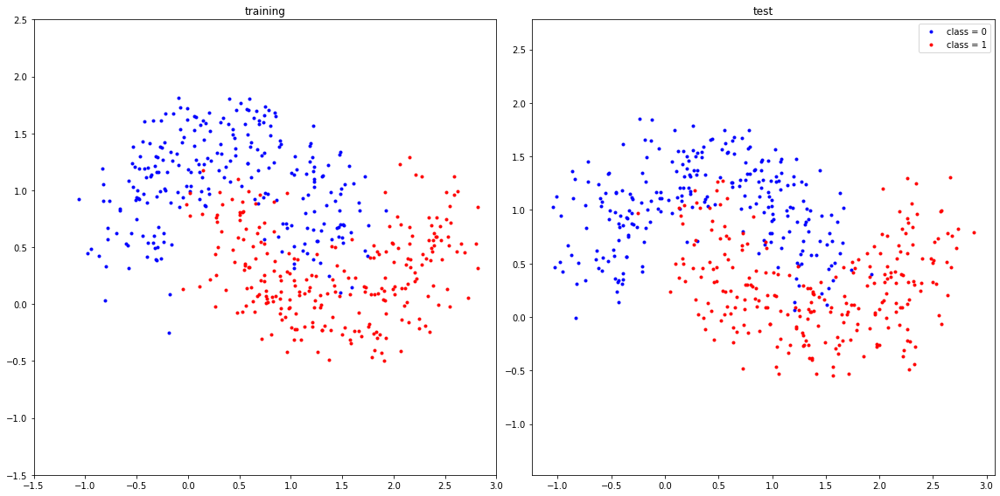

In [918]:
def plot_data(data_train, data_test):
    
    f = plt.figure(figsize=(16,8))   
    ax1 = f.add_subplot(1, 2, 1)
    ax2 = f.add_subplot(1, 2, 2)
    
    num_data = data_train.shape[0]

    red_x = []
    red_y = []
    blue_x = []
    blue_y = []
    
    for i in range(data_train.shape[0]):
        if(data_train[i,2] == 0):
            blue_x.append(data_train[i,0])
            blue_y.append(data_train[i,1])
        else:
            red_x.append(data_train[i,0])
            red_y.append(data_train[i,1])
    
    ax1.plot(blue_x, blue_y, '.', color = 'blue', label = "class = 0")
    ax1.plot(red_x, red_y, '.', color = 'red', label = "class = 1")
    ax1.set_title("training")
    ax1.set_xlim([-1.5, 3.0])
    ax1.set_ylim([-1.5, 2.5])
    
    num_data = data_test.shape[0]
    
    red_xx = []
    red_yy = []
    blue_xx = []
    blue_yy = []
    
    for i in range(data_test.shape[0]):
        if(data_test[i,2] == 0):
            blue_xx.append(data_test[i,0])
            blue_yy.append(data_test[i,1])
        else:
            red_xx.append(data_test[i,0])
            red_yy.append(data_test[i,1])
    
    ax2.plot(blue_xx, blue_yy, '.', color = 'blue', label = "class = 0")
    ax2.plot(red_xx, red_yy, '.', color = 'red', label = "class = 1")
    ax2.set_title("test")
    ax2.set_xlim([-1.5, 3.0])
    ax2.set_ylim([-1.5, 2.5])

    plt.axis('equal')
    plt.legend()
    plt.tight_layout()
    plt.show()
    
plot_data(data_train, data_test)

In [919]:
def plot_model_parameter(theta_iteration):

    plt.figure(figsize=(8,6))   # USE THIS VALUE for the size of the figure
    plt.title('model parameter')

    n = theta_iteration.shape[0]
        
    colors = ['royalblue','orange','green','hotpink','blueviolet','aquamarine','lightcoral','gray','olive','salmon','indigo','chocolate','greenyellow','gold','blue','darkmagenta']
    for i in range(theta_iteration.shape[1]):
        plt.plot(list(range(0,n)), theta_iteration[:,i], '-', color = colors[i] , label = "theta_"+str(i))
    
    plt.xlabel('iteration')
    plt.legend()

    plt.tight_layout()
    plt.show()
    
#plot_model_parameter(theta_iteration)

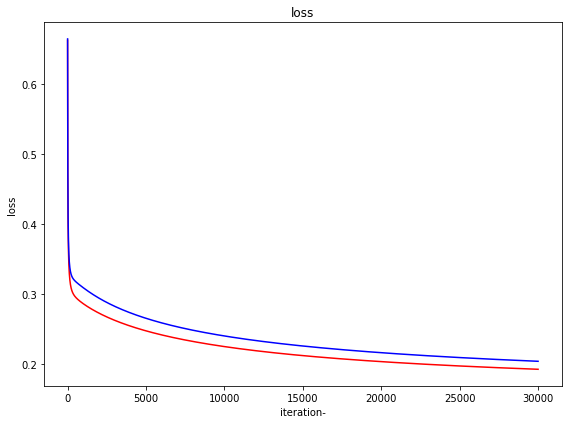

In [920]:
plot_loss_curve(loss_iteration_train, loss_iteration_test)

C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  from ipykernel import kernelapp as app


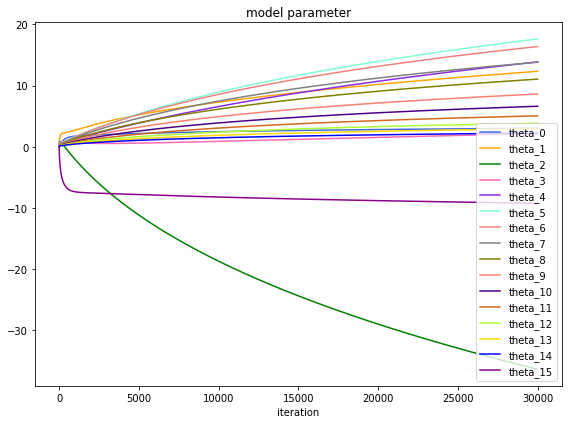

In [921]:
plot_model_parameter(theta_iteration)

In [922]:
def plot_classifier(data, theta):

    plt.figure(figsize=(8,8)) # USE THIS VALUE for the size of the figure
    
    point_x = data[:,0]/data[:,0].max()
    point_y = data[:,1]/data[:,1].max()
    label   = data[:,2]
    
    x = np.linspace(-1, 1) 
    y = np.linspace(-1, 1)
    X,Y = np.meshgrid(x,y)
    Z = theta[0] + theta[1]*X + theta[2]*X**2 + theta[3]*X**3 + theta[4]*X**4 + theta[5]*X**5 + theta[6]*X**6 + theta[7]*X**7 + theta[8]*X**8 + theta[9]*X**9 + theta[10]*X**10 + theta[11]*X**11 + theta[12]*X**12 + theta[13]*X**13 + theta[14]*X**14+ theta[15]*Y
    plt.pcolormesh(X, Y, Z, cmap=plt.cm.get_cmap('RdBu_r'), vmin=-50, vmax=50)
    plt.colorbar()
    
    red_x = []
    red_y = []
    blue_x = []
    blue_y = []
    for i in range(point_x.shape[0]):
        if(label[i] == 0):
            blue_x.append(point_x[i])
            blue_y.append(point_y[i])
        else:
            red_x.append(point_x[i])
            red_y.append(point_y[i])
    
    plt.plot(blue_x, blue_y, '.', color = 'blue', label = "class = 0")
    plt.plot(red_x, red_y, '.', color = 'red', label = "class = 1")
    

    plt.contour(X,Y,Z,[0])    
    
    
    plt.axis('equal')
    plt.legend()
    plt.tight_layout()
    plt.show()

In [923]:
print(theta_optimal)

[  3.0166943   12.32279379 -36.38573008   2.16097119  13.86402408
  17.61934736  16.37964468  13.81448993  11.04521144   8.60759342
   6.61171937   5.04432362   3.83881249   2.92296539   2.23144639
  -9.24210211]


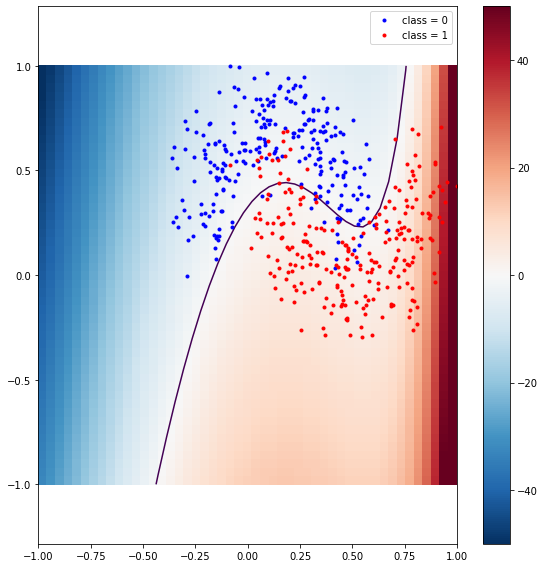

In [924]:
plot_classifier(data_test, theta_optimal)

***

# results

***

1. plot the input data (training on the left sub-figure and testing on the right sub-figure) in blue for class 0 and in red for class 1 from the file [assignment_10_data_train.csv] and [assignment_10_data_test.csv], respectively,

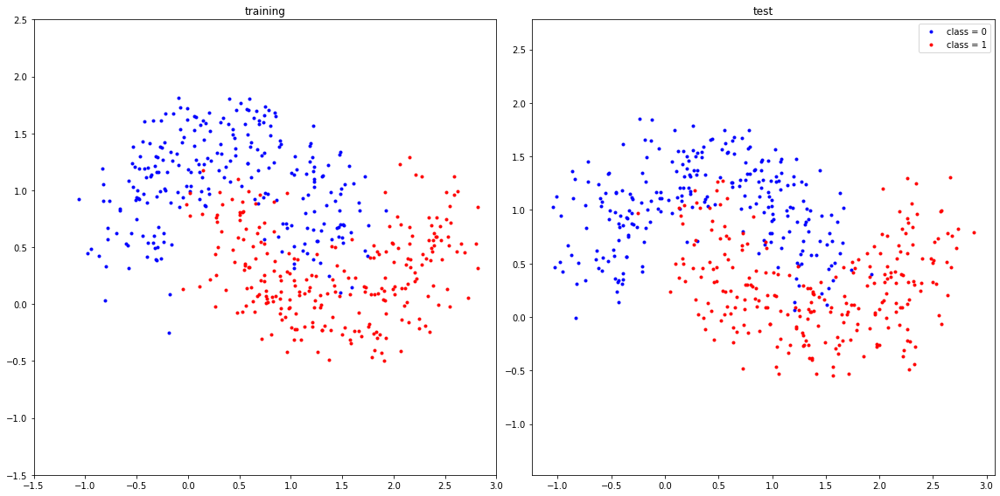

In [925]:
plot_data(data_train, data_test)

***

2. plot the values of the model parameters $\theta$ as curves over the gradient descent iterations using different colors

C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  from ipykernel import kernelapp as app


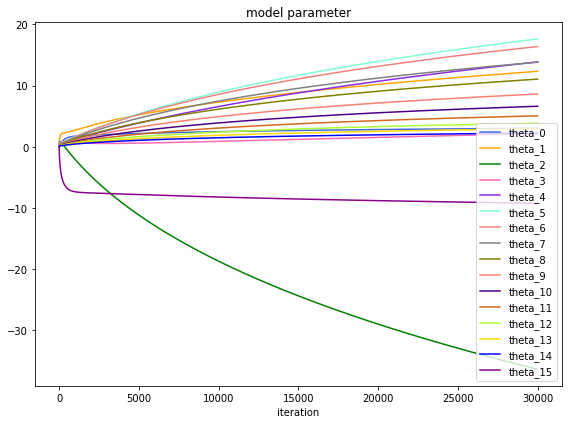

In [926]:
plot_model_parameter(theta_iteration)

***

3. plot the training loss in red curve and the testing loss in blue curve over the gradient descent iterations

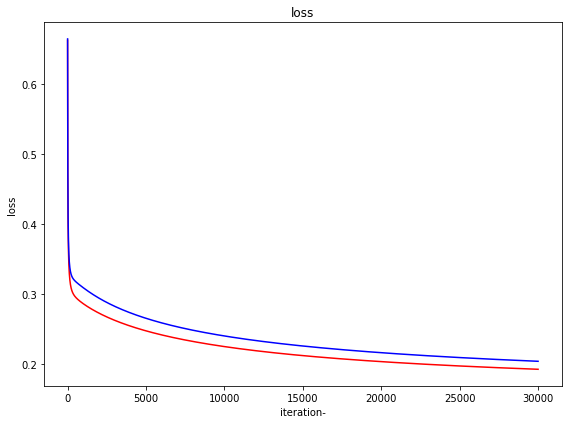

In [927]:
plot_loss_curve(loss_iteration_train, loss_iteration_test)

***

4. plot the training accuracy in red curve and the testing accuracy in blue curve over the gradient descent iterations

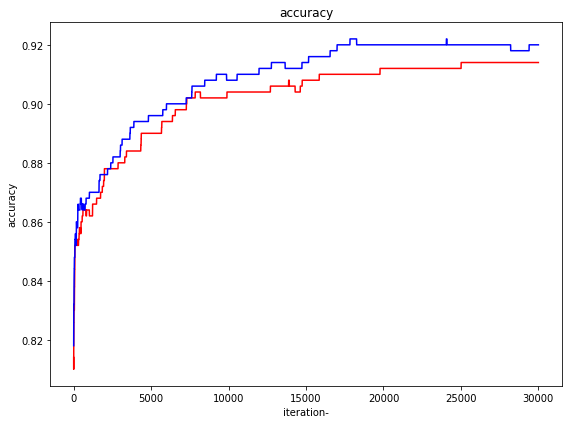

In [928]:
plot_accuracy_curve(accuracy_iteration_train, accuracy_iteration_test)

***

5. plot the classifier using the prediction values in the color coding scheme ranges from blue (class 0) to red (class 1) with the training data

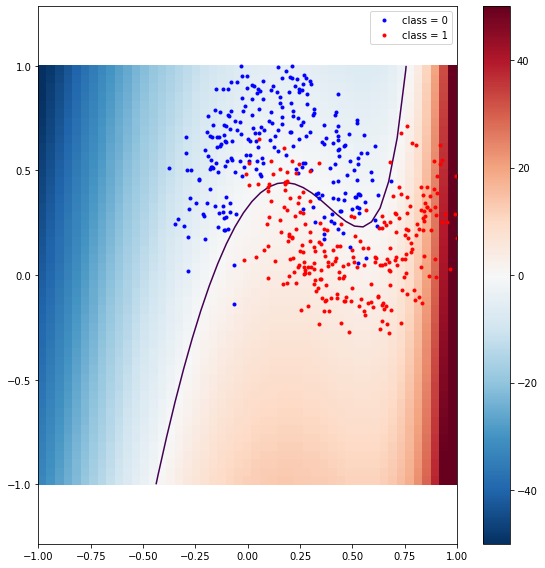

In [929]:
plot_classifier(data_train, theta_optimal)

***

6. plot the classifier using the prediction values in the color coding scheme ranges from blue (class 0) to red (class 1) with the testing data

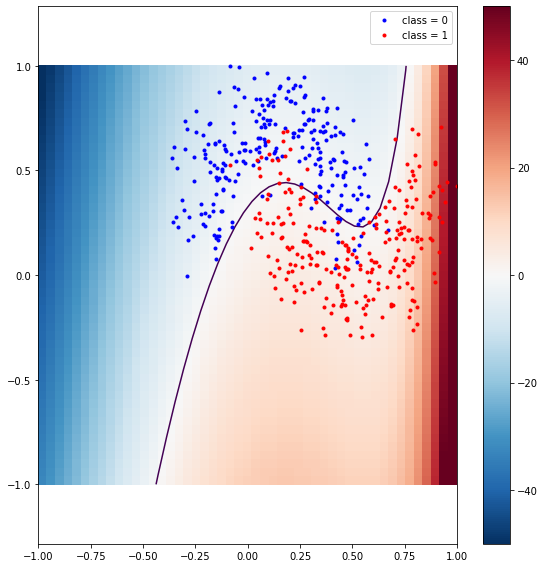

In [930]:
plot_classifier(data_test, theta_optimal)

***

7. print out the final training accuracy and the final testing accuracy in number with 5 decimal places (e.g. 0.98765)

In [931]:
print('accuract(train): {}'.format(accuracy_train))
print('accuracy(test) : {}'.format(accuracy_test))

accuract(train): 0.914
accuracy(test) : 0.92
